# Imports

In [ ]:
#!pip install catboost

In [1]:
import pandas as pd
import numpy as np

from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_auc_score
from sklearn.metrics import mean_squared_error

import catboost as cb

import matplotlib.pyplot as plt
import seaborn as sns
import math

pd.set_option('display.max_columns', None)

# Read diamonds

In [2]:
diamonds_train_sorted = pd.read_csv('../data/diamonds_train_sorted.csv')
diamonds_train_sorted.head()

,price,carat,cut,color,clarity,depth,table,x,y,z
0,326,0.21,3,5,2,59.8,61.0,3.89,3.84,2.31
1,326,0.23,4,5,1,61.5,55.0,3.95,3.98,2.43
2,327,0.23,1,5,4,56.9,65.0,4.05,4.07,2.31
3,334,0.29,3,1,3,62.4,58.0,4.20,4.23,2.63
4,335,0.31,1,0,1,63.3,58.0,4.34,4.35,2.75


# Diamonds correlation

<Axes: >

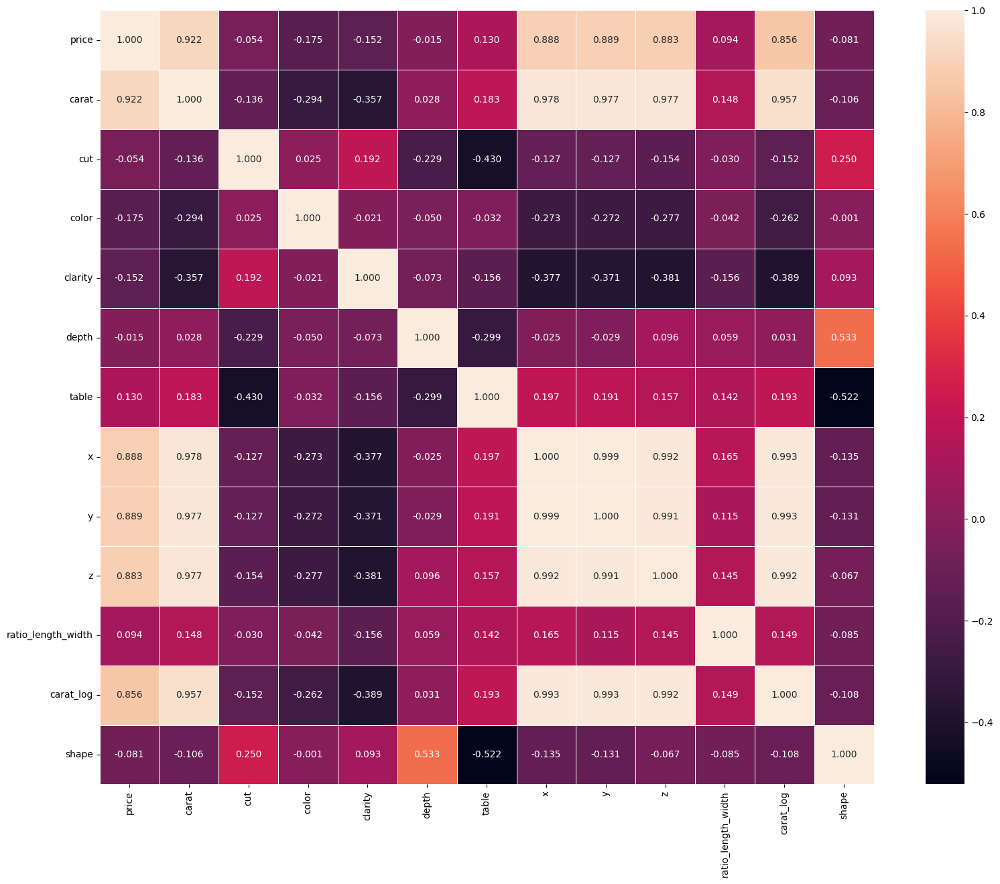

In [8]:
# We do a correlation again to see wich columns we want to keep for the training
plt.subplots(figsize = (20, 15))
corr = diamonds_train_sorted.corr()
sns.heatmap(data = corr, annot = True, fmt = ".3f", cbar = True, linewidth = .5, 
            annot_kws = {'fontsize':10, 'fontweight':'regular'}, square = True)

# Model X and y

In [9]:
# We create X with the columns we want to train with
X = diamonds_train_sorted[['cut',
                           'color', 
                           'clarity',
                           'ratio_length_width',
                           'carat_log',
                           'shape']]

y = diamonds_train_sorted['price']

# Train model CatBoost

In [17]:
# After trying various models, the best one that worked was CatBoost with Gridsearch
model = cb.CatBoostRegressor(loss_function='RMSE')
parameters_grid = {'iterations': [100, 150, 500],
        'learning_rate': [0.03, 0.1, 0.3],
        'depth': [2, 4, 6, 8],
        'l2_leaf_reg': [0.2, 0.5, 1, 3]}

In [18]:
#Train the model
grid_search = GridSearchCV(model,
              parameters_grid,
              cv = 5,
              verbose = 3,
              scoring = 'neg_root_mean_squared_error')
grid_search.fit(X, y)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
0:	learn: 3973.9250149	total: 187ms	remaining: 18.5s
1:	learn: 3883.9783959	total: 190ms	remaining: 9.33s
2:	learn: 3798.8679757	total: 193ms	remaining: 6.24s
3:	learn: 3715.6114805	total: 195ms	remaining: 4.68s
4:	learn: 3634.2568010	total: 198ms	remaining: 3.75s
5:	learn: 3556.0409465	total: 200ms	remaining: 3.13s
6:	learn: 3484.4953573	total: 202ms	remaining: 2.69s
7:	learn: 3412.5279939	total: 205ms	remaining: 2.35s
8:	learn: 3344.4893707	total: 207ms	remaining: 2.09s
9:	learn: 3276.7978343	total: 209ms	remaining: 1.88s
10:	learn: 3214.4190849	total: 212ms	remaining: 1.71s
11:	learn: 3151.4275929	total: 214ms	remaining: 1.57s
12:	learn: 3091.6463032	total: 216ms	remaining: 1.45s
13:	learn: 3034.0500334	total: 218ms	remaining: 1.34s
14:	learn: 2981.4389860	total: 221ms	remaining: 1.25s
15:	learn: 2927.8159241	total: 223ms	remaining: 1.17s
16:	learn: 2879.1275053	total: 226ms	remaining: 1.1s
17:	learn: 2829.0264879	total:

99:	learn: 1434.0888859	total: 283ms	remaining: 0us
[CV 2/5] END depth=2, iterations=100, l2_leaf_reg=0.2, learning_rate=0.03;, score=-490.608 total time=   0.3s
0:	learn: 4271.3463457	total: 20.6ms	remaining: 2.04s
1:	learn: 4170.4857938	total: 25ms	remaining: 1.22s
2:	learn: 4069.9207958	total: 27.8ms	remaining: 899ms
3:	learn: 3975.3403483	total: 30.3ms	remaining: 727ms
4:	learn: 3881.9697692	total: 32.6ms	remaining: 620ms
5:	learn: 3791.4441954	total: 34.8ms	remaining: 545ms
6:	learn: 3706.6456340	total: 37.1ms	remaining: 494ms
7:	learn: 3622.9915020	total: 39.8ms	remaining: 457ms
8:	learn: 3545.1183704	total: 42ms	remaining: 425ms
9:	learn: 3466.8396434	total: 44.2ms	remaining: 398ms
10:	learn: 3390.9650498	total: 46.4ms	remaining: 375ms
11:	learn: 3322.4182485	total: 48.6ms	remaining: 356ms
12:	learn: 3252.7452089	total: 50.7ms	remaining: 340ms
13:	learn: 3185.1736998	total: 53.1ms	remaining: 326ms
14:	learn: 3122.4868531	total: 55.6ms	remaining: 315ms
15:	learn: 3061.0513314	tot

63:	learn: 1520.5161775	total: 208ms	remaining: 117ms
64:	learn: 1510.0551960	total: 212ms	remaining: 114ms
65:	learn: 1500.0522082	total: 214ms	remaining: 110ms
66:	learn: 1490.1252265	total: 217ms	remaining: 107ms
67:	learn: 1480.9815218	total: 221ms	remaining: 104ms
68:	learn: 1472.2562989	total: 227ms	remaining: 102ms
69:	learn: 1463.1108187	total: 230ms	remaining: 98.4ms
70:	learn: 1454.1892141	total: 235ms	remaining: 96.2ms
71:	learn: 1446.2509166	total: 238ms	remaining: 92.6ms
72:	learn: 1437.8360211	total: 241ms	remaining: 89.1ms
73:	learn: 1429.8262124	total: 245ms	remaining: 86.1ms
74:	learn: 1421.9563148	total: 250ms	remaining: 83.2ms
75:	learn: 1414.6787617	total: 253ms	remaining: 79.8ms
76:	learn: 1407.4898186	total: 258ms	remaining: 77.1ms
77:	learn: 1400.0884700	total: 263ms	remaining: 74.1ms
78:	learn: 1393.3708928	total: 265ms	remaining: 70.5ms
79:	learn: 1385.9684063	total: 268ms	remaining: 67ms
80:	learn: 1379.5681317	total: 270ms	remaining: 63.4ms
81:	learn: 1373.47

38:	learn: 1278.9270584	total: 121ms	remaining: 189ms
39:	learn: 1267.0387936	total: 124ms	remaining: 185ms
40:	learn: 1252.0565291	total: 126ms	remaining: 181ms
41:	learn: 1240.8965544	total: 128ms	remaining: 177ms
42:	learn: 1230.3282978	total: 131ms	remaining: 173ms
43:	learn: 1219.3994446	total: 133ms	remaining: 169ms
44:	learn: 1210.0220848	total: 135ms	remaining: 165ms
45:	learn: 1198.8046140	total: 137ms	remaining: 161ms
46:	learn: 1190.8910780	total: 140ms	remaining: 157ms
47:	learn: 1179.0676617	total: 142ms	remaining: 154ms
48:	learn: 1171.0379946	total: 144ms	remaining: 150ms
49:	learn: 1161.2418356	total: 147ms	remaining: 147ms
50:	learn: 1149.7895268	total: 150ms	remaining: 144ms
51:	learn: 1142.5889365	total: 152ms	remaining: 141ms
52:	learn: 1136.6073772	total: 155ms	remaining: 138ms
53:	learn: 1129.6442387	total: 158ms	remaining: 135ms
54:	learn: 1122.6584058	total: 161ms	remaining: 131ms
55:	learn: 1110.5880129	total: 163ms	remaining: 128ms
56:	learn: 1101.7404047	tota

31:	learn: 1348.1685902	total: 103ms	remaining: 219ms
32:	learn: 1323.4080758	total: 106ms	remaining: 215ms
33:	learn: 1309.8801796	total: 108ms	remaining: 210ms
34:	learn: 1291.1607933	total: 111ms	remaining: 206ms
35:	learn: 1279.9762678	total: 113ms	remaining: 202ms
36:	learn: 1262.7391752	total: 116ms	remaining: 198ms
37:	learn: 1252.2988002	total: 119ms	remaining: 194ms
38:	learn: 1235.7654996	total: 122ms	remaining: 190ms
39:	learn: 1223.6738528	total: 124ms	remaining: 187ms
40:	learn: 1212.8801532	total: 127ms	remaining: 183ms
41:	learn: 1200.4032227	total: 130ms	remaining: 179ms
42:	learn: 1192.0134129	total: 132ms	remaining: 175ms
43:	learn: 1179.0493585	total: 134ms	remaining: 170ms
44:	learn: 1166.7725800	total: 136ms	remaining: 166ms
45:	learn: 1158.9917892	total: 138ms	remaining: 162ms
46:	learn: 1150.5608079	total: 141ms	remaining: 158ms
47:	learn: 1140.6391310	total: 143ms	remaining: 155ms
48:	learn: 1127.3461501	total: 145ms	remaining: 151ms
49:	learn: 1119.6471796	tota

84:	learn: 939.4657178	total: 217ms	remaining: 38.3ms
85:	learn: 933.3832491	total: 220ms	remaining: 35.8ms
86:	learn: 931.3788724	total: 222ms	remaining: 33.2ms
87:	learn: 926.9211106	total: 225ms	remaining: 30.7ms
88:	learn: 924.3159867	total: 227ms	remaining: 28.1ms
89:	learn: 921.7974883	total: 230ms	remaining: 25.5ms
90:	learn: 919.6619445	total: 233ms	remaining: 23ms
91:	learn: 918.0253117	total: 235ms	remaining: 20.4ms
92:	learn: 916.5588978	total: 237ms	remaining: 17.9ms
93:	learn: 914.3557427	total: 240ms	remaining: 15.3ms
94:	learn: 912.0020216	total: 242ms	remaining: 12.7ms
95:	learn: 910.7572462	total: 244ms	remaining: 10.2ms
96:	learn: 908.8566890	total: 247ms	remaining: 7.63ms
97:	learn: 907.8299129	total: 249ms	remaining: 5.08ms
98:	learn: 906.3659912	total: 251ms	remaining: 2.54ms
99:	learn: 904.4419341	total: 254ms	remaining: 0us
[CV 4/5] END depth=2, iterations=100, l2_leaf_reg=0.2, learning_rate=0.1;, score=-1867.990 total time=   0.2s
0:	learn: 1518.3894456	total: 1

77:	learn: 773.7553613	total: 219ms	remaining: 61.7ms
78:	learn: 771.3827686	total: 222ms	remaining: 58.9ms
79:	learn: 770.2194419	total: 224ms	remaining: 56ms
80:	learn: 767.1455975	total: 227ms	remaining: 53.2ms
81:	learn: 766.6160266	total: 229ms	remaining: 50.3ms
82:	learn: 765.1044119	total: 232ms	remaining: 47.4ms
83:	learn: 764.3052839	total: 235ms	remaining: 44.7ms
84:	learn: 761.6571210	total: 237ms	remaining: 41.9ms
85:	learn: 760.3762248	total: 240ms	remaining: 39ms
86:	learn: 759.8894518	total: 242ms	remaining: 36.2ms
87:	learn: 757.9181566	total: 244ms	remaining: 33.3ms
88:	learn: 757.5273817	total: 247ms	remaining: 30.5ms
89:	learn: 756.2148805	total: 249ms	remaining: 27.7ms
90:	learn: 751.1933084	total: 251ms	remaining: 24.8ms
91:	learn: 750.4843442	total: 254ms	remaining: 22.1ms
92:	learn: 749.8534328	total: 256ms	remaining: 19.3ms
93:	learn: 747.8139702	total: 258ms	remaining: 16.5ms
94:	learn: 746.0713050	total: 260ms	remaining: 13.7ms
95:	learn: 745.5249558	total: 26

61:	learn: 801.4811097	total: 168ms	remaining: 103ms
62:	learn: 800.9111956	total: 171ms	remaining: 100ms
63:	learn: 800.2870322	total: 174ms	remaining: 97.7ms
64:	learn: 799.6906907	total: 176ms	remaining: 95ms
65:	learn: 797.8187751	total: 179ms	remaining: 92.2ms
66:	learn: 796.0822857	total: 181ms	remaining: 89.2ms
67:	learn: 794.4603280	total: 184ms	remaining: 86.4ms
68:	learn: 791.4417689	total: 186ms	remaining: 83.6ms
69:	learn: 785.1513665	total: 188ms	remaining: 80.7ms
70:	learn: 779.2076817	total: 191ms	remaining: 77.9ms
71:	learn: 777.8803303	total: 193ms	remaining: 75ms
72:	learn: 777.3398935	total: 195ms	remaining: 72.2ms
73:	learn: 773.5290739	total: 198ms	remaining: 69.4ms
74:	learn: 772.4285138	total: 200ms	remaining: 66.8ms
75:	learn: 771.7974144	total: 203ms	remaining: 64ms
76:	learn: 770.9998538	total: 205ms	remaining: 61.2ms
77:	learn: 767.9560167	total: 207ms	remaining: 58.5ms
78:	learn: 767.0173478	total: 210ms	remaining: 55.8ms
79:	learn: 766.6785246	total: 212ms	

53:	learn: 305.9843189	total: 138ms	remaining: 117ms
54:	learn: 305.4624627	total: 140ms	remaining: 115ms
55:	learn: 303.1599089	total: 143ms	remaining: 112ms
56:	learn: 302.6365269	total: 145ms	remaining: 110ms
57:	learn: 302.1460920	total: 148ms	remaining: 107ms
58:	learn: 301.3641047	total: 150ms	remaining: 104ms
59:	learn: 299.8867527	total: 153ms	remaining: 102ms
60:	learn: 297.1986823	total: 156ms	remaining: 100ms
61:	learn: 296.6613216	total: 159ms	remaining: 97.3ms
62:	learn: 296.1934863	total: 161ms	remaining: 94.8ms
63:	learn: 295.5250008	total: 164ms	remaining: 92.1ms
64:	learn: 295.0111695	total: 166ms	remaining: 89.4ms
65:	learn: 294.5968793	total: 168ms	remaining: 86.8ms
66:	learn: 293.0746844	total: 171ms	remaining: 84.1ms
67:	learn: 291.6121595	total: 173ms	remaining: 81.4ms
68:	learn: 291.2785621	total: 175ms	remaining: 78.8ms
69:	learn: 290.9265481	total: 178ms	remaining: 76.1ms
70:	learn: 290.5214591	total: 180ms	remaining: 73.4ms
71:	learn: 289.8154226	total: 182ms	

39:	learn: 2121.4243269	total: 114ms	remaining: 171ms
40:	learn: 2097.6200205	total: 116ms	remaining: 167ms
41:	learn: 2075.3522920	total: 119ms	remaining: 164ms
42:	learn: 2053.3928970	total: 121ms	remaining: 161ms
43:	learn: 2032.3582901	total: 124ms	remaining: 157ms
44:	learn: 2012.6226480	total: 126ms	remaining: 154ms
45:	learn: 1993.4735177	total: 129ms	remaining: 151ms
46:	learn: 1975.9366645	total: 131ms	remaining: 148ms
47:	learn: 1958.3997441	total: 134ms	remaining: 145ms
48:	learn: 1939.9254748	total: 136ms	remaining: 142ms
49:	learn: 1924.0874823	total: 138ms	remaining: 138ms
50:	learn: 1907.7173950	total: 141ms	remaining: 135ms
51:	learn: 1892.9574019	total: 143ms	remaining: 132ms
52:	learn: 1877.5981470	total: 146ms	remaining: 129ms
53:	learn: 1863.4986415	total: 148ms	remaining: 126ms
54:	learn: 1850.0745849	total: 150ms	remaining: 123ms
55:	learn: 1833.6951318	total: 152ms	remaining: 120ms
56:	learn: 1819.9602205	total: 155ms	remaining: 117ms
57:	learn: 1806.6641056	tota

17:	learn: 2873.7790112	total: 75.8ms	remaining: 345ms
18:	learn: 2813.6823136	total: 78.6ms	remaining: 335ms
19:	learn: 2755.6089350	total: 80.9ms	remaining: 324ms
20:	learn: 2700.2884184	total: 83.2ms	remaining: 313ms
21:	learn: 2645.5774562	total: 85.3ms	remaining: 303ms
22:	learn: 2592.4899759	total: 87.7ms	remaining: 294ms
23:	learn: 2541.3792409	total: 90.1ms	remaining: 285ms
24:	learn: 2492.9805289	total: 92.3ms	remaining: 277ms
25:	learn: 2445.8819482	total: 94.6ms	remaining: 269ms
26:	learn: 2401.1572960	total: 97ms	remaining: 262ms
27:	learn: 2356.9996921	total: 99.6ms	remaining: 256ms
28:	learn: 2316.1657244	total: 102ms	remaining: 251ms
29:	learn: 2275.6638532	total: 105ms	remaining: 245ms
30:	learn: 2236.9705697	total: 107ms	remaining: 239ms
31:	learn: 2199.4617625	total: 110ms	remaining: 233ms
32:	learn: 2163.7026274	total: 112ms	remaining: 227ms
33:	learn: 2129.4688602	total: 114ms	remaining: 222ms
34:	learn: 2096.1697265	total: 117ms	remaining: 217ms
35:	learn: 2063.718

0:	learn: 3768.5451149	total: 24.2ms	remaining: 2.39s
1:	learn: 3496.2883261	total: 26.9ms	remaining: 1.32s
2:	learn: 3253.2489750	total: 29.4ms	remaining: 952ms
3:	learn: 3042.2526475	total: 32.1ms	remaining: 771ms
4:	learn: 2858.8651650	total: 34.7ms	remaining: 660ms
5:	learn: 2707.5656082	total: 37.1ms	remaining: 581ms
6:	learn: 2573.0972274	total: 39.5ms	remaining: 525ms
7:	learn: 2443.3142372	total: 42.4ms	remaining: 487ms
8:	learn: 2329.7444538	total: 45.1ms	remaining: 456ms
9:	learn: 2230.2362026	total: 47.8ms	remaining: 430ms
10:	learn: 2144.5178374	total: 50.1ms	remaining: 405ms
11:	learn: 2067.1806229	total: 52.3ms	remaining: 383ms
12:	learn: 1998.0978083	total: 54.6ms	remaining: 365ms
13:	learn: 1933.4793267	total: 56.7ms	remaining: 348ms
14:	learn: 1881.0196904	total: 58.9ms	remaining: 333ms
15:	learn: 1831.9673724	total: 61.9ms	remaining: 325ms
16:	learn: 1791.0291773	total: 64.5ms	remaining: 315ms
17:	learn: 1756.4222381	total: 67.2ms	remaining: 306ms
18:	learn: 1726.0082

0:	learn: 4028.1955107	total: 31ms	remaining: 3.07s
1:	learn: 3714.0096233	total: 34.2ms	remaining: 1.68s
2:	learn: 3435.3658177	total: 36.9ms	remaining: 1.19s
3:	learn: 3196.9202895	total: 39.5ms	remaining: 947ms
4:	learn: 2991.5846270	total: 41.9ms	remaining: 796ms
5:	learn: 2797.0302312	total: 44.2ms	remaining: 692ms
6:	learn: 2633.9255979	total: 46.5ms	remaining: 617ms
7:	learn: 2483.0936592	total: 49.1ms	remaining: 565ms
8:	learn: 2356.8436833	total: 51.7ms	remaining: 522ms
9:	learn: 2244.3399191	total: 54ms	remaining: 486ms
10:	learn: 2152.3043072	total: 56.2ms	remaining: 455ms
11:	learn: 2060.1832743	total: 58.4ms	remaining: 429ms
12:	learn: 1987.2815236	total: 60.7ms	remaining: 406ms
13:	learn: 1918.2295399	total: 62.9ms	remaining: 386ms
14:	learn: 1860.0171785	total: 65.6ms	remaining: 372ms
15:	learn: 1812.3198502	total: 67.8ms	remaining: 356ms
16:	learn: 1762.1926895	total: 70.1ms	remaining: 342ms
17:	learn: 1724.9083667	total: 72.3ms	remaining: 329ms
18:	learn: 1678.5620799	

0:	learn: 1518.3934118	total: 15.2ms	remaining: 1.5s
1:	learn: 1394.0543287	total: 17.9ms	remaining: 877ms
2:	learn: 1288.9532993	total: 20.4ms	remaining: 658ms
3:	learn: 1188.8741875	total: 22.9ms	remaining: 549ms
4:	learn: 1100.6779965	total: 25.3ms	remaining: 481ms
5:	learn: 1022.2801981	total: 27.7ms	remaining: 433ms
6:	learn: 954.0039832	total: 29.8ms	remaining: 396ms
7:	learn: 891.6877618	total: 32.4ms	remaining: 372ms
8:	learn: 838.1894809	total: 35.3ms	remaining: 357ms
9:	learn: 793.5608068	total: 37.6ms	remaining: 338ms
10:	learn: 754.0395401	total: 40ms	remaining: 324ms
11:	learn: 719.9870483	total: 42.3ms	remaining: 310ms
12:	learn: 691.6814630	total: 44.4ms	remaining: 297ms
13:	learn: 666.7956771	total: 46.4ms	remaining: 285ms
14:	learn: 643.0573761	total: 48.6ms	remaining: 276ms
15:	learn: 622.8796063	total: 51.1ms	remaining: 268ms
16:	learn: 606.3587184	total: 53.6ms	remaining: 262ms
17:	learn: 588.9699589	total: 55.8ms	remaining: 254ms
18:	learn: 575.7124848	total: 58.2m

0:	learn: 3261.7163950	total: 25.8ms	remaining: 2.55s
1:	learn: 2696.8160444	total: 28.7ms	remaining: 1.41s
2:	learn: 2298.2859823	total: 31.3ms	remaining: 1.01s
3:	learn: 2013.0010077	total: 33.9ms	remaining: 813ms
4:	learn: 1833.1960932	total: 36.6ms	remaining: 696ms
5:	learn: 1728.4668151	total: 38.8ms	remaining: 608ms
6:	learn: 1610.9505531	total: 41.2ms	remaining: 547ms
7:	learn: 1528.5586347	total: 43.7ms	remaining: 502ms
8:	learn: 1464.9487245	total: 46.5ms	remaining: 470ms
9:	learn: 1401.0479494	total: 49.1ms	remaining: 441ms
10:	learn: 1348.9171114	total: 51.6ms	remaining: 418ms
11:	learn: 1289.8045789	total: 53.8ms	remaining: 394ms
12:	learn: 1252.3508967	total: 56ms	remaining: 375ms
13:	learn: 1216.3502648	total: 58.3ms	remaining: 358ms
14:	learn: 1183.1964156	total: 60.4ms	remaining: 342ms
15:	learn: 1155.3127758	total: 62.6ms	remaining: 328ms
16:	learn: 1116.1233329	total: 64.7ms	remaining: 316ms
17:	learn: 1094.3283805	total: 66.9ms	remaining: 305ms
18:	learn: 1076.118391

0:	learn: 3314.2206333	total: 23.5ms	remaining: 2.33s
1:	learn: 2587.7228102	total: 26.8ms	remaining: 1.31s
2:	learn: 2114.0598989	total: 29.9ms	remaining: 966ms
3:	learn: 1805.7542258	total: 32.8ms	remaining: 787ms
4:	learn: 1605.5677505	total: 35.1ms	remaining: 666ms
5:	learn: 1489.0658862	total: 37.7ms	remaining: 591ms
6:	learn: 1411.2523144	total: 40.1ms	remaining: 533ms
7:	learn: 1346.5305507	total: 42.2ms	remaining: 485ms
8:	learn: 1296.0344133	total: 44.8ms	remaining: 453ms
9:	learn: 1249.5834482	total: 47.7ms	remaining: 430ms
10:	learn: 1216.6749968	total: 50.3ms	remaining: 407ms
11:	learn: 1189.5618929	total: 52.6ms	remaining: 386ms
12:	learn: 1162.6175631	total: 54.9ms	remaining: 367ms
13:	learn: 1141.3616645	total: 57.2ms	remaining: 352ms
14:	learn: 1119.4417857	total: 59.7ms	remaining: 338ms
15:	learn: 1103.3667719	total: 62.9ms	remaining: 330ms
16:	learn: 1073.3770246	total: 65.2ms	remaining: 318ms
17:	learn: 1060.8566045	total: 67.5ms	remaining: 308ms
18:	learn: 1047.9611

[CV 5/5] END depth=2, iterations=100, l2_leaf_reg=0.5, learning_rate=0.3;, score=-5179.792 total time=   0.2s
0:	learn: 3973.9339103	total: 24.2ms	remaining: 2.4s
1:	learn: 3883.9977243	total: 27.3ms	remaining: 1.33s
2:	learn: 3798.8959514	total: 29.7ms	remaining: 961ms
3:	learn: 3715.6482063	total: 32ms	remaining: 768ms
4:	learn: 3634.3024993	total: 34.2ms	remaining: 650ms
5:	learn: 3556.0945908	total: 36.4ms	remaining: 571ms
6:	learn: 3484.5550853	total: 38.9ms	remaining: 517ms
7:	learn: 3412.5939549	total: 41.2ms	remaining: 474ms
8:	learn: 3344.5603164	total: 43.4ms	remaining: 439ms
9:	learn: 3276.8744542	total: 45.7ms	remaining: 411ms
10:	learn: 3214.4995377	total: 47.9ms	remaining: 387ms
11:	learn: 3151.5129405	total: 50.1ms	remaining: 367ms
12:	learn: 3091.7355825	total: 52.6ms	remaining: 352ms
13:	learn: 3034.1427934	total: 55.5ms	remaining: 341ms
14:	learn: 2981.5444252	total: 57.8ms	remaining: 327ms
15:	learn: 2927.9238255	total: 60ms	remaining: 315ms
16:	learn: 2879.2364040	t

83:	learn: 1546.8227409	total: 248ms	remaining: 47.1ms
84:	learn: 1539.3169285	total: 250ms	remaining: 44.1ms
85:	learn: 1531.0223679	total: 253ms	remaining: 41.1ms
86:	learn: 1524.4855648	total: 255ms	remaining: 38.1ms
87:	learn: 1516.6664975	total: 258ms	remaining: 35.1ms
88:	learn: 1510.0850757	total: 260ms	remaining: 32.2ms
89:	learn: 1501.8696822	total: 263ms	remaining: 29.2ms
90:	learn: 1493.0865033	total: 265ms	remaining: 26.2ms
91:	learn: 1486.8634890	total: 267ms	remaining: 23.3ms
92:	learn: 1479.3773653	total: 270ms	remaining: 20.3ms
93:	learn: 1473.4267435	total: 273ms	remaining: 17.4ms
94:	learn: 1466.1671755	total: 275ms	remaining: 14.5ms
95:	learn: 1458.3088250	total: 278ms	remaining: 11.6ms
96:	learn: 1452.5313267	total: 281ms	remaining: 8.68ms
97:	learn: 1446.8706550	total: 283ms	remaining: 5.78ms
98:	learn: 1439.5352666	total: 286ms	remaining: 2.89ms
99:	learn: 1433.8030836	total: 289ms	remaining: 0us
[CV 2/5] END depth=2, iterations=100, l2_leaf_reg=1, learning_rate=0

36:	learn: 2033.7590873	total: 118ms	remaining: 200ms
37:	learn: 2003.3080078	total: 120ms	remaining: 197ms
38:	learn: 1972.9646205	total: 123ms	remaining: 192ms
39:	learn: 1945.2683091	total: 125ms	remaining: 188ms
40:	learn: 1918.8940839	total: 128ms	remaining: 184ms
41:	learn: 1892.2291627	total: 130ms	remaining: 180ms
42:	learn: 1868.0020341	total: 133ms	remaining: 176ms
43:	learn: 1844.6411733	total: 135ms	remaining: 172ms
44:	learn: 1820.7037101	total: 137ms	remaining: 168ms
45:	learn: 1797.7871850	total: 140ms	remaining: 164ms
46:	learn: 1777.3892389	total: 142ms	remaining: 160ms
47:	learn: 1756.7515295	total: 144ms	remaining: 156ms
48:	learn: 1737.4191305	total: 147ms	remaining: 152ms
49:	learn: 1718.5886073	total: 149ms	remaining: 149ms
50:	learn: 1700.9495658	total: 151ms	remaining: 145ms
51:	learn: 1683.1454309	total: 154ms	remaining: 142ms
52:	learn: 1665.9989675	total: 156ms	remaining: 138ms
53:	learn: 1650.1983005	total: 158ms	remaining: 135ms
54:	learn: 1635.3879760	tota

42:	learn: 1230.5319104	total: 119ms	remaining: 158ms
43:	learn: 1219.6025922	total: 122ms	remaining: 155ms
44:	learn: 1210.2230014	total: 124ms	remaining: 152ms
45:	learn: 1199.0069908	total: 126ms	remaining: 148ms
46:	learn: 1191.0946358	total: 128ms	remaining: 145ms
47:	learn: 1179.2688515	total: 130ms	remaining: 141ms
48:	learn: 1171.2351772	total: 133ms	remaining: 138ms
49:	learn: 1161.4363242	total: 136ms	remaining: 136ms
50:	learn: 1149.9850893	total: 138ms	remaining: 133ms
51:	learn: 1142.7877558	total: 140ms	remaining: 130ms
52:	learn: 1136.8070607	total: 143ms	remaining: 127ms
53:	learn: 1129.8406269	total: 145ms	remaining: 124ms
54:	learn: 1122.8555405	total: 147ms	remaining: 120ms
55:	learn: 1110.7865655	total: 149ms	remaining: 117ms
56:	learn: 1101.9399200	total: 152ms	remaining: 114ms
57:	learn: 1095.9198270	total: 154ms	remaining: 111ms
58:	learn: 1088.4563581	total: 156ms	remaining: 108ms
59:	learn: 1083.5559522	total: 158ms	remaining: 106ms
60:	learn: 1076.7203870	tota

38:	learn: 1235.9651925	total: 119ms	remaining: 185ms
39:	learn: 1223.8752242	total: 121ms	remaining: 182ms
40:	learn: 1213.0841994	total: 124ms	remaining: 178ms
41:	learn: 1200.6089029	total: 126ms	remaining: 174ms
42:	learn: 1192.2208953	total: 128ms	remaining: 170ms
43:	learn: 1179.2579690	total: 131ms	remaining: 166ms
44:	learn: 1166.9785977	total: 133ms	remaining: 163ms
45:	learn: 1159.1997350	total: 136ms	remaining: 159ms
46:	learn: 1150.7699492	total: 138ms	remaining: 156ms
47:	learn: 1140.8461589	total: 141ms	remaining: 152ms
48:	learn: 1127.5543657	total: 143ms	remaining: 149ms
49:	learn: 1119.8594441	total: 145ms	remaining: 145ms
50:	learn: 1113.0624699	total: 148ms	remaining: 142ms
51:	learn: 1106.3903146	total: 150ms	remaining: 138ms
52:	learn: 1100.9071223	total: 152ms	remaining: 135ms
53:	learn: 1089.8408721	total: 154ms	remaining: 131ms
54:	learn: 1082.6434371	total: 157ms	remaining: 128ms
55:	learn: 1074.0954179	total: 159ms	remaining: 125ms
56:	learn: 1068.6537817	tota

36:	learn: 448.9155580	total: 99.7ms	remaining: 170ms
37:	learn: 444.7609549	total: 102ms	remaining: 167ms
38:	learn: 440.9393803	total: 105ms	remaining: 164ms
39:	learn: 436.9065859	total: 107ms	remaining: 161ms
40:	learn: 433.6967949	total: 110ms	remaining: 158ms
41:	learn: 430.4318996	total: 112ms	remaining: 155ms
42:	learn: 427.5987921	total: 115ms	remaining: 152ms
43:	learn: 425.2200811	total: 117ms	remaining: 149ms
44:	learn: 421.7175876	total: 120ms	remaining: 147ms
45:	learn: 419.0275523	total: 122ms	remaining: 144ms
46:	learn: 416.4270179	total: 125ms	remaining: 141ms
47:	learn: 413.8184351	total: 127ms	remaining: 138ms
48:	learn: 410.4266649	total: 129ms	remaining: 135ms
49:	learn: 407.3220874	total: 132ms	remaining: 132ms
50:	learn: 404.3537059	total: 134ms	remaining: 129ms
51:	learn: 402.2231644	total: 136ms	remaining: 126ms
52:	learn: 400.1563866	total: 138ms	remaining: 123ms
53:	learn: 397.5686618	total: 141ms	remaining: 120ms
54:	learn: 395.4831759	total: 143ms	remaining

89:	learn: 769.1834072	total: 225ms	remaining: 25ms
90:	learn: 767.8054209	total: 228ms	remaining: 22.5ms
91:	learn: 766.0817460	total: 230ms	remaining: 20ms
92:	learn: 765.6296215	total: 232ms	remaining: 17.5ms
93:	learn: 765.0730780	total: 235ms	remaining: 15ms
94:	learn: 764.8756474	total: 238ms	remaining: 12.5ms
95:	learn: 763.2640216	total: 240ms	remaining: 10ms
96:	learn: 758.3960651	total: 242ms	remaining: 7.49ms
97:	learn: 757.3609435	total: 245ms	remaining: 4.99ms
98:	learn: 752.9995666	total: 247ms	remaining: 2.5ms
99:	learn: 752.4526623	total: 250ms	remaining: 0us
[CV 1/5] END depth=2, iterations=100, l2_leaf_reg=1, learning_rate=0.3;, score=-310.575 total time=   0.2s
0:	learn: 3261.7820159	total: 27ms	remaining: 2.67s
1:	learn: 2696.8930660	total: 29.5ms	remaining: 1.45s
2:	learn: 2298.3590877	total: 31.9ms	remaining: 1.03s
3:	learn: 2013.0922149	total: 34.2ms	remaining: 821ms
4:	learn: 1833.2814288	total: 36.6ms	remaining: 695ms
5:	learn: 1728.5428569	total: 38.9ms	remain

76:	learn: 774.5438469	total: 212ms	remaining: 63.4ms
77:	learn: 771.8696222	total: 215ms	remaining: 60.7ms
78:	learn: 767.1769803	total: 218ms	remaining: 57.9ms
79:	learn: 766.5216336	total: 220ms	remaining: 55.1ms
80:	learn: 766.1215339	total: 223ms	remaining: 52.2ms
81:	learn: 763.8949080	total: 225ms	remaining: 49.4ms
82:	learn: 763.3347490	total: 228ms	remaining: 46.7ms
83:	learn: 763.0581349	total: 231ms	remaining: 43.9ms
84:	learn: 760.2869809	total: 233ms	remaining: 41.1ms
85:	learn: 756.8460311	total: 236ms	remaining: 38.4ms
86:	learn: 754.6786921	total: 238ms	remaining: 35.6ms
87:	learn: 754.0666040	total: 240ms	remaining: 32.8ms
88:	learn: 753.8822290	total: 243ms	remaining: 30ms
89:	learn: 753.5957348	total: 246ms	remaining: 27.3ms
90:	learn: 752.5830796	total: 248ms	remaining: 24.5ms
91:	learn: 750.9495406	total: 250ms	remaining: 21.8ms
92:	learn: 748.3378270	total: 252ms	remaining: 19ms
93:	learn: 747.7801048	total: 255ms	remaining: 16.2ms
94:	learn: 746.5917322	total: 25

44:	learn: 315.9567017	total: 114ms	remaining: 139ms
45:	learn: 314.6652777	total: 117ms	remaining: 137ms
46:	learn: 313.6515771	total: 120ms	remaining: 135ms
47:	learn: 311.7098993	total: 122ms	remaining: 132ms
48:	learn: 309.2907562	total: 125ms	remaining: 130ms
49:	learn: 307.9744957	total: 127ms	remaining: 127ms
50:	learn: 307.1498980	total: 130ms	remaining: 125ms
51:	learn: 305.9088086	total: 132ms	remaining: 122ms
52:	learn: 305.1425767	total: 135ms	remaining: 120ms
53:	learn: 304.5823921	total: 137ms	remaining: 117ms
54:	learn: 302.8281447	total: 139ms	remaining: 114ms
55:	learn: 302.1555585	total: 142ms	remaining: 111ms
56:	learn: 300.7587442	total: 144ms	remaining: 109ms
57:	learn: 299.5333397	total: 147ms	remaining: 106ms
58:	learn: 298.9044452	total: 149ms	remaining: 104ms
59:	learn: 298.5726128	total: 151ms	remaining: 101ms
60:	learn: 298.2149297	total: 154ms	remaining: 98.3ms
61:	learn: 296.9401956	total: 156ms	remaining: 95.7ms
62:	learn: 296.5189197	total: 158ms	remainin

38:	learn: 2146.5211625	total: 112ms	remaining: 175ms
39:	learn: 2121.9081578	total: 115ms	remaining: 172ms
40:	learn: 2098.1051214	total: 117ms	remaining: 169ms
41:	learn: 2075.8294018	total: 120ms	remaining: 165ms
42:	learn: 2053.8699098	total: 122ms	remaining: 162ms
43:	learn: 2032.8372127	total: 124ms	remaining: 158ms
44:	learn: 2013.0919943	total: 127ms	remaining: 155ms
45:	learn: 1993.9342355	total: 130ms	remaining: 152ms
46:	learn: 1976.3952309	total: 132ms	remaining: 149ms
47:	learn: 1958.8492633	total: 134ms	remaining: 146ms
48:	learn: 1940.3764096	total: 137ms	remaining: 142ms
49:	learn: 1924.5295998	total: 139ms	remaining: 139ms
50:	learn: 1908.1518214	total: 142ms	remaining: 136ms
51:	learn: 1893.3825850	total: 144ms	remaining: 133ms
52:	learn: 1878.0168395	total: 146ms	remaining: 130ms
53:	learn: 1863.9131465	total: 149ms	remaining: 127ms
54:	learn: 1850.4886443	total: 151ms	remaining: 123ms
55:	learn: 1834.1106350	total: 153ms	remaining: 120ms
56:	learn: 1820.3689013	tota

30:	learn: 2237.6776942	total: 98.8ms	remaining: 220ms
31:	learn: 2200.1712269	total: 102ms	remaining: 217ms
32:	learn: 2164.4084787	total: 105ms	remaining: 212ms
33:	learn: 2130.1732426	total: 107ms	remaining: 208ms
34:	learn: 2096.8639267	total: 110ms	remaining: 204ms
35:	learn: 2064.4024918	total: 112ms	remaining: 200ms
36:	learn: 2034.2974254	total: 115ms	remaining: 196ms
37:	learn: 2003.8383957	total: 118ms	remaining: 193ms
38:	learn: 1973.4873728	total: 121ms	remaining: 189ms
39:	learn: 1945.7866026	total: 123ms	remaining: 185ms
40:	learn: 1919.4076230	total: 126ms	remaining: 181ms
41:	learn: 1892.7335447	total: 128ms	remaining: 177ms
42:	learn: 1868.5006773	total: 131ms	remaining: 173ms
43:	learn: 1845.1306877	total: 133ms	remaining: 169ms
44:	learn: 1821.1837948	total: 136ms	remaining: 166ms
45:	learn: 1798.2580974	total: 139ms	remaining: 163ms
46:	learn: 1777.8510355	total: 141ms	remaining: 159ms
47:	learn: 1757.2046988	total: 144ms	remaining: 156ms
48:	learn: 1737.8648698	tot

16:	learn: 1791.4005223	total: 65.2ms	remaining: 318ms
17:	learn: 1756.8493938	total: 68.1ms	remaining: 310ms
18:	learn: 1726.4656312	total: 70.4ms	remaining: 300ms
19:	learn: 1683.1630290	total: 72.8ms	remaining: 291ms
20:	learn: 1649.9056379	total: 75.3ms	remaining: 283ms
21:	learn: 1622.6662817	total: 78.3ms	remaining: 278ms
22:	learn: 1590.6524836	total: 81.2ms	remaining: 272ms
23:	learn: 1556.5519255	total: 83.9ms	remaining: 266ms
24:	learn: 1533.2319200	total: 86.3ms	remaining: 259ms
25:	learn: 1507.1918076	total: 88.7ms	remaining: 252ms
26:	learn: 1487.6294137	total: 91ms	remaining: 246ms
27:	learn: 1468.2778364	total: 93.5ms	remaining: 241ms
28:	learn: 1446.8030809	total: 96.1ms	remaining: 235ms
29:	learn: 1421.4512267	total: 98.3ms	remaining: 229ms
30:	learn: 1404.7618917	total: 101ms	remaining: 224ms
31:	learn: 1386.6704117	total: 103ms	remaining: 220ms
32:	learn: 1371.6877325	total: 106ms	remaining: 215ms
33:	learn: 1351.9713438	total: 109ms	remaining: 212ms
34:	learn: 1338.

2:	learn: 3435.6664011	total: 34.2ms	remaining: 1.1s
3:	learn: 3197.3332495	total: 37ms	remaining: 888ms
4:	learn: 2992.0258528	total: 39.4ms	remaining: 748ms
5:	learn: 2797.4899635	total: 41.8ms	remaining: 655ms
6:	learn: 2634.3814065	total: 44.2ms	remaining: 588ms
7:	learn: 2483.6113244	total: 46.7ms	remaining: 537ms
8:	learn: 2357.3428885	total: 49.3ms	remaining: 498ms
9:	learn: 2244.8172061	total: 52.6ms	remaining: 473ms
10:	learn: 2152.8110191	total: 55.3ms	remaining: 447ms
11:	learn: 2060.6831379	total: 57.7ms	remaining: 423ms
12:	learn: 1987.7787923	total: 59.9ms	remaining: 401ms
13:	learn: 1919.2774900	total: 62.1ms	remaining: 381ms
14:	learn: 1867.1683276	total: 64.3ms	remaining: 364ms
15:	learn: 1820.2363721	total: 66.5ms	remaining: 349ms
16:	learn: 1766.2509271	total: 68.8ms	remaining: 336ms
17:	learn: 1727.5725359	total: 71ms	remaining: 324ms
18:	learn: 1683.2425016	total: 73.5ms	remaining: 313ms
19:	learn: 1646.7612096	total: 75.6ms	remaining: 303ms
20:	learn: 1615.5110614

0:	learn: 1518.4264546	total: 14.3ms	remaining: 1.42s
1:	learn: 1394.1212835	total: 16.8ms	remaining: 822ms
2:	learn: 1289.0351993	total: 19.1ms	remaining: 618ms
3:	learn: 1188.9725009	total: 21.7ms	remaining: 522ms
4:	learn: 1100.7862748	total: 24.3ms	remaining: 461ms
5:	learn: 1022.3994171	total: 26.5ms	remaining: 416ms
6:	learn: 954.1290565	total: 28.7ms	remaining: 381ms
7:	learn: 891.8132600	total: 31.1ms	remaining: 358ms
8:	learn: 838.3127936	total: 33.3ms	remaining: 336ms
9:	learn: 793.6817614	total: 35.5ms	remaining: 319ms
10:	learn: 754.1553401	total: 37.7ms	remaining: 305ms
11:	learn: 720.0964038	total: 40.2ms	remaining: 295ms
12:	learn: 691.7819499	total: 42.4ms	remaining: 284ms
13:	learn: 666.8899858	total: 44.6ms	remaining: 274ms
14:	learn: 643.1432245	total: 46.8ms	remaining: 265ms
15:	learn: 622.9593177	total: 48.9ms	remaining: 257ms
16:	learn: 606.4379182	total: 51.3ms	remaining: 251ms
17:	learn: 589.0487619	total: 53.9ms	remaining: 245ms
18:	learn: 575.7906730	total: 57

98:	learn: 757.6058731	total: 260ms	remaining: 2.62ms
99:	learn: 757.2406973	total: 262ms	remaining: 0us
[CV 1/5] END depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.3;, score=-282.070 total time=   0.2s
0:	learn: 3262.0443915	total: 23.5ms	remaining: 2.33s
1:	learn: 2697.2010700	total: 26.2ms	remaining: 1.28s
2:	learn: 2298.6514775	total: 28.8ms	remaining: 932ms
3:	learn: 2013.4569800	total: 31.4ms	remaining: 754ms
4:	learn: 1833.6227604	total: 33.6ms	remaining: 639ms
5:	learn: 1728.8470344	total: 35.8ms	remaining: 561ms
6:	learn: 1611.4092965	total: 38ms	remaining: 505ms
7:	learn: 1529.0577750	total: 40.3ms	remaining: 464ms
8:	learn: 1465.4418811	total: 42.6ms	remaining: 431ms
9:	learn: 1401.7739571	total: 45ms	remaining: 405ms
10:	learn: 1349.6522795	total: 47.3ms	remaining: 382ms
11:	learn: 1290.5017491	total: 49.4ms	remaining: 363ms
12:	learn: 1253.0687283	total: 51.8ms	remaining: 347ms
13:	learn: 1217.0329331	total: 54ms	remaining: 332ms
14:	learn: 1183.8859444	total: 56.

90:	learn: 748.2131600	total: 254ms	remaining: 25.1ms
91:	learn: 747.0474541	total: 257ms	remaining: 22.3ms
92:	learn: 745.2614676	total: 259ms	remaining: 19.5ms
93:	learn: 742.1232432	total: 262ms	remaining: 16.7ms
94:	learn: 741.5976349	total: 264ms	remaining: 13.9ms
95:	learn: 740.0169303	total: 267ms	remaining: 11.1ms
96:	learn: 739.7288559	total: 269ms	remaining: 8.33ms
97:	learn: 739.4759459	total: 272ms	remaining: 5.55ms
98:	learn: 739.3384104	total: 274ms	remaining: 2.77ms
99:	learn: 738.5250343	total: 276ms	remaining: 0us
[CV 3/5] END depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.3;, score=-529.519 total time=   0.2s
0:	learn: 3314.8559603	total: 22.3ms	remaining: 2.21s
1:	learn: 2588.4431605	total: 25.1ms	remaining: 1.23s
2:	learn: 2114.8770902	total: 27.3ms	remaining: 883ms
3:	learn: 1806.4120371	total: 29.8ms	remaining: 716ms
4:	learn: 1612.6555050	total: 32.1ms	remaining: 611ms
5:	learn: 1485.9472522	total: 34.6ms	remaining: 542ms
6:	learn: 1408.3969415	total: 37

89:	learn: 278.6495888	total: 221ms	remaining: 24.5ms
90:	learn: 278.5382384	total: 224ms	remaining: 22.1ms
91:	learn: 278.1211230	total: 227ms	remaining: 19.7ms
92:	learn: 277.4247056	total: 229ms	remaining: 17.2ms
93:	learn: 277.1131458	total: 231ms	remaining: 14.8ms
94:	learn: 276.2975902	total: 234ms	remaining: 12.3ms
95:	learn: 276.1282471	total: 236ms	remaining: 9.84ms
96:	learn: 275.9120513	total: 239ms	remaining: 7.38ms
97:	learn: 275.6201564	total: 241ms	remaining: 4.92ms
98:	learn: 274.9939819	total: 243ms	remaining: 2.46ms
99:	learn: 274.8544974	total: 245ms	remaining: 0us
[CV 5/5] END depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.3;, score=-5188.177 total time=   0.2s
0:	learn: 3973.9250149	total: 23.4ms	remaining: 3.49s
1:	learn: 3883.9783959	total: 26.4ms	remaining: 1.95s
2:	learn: 3798.8679757	total: 28.8ms	remaining: 1.41s
3:	learn: 3715.6114805	total: 30.9ms	remaining: 1.13s
4:	learn: 3634.2568010	total: 33.3ms	remaining: 966ms
5:	learn: 3556.0409465	total: 3

29:	learn: 2406.2945850	total: 91.8ms	remaining: 367ms
30:	learn: 2372.5104293	total: 94.7ms	remaining: 363ms
31:	learn: 2339.8727512	total: 96.9ms	remaining: 357ms
32:	learn: 2308.5736497	total: 99.3ms	remaining: 352ms
33:	learn: 2280.2856597	total: 102ms	remaining: 348ms
34:	learn: 2251.1347632	total: 105ms	remaining: 344ms
35:	learn: 2223.1114129	total: 107ms	remaining: 339ms
36:	learn: 2196.6475447	total: 110ms	remaining: 337ms
37:	learn: 2171.3621877	total: 113ms	remaining: 333ms
38:	learn: 2145.9714487	total: 115ms	remaining: 328ms
39:	learn: 2121.3662463	total: 118ms	remaining: 324ms
40:	learn: 2097.5617882	total: 120ms	remaining: 320ms
41:	learn: 2075.2950199	total: 123ms	remaining: 316ms
42:	learn: 2053.3356374	total: 125ms	remaining: 311ms
43:	learn: 2032.3008012	total: 127ms	remaining: 306ms
44:	learn: 2012.5663094	total: 130ms	remaining: 303ms
45:	learn: 1993.4182157	total: 132ms	remaining: 299ms
46:	learn: 1975.8816218	total: 135ms	remaining: 295ms
47:	learn: 1958.3457881	

72:	learn: 1622.8218429	total: 231ms	remaining: 244ms
73:	learn: 1614.9195173	total: 234ms	remaining: 240ms
74:	learn: 1607.4486631	total: 237ms	remaining: 237ms
75:	learn: 1595.8888886	total: 239ms	remaining: 233ms
76:	learn: 1585.9241818	total: 242ms	remaining: 229ms
77:	learn: 1578.0471367	total: 245ms	remaining: 226ms
78:	learn: 1570.7948401	total: 247ms	remaining: 222ms
79:	learn: 1560.4877817	total: 251ms	remaining: 219ms
80:	learn: 1553.7190012	total: 253ms	remaining: 216ms
81:	learn: 1547.2382776	total: 256ms	remaining: 212ms
82:	learn: 1537.4610620	total: 259ms	remaining: 209ms
83:	learn: 1527.0944674	total: 261ms	remaining: 205ms
84:	learn: 1519.8239101	total: 264ms	remaining: 202ms
85:	learn: 1511.4959597	total: 266ms	remaining: 198ms
86:	learn: 1505.5029536	total: 269ms	remaining: 195ms
87:	learn: 1496.3915054	total: 272ms	remaining: 192ms
88:	learn: 1490.0330955	total: 275ms	remaining: 188ms
89:	learn: 1481.7564905	total: 277ms	remaining: 185ms
90:	learn: 1475.7473040	tota

120:	learn: 1198.5692414	total: 352ms	remaining: 84.4ms
121:	learn: 1195.5700986	total: 355ms	remaining: 81.5ms
122:	learn: 1192.2731981	total: 358ms	remaining: 78.5ms
123:	learn: 1189.3014781	total: 360ms	remaining: 75.5ms
124:	learn: 1186.4675664	total: 363ms	remaining: 72.6ms
125:	learn: 1183.5560539	total: 365ms	remaining: 69.6ms
126:	learn: 1180.7945112	total: 369ms	remaining: 66.7ms
127:	learn: 1178.1427769	total: 372ms	remaining: 63.9ms
128:	learn: 1175.5284659	total: 375ms	remaining: 61ms
129:	learn: 1172.8211267	total: 377ms	remaining: 58ms
130:	learn: 1169.4778679	total: 380ms	remaining: 55.1ms
131:	learn: 1166.4478784	total: 382ms	remaining: 52.1ms
132:	learn: 1163.8240445	total: 385ms	remaining: 49.2ms
133:	learn: 1160.5069005	total: 387ms	remaining: 46.2ms
134:	learn: 1158.0776214	total: 390ms	remaining: 43.3ms
135:	learn: 1155.8671454	total: 392ms	remaining: 40.4ms
136:	learn: 1153.4050791	total: 395ms	remaining: 37.4ms
137:	learn: 1151.3351294	total: 397ms	remaining: 34.

0:	learn: 3768.5342350	total: 24.8ms	remaining: 3.7s
1:	learn: 3496.2666520	total: 27.8ms	remaining: 2.06s
2:	learn: 3253.2187149	total: 30.3ms	remaining: 1.49s
3:	learn: 3042.2166054	total: 32.7ms	remaining: 1.19s
4:	learn: 2858.8253570	total: 35.3ms	remaining: 1.02s
5:	learn: 2707.5133280	total: 37.9ms	remaining: 910ms
6:	learn: 2573.0396017	total: 40.3ms	remaining: 823ms
7:	learn: 2443.2510397	total: 42.9ms	remaining: 762ms
8:	learn: 2329.6834274	total: 45.5ms	remaining: 713ms
9:	learn: 2230.1781268	total: 48.5ms	remaining: 678ms
10:	learn: 2144.4583939	total: 50.9ms	remaining: 643ms
11:	learn: 2067.1234783	total: 53.3ms	remaining: 613ms
12:	learn: 1998.0443188	total: 55.8ms	remaining: 588ms
13:	learn: 1933.4250042	total: 57.9ms	remaining: 562ms
14:	learn: 1880.9693087	total: 60.2ms	remaining: 542ms
15:	learn: 1831.9195535	total: 62.7ms	remaining: 525ms
16:	learn: 1790.9846162	total: 65.2ms	remaining: 510ms
17:	learn: 1756.3708437	total: 67.5ms	remaining: 495ms
18:	learn: 1725.95321

0:	learn: 3863.6752240	total: 24.2ms	remaining: 3.61s
1:	learn: 3588.3829472	total: 27.3ms	remaining: 2.02s
2:	learn: 3355.6604834	total: 29.9ms	remaining: 1.47s
3:	learn: 3135.7520461	total: 32.2ms	remaining: 1.18s
4:	learn: 2944.0335522	total: 34.4ms	remaining: 997ms
5:	learn: 2786.5689739	total: 36.5ms	remaining: 877ms
6:	learn: 2631.1455660	total: 38.7ms	remaining: 790ms
7:	learn: 2505.4981725	total: 41ms	remaining: 727ms
8:	learn: 2385.3249142	total: 43.3ms	remaining: 678ms
9:	learn: 2275.4014917	total: 45.5ms	remaining: 637ms
10:	learn: 2188.1449956	total: 47.7ms	remaining: 603ms
11:	learn: 2109.6426357	total: 50ms	remaining: 575ms
12:	learn: 2030.6004945	total: 52.4ms	remaining: 552ms
13:	learn: 1963.6010353	total: 54.7ms	remaining: 531ms
14:	learn: 1904.5731235	total: 57ms	remaining: 513ms
15:	learn: 1848.4874788	total: 59.4ms	remaining: 498ms
16:	learn: 1797.1229058	total: 61.9ms	remaining: 484ms
17:	learn: 1755.5940743	total: 64.2ms	remaining: 471ms
18:	learn: 1722.7842730	to

0:	learn: 4028.1797383	total: 35.4ms	remaining: 5.28s
1:	learn: 3713.9825498	total: 38.4ms	remaining: 2.84s
2:	learn: 3435.3297326	total: 40.8ms	remaining: 2s
3:	learn: 3196.8707066	total: 43.3ms	remaining: 1.58s
4:	learn: 2991.5316540	total: 45.8ms	remaining: 1.33s
5:	learn: 2796.9750399	total: 48.5ms	remaining: 1.16s
6:	learn: 2633.8708802	total: 51ms	remaining: 1.04s
7:	learn: 2483.0315107	total: 53.5ms	remaining: 950ms
8:	learn: 2356.7837537	total: 56.2ms	remaining: 880ms
9:	learn: 2244.2826242	total: 58.7ms	remaining: 822ms
10:	learn: 2152.2434785	total: 61ms	remaining: 771ms
11:	learn: 2060.1232724	total: 63.3ms	remaining: 728ms
12:	learn: 1987.2218364	total: 65.9ms	remaining: 695ms
13:	learn: 1918.1691320	total: 68.3ms	remaining: 664ms
14:	learn: 1859.9615384	total: 70.6ms	remaining: 635ms
15:	learn: 1812.2647834	total: 72.9ms	remaining: 611ms
16:	learn: 1762.1410675	total: 75.2ms	remaining: 588ms
17:	learn: 1724.8513380	total: 77.7ms	remaining: 570ms
18:	learn: 1678.5046089	tot

0:	learn: 4044.3709687	total: 24.4ms	remaining: 3.64s
1:	learn: 3711.0506582	total: 27.8ms	remaining: 2.06s
2:	learn: 3412.6118983	total: 30.6ms	remaining: 1.5s
3:	learn: 3149.7844084	total: 33ms	remaining: 1.21s
4:	learn: 2918.9357725	total: 35.5ms	remaining: 1.03s
5:	learn: 2713.2300818	total: 37.9ms	remaining: 909ms
6:	learn: 2534.9096717	total: 40.1ms	remaining: 819ms
7:	learn: 2377.3287397	total: 42.6ms	remaining: 756ms
8:	learn: 2242.5172827	total: 44.8ms	remaining: 703ms
9:	learn: 2116.9751691	total: 47.1ms	remaining: 660ms
10:	learn: 2013.2852311	total: 49.5ms	remaining: 625ms
11:	learn: 1914.7159310	total: 51.8ms	remaining: 596ms
12:	learn: 1829.7279922	total: 54.5ms	remaining: 574ms
13:	learn: 1756.9367363	total: 57.2ms	remaining: 556ms
14:	learn: 1690.8711267	total: 60.1ms	remaining: 541ms
15:	learn: 1638.9023135	total: 62.3ms	remaining: 522ms
16:	learn: 1588.9020251	total: 64.7ms	remaining: 506ms
17:	learn: 1548.8050778	total: 66.8ms	remaining: 490ms
18:	learn: 1513.5947818

0:	learn: 1518.3894456	total: 15.9ms	remaining: 2.37s
1:	learn: 1394.0462916	total: 18.6ms	remaining: 1.38s
2:	learn: 1288.9434685	total: 21.1ms	remaining: 1.03s
3:	learn: 1188.8623869	total: 23.5ms	remaining: 857ms
4:	learn: 1100.6650002	total: 26.1ms	remaining: 756ms
5:	learn: 1022.2658887	total: 28.9ms	remaining: 693ms
6:	learn: 953.9889714	total: 31.4ms	remaining: 642ms
7:	learn: 891.6726996	total: 34.1ms	remaining: 605ms
8:	learn: 838.1746814	total: 36.5ms	remaining: 572ms
9:	learn: 793.5462907	total: 38.9ms	remaining: 545ms
10:	learn: 754.0256432	total: 41.2ms	remaining: 521ms
11:	learn: 719.9739253	total: 43.5ms	remaining: 500ms
12:	learn: 691.6694046	total: 45.8ms	remaining: 482ms
13:	learn: 666.7843606	total: 48ms	remaining: 466ms
14:	learn: 643.0470751	total: 50.5ms	remaining: 455ms
15:	learn: 622.8700421	total: 52.9ms	remaining: 443ms
16:	learn: 606.3492154	total: 55.4ms	remaining: 434ms
17:	learn: 588.9605032	total: 57.7ms	remaining: 423ms
18:	learn: 575.7031027	total: 60.4

78:	learn: 771.3827686	total: 212ms	remaining: 191ms
79:	learn: 770.2194419	total: 215ms	remaining: 188ms
80:	learn: 767.1455975	total: 218ms	remaining: 186ms
81:	learn: 766.6160266	total: 220ms	remaining: 183ms
82:	learn: 765.1044119	total: 223ms	remaining: 180ms
83:	learn: 764.3052839	total: 225ms	remaining: 177ms
84:	learn: 761.6571210	total: 227ms	remaining: 174ms
85:	learn: 760.3762248	total: 230ms	remaining: 171ms
86:	learn: 759.8894518	total: 233ms	remaining: 169ms
87:	learn: 757.9181566	total: 236ms	remaining: 166ms
88:	learn: 757.5273817	total: 238ms	remaining: 163ms
89:	learn: 756.2148805	total: 241ms	remaining: 161ms
90:	learn: 751.1933084	total: 243ms	remaining: 158ms
91:	learn: 750.4843442	total: 245ms	remaining: 155ms
92:	learn: 749.8534328	total: 248ms	remaining: 152ms
93:	learn: 747.8139702	total: 250ms	remaining: 149ms
94:	learn: 746.0713050	total: 252ms	remaining: 146ms
95:	learn: 745.5249558	total: 255ms	remaining: 143ms
96:	learn: 743.9502017	total: 257ms	remaining:

142:	learn: 712.5912135	total: 413ms	remaining: 20.2ms
143:	learn: 711.6191352	total: 416ms	remaining: 17.3ms
144:	learn: 711.1710360	total: 418ms	remaining: 14.4ms
145:	learn: 710.9568774	total: 420ms	remaining: 11.5ms
146:	learn: 710.7995084	total: 423ms	remaining: 8.63ms
147:	learn: 710.5943197	total: 425ms	remaining: 5.75ms
148:	learn: 710.4308696	total: 428ms	remaining: 2.87ms
149:	learn: 709.7575993	total: 431ms	remaining: 0us
[CV 2/5] END depth=2, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, score=-309.096 total time=   0.4s
0:	learn: 3360.4409775	total: 26.4ms	remaining: 3.93s
1:	learn: 2683.1267423	total: 28.9ms	remaining: 2.13s
2:	learn: 2231.0767643	total: 31.1ms	remaining: 1.52s
3:	learn: 1973.1923582	total: 33.6ms	remaining: 1.23s
4:	learn: 1767.0914680	total: 36ms	remaining: 1.04s
5:	learn: 1633.4920477	total: 38.3ms	remaining: 920ms
6:	learn: 1532.3111721	total: 40.7ms	remaining: 832ms
7:	learn: 1463.5462436	total: 43.2ms	remaining: 766ms
8:	learn: 1375.1550464	t

27:	learn: 951.7763673	total: 92.4ms	remaining: 402ms
28:	learn: 947.2582470	total: 95.2ms	remaining: 397ms
29:	learn: 939.6897686	total: 97.7ms	remaining: 391ms
30:	learn: 931.8171015	total: 100ms	remaining: 384ms
31:	learn: 928.4955273	total: 102ms	remaining: 377ms
32:	learn: 924.4200551	total: 105ms	remaining: 372ms
33:	learn: 918.2979425	total: 107ms	remaining: 366ms
34:	learn: 911.8368975	total: 110ms	remaining: 361ms
35:	learn: 909.1414267	total: 112ms	remaining: 356ms
36:	learn: 902.9585160	total: 115ms	remaining: 350ms
37:	learn: 889.1985161	total: 117ms	remaining: 345ms
38:	learn: 885.6799550	total: 119ms	remaining: 340ms
39:	learn: 883.1599970	total: 122ms	remaining: 335ms
40:	learn: 877.1525977	total: 124ms	remaining: 330ms
41:	learn: 875.0263056	total: 127ms	remaining: 325ms
42:	learn: 862.9560982	total: 129ms	remaining: 320ms
43:	learn: 859.6704922	total: 131ms	remaining: 316ms
44:	learn: 854.9348257	total: 134ms	remaining: 312ms
45:	learn: 852.6609570	total: 136ms	remaini

90:	learn: 279.5298717	total: 230ms	remaining: 149ms
91:	learn: 278.1877780	total: 233ms	remaining: 147ms
92:	learn: 277.4676468	total: 236ms	remaining: 145ms
93:	learn: 276.7918524	total: 238ms	remaining: 142ms
94:	learn: 275.8802924	total: 241ms	remaining: 140ms
95:	learn: 275.6295208	total: 244ms	remaining: 137ms
96:	learn: 275.3093994	total: 246ms	remaining: 135ms
97:	learn: 275.1037320	total: 249ms	remaining: 132ms
98:	learn: 274.5401989	total: 252ms	remaining: 130ms
99:	learn: 274.3096419	total: 254ms	remaining: 127ms
100:	learn: 274.1926584	total: 256ms	remaining: 124ms
101:	learn: 273.6086641	total: 258ms	remaining: 122ms
102:	learn: 273.4132903	total: 261ms	remaining: 119ms
103:	learn: 272.8344940	total: 263ms	remaining: 117ms
104:	learn: 272.6735743	total: 266ms	remaining: 114ms
105:	learn: 272.2133893	total: 268ms	remaining: 111ms
106:	learn: 271.9760314	total: 270ms	remaining: 109ms
107:	learn: 271.7911611	total: 273ms	remaining: 106ms
108:	learn: 271.3805121	total: 275ms	r

0:	learn: 4084.4418244	total: 24.6ms	remaining: 3.67s
1:	learn: 3993.5642089	total: 28.4ms	remaining: 2.1s
2:	learn: 3903.7994766	total: 31.1ms	remaining: 1.53s
3:	learn: 3819.6557897	total: 33.9ms	remaining: 1.24s
4:	learn: 3736.1600023	total: 36.6ms	remaining: 1.06s
5:	learn: 3657.2423432	total: 39.2ms	remaining: 940ms
6:	learn: 3585.8198561	total: 41.8ms	remaining: 854ms
7:	learn: 3513.2329801	total: 44.1ms	remaining: 783ms
8:	learn: 3445.4803959	total: 46.8ms	remaining: 733ms
9:	learn: 3376.0256214	total: 49.5ms	remaining: 693ms
10:	learn: 3315.0521435	total: 51.9ms	remaining: 656ms
11:	learn: 3249.3775964	total: 54.2ms	remaining: 624ms
12:	learn: 3186.4446507	total: 56.5ms	remaining: 595ms
13:	learn: 3126.5432559	total: 58.9ms	remaining: 572ms
14:	learn: 3068.1685771	total: 61.4ms	remaining: 552ms
15:	learn: 3011.1637363	total: 63.7ms	remaining: 534ms
16:	learn: 2961.7331331	total: 65.9ms	remaining: 516ms
17:	learn: 2909.2598526	total: 68.2ms	remaining: 500ms
18:	learn: 2861.75886

[CV 2/5] END depth=2, iterations=150, l2_leaf_reg=0.5, learning_rate=0.03;, score=-307.863 total time=   0.4s
0:	learn: 4271.3511551	total: 26ms	remaining: 3.88s
1:	learn: 4170.4947319	total: 29ms	remaining: 2.15s
2:	learn: 4069.9339147	total: 31.8ms	remaining: 1.56s
3:	learn: 3975.3573048	total: 34.8ms	remaining: 1.27s
4:	learn: 3881.9902053	total: 37.6ms	remaining: 1.09s
5:	learn: 3791.4679742	total: 40.4ms	remaining: 969ms
6:	learn: 3706.6723513	total: 42.9ms	remaining: 877ms
7:	learn: 3623.0208958	total: 45.5ms	remaining: 807ms
8:	learn: 3545.1526095	total: 47.8ms	remaining: 749ms
9:	learn: 3466.8761937	total: 50.3ms	remaining: 704ms
10:	learn: 3391.0036639	total: 52.6ms	remaining: 665ms
11:	learn: 3322.4598901	total: 55.1ms	remaining: 634ms
12:	learn: 3252.7908199	total: 57.4ms	remaining: 605ms
13:	learn: 3185.2205787	total: 60ms	remaining: 583ms
14:	learn: 3122.5380317	total: 62.6ms	remaining: 564ms
15:	learn: 3061.1030894	total: 65.2ms	remaining: 546ms
16:	learn: 3003.4480404	to

30:	learn: 2236.9705697	total: 100ms	remaining: 384ms
31:	learn: 2199.4617625	total: 103ms	remaining: 380ms
32:	learn: 2163.7026274	total: 105ms	remaining: 374ms
33:	learn: 2129.4688602	total: 108ms	remaining: 368ms
34:	learn: 2096.1697265	total: 110ms	remaining: 362ms
35:	learn: 2063.7189632	total: 113ms	remaining: 356ms
36:	learn: 2033.6244602	total: 115ms	remaining: 350ms
37:	learn: 2003.1753709	total: 117ms	remaining: 345ms
38:	learn: 1972.8338956	total: 120ms	remaining: 342ms
39:	learn: 1945.1387026	total: 122ms	remaining: 337ms
40:	learn: 1918.7656696	total: 125ms	remaining: 332ms
41:	learn: 1892.1030404	total: 127ms	remaining: 327ms
42:	learn: 1867.8773502	total: 130ms	remaining: 322ms
43:	learn: 1844.5187735	total: 132ms	remaining: 318ms
44:	learn: 1820.5836704	total: 135ms	remaining: 314ms
45:	learn: 1797.6694409	total: 137ms	remaining: 310ms
46:	learn: 1777.2737754	total: 139ms	remaining: 305ms
47:	learn: 1756.6382251	total: 142ms	remaining: 301ms
48:	learn: 1737.3076872	tota

88:	learn: 509.1846826	total: 229ms	remaining: 157ms
89:	learn: 507.2096222	total: 232ms	remaining: 155ms
90:	learn: 505.1168683	total: 235ms	remaining: 152ms
91:	learn: 502.9406562	total: 237ms	remaining: 149ms
92:	learn: 501.1242468	total: 240ms	remaining: 147ms
93:	learn: 499.1117461	total: 242ms	remaining: 144ms
94:	learn: 497.4150647	total: 244ms	remaining: 141ms
95:	learn: 495.4453454	total: 247ms	remaining: 139ms
96:	learn: 493.7774316	total: 249ms	remaining: 136ms
97:	learn: 491.8580782	total: 252ms	remaining: 134ms
98:	learn: 489.9908660	total: 254ms	remaining: 131ms
99:	learn: 488.4027274	total: 257ms	remaining: 128ms
100:	learn: 486.7639873	total: 259ms	remaining: 126ms
101:	learn: 484.9822983	total: 262ms	remaining: 123ms
102:	learn: 483.2911438	total: 264ms	remaining: 121ms
103:	learn: 481.8390208	total: 266ms	remaining: 118ms
104:	learn: 480.0512889	total: 269ms	remaining: 115ms
105:	learn: 478.4362390	total: 271ms	remaining: 113ms
106:	learn: 476.9012562	total: 274ms	rem

149:	learn: 836.5346426	total: 405ms	remaining: 0us
[CV 1/5] END depth=2, iterations=150, l2_leaf_reg=0.5, learning_rate=0.1;, score=-414.214 total time=   0.4s
0:	learn: 3863.6894704	total: 24.2ms	remaining: 3.61s
1:	learn: 3588.4065510	total: 26.6ms	remaining: 1.97s
2:	learn: 3355.6894045	total: 29.2ms	remaining: 1.43s
3:	learn: 3135.7875432	total: 31.6ms	remaining: 1.16s
4:	learn: 2944.0741586	total: 34ms	remaining: 985ms
5:	learn: 2786.6212634	total: 36.2ms	remaining: 868ms
6:	learn: 2631.2020626	total: 38.3ms	remaining: 783ms
7:	learn: 2505.5600478	total: 40.5ms	remaining: 719ms
8:	learn: 2385.3882168	total: 42.7ms	remaining: 669ms
9:	learn: 2275.4627242	total: 45.1ms	remaining: 631ms
10:	learn: 2188.2072906	total: 47.2ms	remaining: 597ms
11:	learn: 2109.7056227	total: 49.3ms	remaining: 567ms
12:	learn: 2030.6596328	total: 51.5ms	remaining: 543ms
13:	learn: 1963.6562101	total: 53.7ms	remaining: 522ms
14:	learn: 1904.6284008	total: 56ms	remaining: 504ms
15:	learn: 1848.5393735	tota

55:	learn: 1073.9672723	total: 146ms	remaining: 245ms
56:	learn: 1068.5277107	total: 149ms	remaining: 243ms
57:	learn: 1062.4116403	total: 151ms	remaining: 240ms
58:	learn: 1057.0089906	total: 153ms	remaining: 237ms
59:	learn: 1049.9280867	total: 156ms	remaining: 234ms
60:	learn: 1042.9682269	total: 158ms	remaining: 231ms
61:	learn: 1037.9455467	total: 161ms	remaining: 228ms
62:	learn: 1033.4324579	total: 163ms	remaining: 225ms
63:	learn: 1028.1700700	total: 166ms	remaining: 223ms
64:	learn: 1022.0133169	total: 168ms	remaining: 220ms
65:	learn: 1017.6017226	total: 170ms	remaining: 217ms
66:	learn: 1013.4486390	total: 173ms	remaining: 214ms
67:	learn: 1007.3993187	total: 175ms	remaining: 211ms
68:	learn: 1003.7343417	total: 177ms	remaining: 207ms
69:	learn: 999.7499858	total: 179ms	remaining: 204ms
70:	learn: 994.5652925	total: 181ms	remaining: 201ms
71:	learn: 986.8012506	total: 183ms	remaining: 198ms
72:	learn: 980.6053036	total: 186ms	remaining: 196ms
73:	learn: 977.0184015	total: 18

120:	learn: 870.2140064	total: 314ms	remaining: 75.3ms
121:	learn: 869.5181655	total: 317ms	remaining: 72.7ms
122:	learn: 867.9461111	total: 319ms	remaining: 70.1ms
123:	learn: 864.7709800	total: 322ms	remaining: 67.5ms
124:	learn: 861.0353724	total: 324ms	remaining: 64.9ms
125:	learn: 859.8068125	total: 327ms	remaining: 62.2ms
126:	learn: 858.3467315	total: 329ms	remaining: 59.7ms
127:	learn: 856.3872168	total: 332ms	remaining: 57ms
128:	learn: 855.7406987	total: 335ms	remaining: 54.5ms
129:	learn: 855.0390700	total: 338ms	remaining: 52ms
130:	learn: 852.2272655	total: 341ms	remaining: 49.4ms
131:	learn: 851.6568036	total: 343ms	remaining: 46.8ms
132:	learn: 849.0364845	total: 346ms	remaining: 44.2ms
133:	learn: 848.1265080	total: 348ms	remaining: 41.5ms
134:	learn: 846.0024420	total: 350ms	remaining: 38.9ms
135:	learn: 845.3018682	total: 353ms	remaining: 36.3ms
136:	learn: 844.1028289	total: 355ms	remaining: 33.7ms
137:	learn: 843.5832993	total: 357ms	remaining: 31.1ms
138:	learn: 84

33:	learn: 928.5315203	total: 93ms	remaining: 317ms
34:	learn: 917.8616689	total: 95.5ms	remaining: 314ms
35:	learn: 913.5023918	total: 97.7ms	remaining: 309ms
36:	learn: 906.1358948	total: 99.9ms	remaining: 305ms
37:	learn: 900.4077183	total: 102ms	remaining: 301ms
38:	learn: 895.0264120	total: 105ms	remaining: 298ms
39:	learn: 891.4504186	total: 108ms	remaining: 296ms
40:	learn: 887.2175391	total: 110ms	remaining: 292ms
41:	learn: 884.3970107	total: 113ms	remaining: 290ms
42:	learn: 879.3415328	total: 115ms	remaining: 286ms
43:	learn: 875.9071650	total: 117ms	remaining: 282ms
44:	learn: 869.3840381	total: 120ms	remaining: 279ms
45:	learn: 864.9722266	total: 122ms	remaining: 276ms
46:	learn: 862.7306172	total: 124ms	remaining: 273ms
47:	learn: 857.8653661	total: 127ms	remaining: 269ms
48:	learn: 856.1922302	total: 129ms	remaining: 266ms
49:	learn: 851.1455480	total: 131ms	remaining: 262ms
50:	learn: 849.2128356	total: 133ms	remaining: 259ms
51:	learn: 845.3419715	total: 136ms	remainin

103:	learn: 736.1411187	total: 254ms	remaining: 112ms
104:	learn: 735.6438093	total: 257ms	remaining: 110ms
105:	learn: 735.3303550	total: 259ms	remaining: 108ms
106:	learn: 734.1417390	total: 261ms	remaining: 105ms
107:	learn: 732.1033451	total: 264ms	remaining: 103ms
108:	learn: 731.5495150	total: 267ms	remaining: 100ms
109:	learn: 727.0737692	total: 269ms	remaining: 97.7ms
110:	learn: 725.5707552	total: 271ms	remaining: 95.4ms
111:	learn: 724.8560209	total: 274ms	remaining: 92.9ms
112:	learn: 724.6207348	total: 277ms	remaining: 90.6ms
113:	learn: 722.7345071	total: 279ms	remaining: 88.2ms
114:	learn: 722.2947931	total: 282ms	remaining: 85.8ms
115:	learn: 721.1627616	total: 284ms	remaining: 83.3ms
116:	learn: 719.4795419	total: 286ms	remaining: 80.8ms
117:	learn: 718.2417296	total: 288ms	remaining: 78.2ms
118:	learn: 717.8369782	total: 291ms	remaining: 75.8ms
119:	learn: 716.6443155	total: 293ms	remaining: 73.3ms
120:	learn: 716.1775446	total: 295ms	remaining: 70.8ms
121:	learn: 715.

0:	learn: 3314.2206333	total: 25.1ms	remaining: 3.74s
1:	learn: 2587.7228102	total: 27.7ms	remaining: 2.05s
2:	learn: 2114.0598989	total: 30ms	remaining: 1.47s
3:	learn: 1805.7542258	total: 32.3ms	remaining: 1.18s
4:	learn: 1605.5677505	total: 34.5ms	remaining: 1s
5:	learn: 1489.0658862	total: 36.8ms	remaining: 884ms
6:	learn: 1411.2523144	total: 39.2ms	remaining: 800ms
7:	learn: 1346.5305507	total: 41.4ms	remaining: 735ms
8:	learn: 1296.0344133	total: 43.8ms	remaining: 686ms
9:	learn: 1249.5834482	total: 46.4ms	remaining: 649ms
10:	learn: 1216.6749968	total: 48.9ms	remaining: 617ms
11:	learn: 1189.5618929	total: 51.2ms	remaining: 589ms
12:	learn: 1162.6175631	total: 53.2ms	remaining: 561ms
13:	learn: 1141.3616645	total: 55.4ms	remaining: 538ms
14:	learn: 1119.4417857	total: 57.7ms	remaining: 520ms
15:	learn: 1103.3667719	total: 60ms	remaining: 502ms
16:	learn: 1073.3770246	total: 62.3ms	remaining: 487ms
17:	learn: 1060.8566045	total: 64.7ms	remaining: 474ms
18:	learn: 1047.9611690	tot

88:	learn: 279.6852188	total: 215ms	remaining: 147ms
89:	learn: 279.3326780	total: 218ms	remaining: 145ms
90:	learn: 277.9316167	total: 220ms	remaining: 143ms
91:	learn: 277.7754175	total: 223ms	remaining: 140ms
92:	learn: 277.0289212	total: 225ms	remaining: 138ms
93:	learn: 276.2195094	total: 228ms	remaining: 136ms
94:	learn: 275.7100029	total: 230ms	remaining: 133ms
95:	learn: 275.5206835	total: 232ms	remaining: 131ms
96:	learn: 275.4089829	total: 235ms	remaining: 128ms
97:	learn: 274.8486026	total: 237ms	remaining: 126ms
98:	learn: 274.0682799	total: 240ms	remaining: 124ms
99:	learn: 273.6780796	total: 242ms	remaining: 121ms
100:	learn: 273.1621365	total: 245ms	remaining: 119ms
101:	learn: 272.7568051	total: 247ms	remaining: 116ms
102:	learn: 272.3025533	total: 249ms	remaining: 114ms
103:	learn: 272.1540816	total: 251ms	remaining: 111ms
104:	learn: 271.8383345	total: 254ms	remaining: 109ms
105:	learn: 271.6756384	total: 256ms	remaining: 106ms
106:	learn: 271.4022869	total: 259ms	rem

0:	learn: 4084.4490856	total: 23.6ms	remaining: 3.52s
1:	learn: 3993.5773492	total: 27.1ms	remaining: 2.01s
2:	learn: 3903.8188700	total: 29.6ms	remaining: 1.45s
3:	learn: 3819.6800770	total: 32.1ms	remaining: 1.17s
4:	learn: 3736.1898564	total: 34.3ms	remaining: 995ms
5:	learn: 3657.2767643	total: 36.8ms	remaining: 882ms
6:	learn: 3585.8574899	total: 39ms	remaining: 796ms
7:	learn: 3513.2740672	total: 41.1ms	remaining: 730ms
8:	learn: 3445.5239908	total: 43.2ms	remaining: 677ms
9:	learn: 3376.0726705	total: 45.4ms	remaining: 635ms
10:	learn: 3315.1017265	total: 47.6ms	remaining: 601ms
11:	learn: 3249.4303990	total: 49.8ms	remaining: 573ms
12:	learn: 3186.5003381	total: 52.2ms	remaining: 550ms
13:	learn: 3126.6020015	total: 54.4ms	remaining: 528ms
14:	learn: 3068.2295831	total: 56.5ms	remaining: 509ms
15:	learn: 3011.2302702	total: 58.8ms	remaining: 493ms
16:	learn: 2961.8069041	total: 60.9ms	remaining: 476ms
17:	learn: 2909.3349985	total: 62.9ms	remaining: 461ms
18:	learn: 2861.840082

0:	learn: 4271.3591695	total: 20.7ms	remaining: 3.09s
1:	learn: 4170.5096267	total: 24.4ms	remaining: 1.8s
2:	learn: 4069.9557766	total: 26.9ms	remaining: 1.32s
3:	learn: 3975.3855617	total: 29.5ms	remaining: 1.07s
4:	learn: 3882.0242608	total: 31.7ms	remaining: 920ms
5:	learn: 3791.5076004	total: 34ms	remaining: 817ms
6:	learn: 3706.7168746	total: 36.3ms	remaining: 741ms
7:	learn: 3623.0698794	total: 38.7ms	remaining: 686ms
8:	learn: 3545.2096661	total: 41ms	remaining: 642ms
9:	learn: 3466.9371021	total: 43.5ms	remaining: 609ms
10:	learn: 3391.0680119	total: 45.7ms	remaining: 578ms
11:	learn: 3322.5292832	total: 48ms	remaining: 552ms
12:	learn: 3252.8668268	total: 50ms	remaining: 527ms
13:	learn: 3185.2986989	total: 52.3ms	remaining: 508ms
14:	learn: 3122.6233152	total: 54.6ms	remaining: 491ms
15:	learn: 3061.1893389	total: 56.9ms	remaining: 476ms
16:	learn: 3003.5349218	total: 59.2ms	remaining: 463ms
17:	learn: 2947.5208047	total: 61.4ms	remaining: 450ms
18:	learn: 2889.6875960	total

0:	learn: 4307.5694106	total: 20.1ms	remaining: 2.99s
1:	learn: 4198.3295989	total: 25.8ms	remaining: 1.91s
2:	learn: 4092.0345670	total: 29ms	remaining: 1.42s
3:	learn: 3989.7784868	total: 31.9ms	remaining: 1.16s
4:	learn: 3891.5696967	total: 34.3ms	remaining: 995ms
5:	learn: 3795.2395656	total: 36.7ms	remaining: 881ms
6:	learn: 3702.4076932	total: 39.2ms	remaining: 800ms
7:	learn: 3612.9236040	total: 41.6ms	remaining: 739ms
8:	learn: 3525.9701777	total: 44.2ms	remaining: 692ms
9:	learn: 3442.3174997	total: 46.9ms	remaining: 657ms
10:	learn: 3363.3000848	total: 49.4ms	remaining: 625ms
11:	learn: 3286.0724205	total: 51.9ms	remaining: 597ms
12:	learn: 3210.8179174	total: 54.3ms	remaining: 572ms
13:	learn: 3138.7294958	total: 56.5ms	remaining: 549ms
14:	learn: 3068.7045879	total: 58.7ms	remaining: 529ms
15:	learn: 3001.6321779	total: 60.8ms	remaining: 509ms
16:	learn: 2936.4265949	total: 63ms	remaining: 493ms
17:	learn: 2873.9215951	total: 65.2ms	remaining: 478ms
18:	learn: 2813.8246996	

0:	learn: 1612.7396375	total: 15.3ms	remaining: 2.28s
1:	learn: 1572.8450790	total: 18.3ms	remaining: 1.35s
2:	learn: 1535.1428832	total: 20.8ms	remaining: 1.02s
3:	learn: 1497.1450610	total: 23ms	remaining: 841ms
4:	learn: 1460.3687220	total: 25.4ms	remaining: 737ms
5:	learn: 1425.0089394	total: 27.6ms	remaining: 662ms
6:	learn: 1390.6565481	total: 30.2ms	remaining: 616ms
7:	learn: 1357.1389445	total: 32.6ms	remaining: 579ms
8:	learn: 1325.2011196	total: 35.1ms	remaining: 550ms
9:	learn: 1295.4703899	total: 37.6ms	remaining: 526ms
10:	learn: 1265.4667492	total: 39.9ms	remaining: 504ms
11:	learn: 1236.1183567	total: 42.2ms	remaining: 485ms
12:	learn: 1208.3310839	total: 44.4ms	remaining: 467ms
13:	learn: 1181.3555712	total: 46.6ms	remaining: 452ms
14:	learn: 1155.1434682	total: 48.8ms	remaining: 440ms
15:	learn: 1130.7872016	total: 51ms	remaining: 427ms
16:	learn: 1107.5582853	total: 53.2ms	remaining: 416ms
17:	learn: 1083.9438841	total: 55.7ms	remaining: 408ms
18:	learn: 1061.0503376	

61:	learn: 1071.1563619	total: 214ms	remaining: 303ms
62:	learn: 1066.7712898	total: 216ms	remaining: 299ms
63:	learn: 1061.1531838	total: 219ms	remaining: 294ms
64:	learn: 1056.7311869	total: 221ms	remaining: 289ms
65:	learn: 1052.1773263	total: 224ms	remaining: 285ms
66:	learn: 1043.5892279	total: 226ms	remaining: 281ms
67:	learn: 1037.7866265	total: 229ms	remaining: 277ms
68:	learn: 1033.4350196	total: 232ms	remaining: 272ms
69:	learn: 1028.7764104	total: 235ms	remaining: 268ms
70:	learn: 1024.9618129	total: 238ms	remaining: 264ms
71:	learn: 1018.4268514	total: 240ms	remaining: 260ms
72:	learn: 1014.5318108	total: 242ms	remaining: 256ms
73:	learn: 1010.5619953	total: 245ms	remaining: 251ms
74:	learn: 1005.6108696	total: 247ms	remaining: 247ms
75:	learn: 999.1032899	total: 249ms	remaining: 243ms
76:	learn: 995.5731010	total: 251ms	remaining: 238ms
77:	learn: 992.0387826	total: 254ms	remaining: 234ms
78:	learn: 988.4473030	total: 256ms	remaining: 230ms
79:	learn: 982.3957073	total: 25

128:	learn: 857.5664777	total: 320ms	remaining: 52.1ms
129:	learn: 856.7121456	total: 323ms	remaining: 49.6ms
130:	learn: 855.2634791	total: 325ms	remaining: 47.2ms
131:	learn: 853.6762594	total: 327ms	remaining: 44.7ms
132:	learn: 852.7689526	total: 330ms	remaining: 42.2ms
133:	learn: 852.1135557	total: 332ms	remaining: 39.7ms
134:	learn: 850.8754945	total: 335ms	remaining: 37.2ms
135:	learn: 850.1574928	total: 337ms	remaining: 34.7ms
136:	learn: 848.5966733	total: 340ms	remaining: 32.2ms
137:	learn: 847.9446149	total: 342ms	remaining: 29.8ms
138:	learn: 847.1102156	total: 345ms	remaining: 27.3ms
139:	learn: 846.4180564	total: 347ms	remaining: 24.8ms
140:	learn: 845.0815199	total: 350ms	remaining: 22.3ms
141:	learn: 843.4760653	total: 352ms	remaining: 19.8ms
142:	learn: 841.6135847	total: 354ms	remaining: 17.3ms
143:	learn: 840.1938043	total: 357ms	remaining: 14.9ms
144:	learn: 839.3307706	total: 359ms	remaining: 12.4ms
145:	learn: 838.8095867	total: 361ms	remaining: 9.9ms
146:	learn:

32:	learn: 1225.1748778	total: 94ms	remaining: 333ms
33:	learn: 1214.2907318	total: 96.8ms	remaining: 330ms
34:	learn: 1204.1550539	total: 99.2ms	remaining: 326ms
35:	learn: 1193.8994224	total: 102ms	remaining: 322ms
36:	learn: 1185.5506239	total: 104ms	remaining: 319ms
37:	learn: 1174.8415778	total: 107ms	remaining: 315ms
38:	learn: 1166.7357994	total: 109ms	remaining: 311ms
39:	learn: 1158.7954187	total: 111ms	remaining: 306ms
40:	learn: 1150.0535652	total: 114ms	remaining: 303ms
41:	learn: 1143.5691870	total: 116ms	remaining: 299ms
42:	learn: 1133.0415835	total: 118ms	remaining: 294ms
43:	learn: 1126.4890068	total: 121ms	remaining: 291ms
44:	learn: 1115.4202445	total: 123ms	remaining: 286ms
45:	learn: 1109.1201952	total: 125ms	remaining: 283ms
46:	learn: 1102.5628507	total: 127ms	remaining: 279ms
47:	learn: 1095.4295167	total: 129ms	remaining: 275ms
48:	learn: 1090.1436912	total: 132ms	remaining: 272ms
49:	learn: 1081.9529745	total: 134ms	remaining: 268ms
50:	learn: 1077.2147138	tot

110:	learn: 324.2319091	total: 260ms	remaining: 91.4ms
111:	learn: 323.5406822	total: 263ms	remaining: 89.2ms
112:	learn: 322.7179538	total: 265ms	remaining: 86.9ms
113:	learn: 322.1326687	total: 268ms	remaining: 84.5ms
114:	learn: 321.4530694	total: 270ms	remaining: 82.1ms
115:	learn: 320.8167449	total: 272ms	remaining: 79.8ms
116:	learn: 320.2496804	total: 275ms	remaining: 77.5ms
117:	learn: 319.7069255	total: 278ms	remaining: 75.3ms
118:	learn: 318.9092226	total: 280ms	remaining: 73ms
119:	learn: 318.2817073	total: 283ms	remaining: 70.6ms
120:	learn: 317.6707986	total: 285ms	remaining: 68.3ms
121:	learn: 317.0963799	total: 287ms	remaining: 65.9ms
122:	learn: 316.5882444	total: 289ms	remaining: 63.5ms
123:	learn: 316.0787788	total: 292ms	remaining: 61.2ms
124:	learn: 315.5262768	total: 294ms	remaining: 58.8ms
125:	learn: 315.0036535	total: 296ms	remaining: 56.5ms
126:	learn: 314.4117832	total: 299ms	remaining: 54.1ms
127:	learn: 313.8514368	total: 301ms	remaining: 51.7ms
128:	learn: 

9:	learn: 1401.1940222	total: 46.2ms	remaining: 647ms
10:	learn: 1349.0650541	total: 49ms	remaining: 619ms
11:	learn: 1289.9448024	total: 51.5ms	remaining: 592ms
12:	learn: 1252.4954733	total: 53.7ms	remaining: 566ms
13:	learn: 1216.4877509	total: 55.9ms	remaining: 543ms
14:	learn: 1183.3353184	total: 58.3ms	remaining: 525ms
15:	learn: 1155.4427064	total: 60.7ms	remaining: 509ms
16:	learn: 1116.2513411	total: 63.1ms	remaining: 494ms
17:	learn: 1094.4581515	total: 65.8ms	remaining: 483ms
18:	learn: 1076.2567524	total: 68.5ms	remaining: 472ms
19:	learn: 1059.9995140	total: 70.9ms	remaining: 461ms
20:	learn: 1047.0962896	total: 73.2ms	remaining: 450ms
21:	learn: 1027.2871625	total: 75.4ms	remaining: 439ms
22:	learn: 1014.9959781	total: 77.5ms	remaining: 428ms
23:	learn: 1002.6640218	total: 79.8ms	remaining: 419ms
24:	learn: 988.0028282	total: 82.3ms	remaining: 411ms
25:	learn: 977.7323354	total: 84.5ms	remaining: 403ms
26:	learn: 965.8258082	total: 86.8ms	remaining: 395ms
27:	learn: 958.2

81:	learn: 763.8949080	total: 208ms	remaining: 173ms
82:	learn: 763.3347490	total: 211ms	remaining: 171ms
83:	learn: 763.0581349	total: 213ms	remaining: 168ms
84:	learn: 760.2869809	total: 216ms	remaining: 165ms
85:	learn: 756.8460311	total: 218ms	remaining: 162ms
86:	learn: 754.6786921	total: 220ms	remaining: 159ms
87:	learn: 754.0666040	total: 223ms	remaining: 157ms
88:	learn: 753.8822290	total: 225ms	remaining: 154ms
89:	learn: 753.5957348	total: 228ms	remaining: 152ms
90:	learn: 752.5830796	total: 231ms	remaining: 149ms
91:	learn: 750.9495406	total: 233ms	remaining: 147ms
92:	learn: 748.3378270	total: 235ms	remaining: 144ms
93:	learn: 747.7801048	total: 237ms	remaining: 141ms
94:	learn: 746.5917322	total: 240ms	remaining: 139ms
95:	learn: 746.3010368	total: 242ms	remaining: 136ms
96:	learn: 744.5232151	total: 245ms	remaining: 134ms
97:	learn: 743.1151521	total: 247ms	remaining: 131ms
98:	learn: 742.0970964	total: 249ms	remaining: 128ms
99:	learn: 741.3295933	total: 252ms	remaining:

148:	learn: 641.3021264	total: 394ms	remaining: 2.64ms
149:	learn: 640.5567610	total: 397ms	remaining: 0us
[CV 4/5] END depth=2, iterations=150, l2_leaf_reg=1, learning_rate=0.3;, score=-1007.917 total time=   0.4s
0:	learn: 1258.3361602	total: 14.9ms	remaining: 2.21s
1:	learn: 972.5586579	total: 17.4ms	remaining: 1.29s
2:	learn: 790.6519683	total: 19.5ms	remaining: 957ms
3:	learn: 679.2994617	total: 21.7ms	remaining: 793ms
4:	learn: 612.9451095	total: 24ms	remaining: 695ms
5:	learn: 563.6140007	total: 26.3ms	remaining: 631ms
6:	learn: 529.1267009	total: 28.5ms	remaining: 583ms
7:	learn: 506.3124075	total: 30.8ms	remaining: 547ms
8:	learn: 487.4452117	total: 32.9ms	remaining: 516ms
9:	learn: 471.9204016	total: 35.2ms	remaining: 492ms
10:	learn: 455.7563193	total: 37.2ms	remaining: 470ms
11:	learn: 440.1162540	total: 39.4ms	remaining: 453ms
12:	learn: 430.6230903	total: 41.5ms	remaining: 437ms
13:	learn: 420.9974307	total: 43.7ms	remaining: 424ms
14:	learn: 411.6982142	total: 46ms	remai

51:	learn: 1874.2146729	total: 137ms	remaining: 258ms
52:	learn: 1859.9148890	total: 140ms	remaining: 256ms
53:	learn: 1847.3013840	total: 142ms	remaining: 252ms
54:	learn: 1834.2660262	total: 144ms	remaining: 249ms
55:	learn: 1822.7712627	total: 147ms	remaining: 247ms
56:	learn: 1808.6372249	total: 150ms	remaining: 244ms
57:	learn: 1797.1905941	total: 152ms	remaining: 241ms
58:	learn: 1785.3064429	total: 155ms	remaining: 238ms
59:	learn: 1774.0676926	total: 157ms	remaining: 236ms
60:	learn: 1763.3542819	total: 160ms	remaining: 233ms
61:	learn: 1751.5927117	total: 162ms	remaining: 229ms
62:	learn: 1741.8647290	total: 164ms	remaining: 226ms
63:	learn: 1732.3222693	total: 166ms	remaining: 224ms
64:	learn: 1719.2462166	total: 169ms	remaining: 221ms
65:	learn: 1707.7183949	total: 172ms	remaining: 219ms
66:	learn: 1698.7465991	total: 174ms	remaining: 216ms
67:	learn: 1689.4454874	total: 177ms	remaining: 213ms
68:	learn: 1680.9432679	total: 179ms	remaining: 210ms
69:	learn: 1672.4531394	tota

127:	learn: 1292.5166880	total: 307ms	remaining: 52.7ms
128:	learn: 1287.8815577	total: 309ms	remaining: 50.3ms
129:	learn: 1284.2955450	total: 312ms	remaining: 48ms
130:	learn: 1279.1915963	total: 314ms	remaining: 45.6ms
131:	learn: 1275.5972210	total: 317ms	remaining: 43.2ms
132:	learn: 1272.1754964	total: 319ms	remaining: 40.7ms
133:	learn: 1267.4039351	total: 321ms	remaining: 38.4ms
134:	learn: 1263.1954174	total: 323ms	remaining: 35.9ms
135:	learn: 1258.5134980	total: 326ms	remaining: 33.5ms
136:	learn: 1255.2311491	total: 329ms	remaining: 31.2ms
137:	learn: 1251.8298695	total: 331ms	remaining: 28.8ms
138:	learn: 1247.2179782	total: 333ms	remaining: 26.4ms
139:	learn: 1243.8233039	total: 336ms	remaining: 24ms
140:	learn: 1240.2796362	total: 338ms	remaining: 21.6ms
141:	learn: 1237.1689671	total: 340ms	remaining: 19.1ms
142:	learn: 1234.2346985	total: 342ms	remaining: 16.7ms
143:	learn: 1230.2362857	total: 344ms	remaining: 14.3ms
144:	learn: 1225.8829722	total: 346ms	remaining: 11.

23:	learn: 2542.1116296	total: 83.3ms	remaining: 438ms
24:	learn: 2493.7068851	total: 86.2ms	remaining: 431ms
25:	learn: 2446.6164942	total: 88.6ms	remaining: 423ms
26:	learn: 2401.8844033	total: 91ms	remaining: 414ms
27:	learn: 2357.7211455	total: 93.5ms	remaining: 407ms
28:	learn: 2316.8823524	total: 96ms	remaining: 401ms
29:	learn: 2276.3786093	total: 98.6ms	remaining: 394ms
30:	learn: 2237.6776942	total: 101ms	remaining: 388ms
31:	learn: 2200.1712269	total: 104ms	remaining: 382ms
32:	learn: 2164.4084787	total: 106ms	remaining: 377ms
33:	learn: 2130.1732426	total: 109ms	remaining: 372ms
34:	learn: 2096.8639267	total: 111ms	remaining: 366ms
35:	learn: 2064.4024918	total: 114ms	remaining: 361ms
36:	learn: 2034.2974254	total: 117ms	remaining: 356ms
37:	learn: 2003.8383957	total: 119ms	remaining: 352ms
38:	learn: 1973.4873728	total: 122ms	remaining: 348ms
39:	learn: 1945.7866026	total: 125ms	remaining: 343ms
40:	learn: 1919.4076230	total: 128ms	remaining: 339ms
41:	learn: 1892.7335447	t

96:	learn: 493.8459231	total: 230ms	remaining: 126ms
97:	learn: 491.9270845	total: 233ms	remaining: 123ms
98:	learn: 490.0590214	total: 235ms	remaining: 121ms
99:	learn: 488.4738053	total: 237ms	remaining: 119ms
100:	learn: 486.8340694	total: 240ms	remaining: 116ms
101:	learn: 485.0534153	total: 242ms	remaining: 114ms
102:	learn: 483.3609697	total: 245ms	remaining: 112ms
103:	learn: 481.9095375	total: 247ms	remaining: 109ms
104:	learn: 480.1232901	total: 250ms	remaining: 107ms
105:	learn: 478.5145104	total: 252ms	remaining: 105ms
106:	learn: 476.9790983	total: 255ms	remaining: 102ms
107:	learn: 475.3654002	total: 257ms	remaining: 99.9ms
108:	learn: 473.9103805	total: 259ms	remaining: 97.5ms
109:	learn: 472.3174668	total: 261ms	remaining: 95.1ms
110:	learn: 470.7724546	total: 264ms	remaining: 92.7ms
111:	learn: 469.2330708	total: 266ms	remaining: 90.4ms
112:	learn: 467.7393283	total: 269ms	remaining: 87.9ms
113:	learn: 466.3571309	total: 271ms	remaining: 85.6ms
114:	learn: 464.9904392	t

5:	learn: 2787.0567762	total: 30.6ms	remaining: 734ms
6:	learn: 2631.6726337	total: 32.9ms	remaining: 672ms
7:	learn: 2506.0754105	total: 35.5ms	remaining: 630ms
8:	learn: 2385.9155005	total: 38ms	remaining: 595ms
9:	learn: 2275.9727996	total: 40.3ms	remaining: 564ms
10:	learn: 2188.7262323	total: 42.6ms	remaining: 539ms
11:	learn: 2110.2303303	total: 45ms	remaining: 517ms
12:	learn: 2031.1523106	total: 47.4ms	remaining: 499ms
13:	learn: 1964.1158939	total: 49.9ms	remaining: 485ms
14:	learn: 1905.0889356	total: 52.2ms	remaining: 470ms
15:	learn: 1848.9717510	total: 54.4ms	remaining: 456ms
16:	learn: 1797.5995243	total: 56.7ms	remaining: 444ms
17:	learn: 1756.0382866	total: 58.9ms	remaining: 432ms
18:	learn: 1718.5410754	total: 61.1ms	remaining: 422ms
19:	learn: 1686.3922344	total: 63.2ms	remaining: 411ms
20:	learn: 1646.7746979	total: 65.6ms	remaining: 403ms
21:	learn: 1617.9135672	total: 68ms	remaining: 396ms
22:	learn: 1583.2629093	total: 70.3ms	remaining: 388ms
23:	learn: 1557.03332

50:	learn: 1112.1079193	total: 144ms	remaining: 280ms
51:	learn: 1104.9751986	total: 146ms	remaining: 276ms
52:	learn: 1098.5380084	total: 149ms	remaining: 272ms
53:	learn: 1092.6977324	total: 151ms	remaining: 269ms
54:	learn: 1082.5574287	total: 154ms	remaining: 265ms
55:	learn: 1075.9140244	total: 156ms	remaining: 262ms
56:	learn: 1070.1477458	total: 158ms	remaining: 258ms
57:	learn: 1062.0347453	total: 161ms	remaining: 255ms
58:	learn: 1057.1690898	total: 164ms	remaining: 253ms
59:	learn: 1052.8067364	total: 166ms	remaining: 249ms
60:	learn: 1046.4231819	total: 169ms	remaining: 246ms
61:	learn: 1040.6034098	total: 171ms	remaining: 243ms
62:	learn: 1036.2253927	total: 174ms	remaining: 240ms
63:	learn: 1028.6816660	total: 176ms	remaining: 236ms
64:	learn: 1024.3837031	total: 178ms	remaining: 233ms
65:	learn: 1019.8921883	total: 180ms	remaining: 230ms
66:	learn: 1015.7590232	total: 183ms	remaining: 226ms
67:	learn: 1010.5419103	total: 185ms	remaining: 223ms
68:	learn: 1006.6338837	tota

123:	learn: 865.5809124	total: 308ms	remaining: 64.7ms
124:	learn: 861.6172755	total: 311ms	remaining: 62.2ms
125:	learn: 860.0871762	total: 313ms	remaining: 59.7ms
126:	learn: 859.4031996	total: 316ms	remaining: 57.2ms
127:	learn: 858.2438586	total: 318ms	remaining: 54.7ms
128:	learn: 856.2001154	total: 320ms	remaining: 52.2ms
129:	learn: 853.2669942	total: 323ms	remaining: 49.7ms
130:	learn: 852.4386424	total: 325ms	remaining: 47.2ms
131:	learn: 851.8680334	total: 328ms	remaining: 44.7ms
132:	learn: 849.8166848	total: 330ms	remaining: 42.2ms
133:	learn: 847.8670118	total: 332ms	remaining: 39.7ms
134:	learn: 845.7104288	total: 335ms	remaining: 37.2ms
135:	learn: 844.5189098	total: 337ms	remaining: 34.7ms
136:	learn: 843.9548696	total: 339ms	remaining: 32.2ms
137:	learn: 841.3231669	total: 342ms	remaining: 29.7ms
138:	learn: 840.7477110	total: 344ms	remaining: 27.2ms
139:	learn: 839.6976004	total: 347ms	remaining: 24.8ms
140:	learn: 839.1803575	total: 349ms	remaining: 22.3ms
141:	learn

35:	learn: 912.1188919	total: 98.4ms	remaining: 312ms
36:	learn: 906.1906862	total: 101ms	remaining: 310ms
37:	learn: 900.9024277	total: 104ms	remaining: 305ms
38:	learn: 897.2276407	total: 106ms	remaining: 301ms
39:	learn: 893.0431413	total: 108ms	remaining: 297ms
40:	learn: 889.4051239	total: 111ms	remaining: 295ms
41:	learn: 884.7052063	total: 113ms	remaining: 291ms
42:	learn: 882.3306750	total: 115ms	remaining: 287ms
43:	learn: 880.1995697	total: 118ms	remaining: 284ms
44:	learn: 877.5280157	total: 120ms	remaining: 281ms
45:	learn: 875.2707129	total: 123ms	remaining: 278ms
46:	learn: 873.9342419	total: 125ms	remaining: 274ms
47:	learn: 870.0967700	total: 127ms	remaining: 270ms
48:	learn: 858.5404302	total: 129ms	remaining: 267ms
49:	learn: 854.8547292	total: 132ms	remaining: 263ms
50:	learn: 853.2451738	total: 134ms	remaining: 260ms
51:	learn: 850.2152686	total: 136ms	remaining: 256ms
52:	learn: 849.1073979	total: 138ms	remaining: 253ms
53:	learn: 844.2412010	total: 141ms	remaining

111:	learn: 745.5171377	total: 277ms	remaining: 94ms
112:	learn: 744.5463639	total: 280ms	remaining: 91.7ms
113:	learn: 744.1609053	total: 282ms	remaining: 89.1ms
114:	learn: 743.2633599	total: 284ms	remaining: 86.5ms
115:	learn: 740.9227213	total: 287ms	remaining: 84ms
116:	learn: 740.3833232	total: 289ms	remaining: 81.5ms
117:	learn: 740.2209883	total: 291ms	remaining: 79ms
118:	learn: 739.0304194	total: 294ms	remaining: 76.5ms
119:	learn: 738.6848265	total: 296ms	remaining: 74ms
120:	learn: 738.5608015	total: 298ms	remaining: 71.5ms
121:	learn: 733.5338340	total: 301ms	remaining: 69ms
122:	learn: 732.8204739	total: 303ms	remaining: 66.5ms
123:	learn: 732.4379109	total: 305ms	remaining: 64ms
124:	learn: 731.5248078	total: 307ms	remaining: 61.4ms
125:	learn: 730.9267346	total: 309ms	remaining: 58.9ms
126:	learn: 729.9368007	total: 311ms	remaining: 56.4ms
127:	learn: 729.0365432	total: 314ms	remaining: 53.9ms
128:	learn: 727.9193959	total: 316ms	remaining: 51.5ms
129:	learn: 727.552017

19:	learn: 1042.0529469	total: 65.2ms	remaining: 424ms
20:	learn: 1022.6542226	total: 67.4ms	remaining: 414ms
21:	learn: 1015.5984750	total: 69.8ms	remaining: 406ms
22:	learn: 999.8437789	total: 71.8ms	remaining: 397ms
23:	learn: 990.4538086	total: 74.4ms	remaining: 390ms
24:	learn: 975.6740663	total: 76.7ms	remaining: 383ms
25:	learn: 969.1662108	total: 79ms	remaining: 377ms
26:	learn: 962.1068194	total: 81.2ms	remaining: 370ms
27:	learn: 955.8379400	total: 83.6ms	remaining: 364ms
28:	learn: 947.4541828	total: 86.1ms	remaining: 359ms
29:	learn: 944.1346988	total: 88.3ms	remaining: 353ms
30:	learn: 935.5233733	total: 90.6ms	remaining: 348ms
31:	learn: 923.9640717	total: 92.8ms	remaining: 342ms
32:	learn: 911.9468999	total: 95.1ms	remaining: 337ms
33:	learn: 906.0504544	total: 97.5ms	remaining: 333ms
34:	learn: 902.3385867	total: 99.7ms	remaining: 328ms
35:	learn: 900.2395254	total: 102ms	remaining: 323ms
36:	learn: 884.7951724	total: 104ms	remaining: 319ms
37:	learn: 877.5411745	total:

87:	learn: 279.9254480	total: 239ms	remaining: 168ms
88:	learn: 278.9013510	total: 243ms	remaining: 166ms
89:	learn: 278.6495888	total: 246ms	remaining: 164ms
90:	learn: 278.5382384	total: 248ms	remaining: 161ms
91:	learn: 278.1211230	total: 251ms	remaining: 158ms
92:	learn: 277.4247056	total: 254ms	remaining: 155ms
93:	learn: 277.1131458	total: 256ms	remaining: 152ms
94:	learn: 276.2975902	total: 258ms	remaining: 149ms
95:	learn: 276.1282471	total: 261ms	remaining: 147ms
96:	learn: 275.9120513	total: 263ms	remaining: 144ms
97:	learn: 275.6201564	total: 266ms	remaining: 141ms
98:	learn: 274.9939819	total: 268ms	remaining: 138ms
99:	learn: 274.8544974	total: 271ms	remaining: 135ms
100:	learn: 274.6464302	total: 273ms	remaining: 132ms
101:	learn: 274.3879160	total: 275ms	remaining: 129ms
102:	learn: 273.7825744	total: 277ms	remaining: 127ms
103:	learn: 273.5122627	total: 280ms	remaining: 124ms
104:	learn: 272.9086688	total: 282ms	remaining: 121ms
105:	learn: 272.3244736	total: 285ms	rema

155:	learn: 1195.2378580	total: 401ms	remaining: 885ms
156:	learn: 1192.3515602	total: 404ms	remaining: 884ms
157:	learn: 1189.8355260	total: 407ms	remaining: 880ms
158:	learn: 1186.4293451	total: 409ms	remaining: 878ms
159:	learn: 1183.2479062	total: 412ms	remaining: 875ms
160:	learn: 1180.7728478	total: 415ms	remaining: 874ms
161:	learn: 1178.1674290	total: 417ms	remaining: 871ms
162:	learn: 1175.6900240	total: 420ms	remaining: 867ms
163:	learn: 1172.1720616	total: 422ms	remaining: 864ms
164:	learn: 1169.0435978	total: 425ms	remaining: 863ms
165:	learn: 1166.3729411	total: 427ms	remaining: 860ms
166:	learn: 1163.3657946	total: 430ms	remaining: 857ms
167:	learn: 1160.8437311	total: 432ms	remaining: 854ms
168:	learn: 1157.8879972	total: 434ms	remaining: 851ms
169:	learn: 1154.2967316	total: 437ms	remaining: 848ms
170:	learn: 1151.8213462	total: 439ms	remaining: 845ms
171:	learn: 1148.7055055	total: 442ms	remaining: 842ms
172:	learn: 1146.7609805	total: 444ms	remaining: 839ms
173:	learn

321:	learn: 928.6828146	total: 773ms	remaining: 427ms
322:	learn: 927.9051506	total: 776ms	remaining: 425ms
323:	learn: 927.0351944	total: 778ms	remaining: 423ms
324:	learn: 925.8463460	total: 780ms	remaining: 420ms
325:	learn: 925.1071734	total: 783ms	remaining: 418ms
326:	learn: 924.3030002	total: 785ms	remaining: 415ms
327:	learn: 923.6697773	total: 788ms	remaining: 413ms
328:	learn: 923.0345680	total: 790ms	remaining: 411ms
329:	learn: 922.3030413	total: 794ms	remaining: 409ms
330:	learn: 921.6722420	total: 800ms	remaining: 408ms
331:	learn: 920.9972334	total: 803ms	remaining: 406ms
332:	learn: 920.1043454	total: 805ms	remaining: 404ms
333:	learn: 919.0273152	total: 808ms	remaining: 401ms
334:	learn: 918.2187496	total: 810ms	remaining: 399ms
335:	learn: 916.6984425	total: 812ms	remaining: 396ms
336:	learn: 915.8725111	total: 814ms	remaining: 394ms
337:	learn: 915.2238709	total: 817ms	remaining: 391ms
338:	learn: 914.4171630	total: 819ms	remaining: 389ms
339:	learn: 913.7918561	tota

489:	learn: 836.1921194	total: 1.16s	remaining: 23.6ms
490:	learn: 835.9740913	total: 1.16s	remaining: 21.3ms
491:	learn: 835.6228229	total: 1.16s	remaining: 18.9ms
492:	learn: 835.0568475	total: 1.16s	remaining: 16.5ms
493:	learn: 834.8575925	total: 1.17s	remaining: 14.2ms
494:	learn: 834.5495108	total: 1.17s	remaining: 11.8ms
495:	learn: 834.3700936	total: 1.17s	remaining: 9.45ms
496:	learn: 834.0078542	total: 1.17s	remaining: 7.09ms
497:	learn: 833.7920977	total: 1.18s	remaining: 4.73ms
498:	learn: 833.4467806	total: 1.18s	remaining: 2.36ms
499:	learn: 833.0036455	total: 1.18s	remaining: 0us
[CV 1/5] END depth=2, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-441.027 total time=   1.2s
0:	learn: 4084.4374670	total: 24.8ms	remaining: 12.4s
1:	learn: 3993.5563237	total: 28.4ms	remaining: 7.08s
2:	learn: 3903.7878390	total: 30.9ms	remaining: 5.12s
3:	learn: 3819.6412154	total: 33.1ms	remaining: 4.11s
4:	learn: 3736.1420876	total: 35.3ms	remaining: 3.5s
5:	learn: 3657.2216

217:	learn: 1044.3356147	total: 515ms	remaining: 666ms
218:	learn: 1042.6123093	total: 518ms	remaining: 664ms
219:	learn: 1041.2700473	total: 520ms	remaining: 662ms
220:	learn: 1039.8957012	total: 522ms	remaining: 659ms
221:	learn: 1038.0173471	total: 524ms	remaining: 656ms
222:	learn: 1035.8800625	total: 526ms	remaining: 654ms
223:	learn: 1034.4377145	total: 529ms	remaining: 652ms
224:	learn: 1032.6541585	total: 531ms	remaining: 649ms
225:	learn: 1031.0195527	total: 534ms	remaining: 647ms
226:	learn: 1029.2078761	total: 536ms	remaining: 645ms
227:	learn: 1027.9490055	total: 539ms	remaining: 642ms
228:	learn: 1026.5104715	total: 541ms	remaining: 640ms
229:	learn: 1024.7932408	total: 543ms	remaining: 638ms
230:	learn: 1023.2004331	total: 546ms	remaining: 635ms
231:	learn: 1021.8857840	total: 548ms	remaining: 633ms
232:	learn: 1020.5501540	total: 550ms	remaining: 630ms
233:	learn: 1019.2294975	total: 552ms	remaining: 627ms
234:	learn: 1018.1845689	total: 554ms	remaining: 625ms
235:	learn

383:	learn: 880.1726542	total: 888ms	remaining: 268ms
384:	learn: 879.3526688	total: 890ms	remaining: 266ms
385:	learn: 878.6366991	total: 892ms	remaining: 264ms
386:	learn: 878.1299163	total: 895ms	remaining: 261ms
387:	learn: 877.3595428	total: 897ms	remaining: 259ms
388:	learn: 876.9222566	total: 900ms	remaining: 257ms
389:	learn: 876.5213415	total: 902ms	remaining: 254ms
390:	learn: 876.0438273	total: 905ms	remaining: 252ms
391:	learn: 875.3627791	total: 907ms	remaining: 250ms
392:	learn: 874.6728655	total: 909ms	remaining: 248ms
393:	learn: 874.1048959	total: 912ms	remaining: 245ms
394:	learn: 873.6885639	total: 914ms	remaining: 243ms
395:	learn: 873.0152168	total: 916ms	remaining: 241ms
396:	learn: 872.5327942	total: 918ms	remaining: 238ms
397:	learn: 872.1551014	total: 921ms	remaining: 236ms
398:	learn: 871.6845565	total: 923ms	remaining: 234ms
399:	learn: 871.2340707	total: 925ms	remaining: 231ms
400:	learn: 870.6602964	total: 928ms	remaining: 229ms
401:	learn: 870.2826104	tota

106:	learn: 1375.9667783	total: 267ms	remaining: 982ms
107:	learn: 1369.5670798	total: 270ms	remaining: 980ms
108:	learn: 1363.0274264	total: 272ms	remaining: 977ms
109:	learn: 1358.1854773	total: 275ms	remaining: 973ms
110:	learn: 1353.8105857	total: 277ms	remaining: 970ms
111:	learn: 1349.6337533	total: 279ms	remaining: 967ms
112:	learn: 1345.6756698	total: 281ms	remaining: 964ms
113:	learn: 1339.4524976	total: 284ms	remaining: 961ms
114:	learn: 1332.5624485	total: 286ms	remaining: 958ms
115:	learn: 1328.6874121	total: 289ms	remaining: 956ms
116:	learn: 1324.1622963	total: 291ms	remaining: 953ms
117:	learn: 1318.4913282	total: 294ms	remaining: 950ms
118:	learn: 1312.8351144	total: 296ms	remaining: 947ms
119:	learn: 1307.3796069	total: 298ms	remaining: 944ms
120:	learn: 1303.5910858	total: 300ms	remaining: 941ms
121:	learn: 1300.0172262	total: 303ms	remaining: 938ms
122:	learn: 1296.5914972	total: 305ms	remaining: 935ms
123:	learn: 1292.3447566	total: 307ms	remaining: 931ms
124:	learn

266:	learn: 966.5769708	total: 650ms	remaining: 567ms
267:	learn: 964.6054502	total: 653ms	remaining: 565ms
268:	learn: 963.6011032	total: 655ms	remaining: 562ms
269:	learn: 961.7643200	total: 657ms	remaining: 560ms
270:	learn: 960.5461728	total: 660ms	remaining: 558ms
271:	learn: 959.4838170	total: 663ms	remaining: 556ms
272:	learn: 958.6565715	total: 666ms	remaining: 553ms
273:	learn: 957.8599886	total: 668ms	remaining: 551ms
274:	learn: 956.9898776	total: 671ms	remaining: 549ms
275:	learn: 956.2237065	total: 673ms	remaining: 546ms
276:	learn: 954.4607305	total: 675ms	remaining: 544ms
277:	learn: 953.6059695	total: 678ms	remaining: 541ms
278:	learn: 952.4625038	total: 680ms	remaining: 539ms
279:	learn: 951.6442122	total: 682ms	remaining: 536ms
280:	learn: 950.8480415	total: 685ms	remaining: 534ms
281:	learn: 949.5410405	total: 687ms	remaining: 531ms
282:	learn: 948.6025630	total: 689ms	remaining: 528ms
283:	learn: 947.4242308	total: 691ms	remaining: 526ms
284:	learn: 946.6111421	tota

439:	learn: 842.0688003	total: 1.03s	remaining: 141ms
440:	learn: 841.5711706	total: 1.04s	remaining: 139ms
441:	learn: 840.9087665	total: 1.04s	remaining: 136ms
442:	learn: 840.3864325	total: 1.04s	remaining: 134ms
443:	learn: 839.7522683	total: 1.04s	remaining: 132ms
444:	learn: 839.3316971	total: 1.05s	remaining: 129ms
445:	learn: 838.8294212	total: 1.05s	remaining: 127ms
446:	learn: 838.5780920	total: 1.05s	remaining: 125ms
447:	learn: 837.9106415	total: 1.05s	remaining: 122ms
448:	learn: 837.6201709	total: 1.06s	remaining: 120ms
449:	learn: 837.2173825	total: 1.06s	remaining: 118ms
450:	learn: 836.9482188	total: 1.06s	remaining: 115ms
451:	learn: 836.6604993	total: 1.06s	remaining: 113ms
452:	learn: 836.4244974	total: 1.07s	remaining: 111ms
453:	learn: 836.0593374	total: 1.07s	remaining: 108ms
454:	learn: 835.7966758	total: 1.07s	remaining: 106ms
455:	learn: 835.1991575	total: 1.07s	remaining: 104ms
456:	learn: 834.7275517	total: 1.07s	remaining: 101ms
457:	learn: 834.3558150	tota

172:	learn: 1081.8029181	total: 424ms	remaining: 801ms
173:	learn: 1079.3153517	total: 427ms	remaining: 799ms
174:	learn: 1076.5598518	total: 429ms	remaining: 797ms
175:	learn: 1075.1682931	total: 431ms	remaining: 794ms
176:	learn: 1073.8057572	total: 434ms	remaining: 791ms
177:	learn: 1072.5181318	total: 436ms	remaining: 789ms
178:	learn: 1069.9084787	total: 439ms	remaining: 786ms
179:	learn: 1067.9988891	total: 441ms	remaining: 783ms
180:	learn: 1066.6928352	total: 443ms	remaining: 781ms
181:	learn: 1064.4115730	total: 446ms	remaining: 779ms
182:	learn: 1061.8186629	total: 448ms	remaining: 777ms
183:	learn: 1059.3830565	total: 451ms	remaining: 774ms
184:	learn: 1057.2063578	total: 453ms	remaining: 772ms
185:	learn: 1055.9154118	total: 456ms	remaining: 770ms
186:	learn: 1054.8341219	total: 458ms	remaining: 767ms
187:	learn: 1052.7796557	total: 461ms	remaining: 765ms
188:	learn: 1051.3835775	total: 464ms	remaining: 763ms
189:	learn: 1050.0646408	total: 466ms	remaining: 761ms
190:	learn

330:	learn: 910.5455150	total: 798ms	remaining: 407ms
331:	learn: 910.0043979	total: 801ms	remaining: 405ms
332:	learn: 909.1590192	total: 803ms	remaining: 403ms
333:	learn: 908.1032051	total: 805ms	remaining: 400ms
334:	learn: 907.3212777	total: 808ms	remaining: 398ms
335:	learn: 906.1850297	total: 810ms	remaining: 395ms
336:	learn: 905.6362795	total: 813ms	remaining: 393ms
337:	learn: 905.1719888	total: 815ms	remaining: 391ms
338:	learn: 904.4348278	total: 817ms	remaining: 388ms
339:	learn: 903.9599230	total: 820ms	remaining: 386ms
340:	learn: 903.6567599	total: 822ms	remaining: 383ms
341:	learn: 902.6880588	total: 825ms	remaining: 381ms
342:	learn: 902.3678029	total: 827ms	remaining: 379ms
343:	learn: 901.7057708	total: 829ms	remaining: 376ms
344:	learn: 901.1974272	total: 832ms	remaining: 374ms
345:	learn: 900.7476534	total: 834ms	remaining: 371ms
346:	learn: 900.2957002	total: 836ms	remaining: 369ms
347:	learn: 899.7462640	total: 839ms	remaining: 366ms
348:	learn: 899.3803755	tota

491:	learn: 834.3134589	total: 1.18s	remaining: 19.2ms
492:	learn: 834.1197595	total: 1.19s	remaining: 16.8ms
493:	learn: 833.6050099	total: 1.19s	remaining: 14.4ms
494:	learn: 833.0969587	total: 1.19s	remaining: 12ms
495:	learn: 832.0559827	total: 1.19s	remaining: 9.62ms
496:	learn: 831.5491463	total: 1.2s	remaining: 7.22ms
497:	learn: 831.0831892	total: 1.2s	remaining: 4.81ms
498:	learn: 830.9320119	total: 1.2s	remaining: 2.41ms
499:	learn: 830.6636437	total: 1.2s	remaining: 0us
[CV 4/5] END depth=2, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-1651.071 total time=   1.3s
0:	learn: 1612.7364179	total: 13.9ms	remaining: 6.91s
1:	learn: 1572.8389928	total: 17ms	remaining: 4.22s
2:	learn: 1535.1343728	total: 19.7ms	remaining: 3.26s
3:	learn: 1497.1337167	total: 22ms	remaining: 2.73s
4:	learn: 1460.3548928	total: 24.3ms	remaining: 2.41s
5:	learn: 1424.9928000	total: 26.6ms	remaining: 2.19s
6:	learn: 1390.6376321	total: 28.9ms	remaining: 2.04s
7:	learn: 1357.1178829	total:

224:	learn: 375.7021707	total: 520ms	remaining: 635ms
225:	learn: 375.2409080	total: 522ms	remaining: 633ms
226:	learn: 374.6480577	total: 524ms	remaining: 631ms
227:	learn: 374.1814097	total: 527ms	remaining: 629ms
228:	learn: 373.7345438	total: 529ms	remaining: 626ms
229:	learn: 373.1461482	total: 531ms	remaining: 624ms
230:	learn: 372.6768632	total: 534ms	remaining: 622ms
231:	learn: 372.2869100	total: 536ms	remaining: 619ms
232:	learn: 371.7729164	total: 538ms	remaining: 616ms
233:	learn: 371.2805583	total: 540ms	remaining: 614ms
234:	learn: 370.8150929	total: 543ms	remaining: 612ms
235:	learn: 370.3411806	total: 545ms	remaining: 610ms
236:	learn: 369.9122144	total: 547ms	remaining: 607ms
237:	learn: 369.3677752	total: 550ms	remaining: 605ms
238:	learn: 368.9313310	total: 552ms	remaining: 603ms
239:	learn: 368.4503165	total: 554ms	remaining: 600ms
240:	learn: 367.9993027	total: 556ms	remaining: 597ms
241:	learn: 367.5395589	total: 558ms	remaining: 595ms
242:	learn: 367.1476522	tota

403:	learn: 319.0671520	total: 905ms	remaining: 215ms
404:	learn: 318.8809433	total: 908ms	remaining: 213ms
405:	learn: 318.7071064	total: 910ms	remaining: 211ms
406:	learn: 318.5391941	total: 912ms	remaining: 208ms
407:	learn: 318.3696960	total: 914ms	remaining: 206ms
408:	learn: 318.1955001	total: 916ms	remaining: 204ms
409:	learn: 318.0125227	total: 919ms	remaining: 202ms
410:	learn: 317.8472556	total: 921ms	remaining: 199ms
411:	learn: 317.6740868	total: 923ms	remaining: 197ms
412:	learn: 317.4065705	total: 926ms	remaining: 195ms
413:	learn: 317.2520834	total: 928ms	remaining: 193ms
414:	learn: 317.1066302	total: 930ms	remaining: 190ms
415:	learn: 316.9071493	total: 932ms	remaining: 188ms
416:	learn: 316.7318559	total: 934ms	remaining: 186ms
417:	learn: 316.5710210	total: 936ms	remaining: 184ms
418:	learn: 316.4189217	total: 939ms	remaining: 181ms
419:	learn: 316.2549076	total: 941ms	remaining: 179ms
420:	learn: 316.1021641	total: 943ms	remaining: 177ms
421:	learn: 315.9421826	tota

131:	learn: 855.7595176	total: 320ms	remaining: 891ms
132:	learn: 854.9200779	total: 323ms	remaining: 890ms
133:	learn: 853.5089376	total: 325ms	remaining: 887ms
134:	learn: 852.0059399	total: 327ms	remaining: 884ms
135:	learn: 850.8954106	total: 329ms	remaining: 882ms
136:	learn: 850.0147410	total: 332ms	remaining: 880ms
137:	learn: 848.9125009	total: 334ms	remaining: 877ms
138:	learn: 847.5674361	total: 337ms	remaining: 874ms
139:	learn: 846.2372970	total: 339ms	remaining: 872ms
140:	learn: 845.5077122	total: 342ms	remaining: 871ms
141:	learn: 843.5773808	total: 344ms	remaining: 868ms
142:	learn: 842.9215713	total: 347ms	remaining: 866ms
143:	learn: 841.8568210	total: 349ms	remaining: 863ms
144:	learn: 841.2171254	total: 352ms	remaining: 861ms
145:	learn: 840.4710089	total: 354ms	remaining: 859ms
146:	learn: 839.2937303	total: 356ms	remaining: 856ms
147:	learn: 838.3756690	total: 359ms	remaining: 853ms
148:	learn: 837.1604445	total: 361ms	remaining: 850ms
149:	learn: 836.1650080	tota

292:	learn: 746.0981354	total: 691ms	remaining: 488ms
293:	learn: 746.0194918	total: 694ms	remaining: 486ms
294:	learn: 745.5717748	total: 696ms	remaining: 484ms
295:	learn: 745.0233738	total: 699ms	remaining: 482ms
296:	learn: 744.5962072	total: 701ms	remaining: 479ms
297:	learn: 744.0841395	total: 705ms	remaining: 478ms
298:	learn: 743.5479137	total: 708ms	remaining: 476ms
299:	learn: 743.1457920	total: 710ms	remaining: 474ms
300:	learn: 742.8849776	total: 713ms	remaining: 471ms
301:	learn: 742.7903815	total: 715ms	remaining: 469ms
302:	learn: 742.7365267	total: 718ms	remaining: 467ms
303:	learn: 742.4736138	total: 720ms	remaining: 464ms
304:	learn: 742.0802628	total: 722ms	remaining: 462ms
305:	learn: 741.8914073	total: 724ms	remaining: 459ms
306:	learn: 741.7825382	total: 727ms	remaining: 457ms
307:	learn: 741.7355113	total: 729ms	remaining: 455ms
308:	learn: 741.6604021	total: 732ms	remaining: 452ms
309:	learn: 741.5920375	total: 734ms	remaining: 450ms
310:	learn: 741.2289000	tota

454:	learn: 708.3429118	total: 1.07s	remaining: 106ms
455:	learn: 707.8804076	total: 1.07s	remaining: 103ms
456:	learn: 707.8219099	total: 1.07s	remaining: 101ms
457:	learn: 707.6618065	total: 1.08s	remaining: 98.8ms
458:	learn: 707.6076218	total: 1.08s	remaining: 96.4ms
459:	learn: 707.4660908	total: 1.08s	remaining: 94.1ms
460:	learn: 707.4254233	total: 1.08s	remaining: 91.8ms
461:	learn: 706.7798396	total: 1.09s	remaining: 89.4ms
462:	learn: 706.7288947	total: 1.09s	remaining: 87.1ms
463:	learn: 706.3447237	total: 1.09s	remaining: 84.7ms
464:	learn: 706.1082427	total: 1.09s	remaining: 82.4ms
465:	learn: 705.9751695	total: 1.1s	remaining: 80ms
466:	learn: 705.9344284	total: 1.1s	remaining: 77.7ms
467:	learn: 705.3471058	total: 1.1s	remaining: 75.4ms
468:	learn: 705.3029458	total: 1.1s	remaining: 73ms
469:	learn: 705.1135661	total: 1.11s	remaining: 70.7ms
470:	learn: 705.0569821	total: 1.11s	remaining: 68.3ms
471:	learn: 704.0690626	total: 1.11s	remaining: 65.9ms
472:	learn: 703.88567

155:	learn: 828.1789223	total: 426ms	remaining: 940ms
156:	learn: 827.6877533	total: 429ms	remaining: 937ms
157:	learn: 825.7195597	total: 432ms	remaining: 934ms
158:	learn: 824.8415427	total: 434ms	remaining: 931ms
159:	learn: 824.2864066	total: 436ms	remaining: 927ms
160:	learn: 823.2406558	total: 439ms	remaining: 923ms
161:	learn: 822.7764617	total: 441ms	remaining: 920ms
162:	learn: 821.6349374	total: 443ms	remaining: 916ms
163:	learn: 821.1605248	total: 446ms	remaining: 913ms
164:	learn: 819.1078498	total: 448ms	remaining: 910ms
165:	learn: 817.4205930	total: 451ms	remaining: 907ms
166:	learn: 816.9710538	total: 453ms	remaining: 904ms
167:	learn: 816.6087828	total: 455ms	remaining: 900ms
168:	learn: 816.2660114	total: 458ms	remaining: 896ms
169:	learn: 814.5134025	total: 460ms	remaining: 892ms
170:	learn: 813.6269191	total: 462ms	remaining: 888ms
171:	learn: 812.8184020	total: 464ms	remaining: 885ms
172:	learn: 811.9511964	total: 466ms	remaining: 881ms
173:	learn: 811.6350702	tota

318:	learn: 727.3008040	total: 799ms	remaining: 454ms
319:	learn: 726.5192534	total: 802ms	remaining: 451ms
320:	learn: 726.1297427	total: 804ms	remaining: 449ms
321:	learn: 725.9109229	total: 807ms	remaining: 446ms
322:	learn: 725.7861166	total: 810ms	remaining: 444ms
323:	learn: 725.0846267	total: 812ms	remaining: 441ms
324:	learn: 724.7225622	total: 814ms	remaining: 438ms
325:	learn: 724.5985157	total: 817ms	remaining: 436ms
326:	learn: 724.4158703	total: 820ms	remaining: 434ms
327:	learn: 724.1166244	total: 822ms	remaining: 431ms
328:	learn: 724.0623125	total: 824ms	remaining: 428ms
329:	learn: 723.9918782	total: 827ms	remaining: 426ms
330:	learn: 723.6888423	total: 829ms	remaining: 423ms
331:	learn: 723.3683229	total: 831ms	remaining: 421ms
332:	learn: 723.2625272	total: 834ms	remaining: 418ms
333:	learn: 722.9429123	total: 836ms	remaining: 416ms
334:	learn: 722.2398683	total: 838ms	remaining: 413ms
335:	learn: 722.1760056	total: 841ms	remaining: 410ms
336:	learn: 722.0620173	tota

489:	learn: 685.9429969	total: 1.18s	remaining: 24.2ms
490:	learn: 685.8587412	total: 1.19s	remaining: 21.7ms
491:	learn: 684.9793160	total: 1.19s	remaining: 19.3ms
492:	learn: 684.9388938	total: 1.19s	remaining: 16.9ms
493:	learn: 684.8775623	total: 1.19s	remaining: 14.5ms
494:	learn: 684.6480320	total: 1.2s	remaining: 12.1ms
495:	learn: 684.4952302	total: 1.2s	remaining: 9.67ms
496:	learn: 684.2704586	total: 1.2s	remaining: 7.25ms
497:	learn: 684.1678352	total: 1.2s	remaining: 4.83ms
498:	learn: 684.1195552	total: 1.21s	remaining: 2.42ms
499:	learn: 683.9938117	total: 1.21s	remaining: 0us
[CV 2/5] END depth=2, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-294.409 total time=   1.3s
0:	learn: 4028.1797383	total: 18.8ms	remaining: 9.38s
1:	learn: 3713.9825498	total: 21.6ms	remaining: 5.37s
2:	learn: 3435.3297326	total: 23.6ms	remaining: 3.92s
3:	learn: 3196.8707066	total: 25.8ms	remaining: 3.2s
4:	learn: 2991.5316540	total: 28ms	remaining: 2.77s
5:	learn: 2796.9750399	tot

219:	learn: 763.3677737	total: 518ms	remaining: 660ms
220:	learn: 763.2242135	total: 521ms	remaining: 658ms
221:	learn: 762.2873284	total: 523ms	remaining: 655ms
222:	learn: 761.7555696	total: 526ms	remaining: 653ms
223:	learn: 761.2442963	total: 528ms	remaining: 651ms
224:	learn: 759.8094607	total: 530ms	remaining: 648ms
225:	learn: 759.6449186	total: 533ms	remaining: 646ms
226:	learn: 759.2772112	total: 536ms	remaining: 644ms
227:	learn: 758.7049861	total: 538ms	remaining: 642ms
228:	learn: 758.5503671	total: 541ms	remaining: 640ms
229:	learn: 758.3953476	total: 543ms	remaining: 638ms
230:	learn: 757.8622317	total: 545ms	remaining: 635ms
231:	learn: 757.7057116	total: 548ms	remaining: 633ms
232:	learn: 757.4912085	total: 550ms	remaining: 630ms
233:	learn: 757.1209190	total: 552ms	remaining: 628ms
234:	learn: 757.0041713	total: 555ms	remaining: 625ms
235:	learn: 756.2196155	total: 557ms	remaining: 623ms
236:	learn: 755.7350049	total: 559ms	remaining: 621ms
237:	learn: 755.6020692	tota

386:	learn: 705.6519151	total: 902ms	remaining: 263ms
387:	learn: 705.5966226	total: 905ms	remaining: 261ms
388:	learn: 705.3047306	total: 907ms	remaining: 259ms
389:	learn: 705.2410346	total: 910ms	remaining: 257ms
390:	learn: 705.1441134	total: 912ms	remaining: 254ms
391:	learn: 705.0690722	total: 915ms	remaining: 252ms
392:	learn: 705.0237290	total: 917ms	remaining: 250ms
393:	learn: 704.8272789	total: 920ms	remaining: 247ms
394:	learn: 704.7920719	total: 923ms	remaining: 245ms
395:	learn: 704.5467302	total: 925ms	remaining: 243ms
396:	learn: 704.2605561	total: 928ms	remaining: 241ms
397:	learn: 704.0036744	total: 930ms	remaining: 238ms
398:	learn: 703.9262899	total: 932ms	remaining: 236ms
399:	learn: 703.7249383	total: 935ms	remaining: 234ms
400:	learn: 703.5854767	total: 937ms	remaining: 231ms
401:	learn: 703.5137582	total: 940ms	remaining: 229ms
402:	learn: 703.4592917	total: 942ms	remaining: 227ms
403:	learn: 703.1834478	total: 945ms	remaining: 225ms
404:	learn: 701.2193344	tota

103:	learn: 895.2361525	total: 263ms	remaining: 1s
104:	learn: 894.1397028	total: 266ms	remaining: 1s
105:	learn: 888.0925680	total: 268ms	remaining: 997ms
106:	learn: 887.1790543	total: 271ms	remaining: 994ms
107:	learn: 885.6753897	total: 273ms	remaining: 992ms
108:	learn: 884.5598114	total: 276ms	remaining: 989ms
109:	learn: 883.6246025	total: 278ms	remaining: 987ms
110:	learn: 882.2260081	total: 281ms	remaining: 985ms
111:	learn: 880.6332091	total: 283ms	remaining: 981ms
112:	learn: 876.3595438	total: 286ms	remaining: 980ms
113:	learn: 875.1017280	total: 289ms	remaining: 977ms
114:	learn: 874.1754871	total: 291ms	remaining: 974ms
115:	learn: 873.3118198	total: 293ms	remaining: 971ms
116:	learn: 869.9060532	total: 296ms	remaining: 968ms
117:	learn: 869.0927769	total: 298ms	remaining: 966ms
118:	learn: 867.8894191	total: 301ms	remaining: 962ms
119:	learn: 865.9876954	total: 303ms	remaining: 959ms
120:	learn: 865.2431959	total: 305ms	remaining: 956ms
121:	learn: 862.0693825	total: 307

260:	learn: 707.0515314	total: 638ms	remaining: 584ms
261:	learn: 706.3373488	total: 640ms	remaining: 582ms
262:	learn: 705.9716267	total: 643ms	remaining: 579ms
263:	learn: 704.9954531	total: 645ms	remaining: 577ms
264:	learn: 704.0111754	total: 647ms	remaining: 574ms
265:	learn: 703.7905922	total: 650ms	remaining: 571ms
266:	learn: 703.4398226	total: 652ms	remaining: 569ms
267:	learn: 702.5259506	total: 655ms	remaining: 567ms
268:	learn: 701.9974205	total: 657ms	remaining: 564ms
269:	learn: 701.0536474	total: 659ms	remaining: 562ms
270:	learn: 700.1421606	total: 662ms	remaining: 559ms
271:	learn: 699.3866271	total: 664ms	remaining: 557ms
272:	learn: 699.0325693	total: 666ms	remaining: 554ms
273:	learn: 698.8639111	total: 669ms	remaining: 552ms
274:	learn: 698.6133003	total: 671ms	remaining: 549ms
275:	learn: 698.0964682	total: 674ms	remaining: 547ms
276:	learn: 697.4398529	total: 676ms	remaining: 544ms
277:	learn: 696.4652629	total: 678ms	remaining: 542ms
278:	learn: 696.1751241	tota

419:	learn: 646.5538414	total: 1.03s	remaining: 195ms
420:	learn: 646.4015227	total: 1.03s	remaining: 193ms
421:	learn: 646.1226192	total: 1.03s	remaining: 191ms
422:	learn: 645.9521612	total: 1.04s	remaining: 189ms
423:	learn: 645.8330743	total: 1.04s	remaining: 186ms
424:	learn: 645.5518324	total: 1.04s	remaining: 184ms
425:	learn: 645.1182211	total: 1.04s	remaining: 181ms
426:	learn: 644.9486126	total: 1.05s	remaining: 179ms
427:	learn: 644.6711857	total: 1.05s	remaining: 177ms
428:	learn: 644.6021325	total: 1.05s	remaining: 174ms
429:	learn: 644.3407833	total: 1.05s	remaining: 172ms
430:	learn: 644.2331982	total: 1.06s	remaining: 169ms
431:	learn: 643.9733620	total: 1.06s	remaining: 167ms
432:	learn: 643.7678116	total: 1.06s	remaining: 164ms
433:	learn: 643.6061085	total: 1.06s	remaining: 162ms
434:	learn: 643.2370700	total: 1.07s	remaining: 160ms
435:	learn: 643.0535714	total: 1.07s	remaining: 157ms
436:	learn: 642.9557319	total: 1.07s	remaining: 155ms
437:	learn: 642.2983047	tota

70:	learn: 366.2221876	total: 171ms	remaining: 1.03s
71:	learn: 364.6111179	total: 173ms	remaining: 1.03s
72:	learn: 362.9349379	total: 176ms	remaining: 1.03s
73:	learn: 361.7963038	total: 178ms	remaining: 1.02s
74:	learn: 360.6925857	total: 180ms	remaining: 1.02s
75:	learn: 359.1873809	total: 182ms	remaining: 1.02s
76:	learn: 357.7067645	total: 185ms	remaining: 1.01s
77:	learn: 356.3963178	total: 187ms	remaining: 1.01s
78:	learn: 355.1050027	total: 190ms	remaining: 1.01s
79:	learn: 353.8975568	total: 192ms	remaining: 1.01s
80:	learn: 352.5901138	total: 195ms	remaining: 1.01s
81:	learn: 351.2989872	total: 197ms	remaining: 1s
82:	learn: 350.3033711	total: 199ms	remaining: 1000ms
83:	learn: 348.8417062	total: 201ms	remaining: 997ms
84:	learn: 347.7649515	total: 204ms	remaining: 995ms
85:	learn: 346.7861759	total: 206ms	remaining: 991ms
86:	learn: 345.7866417	total: 208ms	remaining: 989ms
87:	learn: 344.6067192	total: 211ms	remaining: 986ms
88:	learn: 343.6720539	total: 213ms	remaining: 9

240:	learn: 279.8466661	total: 556ms	remaining: 598ms
241:	learn: 279.6543447	total: 559ms	remaining: 596ms
242:	learn: 279.3317734	total: 562ms	remaining: 594ms
243:	learn: 279.1384120	total: 564ms	remaining: 591ms
244:	learn: 279.0590431	total: 566ms	remaining: 589ms
245:	learn: 278.9493730	total: 568ms	remaining: 587ms
246:	learn: 278.8860584	total: 571ms	remaining: 585ms
247:	learn: 278.5652519	total: 573ms	remaining: 583ms
248:	learn: 278.4669286	total: 576ms	remaining: 580ms
249:	learn: 278.2710104	total: 578ms	remaining: 578ms
250:	learn: 278.1870403	total: 581ms	remaining: 576ms
251:	learn: 277.8700232	total: 583ms	remaining: 574ms
252:	learn: 277.7979552	total: 585ms	remaining: 571ms
253:	learn: 277.7230732	total: 588ms	remaining: 569ms
254:	learn: 277.5617716	total: 590ms	remaining: 567ms
255:	learn: 277.3937366	total: 592ms	remaining: 564ms
256:	learn: 277.2847439	total: 595ms	remaining: 562ms
257:	learn: 277.2330747	total: 597ms	remaining: 560ms
258:	learn: 277.1617437	tota

397:	learn: 260.3952881	total: 942ms	remaining: 242ms
398:	learn: 260.3565956	total: 945ms	remaining: 239ms
399:	learn: 260.1854397	total: 947ms	remaining: 237ms
400:	learn: 260.1697074	total: 950ms	remaining: 234ms
401:	learn: 260.1181622	total: 952ms	remaining: 232ms
402:	learn: 260.0909022	total: 954ms	remaining: 230ms
403:	learn: 259.9600146	total: 957ms	remaining: 227ms
404:	learn: 259.8126202	total: 959ms	remaining: 225ms
405:	learn: 259.7888899	total: 961ms	remaining: 223ms
406:	learn: 259.7775875	total: 964ms	remaining: 220ms
407:	learn: 259.7432529	total: 967ms	remaining: 218ms
408:	learn: 259.6704337	total: 969ms	remaining: 216ms
409:	learn: 259.6475665	total: 971ms	remaining: 213ms
410:	learn: 259.5624839	total: 974ms	remaining: 211ms
411:	learn: 259.4288638	total: 976ms	remaining: 208ms
412:	learn: 259.2974085	total: 979ms	remaining: 206ms
413:	learn: 259.2877104	total: 982ms	remaining: 204ms
414:	learn: 259.1762630	total: 985ms	remaining: 202ms
415:	learn: 259.1541932	tota

91:	learn: 750.4843442	total: 296ms	remaining: 1.31s
92:	learn: 749.8534328	total: 299ms	remaining: 1.31s
93:	learn: 747.8139702	total: 302ms	remaining: 1.3s
94:	learn: 746.0713050	total: 304ms	remaining: 1.29s
95:	learn: 745.5249558	total: 307ms	remaining: 1.29s
96:	learn: 743.9502017	total: 309ms	remaining: 1.28s
97:	learn: 743.2693365	total: 312ms	remaining: 1.28s
98:	learn: 739.7067763	total: 314ms	remaining: 1.27s
99:	learn: 737.9054602	total: 317ms	remaining: 1.27s
100:	learn: 737.6712798	total: 319ms	remaining: 1.26s
101:	learn: 736.2746206	total: 322ms	remaining: 1.26s
102:	learn: 735.1650967	total: 324ms	remaining: 1.25s
103:	learn: 734.8934132	total: 327ms	remaining: 1.24s
104:	learn: 734.2934175	total: 330ms	remaining: 1.24s
105:	learn: 732.7744873	total: 332ms	remaining: 1.23s
106:	learn: 732.3204707	total: 334ms	remaining: 1.23s
107:	learn: 732.0160027	total: 337ms	remaining: 1.22s
108:	learn: 730.9086524	total: 339ms	remaining: 1.22s
109:	learn: 730.5818904	total: 341ms	r

259:	learn: 655.0873343	total: 682ms	remaining: 629ms
260:	learn: 654.9827206	total: 684ms	remaining: 627ms
261:	learn: 654.6905327	total: 687ms	remaining: 624ms
262:	learn: 654.5676573	total: 689ms	remaining: 621ms
263:	learn: 654.2291402	total: 692ms	remaining: 618ms
264:	learn: 654.1069731	total: 694ms	remaining: 615ms
265:	learn: 654.0363096	total: 696ms	remaining: 613ms
266:	learn: 653.7104321	total: 699ms	remaining: 610ms
267:	learn: 653.6221055	total: 701ms	remaining: 607ms
268:	learn: 653.5189763	total: 704ms	remaining: 605ms
269:	learn: 653.3451303	total: 706ms	remaining: 602ms
270:	learn: 653.2031957	total: 709ms	remaining: 599ms
271:	learn: 653.1188090	total: 711ms	remaining: 596ms
272:	learn: 652.9843374	total: 714ms	remaining: 593ms
273:	learn: 652.8984456	total: 716ms	remaining: 591ms
274:	learn: 652.7293067	total: 718ms	remaining: 588ms
275:	learn: 652.6756255	total: 721ms	remaining: 585ms
276:	learn: 652.5426276	total: 723ms	remaining: 582ms
277:	learn: 652.4702938	tota

422:	learn: 638.5262968	total: 1.05s	remaining: 192ms
423:	learn: 638.4413635	total: 1.06s	remaining: 189ms
424:	learn: 638.3434350	total: 1.06s	remaining: 187ms
425:	learn: 638.3004096	total: 1.06s	remaining: 184ms
426:	learn: 638.2349977	total: 1.06s	remaining: 182ms
427:	learn: 638.1136732	total: 1.07s	remaining: 179ms
428:	learn: 638.0428568	total: 1.07s	remaining: 177ms
429:	learn: 638.0151876	total: 1.07s	remaining: 174ms
430:	learn: 637.9121180	total: 1.07s	remaining: 172ms
431:	learn: 637.8788505	total: 1.07s	remaining: 169ms
432:	learn: 637.8122177	total: 1.08s	remaining: 167ms
433:	learn: 637.7606953	total: 1.08s	remaining: 164ms
434:	learn: 637.7003689	total: 1.08s	remaining: 162ms
435:	learn: 637.5552552	total: 1.08s	remaining: 159ms
436:	learn: 637.5090109	total: 1.09s	remaining: 157ms
437:	learn: 637.4261948	total: 1.09s	remaining: 154ms
438:	learn: 637.3819734	total: 1.09s	remaining: 152ms
439:	learn: 637.3247155	total: 1.09s	remaining: 149ms
440:	learn: 637.2641581	tota

84:	learn: 762.6991506	total: 212ms	remaining: 1.03s
85:	learn: 760.8431129	total: 215ms	remaining: 1.03s
86:	learn: 760.4017122	total: 217ms	remaining: 1.03s
87:	learn: 758.3629591	total: 219ms	remaining: 1.03s
88:	learn: 757.7239215	total: 222ms	remaining: 1.02s
89:	learn: 757.4847537	total: 224ms	remaining: 1.02s
90:	learn: 755.9073267	total: 227ms	remaining: 1.02s
91:	learn: 753.8879869	total: 229ms	remaining: 1.01s
92:	learn: 753.4280258	total: 232ms	remaining: 1.01s
93:	learn: 752.4875337	total: 234ms	remaining: 1.01s
94:	learn: 751.5609354	total: 236ms	remaining: 1.01s
95:	learn: 751.2240604	total: 239ms	remaining: 1s
96:	learn: 748.5910395	total: 241ms	remaining: 1s
97:	learn: 746.9435855	total: 243ms	remaining: 997ms
98:	learn: 746.5339123	total: 245ms	remaining: 993ms
99:	learn: 744.0466210	total: 248ms	remaining: 990ms
100:	learn: 743.6276251	total: 250ms	remaining: 987ms
101:	learn: 742.2480276	total: 252ms	remaining: 984ms
102:	learn: 741.8342386	total: 254ms	remaining: 98

253:	learn: 676.5731435	total: 601ms	remaining: 582ms
254:	learn: 676.4524363	total: 603ms	remaining: 580ms
255:	learn: 676.3158778	total: 606ms	remaining: 577ms
256:	learn: 676.2631306	total: 608ms	remaining: 575ms
257:	learn: 676.1333716	total: 610ms	remaining: 573ms
258:	learn: 676.0597827	total: 613ms	remaining: 570ms
259:	learn: 676.0163663	total: 615ms	remaining: 568ms
260:	learn: 675.8519784	total: 617ms	remaining: 565ms
261:	learn: 675.6067208	total: 620ms	remaining: 563ms
262:	learn: 675.5323548	total: 622ms	remaining: 561ms
263:	learn: 675.3139626	total: 624ms	remaining: 558ms
264:	learn: 675.1911315	total: 627ms	remaining: 556ms
265:	learn: 675.1024486	total: 629ms	remaining: 553ms
266:	learn: 675.0062722	total: 631ms	remaining: 551ms
267:	learn: 673.7930781	total: 633ms	remaining: 548ms
268:	learn: 673.7061802	total: 635ms	remaining: 546ms
269:	learn: 673.6380031	total: 638ms	remaining: 543ms
270:	learn: 673.5951083	total: 640ms	remaining: 541ms
271:	learn: 673.4154813	tota

421:	learn: 640.3761503	total: 987ms	remaining: 182ms
422:	learn: 640.3259685	total: 990ms	remaining: 180ms
423:	learn: 640.2858042	total: 993ms	remaining: 178ms
424:	learn: 640.2612228	total: 995ms	remaining: 176ms
425:	learn: 640.2425508	total: 997ms	remaining: 173ms
426:	learn: 640.2080387	total: 1000ms	remaining: 171ms
427:	learn: 640.1852281	total: 1s	remaining: 169ms
428:	learn: 640.0714424	total: 1s	remaining: 166ms
429:	learn: 640.0282692	total: 1.01s	remaining: 164ms
430:	learn: 640.0173213	total: 1.01s	remaining: 162ms
431:	learn: 639.9276605	total: 1.01s	remaining: 159ms
432:	learn: 639.7319670	total: 1.01s	remaining: 157ms
433:	learn: 639.6620060	total: 1.02s	remaining: 155ms
434:	learn: 639.6196471	total: 1.02s	remaining: 152ms
435:	learn: 639.5871531	total: 1.02s	remaining: 150ms
436:	learn: 639.5577503	total: 1.02s	remaining: 148ms
437:	learn: 639.5062840	total: 1.03s	remaining: 145ms
438:	learn: 639.3249849	total: 1.03s	remaining: 143ms
439:	learn: 639.2984741	total: 1.

88:	learn: 754.9428347	total: 222ms	remaining: 1.03s
89:	learn: 754.6516400	total: 225ms	remaining: 1.03s
90:	learn: 752.5208891	total: 228ms	remaining: 1.02s
91:	learn: 751.5592570	total: 230ms	remaining: 1.02s
92:	learn: 751.1091218	total: 233ms	remaining: 1.02s
93:	learn: 750.1536280	total: 235ms	remaining: 1.01s
94:	learn: 748.8495699	total: 238ms	remaining: 1.01s
95:	learn: 747.1441267	total: 240ms	remaining: 1.01s
96:	learn: 746.6143504	total: 243ms	remaining: 1.01s
97:	learn: 745.2690863	total: 245ms	remaining: 1.01s
98:	learn: 744.9617293	total: 248ms	remaining: 1s
99:	learn: 744.0464560	total: 250ms	remaining: 999ms
100:	learn: 743.3444889	total: 252ms	remaining: 997ms
101:	learn: 741.7821588	total: 255ms	remaining: 993ms
102:	learn: 741.4422542	total: 257ms	remaining: 990ms
103:	learn: 740.3416230	total: 259ms	remaining: 986ms
104:	learn: 740.2041341	total: 261ms	remaining: 983ms
105:	learn: 739.9900749	total: 264ms	remaining: 980ms
106:	learn: 738.5988886	total: 266ms	remain

252:	learn: 679.2553014	total: 593ms	remaining: 579ms
253:	learn: 679.0884107	total: 596ms	remaining: 577ms
254:	learn: 679.0016794	total: 598ms	remaining: 575ms
255:	learn: 678.9075345	total: 601ms	remaining: 573ms
256:	learn: 678.6773839	total: 603ms	remaining: 570ms
257:	learn: 678.6127652	total: 605ms	remaining: 568ms
258:	learn: 678.4467032	total: 607ms	remaining: 565ms
259:	learn: 678.3514219	total: 610ms	remaining: 563ms
260:	learn: 678.2718036	total: 612ms	remaining: 561ms
261:	learn: 678.0877424	total: 615ms	remaining: 558ms
262:	learn: 677.9508310	total: 617ms	remaining: 556ms
263:	learn: 677.8461132	total: 619ms	remaining: 554ms
264:	learn: 677.7480314	total: 622ms	remaining: 551ms
265:	learn: 677.4063552	total: 624ms	remaining: 549ms
266:	learn: 677.2127220	total: 626ms	remaining: 546ms
267:	learn: 676.9935529	total: 628ms	remaining: 544ms
268:	learn: 676.8755913	total: 631ms	remaining: 542ms
269:	learn: 676.7792675	total: 633ms	remaining: 539ms
270:	learn: 676.6058892	tota

421:	learn: 647.8227499	total: 977ms	remaining: 180ms
422:	learn: 647.7481183	total: 979ms	remaining: 178ms
423:	learn: 647.6601615	total: 982ms	remaining: 176ms
424:	learn: 647.5815056	total: 984ms	remaining: 174ms
425:	learn: 647.4707493	total: 986ms	remaining: 171ms
426:	learn: 647.4117713	total: 989ms	remaining: 169ms
427:	learn: 647.3967687	total: 991ms	remaining: 167ms
428:	learn: 647.3824989	total: 993ms	remaining: 164ms
429:	learn: 647.3423760	total: 996ms	remaining: 162ms
430:	learn: 647.2965181	total: 999ms	remaining: 160ms
431:	learn: 647.2922433	total: 1s	remaining: 158ms
432:	learn: 647.2518698	total: 1s	remaining: 155ms
433:	learn: 647.0092365	total: 1s	remaining: 153ms
434:	learn: 646.8280091	total: 1.01s	remaining: 151ms
435:	learn: 646.7843192	total: 1.01s	remaining: 148ms
436:	learn: 646.7472208	total: 1.01s	remaining: 146ms
437:	learn: 646.7123115	total: 1.01s	remaining: 144ms
438:	learn: 644.7208953	total: 1.02s	remaining: 141ms
439:	learn: 644.6958509	total: 1.02s	

144:	learn: 641.9732157	total: 351ms	remaining: 859ms
145:	learn: 641.4866841	total: 354ms	remaining: 857ms
146:	learn: 640.7259835	total: 356ms	remaining: 855ms
147:	learn: 640.1028360	total: 358ms	remaining: 852ms
148:	learn: 639.6286848	total: 360ms	remaining: 849ms
149:	learn: 639.3630087	total: 363ms	remaining: 846ms
150:	learn: 638.4203303	total: 365ms	remaining: 844ms
151:	learn: 637.8145059	total: 368ms	remaining: 842ms
152:	learn: 637.0387400	total: 370ms	remaining: 839ms
153:	learn: 636.5649309	total: 372ms	remaining: 836ms
154:	learn: 635.3135960	total: 375ms	remaining: 835ms
155:	learn: 634.6541186	total: 377ms	remaining: 832ms
156:	learn: 634.5375425	total: 380ms	remaining: 831ms
157:	learn: 633.8769635	total: 383ms	remaining: 828ms
158:	learn: 633.5206025	total: 385ms	remaining: 825ms
159:	learn: 632.8528734	total: 387ms	remaining: 822ms
160:	learn: 632.7000159	total: 390ms	remaining: 820ms
161:	learn: 632.2065713	total: 392ms	remaining: 818ms
162:	learn: 631.6654760	tota

309:	learn: 596.2502377	total: 735ms	remaining: 451ms
310:	learn: 595.9666321	total: 738ms	remaining: 448ms
311:	learn: 595.8896145	total: 740ms	remaining: 446ms
312:	learn: 595.8281928	total: 742ms	remaining: 444ms
313:	learn: 595.5741375	total: 745ms	remaining: 441ms
314:	learn: 595.4937803	total: 747ms	remaining: 439ms
315:	learn: 595.4291971	total: 750ms	remaining: 437ms
316:	learn: 595.4211186	total: 752ms	remaining: 434ms
317:	learn: 595.4011069	total: 755ms	remaining: 432ms
318:	learn: 595.2767556	total: 757ms	remaining: 430ms
319:	learn: 595.2010257	total: 760ms	remaining: 427ms
320:	learn: 595.1424230	total: 762ms	remaining: 425ms
321:	learn: 595.0719131	total: 765ms	remaining: 423ms
322:	learn: 595.0036208	total: 767ms	remaining: 420ms
323:	learn: 594.9677687	total: 769ms	remaining: 418ms
324:	learn: 594.8874530	total: 772ms	remaining: 415ms
325:	learn: 594.7571147	total: 774ms	remaining: 413ms
326:	learn: 594.7024360	total: 776ms	remaining: 411ms
327:	learn: 594.6567360	tota

470:	learn: 584.1308338	total: 1.11s	remaining: 68.3ms
471:	learn: 584.0997083	total: 1.11s	remaining: 66ms
472:	learn: 584.0067431	total: 1.11s	remaining: 63.6ms
473:	learn: 583.9284327	total: 1.12s	remaining: 61.3ms
474:	learn: 583.8775512	total: 1.12s	remaining: 58.9ms
475:	learn: 583.8292597	total: 1.12s	remaining: 56.6ms
476:	learn: 583.7909873	total: 1.12s	remaining: 54.2ms
477:	learn: 583.7877208	total: 1.13s	remaining: 51.8ms
478:	learn: 583.7775527	total: 1.13s	remaining: 49.5ms
479:	learn: 583.7370022	total: 1.13s	remaining: 47.1ms
480:	learn: 583.7322560	total: 1.13s	remaining: 44.8ms
481:	learn: 583.6749882	total: 1.14s	remaining: 42.4ms
482:	learn: 583.6321082	total: 1.14s	remaining: 40.1ms
483:	learn: 583.5579070	total: 1.14s	remaining: 37.7ms
484:	learn: 583.4861083	total: 1.14s	remaining: 35.4ms
485:	learn: 583.4100749	total: 1.15s	remaining: 33ms
486:	learn: 583.3813867	total: 1.15s	remaining: 30.7ms
487:	learn: 583.3480616	total: 1.15s	remaining: 28.3ms
488:	learn: 58

167:	learn: 256.6876828	total: 461ms	remaining: 910ms
168:	learn: 256.5444777	total: 463ms	remaining: 907ms
169:	learn: 256.4214322	total: 466ms	remaining: 905ms
170:	learn: 256.4012023	total: 469ms	remaining: 902ms
171:	learn: 256.3578932	total: 471ms	remaining: 899ms
172:	learn: 256.3159532	total: 474ms	remaining: 895ms
173:	learn: 256.2639997	total: 478ms	remaining: 895ms
174:	learn: 256.2262387	total: 481ms	remaining: 894ms
175:	learn: 256.1746725	total: 484ms	remaining: 891ms
176:	learn: 256.0523132	total: 487ms	remaining: 888ms
177:	learn: 255.8922783	total: 489ms	remaining: 885ms
178:	learn: 255.8656964	total: 492ms	remaining: 882ms
179:	learn: 255.6014611	total: 494ms	remaining: 878ms
180:	learn: 255.5633399	total: 496ms	remaining: 874ms
181:	learn: 255.5443616	total: 498ms	remaining: 871ms
182:	learn: 255.3336555	total: 501ms	remaining: 868ms
183:	learn: 255.2429531	total: 503ms	remaining: 864ms
184:	learn: 255.2000802	total: 506ms	remaining: 861ms
185:	learn: 255.1680734	tota

334:	learn: 245.4564171	total: 847ms	remaining: 417ms
335:	learn: 245.4376829	total: 849ms	remaining: 414ms
336:	learn: 245.3882681	total: 851ms	remaining: 412ms
337:	learn: 245.3783296	total: 854ms	remaining: 409ms
338:	learn: 245.3183333	total: 856ms	remaining: 407ms
339:	learn: 245.2586130	total: 858ms	remaining: 404ms
340:	learn: 245.0041011	total: 860ms	remaining: 401ms
341:	learn: 244.9967793	total: 863ms	remaining: 399ms
342:	learn: 244.9856967	total: 866ms	remaining: 396ms
343:	learn: 244.9648512	total: 869ms	remaining: 394ms
344:	learn: 244.9221082	total: 871ms	remaining: 391ms
345:	learn: 244.8911281	total: 874ms	remaining: 389ms
346:	learn: 244.8786574	total: 876ms	remaining: 386ms
347:	learn: 244.8745957	total: 878ms	remaining: 384ms
348:	learn: 244.8584021	total: 881ms	remaining: 381ms
349:	learn: 244.8183667	total: 883ms	remaining: 378ms
350:	learn: 244.7850255	total: 885ms	remaining: 376ms
351:	learn: 244.7734394	total: 888ms	remaining: 373ms
352:	learn: 244.7584101	tota

498:	learn: 240.3061885	total: 1.22s	remaining: 2.44ms
499:	learn: 240.2547663	total: 1.22s	remaining: 0us
[CV 5/5] END depth=2, iterations=500, l2_leaf_reg=0.2, learning_rate=0.3;, score=-5127.228 total time=   1.3s
0:	learn: 3973.9283509	total: 23.3ms	remaining: 11.6s
1:	learn: 3883.9856446	total: 26ms	remaining: 6.49s
2:	learn: 3798.8784674	total: 28.7ms	remaining: 4.75s
3:	learn: 3715.6252537	total: 31ms	remaining: 3.84s
4:	learn: 3634.2739392	total: 33.2ms	remaining: 3.28s
5:	learn: 3556.0610646	total: 35.5ms	remaining: 2.92s
6:	learn: 3484.5177570	total: 37.8ms	remaining: 2.66s
7:	learn: 3412.5527311	total: 39.9ms	remaining: 2.46s
8:	learn: 3344.5159772	total: 42ms	remaining: 2.29s
9:	learn: 3276.8265687	total: 44.1ms	remaining: 2.16s
10:	learn: 3214.4492567	total: 46.1ms	remaining: 2.05s
11:	learn: 3151.4596004	total: 48.1ms	remaining: 1.95s
12:	learn: 3091.6797850	total: 50.3ms	remaining: 1.88s
13:	learn: 3034.0848206	total: 52.3ms	remaining: 1.82s
14:	learn: 2981.4785292	total

218:	learn: 1052.8901769	total: 525ms	remaining: 673ms
219:	learn: 1051.5459842	total: 527ms	remaining: 671ms
220:	learn: 1050.1475701	total: 529ms	remaining: 668ms
221:	learn: 1048.2432186	total: 532ms	remaining: 666ms
222:	learn: 1045.7562447	total: 534ms	remaining: 663ms
223:	learn: 1044.3381208	total: 536ms	remaining: 661ms
224:	learn: 1042.5876063	total: 538ms	remaining: 658ms
225:	learn: 1040.9272944	total: 541ms	remaining: 655ms
226:	learn: 1038.8694293	total: 543ms	remaining: 653ms
227:	learn: 1037.4443395	total: 545ms	remaining: 650ms
228:	learn: 1036.1990680	total: 547ms	remaining: 648ms
229:	learn: 1034.8878142	total: 550ms	remaining: 646ms
230:	learn: 1033.5596256	total: 552ms	remaining: 643ms
231:	learn: 1032.3498436	total: 554ms	remaining: 640ms
232:	learn: 1030.5076368	total: 557ms	remaining: 638ms
233:	learn: 1029.0909817	total: 559ms	remaining: 635ms
234:	learn: 1027.8961025	total: 561ms	remaining: 633ms
235:	learn: 1026.6634555	total: 563ms	remaining: 630ms
236:	learn

388:	learn: 879.4436829	total: 898ms	remaining: 256ms
389:	learn: 878.8767247	total: 901ms	remaining: 254ms
390:	learn: 878.2496745	total: 903ms	remaining: 252ms
391:	learn: 877.3853431	total: 906ms	remaining: 250ms
392:	learn: 876.8485609	total: 908ms	remaining: 247ms
393:	learn: 876.4785574	total: 911ms	remaining: 245ms
394:	learn: 875.8130238	total: 913ms	remaining: 243ms
395:	learn: 875.2550513	total: 916ms	remaining: 241ms
396:	learn: 874.5044044	total: 919ms	remaining: 238ms
397:	learn: 874.0872955	total: 921ms	remaining: 236ms
398:	learn: 873.7314704	total: 923ms	remaining: 234ms
399:	learn: 873.3162670	total: 926ms	remaining: 231ms
400:	learn: 872.9253254	total: 928ms	remaining: 229ms
401:	learn: 872.4021459	total: 931ms	remaining: 227ms
402:	learn: 871.7079075	total: 933ms	remaining: 225ms
403:	learn: 871.2045436	total: 936ms	remaining: 222ms
404:	learn: 870.4997708	total: 938ms	remaining: 220ms
405:	learn: 869.9189502	total: 940ms	remaining: 218ms
406:	learn: 869.5723315	tota

103:	learn: 1411.5353723	total: 274ms	remaining: 1.04s
104:	learn: 1404.2563518	total: 276ms	remaining: 1.04s
105:	learn: 1398.2297116	total: 279ms	remaining: 1.03s
106:	learn: 1393.3882089	total: 281ms	remaining: 1.03s
107:	learn: 1386.8075143	total: 283ms	remaining: 1.03s
108:	learn: 1382.1245458	total: 286ms	remaining: 1.02s
109:	learn: 1377.0380387	total: 288ms	remaining: 1.02s
110:	learn: 1370.2906985	total: 290ms	remaining: 1.02s
111:	learn: 1365.6172868	total: 293ms	remaining: 1.01s
112:	learn: 1360.2168959	total: 295ms	remaining: 1.01s
113:	learn: 1355.7923293	total: 298ms	remaining: 1.01s
114:	learn: 1349.5055706	total: 300ms	remaining: 1s
115:	learn: 1344.5861142	total: 303ms	remaining: 1s
116:	learn: 1339.6942064	total: 305ms	remaining: 998ms
117:	learn: 1335.4141219	total: 307ms	remaining: 995ms
118:	learn: 1329.4675840	total: 310ms	remaining: 991ms
119:	learn: 1325.4012788	total: 312ms	remaining: 988ms
120:	learn: 1321.3116423	total: 314ms	remaining: 985ms
121:	learn: 1317

274:	learn: 968.5728801	total: 657ms	remaining: 537ms
275:	learn: 967.7573165	total: 659ms	remaining: 535ms
276:	learn: 966.3157404	total: 662ms	remaining: 533ms
277:	learn: 965.1782348	total: 664ms	remaining: 530ms
278:	learn: 964.1004351	total: 666ms	remaining: 528ms
279:	learn: 963.2690912	total: 668ms	remaining: 525ms
280:	learn: 962.3379806	total: 671ms	remaining: 523ms
281:	learn: 961.1893740	total: 673ms	remaining: 520ms
282:	learn: 960.2010607	total: 675ms	remaining: 518ms
283:	learn: 958.9435477	total: 678ms	remaining: 516ms
284:	learn: 958.0538417	total: 681ms	remaining: 513ms
285:	learn: 957.0600532	total: 683ms	remaining: 511ms
286:	learn: 956.2534839	total: 685ms	remaining: 509ms
287:	learn: 955.1084887	total: 687ms	remaining: 506ms
288:	learn: 954.1570352	total: 690ms	remaining: 504ms
289:	learn: 953.3469466	total: 692ms	remaining: 501ms
290:	learn: 952.1910578	total: 695ms	remaining: 499ms
291:	learn: 951.0883565	total: 697ms	remaining: 497ms
292:	learn: 950.2376701	tota

438:	learn: 853.3365576	total: 1.03s	remaining: 143ms
439:	learn: 852.7887705	total: 1.03s	remaining: 141ms
440:	learn: 852.4897661	total: 1.03s	remaining: 138ms
441:	learn: 852.1318964	total: 1.04s	remaining: 136ms
442:	learn: 851.4634460	total: 1.04s	remaining: 134ms
443:	learn: 851.2349746	total: 1.04s	remaining: 131ms
444:	learn: 850.8536802	total: 1.04s	remaining: 129ms
445:	learn: 850.5325624	total: 1.05s	remaining: 127ms
446:	learn: 849.9824466	total: 1.05s	remaining: 124ms
447:	learn: 849.5588698	total: 1.05s	remaining: 122ms
448:	learn: 849.3208779	total: 1.05s	remaining: 120ms
449:	learn: 848.8407032	total: 1.06s	remaining: 117ms
450:	learn: 848.0293855	total: 1.06s	remaining: 115ms
451:	learn: 847.7532248	total: 1.06s	remaining: 113ms
452:	learn: 847.4528354	total: 1.06s	remaining: 110ms
453:	learn: 847.1875035	total: 1.07s	remaining: 108ms
454:	learn: 846.9673106	total: 1.07s	remaining: 106ms
455:	learn: 846.2709333	total: 1.07s	remaining: 103ms
456:	learn: 845.8036471	tota

169:	learn: 1136.3886053	total: 419ms	remaining: 813ms
170:	learn: 1134.2684504	total: 422ms	remaining: 811ms
171:	learn: 1131.2303933	total: 424ms	remaining: 808ms
172:	learn: 1128.5927730	total: 426ms	remaining: 805ms
173:	learn: 1125.7531765	total: 428ms	remaining: 802ms
174:	learn: 1123.3270069	total: 431ms	remaining: 800ms
175:	learn: 1121.3097234	total: 433ms	remaining: 797ms
176:	learn: 1119.2371028	total: 435ms	remaining: 794ms
177:	learn: 1117.2797432	total: 438ms	remaining: 792ms
178:	learn: 1114.5177098	total: 440ms	remaining: 790ms
179:	learn: 1112.8746556	total: 443ms	remaining: 787ms
180:	learn: 1111.0066648	total: 445ms	remaining: 785ms
181:	learn: 1107.3792192	total: 447ms	remaining: 782ms
182:	learn: 1103.9396788	total: 450ms	remaining: 779ms
183:	learn: 1102.0773785	total: 452ms	remaining: 776ms
184:	learn: 1099.9751923	total: 454ms	remaining: 773ms
185:	learn: 1098.1924746	total: 456ms	remaining: 770ms
186:	learn: 1095.6954140	total: 459ms	remaining: 768ms
187:	learn

336:	learn: 899.6590379	total: 788ms	remaining: 381ms
337:	learn: 899.0440462	total: 791ms	remaining: 379ms
338:	learn: 898.3780697	total: 793ms	remaining: 377ms
339:	learn: 897.8344499	total: 796ms	remaining: 374ms
340:	learn: 897.2904677	total: 798ms	remaining: 372ms
341:	learn: 896.6382828	total: 800ms	remaining: 370ms
342:	learn: 895.7721968	total: 803ms	remaining: 367ms
343:	learn: 895.2261085	total: 805ms	remaining: 365ms
344:	learn: 894.4074862	total: 807ms	remaining: 363ms
345:	learn: 893.8648437	total: 810ms	remaining: 360ms
346:	learn: 893.3280882	total: 812ms	remaining: 358ms
347:	learn: 892.8032241	total: 814ms	remaining: 356ms
348:	learn: 892.2820890	total: 817ms	remaining: 353ms
349:	learn: 891.3689997	total: 819ms	remaining: 351ms
350:	learn: 890.5200574	total: 821ms	remaining: 348ms
351:	learn: 889.6967287	total: 823ms	remaining: 346ms
352:	learn: 888.8272263	total: 825ms	remaining: 344ms
353:	learn: 888.0322617	total: 828ms	remaining: 342ms
354:	learn: 887.5135189	tota

[CV 3/5] END depth=2, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-486.898 total time=   1.2s
0:	learn: 4307.5558566	total: 29.4ms	remaining: 14.7s
1:	learn: 4198.3069984	total: 38.1ms	remaining: 9.49s
2:	learn: 4091.9967862	total: 41.7ms	remaining: 6.91s
3:	learn: 3989.7285074	total: 44.7ms	remaining: 5.54s
4:	learn: 3891.5122460	total: 47.9ms	remaining: 4.74s
5:	learn: 3795.1703054	total: 51.3ms	remaining: 4.23s
6:	learn: 3702.3321601	total: 54.9ms	remaining: 3.87s
7:	learn: 3612.8376876	total: 58.5ms	remaining: 3.6s
8:	learn: 3525.8757144	total: 61.5ms	remaining: 3.35s
9:	learn: 3442.2183538	total: 64.2ms	remaining: 3.15s
10:	learn: 3363.1916435	total: 66.7ms	remaining: 2.97s
11:	learn: 3285.9584969	total: 69.9ms	remaining: 2.84s
12:	learn: 3210.6964134	total: 72.7ms	remaining: 2.72s
13:	learn: 3138.6011319	total: 75.4ms	remaining: 2.62s
14:	learn: 3068.5701185	total: 77.8ms	remaining: 2.51s
15:	learn: 3001.4958360	total: 80.6ms	remaining: 2.44s
16:	learn: 2936.28777

176:	learn: 1075.2992931	total: 561ms	remaining: 1.02s
177:	learn: 1073.8799459	total: 564ms	remaining: 1.02s
178:	learn: 1071.5307746	total: 567ms	remaining: 1.02s
179:	learn: 1070.1513383	total: 570ms	remaining: 1.01s
180:	learn: 1068.8627041	total: 573ms	remaining: 1.01s
181:	learn: 1066.7882382	total: 576ms	remaining: 1s
182:	learn: 1065.4157361	total: 578ms	remaining: 1s
183:	learn: 1064.1252749	total: 581ms	remaining: 997ms
184:	learn: 1062.1115086	total: 584ms	remaining: 994ms
185:	learn: 1060.9477748	total: 587ms	remaining: 991ms
186:	learn: 1059.3686739	total: 589ms	remaining: 987ms
187:	learn: 1056.9509757	total: 592ms	remaining: 982ms
188:	learn: 1055.6695055	total: 594ms	remaining: 978ms
189:	learn: 1054.4715906	total: 597ms	remaining: 974ms
190:	learn: 1052.9465883	total: 599ms	remaining: 969ms
191:	learn: 1050.9801119	total: 602ms	remaining: 966ms
192:	learn: 1049.8293911	total: 604ms	remaining: 961ms
193:	learn: 1048.3843505	total: 606ms	remaining: 956ms
194:	learn: 1046

327:	learn: 917.1206663	total: 935ms	remaining: 490ms
328:	learn: 916.4427361	total: 938ms	remaining: 487ms
329:	learn: 915.7396011	total: 940ms	remaining: 484ms
330:	learn: 915.2645120	total: 943ms	remaining: 481ms
331:	learn: 914.7208599	total: 945ms	remaining: 478ms
332:	learn: 913.9984638	total: 947ms	remaining: 475ms
333:	learn: 913.6656175	total: 950ms	remaining: 472ms
334:	learn: 912.8964161	total: 953ms	remaining: 469ms
335:	learn: 911.6543163	total: 956ms	remaining: 466ms
336:	learn: 910.5759298	total: 963ms	remaining: 466ms
337:	learn: 910.0678249	total: 966ms	remaining: 463ms
338:	learn: 909.6037690	total: 969ms	remaining: 460ms
339:	learn: 909.1244257	total: 972ms	remaining: 457ms
340:	learn: 908.6042341	total: 975ms	remaining: 454ms
341:	learn: 906.8710165	total: 977ms	remaining: 451ms
342:	learn: 906.5633794	total: 980ms	remaining: 448ms
343:	learn: 906.0658910	total: 982ms	remaining: 445ms
344:	learn: 905.3464725	total: 984ms	remaining: 442ms
345:	learn: 904.8799734	tota

484:	learn: 841.8273733	total: 1.32s	remaining: 40.8ms
485:	learn: 841.6266633	total: 1.32s	remaining: 38.1ms
486:	learn: 841.2673494	total: 1.32s	remaining: 35.4ms
487:	learn: 840.7512969	total: 1.33s	remaining: 32.7ms
488:	learn: 839.6371648	total: 1.33s	remaining: 29.9ms
489:	learn: 839.2722528	total: 1.33s	remaining: 27.2ms
490:	learn: 839.1438495	total: 1.34s	remaining: 24.5ms
491:	learn: 838.8800316	total: 1.34s	remaining: 21.8ms
492:	learn: 838.6120579	total: 1.34s	remaining: 19ms
493:	learn: 837.8973051	total: 1.34s	remaining: 16.3ms
494:	learn: 837.0964666	total: 1.35s	remaining: 13.6ms
495:	learn: 836.9216742	total: 1.35s	remaining: 10.9ms
496:	learn: 836.1634689	total: 1.35s	remaining: 8.15ms
497:	learn: 835.9987445	total: 1.35s	remaining: 5.44ms
498:	learn: 835.5564113	total: 1.35s	remaining: 2.72ms
499:	learn: 835.0513768	total: 1.36s	remaining: 0us
[CV 4/5] END depth=2, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-1722.756 total time=   1.4s
0:	learn: 1612

207:	learn: 384.7321451	total: 503ms	remaining: 706ms
208:	learn: 384.1462132	total: 506ms	remaining: 705ms
209:	learn: 383.6049441	total: 508ms	remaining: 702ms
210:	learn: 382.9518974	total: 511ms	remaining: 700ms
211:	learn: 382.5016621	total: 513ms	remaining: 697ms
212:	learn: 381.8234150	total: 515ms	remaining: 695ms
213:	learn: 381.1696378	total: 518ms	remaining: 692ms
214:	learn: 380.6269770	total: 521ms	remaining: 690ms
215:	learn: 380.1220889	total: 523ms	remaining: 688ms
216:	learn: 379.5638496	total: 525ms	remaining: 685ms
217:	learn: 379.1024153	total: 528ms	remaining: 683ms
218:	learn: 378.5593380	total: 531ms	remaining: 681ms
219:	learn: 378.0334720	total: 533ms	remaining: 679ms
220:	learn: 377.5689186	total: 535ms	remaining: 676ms
221:	learn: 377.1215462	total: 538ms	remaining: 673ms
222:	learn: 376.6412076	total: 540ms	remaining: 670ms
223:	learn: 376.1215044	total: 542ms	remaining: 668ms
224:	learn: 375.5903834	total: 545ms	remaining: 666ms
225:	learn: 375.1342103	tota

371:	learn: 326.0004078	total: 890ms	remaining: 306ms
372:	learn: 325.7271885	total: 894ms	remaining: 304ms
373:	learn: 325.5411219	total: 896ms	remaining: 302ms
374:	learn: 325.3386561	total: 898ms	remaining: 299ms
375:	learn: 325.1091646	total: 901ms	remaining: 297ms
376:	learn: 324.9117306	total: 904ms	remaining: 295ms
377:	learn: 324.7107788	total: 906ms	remaining: 292ms
378:	learn: 324.5053674	total: 909ms	remaining: 290ms
379:	learn: 324.2781473	total: 911ms	remaining: 288ms
380:	learn: 324.0875947	total: 914ms	remaining: 285ms
381:	learn: 323.8902207	total: 916ms	remaining: 283ms
382:	learn: 323.7005971	total: 918ms	remaining: 281ms
383:	learn: 323.5105927	total: 921ms	remaining: 278ms
384:	learn: 323.2223207	total: 923ms	remaining: 276ms
385:	learn: 322.9456505	total: 925ms	remaining: 273ms
386:	learn: 322.7539413	total: 927ms	remaining: 271ms
387:	learn: 322.5651466	total: 930ms	remaining: 268ms
388:	learn: 322.3648101	total: 932ms	remaining: 266ms
389:	learn: 322.1644814	tota

93:	learn: 936.5759294	total: 235ms	remaining: 1.01s
94:	learn: 934.4202931	total: 238ms	remaining: 1.01s
95:	learn: 930.0360537	total: 240ms	remaining: 1.01s
96:	learn: 927.5383514	total: 242ms	remaining: 1s
97:	learn: 925.5957572	total: 244ms	remaining: 1s
98:	learn: 923.5780271	total: 246ms	remaining: 997ms
99:	learn: 921.0113155	total: 249ms	remaining: 995ms
100:	learn: 918.7534603	total: 251ms	remaining: 992ms
101:	learn: 915.0130399	total: 253ms	remaining: 988ms
102:	learn: 912.8326903	total: 256ms	remaining: 985ms
103:	learn: 909.8968831	total: 258ms	remaining: 982ms
104:	learn: 904.6780380	total: 260ms	remaining: 979ms
105:	learn: 902.8508449	total: 263ms	remaining: 979ms
106:	learn: 900.6614309	total: 266ms	remaining: 977ms
107:	learn: 898.2662925	total: 268ms	remaining: 973ms
108:	learn: 896.6748540	total: 271ms	remaining: 971ms
109:	learn: 894.3758639	total: 273ms	remaining: 967ms
110:	learn: 892.5161211	total: 275ms	remaining: 965ms
111:	learn: 889.8560009	total: 278ms	rema

262:	learn: 756.9171818	total: 624ms	remaining: 562ms
263:	learn: 756.4947200	total: 626ms	remaining: 560ms
264:	learn: 755.5199446	total: 629ms	remaining: 558ms
265:	learn: 755.3821157	total: 632ms	remaining: 556ms
266:	learn: 755.0685794	total: 634ms	remaining: 553ms
267:	learn: 754.4960242	total: 636ms	remaining: 551ms
268:	learn: 754.3846869	total: 639ms	remaining: 549ms
269:	learn: 754.0600713	total: 641ms	remaining: 546ms
270:	learn: 753.1246525	total: 643ms	remaining: 544ms
271:	learn: 752.8696656	total: 646ms	remaining: 542ms
272:	learn: 752.7702643	total: 649ms	remaining: 540ms
273:	learn: 752.0779737	total: 651ms	remaining: 537ms
274:	learn: 751.9870875	total: 654ms	remaining: 535ms
275:	learn: 751.5065632	total: 656ms	remaining: 533ms
276:	learn: 750.8810286	total: 659ms	remaining: 530ms
277:	learn: 750.1192280	total: 661ms	remaining: 528ms
278:	learn: 749.8413579	total: 664ms	remaining: 526ms
279:	learn: 748.5164361	total: 666ms	remaining: 523ms
280:	learn: 748.4325100	tota

427:	learn: 713.1527484	total: 1.02s	remaining: 172ms
428:	learn: 713.0861336	total: 1.02s	remaining: 170ms
429:	learn: 713.0200055	total: 1.03s	remaining: 167ms
430:	learn: 712.7505294	total: 1.03s	remaining: 165ms
431:	learn: 712.6932107	total: 1.03s	remaining: 162ms
432:	learn: 712.5010953	total: 1.03s	remaining: 160ms
433:	learn: 712.4351948	total: 1.03s	remaining: 157ms
434:	learn: 712.4003077	total: 1.04s	remaining: 155ms
435:	learn: 711.3860943	total: 1.04s	remaining: 153ms
436:	learn: 711.3410476	total: 1.04s	remaining: 150ms
437:	learn: 711.1874635	total: 1.05s	remaining: 148ms
438:	learn: 711.1447376	total: 1.05s	remaining: 146ms
439:	learn: 710.9877827	total: 1.05s	remaining: 143ms
440:	learn: 710.9432364	total: 1.05s	remaining: 141ms
441:	learn: 710.8986866	total: 1.05s	remaining: 139ms
442:	learn: 709.7779815	total: 1.06s	remaining: 136ms
443:	learn: 709.5330901	total: 1.06s	remaining: 134ms
444:	learn: 709.3820060	total: 1.06s	remaining: 131ms
445:	learn: 708.8797567	tota

88:	learn: 945.9760241	total: 219ms	remaining: 1.01s
89:	learn: 942.8981040	total: 222ms	remaining: 1.01s
90:	learn: 940.5189672	total: 224ms	remaining: 1.01s
91:	learn: 936.1296699	total: 226ms	remaining: 1s
92:	learn: 933.1572608	total: 229ms	remaining: 1s
93:	learn: 930.7639918	total: 231ms	remaining: 997ms
94:	learn: 928.7695964	total: 233ms	remaining: 994ms
95:	learn: 925.6178795	total: 236ms	remaining: 991ms
96:	learn: 922.9390932	total: 238ms	remaining: 988ms
97:	learn: 920.9463288	total: 240ms	remaining: 985ms
98:	learn: 918.9285234	total: 242ms	remaining: 982ms
99:	learn: 916.3246519	total: 245ms	remaining: 979ms
100:	learn: 914.0633221	total: 247ms	remaining: 976ms
101:	learn: 910.1983899	total: 249ms	remaining: 973ms
102:	learn: 907.0607682	total: 252ms	remaining: 972ms
103:	learn: 904.3450047	total: 254ms	remaining: 967ms
104:	learn: 902.3752546	total: 256ms	remaining: 964ms
105:	learn: 900.6044397	total: 259ms	remaining: 962ms
106:	learn: 898.4558449	total: 261ms	remaining

252:	learn: 757.1097594	total: 600ms	remaining: 586ms
253:	learn: 755.5489962	total: 602ms	remaining: 583ms
254:	learn: 755.4472854	total: 605ms	remaining: 581ms
255:	learn: 754.9301979	total: 607ms	remaining: 579ms
256:	learn: 754.5312010	total: 609ms	remaining: 576ms
257:	learn: 754.2222516	total: 612ms	remaining: 574ms
258:	learn: 754.0968535	total: 614ms	remaining: 571ms
259:	learn: 753.6358251	total: 616ms	remaining: 569ms
260:	learn: 753.5332773	total: 619ms	remaining: 567ms
261:	learn: 753.2682007	total: 621ms	remaining: 564ms
262:	learn: 753.1559060	total: 624ms	remaining: 562ms
263:	learn: 752.7379575	total: 627ms	remaining: 560ms
264:	learn: 751.9584712	total: 629ms	remaining: 558ms
265:	learn: 750.2480213	total: 631ms	remaining: 555ms
266:	learn: 749.9197509	total: 634ms	remaining: 553ms
267:	learn: 748.5814635	total: 636ms	remaining: 551ms
268:	learn: 748.4862725	total: 639ms	remaining: 549ms
269:	learn: 748.3730817	total: 641ms	remaining: 546ms
270:	learn: 747.5797186	tota

417:	learn: 704.0678836	total: 982ms	remaining: 193ms
418:	learn: 703.9857933	total: 985ms	remaining: 190ms
419:	learn: 703.7888030	total: 987ms	remaining: 188ms
420:	learn: 702.3724398	total: 990ms	remaining: 186ms
421:	learn: 702.2098985	total: 992ms	remaining: 183ms
422:	learn: 702.0445514	total: 994ms	remaining: 181ms
423:	learn: 701.8672809	total: 997ms	remaining: 179ms
424:	learn: 701.4315166	total: 999ms	remaining: 176ms
425:	learn: 701.3674875	total: 1s	remaining: 174ms
426:	learn: 701.2379456	total: 1s	remaining: 172ms
427:	learn: 701.0967536	total: 1.01s	remaining: 169ms
428:	learn: 700.9593530	total: 1.01s	remaining: 167ms
429:	learn: 700.5295788	total: 1.01s	remaining: 164ms
430:	learn: 700.4377324	total: 1.01s	remaining: 162ms
431:	learn: 700.3825425	total: 1.01s	remaining: 160ms
432:	learn: 700.2684301	total: 1.02s	remaining: 157ms
433:	learn: 700.2454021	total: 1.02s	remaining: 155ms
434:	learn: 700.2040239	total: 1.02s	remaining: 153ms
435:	learn: 698.9358459	total: 1.0

120:	learn: 853.8196347	total: 343ms	remaining: 1.07s
121:	learn: 852.4251425	total: 346ms	remaining: 1.07s
122:	learn: 850.4248582	total: 348ms	remaining: 1.07s
123:	learn: 848.6286189	total: 351ms	remaining: 1.06s
124:	learn: 847.5433529	total: 353ms	remaining: 1.06s
125:	learn: 846.2223119	total: 355ms	remaining: 1.05s
126:	learn: 844.4559549	total: 358ms	remaining: 1.05s
127:	learn: 842.1001742	total: 360ms	remaining: 1.05s
128:	learn: 841.1867503	total: 362ms	remaining: 1.04s
129:	learn: 839.9173916	total: 365ms	remaining: 1.04s
130:	learn: 838.6630248	total: 368ms	remaining: 1.04s
131:	learn: 836.4231843	total: 371ms	remaining: 1.03s
132:	learn: 834.8082794	total: 373ms	remaining: 1.03s
133:	learn: 833.8931007	total: 376ms	remaining: 1.03s
134:	learn: 832.9899839	total: 378ms	remaining: 1.02s
135:	learn: 831.5569760	total: 381ms	remaining: 1.02s
136:	learn: 830.7158493	total: 383ms	remaining: 1.02s
137:	learn: 830.0302928	total: 386ms	remaining: 1.01s
138:	learn: 828.5316413	tota

283:	learn: 738.2473744	total: 728ms	remaining: 554ms
284:	learn: 737.1150967	total: 731ms	remaining: 551ms
285:	learn: 736.9851084	total: 733ms	remaining: 548ms
286:	learn: 736.5931502	total: 735ms	remaining: 546ms
287:	learn: 735.9695287	total: 738ms	remaining: 543ms
288:	learn: 735.7105285	total: 740ms	remaining: 540ms
289:	learn: 735.3565424	total: 742ms	remaining: 537ms
290:	learn: 734.3396210	total: 745ms	remaining: 535ms
291:	learn: 734.2414146	total: 748ms	remaining: 533ms
292:	learn: 733.8805330	total: 751ms	remaining: 531ms
293:	learn: 733.7280943	total: 754ms	remaining: 528ms
294:	learn: 732.6677146	total: 756ms	remaining: 525ms
295:	learn: 732.5790674	total: 758ms	remaining: 522ms
296:	learn: 732.4978740	total: 761ms	remaining: 520ms
297:	learn: 732.1393853	total: 763ms	remaining: 517ms
298:	learn: 731.8560392	total: 765ms	remaining: 514ms
299:	learn: 731.5880351	total: 768ms	remaining: 512ms
300:	learn: 731.5104198	total: 770ms	remaining: 509ms
301:	learn: 730.5761823	tota

442:	learn: 695.7233288	total: 1.1s	remaining: 141ms
443:	learn: 695.5268767	total: 1.1s	remaining: 139ms
444:	learn: 695.4642638	total: 1.1s	remaining: 136ms
445:	learn: 695.3070908	total: 1.1s	remaining: 134ms
446:	learn: 695.2394779	total: 1.11s	remaining: 131ms
447:	learn: 695.0757870	total: 1.11s	remaining: 129ms
448:	learn: 694.9284504	total: 1.11s	remaining: 126ms
449:	learn: 694.8816588	total: 1.11s	remaining: 124ms
450:	learn: 694.7284764	total: 1.12s	remaining: 121ms
451:	learn: 694.5778868	total: 1.12s	remaining: 119ms
452:	learn: 694.4214397	total: 1.12s	remaining: 117ms
453:	learn: 694.3504492	total: 1.13s	remaining: 114ms
454:	learn: 694.3014952	total: 1.13s	remaining: 112ms
455:	learn: 694.0996109	total: 1.13s	remaining: 109ms
456:	learn: 693.9654505	total: 1.13s	remaining: 107ms
457:	learn: 693.8231853	total: 1.13s	remaining: 104ms
458:	learn: 693.6533927	total: 1.14s	remaining: 102ms
459:	learn: 693.6189484	total: 1.14s	remaining: 99.1ms
460:	learn: 693.4691682	total: 

170:	learn: 794.4516522	total: 413ms	remaining: 794ms
171:	learn: 791.4923275	total: 416ms	remaining: 793ms
172:	learn: 790.7253873	total: 418ms	remaining: 791ms
173:	learn: 790.2006659	total: 421ms	remaining: 788ms
174:	learn: 789.7811576	total: 423ms	remaining: 786ms
175:	learn: 787.4520595	total: 426ms	remaining: 783ms
176:	learn: 786.8783417	total: 428ms	remaining: 781ms
177:	learn: 786.4061008	total: 430ms	remaining: 778ms
178:	learn: 785.1341644	total: 432ms	remaining: 775ms
179:	learn: 783.0050109	total: 435ms	remaining: 773ms
180:	learn: 782.2956685	total: 437ms	remaining: 771ms
181:	learn: 781.8718672	total: 440ms	remaining: 769ms
182:	learn: 779.2514527	total: 442ms	remaining: 766ms
183:	learn: 777.3836342	total: 444ms	remaining: 763ms
184:	learn: 776.6308385	total: 447ms	remaining: 761ms
185:	learn: 775.8688605	total: 449ms	remaining: 758ms
186:	learn: 775.4738329	total: 451ms	remaining: 755ms
187:	learn: 773.1836239	total: 454ms	remaining: 753ms
188:	learn: 771.3396517	tota

342:	learn: 673.1075876	total: 796ms	remaining: 365ms
343:	learn: 672.5675326	total: 799ms	remaining: 362ms
344:	learn: 672.3158537	total: 801ms	remaining: 360ms
345:	learn: 672.0305619	total: 803ms	remaining: 357ms
346:	learn: 671.4850107	total: 805ms	remaining: 355ms
347:	learn: 671.2215290	total: 808ms	remaining: 353ms
348:	learn: 670.9939356	total: 810ms	remaining: 351ms
349:	learn: 670.5037688	total: 813ms	remaining: 348ms
350:	learn: 670.4256316	total: 815ms	remaining: 346ms
351:	learn: 669.3305133	total: 818ms	remaining: 344ms
352:	learn: 668.8296690	total: 820ms	remaining: 342ms
353:	learn: 668.7073991	total: 823ms	remaining: 339ms
354:	learn: 668.2890369	total: 825ms	remaining: 337ms
355:	learn: 667.8212538	total: 827ms	remaining: 335ms
356:	learn: 667.7183673	total: 830ms	remaining: 332ms
357:	learn: 667.5595937	total: 832ms	remaining: 330ms
358:	learn: 667.0368314	total: 834ms	remaining: 328ms
359:	learn: 666.8174575	total: 837ms	remaining: 325ms
360:	learn: 666.3348826	tota

0:	learn: 1518.3934118	total: 15.4ms	remaining: 7.71s
1:	learn: 1394.0543287	total: 17.9ms	remaining: 4.47s
2:	learn: 1288.9532993	total: 20.2ms	remaining: 3.35s
3:	learn: 1188.8741875	total: 22.6ms	remaining: 2.8s
4:	learn: 1100.6779965	total: 24.8ms	remaining: 2.46s
5:	learn: 1022.2801981	total: 27.1ms	remaining: 2.23s
6:	learn: 954.0039832	total: 29.3ms	remaining: 2.06s
7:	learn: 891.6877618	total: 31.6ms	remaining: 1.94s
8:	learn: 838.1894809	total: 33.7ms	remaining: 1.84s
9:	learn: 793.5608068	total: 36ms	remaining: 1.76s
10:	learn: 754.0395401	total: 38.4ms	remaining: 1.71s
11:	learn: 719.9870483	total: 40.5ms	remaining: 1.65s
12:	learn: 691.6814630	total: 42.8ms	remaining: 1.6s
13:	learn: 666.7956771	total: 45ms	remaining: 1.56s
14:	learn: 643.0573761	total: 47.2ms	remaining: 1.52s
15:	learn: 622.8796063	total: 49.3ms	remaining: 1.49s
16:	learn: 606.3587184	total: 51.8ms	remaining: 1.47s
17:	learn: 588.9699589	total: 54.1ms	remaining: 1.45s
18:	learn: 575.7124848	total: 56.4ms	r

168:	learn: 297.7024029	total: 391ms	remaining: 765ms
169:	learn: 297.0857442	total: 394ms	remaining: 764ms
170:	learn: 296.8580852	total: 396ms	remaining: 762ms
171:	learn: 296.1673153	total: 399ms	remaining: 760ms
172:	learn: 296.0132193	total: 401ms	remaining: 758ms
173:	learn: 295.6911761	total: 403ms	remaining: 756ms
174:	learn: 295.4145932	total: 406ms	remaining: 753ms
175:	learn: 295.1462254	total: 408ms	remaining: 751ms
176:	learn: 294.9504943	total: 411ms	remaining: 750ms
177:	learn: 294.3913748	total: 413ms	remaining: 748ms
178:	learn: 294.1211961	total: 415ms	remaining: 745ms
179:	learn: 293.9788667	total: 418ms	remaining: 743ms
180:	learn: 293.7413510	total: 420ms	remaining: 740ms
181:	learn: 293.1829253	total: 422ms	remaining: 738ms
182:	learn: 292.8233674	total: 425ms	remaining: 736ms
183:	learn: 292.6071302	total: 427ms	remaining: 734ms
184:	learn: 292.3622102	total: 429ms	remaining: 731ms
185:	learn: 292.1752766	total: 432ms	remaining: 729ms
186:	learn: 292.0316408	tota

340:	learn: 265.5090583	total: 777ms	remaining: 362ms
341:	learn: 265.2992855	total: 780ms	remaining: 360ms
342:	learn: 265.2667276	total: 782ms	remaining: 358ms
343:	learn: 265.1661855	total: 785ms	remaining: 356ms
344:	learn: 265.0300942	total: 787ms	remaining: 354ms
345:	learn: 264.9344376	total: 789ms	remaining: 351ms
346:	learn: 264.8857166	total: 791ms	remaining: 349ms
347:	learn: 264.8613870	total: 794ms	remaining: 347ms
348:	learn: 264.7421254	total: 796ms	remaining: 344ms
349:	learn: 264.6911067	total: 798ms	remaining: 342ms
350:	learn: 264.4976490	total: 801ms	remaining: 340ms
351:	learn: 264.4819762	total: 803ms	remaining: 338ms
352:	learn: 264.4389356	total: 806ms	remaining: 336ms
353:	learn: 264.2473342	total: 808ms	remaining: 333ms
354:	learn: 264.1763110	total: 811ms	remaining: 331ms
355:	learn: 264.1331372	total: 813ms	remaining: 329ms
356:	learn: 264.1169867	total: 815ms	remaining: 327ms
357:	learn: 264.0644270	total: 818ms	remaining: 324ms
358:	learn: 263.9013999	tota

0:	learn: 3211.6235461	total: 23.4ms	remaining: 11.7s
1:	learn: 2625.9504146	total: 26ms	remaining: 6.47s
2:	learn: 2257.6796477	total: 28.5ms	remaining: 4.72s
3:	learn: 1990.7615088	total: 30.9ms	remaining: 3.83s
4:	learn: 1825.9956346	total: 33.1ms	remaining: 3.28s
5:	learn: 1701.4670294	total: 35.2ms	remaining: 2.9s
6:	learn: 1610.7543037	total: 37.6ms	remaining: 2.65s
7:	learn: 1519.7735504	total: 39.7ms	remaining: 2.44s
8:	learn: 1454.9702087	total: 41.9ms	remaining: 2.29s
9:	learn: 1403.8826394	total: 44.1ms	remaining: 2.16s
10:	learn: 1361.6378836	total: 46.4ms	remaining: 2.06s
11:	learn: 1310.0540377	total: 48.7ms	remaining: 1.98s
12:	learn: 1272.0995338	total: 51.2ms	remaining: 1.92s
13:	learn: 1238.1410019	total: 53.4ms	remaining: 1.85s
14:	learn: 1202.9940976	total: 55.6ms	remaining: 1.8s
15:	learn: 1164.5325214	total: 57.8ms	remaining: 1.75s
16:	learn: 1130.1309844	total: 60ms	remaining: 1.7s
17:	learn: 1107.5241782	total: 62.3ms	remaining: 1.67s
18:	learn: 1091.8887517	tot

166:	learn: 684.6839921	total: 399ms	remaining: 796ms
167:	learn: 684.4666456	total: 402ms	remaining: 794ms
168:	learn: 683.9303029	total: 404ms	remaining: 791ms
169:	learn: 683.7028883	total: 406ms	remaining: 789ms
170:	learn: 680.4832961	total: 409ms	remaining: 786ms
171:	learn: 680.1217742	total: 411ms	remaining: 784ms
172:	learn: 679.5649714	total: 413ms	remaining: 781ms
173:	learn: 678.9745171	total: 416ms	remaining: 779ms
174:	learn: 677.2541611	total: 418ms	remaining: 776ms
175:	learn: 676.6139390	total: 421ms	remaining: 775ms
176:	learn: 676.2687807	total: 423ms	remaining: 772ms
177:	learn: 676.0176997	total: 426ms	remaining: 770ms
178:	learn: 674.6942673	total: 428ms	remaining: 767ms
179:	learn: 674.0923036	total: 430ms	remaining: 764ms
180:	learn: 673.5756241	total: 432ms	remaining: 762ms
181:	learn: 672.6981954	total: 435ms	remaining: 759ms
182:	learn: 672.4201087	total: 437ms	remaining: 757ms
183:	learn: 672.0312335	total: 439ms	remaining: 754ms
184:	learn: 671.9094351	tota

336:	learn: 644.4313991	total: 785ms	remaining: 380ms
337:	learn: 644.3272869	total: 787ms	remaining: 377ms
338:	learn: 644.1186432	total: 790ms	remaining: 375ms
339:	learn: 644.0095169	total: 792ms	remaining: 373ms
340:	learn: 643.9071974	total: 794ms	remaining: 370ms
341:	learn: 643.8114437	total: 797ms	remaining: 368ms
342:	learn: 643.6833725	total: 799ms	remaining: 366ms
343:	learn: 643.6442080	total: 802ms	remaining: 364ms
344:	learn: 643.4450857	total: 804ms	remaining: 361ms
345:	learn: 643.3661492	total: 807ms	remaining: 359ms
346:	learn: 643.3162809	total: 809ms	remaining: 357ms
347:	learn: 643.2513552	total: 812ms	remaining: 354ms
348:	learn: 643.1431055	total: 814ms	remaining: 352ms
349:	learn: 643.0984840	total: 816ms	remaining: 350ms
350:	learn: 643.0636142	total: 819ms	remaining: 347ms
351:	learn: 642.9841225	total: 821ms	remaining: 345ms
352:	learn: 642.9080671	total: 823ms	remaining: 343ms
353:	learn: 642.8547684	total: 826ms	remaining: 341ms
354:	learn: 642.7401494	tota

[CV 1/5] END depth=2, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-468.338 total time=   1.2s
0:	learn: 3261.7163950	total: 24.3ms	remaining: 12.2s
1:	learn: 2696.8160444	total: 26.8ms	remaining: 6.68s
2:	learn: 2298.2859823	total: 29.1ms	remaining: 4.83s
3:	learn: 2013.0010077	total: 31.4ms	remaining: 3.89s
4:	learn: 1833.1960932	total: 33.7ms	remaining: 3.34s
5:	learn: 1728.4668151	total: 35.8ms	remaining: 2.95s
6:	learn: 1610.9505531	total: 37.9ms	remaining: 2.67s
7:	learn: 1528.5586347	total: 40.1ms	remaining: 2.47s
8:	learn: 1464.9487245	total: 42.4ms	remaining: 2.31s
9:	learn: 1401.0479494	total: 44.6ms	remaining: 2.19s
10:	learn: 1348.9171114	total: 47.1ms	remaining: 2.09s
11:	learn: 1289.8045789	total: 49.1ms	remaining: 2s
12:	learn: 1252.3508967	total: 51.3ms	remaining: 1.92s
13:	learn: 1216.3502648	total: 53.3ms	remaining: 1.85s
14:	learn: 1183.1964156	total: 55.4ms	remaining: 1.79s
15:	learn: 1155.3127758	total: 57.3ms	remaining: 1.73s
16:	learn: 1116.1233329	

220:	learn: 677.7577672	total: 551ms	remaining: 696ms
221:	learn: 677.5420916	total: 554ms	remaining: 693ms
222:	learn: 677.4139206	total: 556ms	remaining: 691ms
223:	learn: 677.3022062	total: 558ms	remaining: 688ms
224:	learn: 677.2698864	total: 561ms	remaining: 685ms
225:	learn: 677.1452079	total: 563ms	remaining: 682ms
226:	learn: 676.9922843	total: 565ms	remaining: 680ms
227:	learn: 676.7377434	total: 567ms	remaining: 677ms
228:	learn: 676.5437330	total: 570ms	remaining: 674ms
229:	learn: 676.1708922	total: 572ms	remaining: 671ms
230:	learn: 676.0171550	total: 575ms	remaining: 669ms
231:	learn: 675.9334354	total: 577ms	remaining: 666ms
232:	learn: 675.8439750	total: 579ms	remaining: 663ms
233:	learn: 669.7389648	total: 581ms	remaining: 660ms
234:	learn: 669.5785358	total: 583ms	remaining: 657ms
235:	learn: 669.4277705	total: 585ms	remaining: 655ms
236:	learn: 669.2548719	total: 588ms	remaining: 652ms
237:	learn: 669.1592148	total: 590ms	remaining: 650ms
238:	learn: 667.4678148	tota

393:	learn: 644.1537349	total: 935ms	remaining: 252ms
394:	learn: 644.1312450	total: 937ms	remaining: 249ms
395:	learn: 644.1190585	total: 940ms	remaining: 247ms
396:	learn: 644.0719579	total: 943ms	remaining: 245ms
397:	learn: 643.9834841	total: 945ms	remaining: 242ms
398:	learn: 643.9315865	total: 948ms	remaining: 240ms
399:	learn: 643.8903365	total: 950ms	remaining: 238ms
400:	learn: 643.7346398	total: 953ms	remaining: 235ms
401:	learn: 643.6751011	total: 955ms	remaining: 233ms
402:	learn: 643.6436360	total: 958ms	remaining: 231ms
403:	learn: 643.5653145	total: 961ms	remaining: 228ms
404:	learn: 643.5212887	total: 963ms	remaining: 226ms
405:	learn: 643.4658601	total: 965ms	remaining: 224ms
406:	learn: 643.4336382	total: 968ms	remaining: 221ms
407:	learn: 643.2893882	total: 970ms	remaining: 219ms
408:	learn: 643.2165352	total: 973ms	remaining: 216ms
409:	learn: 643.1850106	total: 975ms	remaining: 214ms
410:	learn: 643.1735268	total: 978ms	remaining: 212ms
411:	learn: 643.1286680	tota

118:	learn: 725.6947485	total: 285ms	remaining: 911ms
119:	learn: 723.7690668	total: 287ms	remaining: 910ms
120:	learn: 723.3109445	total: 290ms	remaining: 908ms
121:	learn: 722.2474270	total: 292ms	remaining: 906ms
122:	learn: 721.0967841	total: 295ms	remaining: 904ms
123:	learn: 720.1775988	total: 297ms	remaining: 902ms
124:	learn: 718.4450186	total: 300ms	remaining: 900ms
125:	learn: 718.1105210	total: 303ms	remaining: 898ms
126:	learn: 717.8330441	total: 305ms	remaining: 896ms
127:	learn: 717.5768470	total: 308ms	remaining: 894ms
128:	learn: 716.4829079	total: 318ms	remaining: 914ms
129:	learn: 715.7695575	total: 320ms	remaining: 911ms
130:	learn: 715.6951834	total: 323ms	remaining: 910ms
131:	learn: 715.0601540	total: 326ms	remaining: 909ms
132:	learn: 714.7469453	total: 328ms	remaining: 906ms
133:	learn: 714.5403571	total: 331ms	remaining: 905ms
134:	learn: 713.3598610	total: 334ms	remaining: 903ms
135:	learn: 713.1563674	total: 336ms	remaining: 900ms
136:	learn: 711.8736808	tota

280:	learn: 650.5609941	total: 670ms	remaining: 522ms
281:	learn: 650.4940211	total: 673ms	remaining: 520ms
282:	learn: 649.4771061	total: 674ms	remaining: 517ms
283:	learn: 649.3415059	total: 677ms	remaining: 515ms
284:	learn: 649.2664662	total: 679ms	remaining: 512ms
285:	learn: 649.2280338	total: 682ms	remaining: 510ms
286:	learn: 649.0985368	total: 684ms	remaining: 508ms
287:	learn: 648.9646666	total: 686ms	remaining: 505ms
288:	learn: 648.8669774	total: 689ms	remaining: 503ms
289:	learn: 648.7384016	total: 691ms	remaining: 501ms
290:	learn: 648.6982618	total: 694ms	remaining: 498ms
291:	learn: 648.6724151	total: 696ms	remaining: 496ms
292:	learn: 648.6347666	total: 698ms	remaining: 493ms
293:	learn: 648.2780622	total: 701ms	remaining: 491ms
294:	learn: 648.2045428	total: 703ms	remaining: 489ms
295:	learn: 648.1578896	total: 705ms	remaining: 486ms
296:	learn: 647.9482937	total: 707ms	remaining: 483ms
297:	learn: 647.7706650	total: 710ms	remaining: 481ms
298:	learn: 647.6491432	tota

443:	learn: 635.1464462	total: 1.04s	remaining: 131ms
444:	learn: 635.1320514	total: 1.04s	remaining: 129ms
445:	learn: 635.1211596	total: 1.04s	remaining: 127ms
446:	learn: 635.0852501	total: 1.05s	remaining: 124ms
447:	learn: 635.0273519	total: 1.05s	remaining: 122ms
448:	learn: 634.9616072	total: 1.05s	remaining: 120ms
449:	learn: 634.8626333	total: 1.05s	remaining: 117ms
450:	learn: 634.8060958	total: 1.06s	remaining: 115ms
451:	learn: 634.7469637	total: 1.06s	remaining: 113ms
452:	learn: 634.6927032	total: 1.06s	remaining: 110ms
453:	learn: 634.6637747	total: 1.06s	remaining: 108ms
454:	learn: 634.6236773	total: 1.07s	remaining: 106ms
455:	learn: 634.5676661	total: 1.07s	remaining: 103ms
456:	learn: 634.5252885	total: 1.07s	remaining: 101ms
457:	learn: 634.4421553	total: 1.07s	remaining: 98.6ms
458:	learn: 634.4038962	total: 1.08s	remaining: 96.2ms
459:	learn: 634.3785964	total: 1.08s	remaining: 93.9ms
460:	learn: 634.2894045	total: 1.08s	remaining: 91.5ms
461:	learn: 634.2355335	

150:	learn: 637.6709587	total: 401ms	remaining: 928ms
151:	learn: 636.9701546	total: 404ms	remaining: 925ms
152:	learn: 636.8674508	total: 407ms	remaining: 923ms
153:	learn: 636.6893682	total: 409ms	remaining: 919ms
154:	learn: 636.2088584	total: 412ms	remaining: 917ms
155:	learn: 635.5429131	total: 414ms	remaining: 914ms
156:	learn: 634.5534269	total: 417ms	remaining: 911ms
157:	learn: 633.9598854	total: 419ms	remaining: 907ms
158:	learn: 633.2066468	total: 422ms	remaining: 904ms
159:	learn: 632.9040309	total: 424ms	remaining: 902ms
160:	learn: 632.5431295	total: 427ms	remaining: 900ms
161:	learn: 632.0546351	total: 430ms	remaining: 897ms
162:	learn: 631.2128270	total: 432ms	remaining: 893ms
163:	learn: 630.7274107	total: 434ms	remaining: 890ms
164:	learn: 630.5247731	total: 437ms	remaining: 887ms
165:	learn: 630.2367780	total: 439ms	remaining: 883ms
166:	learn: 630.1067554	total: 441ms	remaining: 880ms
167:	learn: 630.0402857	total: 444ms	remaining: 877ms
168:	learn: 629.4088427	tota

316:	learn: 598.7715902	total: 786ms	remaining: 454ms
317:	learn: 598.6811125	total: 789ms	remaining: 452ms
318:	learn: 598.5849182	total: 792ms	remaining: 449ms
319:	learn: 598.5048130	total: 794ms	remaining: 447ms
320:	learn: 598.3981613	total: 797ms	remaining: 444ms
321:	learn: 598.3196438	total: 799ms	remaining: 442ms
322:	learn: 598.1571216	total: 802ms	remaining: 439ms
323:	learn: 598.1420441	total: 804ms	remaining: 437ms
324:	learn: 598.0472304	total: 807ms	remaining: 434ms
325:	learn: 597.9317610	total: 809ms	remaining: 432ms
326:	learn: 597.8707906	total: 812ms	remaining: 429ms
327:	learn: 597.7759714	total: 814ms	remaining: 427ms
328:	learn: 597.6688900	total: 816ms	remaining: 424ms
329:	learn: 597.5585731	total: 819ms	remaining: 422ms
330:	learn: 597.5328178	total: 821ms	remaining: 419ms
331:	learn: 597.4573823	total: 823ms	remaining: 417ms
332:	learn: 597.3823949	total: 826ms	remaining: 414ms
333:	learn: 597.2882277	total: 828ms	remaining: 412ms
334:	learn: 597.2344437	tota

477:	learn: 588.5154042	total: 1.16s	remaining: 53.3ms
478:	learn: 588.4675016	total: 1.16s	remaining: 50.9ms
479:	learn: 588.3913245	total: 1.16s	remaining: 48.5ms
480:	learn: 586.9839949	total: 1.17s	remaining: 46ms
481:	learn: 586.9061127	total: 1.17s	remaining: 43.6ms
482:	learn: 586.8525459	total: 1.17s	remaining: 41.2ms
483:	learn: 586.8005837	total: 1.17s	remaining: 38.8ms
484:	learn: 586.7902763	total: 1.18s	remaining: 36.3ms
485:	learn: 586.7232938	total: 1.18s	remaining: 33.9ms
486:	learn: 586.6843483	total: 1.18s	remaining: 31.5ms
487:	learn: 586.6409613	total: 1.18s	remaining: 29.1ms
488:	learn: 586.5983692	total: 1.19s	remaining: 26.7ms
489:	learn: 586.5606978	total: 1.19s	remaining: 24.2ms
490:	learn: 586.5363974	total: 1.19s	remaining: 21.8ms
491:	learn: 586.4738179	total: 1.19s	remaining: 19.4ms
492:	learn: 586.4433958	total: 1.19s	remaining: 17ms
493:	learn: 586.4390498	total: 1.2s	remaining: 14.5ms
494:	learn: 586.4256195	total: 1.2s	remaining: 12.1ms
495:	learn: 586.

206:	learn: 251.4771137	total: 479ms	remaining: 678ms
207:	learn: 251.4467511	total: 482ms	remaining: 677ms
208:	learn: 251.3780809	total: 484ms	remaining: 674ms
209:	learn: 251.3100082	total: 487ms	remaining: 672ms
210:	learn: 251.2760409	total: 489ms	remaining: 670ms
211:	learn: 251.2441159	total: 491ms	remaining: 668ms
212:	learn: 251.1533307	total: 494ms	remaining: 665ms
213:	learn: 251.1312063	total: 496ms	remaining: 663ms
214:	learn: 251.0251199	total: 498ms	remaining: 660ms
215:	learn: 250.9135869	total: 501ms	remaining: 658ms
216:	learn: 250.8398990	total: 503ms	remaining: 656ms
217:	learn: 250.6493590	total: 506ms	remaining: 654ms
218:	learn: 250.5921069	total: 508ms	remaining: 652ms
219:	learn: 250.5654783	total: 510ms	remaining: 649ms
220:	learn: 250.5354682	total: 513ms	remaining: 647ms
221:	learn: 250.4778120	total: 515ms	remaining: 644ms
222:	learn: 250.3863428	total: 517ms	remaining: 642ms
223:	learn: 250.2822587	total: 519ms	remaining: 640ms
224:	learn: 250.2150482	tota

374:	learn: 243.3210071	total: 865ms	remaining: 288ms
375:	learn: 243.2719436	total: 867ms	remaining: 286ms
376:	learn: 243.2558633	total: 870ms	remaining: 284ms
377:	learn: 243.2381986	total: 872ms	remaining: 281ms
378:	learn: 243.2105207	total: 874ms	remaining: 279ms
379:	learn: 243.1944128	total: 877ms	remaining: 277ms
380:	learn: 243.1616697	total: 879ms	remaining: 275ms
381:	learn: 243.1289572	total: 882ms	remaining: 272ms
382:	learn: 243.0926686	total: 884ms	remaining: 270ms
383:	learn: 243.0719838	total: 887ms	remaining: 268ms
384:	learn: 243.0638345	total: 889ms	remaining: 266ms
385:	learn: 243.0434332	total: 892ms	remaining: 263ms
386:	learn: 243.0113059	total: 894ms	remaining: 261ms
387:	learn: 242.9944920	total: 896ms	remaining: 259ms
388:	learn: 242.9489210	total: 899ms	remaining: 256ms
389:	learn: 242.9318141	total: 901ms	remaining: 254ms
390:	learn: 242.8926773	total: 903ms	remaining: 252ms
391:	learn: 242.8586733	total: 906ms	remaining: 250ms
392:	learn: 242.8418443	tota

80:	learn: 1573.4414712	total: 242ms	remaining: 1.25s
81:	learn: 1563.4161593	total: 245ms	remaining: 1.25s
82:	learn: 1555.0328921	total: 248ms	remaining: 1.24s
83:	learn: 1548.3397282	total: 250ms	remaining: 1.24s
84:	learn: 1541.9679970	total: 253ms	remaining: 1.23s
85:	learn: 1535.7462195	total: 255ms	remaining: 1.23s
86:	learn: 1526.4994532	total: 257ms	remaining: 1.22s
87:	learn: 1518.4748207	total: 260ms	remaining: 1.22s
88:	learn: 1512.4391134	total: 262ms	remaining: 1.21s
89:	learn: 1505.4257888	total: 265ms	remaining: 1.21s
90:	learn: 1499.5245526	total: 268ms	remaining: 1.2s
91:	learn: 1492.9235401	total: 270ms	remaining: 1.2s
92:	learn: 1486.1919341	total: 273ms	remaining: 1.19s
93:	learn: 1479.9987897	total: 275ms	remaining: 1.19s
94:	learn: 1474.5792434	total: 278ms	remaining: 1.18s
95:	learn: 1467.1002790	total: 280ms	remaining: 1.18s
96:	learn: 1460.6983424	total: 283ms	remaining: 1.17s
97:	learn: 1455.4035375	total: 285ms	remaining: 1.17s
98:	learn: 1447.3176974	total:

251:	learn: 1004.0632871	total: 628ms	remaining: 618ms
252:	learn: 1003.0479837	total: 630ms	remaining: 615ms
253:	learn: 1001.9698571	total: 633ms	remaining: 613ms
254:	learn: 1000.3819506	total: 635ms	remaining: 610ms
255:	learn: 998.7872532	total: 638ms	remaining: 608ms
256:	learn: 997.7535134	total: 641ms	remaining: 606ms
257:	learn: 996.5029728	total: 643ms	remaining: 603ms
258:	learn: 995.4455609	total: 645ms	remaining: 600ms
259:	learn: 994.3447693	total: 648ms	remaining: 598ms
260:	learn: 992.8553043	total: 650ms	remaining: 596ms
261:	learn: 991.2740623	total: 653ms	remaining: 593ms
262:	learn: 990.3210889	total: 655ms	remaining: 591ms
263:	learn: 989.1343630	total: 658ms	remaining: 588ms
264:	learn: 988.1224778	total: 660ms	remaining: 585ms
265:	learn: 986.8536058	total: 662ms	remaining: 582ms
266:	learn: 985.6945198	total: 664ms	remaining: 580ms
267:	learn: 984.5773736	total: 666ms	remaining: 577ms
268:	learn: 983.3737874	total: 669ms	remaining: 574ms
269:	learn: 982.3476940	

421:	learn: 863.5086585	total: 1.01s	remaining: 187ms
422:	learn: 863.0583175	total: 1.02s	remaining: 185ms
423:	learn: 862.7715226	total: 1.02s	remaining: 183ms
424:	learn: 862.2188187	total: 1.02s	remaining: 180ms
425:	learn: 861.7405721	total: 1.02s	remaining: 178ms
426:	learn: 861.2384690	total: 1.03s	remaining: 175ms
427:	learn: 860.8157384	total: 1.03s	remaining: 173ms
428:	learn: 860.3547090	total: 1.03s	remaining: 171ms
429:	learn: 859.6011414	total: 1.03s	remaining: 168ms
430:	learn: 858.9864495	total: 1.04s	remaining: 166ms
431:	learn: 858.6409606	total: 1.04s	remaining: 164ms
432:	learn: 858.3576245	total: 1.04s	remaining: 161ms
433:	learn: 858.0896181	total: 1.04s	remaining: 159ms
434:	learn: 857.6114735	total: 1.05s	remaining: 156ms
435:	learn: 857.3385211	total: 1.05s	remaining: 154ms
436:	learn: 856.9007405	total: 1.05s	remaining: 151ms
437:	learn: 856.5054764	total: 1.05s	remaining: 149ms
438:	learn: 856.1765154	total: 1.05s	remaining: 147ms
439:	learn: 855.6752830	tota

140:	learn: 1241.3675268	total: 353ms	remaining: 898ms
141:	learn: 1236.8170394	total: 355ms	remaining: 896ms
142:	learn: 1233.6734374	total: 358ms	remaining: 893ms
143:	learn: 1229.4947897	total: 360ms	remaining: 889ms
144:	learn: 1225.4713993	total: 362ms	remaining: 885ms
145:	learn: 1222.4454399	total: 364ms	remaining: 882ms
146:	learn: 1218.3512948	total: 366ms	remaining: 879ms
147:	learn: 1214.4539117	total: 368ms	remaining: 875ms
148:	learn: 1211.6391088	total: 370ms	remaining: 872ms
149:	learn: 1208.7683036	total: 372ms	remaining: 869ms
150:	learn: 1205.0350298	total: 374ms	remaining: 865ms
151:	learn: 1202.2421924	total: 377ms	remaining: 862ms
152:	learn: 1198.0188993	total: 379ms	remaining: 860ms
153:	learn: 1195.1629270	total: 382ms	remaining: 857ms
154:	learn: 1191.7726191	total: 384ms	remaining: 854ms
155:	learn: 1188.2144645	total: 386ms	remaining: 851ms
156:	learn: 1185.2822145	total: 388ms	remaining: 847ms
157:	learn: 1182.6540086	total: 391ms	remaining: 845ms
158:	learn

306:	learn: 938.3383180	total: 731ms	remaining: 460ms
307:	learn: 937.0828131	total: 734ms	remaining: 457ms
308:	learn: 936.1249380	total: 736ms	remaining: 455ms
309:	learn: 935.3628207	total: 739ms	remaining: 453ms
310:	learn: 934.2633301	total: 742ms	remaining: 451ms
311:	learn: 933.6274400	total: 745ms	remaining: 449ms
312:	learn: 932.9640951	total: 747ms	remaining: 446ms
313:	learn: 931.8573580	total: 749ms	remaining: 444ms
314:	learn: 931.1583206	total: 752ms	remaining: 442ms
315:	learn: 930.1449001	total: 754ms	remaining: 439ms
316:	learn: 929.0004664	total: 757ms	remaining: 437ms
317:	learn: 928.1223491	total: 760ms	remaining: 435ms
318:	learn: 927.0928327	total: 762ms	remaining: 432ms
319:	learn: 926.2160750	total: 764ms	remaining: 430ms
320:	learn: 925.5674054	total: 766ms	remaining: 427ms
321:	learn: 924.6606993	total: 768ms	remaining: 425ms
322:	learn: 923.9645796	total: 770ms	remaining: 422ms
323:	learn: 922.8913937	total: 773ms	remaining: 420ms
324:	learn: 922.2617452	tota

473:	learn: 839.7994575	total: 1.12s	remaining: 61.7ms
474:	learn: 839.3618858	total: 1.13s	remaining: 59.3ms
475:	learn: 839.1026145	total: 1.13s	remaining: 56.9ms
476:	learn: 838.8675658	total: 1.13s	remaining: 54.6ms
477:	learn: 838.6668681	total: 1.13s	remaining: 52.2ms
478:	learn: 838.4747530	total: 1.14s	remaining: 49.8ms
479:	learn: 838.1411723	total: 1.14s	remaining: 47.4ms
480:	learn: 837.6314977	total: 1.14s	remaining: 45.1ms
481:	learn: 837.4480755	total: 1.14s	remaining: 42.7ms
482:	learn: 837.0522916	total: 1.15s	remaining: 40.3ms
483:	learn: 836.7084906	total: 1.15s	remaining: 37.9ms
484:	learn: 836.3510691	total: 1.15s	remaining: 35.6ms
485:	learn: 836.1746280	total: 1.15s	remaining: 33.2ms
486:	learn: 836.0056999	total: 1.16s	remaining: 30.9ms
487:	learn: 835.8355415	total: 1.16s	remaining: 28.5ms
488:	learn: 835.5074371	total: 1.16s	remaining: 26.1ms
489:	learn: 835.1274964	total: 1.16s	remaining: 23.7ms
490:	learn: 834.7697722	total: 1.17s	remaining: 21.4ms
491:	learn

182:	learn: 1104.4793171	total: 474ms	remaining: 822ms
183:	learn: 1102.6283178	total: 477ms	remaining: 819ms
184:	learn: 1100.6309886	total: 480ms	remaining: 817ms
185:	learn: 1098.8077901	total: 482ms	remaining: 814ms
186:	learn: 1095.4864262	total: 485ms	remaining: 811ms
187:	learn: 1093.2709319	total: 487ms	remaining: 809ms
188:	learn: 1091.6240526	total: 490ms	remaining: 806ms
189:	learn: 1088.4916778	total: 492ms	remaining: 803ms
190:	learn: 1086.8617234	total: 495ms	remaining: 800ms
191:	learn: 1084.2174574	total: 497ms	remaining: 797ms
192:	learn: 1082.1839649	total: 499ms	remaining: 794ms
193:	learn: 1078.6378547	total: 502ms	remaining: 792ms
194:	learn: 1077.0500166	total: 504ms	remaining: 789ms
195:	learn: 1075.2127098	total: 506ms	remaining: 785ms
196:	learn: 1073.4447911	total: 509ms	remaining: 783ms
197:	learn: 1071.0797003	total: 511ms	remaining: 779ms
198:	learn: 1069.4202988	total: 514ms	remaining: 777ms
199:	learn: 1067.8144675	total: 517ms	remaining: 775ms
200:	learn

347:	learn: 893.9451128	total: 859ms	remaining: 375ms
348:	learn: 893.4234268	total: 862ms	remaining: 373ms
349:	learn: 892.5225990	total: 864ms	remaining: 370ms
350:	learn: 891.7545405	total: 866ms	remaining: 368ms
351:	learn: 891.0412208	total: 869ms	remaining: 365ms
352:	learn: 890.1988651	total: 871ms	remaining: 363ms
353:	learn: 889.3561845	total: 873ms	remaining: 360ms
354:	learn: 888.8360969	total: 876ms	remaining: 358ms
355:	learn: 888.1339188	total: 878ms	remaining: 355ms
356:	learn: 887.6153838	total: 881ms	remaining: 353ms
357:	learn: 887.0812069	total: 884ms	remaining: 350ms
358:	learn: 886.6009724	total: 886ms	remaining: 348ms
359:	learn: 885.7478792	total: 889ms	remaining: 346ms
360:	learn: 885.2765961	total: 891ms	remaining: 343ms
361:	learn: 884.6281724	total: 894ms	remaining: 341ms
362:	learn: 884.1912917	total: 897ms	remaining: 338ms
363:	learn: 883.3827281	total: 899ms	remaining: 336ms
364:	learn: 882.6004783	total: 901ms	remaining: 333ms
365:	learn: 881.8982626	tota

0:	learn: 4307.5694106	total: 27.3ms	remaining: 13.6s
1:	learn: 4198.3295989	total: 32ms	remaining: 7.97s
2:	learn: 4092.0345670	total: 34.9ms	remaining: 5.79s
3:	learn: 3989.7784868	total: 37.5ms	remaining: 4.64s
4:	learn: 3891.5696967	total: 39.9ms	remaining: 3.95s
5:	learn: 3795.2395656	total: 42.3ms	remaining: 3.48s
6:	learn: 3702.4076932	total: 44.6ms	remaining: 3.14s
7:	learn: 3612.9236040	total: 46.9ms	remaining: 2.88s
8:	learn: 3525.9701777	total: 49.5ms	remaining: 2.7s
9:	learn: 3442.3174997	total: 52.4ms	remaining: 2.57s
10:	learn: 3363.3000848	total: 54.7ms	remaining: 2.43s
11:	learn: 3286.0724205	total: 56.9ms	remaining: 2.31s
12:	learn: 3210.8179174	total: 59.3ms	remaining: 2.22s
13:	learn: 3138.7294958	total: 61.5ms	remaining: 2.13s
14:	learn: 3068.7045879	total: 63.7ms	remaining: 2.06s
15:	learn: 3001.6321779	total: 65.9ms	remaining: 1.99s
16:	learn: 2936.4265949	total: 68.2ms	remaining: 1.94s
17:	learn: 2873.9215951	total: 70.3ms	remaining: 1.88s
18:	learn: 2813.8246996

164:	learn: 1096.7056284	total: 406ms	remaining: 825ms
165:	learn: 1095.1537756	total: 409ms	remaining: 823ms
166:	learn: 1093.6397546	total: 411ms	remaining: 820ms
167:	learn: 1092.2402345	total: 414ms	remaining: 817ms
168:	learn: 1090.9651519	total: 416ms	remaining: 815ms
169:	learn: 1088.0680023	total: 418ms	remaining: 812ms
170:	learn: 1085.4168979	total: 421ms	remaining: 810ms
171:	learn: 1082.8986054	total: 423ms	remaining: 807ms
172:	learn: 1081.2003096	total: 425ms	remaining: 804ms
173:	learn: 1078.8852314	total: 428ms	remaining: 802ms
174:	learn: 1076.3634195	total: 431ms	remaining: 800ms
175:	learn: 1074.9297190	total: 433ms	remaining: 798ms
176:	learn: 1073.6317533	total: 436ms	remaining: 796ms
177:	learn: 1072.2391913	total: 438ms	remaining: 793ms
178:	learn: 1069.8297972	total: 441ms	remaining: 790ms
179:	learn: 1068.4362423	total: 443ms	remaining: 788ms
180:	learn: 1067.1903643	total: 446ms	remaining: 786ms
181:	learn: 1065.0809331	total: 448ms	remaining: 783ms
182:	learn

332:	learn: 912.1771086	total: 788ms	remaining: 395ms
333:	learn: 911.8362939	total: 791ms	remaining: 393ms
334:	learn: 911.0581170	total: 794ms	remaining: 391ms
335:	learn: 910.2939838	total: 796ms	remaining: 389ms
336:	learn: 909.8416200	total: 798ms	remaining: 386ms
337:	learn: 909.3049162	total: 801ms	remaining: 384ms
338:	learn: 908.7380760	total: 803ms	remaining: 381ms
339:	learn: 908.2711820	total: 805ms	remaining: 379ms
340:	learn: 907.9656445	total: 808ms	remaining: 377ms
341:	learn: 906.8316720	total: 810ms	remaining: 374ms
342:	learn: 906.5390252	total: 813ms	remaining: 372ms
343:	learn: 905.8562468	total: 815ms	remaining: 370ms
344:	learn: 905.1421478	total: 817ms	remaining: 367ms
345:	learn: 904.6741097	total: 819ms	remaining: 365ms
346:	learn: 904.3235361	total: 822ms	remaining: 362ms
347:	learn: 903.7196301	total: 824ms	remaining: 360ms
348:	learn: 903.0869223	total: 826ms	remaining: 358ms
349:	learn: 902.6986885	total: 829ms	remaining: 355ms
350:	learn: 902.3503629	tota

492:	learn: 834.7234812	total: 1.16s	remaining: 16.5ms
493:	learn: 833.7051880	total: 1.16s	remaining: 14.1ms
494:	learn: 833.4423490	total: 1.16s	remaining: 11.8ms
495:	learn: 833.3065592	total: 1.17s	remaining: 9.41ms
496:	learn: 832.6035824	total: 1.17s	remaining: 7.06ms
497:	learn: 832.4330055	total: 1.17s	remaining: 4.71ms
498:	learn: 832.2784315	total: 1.17s	remaining: 2.35ms
499:	learn: 832.1420682	total: 1.18s	remaining: 0us
[CV 4/5] END depth=2, iterations=500, l2_leaf_reg=1, learning_rate=0.03;, score=-1711.396 total time=   1.2s
0:	learn: 1612.7396375	total: 16.7ms	remaining: 8.31s
1:	learn: 1572.8450790	total: 19.9ms	remaining: 4.95s
2:	learn: 1535.1428832	total: 22.7ms	remaining: 3.76s
3:	learn: 1497.1450610	total: 25.9ms	remaining: 3.21s
4:	learn: 1460.3687220	total: 28.6ms	remaining: 2.83s
5:	learn: 1425.0089394	total: 31.4ms	remaining: 2.58s
6:	learn: 1390.6565481	total: 34.5ms	remaining: 2.43s
7:	learn: 1357.1389445	total: 37.3ms	remaining: 2.29s
8:	learn: 1325.2011196

203:	learn: 387.2009613	total: 513ms	remaining: 744ms
204:	learn: 386.6358358	total: 515ms	remaining: 741ms
205:	learn: 385.9159819	total: 518ms	remaining: 739ms
206:	learn: 385.3508482	total: 520ms	remaining: 736ms
207:	learn: 384.8820880	total: 522ms	remaining: 733ms
208:	learn: 384.4176162	total: 524ms	remaining: 730ms
209:	learn: 383.6496020	total: 527ms	remaining: 727ms
210:	learn: 382.9817909	total: 529ms	remaining: 724ms
211:	learn: 382.5321947	total: 531ms	remaining: 721ms
212:	learn: 381.8424332	total: 533ms	remaining: 719ms
213:	learn: 381.3268535	total: 536ms	remaining: 716ms
214:	learn: 380.7851874	total: 538ms	remaining: 713ms
215:	learn: 380.2696833	total: 541ms	remaining: 711ms
216:	learn: 379.7410672	total: 543ms	remaining: 708ms
217:	learn: 379.2675992	total: 545ms	remaining: 705ms
218:	learn: 378.7422550	total: 547ms	remaining: 702ms
219:	learn: 378.2091995	total: 549ms	remaining: 699ms
220:	learn: 377.8149996	total: 551ms	remaining: 696ms
221:	learn: 377.3537397	tota

379:	learn: 324.0523775	total: 897ms	remaining: 283ms
380:	learn: 323.8585885	total: 899ms	remaining: 281ms
381:	learn: 323.6274374	total: 901ms	remaining: 278ms
382:	learn: 323.4440734	total: 903ms	remaining: 276ms
383:	learn: 323.2493583	total: 906ms	remaining: 274ms
384:	learn: 322.9758986	total: 908ms	remaining: 271ms
385:	learn: 322.7323000	total: 910ms	remaining: 269ms
386:	learn: 322.5589990	total: 912ms	remaining: 266ms
387:	learn: 322.3525511	total: 915ms	remaining: 264ms
388:	learn: 322.1620938	total: 917ms	remaining: 262ms
389:	learn: 321.9563609	total: 920ms	remaining: 259ms
390:	learn: 321.7641431	total: 922ms	remaining: 257ms
391:	learn: 321.5859501	total: 924ms	remaining: 255ms
392:	learn: 321.3950685	total: 927ms	remaining: 252ms
393:	learn: 321.2332094	total: 929ms	remaining: 250ms
394:	learn: 321.0376121	total: 931ms	remaining: 247ms
395:	learn: 320.8628984	total: 933ms	remaining: 245ms
396:	learn: 320.6829039	total: 935ms	remaining: 243ms
397:	learn: 320.5121139	tota

110:	learn: 888.7029034	total: 269ms	remaining: 943ms
111:	learn: 886.8019180	total: 272ms	remaining: 942ms
112:	learn: 884.5779244	total: 274ms	remaining: 939ms
113:	learn: 883.3210434	total: 277ms	remaining: 937ms
114:	learn: 881.9310565	total: 279ms	remaining: 933ms
115:	learn: 880.0288595	total: 281ms	remaining: 930ms
116:	learn: 878.3152662	total: 283ms	remaining: 927ms
117:	learn: 875.2332248	total: 285ms	remaining: 924ms
118:	learn: 873.9410812	total: 288ms	remaining: 922ms
119:	learn: 872.9713936	total: 290ms	remaining: 919ms
120:	learn: 871.2398354	total: 293ms	remaining: 917ms
121:	learn: 869.8840247	total: 295ms	remaining: 915ms
122:	learn: 868.8605191	total: 298ms	remaining: 913ms
123:	learn: 867.1420181	total: 300ms	remaining: 910ms
124:	learn: 865.7038990	total: 303ms	remaining: 908ms
125:	learn: 864.8394525	total: 305ms	remaining: 905ms
126:	learn: 863.3553235	total: 307ms	remaining: 902ms
127:	learn: 861.1873126	total: 309ms	remaining: 898ms
128:	learn: 859.8289989	tota

279:	learn: 753.8181104	total: 649ms	remaining: 510ms
280:	learn: 753.7155894	total: 651ms	remaining: 508ms
281:	learn: 753.6392636	total: 654ms	remaining: 505ms
282:	learn: 752.2633850	total: 656ms	remaining: 503ms
283:	learn: 751.7232636	total: 658ms	remaining: 500ms
284:	learn: 750.9934982	total: 661ms	remaining: 498ms
285:	learn: 750.8945701	total: 663ms	remaining: 496ms
286:	learn: 750.5984412	total: 665ms	remaining: 494ms
287:	learn: 749.9511147	total: 668ms	remaining: 491ms
288:	learn: 749.7409608	total: 670ms	remaining: 489ms
289:	learn: 749.6653917	total: 673ms	remaining: 487ms
290:	learn: 749.1953002	total: 676ms	remaining: 485ms
291:	learn: 749.0452237	total: 678ms	remaining: 483ms
292:	learn: 748.4068247	total: 680ms	remaining: 480ms
293:	learn: 747.9095350	total: 682ms	remaining: 478ms
294:	learn: 747.6615125	total: 684ms	remaining: 476ms
295:	learn: 747.0747995	total: 687ms	remaining: 473ms
296:	learn: 746.9577001	total: 690ms	remaining: 471ms
297:	learn: 746.8980404	tota

449:	learn: 712.1270032	total: 1.03s	remaining: 115ms
450:	learn: 711.9582479	total: 1.03s	remaining: 112ms
451:	learn: 711.9062066	total: 1.04s	remaining: 110ms
452:	learn: 711.7625114	total: 1.04s	remaining: 108ms
453:	learn: 711.7322666	total: 1.04s	remaining: 105ms
454:	learn: 711.6553782	total: 1.04s	remaining: 103ms
455:	learn: 711.2910483	total: 1.05s	remaining: 101ms
456:	learn: 711.2346348	total: 1.05s	remaining: 98.6ms
457:	learn: 711.1935059	total: 1.05s	remaining: 96.4ms
458:	learn: 710.3110373	total: 1.05s	remaining: 94.1ms
459:	learn: 710.1711634	total: 1.05s	remaining: 91.8ms
460:	learn: 710.1283569	total: 1.06s	remaining: 89.5ms
461:	learn: 710.0810061	total: 1.06s	remaining: 87.2ms
462:	learn: 709.0465474	total: 1.06s	remaining: 84.9ms
463:	learn: 708.5161752	total: 1.06s	remaining: 82.6ms
464:	learn: 708.4702909	total: 1.07s	remaining: 80.3ms
465:	learn: 707.6897384	total: 1.07s	remaining: 78ms
466:	learn: 707.6397324	total: 1.07s	remaining: 75.7ms
467:	learn: 707.591

171:	learn: 814.0036583	total: 418ms	remaining: 798ms
172:	learn: 812.5992472	total: 421ms	remaining: 796ms
173:	learn: 810.8146968	total: 424ms	remaining: 794ms
174:	learn: 810.2761719	total: 426ms	remaining: 792ms
175:	learn: 809.4032365	total: 428ms	remaining: 789ms
176:	learn: 808.4171345	total: 431ms	remaining: 786ms
177:	learn: 806.8600599	total: 433ms	remaining: 783ms
178:	learn: 804.9088859	total: 435ms	remaining: 781ms
179:	learn: 804.5399136	total: 438ms	remaining: 778ms
180:	learn: 804.1863986	total: 440ms	remaining: 776ms
181:	learn: 803.2752401	total: 443ms	remaining: 774ms
182:	learn: 802.4842818	total: 445ms	remaining: 771ms
183:	learn: 801.8471422	total: 447ms	remaining: 768ms
184:	learn: 801.6070039	total: 459ms	remaining: 781ms
185:	learn: 801.3166681	total: 462ms	remaining: 780ms
186:	learn: 799.9379174	total: 465ms	remaining: 778ms
187:	learn: 799.1248266	total: 468ms	remaining: 777ms
188:	learn: 798.9099814	total: 471ms	remaining: 775ms
189:	learn: 797.9636475	tota

328:	learn: 726.3143426	total: 806ms	remaining: 419ms
329:	learn: 726.2113583	total: 809ms	remaining: 417ms
330:	learn: 725.4991114	total: 811ms	remaining: 414ms
331:	learn: 725.1551382	total: 814ms	remaining: 412ms
332:	learn: 725.0081691	total: 816ms	remaining: 409ms
333:	learn: 724.8817462	total: 819ms	remaining: 407ms
334:	learn: 724.7451143	total: 821ms	remaining: 405ms
335:	learn: 724.4408049	total: 824ms	remaining: 402ms
336:	learn: 724.3456502	total: 827ms	remaining: 400ms
337:	learn: 724.2769925	total: 829ms	remaining: 397ms
338:	learn: 723.8377485	total: 832ms	remaining: 395ms
339:	learn: 723.1864347	total: 834ms	remaining: 392ms
340:	learn: 722.8547762	total: 836ms	remaining: 390ms
341:	learn: 722.8108881	total: 839ms	remaining: 387ms
342:	learn: 722.6270194	total: 841ms	remaining: 385ms
343:	learn: 722.3348493	total: 843ms	remaining: 382ms
344:	learn: 722.2761934	total: 846ms	remaining: 380ms
345:	learn: 721.6783166	total: 848ms	remaining: 377ms
346:	learn: 721.5882044	tota

497:	learn: 686.3302279	total: 1.19s	remaining: 4.78ms
498:	learn: 686.2598187	total: 1.19s	remaining: 2.39ms
499:	learn: 686.1657840	total: 1.2s	remaining: 0us
[CV 2/5] END depth=2, iterations=500, l2_leaf_reg=1, learning_rate=0.1;, score=-280.154 total time=   1.3s
0:	learn: 4028.2217940	total: 23.2ms	remaining: 11.6s
1:	learn: 3714.0547400	total: 25.6ms	remaining: 6.38s
2:	learn: 3435.4259524	total: 28.1ms	remaining: 4.65s
3:	learn: 3197.0029145	total: 30.3ms	remaining: 3.76s
4:	learn: 2991.6729029	total: 32.7ms	remaining: 3.24s
5:	learn: 2797.1222055	total: 35ms	remaining: 2.88s
6:	learn: 2634.0167843	total: 37ms	remaining: 2.61s
7:	learn: 2483.1972265	total: 39.3ms	remaining: 2.41s
8:	learn: 2356.9435540	total: 41.4ms	remaining: 2.26s
9:	learn: 2244.4354009	total: 43.7ms	remaining: 2.14s
10:	learn: 2152.4056772	total: 45.8ms	remaining: 2.04s
11:	learn: 2060.2832687	total: 48.3ms	remaining: 1.96s
12:	learn: 1987.3809951	total: 50.5ms	remaining: 1.89s
13:	learn: 1918.3302123	total: 

214:	learn: 768.9117606	total: 505ms	remaining: 669ms
215:	learn: 768.7633104	total: 508ms	remaining: 667ms
216:	learn: 768.5256473	total: 510ms	remaining: 665ms
217:	learn: 768.1187422	total: 512ms	remaining: 663ms
218:	learn: 767.6748878	total: 514ms	remaining: 660ms
219:	learn: 767.0800308	total: 517ms	remaining: 658ms
220:	learn: 766.1750732	total: 519ms	remaining: 656ms
221:	learn: 765.6558578	total: 522ms	remaining: 653ms
222:	learn: 765.4679917	total: 524ms	remaining: 651ms
223:	learn: 764.9144785	total: 527ms	remaining: 649ms
224:	learn: 764.3611499	total: 529ms	remaining: 647ms
225:	learn: 763.5715637	total: 532ms	remaining: 645ms
226:	learn: 763.1893570	total: 534ms	remaining: 643ms
227:	learn: 762.8416095	total: 537ms	remaining: 640ms
228:	learn: 762.7234266	total: 539ms	remaining: 638ms
229:	learn: 762.5700973	total: 542ms	remaining: 636ms
230:	learn: 762.0874705	total: 544ms	remaining: 633ms
231:	learn: 761.3438343	total: 547ms	remaining: 631ms
232:	learn: 760.8514724	tota

382:	learn: 705.1182375	total: 888ms	remaining: 271ms
383:	learn: 705.0486681	total: 891ms	remaining: 269ms
384:	learn: 704.8567434	total: 893ms	remaining: 267ms
385:	learn: 704.4237847	total: 895ms	remaining: 264ms
386:	learn: 704.3205099	total: 898ms	remaining: 262ms
387:	learn: 704.2496473	total: 900ms	remaining: 260ms
388:	learn: 703.9922736	total: 902ms	remaining: 258ms
389:	learn: 703.7404524	total: 905ms	remaining: 255ms
390:	learn: 703.6974155	total: 907ms	remaining: 253ms
391:	learn: 703.3258816	total: 909ms	remaining: 250ms
392:	learn: 703.2715046	total: 912ms	remaining: 248ms
393:	learn: 703.1574270	total: 914ms	remaining: 246ms
394:	learn: 703.0982201	total: 916ms	remaining: 244ms
395:	learn: 703.0299247	total: 919ms	remaining: 241ms
396:	learn: 702.7757140	total: 921ms	remaining: 239ms
397:	learn: 702.5929797	total: 923ms	remaining: 237ms
398:	learn: 702.2410767	total: 925ms	remaining: 234ms
399:	learn: 701.9405180	total: 928ms	remaining: 232ms
400:	learn: 701.6476338	tota

85:	learn: 933.6271074	total: 256ms	remaining: 1.23s
86:	learn: 931.6823607	total: 258ms	remaining: 1.23s
87:	learn: 927.5094870	total: 260ms	remaining: 1.22s
88:	learn: 925.4989408	total: 263ms	remaining: 1.21s
89:	learn: 921.9864376	total: 265ms	remaining: 1.21s
90:	learn: 920.0800981	total: 268ms	remaining: 1.2s
91:	learn: 916.7418879	total: 270ms	remaining: 1.2s
92:	learn: 915.3365170	total: 272ms	remaining: 1.19s
93:	learn: 913.3503880	total: 274ms	remaining: 1.18s
94:	learn: 911.9240389	total: 277ms	remaining: 1.18s
95:	learn: 910.0889854	total: 279ms	remaining: 1.18s
96:	learn: 907.9981217	total: 282ms	remaining: 1.17s
97:	learn: 906.3292565	total: 284ms	remaining: 1.17s
98:	learn: 904.9216566	total: 286ms	remaining: 1.16s
99:	learn: 902.5440528	total: 289ms	remaining: 1.16s
100:	learn: 901.5166836	total: 291ms	remaining: 1.15s
101:	learn: 898.9878571	total: 293ms	remaining: 1.14s
102:	learn: 897.2161515	total: 295ms	remaining: 1.14s
103:	learn: 893.7141382	total: 297ms	remainin

244:	learn: 718.8632635	total: 628ms	remaining: 654ms
245:	learn: 718.5935477	total: 631ms	remaining: 651ms
246:	learn: 718.3083933	total: 633ms	remaining: 649ms
247:	learn: 717.1189946	total: 636ms	remaining: 646ms
248:	learn: 715.9606743	total: 638ms	remaining: 643ms
249:	learn: 715.7592595	total: 640ms	remaining: 640ms
250:	learn: 714.8417406	total: 643ms	remaining: 637ms
251:	learn: 713.8625915	total: 645ms	remaining: 635ms
252:	learn: 713.4436308	total: 648ms	remaining: 632ms
253:	learn: 713.2191520	total: 650ms	remaining: 629ms
254:	learn: 712.1549594	total: 652ms	remaining: 627ms
255:	learn: 711.5886764	total: 655ms	remaining: 624ms
256:	learn: 710.8484475	total: 657ms	remaining: 621ms
257:	learn: 710.4533394	total: 659ms	remaining: 619ms
258:	learn: 710.2231244	total: 662ms	remaining: 616ms
259:	learn: 709.4999889	total: 664ms	remaining: 613ms
260:	learn: 708.4833032	total: 666ms	remaining: 610ms
261:	learn: 707.8655465	total: 669ms	remaining: 607ms
262:	learn: 707.4534600	tota

415:	learn: 647.6134041	total: 1.01s	remaining: 205ms
416:	learn: 647.3224241	total: 1.02s	remaining: 202ms
417:	learn: 647.1607295	total: 1.02s	remaining: 200ms
418:	learn: 646.8571303	total: 1.02s	remaining: 198ms
419:	learn: 646.7046383	total: 1.02s	remaining: 195ms
420:	learn: 646.4369909	total: 1.03s	remaining: 193ms
421:	learn: 646.3202668	total: 1.03s	remaining: 190ms
422:	learn: 646.2723080	total: 1.03s	remaining: 188ms
423:	learn: 645.8473397	total: 1.03s	remaining: 185ms
424:	learn: 645.7755686	total: 1.04s	remaining: 183ms
425:	learn: 645.6651304	total: 1.04s	remaining: 181ms
426:	learn: 645.5679941	total: 1.04s	remaining: 178ms
427:	learn: 645.2521948	total: 1.04s	remaining: 176ms
428:	learn: 645.0869114	total: 1.05s	remaining: 173ms
429:	learn: 644.2496409	total: 1.05s	remaining: 171ms
430:	learn: 643.8602817	total: 1.05s	remaining: 168ms
431:	learn: 643.6729379	total: 1.05s	remaining: 166ms
432:	learn: 643.6279470	total: 1.06s	remaining: 164ms
433:	learn: 643.4184184	tota

141:	learn: 307.9341473	total: 327ms	remaining: 825ms
142:	learn: 307.5730725	total: 330ms	remaining: 824ms
143:	learn: 307.1351691	total: 332ms	remaining: 822ms
144:	learn: 306.4735394	total: 335ms	remaining: 820ms
145:	learn: 306.1230532	total: 337ms	remaining: 818ms
146:	learn: 305.6848323	total: 340ms	remaining: 816ms
147:	learn: 305.3684669	total: 342ms	remaining: 813ms
148:	learn: 305.0691968	total: 344ms	remaining: 811ms
149:	learn: 304.7193989	total: 347ms	remaining: 809ms
150:	learn: 304.1354184	total: 349ms	remaining: 806ms
151:	learn: 303.7361020	total: 351ms	remaining: 805ms
152:	learn: 303.3739520	total: 354ms	remaining: 802ms
153:	learn: 302.9317774	total: 356ms	remaining: 800ms
154:	learn: 302.6466445	total: 358ms	remaining: 798ms
155:	learn: 302.3566942	total: 361ms	remaining: 795ms
156:	learn: 302.0948422	total: 363ms	remaining: 793ms
157:	learn: 301.7983398	total: 365ms	remaining: 791ms
158:	learn: 301.5642251	total: 368ms	remaining: 789ms
159:	learn: 300.9921108	tota

302:	learn: 270.6087117	total: 700ms	remaining: 455ms
303:	learn: 270.5609540	total: 702ms	remaining: 453ms
304:	learn: 270.2932737	total: 705ms	remaining: 450ms
305:	learn: 270.2508700	total: 707ms	remaining: 448ms
306:	learn: 270.1713786	total: 709ms	remaining: 446ms
307:	learn: 269.8400037	total: 712ms	remaining: 444ms
308:	learn: 269.6968546	total: 714ms	remaining: 441ms
309:	learn: 269.6349595	total: 716ms	remaining: 439ms
310:	learn: 269.5962020	total: 718ms	remaining: 437ms
311:	learn: 269.3454262	total: 721ms	remaining: 434ms
312:	learn: 269.0385214	total: 724ms	remaining: 432ms
313:	learn: 268.9673815	total: 727ms	remaining: 430ms
314:	learn: 268.8557027	total: 729ms	remaining: 428ms
315:	learn: 268.7907397	total: 731ms	remaining: 426ms
316:	learn: 268.7324536	total: 734ms	remaining: 424ms
317:	learn: 268.6898712	total: 736ms	remaining: 421ms
318:	learn: 268.4225058	total: 738ms	remaining: 419ms
319:	learn: 268.2248319	total: 741ms	remaining: 417ms
320:	learn: 268.1778544	tota

471:	learn: 256.4182030	total: 1.09s	remaining: 65ms
472:	learn: 256.3384059	total: 1.1s	remaining: 62.7ms
473:	learn: 256.3078304	total: 1.1s	remaining: 60.4ms
474:	learn: 256.2208434	total: 1.1s	remaining: 58.1ms
475:	learn: 256.2009451	total: 1.1s	remaining: 55.7ms
476:	learn: 256.1232150	total: 1.11s	remaining: 53.4ms
477:	learn: 256.1000419	total: 1.11s	remaining: 51.1ms
478:	learn: 255.9903048	total: 1.11s	remaining: 48.8ms
479:	learn: 255.9574075	total: 1.11s	remaining: 46.4ms
480:	learn: 255.8827488	total: 1.12s	remaining: 44.1ms
481:	learn: 255.8284844	total: 1.12s	remaining: 41.8ms
482:	learn: 255.7160315	total: 1.12s	remaining: 39.5ms
483:	learn: 255.7088199	total: 1.12s	remaining: 37.2ms
484:	learn: 255.6232729	total: 1.13s	remaining: 34.8ms
485:	learn: 255.5582318	total: 1.13s	remaining: 32.5ms
486:	learn: 255.5277425	total: 1.13s	remaining: 30.2ms
487:	learn: 255.4920744	total: 1.13s	remaining: 27.9ms
488:	learn: 255.4428315	total: 1.14s	remaining: 25.6ms
489:	learn: 255.

194:	learn: 682.6269888	total: 459ms	remaining: 718ms
195:	learn: 679.1944726	total: 462ms	remaining: 716ms
196:	learn: 678.9849811	total: 464ms	remaining: 714ms
197:	learn: 678.5627569	total: 467ms	remaining: 712ms
198:	learn: 678.2330512	total: 469ms	remaining: 709ms
199:	learn: 677.8900432	total: 471ms	remaining: 707ms
200:	learn: 677.6550424	total: 474ms	remaining: 705ms
201:	learn: 677.3714319	total: 476ms	remaining: 703ms
202:	learn: 677.1401487	total: 479ms	remaining: 700ms
203:	learn: 677.0907518	total: 481ms	remaining: 698ms
204:	learn: 676.7172219	total: 484ms	remaining: 696ms
205:	learn: 676.4312127	total: 487ms	remaining: 694ms
206:	learn: 673.9267510	total: 489ms	remaining: 691ms
207:	learn: 672.9900549	total: 491ms	remaining: 689ms
208:	learn: 672.2719252	total: 493ms	remaining: 687ms
209:	learn: 672.0403997	total: 496ms	remaining: 684ms
210:	learn: 671.9147992	total: 498ms	remaining: 682ms
211:	learn: 671.7170512	total: 501ms	remaining: 681ms
212:	learn: 671.5443679	tota

350:	learn: 647.4675531	total: 835ms	remaining: 354ms
351:	learn: 647.3386958	total: 838ms	remaining: 352ms
352:	learn: 647.2635735	total: 840ms	remaining: 350ms
353:	learn: 647.1956196	total: 842ms	remaining: 347ms
354:	learn: 647.1398027	total: 845ms	remaining: 345ms
355:	learn: 647.0186243	total: 848ms	remaining: 343ms
356:	learn: 646.9310493	total: 850ms	remaining: 340ms
357:	learn: 646.8253906	total: 852ms	remaining: 338ms
358:	learn: 646.7283013	total: 855ms	remaining: 336ms
359:	learn: 646.7145889	total: 858ms	remaining: 333ms
360:	learn: 646.6578683	total: 860ms	remaining: 331ms
361:	learn: 646.6043072	total: 863ms	remaining: 329ms
362:	learn: 646.5725904	total: 865ms	remaining: 326ms
363:	learn: 646.5289176	total: 867ms	remaining: 324ms
364:	learn: 646.4657848	total: 869ms	remaining: 322ms
365:	learn: 646.3959384	total: 872ms	remaining: 319ms
366:	learn: 646.3555986	total: 875ms	remaining: 317ms
367:	learn: 646.3090337	total: 877ms	remaining: 315ms
368:	learn: 646.2079635	tota

0:	learn: 3261.7820159	total: 19.7ms	remaining: 9.83s
1:	learn: 2696.8930660	total: 22.6ms	remaining: 5.63s
2:	learn: 2298.3590877	total: 25.3ms	remaining: 4.18s
3:	learn: 2013.0922149	total: 27.5ms	remaining: 3.41s
4:	learn: 1833.2814288	total: 29.7ms	remaining: 2.94s
5:	learn: 1728.5428569	total: 31.9ms	remaining: 2.63s
6:	learn: 1611.0423237	total: 34.1ms	remaining: 2.4s
7:	learn: 1528.6585043	total: 36.2ms	remaining: 2.23s
8:	learn: 1465.0473981	total: 38.3ms	remaining: 2.09s
9:	learn: 1401.1940222	total: 40.8ms	remaining: 2s
10:	learn: 1349.0650541	total: 42.9ms	remaining: 1.91s
11:	learn: 1289.9448024	total: 45ms	remaining: 1.83s
12:	learn: 1252.4954733	total: 47.3ms	remaining: 1.77s
13:	learn: 1216.4877509	total: 49.5ms	remaining: 1.72s
14:	learn: 1183.3353184	total: 51.6ms	remaining: 1.67s
15:	learn: 1155.4427064	total: 53.9ms	remaining: 1.63s
16:	learn: 1116.2513411	total: 56.1ms	remaining: 1.59s
17:	learn: 1094.4581515	total: 58.2ms	remaining: 1.56s
18:	learn: 1076.2567524	to

170:	learn: 706.9182823	total: 405ms	remaining: 779ms
171:	learn: 706.6461892	total: 408ms	remaining: 778ms
172:	learn: 705.9851981	total: 411ms	remaining: 776ms
173:	learn: 699.9430837	total: 413ms	remaining: 773ms
174:	learn: 699.7314152	total: 415ms	remaining: 771ms
175:	learn: 699.5050195	total: 418ms	remaining: 769ms
176:	learn: 699.1354760	total: 420ms	remaining: 766ms
177:	learn: 698.7300692	total: 422ms	remaining: 764ms
178:	learn: 698.0312647	total: 425ms	remaining: 762ms
179:	learn: 697.8465157	total: 427ms	remaining: 760ms
180:	learn: 697.8096469	total: 430ms	remaining: 758ms
181:	learn: 697.1337459	total: 432ms	remaining: 755ms
182:	learn: 696.9454506	total: 435ms	remaining: 753ms
183:	learn: 696.8702550	total: 437ms	remaining: 751ms
184:	learn: 696.7223825	total: 440ms	remaining: 748ms
185:	learn: 696.2929828	total: 442ms	remaining: 746ms
186:	learn: 696.1304493	total: 445ms	remaining: 744ms
187:	learn: 694.2998596	total: 447ms	remaining: 741ms
188:	learn: 690.2009753	tota

335:	learn: 664.6273691	total: 788ms	remaining: 385ms
336:	learn: 664.5645003	total: 791ms	remaining: 382ms
337:	learn: 664.5103237	total: 793ms	remaining: 380ms
338:	learn: 664.3571573	total: 795ms	remaining: 378ms
339:	learn: 664.3139922	total: 798ms	remaining: 376ms
340:	learn: 664.2446346	total: 800ms	remaining: 373ms
341:	learn: 664.1334378	total: 803ms	remaining: 371ms
342:	learn: 664.0804617	total: 805ms	remaining: 369ms
343:	learn: 663.9850039	total: 808ms	remaining: 366ms
344:	learn: 663.8420967	total: 810ms	remaining: 364ms
345:	learn: 663.7484199	total: 813ms	remaining: 362ms
346:	learn: 662.2749897	total: 815ms	remaining: 359ms
347:	learn: 661.9725534	total: 817ms	remaining: 357ms
348:	learn: 661.8561759	total: 820ms	remaining: 355ms
349:	learn: 661.8041776	total: 822ms	remaining: 352ms
350:	learn: 661.7386445	total: 824ms	remaining: 350ms
351:	learn: 661.6886572	total: 827ms	remaining: 348ms
352:	learn: 661.6281397	total: 829ms	remaining: 345ms
353:	learn: 661.5143624	tota

[CV 2/5] END depth=2, iterations=500, l2_leaf_reg=1, learning_rate=0.3;, score=-365.428 total time=   1.2s
0:	learn: 3360.5586092	total: 24.4ms	remaining: 12.2s
1:	learn: 2683.2709918	total: 27ms	remaining: 6.71s
2:	learn: 2231.2822697	total: 29.2ms	remaining: 4.83s
3:	learn: 1973.3704961	total: 31.4ms	remaining: 3.9s
4:	learn: 1767.2714559	total: 33.7ms	remaining: 3.33s
5:	learn: 1633.6557099	total: 35.9ms	remaining: 2.95s
6:	learn: 1532.4449195	total: 38.2ms	remaining: 2.69s
7:	learn: 1463.6672638	total: 40.6ms	remaining: 2.5s
8:	learn: 1375.2988694	total: 42.9ms	remaining: 2.34s
9:	learn: 1324.2534052	total: 45.2ms	remaining: 2.21s
10:	learn: 1271.5150273	total: 47.6ms	remaining: 2.12s
11:	learn: 1239.2504935	total: 50.1ms	remaining: 2.04s
12:	learn: 1206.8203481	total: 52.4ms	remaining: 1.96s
13:	learn: 1162.2052974	total: 54.7ms	remaining: 1.9s
14:	learn: 1137.4717342	total: 56.8ms	remaining: 1.84s
15:	learn: 1113.0635052	total: 58.9ms	remaining: 1.78s
16:	learn: 1080.6257399	tota

223:	learn: 669.9988613	total: 562ms	remaining: 693ms
224:	learn: 669.8056639	total: 565ms	remaining: 691ms
225:	learn: 669.5970070	total: 567ms	remaining: 688ms
226:	learn: 669.3585873	total: 570ms	remaining: 686ms
227:	learn: 669.1404418	total: 572ms	remaining: 683ms
228:	learn: 669.0805739	total: 575ms	remaining: 680ms
229:	learn: 668.9035778	total: 578ms	remaining: 678ms
230:	learn: 668.7937101	total: 581ms	remaining: 676ms
231:	learn: 668.2593048	total: 583ms	remaining: 673ms
232:	learn: 668.0252536	total: 585ms	remaining: 671ms
233:	learn: 667.9539061	total: 588ms	remaining: 668ms
234:	learn: 667.7879195	total: 590ms	remaining: 666ms
235:	learn: 667.5860693	total: 593ms	remaining: 663ms
236:	learn: 667.5066062	total: 595ms	remaining: 660ms
237:	learn: 667.0578090	total: 597ms	remaining: 657ms
238:	learn: 666.9701235	total: 599ms	remaining: 654ms
239:	learn: 666.5334668	total: 601ms	remaining: 651ms
240:	learn: 666.3441602	total: 603ms	remaining: 649ms
241:	learn: 666.2496252	tota

392:	learn: 639.2495167	total: 945ms	remaining: 257ms
393:	learn: 639.2461420	total: 948ms	remaining: 255ms
394:	learn: 639.1907490	total: 950ms	remaining: 253ms
395:	learn: 639.1280721	total: 953ms	remaining: 250ms
396:	learn: 639.0016895	total: 955ms	remaining: 248ms
397:	learn: 638.9570281	total: 957ms	remaining: 245ms
398:	learn: 638.8667025	total: 960ms	remaining: 243ms
399:	learn: 638.8058004	total: 962ms	remaining: 241ms
400:	learn: 638.7727465	total: 965ms	remaining: 238ms
401:	learn: 638.7116270	total: 967ms	remaining: 236ms
402:	learn: 638.6371945	total: 970ms	remaining: 233ms
403:	learn: 638.5474088	total: 973ms	remaining: 231ms
404:	learn: 638.5061355	total: 975ms	remaining: 229ms
405:	learn: 638.4498931	total: 977ms	remaining: 226ms
406:	learn: 638.3881514	total: 980ms	remaining: 224ms
407:	learn: 638.3202607	total: 982ms	remaining: 221ms
408:	learn: 638.2422937	total: 984ms	remaining: 219ms
409:	learn: 638.1348053	total: 987ms	remaining: 217ms
410:	learn: 638.1313996	tota

104:	learn: 681.8427502	total: 264ms	remaining: 993ms
105:	learn: 680.3526316	total: 267ms	remaining: 993ms
106:	learn: 679.6451242	total: 269ms	remaining: 989ms
107:	learn: 678.8001005	total: 271ms	remaining: 985ms
108:	learn: 676.8430573	total: 274ms	remaining: 982ms
109:	learn: 675.7899402	total: 276ms	remaining: 979ms
110:	learn: 673.2445335	total: 278ms	remaining: 975ms
111:	learn: 672.9300750	total: 281ms	remaining: 973ms
112:	learn: 670.6588710	total: 283ms	remaining: 970ms
113:	learn: 669.0699511	total: 286ms	remaining: 967ms
114:	learn: 668.1153248	total: 288ms	remaining: 965ms
115:	learn: 667.3530413	total: 291ms	remaining: 962ms
116:	learn: 665.9652769	total: 293ms	remaining: 959ms
117:	learn: 664.7402353	total: 295ms	remaining: 956ms
118:	learn: 664.0386850	total: 297ms	remaining: 952ms
119:	learn: 662.6331284	total: 300ms	remaining: 949ms
120:	learn: 662.4101700	total: 302ms	remaining: 947ms
121:	learn: 661.7056776	total: 305ms	remaining: 945ms
122:	learn: 661.2198335	tota

276:	learn: 603.0154094	total: 656ms	remaining: 528ms
277:	learn: 602.8066056	total: 659ms	remaining: 526ms
278:	learn: 602.6827391	total: 661ms	remaining: 524ms
279:	learn: 602.5376369	total: 663ms	remaining: 521ms
280:	learn: 602.3625831	total: 666ms	remaining: 519ms
281:	learn: 602.2331319	total: 668ms	remaining: 516ms
282:	learn: 602.0957821	total: 670ms	remaining: 514ms
283:	learn: 601.9699606	total: 673ms	remaining: 512ms
284:	learn: 601.8630800	total: 675ms	remaining: 509ms
285:	learn: 601.7226664	total: 677ms	remaining: 507ms
286:	learn: 601.6130570	total: 680ms	remaining: 505ms
287:	learn: 601.5318235	total: 683ms	remaining: 503ms
288:	learn: 601.4050157	total: 685ms	remaining: 500ms
289:	learn: 601.2532426	total: 688ms	remaining: 498ms
290:	learn: 601.0017748	total: 690ms	remaining: 495ms
291:	learn: 600.9334195	total: 692ms	remaining: 493ms
292:	learn: 600.7977183	total: 694ms	remaining: 490ms
293:	learn: 600.6668287	total: 697ms	remaining: 488ms
294:	learn: 600.5517180	tota

442:	learn: 587.0720183	total: 1.04s	remaining: 134ms
443:	learn: 587.0395659	total: 1.05s	remaining: 132ms
444:	learn: 586.9660289	total: 1.05s	remaining: 130ms
445:	learn: 586.9326931	total: 1.05s	remaining: 127ms
446:	learn: 586.8527344	total: 1.05s	remaining: 125ms
447:	learn: 586.8166700	total: 1.06s	remaining: 123ms
448:	learn: 586.7602664	total: 1.06s	remaining: 120ms
449:	learn: 586.7230111	total: 1.06s	remaining: 118ms
450:	learn: 586.6483501	total: 1.06s	remaining: 116ms
451:	learn: 586.6094487	total: 1.07s	remaining: 113ms
452:	learn: 586.5872567	total: 1.07s	remaining: 111ms
453:	learn: 586.5520448	total: 1.07s	remaining: 109ms
454:	learn: 586.5352514	total: 1.07s	remaining: 106ms
455:	learn: 586.4857037	total: 1.08s	remaining: 104ms
456:	learn: 586.4409627	total: 1.08s	remaining: 102ms
457:	learn: 586.4075067	total: 1.08s	remaining: 99.3ms
458:	learn: 586.3657123	total: 1.08s	remaining: 96.9ms
459:	learn: 586.3332861	total: 1.09s	remaining: 94.6ms
460:	learn: 586.3105684	t

168:	learn: 257.7213513	total: 394ms	remaining: 771ms
169:	learn: 257.4243283	total: 396ms	remaining: 769ms
170:	learn: 257.3413962	total: 399ms	remaining: 767ms
171:	learn: 257.1979766	total: 401ms	remaining: 764ms
172:	learn: 256.9588733	total: 403ms	remaining: 762ms
173:	learn: 256.7232070	total: 406ms	remaining: 760ms
174:	learn: 256.6678438	total: 408ms	remaining: 758ms
175:	learn: 256.5199506	total: 410ms	remaining: 755ms
176:	learn: 256.4180333	total: 413ms	remaining: 753ms
177:	learn: 256.2963482	total: 415ms	remaining: 751ms
178:	learn: 256.0875951	total: 417ms	remaining: 748ms
179:	learn: 255.9739090	total: 420ms	remaining: 746ms
180:	learn: 255.8938007	total: 422ms	remaining: 744ms
181:	learn: 255.7808712	total: 425ms	remaining: 743ms
182:	learn: 255.5684660	total: 428ms	remaining: 741ms
183:	learn: 255.5047398	total: 430ms	remaining: 738ms
184:	learn: 255.4840712	total: 433ms	remaining: 737ms
185:	learn: 255.3843254	total: 435ms	remaining: 735ms
186:	learn: 255.1966738	tota

328:	learn: 245.7335855	total: 779ms	remaining: 405ms
329:	learn: 245.7030714	total: 782ms	remaining: 403ms
330:	learn: 245.6637679	total: 784ms	remaining: 400ms
331:	learn: 245.6405035	total: 787ms	remaining: 398ms
332:	learn: 245.5832618	total: 789ms	remaining: 396ms
333:	learn: 245.5615885	total: 791ms	remaining: 393ms
334:	learn: 245.5326776	total: 794ms	remaining: 391ms
335:	learn: 245.4817732	total: 796ms	remaining: 389ms
336:	learn: 245.4088690	total: 798ms	remaining: 386ms
337:	learn: 245.3862372	total: 801ms	remaining: 384ms
338:	learn: 245.3451441	total: 804ms	remaining: 382ms
339:	learn: 245.3183108	total: 807ms	remaining: 380ms
340:	learn: 245.2784763	total: 809ms	remaining: 377ms
341:	learn: 245.2427154	total: 811ms	remaining: 375ms
342:	learn: 245.2233968	total: 814ms	remaining: 372ms
343:	learn: 245.1988553	total: 816ms	remaining: 370ms
344:	learn: 245.1742961	total: 819ms	remaining: 368ms
345:	learn: 245.1324408	total: 821ms	remaining: 365ms
346:	learn: 245.0985585	tota

487:	learn: 242.4049352	total: 1.15s	remaining: 28.3ms
488:	learn: 242.3928933	total: 1.15s	remaining: 25.9ms
489:	learn: 242.3776138	total: 1.16s	remaining: 23.6ms
490:	learn: 242.3727048	total: 1.16s	remaining: 21.2ms
491:	learn: 242.3454096	total: 1.16s	remaining: 18.9ms
492:	learn: 242.3276593	total: 1.16s	remaining: 16.5ms
493:	learn: 242.3265640	total: 1.17s	remaining: 14.2ms
494:	learn: 242.3075153	total: 1.17s	remaining: 11.8ms
495:	learn: 242.2921279	total: 1.17s	remaining: 9.44ms
496:	learn: 242.2786865	total: 1.17s	remaining: 7.08ms
497:	learn: 242.2605103	total: 1.18s	remaining: 4.72ms
498:	learn: 242.2396617	total: 1.18s	remaining: 2.36ms
499:	learn: 242.1929473	total: 1.18s	remaining: 0us
[CV 5/5] END depth=2, iterations=500, l2_leaf_reg=1, learning_rate=0.3;, score=-5078.457 total time=   1.2s
0:	learn: 3973.9561400	total: 24.6ms	remaining: 12.3s
1:	learn: 3884.0460240	total: 27.4ms	remaining: 6.82s
2:	learn: 3798.9658606	total: 29.8ms	remaining: 4.93s
3:	learn: 3715.739

202:	learn: 1081.2771808	total: 497ms	remaining: 727ms
203:	learn: 1079.2704855	total: 500ms	remaining: 725ms
204:	learn: 1077.7708720	total: 502ms	remaining: 722ms
205:	learn: 1076.1192359	total: 504ms	remaining: 719ms
206:	learn: 1074.4286685	total: 506ms	remaining: 717ms
207:	learn: 1072.5437764	total: 509ms	remaining: 714ms
208:	learn: 1070.7114148	total: 511ms	remaining: 712ms
209:	learn: 1069.1484269	total: 514ms	remaining: 709ms
210:	learn: 1066.2911458	total: 516ms	remaining: 707ms
211:	learn: 1064.8222913	total: 518ms	remaining: 704ms
212:	learn: 1063.2517632	total: 521ms	remaining: 702ms
213:	learn: 1060.5665628	total: 523ms	remaining: 699ms
214:	learn: 1059.0949635	total: 526ms	remaining: 697ms
215:	learn: 1057.7904291	total: 528ms	remaining: 694ms
216:	learn: 1056.2466173	total: 530ms	remaining: 691ms
217:	learn: 1054.5583846	total: 532ms	remaining: 688ms
218:	learn: 1052.9930272	total: 534ms	remaining: 685ms
219:	learn: 1051.6430100	total: 536ms	remaining: 682ms
220:	learn

365:	learn: 895.5946121	total: 868ms	remaining: 318ms
366:	learn: 895.0965021	total: 871ms	remaining: 315ms
367:	learn: 894.5220695	total: 873ms	remaining: 313ms
368:	learn: 893.7191295	total: 876ms	remaining: 311ms
369:	learn: 893.2316561	total: 878ms	remaining: 309ms
370:	learn: 892.4581022	total: 881ms	remaining: 306ms
371:	learn: 891.8618776	total: 883ms	remaining: 304ms
372:	learn: 891.1658649	total: 885ms	remaining: 301ms
373:	learn: 890.6949283	total: 888ms	remaining: 299ms
374:	learn: 890.1185797	total: 891ms	remaining: 297ms
375:	learn: 889.3836113	total: 893ms	remaining: 295ms
376:	learn: 888.5828923	total: 896ms	remaining: 292ms
377:	learn: 888.0771226	total: 898ms	remaining: 290ms
378:	learn: 887.5291434	total: 900ms	remaining: 287ms
379:	learn: 887.0664302	total: 903ms	remaining: 285ms
380:	learn: 886.3514275	total: 905ms	remaining: 283ms
381:	learn: 885.7057692	total: 908ms	remaining: 280ms
382:	learn: 885.0757525	total: 910ms	remaining: 278ms
383:	learn: 884.3569644	tota

68:	learn: 1682.5174391	total: 216ms	remaining: 1.35s
69:	learn: 1673.4268093	total: 219ms	remaining: 1.35s
70:	learn: 1664.8468452	total: 222ms	remaining: 1.34s
71:	learn: 1652.7748630	total: 224ms	remaining: 1.33s
72:	learn: 1641.6596857	total: 226ms	remaining: 1.32s
73:	learn: 1633.7282516	total: 228ms	remaining: 1.31s
74:	learn: 1625.7354739	total: 231ms	remaining: 1.31s
75:	learn: 1618.1388672	total: 233ms	remaining: 1.3s
76:	learn: 1606.8667015	total: 235ms	remaining: 1.29s
77:	learn: 1598.7579956	total: 238ms	remaining: 1.29s
78:	learn: 1591.2467790	total: 241ms	remaining: 1.28s
79:	learn: 1580.7132059	total: 244ms	remaining: 1.28s
80:	learn: 1570.4641402	total: 246ms	remaining: 1.27s
81:	learn: 1563.3644332	total: 249ms	remaining: 1.27s
82:	learn: 1553.3523494	total: 251ms	remaining: 1.26s
83:	learn: 1546.4381816	total: 253ms	remaining: 1.25s
84:	learn: 1538.9939021	total: 255ms	remaining: 1.25s
85:	learn: 1531.5634648	total: 258ms	remaining: 1.24s
86:	learn: 1522.4507362	total

230:	learn: 1025.0727650	total: 588ms	remaining: 684ms
231:	learn: 1023.7952382	total: 590ms	remaining: 682ms
232:	learn: 1022.4596381	total: 593ms	remaining: 679ms
233:	learn: 1021.1509521	total: 595ms	remaining: 677ms
234:	learn: 1020.0144970	total: 598ms	remaining: 674ms
235:	learn: 1018.6605434	total: 600ms	remaining: 671ms
236:	learn: 1017.0033084	total: 602ms	remaining: 668ms
237:	learn: 1015.3759301	total: 605ms	remaining: 666ms
238:	learn: 1014.1393164	total: 607ms	remaining: 663ms
239:	learn: 1012.8387863	total: 610ms	remaining: 660ms
240:	learn: 1011.2450874	total: 612ms	remaining: 657ms
241:	learn: 1009.6257749	total: 614ms	remaining: 655ms
242:	learn: 1008.1451014	total: 616ms	remaining: 652ms
243:	learn: 1006.9738369	total: 619ms	remaining: 649ms
244:	learn: 1005.4382456	total: 621ms	remaining: 646ms
245:	learn: 1003.9937581	total: 623ms	remaining: 643ms
246:	learn: 1002.8215543	total: 626ms	remaining: 641ms
247:	learn: 1001.3020934	total: 628ms	remaining: 638ms
248:	learn

398:	learn: 872.0654131	total: 973ms	remaining: 246ms
399:	learn: 871.7273243	total: 976ms	remaining: 244ms
400:	learn: 871.4174679	total: 978ms	remaining: 242ms
401:	learn: 870.7457108	total: 981ms	remaining: 239ms
402:	learn: 870.4726057	total: 984ms	remaining: 237ms
403:	learn: 870.1491046	total: 986ms	remaining: 234ms
404:	learn: 869.5065932	total: 988ms	remaining: 232ms
405:	learn: 869.0578901	total: 991ms	remaining: 229ms
406:	learn: 868.6694986	total: 993ms	remaining: 227ms
407:	learn: 868.3680663	total: 996ms	remaining: 225ms
408:	learn: 867.7625179	total: 998ms	remaining: 222ms
409:	learn: 867.3463790	total: 1s	remaining: 220ms
410:	learn: 866.8270933	total: 1s	remaining: 217ms
411:	learn: 866.0621917	total: 1s	remaining: 215ms
412:	learn: 865.5144270	total: 1.01s	remaining: 212ms
413:	learn: 865.1491781	total: 1.01s	remaining: 210ms
414:	learn: 864.7113546	total: 1.01s	remaining: 207ms
415:	learn: 864.2035108	total: 1.01s	remaining: 205ms
416:	learn: 863.4476050	total: 1.02s	

106:	learn: 1377.7285600	total: 276ms	remaining: 1.01s
107:	learn: 1373.1315095	total: 279ms	remaining: 1.01s
108:	learn: 1367.4518933	total: 281ms	remaining: 1.01s
109:	learn: 1362.6280577	total: 284ms	remaining: 1s
110:	learn: 1356.4294033	total: 286ms	remaining: 1s
111:	learn: 1352.3024223	total: 289ms	remaining: 1000ms
112:	learn: 1348.4084655	total: 291ms	remaining: 997ms
113:	learn: 1342.0683775	total: 294ms	remaining: 995ms
114:	learn: 1338.1468620	total: 297ms	remaining: 993ms
115:	learn: 1332.3207092	total: 299ms	remaining: 990ms
116:	learn: 1326.3922717	total: 302ms	remaining: 988ms
117:	learn: 1322.4325471	total: 305ms	remaining: 986ms
118:	learn: 1316.1772772	total: 307ms	remaining: 983ms
119:	learn: 1310.7579842	total: 309ms	remaining: 980ms
120:	learn: 1307.1599465	total: 312ms	remaining: 977ms
121:	learn: 1303.6239610	total: 314ms	remaining: 974ms
122:	learn: 1300.2171482	total: 317ms	remaining: 970ms
123:	learn: 1295.9669887	total: 319ms	remaining: 967ms
124:	learn: 129

264:	learn: 970.8003548	total: 646ms	remaining: 573ms
265:	learn: 969.4417399	total: 649ms	remaining: 571ms
266:	learn: 968.4809098	total: 651ms	remaining: 568ms
267:	learn: 967.4621161	total: 653ms	remaining: 566ms
268:	learn: 966.4297192	total: 656ms	remaining: 563ms
269:	learn: 965.4907060	total: 658ms	remaining: 561ms
270:	learn: 963.6264554	total: 661ms	remaining: 558ms
271:	learn: 962.5950669	total: 663ms	remaining: 556ms
272:	learn: 961.7079881	total: 665ms	remaining: 553ms
273:	learn: 960.8302899	total: 668ms	remaining: 551ms
274:	learn: 959.9924271	total: 671ms	remaining: 549ms
275:	learn: 959.2026819	total: 673ms	remaining: 546ms
276:	learn: 957.4139115	total: 675ms	remaining: 544ms
277:	learn: 956.3838816	total: 678ms	remaining: 541ms
278:	learn: 955.4886061	total: 680ms	remaining: 539ms
279:	learn: 954.7648702	total: 683ms	remaining: 536ms
280:	learn: 953.7970820	total: 685ms	remaining: 534ms
281:	learn: 952.5048797	total: 687ms	remaining: 531ms
282:	learn: 950.9637169	tota

422:	learn: 852.4372014	total: 1.02s	remaining: 186ms
423:	learn: 851.7816608	total: 1.03s	remaining: 184ms
424:	learn: 851.4538166	total: 1.03s	remaining: 182ms
425:	learn: 850.7481618	total: 1.03s	remaining: 179ms
426:	learn: 850.2335716	total: 1.03s	remaining: 177ms
427:	learn: 850.0151383	total: 1.04s	remaining: 175ms
428:	learn: 849.7591129	total: 1.04s	remaining: 172ms
429:	learn: 849.5043963	total: 1.04s	remaining: 170ms
430:	learn: 848.9289858	total: 1.04s	remaining: 167ms
431:	learn: 848.4801578	total: 1.05s	remaining: 165ms
432:	learn: 848.0502673	total: 1.05s	remaining: 162ms
433:	learn: 847.6235100	total: 1.05s	remaining: 160ms
434:	learn: 846.9520346	total: 1.05s	remaining: 158ms
435:	learn: 846.7095983	total: 1.06s	remaining: 155ms
436:	learn: 846.4174857	total: 1.06s	remaining: 153ms
437:	learn: 845.8547597	total: 1.06s	remaining: 150ms
438:	learn: 845.1836129	total: 1.06s	remaining: 148ms
439:	learn: 844.9545031	total: 1.07s	remaining: 145ms
440:	learn: 844.3185345	tota

119:	learn: 1205.1225056	total: 337ms	remaining: 1.07s
120:	learn: 1202.1131790	total: 340ms	remaining: 1.06s
121:	learn: 1199.0600837	total: 342ms	remaining: 1.06s
122:	learn: 1195.8264382	total: 344ms	remaining: 1.05s
123:	learn: 1192.0946631	total: 347ms	remaining: 1.05s
124:	learn: 1189.2116051	total: 349ms	remaining: 1.05s
125:	learn: 1186.2888507	total: 352ms	remaining: 1.04s
126:	learn: 1183.5386243	total: 354ms	remaining: 1.04s
127:	learn: 1181.0059238	total: 357ms	remaining: 1.04s
128:	learn: 1178.3892491	total: 359ms	remaining: 1.03s
129:	learn: 1175.5828321	total: 361ms	remaining: 1.03s
130:	learn: 1173.1179064	total: 364ms	remaining: 1.02s
131:	learn: 1170.6344025	total: 367ms	remaining: 1.02s
132:	learn: 1168.1160519	total: 369ms	remaining: 1.02s
133:	learn: 1164.8013178	total: 371ms	remaining: 1.01s
134:	learn: 1162.5251937	total: 373ms	remaining: 1.01s
135:	learn: 1160.4818776	total: 376ms	remaining: 1s
136:	learn: 1157.5546248	total: 378ms	remaining: 1s
137:	learn: 1155

278:	learn: 952.4027028	total: 711ms	remaining: 563ms
279:	learn: 951.6290073	total: 713ms	remaining: 561ms
280:	learn: 951.1263612	total: 716ms	remaining: 558ms
281:	learn: 950.6617428	total: 719ms	remaining: 556ms
282:	learn: 949.2031698	total: 721ms	remaining: 553ms
283:	learn: 948.3098367	total: 723ms	remaining: 550ms
284:	learn: 947.8118195	total: 726ms	remaining: 548ms
285:	learn: 947.2109689	total: 728ms	remaining: 545ms
286:	learn: 946.6091078	total: 731ms	remaining: 542ms
287:	learn: 945.0335248	total: 733ms	remaining: 540ms
288:	learn: 943.9462306	total: 735ms	remaining: 537ms
289:	learn: 943.0255389	total: 738ms	remaining: 534ms
290:	learn: 942.4129049	total: 741ms	remaining: 532ms
291:	learn: 940.7819973	total: 743ms	remaining: 529ms
292:	learn: 940.0402049	total: 745ms	remaining: 527ms
293:	learn: 938.6823324	total: 747ms	remaining: 524ms
294:	learn: 938.1794316	total: 750ms	remaining: 521ms
295:	learn: 937.5677794	total: 753ms	remaining: 519ms
296:	learn: 936.7226932	tota

440:	learn: 862.3219806	total: 1.11s	remaining: 148ms
441:	learn: 862.0361870	total: 1.11s	remaining: 146ms
442:	learn: 860.6897882	total: 1.11s	remaining: 143ms
443:	learn: 860.2159099	total: 1.11s	remaining: 141ms
444:	learn: 860.0394619	total: 1.12s	remaining: 138ms
445:	learn: 859.6997154	total: 1.12s	remaining: 136ms
446:	learn: 859.1702928	total: 1.12s	remaining: 133ms
447:	learn: 858.8936270	total: 1.12s	remaining: 131ms
448:	learn: 858.6739244	total: 1.13s	remaining: 128ms
449:	learn: 857.7656399	total: 1.13s	remaining: 125ms
450:	learn: 857.6147059	total: 1.13s	remaining: 123ms
451:	learn: 857.0623247	total: 1.13s	remaining: 120ms
452:	learn: 855.9181250	total: 1.14s	remaining: 118ms
453:	learn: 855.5203984	total: 1.14s	remaining: 115ms
454:	learn: 855.3717505	total: 1.14s	remaining: 113ms
455:	learn: 855.1915132	total: 1.14s	remaining: 110ms
456:	learn: 854.8607245	total: 1.15s	remaining: 108ms
457:	learn: 854.7198136	total: 1.15s	remaining: 105ms
458:	learn: 854.3525589	tota

159:	learn: 417.5163776	total: 393ms	remaining: 835ms
160:	learn: 416.7660892	total: 395ms	remaining: 832ms
161:	learn: 415.7010735	total: 397ms	remaining: 829ms
162:	learn: 415.0437029	total: 399ms	remaining: 826ms
163:	learn: 414.2559820	total: 402ms	remaining: 823ms
164:	learn: 413.6124926	total: 404ms	remaining: 820ms
165:	learn: 413.0113378	total: 407ms	remaining: 818ms
166:	learn: 412.1127727	total: 409ms	remaining: 815ms
167:	learn: 411.4563764	total: 411ms	remaining: 812ms
168:	learn: 410.6031114	total: 413ms	remaining: 810ms
169:	learn: 409.8712799	total: 415ms	remaining: 807ms
170:	learn: 408.9599961	total: 418ms	remaining: 804ms
171:	learn: 408.2298152	total: 420ms	remaining: 801ms
172:	learn: 407.7136739	total: 423ms	remaining: 799ms
173:	learn: 407.0227036	total: 425ms	remaining: 796ms
174:	learn: 406.1219325	total: 427ms	remaining: 793ms
175:	learn: 405.5234808	total: 429ms	remaining: 790ms
176:	learn: 404.9266241	total: 431ms	remaining: 787ms
177:	learn: 404.2454874	tota

326:	learn: 337.0310574	total: 771ms	remaining: 408ms
327:	learn: 336.7933039	total: 774ms	remaining: 406ms
328:	learn: 336.4475039	total: 776ms	remaining: 403ms
329:	learn: 336.1956222	total: 778ms	remaining: 401ms
330:	learn: 335.9286869	total: 780ms	remaining: 398ms
331:	learn: 335.6869369	total: 782ms	remaining: 396ms
332:	learn: 335.3783348	total: 784ms	remaining: 393ms
333:	learn: 335.1092363	total: 786ms	remaining: 391ms
334:	learn: 334.8198727	total: 788ms	remaining: 388ms
335:	learn: 334.4520387	total: 790ms	remaining: 386ms
336:	learn: 334.2013397	total: 792ms	remaining: 383ms
337:	learn: 333.9661529	total: 794ms	remaining: 381ms
338:	learn: 333.6916402	total: 796ms	remaining: 378ms
339:	learn: 333.4409679	total: 799ms	remaining: 376ms
340:	learn: 333.2086791	total: 801ms	remaining: 373ms
341:	learn: 332.9555007	total: 803ms	remaining: 371ms
342:	learn: 332.7208880	total: 805ms	remaining: 368ms
343:	learn: 332.4824515	total: 807ms	remaining: 366ms
344:	learn: 332.1650080	tota

[CV 5/5] END depth=2, iterations=500, l2_leaf_reg=3, learning_rate=0.03;, score=-5714.160 total time=   1.2s
0:	learn: 3768.6357455	total: 31.7ms	remaining: 15.8s
1:	learn: 3496.4688691	total: 35.8ms	remaining: 8.91s
2:	learn: 3253.5010418	total: 38.6ms	remaining: 6.4s
3:	learn: 3042.5528877	total: 41ms	remaining: 5.08s
4:	learn: 2859.1967895	total: 43.8ms	remaining: 4.34s
5:	learn: 2708.0010231	total: 46.3ms	remaining: 3.81s
6:	learn: 2573.5771747	total: 50.5ms	remaining: 3.56s
7:	learn: 2443.8405832	total: 53.1ms	remaining: 3.27s
8:	learn: 2330.2527503	total: 55.5ms	remaining: 3.03s
9:	learn: 2230.7199555	total: 58ms	remaining: 2.84s
10:	learn: 2145.0130010	total: 60.3ms	remaining: 2.68s
11:	learn: 2067.6566836	total: 63.5ms	remaining: 2.58s
12:	learn: 1998.5434518	total: 66.7ms	remaining: 2.5s
13:	learn: 1933.9319044	total: 69ms	remaining: 2.39s
14:	learn: 1881.4394576	total: 71.5ms	remaining: 2.31s
15:	learn: 1832.3658269	total: 74.1ms	remaining: 2.24s
16:	learn: 1791.4005223	total

210:	learn: 790.1063234	total: 551ms	remaining: 755ms
211:	learn: 789.7693592	total: 554ms	remaining: 753ms
212:	learn: 789.6396117	total: 557ms	remaining: 750ms
213:	learn: 789.4836437	total: 559ms	remaining: 748ms
214:	learn: 789.1120737	total: 562ms	remaining: 745ms
215:	learn: 788.6946762	total: 564ms	remaining: 742ms
216:	learn: 788.5801958	total: 567ms	remaining: 739ms
217:	learn: 787.9904375	total: 569ms	remaining: 736ms
218:	learn: 787.2299511	total: 572ms	remaining: 733ms
219:	learn: 786.9384044	total: 574ms	remaining: 731ms
220:	learn: 786.7591261	total: 577ms	remaining: 728ms
221:	learn: 785.3107300	total: 579ms	remaining: 725ms
222:	learn: 785.0610914	total: 582ms	remaining: 723ms
223:	learn: 784.3736358	total: 585ms	remaining: 721ms
224:	learn: 783.6184714	total: 587ms	remaining: 718ms
225:	learn: 783.5067134	total: 590ms	remaining: 716ms
226:	learn: 782.9411195	total: 593ms	remaining: 713ms
227:	learn: 782.8265275	total: 595ms	remaining: 710ms
228:	learn: 780.9340918	tota

369:	learn: 732.4736235	total: 937ms	remaining: 329ms
370:	learn: 731.1919108	total: 940ms	remaining: 327ms
371:	learn: 731.1289437	total: 943ms	remaining: 324ms
372:	learn: 730.8913220	total: 945ms	remaining: 322ms
373:	learn: 730.7781726	total: 947ms	remaining: 319ms
374:	learn: 730.4976361	total: 950ms	remaining: 317ms
375:	learn: 730.4180932	total: 953ms	remaining: 314ms
376:	learn: 729.3661311	total: 955ms	remaining: 312ms
377:	learn: 729.3344476	total: 958ms	remaining: 309ms
378:	learn: 729.0904163	total: 960ms	remaining: 306ms
379:	learn: 728.9048978	total: 962ms	remaining: 304ms
380:	learn: 728.6494310	total: 964ms	remaining: 301ms
381:	learn: 728.5520283	total: 967ms	remaining: 299ms
382:	learn: 728.5056427	total: 972ms	remaining: 297ms
383:	learn: 728.2490267	total: 974ms	remaining: 294ms
384:	learn: 728.1625607	total: 976ms	remaining: 292ms
385:	learn: 727.6658498	total: 978ms	remaining: 289ms
386:	learn: 727.5938904	total: 980ms	remaining: 286ms
387:	learn: 727.5303471	tota

84:	learn: 952.5217316	total: 218ms	remaining: 1.06s
85:	learn: 949.2268203	total: 221ms	remaining: 1.06s
86:	learn: 945.5647081	total: 223ms	remaining: 1.06s
87:	learn: 942.3778114	total: 226ms	remaining: 1.06s
88:	learn: 939.3036393	total: 228ms	remaining: 1.05s
89:	learn: 935.9222030	total: 230ms	remaining: 1.05s
90:	learn: 933.0853367	total: 232ms	remaining: 1.04s
91:	learn: 930.0301000	total: 235ms	remaining: 1.04s
92:	learn: 926.1504767	total: 237ms	remaining: 1.04s
93:	learn: 923.6477711	total: 240ms	remaining: 1.03s
94:	learn: 921.2478418	total: 242ms	remaining: 1.03s
95:	learn: 918.2698012	total: 244ms	remaining: 1.03s
96:	learn: 915.0239931	total: 246ms	remaining: 1.02s
97:	learn: 912.4012106	total: 249ms	remaining: 1.02s
98:	learn: 909.1065992	total: 252ms	remaining: 1.02s
99:	learn: 907.2310950	total: 254ms	remaining: 1.02s
100:	learn: 905.0468010	total: 257ms	remaining: 1.01s
101:	learn: 901.9797798	total: 259ms	remaining: 1.01s
102:	learn: 898.6711246	total: 261ms	remaini

253:	learn: 761.2053049	total: 605ms	remaining: 586ms
254:	learn: 760.5110720	total: 608ms	remaining: 584ms
255:	learn: 760.3590924	total: 610ms	remaining: 581ms
256:	learn: 759.8088846	total: 612ms	remaining: 579ms
257:	learn: 758.6117090	total: 614ms	remaining: 576ms
258:	learn: 758.2701928	total: 617ms	remaining: 574ms
259:	learn: 757.9919243	total: 619ms	remaining: 571ms
260:	learn: 757.8321661	total: 621ms	remaining: 569ms
261:	learn: 757.3541876	total: 623ms	remaining: 566ms
262:	learn: 757.2617585	total: 626ms	remaining: 564ms
263:	learn: 756.8096187	total: 629ms	remaining: 562ms
264:	learn: 755.8023384	total: 631ms	remaining: 560ms
265:	learn: 755.3956308	total: 634ms	remaining: 557ms
266:	learn: 755.2385352	total: 636ms	remaining: 555ms
267:	learn: 754.8344498	total: 638ms	remaining: 552ms
268:	learn: 754.7438148	total: 641ms	remaining: 550ms
269:	learn: 754.6314543	total: 643ms	remaining: 548ms
270:	learn: 754.1931270	total: 645ms	remaining: 545ms
271:	learn: 754.1282865	tota

420:	learn: 711.8124864	total: 989ms	remaining: 186ms
421:	learn: 711.5944973	total: 991ms	remaining: 183ms
422:	learn: 711.5764521	total: 994ms	remaining: 181ms
423:	learn: 711.5188675	total: 996ms	remaining: 179ms
424:	learn: 711.4242164	total: 998ms	remaining: 176ms
425:	learn: 711.1936575	total: 1s	remaining: 174ms
426:	learn: 711.1395305	total: 1s	remaining: 171ms
427:	learn: 710.9552726	total: 1s	remaining: 169ms
428:	learn: 710.7693557	total: 1.01s	remaining: 167ms
429:	learn: 710.6262352	total: 1.01s	remaining: 164ms
430:	learn: 710.5564353	total: 1.01s	remaining: 162ms
431:	learn: 710.5294320	total: 1.01s	remaining: 160ms
432:	learn: 710.4606601	total: 1.02s	remaining: 157ms
433:	learn: 710.3723422	total: 1.02s	remaining: 155ms
434:	learn: 710.2037994	total: 1.02s	remaining: 153ms
435:	learn: 710.0346059	total: 1.02s	remaining: 150ms
436:	learn: 709.5557066	total: 1.03s	remaining: 148ms
437:	learn: 709.5002529	total: 1.03s	remaining: 146ms
438:	learn: 709.4475750	total: 1.03s	

85:	learn: 936.2511034	total: 212ms	remaining: 1.02s
86:	learn: 933.5593899	total: 215ms	remaining: 1.02s
87:	learn: 928.4854516	total: 217ms	remaining: 1.01s
88:	learn: 924.4327790	total: 219ms	remaining: 1.01s
89:	learn: 920.3160733	total: 221ms	remaining: 1.01s
90:	learn: 917.9125191	total: 224ms	remaining: 1s
91:	learn: 915.8639212	total: 226ms	remaining: 1s
92:	learn: 913.2944564	total: 228ms	remaining: 999ms
93:	learn: 911.0383844	total: 231ms	remaining: 996ms
94:	learn: 908.1537276	total: 233ms	remaining: 994ms
95:	learn: 905.9444084	total: 235ms	remaining: 991ms
96:	learn: 903.3337696	total: 238ms	remaining: 988ms
97:	learn: 901.4647218	total: 240ms	remaining: 986ms
98:	learn: 898.1237990	total: 243ms	remaining: 982ms
99:	learn: 895.9125752	total: 245ms	remaining: 979ms
100:	learn: 893.3112987	total: 247ms	remaining: 975ms
101:	learn: 890.1988189	total: 249ms	remaining: 972ms
102:	learn: 888.2299450	total: 251ms	remaining: 968ms
103:	learn: 885.7807428	total: 254ms	remaining: 9

248:	learn: 757.9096684	total: 585ms	remaining: 590ms
249:	learn: 757.1444078	total: 588ms	remaining: 588ms
250:	learn: 756.7371070	total: 591ms	remaining: 586ms
251:	learn: 755.9967080	total: 593ms	remaining: 584ms
252:	learn: 755.8596696	total: 595ms	remaining: 581ms
253:	learn: 755.7690282	total: 598ms	remaining: 579ms
254:	learn: 755.2339401	total: 600ms	remaining: 577ms
255:	learn: 754.4927183	total: 603ms	remaining: 574ms
256:	learn: 753.9672246	total: 605ms	remaining: 572ms
257:	learn: 753.6121052	total: 607ms	remaining: 570ms
258:	learn: 753.5112993	total: 610ms	remaining: 567ms
259:	learn: 752.7680789	total: 612ms	remaining: 565ms
260:	learn: 751.7225137	total: 614ms	remaining: 563ms
261:	learn: 750.2657867	total: 617ms	remaining: 560ms
262:	learn: 749.9552325	total: 619ms	remaining: 558ms
263:	learn: 749.6756643	total: 622ms	remaining: 556ms
264:	learn: 749.6143724	total: 624ms	remaining: 554ms
265:	learn: 749.5351820	total: 627ms	remaining: 551ms
266:	learn: 749.4086956	tota

475:	learn: 687.6671904	total: 1.17s	remaining: 59.1ms
476:	learn: 687.6261383	total: 1.18s	remaining: 56.7ms
477:	learn: 687.4628369	total: 1.18s	remaining: 54.2ms
478:	learn: 687.2795204	total: 1.18s	remaining: 51.8ms
479:	learn: 687.2354637	total: 1.18s	remaining: 49.3ms
480:	learn: 687.0674023	total: 1.19s	remaining: 46.8ms
481:	learn: 686.9319227	total: 1.19s	remaining: 44.3ms
482:	learn: 686.9076867	total: 1.19s	remaining: 41.9ms
483:	learn: 686.7277338	total: 1.19s	remaining: 39.4ms
484:	learn: 685.4532115	total: 1.19s	remaining: 36.9ms
485:	learn: 685.2570423	total: 1.2s	remaining: 34.5ms
486:	learn: 684.0897844	total: 1.2s	remaining: 32ms
487:	learn: 683.8941986	total: 1.2s	remaining: 29.5ms
488:	learn: 683.7076031	total: 1.2s	remaining: 27.1ms
489:	learn: 683.5100160	total: 1.21s	remaining: 24.6ms
490:	learn: 683.3326315	total: 1.21s	remaining: 22.1ms
491:	learn: 683.1930216	total: 1.21s	remaining: 19.7ms
492:	learn: 683.1562348	total: 1.21s	remaining: 17.2ms
493:	learn: 682.

195:	learn: 770.1316659	total: 474ms	remaining: 736ms
196:	learn: 769.8290373	total: 477ms	remaining: 734ms
197:	learn: 767.3847146	total: 479ms	remaining: 731ms
198:	learn: 765.6062796	total: 482ms	remaining: 729ms
199:	learn: 764.9646995	total: 484ms	remaining: 726ms
200:	learn: 764.3795715	total: 487ms	remaining: 724ms
201:	learn: 763.3526012	total: 489ms	remaining: 722ms
202:	learn: 763.0755845	total: 491ms	remaining: 719ms
203:	learn: 761.2334655	total: 494ms	remaining: 716ms
204:	learn: 760.3567372	total: 496ms	remaining: 714ms
205:	learn: 759.9789138	total: 499ms	remaining: 712ms
206:	learn: 757.7017398	total: 501ms	remaining: 710ms
207:	learn: 757.2609935	total: 504ms	remaining: 707ms
208:	learn: 756.7450374	total: 506ms	remaining: 705ms
209:	learn: 755.1420913	total: 508ms	remaining: 702ms
210:	learn: 754.8269821	total: 511ms	remaining: 700ms
211:	learn: 753.2102145	total: 513ms	remaining: 697ms
212:	learn: 752.6041652	total: 516ms	remaining: 695ms
213:	learn: 751.7745889	tota

359:	learn: 669.8784079	total: 858ms	remaining: 334ms
360:	learn: 669.4382015	total: 861ms	remaining: 331ms
361:	learn: 669.2204598	total: 863ms	remaining: 329ms
362:	learn: 668.7767968	total: 865ms	remaining: 327ms
363:	learn: 668.4153513	total: 868ms	remaining: 324ms
364:	learn: 667.8933984	total: 870ms	remaining: 322ms
365:	learn: 667.4798975	total: 872ms	remaining: 319ms
366:	learn: 667.4104520	total: 875ms	remaining: 317ms
367:	learn: 667.0086715	total: 877ms	remaining: 315ms
368:	learn: 666.5636812	total: 880ms	remaining: 312ms
369:	learn: 666.1790824	total: 882ms	remaining: 310ms
370:	learn: 665.7729330	total: 885ms	remaining: 308ms
371:	learn: 665.3782350	total: 887ms	remaining: 305ms
372:	learn: 665.3184350	total: 890ms	remaining: 303ms
373:	learn: 665.1065867	total: 892ms	remaining: 300ms
374:	learn: 664.9638466	total: 894ms	remaining: 298ms
375:	learn: 664.4458160	total: 896ms	remaining: 296ms
376:	learn: 664.2773926	total: 898ms	remaining: 293ms
377:	learn: 664.1537333	tota

88:	learn: 344.3484522	total: 215ms	remaining: 995ms
89:	learn: 343.4197680	total: 218ms	remaining: 994ms
90:	learn: 342.3713962	total: 221ms	remaining: 991ms
91:	learn: 341.1069232	total: 223ms	remaining: 988ms
92:	learn: 340.1226169	total: 225ms	remaining: 986ms
93:	learn: 339.3343455	total: 228ms	remaining: 984ms
94:	learn: 338.0815451	total: 230ms	remaining: 981ms
95:	learn: 337.1921971	total: 233ms	remaining: 979ms
96:	learn: 336.3003105	total: 235ms	remaining: 976ms
97:	learn: 335.3952750	total: 237ms	remaining: 973ms
98:	learn: 334.5230255	total: 240ms	remaining: 971ms
99:	learn: 333.6182904	total: 242ms	remaining: 969ms
100:	learn: 332.5845469	total: 253ms	remaining: 1s
101:	learn: 331.8207177	total: 256ms	remaining: 999ms
102:	learn: 331.0589411	total: 259ms	remaining: 1000ms
103:	learn: 330.0851581	total: 262ms	remaining: 997ms
104:	learn: 329.2060019	total: 264ms	remaining: 995ms
105:	learn: 328.4046594	total: 267ms	remaining: 993ms
106:	learn: 327.5900203	total: 270ms	remai

250:	learn: 279.3065925	total: 598ms	remaining: 593ms
251:	learn: 279.2445537	total: 601ms	remaining: 592ms
252:	learn: 278.9645711	total: 604ms	remaining: 589ms
253:	learn: 278.6190627	total: 606ms	remaining: 587ms
254:	learn: 278.5505148	total: 609ms	remaining: 585ms
255:	learn: 278.4559723	total: 611ms	remaining: 582ms
256:	learn: 278.4096176	total: 613ms	remaining: 580ms
257:	learn: 278.2141632	total: 615ms	remaining: 577ms
258:	learn: 278.1222203	total: 617ms	remaining: 574ms
259:	learn: 277.7110739	total: 620ms	remaining: 572ms
260:	learn: 277.6434620	total: 622ms	remaining: 570ms
261:	learn: 277.4876994	total: 624ms	remaining: 567ms
262:	learn: 277.0952193	total: 627ms	remaining: 565ms
263:	learn: 277.0214369	total: 629ms	remaining: 563ms
264:	learn: 276.8074934	total: 632ms	remaining: 560ms
265:	learn: 276.6881376	total: 634ms	remaining: 558ms
266:	learn: 276.5876421	total: 637ms	remaining: 556ms
267:	learn: 276.5092182	total: 639ms	remaining: 553ms
268:	learn: 276.4453916	tota

412:	learn: 260.5102072	total: 971ms	remaining: 205ms
413:	learn: 260.4981836	total: 974ms	remaining: 202ms
414:	learn: 260.4019783	total: 976ms	remaining: 200ms
415:	learn: 260.2701968	total: 979ms	remaining: 198ms
416:	learn: 260.2327422	total: 981ms	remaining: 195ms
417:	learn: 260.1764693	total: 984ms	remaining: 193ms
418:	learn: 260.1476490	total: 986ms	remaining: 191ms
419:	learn: 260.0095320	total: 989ms	remaining: 188ms
420:	learn: 259.9768555	total: 991ms	remaining: 186ms
421:	learn: 259.8507718	total: 994ms	remaining: 184ms
422:	learn: 259.8165013	total: 996ms	remaining: 181ms
423:	learn: 259.7923997	total: 999ms	remaining: 179ms
424:	learn: 259.7835872	total: 1s	remaining: 177ms
425:	learn: 259.6706413	total: 1s	remaining: 174ms
426:	learn: 259.6482004	total: 1.01s	remaining: 172ms
427:	learn: 259.5378674	total: 1.01s	remaining: 170ms
428:	learn: 259.4564604	total: 1.01s	remaining: 167ms
429:	learn: 259.2827448	total: 1.01s	remaining: 165ms
430:	learn: 259.1873577	total: 1.0

137:	learn: 715.7012898	total: 328ms	remaining: 862ms
138:	learn: 715.6476119	total: 331ms	remaining: 860ms
139:	learn: 714.4105062	total: 333ms	remaining: 857ms
140:	learn: 713.4190628	total: 336ms	remaining: 854ms
141:	learn: 712.0974415	total: 338ms	remaining: 852ms
142:	learn: 711.8598925	total: 340ms	remaining: 849ms
143:	learn: 711.2499901	total: 343ms	remaining: 847ms
144:	learn: 710.2886102	total: 345ms	remaining: 846ms
145:	learn: 709.9488437	total: 348ms	remaining: 843ms
146:	learn: 709.6420241	total: 350ms	remaining: 841ms
147:	learn: 709.4527613	total: 353ms	remaining: 839ms
148:	learn: 708.9278311	total: 355ms	remaining: 837ms
149:	learn: 708.7283273	total: 358ms	remaining: 836ms
150:	learn: 707.5376833	total: 360ms	remaining: 833ms
151:	learn: 706.9746548	total: 362ms	remaining: 830ms
152:	learn: 706.8305315	total: 365ms	remaining: 828ms
153:	learn: 706.4922113	total: 367ms	remaining: 825ms
154:	learn: 706.4090799	total: 369ms	remaining: 822ms
155:	learn: 705.2945174	tota

307:	learn: 653.3335663	total: 710ms	remaining: 443ms
308:	learn: 653.2764632	total: 713ms	remaining: 441ms
309:	learn: 653.2360138	total: 715ms	remaining: 438ms
310:	learn: 653.1230887	total: 718ms	remaining: 436ms
311:	learn: 653.0389595	total: 720ms	remaining: 434ms
312:	learn: 652.8841019	total: 722ms	remaining: 432ms
313:	learn: 652.7838038	total: 725ms	remaining: 429ms
314:	learn: 652.7665358	total: 727ms	remaining: 427ms
315:	learn: 652.6523940	total: 729ms	remaining: 425ms
316:	learn: 652.5236248	total: 731ms	remaining: 422ms
317:	learn: 652.1740200	total: 734ms	remaining: 420ms
318:	learn: 651.7923231	total: 737ms	remaining: 418ms
319:	learn: 651.7091391	total: 739ms	remaining: 416ms
320:	learn: 651.5823266	total: 741ms	remaining: 413ms
321:	learn: 651.5033412	total: 743ms	remaining: 411ms
322:	learn: 651.2012773	total: 746ms	remaining: 409ms
323:	learn: 651.0428440	total: 748ms	remaining: 406ms
324:	learn: 650.9507422	total: 750ms	remaining: 404ms
325:	learn: 650.8608983	tota

471:	learn: 639.8784672	total: 1.08s	remaining: 64.1ms
472:	learn: 639.8723818	total: 1.08s	remaining: 61.8ms
473:	learn: 639.6809278	total: 1.08s	remaining: 59.5ms
474:	learn: 639.6755448	total: 1.09s	remaining: 57.2ms
475:	learn: 639.5712224	total: 1.09s	remaining: 54.9ms
476:	learn: 639.4993668	total: 1.09s	remaining: 52.7ms
477:	learn: 639.4215114	total: 1.09s	remaining: 50.4ms
478:	learn: 639.3463363	total: 1.1s	remaining: 48.1ms
479:	learn: 639.2987860	total: 1.1s	remaining: 45.8ms
480:	learn: 639.2788791	total: 1.1s	remaining: 43.5ms
481:	learn: 639.2368868	total: 1.1s	remaining: 41.2ms
482:	learn: 639.1659429	total: 1.11s	remaining: 38.9ms
483:	learn: 639.1330446	total: 1.11s	remaining: 36.6ms
484:	learn: 639.0933714	total: 1.11s	remaining: 34.3ms
485:	learn: 639.0402633	total: 1.11s	remaining: 32.1ms
486:	learn: 638.9880317	total: 1.11s	remaining: 29.8ms
487:	learn: 638.9474025	total: 1.12s	remaining: 27.5ms
488:	learn: 638.9175095	total: 1.12s	remaining: 25.2ms
489:	learn: 63

178:	learn: 699.9109756	total: 481ms	remaining: 862ms
179:	learn: 699.6275103	total: 484ms	remaining: 860ms
180:	learn: 699.0509545	total: 486ms	remaining: 857ms
181:	learn: 698.8274045	total: 489ms	remaining: 855ms
182:	learn: 698.4363589	total: 492ms	remaining: 852ms
183:	learn: 698.2458236	total: 495ms	remaining: 850ms
184:	learn: 697.7417115	total: 497ms	remaining: 846ms
185:	learn: 697.5195342	total: 500ms	remaining: 843ms
186:	learn: 697.0691678	total: 502ms	remaining: 840ms
187:	learn: 696.6350426	total: 504ms	remaining: 837ms
188:	learn: 696.3140770	total: 507ms	remaining: 834ms
189:	learn: 696.1700297	total: 510ms	remaining: 832ms
190:	learn: 696.0904543	total: 513ms	remaining: 830ms
191:	learn: 695.9507080	total: 516ms	remaining: 827ms
192:	learn: 695.8647112	total: 518ms	remaining: 824ms
193:	learn: 695.5554344	total: 520ms	remaining: 821ms
194:	learn: 695.4447757	total: 523ms	remaining: 817ms
195:	learn: 695.2113638	total: 525ms	remaining: 814ms
196:	learn: 694.9324561	tota

330:	learn: 655.0149569	total: 852ms	remaining: 435ms
331:	learn: 654.9675313	total: 855ms	remaining: 433ms
332:	learn: 654.8437727	total: 858ms	remaining: 430ms
333:	learn: 654.6906923	total: 860ms	remaining: 427ms
334:	learn: 654.6165296	total: 862ms	remaining: 425ms
335:	learn: 654.5275092	total: 864ms	remaining: 422ms
336:	learn: 654.4718570	total: 867ms	remaining: 419ms
337:	learn: 654.4022574	total: 869ms	remaining: 417ms
338:	learn: 654.3535454	total: 872ms	remaining: 414ms
339:	learn: 654.3038996	total: 874ms	remaining: 411ms
340:	learn: 654.2399199	total: 877ms	remaining: 409ms
341:	learn: 654.1807862	total: 880ms	remaining: 407ms
342:	learn: 654.0811261	total: 883ms	remaining: 404ms
343:	learn: 654.0226194	total: 885ms	remaining: 401ms
344:	learn: 653.8933267	total: 888ms	remaining: 399ms
345:	learn: 653.8300045	total: 890ms	remaining: 396ms
346:	learn: 653.7484746	total: 893ms	remaining: 394ms
347:	learn: 653.6938454	total: 895ms	remaining: 391ms
348:	learn: 653.6180712	tota

497:	learn: 638.5461272	total: 1.23s	remaining: 4.95ms
498:	learn: 638.5054459	total: 1.24s	remaining: 2.48ms
499:	learn: 638.4632089	total: 1.24s	remaining: 0us
[CV 2/5] END depth=2, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-383.777 total time=   1.3s
0:	learn: 3360.8525484	total: 18.8ms	remaining: 9.38s
1:	learn: 2683.6315133	total: 21.5ms	remaining: 5.34s
2:	learn: 2231.7957564	total: 23.8ms	remaining: 3.94s
3:	learn: 1973.8157791	total: 26ms	remaining: 3.23s
4:	learn: 1767.7213512	total: 28.3ms	remaining: 2.8s
5:	learn: 1634.0648316	total: 30.7ms	remaining: 2.52s
6:	learn: 1532.7793790	total: 33.2ms	remaining: 2.33s
7:	learn: 1463.9699417	total: 35.4ms	remaining: 2.17s
8:	learn: 1375.6584583	total: 37.8ms	remaining: 2.06s
9:	learn: 1324.8124691	total: 40ms	remaining: 1.96s
10:	learn: 1272.0815176	total: 42.3ms	remaining: 1.88s
11:	learn: 1239.8118527	total: 44.6ms	remaining: 1.81s
12:	learn: 1207.3966828	total: 46.7ms	remaining: 1.75s
13:	learn: 1162.7828581	total: 

220:	learn: 666.2321007	total: 527ms	remaining: 665ms
221:	learn: 665.9435718	total: 529ms	remaining: 663ms
222:	learn: 665.8155697	total: 532ms	remaining: 661ms
223:	learn: 665.5120686	total: 534ms	remaining: 658ms
224:	learn: 665.1869192	total: 537ms	remaining: 656ms
225:	learn: 664.9902691	total: 540ms	remaining: 654ms
226:	learn: 662.7922386	total: 542ms	remaining: 651ms
227:	learn: 662.4533385	total: 544ms	remaining: 649ms
228:	learn: 662.2880541	total: 546ms	remaining: 647ms
229:	learn: 662.0789534	total: 548ms	remaining: 644ms
230:	learn: 661.8885789	total: 551ms	remaining: 641ms
231:	learn: 661.6554385	total: 553ms	remaining: 639ms
232:	learn: 661.4712767	total: 556ms	remaining: 637ms
233:	learn: 661.2673025	total: 558ms	remaining: 634ms
234:	learn: 661.1664233	total: 560ms	remaining: 632ms
235:	learn: 660.4173907	total: 563ms	remaining: 629ms
236:	learn: 660.3110264	total: 565ms	remaining: 627ms
237:	learn: 660.2683220	total: 567ms	remaining: 624ms
238:	learn: 660.0253101	tota

385:	learn: 636.5547938	total: 907ms	remaining: 268ms
386:	learn: 636.5122862	total: 910ms	remaining: 266ms
387:	learn: 636.4494701	total: 912ms	remaining: 263ms
388:	learn: 636.3238777	total: 914ms	remaining: 261ms
389:	learn: 636.2884984	total: 917ms	remaining: 259ms
390:	learn: 636.2544650	total: 919ms	remaining: 256ms
391:	learn: 636.2073555	total: 921ms	remaining: 254ms
392:	learn: 636.1288616	total: 924ms	remaining: 252ms
393:	learn: 636.0725052	total: 927ms	remaining: 249ms
394:	learn: 635.9911987	total: 929ms	remaining: 247ms
395:	learn: 635.8943988	total: 931ms	remaining: 245ms
396:	learn: 635.8317899	total: 934ms	remaining: 242ms
397:	learn: 634.4449882	total: 937ms	remaining: 240ms
398:	learn: 634.4110778	total: 939ms	remaining: 238ms
399:	learn: 634.3492690	total: 941ms	remaining: 235ms
400:	learn: 634.2648001	total: 944ms	remaining: 233ms
401:	learn: 634.1553568	total: 947ms	remaining: 231ms
402:	learn: 634.0744054	total: 949ms	remaining: 229ms
403:	learn: 633.7923262	tota

104:	learn: 677.4167229	total: 261ms	remaining: 983ms
105:	learn: 676.4204917	total: 264ms	remaining: 982ms
106:	learn: 674.2683899	total: 266ms	remaining: 979ms
107:	learn: 673.9852977	total: 269ms	remaining: 975ms
108:	learn: 672.2362998	total: 271ms	remaining: 972ms
109:	learn: 670.3770788	total: 273ms	remaining: 969ms
110:	learn: 669.4111386	total: 276ms	remaining: 966ms
111:	learn: 668.8121374	total: 278ms	remaining: 963ms
112:	learn: 667.4001508	total: 280ms	remaining: 960ms
113:	learn: 667.0262690	total: 283ms	remaining: 957ms
114:	learn: 665.0322168	total: 285ms	remaining: 954ms
115:	learn: 664.8267545	total: 287ms	remaining: 951ms
116:	learn: 664.4657741	total: 290ms	remaining: 950ms
117:	learn: 662.7906715	total: 293ms	remaining: 947ms
118:	learn: 661.9956052	total: 295ms	remaining: 945ms
119:	learn: 660.9144998	total: 297ms	remaining: 941ms
120:	learn: 660.4414748	total: 299ms	remaining: 937ms
121:	learn: 659.1164110	total: 302ms	remaining: 935ms
122:	learn: 658.3844535	tota

270:	learn: 602.5268928	total: 643ms	remaining: 543ms
271:	learn: 602.3580813	total: 645ms	remaining: 541ms
272:	learn: 602.2829161	total: 648ms	remaining: 538ms
273:	learn: 602.2502272	total: 650ms	remaining: 536ms
274:	learn: 602.1153813	total: 652ms	remaining: 534ms
275:	learn: 601.9158173	total: 655ms	remaining: 531ms
276:	learn: 601.8460012	total: 657ms	remaining: 529ms
277:	learn: 601.7359149	total: 659ms	remaining: 527ms
278:	learn: 601.5136222	total: 662ms	remaining: 524ms
279:	learn: 601.3408635	total: 664ms	remaining: 522ms
280:	learn: 601.1738387	total: 667ms	remaining: 520ms
281:	learn: 601.0574358	total: 669ms	remaining: 517ms
282:	learn: 600.9050557	total: 672ms	remaining: 515ms
283:	learn: 600.7962700	total: 674ms	remaining: 513ms
284:	learn: 600.7246703	total: 677ms	remaining: 510ms
285:	learn: 600.5806512	total: 679ms	remaining: 508ms
286:	learn: 600.4738517	total: 682ms	remaining: 506ms
287:	learn: 600.3848353	total: 684ms	remaining: 503ms
288:	learn: 600.2378792	tota

433:	learn: 588.5307742	total: 1.01s	remaining: 154ms
434:	learn: 588.4735165	total: 1.01s	remaining: 152ms
435:	learn: 588.3996417	total: 1.02s	remaining: 149ms
436:	learn: 588.3297590	total: 1.02s	remaining: 147ms
437:	learn: 588.3179572	total: 1.02s	remaining: 145ms
438:	learn: 588.2953743	total: 1.02s	remaining: 142ms
439:	learn: 588.2366445	total: 1.03s	remaining: 140ms
440:	learn: 588.1745468	total: 1.03s	remaining: 138ms
441:	learn: 588.0865898	total: 1.03s	remaining: 135ms
442:	learn: 588.0325276	total: 1.03s	remaining: 133ms
443:	learn: 587.9831307	total: 1.03s	remaining: 131ms
444:	learn: 587.9521644	total: 1.04s	remaining: 128ms
445:	learn: 587.9144264	total: 1.04s	remaining: 126ms
446:	learn: 587.8541480	total: 1.04s	remaining: 124ms
447:	learn: 587.8002319	total: 1.04s	remaining: 121ms
448:	learn: 587.7519618	total: 1.05s	remaining: 119ms
449:	learn: 587.6952334	total: 1.05s	remaining: 117ms
450:	learn: 587.6469774	total: 1.05s	remaining: 114ms
451:	learn: 587.6120729	tota

87:	learn: 279.9254480	total: 209ms	remaining: 980ms
88:	learn: 278.9013510	total: 212ms	remaining: 978ms
89:	learn: 278.6495888	total: 214ms	remaining: 976ms
90:	learn: 278.5382384	total: 216ms	remaining: 973ms
91:	learn: 278.1211230	total: 219ms	remaining: 971ms
92:	learn: 277.4247056	total: 222ms	remaining: 970ms
93:	learn: 277.1131458	total: 224ms	remaining: 967ms
94:	learn: 276.2975902	total: 226ms	remaining: 964ms
95:	learn: 276.1282471	total: 228ms	remaining: 961ms
96:	learn: 275.9120513	total: 231ms	remaining: 959ms
97:	learn: 275.6201564	total: 233ms	remaining: 956ms
98:	learn: 274.9939819	total: 236ms	remaining: 955ms
99:	learn: 274.8544974	total: 239ms	remaining: 954ms
100:	learn: 274.6464302	total: 241ms	remaining: 951ms
101:	learn: 274.3879160	total: 243ms	remaining: 947ms
102:	learn: 273.7825744	total: 245ms	remaining: 944ms
103:	learn: 273.5122627	total: 247ms	remaining: 941ms
104:	learn: 272.9086688	total: 250ms	remaining: 939ms
105:	learn: 272.3244736	total: 252ms	rema

256:	learn: 248.5142764	total: 596ms	remaining: 564ms
257:	learn: 248.4987563	total: 599ms	remaining: 562ms
258:	learn: 248.4821738	total: 601ms	remaining: 559ms
259:	learn: 248.4715778	total: 603ms	remaining: 557ms
260:	learn: 248.4182680	total: 606ms	remaining: 555ms
261:	learn: 248.3467942	total: 608ms	remaining: 553ms
262:	learn: 248.2523131	total: 611ms	remaining: 550ms
263:	learn: 248.1773554	total: 613ms	remaining: 548ms
264:	learn: 248.1706396	total: 615ms	remaining: 546ms
265:	learn: 248.1294034	total: 618ms	remaining: 543ms
266:	learn: 248.1050570	total: 620ms	remaining: 541ms
267:	learn: 248.0551608	total: 623ms	remaining: 539ms
268:	learn: 247.9994824	total: 627ms	remaining: 538ms
269:	learn: 247.9369198	total: 630ms	remaining: 537ms
270:	learn: 247.8652340	total: 633ms	remaining: 535ms
271:	learn: 247.8445648	total: 637ms	remaining: 534ms
272:	learn: 247.8353142	total: 639ms	remaining: 532ms
273:	learn: 247.7879328	total: 642ms	remaining: 529ms
274:	learn: 247.7376183	tota

479:	learn: 241.0656414	total: 1.16s	remaining: 48.2ms
480:	learn: 241.0467301	total: 1.16s	remaining: 45.8ms
481:	learn: 241.0343388	total: 1.16s	remaining: 43.4ms
482:	learn: 241.0269259	total: 1.16s	remaining: 41ms
483:	learn: 241.0150373	total: 1.17s	remaining: 38.6ms
484:	learn: 240.9931242	total: 1.17s	remaining: 36.2ms
485:	learn: 240.9787626	total: 1.17s	remaining: 33.8ms
486:	learn: 240.9687863	total: 1.17s	remaining: 31.4ms
487:	learn: 240.9531409	total: 1.18s	remaining: 28.9ms
488:	learn: 240.9415608	total: 1.18s	remaining: 26.5ms
489:	learn: 240.9285471	total: 1.18s	remaining: 24.1ms
490:	learn: 240.9114604	total: 1.18s	remaining: 21.7ms
491:	learn: 240.9025230	total: 1.19s	remaining: 19.3ms
492:	learn: 240.8902182	total: 1.19s	remaining: 16.9ms
493:	learn: 240.8890902	total: 1.19s	remaining: 14.5ms
494:	learn: 240.8558254	total: 1.2s	remaining: 12.1ms
495:	learn: 240.8421899	total: 1.2s	remaining: 9.65ms
496:	learn: 240.8071873	total: 1.2s	remaining: 7.24ms
497:	learn: 240

50:	learn: 1555.5732045	total: 232ms	remaining: 223ms
51:	learn: 1534.0995239	total: 237ms	remaining: 219ms
52:	learn: 1514.5820146	total: 241ms	remaining: 213ms
53:	learn: 1493.6128821	total: 245ms	remaining: 208ms
54:	learn: 1473.5228799	total: 249ms	remaining: 204ms
55:	learn: 1454.4798119	total: 253ms	remaining: 199ms
56:	learn: 1437.2262707	total: 257ms	remaining: 194ms
57:	learn: 1420.6359488	total: 261ms	remaining: 189ms
58:	learn: 1404.3386414	total: 265ms	remaining: 184ms
59:	learn: 1389.7784681	total: 269ms	remaining: 180ms
60:	learn: 1374.5660462	total: 273ms	remaining: 175ms
61:	learn: 1359.5098116	total: 277ms	remaining: 170ms
62:	learn: 1343.8135942	total: 281ms	remaining: 165ms
63:	learn: 1329.9785467	total: 285ms	remaining: 161ms
64:	learn: 1314.5103730	total: 289ms	remaining: 156ms
65:	learn: 1301.5168273	total: 293ms	remaining: 151ms
66:	learn: 1287.4361340	total: 297ms	remaining: 146ms
67:	learn: 1273.5225732	total: 301ms	remaining: 142ms
68:	learn: 1260.2558636	tota

29:	learn: 2150.3008527	total: 125ms	remaining: 292ms
30:	learn: 2106.9613842	total: 129ms	remaining: 287ms
31:	learn: 2064.8536386	total: 133ms	remaining: 282ms
32:	learn: 2024.6111161	total: 136ms	remaining: 276ms
33:	learn: 1985.6134819	total: 139ms	remaining: 270ms
34:	learn: 1947.6132449	total: 143ms	remaining: 265ms
35:	learn: 1910.6803907	total: 146ms	remaining: 260ms
36:	learn: 1875.9308555	total: 150ms	remaining: 255ms
37:	learn: 1842.2074163	total: 153ms	remaining: 250ms
38:	learn: 1808.8401925	total: 157ms	remaining: 245ms
39:	learn: 1776.9590484	total: 161ms	remaining: 241ms
40:	learn: 1745.9458773	total: 164ms	remaining: 236ms
41:	learn: 1716.4459643	total: 167ms	remaining: 231ms
42:	learn: 1687.1812097	total: 171ms	remaining: 226ms
43:	learn: 1659.6301876	total: 174ms	remaining: 221ms
44:	learn: 1633.3885535	total: 177ms	remaining: 217ms
45:	learn: 1606.8463143	total: 181ms	remaining: 212ms
46:	learn: 1582.3781344	total: 184ms	remaining: 207ms
47:	learn: 1558.4828099	tota

89:	learn: 397.9660032	total: 310ms	remaining: 34.5ms
90:	learn: 395.6320358	total: 314ms	remaining: 31ms
91:	learn: 393.4889950	total: 317ms	remaining: 27.6ms
92:	learn: 391.2018871	total: 320ms	remaining: 24.1ms
93:	learn: 389.1473941	total: 323ms	remaining: 20.6ms
94:	learn: 387.1242490	total: 326ms	remaining: 17.2ms
95:	learn: 385.0920175	total: 330ms	remaining: 13.7ms
96:	learn: 383.0864282	total: 333ms	remaining: 10.3ms
97:	learn: 381.2785614	total: 336ms	remaining: 6.86ms
98:	learn: 379.4663766	total: 340ms	remaining: 3.43ms
99:	learn: 377.6793358	total: 343ms	remaining: 0us
[CV 5/5] END depth=4, iterations=100, l2_leaf_reg=0.2, learning_rate=0.03;, score=-6413.006 total time=   0.3s
0:	learn: 3733.4375780	total: 20.4ms	remaining: 2.02s
1:	learn: 3427.5560950	total: 24ms	remaining: 1.18s
2:	learn: 3155.8069486	total: 27.2ms	remaining: 879ms
3:	learn: 2925.9883121	total: 30.3ms	remaining: 728ms
4:	learn: 2711.2064105	total: 33.6ms	remaining: 638ms
5:	learn: 2526.7781706	total: 37

95:	learn: 651.8044675	total: 331ms	remaining: 13.8ms
96:	learn: 651.0629905	total: 335ms	remaining: 10.4ms
97:	learn: 649.9175662	total: 338ms	remaining: 6.9ms
98:	learn: 649.0175051	total: 342ms	remaining: 3.45ms
99:	learn: 647.7949586	total: 346ms	remaining: 0us
[CV 2/5] END depth=4, iterations=100, l2_leaf_reg=0.2, learning_rate=0.1;, score=-235.472 total time=   0.3s
0:	learn: 4011.3182444	total: 28.9ms	remaining: 2.86s
1:	learn: 3666.5633230	total: 32.3ms	remaining: 1.58s
2:	learn: 3367.2132148	total: 36ms	remaining: 1.16s
3:	learn: 3110.5619319	total: 39.3ms	remaining: 944ms
4:	learn: 2861.8439691	total: 42.8ms	remaining: 814ms
5:	learn: 2645.7748342	total: 46.2ms	remaining: 724ms
6:	learn: 2451.8720319	total: 49.4ms	remaining: 657ms
7:	learn: 2279.7224250	total: 53.4ms	remaining: 614ms
8:	learn: 2128.7244063	total: 57.1ms	remaining: 577ms
9:	learn: 1989.2532363	total: 60.7ms	remaining: 546ms
10:	learn: 1869.4196706	total: 64.3ms	remaining: 520ms
11:	learn: 1767.1897373	total: 6

79:	learn: 638.0853903	total: 327ms	remaining: 81.6ms
80:	learn: 636.5046034	total: 330ms	remaining: 77.4ms
81:	learn: 633.9977463	total: 333ms	remaining: 73.2ms
82:	learn: 632.3920844	total: 337ms	remaining: 69.1ms
83:	learn: 629.4136762	total: 341ms	remaining: 65ms
84:	learn: 626.5876523	total: 345ms	remaining: 60.9ms
85:	learn: 624.8990717	total: 349ms	remaining: 56.8ms
86:	learn: 622.0214528	total: 352ms	remaining: 52.7ms
87:	learn: 620.3349348	total: 356ms	remaining: 48.6ms
88:	learn: 618.4468095	total: 360ms	remaining: 44.5ms
89:	learn: 615.4417010	total: 364ms	remaining: 40.4ms
90:	learn: 612.1795435	total: 367ms	remaining: 36.3ms
91:	learn: 610.0963469	total: 371ms	remaining: 32.3ms
92:	learn: 608.9195037	total: 374ms	remaining: 28.2ms
93:	learn: 607.4173553	total: 378ms	remaining: 24.1ms
94:	learn: 605.4187482	total: 382ms	remaining: 20.1ms
95:	learn: 604.4016305	total: 385ms	remaining: 16ms
96:	learn: 602.9168770	total: 388ms	remaining: 12ms
97:	learn: 601.2130141	total: 391m

73:	learn: 588.4210068	total: 269ms	remaining: 94.5ms
74:	learn: 587.9917610	total: 273ms	remaining: 91ms
75:	learn: 587.3150543	total: 276ms	remaining: 87.3ms
76:	learn: 586.7044492	total: 280ms	remaining: 83.5ms
77:	learn: 586.1707796	total: 283ms	remaining: 79.9ms
78:	learn: 585.5460043	total: 287ms	remaining: 76.2ms
79:	learn: 584.9871934	total: 290ms	remaining: 72.5ms
80:	learn: 584.2768067	total: 294ms	remaining: 68.9ms
81:	learn: 583.7639713	total: 297ms	remaining: 65.2ms
82:	learn: 583.2373641	total: 301ms	remaining: 61.6ms
83:	learn: 582.7125787	total: 304ms	remaining: 58ms
84:	learn: 582.2448433	total: 308ms	remaining: 54.3ms
85:	learn: 581.7205834	total: 311ms	remaining: 50.7ms
86:	learn: 581.4298554	total: 314ms	remaining: 47ms
87:	learn: 581.0017236	total: 318ms	remaining: 43.3ms
88:	learn: 580.6945760	total: 321ms	remaining: 39.7ms
89:	learn: 580.0707411	total: 324ms	remaining: 36ms
90:	learn: 579.5936285	total: 328ms	remaining: 32.4ms
91:	learn: 579.0645377	total: 331ms	

73:	learn: 577.5025937	total: 279ms	remaining: 98.1ms
74:	learn: 576.2574131	total: 283ms	remaining: 94.4ms
75:	learn: 575.1846656	total: 287ms	remaining: 90.5ms
76:	learn: 573.7517808	total: 290ms	remaining: 86.8ms
77:	learn: 572.8357748	total: 294ms	remaining: 83ms
78:	learn: 572.4285906	total: 298ms	remaining: 79.2ms
79:	learn: 571.8242497	total: 301ms	remaining: 75.3ms
80:	learn: 571.0865396	total: 305ms	remaining: 71.5ms
81:	learn: 570.4353318	total: 308ms	remaining: 67.7ms
82:	learn: 570.0877279	total: 312ms	remaining: 63.9ms
83:	learn: 569.4531855	total: 323ms	remaining: 61.6ms
84:	learn: 568.2717931	total: 328ms	remaining: 57.9ms
85:	learn: 567.9291266	total: 333ms	remaining: 54.2ms
86:	learn: 567.6685289	total: 337ms	remaining: 50.3ms
87:	learn: 567.2360856	total: 340ms	remaining: 46.4ms
88:	learn: 566.5931060	total: 344ms	remaining: 42.6ms
89:	learn: 565.8932875	total: 348ms	remaining: 38.7ms
90:	learn: 565.3307795	total: 352ms	remaining: 34.8ms
91:	learn: 564.7375653	total: 

61:	learn: 239.2134561	total: 229ms	remaining: 140ms
62:	learn: 238.9569160	total: 233ms	remaining: 137ms
63:	learn: 237.9838623	total: 236ms	remaining: 133ms
64:	learn: 237.7305322	total: 239ms	remaining: 129ms
65:	learn: 237.4605710	total: 243ms	remaining: 125ms
66:	learn: 237.1670394	total: 246ms	remaining: 121ms
67:	learn: 236.7745632	total: 250ms	remaining: 118ms
68:	learn: 236.6172538	total: 253ms	remaining: 114ms
69:	learn: 236.3224620	total: 257ms	remaining: 110ms
70:	learn: 236.2327272	total: 261ms	remaining: 106ms
71:	learn: 235.9545200	total: 264ms	remaining: 103ms
72:	learn: 235.6472368	total: 268ms	remaining: 99.1ms
73:	learn: 235.3989360	total: 272ms	remaining: 95.4ms
74:	learn: 235.2282780	total: 275ms	remaining: 91.8ms
75:	learn: 235.0061869	total: 279ms	remaining: 88ms
76:	learn: 234.8883713	total: 282ms	remaining: 84.3ms
77:	learn: 234.5126366	total: 286ms	remaining: 80.6ms
78:	learn: 234.3372022	total: 289ms	remaining: 76.8ms
79:	learn: 234.1501674	total: 293ms	remai

58:	learn: 1404.5610703	total: 232ms	remaining: 161ms
59:	learn: 1388.8308634	total: 240ms	remaining: 160ms
60:	learn: 1373.7304180	total: 247ms	remaining: 158ms
61:	learn: 1358.6293656	total: 252ms	remaining: 155ms
62:	learn: 1342.6368032	total: 256ms	remaining: 151ms
63:	learn: 1328.8121230	total: 260ms	remaining: 146ms
64:	learn: 1313.1991520	total: 264ms	remaining: 142ms
65:	learn: 1300.0536180	total: 268ms	remaining: 138ms
66:	learn: 1285.8444885	total: 271ms	remaining: 133ms
67:	learn: 1272.5027245	total: 274ms	remaining: 129ms
68:	learn: 1259.1431363	total: 278ms	remaining: 125ms
69:	learn: 1246.2284860	total: 281ms	remaining: 120ms
70:	learn: 1235.3088050	total: 285ms	remaining: 116ms
71:	learn: 1222.6598400	total: 288ms	remaining: 112ms
72:	learn: 1212.5982427	total: 291ms	remaining: 108ms
73:	learn: 1201.5448786	total: 294ms	remaining: 103ms
74:	learn: 1189.8652713	total: 298ms	remaining: 99.3ms
75:	learn: 1179.5748790	total: 301ms	remaining: 95ms
76:	learn: 1169.7512223	tota

56:	learn: 1375.0276176	total: 214ms	remaining: 162ms
57:	learn: 1358.0767879	total: 218ms	remaining: 158ms
58:	learn: 1340.1456123	total: 222ms	remaining: 154ms
59:	learn: 1323.5162324	total: 225ms	remaining: 150ms
60:	learn: 1306.8648425	total: 229ms	remaining: 146ms
61:	learn: 1291.7578804	total: 232ms	remaining: 142ms
62:	learn: 1277.7049437	total: 236ms	remaining: 138ms
63:	learn: 1263.2077495	total: 239ms	remaining: 135ms
64:	learn: 1248.7874349	total: 243ms	remaining: 131ms
65:	learn: 1235.1221767	total: 247ms	remaining: 127ms
66:	learn: 1222.4934299	total: 251ms	remaining: 124ms
67:	learn: 1208.9281626	total: 255ms	remaining: 120ms
68:	learn: 1197.2951287	total: 258ms	remaining: 116ms
69:	learn: 1185.1239457	total: 262ms	remaining: 112ms
70:	learn: 1174.9459689	total: 265ms	remaining: 108ms
71:	learn: 1163.8879344	total: 269ms	remaining: 104ms
72:	learn: 1153.8143517	total: 272ms	remaining: 101ms
73:	learn: 1143.1503869	total: 275ms	remaining: 96.8ms
74:	learn: 1132.5695025	tot

61:	learn: 732.0778641	total: 220ms	remaining: 135ms
62:	learn: 728.6245350	total: 223ms	remaining: 131ms
63:	learn: 724.7136583	total: 227ms	remaining: 128ms
64:	learn: 720.3065147	total: 230ms	remaining: 124ms
65:	learn: 717.1315623	total: 233ms	remaining: 120ms
66:	learn: 714.5056654	total: 237ms	remaining: 116ms
67:	learn: 711.0887276	total: 240ms	remaining: 113ms
68:	learn: 708.3969248	total: 243ms	remaining: 109ms
69:	learn: 702.6561780	total: 246ms	remaining: 106ms
70:	learn: 699.8002852	total: 251ms	remaining: 102ms
71:	learn: 696.0932465	total: 254ms	remaining: 98.9ms
72:	learn: 693.9346112	total: 258ms	remaining: 95.3ms
73:	learn: 691.8520542	total: 261ms	remaining: 91.7ms
74:	learn: 689.7929686	total: 264ms	remaining: 88.1ms
75:	learn: 686.9771988	total: 267ms	remaining: 84.4ms
76:	learn: 682.7325600	total: 271ms	remaining: 81ms
77:	learn: 678.4867866	total: 274ms	remaining: 77.3ms
78:	learn: 676.4622137	total: 278ms	remaining: 73.8ms
79:	learn: 674.2297271	total: 281ms	rema

58:	learn: 716.4311862	total: 221ms	remaining: 154ms
59:	learn: 713.2140819	total: 225ms	remaining: 150ms
60:	learn: 709.6284768	total: 228ms	remaining: 146ms
61:	learn: 705.5347874	total: 231ms	remaining: 142ms
62:	learn: 702.9644893	total: 235ms	remaining: 138ms
63:	learn: 700.5235585	total: 238ms	remaining: 134ms
64:	learn: 696.4574449	total: 242ms	remaining: 130ms
65:	learn: 693.9506079	total: 245ms	remaining: 126ms
66:	learn: 691.6642954	total: 249ms	remaining: 123ms
67:	learn: 686.5303696	total: 253ms	remaining: 119ms
68:	learn: 682.7069090	total: 256ms	remaining: 115ms
69:	learn: 679.1307982	total: 260ms	remaining: 111ms
70:	learn: 677.1077244	total: 263ms	remaining: 108ms
71:	learn: 673.8574097	total: 267ms	remaining: 104ms
72:	learn: 671.9255170	total: 271ms	remaining: 100ms
73:	learn: 669.8057358	total: 274ms	remaining: 96.4ms
74:	learn: 668.0460024	total: 278ms	remaining: 92.6ms
75:	learn: 665.2859878	total: 281ms	remaining: 88.7ms
76:	learn: 663.0838423	total: 284ms	remaini

59:	learn: 287.3097522	total: 217ms	remaining: 145ms
60:	learn: 286.0053327	total: 221ms	remaining: 141ms
61:	learn: 284.6180742	total: 225ms	remaining: 138ms
62:	learn: 283.5484264	total: 228ms	remaining: 134ms
63:	learn: 282.1829293	total: 232ms	remaining: 130ms
64:	learn: 280.7699126	total: 236ms	remaining: 127ms
65:	learn: 279.5984198	total: 239ms	remaining: 123ms
66:	learn: 278.1152669	total: 243ms	remaining: 120ms
67:	learn: 276.8056057	total: 247ms	remaining: 116ms
68:	learn: 275.1067957	total: 251ms	remaining: 113ms
69:	learn: 274.1513251	total: 254ms	remaining: 109ms
70:	learn: 273.2239574	total: 258ms	remaining: 105ms
71:	learn: 272.3908312	total: 261ms	remaining: 102ms
72:	learn: 271.2914402	total: 265ms	remaining: 97.8ms
73:	learn: 270.6323416	total: 268ms	remaining: 94.1ms
74:	learn: 269.5710973	total: 271ms	remaining: 90.5ms
75:	learn: 268.8943241	total: 275ms	remaining: 86.7ms
76:	learn: 268.0850419	total: 278ms	remaining: 83ms
77:	learn: 267.4629615	total: 281ms	remaini

65:	learn: 592.8914674	total: 227ms	remaining: 117ms
66:	learn: 592.2348292	total: 231ms	remaining: 114ms
67:	learn: 591.7027605	total: 234ms	remaining: 110ms
68:	learn: 590.8073070	total: 237ms	remaining: 107ms
69:	learn: 590.2972354	total: 241ms	remaining: 103ms
70:	learn: 589.3566800	total: 244ms	remaining: 99.8ms
71:	learn: 588.7550566	total: 247ms	remaining: 96.2ms
72:	learn: 588.3752115	total: 251ms	remaining: 92.8ms
73:	learn: 587.8511380	total: 254ms	remaining: 89.4ms
74:	learn: 586.9946850	total: 258ms	remaining: 85.9ms
75:	learn: 585.8523479	total: 262ms	remaining: 82.6ms
76:	learn: 585.2766389	total: 265ms	remaining: 79.1ms
77:	learn: 584.3127169	total: 268ms	remaining: 75.7ms
78:	learn: 584.0374499	total: 272ms	remaining: 72.3ms
79:	learn: 583.5938892	total: 276ms	remaining: 68.9ms
80:	learn: 582.8440363	total: 279ms	remaining: 65.4ms
81:	learn: 582.4466873	total: 283ms	remaining: 62ms
82:	learn: 581.9474664	total: 286ms	remaining: 58.5ms
83:	learn: 581.2270598	total: 289ms

56:	learn: 550.3624891	total: 218ms	remaining: 165ms
57:	learn: 549.7035392	total: 222ms	remaining: 161ms
58:	learn: 548.3125268	total: 226ms	remaining: 157ms
59:	learn: 547.3272848	total: 230ms	remaining: 153ms
60:	learn: 545.5980548	total: 234ms	remaining: 149ms
61:	learn: 544.8618656	total: 237ms	remaining: 145ms
62:	learn: 544.2035732	total: 241ms	remaining: 142ms
63:	learn: 543.3792639	total: 245ms	remaining: 138ms
64:	learn: 542.5430022	total: 248ms	remaining: 134ms
65:	learn: 541.6509011	total: 252ms	remaining: 130ms
66:	learn: 540.8053715	total: 256ms	remaining: 126ms
67:	learn: 540.2461549	total: 260ms	remaining: 122ms
68:	learn: 539.4241311	total: 263ms	remaining: 118ms
69:	learn: 538.6606714	total: 267ms	remaining: 114ms
70:	learn: 537.8318402	total: 270ms	remaining: 110ms
71:	learn: 537.2355346	total: 274ms	remaining: 107ms
72:	learn: 536.4450966	total: 277ms	remaining: 103ms
73:	learn: 535.8493700	total: 281ms	remaining: 98.7ms
74:	learn: 535.2479095	total: 284ms	remaining

58:	learn: 1376.4263747	total: 229ms	remaining: 159ms
59:	learn: 1359.7725356	total: 232ms	remaining: 155ms
60:	learn: 1345.7642598	total: 236ms	remaining: 151ms
61:	learn: 1332.1068697	total: 239ms	remaining: 146ms
62:	learn: 1316.9092071	total: 242ms	remaining: 142ms
63:	learn: 1303.1562233	total: 246ms	remaining: 138ms
64:	learn: 1290.4071168	total: 249ms	remaining: 134ms
65:	learn: 1277.3583105	total: 252ms	remaining: 130ms
66:	learn: 1263.8309278	total: 256ms	remaining: 126ms
67:	learn: 1251.8411386	total: 259ms	remaining: 122ms
68:	learn: 1240.4971544	total: 263ms	remaining: 118ms
69:	learn: 1228.4853499	total: 266ms	remaining: 114ms
70:	learn: 1216.3996410	total: 269ms	remaining: 110ms
71:	learn: 1206.4897180	total: 273ms	remaining: 106ms
72:	learn: 1196.8643810	total: 276ms	remaining: 102ms
73:	learn: 1186.2489951	total: 279ms	remaining: 98ms
74:	learn: 1175.3518979	total: 282ms	remaining: 94.2ms
75:	learn: 1165.4307159	total: 286ms	remaining: 90.2ms
76:	learn: 1155.8646687	tot

60:	learn: 1346.9270879	total: 220ms	remaining: 140ms
61:	learn: 1331.4686726	total: 224ms	remaining: 137ms
62:	learn: 1316.2662114	total: 227ms	remaining: 134ms
63:	learn: 1302.2732742	total: 231ms	remaining: 130ms
64:	learn: 1286.8078648	total: 235ms	remaining: 126ms
65:	learn: 1273.2675638	total: 238ms	remaining: 123ms
66:	learn: 1260.2917401	total: 242ms	remaining: 119ms
67:	learn: 1246.0629664	total: 246ms	remaining: 116ms
68:	learn: 1232.4234768	total: 249ms	remaining: 112ms
69:	learn: 1220.1219871	total: 253ms	remaining: 108ms
70:	learn: 1209.3142454	total: 257ms	remaining: 105ms
71:	learn: 1196.9406118	total: 260ms	remaining: 101ms
72:	learn: 1185.8898754	total: 264ms	remaining: 97.6ms
73:	learn: 1175.1916882	total: 267ms	remaining: 93.9ms
74:	learn: 1163.5159966	total: 271ms	remaining: 90.3ms
75:	learn: 1153.1024848	total: 275ms	remaining: 86.7ms
76:	learn: 1143.0547689	total: 278ms	remaining: 83.1ms
77:	learn: 1133.7328760	total: 282ms	remaining: 79.4ms
78:	learn: 1124.486131

52:	learn: 554.5787209	total: 222ms	remaining: 197ms
53:	learn: 547.3300192	total: 227ms	remaining: 193ms
54:	learn: 540.3004163	total: 230ms	remaining: 188ms
55:	learn: 533.7036535	total: 234ms	remaining: 184ms
56:	learn: 527.1359948	total: 238ms	remaining: 179ms
57:	learn: 521.0001383	total: 242ms	remaining: 175ms
58:	learn: 514.7992804	total: 246ms	remaining: 171ms
59:	learn: 508.9018403	total: 249ms	remaining: 166ms
60:	learn: 503.1035756	total: 253ms	remaining: 162ms
61:	learn: 497.5718963	total: 257ms	remaining: 157ms
62:	learn: 492.0551743	total: 260ms	remaining: 153ms
63:	learn: 487.2640421	total: 263ms	remaining: 148ms
64:	learn: 482.4031729	total: 267ms	remaining: 144ms
65:	learn: 477.4819352	total: 270ms	remaining: 139ms
66:	learn: 472.6849093	total: 274ms	remaining: 135ms
67:	learn: 468.5229642	total: 277ms	remaining: 130ms
68:	learn: 464.1397723	total: 281ms	remaining: 126ms
69:	learn: 460.2672327	total: 284ms	remaining: 122ms
70:	learn: 455.9727000	total: 287ms	remaining:

58:	learn: 738.4642899	total: 232ms	remaining: 161ms
59:	learn: 734.5164369	total: 236ms	remaining: 157ms
60:	learn: 730.1471513	total: 240ms	remaining: 153ms
61:	learn: 726.6607732	total: 243ms	remaining: 149ms
62:	learn: 722.5703768	total: 247ms	remaining: 145ms
63:	learn: 718.6242452	total: 250ms	remaining: 141ms
64:	learn: 715.0017913	total: 253ms	remaining: 136ms
65:	learn: 711.7021237	total: 257ms	remaining: 132ms
66:	learn: 709.9681669	total: 260ms	remaining: 128ms
67:	learn: 705.9571641	total: 264ms	remaining: 124ms
68:	learn: 703.1891314	total: 268ms	remaining: 120ms
69:	learn: 700.1743362	total: 271ms	remaining: 116ms
70:	learn: 697.3813287	total: 274ms	remaining: 112ms
71:	learn: 694.7338803	total: 277ms	remaining: 108ms
72:	learn: 691.8834682	total: 281ms	remaining: 104ms
73:	learn: 689.8028494	total: 284ms	remaining: 99.8ms
74:	learn: 687.8941679	total: 288ms	remaining: 95.9ms
75:	learn: 685.3028686	total: 291ms	remaining: 91.8ms
76:	learn: 683.3235542	total: 294ms	remaini

59:	learn: 709.0700297	total: 223ms	remaining: 149ms
60:	learn: 706.1190137	total: 227ms	remaining: 145ms
61:	learn: 702.7977786	total: 231ms	remaining: 142ms
62:	learn: 699.9631511	total: 234ms	remaining: 138ms
63:	learn: 695.4009463	total: 238ms	remaining: 134ms
64:	learn: 690.1895603	total: 242ms	remaining: 130ms
65:	learn: 686.3674140	total: 245ms	remaining: 126ms
66:	learn: 684.0986879	total: 249ms	remaining: 123ms
67:	learn: 680.0407415	total: 252ms	remaining: 119ms
68:	learn: 675.6199153	total: 256ms	remaining: 115ms
69:	learn: 672.7847928	total: 260ms	remaining: 111ms
70:	learn: 670.7473861	total: 264ms	remaining: 108ms
71:	learn: 667.6053788	total: 268ms	remaining: 104ms
72:	learn: 665.2558161	total: 271ms	remaining: 100ms
73:	learn: 663.5776024	total: 274ms	remaining: 96.3ms
74:	learn: 661.6270877	total: 278ms	remaining: 92.6ms
75:	learn: 656.2797115	total: 281ms	remaining: 88.8ms
76:	learn: 652.9772841	total: 284ms	remaining: 84.9ms
77:	learn: 648.8122401	total: 288ms	remain

69:	learn: 591.0259369	total: 246ms	remaining: 105ms
70:	learn: 590.2775770	total: 250ms	remaining: 102ms
71:	learn: 589.8634607	total: 253ms	remaining: 98.5ms
72:	learn: 589.4382158	total: 257ms	remaining: 95.1ms
73:	learn: 588.9427627	total: 261ms	remaining: 91.7ms
74:	learn: 587.9189471	total: 265ms	remaining: 88.2ms
75:	learn: 587.3467416	total: 268ms	remaining: 84.6ms
76:	learn: 586.9564460	total: 272ms	remaining: 81.2ms
77:	learn: 586.6359685	total: 275ms	remaining: 77.7ms
78:	learn: 585.8443602	total: 279ms	remaining: 74.2ms
79:	learn: 585.1487008	total: 284ms	remaining: 70.9ms
80:	learn: 584.4227703	total: 287ms	remaining: 67.4ms
81:	learn: 583.9844100	total: 291ms	remaining: 63.9ms
82:	learn: 583.5118680	total: 294ms	remaining: 60.3ms
83:	learn: 582.0500925	total: 298ms	remaining: 56.7ms
84:	learn: 581.6351093	total: 301ms	remaining: 53.2ms
85:	learn: 581.0204903	total: 305ms	remaining: 49.6ms
86:	learn: 580.1448030	total: 308ms	remaining: 46.1ms
87:	learn: 579.4122717	total: 

45:	learn: 613.4225396	total: 175ms	remaining: 205ms
46:	learn: 611.3471247	total: 179ms	remaining: 202ms
47:	learn: 610.1626420	total: 183ms	remaining: 198ms
48:	learn: 607.3360615	total: 187ms	remaining: 194ms
49:	learn: 604.5691152	total: 191ms	remaining: 191ms
50:	learn: 604.0170922	total: 194ms	remaining: 187ms
51:	learn: 601.8371754	total: 198ms	remaining: 183ms
52:	learn: 600.4347008	total: 202ms	remaining: 179ms
53:	learn: 598.3962847	total: 206ms	remaining: 175ms
54:	learn: 597.3119373	total: 210ms	remaining: 172ms
55:	learn: 595.5348619	total: 214ms	remaining: 168ms
56:	learn: 594.7580599	total: 218ms	remaining: 164ms
57:	learn: 594.2727581	total: 222ms	remaining: 160ms
58:	learn: 593.2229132	total: 225ms	remaining: 156ms
59:	learn: 591.4630332	total: 229ms	remaining: 152ms
60:	learn: 590.3744150	total: 233ms	remaining: 149ms
61:	learn: 588.6907654	total: 236ms	remaining: 145ms
62:	learn: 587.3662858	total: 240ms	remaining: 141ms
63:	learn: 586.4771062	total: 243ms	remaining:

39:	learn: 250.2980262	total: 145ms	remaining: 217ms
40:	learn: 249.2166201	total: 148ms	remaining: 214ms
41:	learn: 248.5033608	total: 152ms	remaining: 210ms
42:	learn: 247.7146390	total: 156ms	remaining: 207ms
43:	learn: 247.2141517	total: 159ms	remaining: 203ms
44:	learn: 246.6254914	total: 163ms	remaining: 199ms
45:	learn: 245.7524115	total: 166ms	remaining: 195ms
46:	learn: 244.8712615	total: 170ms	remaining: 191ms
47:	learn: 244.3897519	total: 174ms	remaining: 188ms
48:	learn: 244.0069516	total: 178ms	remaining: 185ms
49:	learn: 243.5492179	total: 181ms	remaining: 181ms
50:	learn: 243.3568639	total: 185ms	remaining: 178ms
51:	learn: 243.0503692	total: 188ms	remaining: 174ms
52:	learn: 242.8354657	total: 192ms	remaining: 170ms
53:	learn: 242.3789689	total: 195ms	remaining: 166ms
54:	learn: 241.8905253	total: 199ms	remaining: 163ms
55:	learn: 241.7429400	total: 203ms	remaining: 160ms
56:	learn: 241.4627225	total: 207ms	remaining: 156ms
57:	learn: 241.1754329	total: 210ms	remaining:

24:	learn: 2386.0049627	total: 98.8ms	remaining: 296ms
25:	learn: 2338.8807587	total: 102ms	remaining: 292ms
26:	learn: 2294.0084794	total: 106ms	remaining: 286ms
27:	learn: 2249.9031662	total: 109ms	remaining: 280ms
28:	learn: 2207.3437474	total: 112ms	remaining: 275ms
29:	learn: 2167.1406873	total: 116ms	remaining: 270ms
30:	learn: 2127.2747529	total: 119ms	remaining: 264ms
31:	learn: 2089.8442656	total: 122ms	remaining: 260ms
32:	learn: 2053.1659352	total: 126ms	remaining: 255ms
33:	learn: 2016.8876985	total: 129ms	remaining: 251ms
34:	learn: 1982.5420589	total: 133ms	remaining: 248ms
35:	learn: 1949.0960360	total: 137ms	remaining: 244ms
36:	learn: 1916.6070751	total: 140ms	remaining: 239ms
37:	learn: 1885.6634987	total: 144ms	remaining: 235ms
38:	learn: 1855.2762681	total: 147ms	remaining: 230ms
39:	learn: 1825.1934349	total: 150ms	remaining: 226ms
40:	learn: 1797.1830161	total: 154ms	remaining: 222ms
41:	learn: 1769.4410235	total: 157ms	remaining: 217ms
42:	learn: 1742.4629624	tot

74:	learn: 1163.2092842	total: 286ms	remaining: 95.5ms
75:	learn: 1153.1057553	total: 290ms	remaining: 91.6ms
76:	learn: 1143.7198393	total: 293ms	remaining: 87.6ms
77:	learn: 1134.5490697	total: 297ms	remaining: 83.7ms
78:	learn: 1125.3419693	total: 300ms	remaining: 79.8ms
79:	learn: 1115.6847173	total: 304ms	remaining: 75.9ms
80:	learn: 1105.9010714	total: 307ms	remaining: 72.1ms
81:	learn: 1097.7316656	total: 311ms	remaining: 68.2ms
82:	learn: 1089.5194715	total: 314ms	remaining: 64.4ms
83:	learn: 1081.9370133	total: 318ms	remaining: 60.6ms
84:	learn: 1073.6827272	total: 322ms	remaining: 56.8ms
85:	learn: 1065.7353589	total: 325ms	remaining: 52.9ms
86:	learn: 1059.2926367	total: 328ms	remaining: 49.1ms
87:	learn: 1051.3838714	total: 332ms	remaining: 45.3ms
88:	learn: 1043.9470340	total: 335ms	remaining: 41.4ms
89:	learn: 1036.4172674	total: 339ms	remaining: 37.6ms
90:	learn: 1029.8673162	total: 342ms	remaining: 33.9ms
91:	learn: 1023.3602826	total: 346ms	remaining: 30.1ms
92:	learn:

70:	learn: 455.8145211	total: 257ms	remaining: 105ms
71:	learn: 451.8621797	total: 272ms	remaining: 106ms
72:	learn: 448.1332761	total: 284ms	remaining: 105ms
73:	learn: 444.5306963	total: 292ms	remaining: 102ms
74:	learn: 440.8137375	total: 302ms	remaining: 101ms
75:	learn: 437.1617271	total: 306ms	remaining: 96.6ms
76:	learn: 433.8092352	total: 310ms	remaining: 92.6ms
77:	learn: 430.5553435	total: 314ms	remaining: 88.6ms
78:	learn: 427.2855222	total: 318ms	remaining: 84.4ms
79:	learn: 424.0368403	total: 321ms	remaining: 80.3ms
80:	learn: 421.0195428	total: 325ms	remaining: 76.2ms
81:	learn: 418.1194609	total: 329ms	remaining: 72.2ms
82:	learn: 415.3333119	total: 332ms	remaining: 68.1ms
83:	learn: 412.5871284	total: 336ms	remaining: 64ms
84:	learn: 409.7836236	total: 340ms	remaining: 60ms
85:	learn: 407.2449349	total: 343ms	remaining: 55.9ms
86:	learn: 404.7878656	total: 347ms	remaining: 51.8ms
87:	learn: 402.2581118	total: 350ms	remaining: 47.7ms
88:	learn: 399.9739658	total: 354ms	r

58:	learn: 746.3664940	total: 211ms	remaining: 147ms
59:	learn: 742.9418991	total: 215ms	remaining: 143ms
60:	learn: 738.3097641	total: 218ms	remaining: 140ms
61:	learn: 734.7827102	total: 222ms	remaining: 136ms
62:	learn: 732.3643675	total: 225ms	remaining: 132ms
63:	learn: 729.7246229	total: 229ms	remaining: 129ms
64:	learn: 725.7754480	total: 232ms	remaining: 125ms
65:	learn: 720.5021857	total: 235ms	remaining: 121ms
66:	learn: 718.0070919	total: 239ms	remaining: 118ms
67:	learn: 714.6323645	total: 242ms	remaining: 114ms
68:	learn: 711.9023105	total: 246ms	remaining: 110ms
69:	learn: 708.0506440	total: 249ms	remaining: 107ms
70:	learn: 704.3857966	total: 253ms	remaining: 103ms
71:	learn: 702.2087269	total: 256ms	remaining: 99.5ms
72:	learn: 699.8264777	total: 259ms	remaining: 95.8ms
73:	learn: 697.5936363	total: 262ms	remaining: 92.1ms
74:	learn: 695.7796243	total: 266ms	remaining: 88.6ms
75:	learn: 693.2817892	total: 269ms	remaining: 84.9ms
76:	learn: 690.6559843	total: 272ms	remai

59:	learn: 702.8654352	total: 227ms	remaining: 151ms
60:	learn: 697.5896506	total: 231ms	remaining: 147ms
61:	learn: 692.0943838	total: 235ms	remaining: 144ms
62:	learn: 688.3978240	total: 238ms	remaining: 140ms
63:	learn: 685.5865091	total: 242ms	remaining: 136ms
64:	learn: 681.4799792	total: 246ms	remaining: 132ms
65:	learn: 677.6210316	total: 250ms	remaining: 129ms
66:	learn: 675.5234099	total: 254ms	remaining: 125ms
67:	learn: 672.0242865	total: 257ms	remaining: 121ms
68:	learn: 669.2883284	total: 261ms	remaining: 117ms
69:	learn: 666.8964192	total: 267ms	remaining: 114ms
70:	learn: 663.6242200	total: 270ms	remaining: 110ms
71:	learn: 661.2364434	total: 274ms	remaining: 106ms
72:	learn: 658.8721515	total: 277ms	remaining: 103ms
73:	learn: 656.4818110	total: 281ms	remaining: 98.8ms
74:	learn: 654.8559320	total: 285ms	remaining: 95ms
75:	learn: 653.0348334	total: 289ms	remaining: 91.1ms
76:	learn: 650.5386933	total: 292ms	remaining: 87.2ms
77:	learn: 648.5771078	total: 296ms	remainin

64:	learn: 601.0905725	total: 222ms	remaining: 119ms
65:	learn: 600.4565560	total: 226ms	remaining: 116ms
66:	learn: 598.8364357	total: 229ms	remaining: 113ms
67:	learn: 597.8622638	total: 232ms	remaining: 109ms
68:	learn: 597.1314752	total: 236ms	remaining: 106ms
69:	learn: 596.3060990	total: 239ms	remaining: 103ms
70:	learn: 594.8228213	total: 243ms	remaining: 99.1ms
71:	learn: 594.3326743	total: 246ms	remaining: 95.8ms
72:	learn: 593.7302681	total: 250ms	remaining: 92.4ms
73:	learn: 592.8707825	total: 254ms	remaining: 89.1ms
74:	learn: 592.2213544	total: 257ms	remaining: 85.7ms
75:	learn: 591.6525218	total: 261ms	remaining: 82.4ms
76:	learn: 590.9698648	total: 265ms	remaining: 79.1ms
77:	learn: 590.3157543	total: 268ms	remaining: 75.6ms
78:	learn: 589.7150245	total: 272ms	remaining: 72.3ms
79:	learn: 588.7803079	total: 275ms	remaining: 68.8ms
80:	learn: 588.0325885	total: 279ms	remaining: 65.4ms
81:	learn: 586.7053603	total: 282ms	remaining: 61.9ms
82:	learn: 586.0660374	total: 285m

72:	learn: 582.5243114	total: 249ms	remaining: 92.1ms
73:	learn: 581.8878128	total: 253ms	remaining: 88.8ms
74:	learn: 580.8449194	total: 255ms	remaining: 85.2ms
75:	learn: 580.1830734	total: 258ms	remaining: 81.6ms
76:	learn: 579.7636162	total: 261ms	remaining: 78ms
77:	learn: 577.5850185	total: 264ms	remaining: 74.6ms
78:	learn: 577.0545464	total: 267ms	remaining: 71.1ms
79:	learn: 575.7246460	total: 270ms	remaining: 67.6ms
80:	learn: 575.0307323	total: 273ms	remaining: 64.1ms
81:	learn: 574.3358769	total: 276ms	remaining: 60.7ms
82:	learn: 573.4120252	total: 280ms	remaining: 57.4ms
83:	learn: 572.6997493	total: 283ms	remaining: 53.9ms
84:	learn: 572.4291941	total: 287ms	remaining: 50.6ms
85:	learn: 571.6103756	total: 290ms	remaining: 47.2ms
86:	learn: 570.3017453	total: 293ms	remaining: 43.8ms
87:	learn: 569.9139762	total: 297ms	remaining: 40.4ms
88:	learn: 569.5695172	total: 300ms	remaining: 37ms
89:	learn: 569.2417028	total: 303ms	remaining: 33.7ms
90:	learn: 568.6339481	total: 30

69:	learn: 237.4965485	total: 246ms	remaining: 105ms
70:	learn: 237.1558270	total: 249ms	remaining: 102ms
71:	learn: 237.0279329	total: 253ms	remaining: 98.3ms
72:	learn: 236.8701109	total: 256ms	remaining: 94.7ms
73:	learn: 236.5483826	total: 259ms	remaining: 91.1ms
74:	learn: 236.3914162	total: 263ms	remaining: 87.5ms
75:	learn: 236.2998776	total: 266ms	remaining: 84ms
76:	learn: 236.1710203	total: 269ms	remaining: 80.5ms
77:	learn: 235.9042815	total: 273ms	remaining: 77ms
78:	learn: 235.8530046	total: 277ms	remaining: 73.6ms
79:	learn: 235.4855275	total: 280ms	remaining: 70ms
80:	learn: 235.3254026	total: 284ms	remaining: 66.5ms
81:	learn: 235.2872044	total: 287ms	remaining: 63ms
82:	learn: 235.0892521	total: 290ms	remaining: 59.4ms
83:	learn: 234.9334104	total: 293ms	remaining: 55.9ms
84:	learn: 234.6822546	total: 297ms	remaining: 52.4ms
85:	learn: 234.1842017	total: 300ms	remaining: 48.8ms
86:	learn: 234.0689583	total: 303ms	remaining: 45.3ms
87:	learn: 233.9285230	total: 307ms	re

129:	learn: 874.9365922	total: 453ms	remaining: 69.7ms
130:	learn: 871.7386447	total: 457ms	remaining: 66.2ms
131:	learn: 868.0496279	total: 460ms	remaining: 62.7ms
132:	learn: 865.4692804	total: 463ms	remaining: 59.2ms
133:	learn: 863.1110113	total: 467ms	remaining: 55.7ms
134:	learn: 859.6000831	total: 470ms	remaining: 52.2ms
135:	learn: 856.3969201	total: 473ms	remaining: 48.7ms
136:	learn: 853.6513633	total: 477ms	remaining: 45.2ms
137:	learn: 850.2888865	total: 480ms	remaining: 41.8ms
138:	learn: 847.4984999	total: 484ms	remaining: 38.3ms
139:	learn: 844.7989371	total: 488ms	remaining: 34.9ms
140:	learn: 842.3038783	total: 491ms	remaining: 31.4ms
141:	learn: 840.3575328	total: 494ms	remaining: 27.9ms
142:	learn: 838.0705058	total: 498ms	remaining: 24.4ms
143:	learn: 835.9484841	total: 501ms	remaining: 20.9ms
144:	learn: 833.6042698	total: 504ms	remaining: 17.4ms
145:	learn: 831.2413342	total: 507ms	remaining: 13.9ms
146:	learn: 828.3331838	total: 510ms	remaining: 10.4ms
147:	learn

14:	learn: 3012.3416470	total: 73.6ms	remaining: 662ms
15:	learn: 2941.6743955	total: 77.2ms	remaining: 647ms
16:	learn: 2873.6132893	total: 80.6ms	remaining: 631ms
17:	learn: 2808.0268365	total: 83.9ms	remaining: 615ms
18:	learn: 2744.9444834	total: 87.4ms	remaining: 603ms
19:	learn: 2685.4544562	total: 91ms	remaining: 591ms
20:	learn: 2627.1850158	total: 94.6ms	remaining: 581ms
21:	learn: 2569.2912510	total: 97.9ms	remaining: 569ms
22:	learn: 2513.4875176	total: 101ms	remaining: 559ms
23:	learn: 2461.2895500	total: 105ms	remaining: 550ms
24:	learn: 2409.0854563	total: 108ms	remaining: 540ms
25:	learn: 2358.3893322	total: 112ms	remaining: 532ms
26:	learn: 2310.1389361	total: 115ms	remaining: 523ms
27:	learn: 2263.0843528	total: 118ms	remaining: 514ms
28:	learn: 2217.3263930	total: 121ms	remaining: 506ms
29:	learn: 2173.2646878	total: 125ms	remaining: 498ms
30:	learn: 2131.2796009	total: 128ms	remaining: 490ms
31:	learn: 2090.4884955	total: 131ms	remaining: 483ms
32:	learn: 2052.157320

26:	learn: 2289.6843411	total: 106ms	remaining: 484ms
27:	learn: 2241.2215099	total: 110ms	remaining: 480ms
28:	learn: 2194.7625312	total: 113ms	remaining: 472ms
29:	learn: 2150.3008527	total: 116ms	remaining: 465ms
30:	learn: 2106.9613842	total: 119ms	remaining: 458ms
31:	learn: 2064.8536386	total: 122ms	remaining: 451ms
32:	learn: 2024.6111161	total: 125ms	remaining: 445ms
33:	learn: 1985.6134819	total: 129ms	remaining: 439ms
34:	learn: 1947.6132449	total: 132ms	remaining: 433ms
35:	learn: 1910.6803907	total: 135ms	remaining: 428ms
36:	learn: 1875.9308555	total: 139ms	remaining: 424ms
37:	learn: 1842.2074163	total: 142ms	remaining: 419ms
38:	learn: 1808.8401925	total: 145ms	remaining: 414ms
39:	learn: 1776.9590484	total: 149ms	remaining: 409ms
40:	learn: 1745.9458773	total: 152ms	remaining: 404ms
41:	learn: 1716.4459643	total: 155ms	remaining: 398ms
42:	learn: 1687.1812097	total: 158ms	remaining: 393ms
43:	learn: 1659.6301876	total: 161ms	remaining: 389ms
44:	learn: 1633.3885535	tota

39:	learn: 673.3181106	total: 149ms	remaining: 410ms
40:	learn: 662.1870893	total: 153ms	remaining: 406ms
41:	learn: 651.6269641	total: 156ms	remaining: 401ms
42:	learn: 641.2564823	total: 159ms	remaining: 396ms
43:	learn: 630.8852261	total: 162ms	remaining: 391ms
44:	learn: 621.3791883	total: 166ms	remaining: 387ms
45:	learn: 611.6886912	total: 169ms	remaining: 382ms
46:	learn: 602.8858247	total: 173ms	remaining: 378ms
47:	learn: 593.9537927	total: 176ms	remaining: 374ms
48:	learn: 585.5103295	total: 179ms	remaining: 369ms
49:	learn: 577.4727998	total: 183ms	remaining: 366ms
50:	learn: 569.5487618	total: 186ms	remaining: 361ms
51:	learn: 561.9450361	total: 190ms	remaining: 357ms
52:	learn: 554.4500842	total: 193ms	remaining: 353ms
53:	learn: 547.2020246	total: 196ms	remaining: 349ms
54:	learn: 540.1732139	total: 200ms	remaining: 345ms
55:	learn: 533.5771055	total: 203ms	remaining: 341ms
56:	learn: 527.0092198	total: 206ms	remaining: 337ms
57:	learn: 520.8738004	total: 209ms	remaining:

94:	learn: 644.1837577	total: 330ms	remaining: 191ms
95:	learn: 643.2812897	total: 334ms	remaining: 188ms
96:	learn: 642.1768127	total: 337ms	remaining: 184ms
97:	learn: 641.0853628	total: 341ms	remaining: 181ms
98:	learn: 639.9950354	total: 345ms	remaining: 178ms
99:	learn: 639.0434104	total: 348ms	remaining: 174ms
100:	learn: 636.2013627	total: 351ms	remaining: 170ms
101:	learn: 634.8081129	total: 355ms	remaining: 167ms
102:	learn: 633.5804249	total: 358ms	remaining: 163ms
103:	learn: 632.5725921	total: 362ms	remaining: 160ms
104:	learn: 631.5856846	total: 366ms	remaining: 157ms
105:	learn: 630.7411260	total: 369ms	remaining: 153ms
106:	learn: 630.0956343	total: 372ms	remaining: 150ms
107:	learn: 628.7041921	total: 376ms	remaining: 146ms
108:	learn: 627.4342862	total: 379ms	remaining: 143ms
109:	learn: 626.4425654	total: 383ms	remaining: 139ms
110:	learn: 625.4870319	total: 386ms	remaining: 136ms
111:	learn: 624.7224934	total: 390ms	remaining: 132ms
112:	learn: 624.1064767	total: 393

104:	learn: 641.8570009	total: 368ms	remaining: 158ms
105:	learn: 641.0117758	total: 371ms	remaining: 154ms
106:	learn: 640.2977723	total: 375ms	remaining: 151ms
107:	learn: 636.7122208	total: 378ms	remaining: 147ms
108:	learn: 635.8113500	total: 382ms	remaining: 144ms
109:	learn: 633.8834680	total: 385ms	remaining: 140ms
110:	learn: 632.9810471	total: 389ms	remaining: 137ms
111:	learn: 632.1199651	total: 393ms	remaining: 133ms
112:	learn: 631.4612457	total: 396ms	remaining: 130ms
113:	learn: 630.5616966	total: 400ms	remaining: 126ms
114:	learn: 629.9900850	total: 403ms	remaining: 123ms
115:	learn: 628.9024982	total: 407ms	remaining: 119ms
116:	learn: 628.2334243	total: 410ms	remaining: 116ms
117:	learn: 626.9219030	total: 413ms	remaining: 112ms
118:	learn: 625.3336681	total: 417ms	remaining: 109ms
119:	learn: 624.5445026	total: 420ms	remaining: 105ms
120:	learn: 623.5795540	total: 424ms	remaining: 102ms
121:	learn: 622.9402483	total: 427ms	remaining: 98ms
122:	learn: 622.5480284	total

120:	learn: 602.0221465	total: 420ms	remaining: 101ms
121:	learn: 601.4149138	total: 424ms	remaining: 97.4ms
122:	learn: 600.8676890	total: 428ms	remaining: 93.9ms
123:	learn: 600.5673868	total: 431ms	remaining: 90.4ms
124:	learn: 600.0738137	total: 435ms	remaining: 87ms
125:	learn: 599.2333126	total: 438ms	remaining: 83.5ms
126:	learn: 598.7332035	total: 442ms	remaining: 80.1ms
127:	learn: 597.7882337	total: 445ms	remaining: 76.6ms
128:	learn: 596.4868531	total: 449ms	remaining: 73.1ms
129:	learn: 595.8408172	total: 453ms	remaining: 69.7ms
130:	learn: 595.3296959	total: 456ms	remaining: 66.2ms
131:	learn: 593.1934645	total: 460ms	remaining: 62.7ms
132:	learn: 592.7688303	total: 463ms	remaining: 59.2ms
133:	learn: 592.2577430	total: 467ms	remaining: 55.7ms
134:	learn: 591.7581259	total: 470ms	remaining: 52.2ms
135:	learn: 591.2733028	total: 473ms	remaining: 48.7ms
136:	learn: 590.7516850	total: 477ms	remaining: 45.2ms
137:	learn: 590.1946586	total: 480ms	remaining: 41.7ms
138:	learn: 5

128:	learn: 564.0437753	total: 460ms	remaining: 74.8ms
129:	learn: 563.0395832	total: 464ms	remaining: 71.4ms
130:	learn: 561.7996735	total: 468ms	remaining: 67.8ms
131:	learn: 561.0400664	total: 471ms	remaining: 64.2ms
132:	learn: 560.2342579	total: 475ms	remaining: 60.7ms
133:	learn: 559.3991470	total: 478ms	remaining: 57.1ms
134:	learn: 558.7783983	total: 481ms	remaining: 53.5ms
135:	learn: 558.1937878	total: 485ms	remaining: 49.9ms
136:	learn: 556.6056343	total: 489ms	remaining: 46.4ms
137:	learn: 556.1017375	total: 493ms	remaining: 42.8ms
138:	learn: 555.6624343	total: 496ms	remaining: 39.3ms
139:	learn: 554.3463759	total: 500ms	remaining: 35.7ms
140:	learn: 553.5473566	total: 503ms	remaining: 32.1ms
141:	learn: 552.7105538	total: 507ms	remaining: 28.5ms
142:	learn: 552.1258692	total: 511ms	remaining: 25ms
143:	learn: 551.6223283	total: 514ms	remaining: 21.4ms
144:	learn: 551.0401912	total: 518ms	remaining: 17.9ms
145:	learn: 550.4054659	total: 521ms	remaining: 14.3ms
146:	learn: 

139:	learn: 242.2370084	total: 465ms	remaining: 33.2ms
140:	learn: 242.0944523	total: 468ms	remaining: 29.9ms
141:	learn: 241.8761249	total: 471ms	remaining: 26.5ms
142:	learn: 241.5943817	total: 475ms	remaining: 23.2ms
143:	learn: 241.4534864	total: 478ms	remaining: 19.9ms
144:	learn: 241.3119184	total: 481ms	remaining: 16.6ms
145:	learn: 241.1247282	total: 484ms	remaining: 13.3ms
146:	learn: 240.9502207	total: 487ms	remaining: 9.95ms
147:	learn: 240.7589781	total: 491ms	remaining: 6.63ms
148:	learn: 240.6279229	total: 494ms	remaining: 3.32ms
149:	learn: 240.5410902	total: 498ms	remaining: 0us
[CV 5/5] END depth=4, iterations=150, l2_leaf_reg=0.2, learning_rate=0.1;, score=-5349.119 total time=   0.5s
0:	learn: 3099.5982482	total: 24.1ms	remaining: 3.59s
1:	learn: 2398.1499574	total: 27.7ms	remaining: 2.05s
2:	learn: 1946.0654122	total: 30.9ms	remaining: 1.51s
3:	learn: 1645.4369432	total: 34ms	remaining: 1.24s
4:	learn: 1432.9337484	total: 37.3ms	remaining: 1.08s
5:	learn: 1274.85763

14:	learn: 815.7932693	total: 76.7ms	remaining: 691ms
15:	learn: 791.6625651	total: 80.7ms	remaining: 676ms
16:	learn: 775.1149782	total: 84.3ms	remaining: 660ms
17:	learn: 763.5083671	total: 87.6ms	remaining: 642ms
18:	learn: 749.9605816	total: 91.3ms	remaining: 629ms
19:	learn: 731.9040315	total: 94.7ms	remaining: 615ms
20:	learn: 720.1885309	total: 98.2ms	remaining: 603ms
21:	learn: 711.5301192	total: 102ms	remaining: 592ms
22:	learn: 704.8066889	total: 106ms	remaining: 583ms
23:	learn: 697.7064805	total: 109ms	remaining: 574ms
24:	learn: 693.9398828	total: 113ms	remaining: 566ms
25:	learn: 688.6356225	total: 117ms	remaining: 557ms
26:	learn: 680.7558342	total: 120ms	remaining: 548ms
27:	learn: 676.7762805	total: 124ms	remaining: 539ms
28:	learn: 669.4488098	total: 127ms	remaining: 530ms
29:	learn: 662.2949230	total: 131ms	remaining: 523ms
30:	learn: 658.7427943	total: 135ms	remaining: 516ms
31:	learn: 655.0201165	total: 138ms	remaining: 509ms
32:	learn: 652.8869389	total: 142ms	rem

16:	learn: 767.6820174	total: 77.3ms	remaining: 605ms
17:	learn: 755.8558586	total: 81ms	remaining: 594ms
18:	learn: 748.8140334	total: 84.4ms	remaining: 582ms
19:	learn: 734.2950760	total: 88.2ms	remaining: 573ms
20:	learn: 726.0381920	total: 91.5ms	remaining: 562ms
21:	learn: 720.4357547	total: 95ms	remaining: 553ms
22:	learn: 710.5867565	total: 98.5ms	remaining: 544ms
23:	learn: 706.3100958	total: 102ms	remaining: 536ms
24:	learn: 688.2843863	total: 106ms	remaining: 529ms
25:	learn: 679.7807184	total: 109ms	remaining: 522ms
26:	learn: 674.5057620	total: 113ms	remaining: 515ms
27:	learn: 670.8127165	total: 116ms	remaining: 507ms
28:	learn: 660.6039301	total: 120ms	remaining: 499ms
29:	learn: 656.6467001	total: 123ms	remaining: 492ms
30:	learn: 655.1363143	total: 126ms	remaining: 485ms
31:	learn: 652.1644374	total: 130ms	remaining: 479ms
32:	learn: 649.4696151	total: 133ms	remaining: 472ms
33:	learn: 646.6742887	total: 137ms	remaining: 467ms
34:	learn: 641.6289903	total: 140ms	remaini

21:	learn: 694.9477405	total: 95.7ms	remaining: 557ms
22:	learn: 674.7344650	total: 99.6ms	remaining: 550ms
23:	learn: 666.6158777	total: 103ms	remaining: 539ms
24:	learn: 660.9026498	total: 106ms	remaining: 531ms
25:	learn: 650.1895153	total: 109ms	remaining: 521ms
26:	learn: 643.8223813	total: 112ms	remaining: 512ms
27:	learn: 639.8597958	total: 115ms	remaining: 503ms
28:	learn: 631.7219722	total: 119ms	remaining: 494ms
29:	learn: 626.3096127	total: 122ms	remaining: 489ms
30:	learn: 619.8884746	total: 136ms	remaining: 520ms
31:	learn: 614.7250962	total: 140ms	remaining: 517ms
32:	learn: 611.1783011	total: 145ms	remaining: 513ms
33:	learn: 606.3612140	total: 148ms	remaining: 506ms
34:	learn: 602.3304152	total: 152ms	remaining: 499ms
35:	learn: 598.6552419	total: 155ms	remaining: 492ms
36:	learn: 594.6267903	total: 159ms	remaining: 484ms
37:	learn: 592.0229404	total: 162ms	remaining: 477ms
38:	learn: 587.6577183	total: 165ms	remaining: 469ms
39:	learn: 584.2587784	total: 168ms	remainin

25:	learn: 267.7269150	total: 97.9ms	remaining: 467ms
26:	learn: 265.3100934	total: 102ms	remaining: 464ms
27:	learn: 263.3825062	total: 105ms	remaining: 460ms
28:	learn: 261.7827752	total: 109ms	remaining: 454ms
29:	learn: 260.1738375	total: 112ms	remaining: 450ms
30:	learn: 258.5256934	total: 116ms	remaining: 445ms
31:	learn: 257.4667939	total: 119ms	remaining: 440ms
32:	learn: 256.2369507	total: 123ms	remaining: 435ms
33:	learn: 255.2165267	total: 126ms	remaining: 430ms
34:	learn: 253.6125705	total: 130ms	remaining: 427ms
35:	learn: 252.3300778	total: 133ms	remaining: 422ms
36:	learn: 251.7138346	total: 137ms	remaining: 417ms
37:	learn: 251.0539262	total: 140ms	remaining: 413ms
38:	learn: 250.0686654	total: 143ms	remaining: 408ms
39:	learn: 249.1830298	total: 146ms	remaining: 402ms
40:	learn: 248.5318603	total: 150ms	remaining: 398ms
41:	learn: 247.9500528	total: 153ms	remaining: 394ms
42:	learn: 247.5138392	total: 156ms	remaining: 389ms
43:	learn: 246.9163507	total: 160ms	remaining

33:	learn: 1959.2300457	total: 128ms	remaining: 437ms
34:	learn: 1926.3454725	total: 132ms	remaining: 434ms
35:	learn: 1894.3090123	total: 136ms	remaining: 429ms
36:	learn: 1862.7730702	total: 139ms	remaining: 424ms
37:	learn: 1832.8969150	total: 142ms	remaining: 420ms
38:	learn: 1804.3490917	total: 146ms	remaining: 415ms
39:	learn: 1777.0764478	total: 150ms	remaining: 411ms
40:	learn: 1749.7882785	total: 153ms	remaining: 406ms
41:	learn: 1723.2219871	total: 156ms	remaining: 402ms
42:	learn: 1698.8258504	total: 160ms	remaining: 398ms
43:	learn: 1674.8110386	total: 163ms	remaining: 394ms
44:	learn: 1650.2917581	total: 167ms	remaining: 389ms
45:	learn: 1627.6700386	total: 170ms	remaining: 384ms
46:	learn: 1604.8910525	total: 173ms	remaining: 380ms
47:	learn: 1581.3672281	total: 176ms	remaining: 375ms
48:	learn: 1560.5384066	total: 179ms	remaining: 370ms
49:	learn: 1540.4546139	total: 183ms	remaining: 365ms
50:	learn: 1521.0091479	total: 186ms	remaining: 361ms
51:	learn: 1502.6610427	tota

37:	learn: 1886.2116464	total: 155ms	remaining: 456ms
38:	learn: 1856.9052191	total: 159ms	remaining: 451ms
39:	learn: 1827.2802008	total: 162ms	remaining: 446ms
40:	learn: 1798.4349925	total: 166ms	remaining: 440ms
41:	learn: 1771.4540437	total: 169ms	remaining: 435ms
42:	learn: 1743.6972014	total: 173ms	remaining: 430ms
43:	learn: 1717.5135414	total: 176ms	remaining: 425ms
44:	learn: 1691.3896001	total: 180ms	remaining: 420ms
45:	learn: 1667.0076895	total: 183ms	remaining: 415ms
46:	learn: 1642.1407486	total: 187ms	remaining: 410ms
47:	learn: 1618.9088336	total: 191ms	remaining: 406ms
48:	learn: 1596.4931883	total: 195ms	remaining: 401ms
49:	learn: 1575.6868358	total: 198ms	remaining: 396ms
50:	learn: 1555.7859394	total: 201ms	remaining: 391ms
51:	learn: 1534.3170780	total: 204ms	remaining: 385ms
52:	learn: 1514.7992569	total: 208ms	remaining: 381ms
53:	learn: 1493.8324091	total: 211ms	remaining: 376ms
54:	learn: 1473.7438925	total: 214ms	remaining: 370ms
55:	learn: 1454.7031233	tota

92:	learn: 1018.8315856	total: 332ms	remaining: 204ms
93:	learn: 1012.8621939	total: 336ms	remaining: 200ms
94:	learn: 1006.7321931	total: 339ms	remaining: 196ms
95:	learn: 1000.9511064	total: 342ms	remaining: 193ms
96:	learn: 995.0455376	total: 346ms	remaining: 189ms
97:	learn: 989.6211199	total: 350ms	remaining: 186ms
98:	learn: 984.8971667	total: 353ms	remaining: 182ms
99:	learn: 979.0988881	total: 357ms	remaining: 178ms
100:	learn: 973.8047867	total: 361ms	remaining: 175ms
101:	learn: 968.9547548	total: 364ms	remaining: 171ms
102:	learn: 963.3847427	total: 368ms	remaining: 168ms
103:	learn: 958.0306272	total: 372ms	remaining: 164ms
104:	learn: 953.4674036	total: 375ms	remaining: 161ms
105:	learn: 949.0610026	total: 378ms	remaining: 157ms
106:	learn: 944.1751814	total: 382ms	remaining: 153ms
107:	learn: 939.4864415	total: 385ms	remaining: 150ms
108:	learn: 934.4930432	total: 389ms	remaining: 146ms
109:	learn: 930.4993135	total: 393ms	remaining: 143ms
110:	learn: 926.6939272	total: 3

97:	learn: 960.1558240	total: 341ms	remaining: 181ms
98:	learn: 955.2246296	total: 345ms	remaining: 178ms
99:	learn: 948.8465266	total: 348ms	remaining: 174ms
100:	learn: 942.8613751	total: 352ms	remaining: 171ms
101:	learn: 938.1096640	total: 355ms	remaining: 167ms
102:	learn: 933.3499302	total: 358ms	remaining: 164ms
103:	learn: 928.7243226	total: 362ms	remaining: 160ms
104:	learn: 922.9998559	total: 366ms	remaining: 157ms
105:	learn: 918.9138841	total: 369ms	remaining: 153ms
106:	learn: 914.6783814	total: 372ms	remaining: 150ms
107:	learn: 910.2938841	total: 376ms	remaining: 146ms
108:	learn: 906.3574820	total: 380ms	remaining: 143ms
109:	learn: 902.5387039	total: 383ms	remaining: 139ms
110:	learn: 898.8072833	total: 386ms	remaining: 136ms
111:	learn: 895.1037524	total: 389ms	remaining: 132ms
112:	learn: 891.4586041	total: 393ms	remaining: 129ms
113:	learn: 888.1778853	total: 396ms	remaining: 125ms
114:	learn: 883.8864168	total: 399ms	remaining: 122ms
115:	learn: 880.9600728	total: 

116:	learn: 352.0912301	total: 406ms	remaining: 114ms
117:	learn: 350.8560108	total: 410ms	remaining: 111ms
118:	learn: 349.6662369	total: 413ms	remaining: 108ms
119:	learn: 348.4992631	total: 416ms	remaining: 104ms
120:	learn: 347.1211415	total: 419ms	remaining: 100ms
121:	learn: 345.8802678	total: 423ms	remaining: 97ms
122:	learn: 344.7558646	total: 426ms	remaining: 93.4ms
123:	learn: 343.5856087	total: 429ms	remaining: 90ms
124:	learn: 342.5215300	total: 432ms	remaining: 86.5ms
125:	learn: 341.3577132	total: 436ms	remaining: 83ms
126:	learn: 340.0701095	total: 439ms	remaining: 79.6ms
127:	learn: 339.1094045	total: 443ms	remaining: 76.1ms
128:	learn: 338.1112479	total: 446ms	remaining: 72.6ms
129:	learn: 337.2081920	total: 449ms	remaining: 69.1ms
130:	learn: 336.1226181	total: 452ms	remaining: 65.6ms
131:	learn: 335.1456970	total: 456ms	remaining: 62.1ms
132:	learn: 333.9965439	total: 459ms	remaining: 58.6ms
133:	learn: 333.1287764	total: 462ms	remaining: 55.1ms
134:	learn: 332.07346

124:	learn: 614.2910616	total: 435ms	remaining: 87.1ms
125:	learn: 613.0427460	total: 440ms	remaining: 83.7ms
126:	learn: 612.4675764	total: 443ms	remaining: 80.3ms
127:	learn: 611.7280176	total: 447ms	remaining: 76.8ms
128:	learn: 610.8419711	total: 450ms	remaining: 73.3ms
129:	learn: 610.2594799	total: 454ms	remaining: 69.9ms
130:	learn: 609.7863004	total: 458ms	remaining: 66.4ms
131:	learn: 609.2262934	total: 462ms	remaining: 63ms
132:	learn: 608.7879892	total: 465ms	remaining: 59.5ms
133:	learn: 608.3957570	total: 469ms	remaining: 56ms
134:	learn: 607.9795722	total: 473ms	remaining: 52.6ms
135:	learn: 607.7263343	total: 477ms	remaining: 49.1ms
136:	learn: 607.4251879	total: 480ms	remaining: 45.5ms
137:	learn: 606.7485910	total: 483ms	remaining: 42ms
138:	learn: 606.0879903	total: 487ms	remaining: 38.5ms
139:	learn: 605.6197902	total: 490ms	remaining: 35ms
140:	learn: 605.0621661	total: 494ms	remaining: 31.5ms
141:	learn: 604.7256372	total: 497ms	remaining: 28ms
142:	learn: 604.3643

133:	learn: 611.4679535	total: 463ms	remaining: 55.3ms
134:	learn: 610.9607492	total: 467ms	remaining: 51.9ms
135:	learn: 610.5592195	total: 471ms	remaining: 48.5ms
136:	learn: 609.9962003	total: 474ms	remaining: 45ms
137:	learn: 609.6135711	total: 478ms	remaining: 41.5ms
138:	learn: 609.2790351	total: 481ms	remaining: 38.1ms
139:	learn: 608.9069823	total: 485ms	remaining: 34.6ms
140:	learn: 608.2936402	total: 488ms	remaining: 31.2ms
141:	learn: 607.4863044	total: 492ms	remaining: 27.7ms
142:	learn: 607.0688018	total: 496ms	remaining: 24.3ms
143:	learn: 606.6132226	total: 499ms	remaining: 20.8ms
144:	learn: 606.2135251	total: 503ms	remaining: 17.3ms
145:	learn: 604.7318916	total: 506ms	remaining: 13.9ms
146:	learn: 603.7870376	total: 510ms	remaining: 10.4ms
147:	learn: 603.5578857	total: 513ms	remaining: 6.93ms
148:	learn: 603.1005763	total: 516ms	remaining: 3.46ms
149:	learn: 602.4200482	total: 520ms	remaining: 0us
[CV 2/5] END depth=4, iterations=150, l2_leaf_reg=0.5, learning_rate=0

12:	learn: 1629.2787446	total: 64.5ms	remaining: 680ms
13:	learn: 1543.5190552	total: 68.5ms	remaining: 665ms
14:	learn: 1470.3116395	total: 71.8ms	remaining: 646ms
15:	learn: 1406.2020135	total: 75.2ms	remaining: 629ms
16:	learn: 1340.4981002	total: 78.5ms	remaining: 614ms
17:	learn: 1284.6588965	total: 82.1ms	remaining: 602ms
18:	learn: 1236.5095266	total: 85.5ms	remaining: 589ms
19:	learn: 1195.6680969	total: 88.9ms	remaining: 578ms
20:	learn: 1155.8820236	total: 92.2ms	remaining: 566ms
21:	learn: 1124.2634606	total: 95.6ms	remaining: 556ms
22:	learn: 1089.7757336	total: 99.4ms	remaining: 549ms
23:	learn: 1061.1204343	total: 102ms	remaining: 538ms
24:	learn: 1035.1450011	total: 106ms	remaining: 530ms
25:	learn: 1009.7718908	total: 110ms	remaining: 523ms
26:	learn: 987.5334736	total: 113ms	remaining: 515ms
27:	learn: 964.4011607	total: 117ms	remaining: 508ms
28:	learn: 946.4791373	total: 120ms	remaining: 499ms
29:	learn: 930.8628173	total: 123ms	remaining: 493ms
30:	learn: 915.857620

30:	learn: 368.9979930	total: 102ms	remaining: 393ms
31:	learn: 363.5610829	total: 106ms	remaining: 389ms
32:	learn: 358.4211681	total: 108ms	remaining: 385ms
33:	learn: 354.1747950	total: 111ms	remaining: 380ms
34:	learn: 349.9408596	total: 114ms	remaining: 375ms
35:	learn: 346.0268015	total: 117ms	remaining: 370ms
36:	learn: 342.1258902	total: 120ms	remaining: 366ms
37:	learn: 339.0424087	total: 123ms	remaining: 363ms
38:	learn: 334.8526161	total: 126ms	remaining: 359ms
39:	learn: 331.5312638	total: 129ms	remaining: 356ms
40:	learn: 328.5753026	total: 133ms	remaining: 353ms
41:	learn: 325.0378389	total: 136ms	remaining: 349ms
42:	learn: 321.5963263	total: 139ms	remaining: 345ms
43:	learn: 319.2711270	total: 142ms	remaining: 342ms
44:	learn: 316.7275675	total: 145ms	remaining: 338ms
45:	learn: 314.1427899	total: 148ms	remaining: 334ms
46:	learn: 311.3399872	total: 151ms	remaining: 330ms
47:	learn: 308.8443081	total: 154ms	remaining: 327ms
48:	learn: 306.8276135	total: 157ms	remaining:

63:	learn: 597.8490860	total: 224ms	remaining: 301ms
64:	learn: 596.6224056	total: 228ms	remaining: 298ms
65:	learn: 595.1651802	total: 231ms	remaining: 293ms
66:	learn: 594.4893099	total: 234ms	remaining: 290ms
67:	learn: 593.6955312	total: 237ms	remaining: 286ms
68:	learn: 592.3530395	total: 240ms	remaining: 282ms
69:	learn: 591.6685485	total: 243ms	remaining: 278ms
70:	learn: 591.1227736	total: 246ms	remaining: 274ms
71:	learn: 590.5343585	total: 250ms	remaining: 270ms
72:	learn: 589.6395232	total: 253ms	remaining: 267ms
73:	learn: 588.8096138	total: 257ms	remaining: 264ms
74:	learn: 588.4959042	total: 260ms	remaining: 260ms
75:	learn: 588.0437603	total: 263ms	remaining: 256ms
76:	learn: 587.5651633	total: 267ms	remaining: 253ms
77:	learn: 587.1589057	total: 270ms	remaining: 249ms
78:	learn: 586.1467749	total: 273ms	remaining: 245ms
79:	learn: 585.4459866	total: 276ms	remaining: 241ms
80:	learn: 585.0754301	total: 279ms	remaining: 238ms
81:	learn: 584.3961139	total: 282ms	remaining:

69:	learn: 590.2972354	total: 254ms	remaining: 290ms
70:	learn: 589.3566800	total: 258ms	remaining: 287ms
71:	learn: 588.7550566	total: 261ms	remaining: 283ms
72:	learn: 588.3752115	total: 264ms	remaining: 279ms
73:	learn: 587.8511380	total: 268ms	remaining: 275ms
74:	learn: 586.9946850	total: 272ms	remaining: 272ms
75:	learn: 585.8523479	total: 275ms	remaining: 268ms
76:	learn: 585.2766389	total: 279ms	remaining: 264ms
77:	learn: 584.3127169	total: 282ms	remaining: 261ms
78:	learn: 584.0374499	total: 286ms	remaining: 257ms
79:	learn: 583.5938892	total: 290ms	remaining: 254ms
80:	learn: 582.8440363	total: 293ms	remaining: 250ms
81:	learn: 582.4466873	total: 297ms	remaining: 246ms
82:	learn: 581.9474664	total: 300ms	remaining: 242ms
83:	learn: 581.2270598	total: 303ms	remaining: 238ms
84:	learn: 580.5736284	total: 307ms	remaining: 235ms
85:	learn: 580.1764515	total: 310ms	remaining: 231ms
86:	learn: 579.5509690	total: 313ms	remaining: 227ms
87:	learn: 579.2222590	total: 316ms	remaining:

71:	learn: 577.6845885	total: 277ms	remaining: 300ms
72:	learn: 577.0333361	total: 281ms	remaining: 296ms
73:	learn: 576.0473241	total: 284ms	remaining: 292ms
74:	learn: 575.2392182	total: 288ms	remaining: 288ms
75:	learn: 574.5433709	total: 291ms	remaining: 284ms
76:	learn: 573.3164720	total: 295ms	remaining: 279ms
77:	learn: 572.6977510	total: 298ms	remaining: 275ms
78:	learn: 572.0240156	total: 301ms	remaining: 271ms
79:	learn: 571.3357697	total: 304ms	remaining: 266ms
80:	learn: 571.0110012	total: 308ms	remaining: 262ms
81:	learn: 570.3302658	total: 311ms	remaining: 258ms
82:	learn: 569.7044598	total: 314ms	remaining: 253ms
83:	learn: 569.3110941	total: 317ms	remaining: 249ms
84:	learn: 568.8545783	total: 320ms	remaining: 245ms
85:	learn: 567.7040176	total: 323ms	remaining: 240ms
86:	learn: 567.4279880	total: 327ms	remaining: 237ms
87:	learn: 566.9502048	total: 330ms	remaining: 233ms
88:	learn: 566.4880714	total: 333ms	remaining: 229ms
89:	learn: 565.9036497	total: 337ms	remaining:

127:	learn: 512.1319218	total: 482ms	remaining: 82.8ms
128:	learn: 511.8728750	total: 486ms	remaining: 79.1ms
129:	learn: 511.5580433	total: 490ms	remaining: 75.3ms
130:	learn: 511.3798460	total: 493ms	remaining: 71.5ms
131:	learn: 510.8616633	total: 497ms	remaining: 67.7ms
132:	learn: 510.6017614	total: 500ms	remaining: 63.9ms
133:	learn: 510.1689230	total: 504ms	remaining: 60.2ms
134:	learn: 509.9886565	total: 508ms	remaining: 56.4ms
135:	learn: 509.5287700	total: 511ms	remaining: 52.6ms
136:	learn: 509.1257802	total: 515ms	remaining: 48.9ms
137:	learn: 508.7781823	total: 519ms	remaining: 45.1ms
138:	learn: 508.5766904	total: 523ms	remaining: 41.4ms
139:	learn: 508.0639684	total: 526ms	remaining: 37.6ms
140:	learn: 507.8329649	total: 529ms	remaining: 33.8ms
141:	learn: 507.5687385	total: 533ms	remaining: 30ms
142:	learn: 507.2410164	total: 537ms	remaining: 26.3ms
143:	learn: 507.0359929	total: 540ms	remaining: 22.5ms
144:	learn: 506.9955012	total: 543ms	remaining: 18.7ms
145:	learn: 

142:	learn: 226.1347550	total: 478ms	remaining: 23.4ms
143:	learn: 226.0860172	total: 481ms	remaining: 20.1ms
144:	learn: 225.9620228	total: 485ms	remaining: 16.7ms
145:	learn: 225.9140129	total: 489ms	remaining: 13.4ms
146:	learn: 225.8061653	total: 492ms	remaining: 10ms
147:	learn: 225.7872561	total: 496ms	remaining: 6.7ms
148:	learn: 225.6718807	total: 499ms	remaining: 3.35ms
149:	learn: 225.5635978	total: 503ms	remaining: 0us
[CV 5/5] END depth=4, iterations=150, l2_leaf_reg=0.5, learning_rate=0.3;, score=-5222.204 total time=   0.5s
0:	learn: 3963.6574623	total: 23.2ms	remaining: 3.45s
1:	learn: 3864.2085413	total: 27.2ms	remaining: 2.01s
2:	learn: 3768.4714949	total: 30.8ms	remaining: 1.51s
3:	learn: 3679.3572220	total: 34.2ms	remaining: 1.25s
4:	learn: 3588.7598429	total: 37.5ms	remaining: 1.09s
5:	learn: 3505.4469240	total: 40.5ms	remaining: 973ms
6:	learn: 3421.7701503	total: 43.7ms	remaining: 892ms
7:	learn: 3341.6065825	total: 47.1ms	remaining: 836ms
8:	learn: 3263.7252005	t

[CV 1/5] END depth=4, iterations=150, l2_leaf_reg=1, learning_rate=0.03;, score=-586.311 total time=   0.5s
0:	learn: 4075.7732161	total: 25.5ms	remaining: 3.8s
1:	learn: 3973.9073402	total: 29.5ms	remaining: 2.18s
2:	learn: 3875.9975717	total: 33.1ms	remaining: 1.62s
3:	learn: 3785.0667563	total: 36.4ms	remaining: 1.33s
4:	learn: 3693.1402387	total: 39.7ms	remaining: 1.15s
5:	learn: 3607.7490983	total: 43.2ms	remaining: 1.04s
6:	learn: 3523.1623213	total: 46.2ms	remaining: 945ms
7:	learn: 3439.4806923	total: 49.2ms	remaining: 873ms
8:	learn: 3361.4991224	total: 52.2ms	remaining: 818ms
9:	learn: 3286.2333889	total: 55.4ms	remaining: 776ms
10:	learn: 3213.7656746	total: 58.4ms	remaining: 738ms
11:	learn: 3142.1828602	total: 61.4ms	remaining: 706ms
12:	learn: 3072.2495762	total: 64.4ms	remaining: 679ms
13:	learn: 3005.0170003	total: 67.5ms	remaining: 656ms
14:	learn: 2939.1216310	total: 70.7ms	remaining: 637ms
15:	learn: 2877.7316625	total: 73.7ms	remaining: 617ms
16:	learn: 2816.5688208

40:	learn: 1782.4337918	total: 150ms	remaining: 398ms
41:	learn: 1753.6820531	total: 153ms	remaining: 395ms
42:	learn: 1725.8883015	total: 157ms	remaining: 391ms
43:	learn: 1699.3639266	total: 161ms	remaining: 387ms
44:	learn: 1673.7689362	total: 164ms	remaining: 383ms
45:	learn: 1647.9694504	total: 168ms	remaining: 379ms
46:	learn: 1623.8139956	total: 171ms	remaining: 375ms
47:	learn: 1599.2561237	total: 175ms	remaining: 371ms
48:	learn: 1576.3521856	total: 178ms	remaining: 367ms
49:	learn: 1554.6260559	total: 181ms	remaining: 362ms
50:	learn: 1534.1743148	total: 185ms	remaining: 359ms
51:	learn: 1513.2600104	total: 189ms	remaining: 355ms
52:	learn: 1491.4434557	total: 192ms	remaining: 352ms
53:	learn: 1471.1087852	total: 196ms	remaining: 348ms
54:	learn: 1451.0578966	total: 199ms	remaining: 344ms
55:	learn: 1431.4552595	total: 202ms	remaining: 339ms
56:	learn: 1412.8233673	total: 206ms	remaining: 335ms
57:	learn: 1395.7861505	total: 209ms	remaining: 331ms
58:	learn: 1378.6689295	tota

63:	learn: 1263.5471633	total: 221ms	remaining: 297ms
64:	learn: 1249.1271454	total: 225ms	remaining: 294ms
65:	learn: 1235.4611493	total: 228ms	remaining: 290ms
66:	learn: 1222.8297679	total: 231ms	remaining: 286ms
67:	learn: 1209.2629839	total: 235ms	remaining: 283ms
68:	learn: 1196.8378855	total: 238ms	remaining: 280ms
69:	learn: 1184.6767941	total: 242ms	remaining: 276ms
70:	learn: 1174.4756197	total: 245ms	remaining: 273ms
71:	learn: 1163.7438358	total: 248ms	remaining: 269ms
72:	learn: 1153.7093869	total: 252ms	remaining: 266ms
73:	learn: 1143.1123356	total: 256ms	remaining: 263ms
74:	learn: 1132.6024679	total: 259ms	remaining: 259ms
75:	learn: 1122.2457267	total: 263ms	remaining: 256ms
76:	learn: 1112.3198800	total: 266ms	remaining: 252ms
77:	learn: 1103.1427406	total: 270ms	remaining: 249ms
78:	learn: 1094.5318613	total: 273ms	remaining: 245ms
79:	learn: 1085.5934988	total: 276ms	remaining: 242ms
80:	learn: 1077.4418644	total: 280ms	remaining: 238ms
81:	learn: 1068.4832926	tota

75:	learn: 437.6078777	total: 257ms	remaining: 250ms
76:	learn: 434.1922597	total: 260ms	remaining: 247ms
77:	learn: 430.9484273	total: 264ms	remaining: 244ms
78:	learn: 427.7327988	total: 268ms	remaining: 241ms
79:	learn: 424.6400943	total: 271ms	remaining: 237ms
80:	learn: 421.6268541	total: 275ms	remaining: 234ms
81:	learn: 418.8693565	total: 279ms	remaining: 231ms
82:	learn: 416.0998106	total: 282ms	remaining: 228ms
83:	learn: 413.4138395	total: 286ms	remaining: 224ms
84:	learn: 410.6304707	total: 290ms	remaining: 222ms
85:	learn: 408.0647052	total: 293ms	remaining: 218ms
86:	learn: 405.5816113	total: 296ms	remaining: 215ms
87:	learn: 403.1291200	total: 300ms	remaining: 211ms
88:	learn: 400.8365256	total: 303ms	remaining: 208ms
89:	learn: 398.4526039	total: 307ms	remaining: 204ms
90:	learn: 396.1763089	total: 310ms	remaining: 201ms
91:	learn: 394.0540109	total: 314ms	remaining: 198ms
92:	learn: 392.0201047	total: 317ms	remaining: 194ms
93:	learn: 389.9691258	total: 321ms	remaining:

124:	learn: 623.7705300	total: 486ms	remaining: 97.1ms
125:	learn: 623.2951213	total: 490ms	remaining: 93.3ms
126:	learn: 622.2687389	total: 494ms	remaining: 89.5ms
127:	learn: 621.7341322	total: 498ms	remaining: 85.6ms
128:	learn: 621.2231222	total: 502ms	remaining: 81.7ms
129:	learn: 619.1541380	total: 506ms	remaining: 77.8ms
130:	learn: 618.3542931	total: 510ms	remaining: 73.9ms
131:	learn: 617.8905355	total: 513ms	remaining: 70ms
132:	learn: 617.3982573	total: 517ms	remaining: 66.1ms
133:	learn: 616.6025701	total: 521ms	remaining: 62.2ms
134:	learn: 616.0809192	total: 525ms	remaining: 58.3ms
135:	learn: 615.6876275	total: 528ms	remaining: 54.4ms
136:	learn: 614.3781558	total: 532ms	remaining: 50.4ms
137:	learn: 613.9867341	total: 535ms	remaining: 46.5ms
138:	learn: 613.7227304	total: 539ms	remaining: 42.7ms
139:	learn: 613.3402704	total: 543ms	remaining: 38.8ms
140:	learn: 612.9950534	total: 547ms	remaining: 34.9ms
141:	learn: 612.4403326	total: 550ms	remaining: 31ms
142:	learn: 61

127:	learn: 619.5285718	total: 450ms	remaining: 77.3ms
128:	learn: 618.5538623	total: 454ms	remaining: 73.8ms
129:	learn: 617.7072307	total: 457ms	remaining: 70.3ms
130:	learn: 617.0736258	total: 460ms	remaining: 66.8ms
131:	learn: 616.6266128	total: 464ms	remaining: 63.3ms
132:	learn: 615.8030012	total: 467ms	remaining: 59.7ms
133:	learn: 614.0143731	total: 470ms	remaining: 56.2ms
134:	learn: 613.2698004	total: 474ms	remaining: 52.6ms
135:	learn: 612.9095250	total: 477ms	remaining: 49.1ms
136:	learn: 612.0272656	total: 481ms	remaining: 45.6ms
137:	learn: 611.3278583	total: 492ms	remaining: 42.8ms
138:	learn: 610.9251689	total: 496ms	remaining: 39.3ms
139:	learn: 610.3649918	total: 501ms	remaining: 35.8ms
140:	learn: 609.6520286	total: 505ms	remaining: 32.2ms
141:	learn: 609.1841831	total: 509ms	remaining: 28.7ms
142:	learn: 608.8320919	total: 513ms	remaining: 25.1ms
143:	learn: 608.2467879	total: 517ms	remaining: 21.5ms
144:	learn: 608.0964827	total: 520ms	remaining: 17.9ms
145:	learn

15:	learn: 1406.4478144	total: 76.2ms	remaining: 638ms
16:	learn: 1340.7438442	total: 80.2ms	remaining: 627ms
17:	learn: 1284.9290527	total: 83.5ms	remaining: 613ms
18:	learn: 1236.7665835	total: 87.1ms	remaining: 601ms
19:	learn: 1195.9129274	total: 90.9ms	remaining: 591ms
20:	learn: 1156.1160722	total: 94.5ms	remaining: 580ms
21:	learn: 1124.5087477	total: 97.7ms	remaining: 569ms
22:	learn: 1090.0223008	total: 101ms	remaining: 559ms
23:	learn: 1061.3642368	total: 105ms	remaining: 550ms
24:	learn: 1035.4016634	total: 108ms	remaining: 539ms
25:	learn: 1010.0443669	total: 111ms	remaining: 530ms
26:	learn: 987.8111418	total: 114ms	remaining: 521ms
27:	learn: 964.6757626	total: 118ms	remaining: 513ms
28:	learn: 946.7484035	total: 121ms	remaining: 503ms
29:	learn: 931.1194198	total: 124ms	remaining: 495ms
30:	learn: 916.1113517	total: 127ms	remaining: 487ms
31:	learn: 899.8667968	total: 130ms	remaining: 479ms
32:	learn: 886.4016660	total: 133ms	remaining: 472ms
33:	learn: 875.6703832	total

22:	learn: 429.3879115	total: 88.3ms	remaining: 488ms
23:	learn: 419.2899333	total: 92.3ms	remaining: 484ms
24:	learn: 410.2985359	total: 95.6ms	remaining: 478ms
25:	learn: 401.7798897	total: 98.9ms	remaining: 472ms
26:	learn: 394.2176568	total: 102ms	remaining: 467ms
27:	learn: 387.1006200	total: 106ms	remaining: 461ms
28:	learn: 380.2086936	total: 109ms	remaining: 454ms
29:	learn: 374.4108738	total: 112ms	remaining: 449ms
30:	learn: 368.9688543	total: 116ms	remaining: 444ms
31:	learn: 363.5221383	total: 119ms	remaining: 440ms
32:	learn: 358.4655111	total: 122ms	remaining: 434ms
33:	learn: 353.6437536	total: 126ms	remaining: 429ms
34:	learn: 348.9546219	total: 129ms	remaining: 424ms
35:	learn: 345.0663190	total: 133ms	remaining: 421ms
36:	learn: 341.6189718	total: 136ms	remaining: 417ms
37:	learn: 337.7752712	total: 139ms	remaining: 411ms
38:	learn: 334.1160571	total: 143ms	remaining: 407ms
39:	learn: 330.6269451	total: 146ms	remaining: 402ms
40:	learn: 327.8185128	total: 149ms	remain

38:	learn: 641.1970511	total: 144ms	remaining: 410ms
39:	learn: 639.4783764	total: 148ms	remaining: 408ms
40:	learn: 633.3508123	total: 152ms	remaining: 404ms
41:	learn: 632.2892733	total: 155ms	remaining: 400ms
42:	learn: 630.7500946	total: 159ms	remaining: 396ms
43:	learn: 628.0881989	total: 162ms	remaining: 391ms
44:	learn: 627.2826507	total: 166ms	remaining: 386ms
45:	learn: 625.2439791	total: 169ms	remaining: 382ms
46:	learn: 621.2533407	total: 172ms	remaining: 378ms
47:	learn: 617.6610157	total: 176ms	remaining: 374ms
48:	learn: 614.9271239	total: 179ms	remaining: 370ms
49:	learn: 613.7948146	total: 183ms	remaining: 365ms
50:	learn: 611.9329455	total: 186ms	remaining: 361ms
51:	learn: 611.0280243	total: 189ms	remaining: 356ms
52:	learn: 608.8857269	total: 192ms	remaining: 352ms
53:	learn: 606.8305604	total: 196ms	remaining: 348ms
54:	learn: 605.7886916	total: 199ms	remaining: 343ms
55:	learn: 605.0300169	total: 202ms	remaining: 340ms
56:	learn: 603.7279988	total: 206ms	remaining:

88:	learn: 580.3617967	total: 326ms	remaining: 223ms
89:	learn: 579.4245761	total: 330ms	remaining: 220ms
90:	learn: 578.9109332	total: 333ms	remaining: 216ms
91:	learn: 578.2622369	total: 336ms	remaining: 212ms
92:	learn: 578.0774144	total: 340ms	remaining: 208ms
93:	learn: 577.4108716	total: 343ms	remaining: 204ms
94:	learn: 576.7265569	total: 347ms	remaining: 201ms
95:	learn: 576.4009885	total: 350ms	remaining: 197ms
96:	learn: 575.5815515	total: 354ms	remaining: 193ms
97:	learn: 575.0159420	total: 358ms	remaining: 190ms
98:	learn: 574.1915352	total: 361ms	remaining: 186ms
99:	learn: 573.8702157	total: 365ms	remaining: 182ms
100:	learn: 573.1850995	total: 368ms	remaining: 179ms
101:	learn: 572.7313316	total: 372ms	remaining: 175ms
102:	learn: 572.1382304	total: 375ms	remaining: 171ms
103:	learn: 571.5594978	total: 379ms	remaining: 167ms
104:	learn: 571.3100442	total: 382ms	remaining: 164ms
105:	learn: 570.8454346	total: 386ms	remaining: 160ms
106:	learn: 570.6119442	total: 389ms	rem

95:	learn: 564.9058388	total: 333ms	remaining: 187ms
96:	learn: 564.2566054	total: 337ms	remaining: 184ms
97:	learn: 563.9683994	total: 341ms	remaining: 181ms
98:	learn: 563.3600975	total: 344ms	remaining: 177ms
99:	learn: 562.0098904	total: 347ms	remaining: 174ms
100:	learn: 561.7337350	total: 351ms	remaining: 170ms
101:	learn: 561.3208099	total: 354ms	remaining: 166ms
102:	learn: 560.8409103	total: 357ms	remaining: 163ms
103:	learn: 560.7169126	total: 360ms	remaining: 159ms
104:	learn: 560.3381597	total: 364ms	remaining: 156ms
105:	learn: 559.8165017	total: 367ms	remaining: 152ms
106:	learn: 559.3381610	total: 371ms	remaining: 149ms
107:	learn: 558.8376922	total: 374ms	remaining: 146ms
108:	learn: 558.5377068	total: 377ms	remaining: 142ms
109:	learn: 558.3110176	total: 380ms	remaining: 138ms
110:	learn: 557.8955802	total: 384ms	remaining: 135ms
111:	learn: 557.1302233	total: 387ms	remaining: 131ms
112:	learn: 556.9227473	total: 390ms	remaining: 128ms
113:	learn: 556.2803946	total: 39

125:	learn: 513.1667887	total: 412ms	remaining: 78.5ms
126:	learn: 512.7769464	total: 416ms	remaining: 75.3ms
127:	learn: 512.3490961	total: 419ms	remaining: 72ms
128:	learn: 511.9518306	total: 422ms	remaining: 68.7ms
129:	learn: 511.7838694	total: 426ms	remaining: 65.5ms
130:	learn: 511.5490825	total: 429ms	remaining: 62.3ms
131:	learn: 511.3674066	total: 433ms	remaining: 59ms
132:	learn: 511.0462934	total: 436ms	remaining: 55.7ms
133:	learn: 510.8592413	total: 439ms	remaining: 52.4ms
134:	learn: 510.5233967	total: 443ms	remaining: 49.2ms
135:	learn: 510.1341517	total: 446ms	remaining: 45.9ms
136:	learn: 509.9465882	total: 450ms	remaining: 42.7ms
137:	learn: 509.6780779	total: 453ms	remaining: 39.4ms
138:	learn: 509.5589754	total: 456ms	remaining: 36.1ms
139:	learn: 509.1828074	total: 460ms	remaining: 32.8ms
140:	learn: 508.8844937	total: 463ms	remaining: 29.5ms
141:	learn: 508.6364365	total: 466ms	remaining: 26.2ms
142:	learn: 508.0918883	total: 469ms	remaining: 23ms
143:	learn: 507.

137:	learn: 227.0369847	total: 463ms	remaining: 40.3ms
138:	learn: 226.8792163	total: 467ms	remaining: 36.9ms
139:	learn: 226.7641647	total: 470ms	remaining: 33.5ms
140:	learn: 226.6458346	total: 473ms	remaining: 30.2ms
141:	learn: 226.5951164	total: 477ms	remaining: 26.9ms
142:	learn: 226.5238916	total: 480ms	remaining: 23.5ms
143:	learn: 226.4389106	total: 484ms	remaining: 20.2ms
144:	learn: 226.2227825	total: 488ms	remaining: 16.8ms
145:	learn: 226.1890585	total: 491ms	remaining: 13.5ms
146:	learn: 226.1252167	total: 496ms	remaining: 10.1ms
147:	learn: 226.0693002	total: 499ms	remaining: 6.75ms
148:	learn: 225.9911704	total: 503ms	remaining: 3.37ms
149:	learn: 225.9103859	total: 506ms	remaining: 0us
[CV 5/5] END depth=4, iterations=150, l2_leaf_reg=1, learning_rate=0.3;, score=-5126.713 total time=   0.5s
0:	learn: 3963.7818426	total: 28ms	remaining: 4.18s
1:	learn: 3864.4697757	total: 32ms	remaining: 2.37s
2:	learn: 3768.8674677	total: 35.3ms	remaining: 1.73s
3:	learn: 3679.8055599

23:	learn: 2433.0683866	total: 109ms	remaining: 573ms
24:	learn: 2386.0049627	total: 112ms	remaining: 562ms
25:	learn: 2338.8807587	total: 116ms	remaining: 552ms
26:	learn: 2294.0084794	total: 119ms	remaining: 542ms
27:	learn: 2249.9031662	total: 123ms	remaining: 534ms
28:	learn: 2207.3437474	total: 126ms	remaining: 527ms
29:	learn: 2167.1406873	total: 130ms	remaining: 518ms
30:	learn: 2127.2747529	total: 133ms	remaining: 511ms
31:	learn: 2089.8442656	total: 137ms	remaining: 503ms
32:	learn: 2053.1659352	total: 140ms	remaining: 497ms
33:	learn: 2016.8876985	total: 144ms	remaining: 490ms
34:	learn: 1982.5420589	total: 147ms	remaining: 482ms
35:	learn: 1949.0960360	total: 150ms	remaining: 475ms
36:	learn: 1916.6070751	total: 154ms	remaining: 469ms
37:	learn: 1885.6634987	total: 157ms	remaining: 463ms
38:	learn: 1855.2762681	total: 161ms	remaining: 458ms
39:	learn: 1825.1934349	total: 164ms	remaining: 452ms
40:	learn: 1797.1830161	total: 168ms	remaining: 445ms
41:	learn: 1769.4410235	tota

68:	learn: 1233.7957321	total: 260ms	remaining: 306ms
69:	learn: 1220.6401052	total: 264ms	remaining: 302ms
70:	learn: 1208.9955548	total: 268ms	remaining: 298ms
71:	learn: 1197.0061783	total: 271ms	remaining: 294ms
72:	learn: 1185.6251905	total: 275ms	remaining: 290ms
73:	learn: 1174.9638716	total: 278ms	remaining: 286ms
74:	learn: 1163.2092842	total: 282ms	remaining: 282ms
75:	learn: 1153.1057553	total: 286ms	remaining: 278ms
76:	learn: 1143.7198393	total: 289ms	remaining: 274ms
77:	learn: 1134.5490697	total: 293ms	remaining: 270ms
78:	learn: 1125.3419693	total: 297ms	remaining: 267ms
79:	learn: 1115.6847173	total: 300ms	remaining: 262ms
80:	learn: 1105.9010714	total: 303ms	remaining: 258ms
81:	learn: 1097.7316656	total: 306ms	remaining: 254ms
82:	learn: 1089.5194715	total: 310ms	remaining: 250ms
83:	learn: 1081.9370133	total: 313ms	remaining: 246ms
84:	learn: 1073.6827272	total: 317ms	remaining: 242ms
85:	learn: 1065.7353589	total: 321ms	remaining: 239ms
86:	learn: 1059.2926367	tota

118:	learn: 869.5787475	total: 450ms	remaining: 117ms
119:	learn: 866.7974173	total: 453ms	remaining: 113ms
120:	learn: 863.7386489	total: 457ms	remaining: 109ms
121:	learn: 860.5965528	total: 461ms	remaining: 106ms
122:	learn: 857.9243208	total: 464ms	remaining: 102ms
123:	learn: 855.5592090	total: 468ms	remaining: 98.1ms
124:	learn: 853.0672562	total: 471ms	remaining: 94.3ms
125:	learn: 850.6019106	total: 475ms	remaining: 90.4ms
126:	learn: 846.6469733	total: 478ms	remaining: 86.6ms
127:	learn: 844.1590047	total: 482ms	remaining: 82.8ms
128:	learn: 840.7852933	total: 485ms	remaining: 79ms
129:	learn: 838.5477986	total: 489ms	remaining: 75.3ms
130:	learn: 835.9716483	total: 493ms	remaining: 71.4ms
131:	learn: 833.6670558	total: 496ms	remaining: 67.6ms
132:	learn: 830.7423575	total: 499ms	remaining: 63.8ms
133:	learn: 827.5579849	total: 503ms	remaining: 60ms
134:	learn: 825.0123996	total: 506ms	remaining: 56.2ms
135:	learn: 822.9442111	total: 509ms	remaining: 52.4ms
136:	learn: 820.333

0:	learn: 3734.0099264	total: 24.5ms	remaining: 3.64s
1:	learn: 3428.6711452	total: 28.3ms	remaining: 2.1s
2:	learn: 3157.3704735	total: 31.7ms	remaining: 1.55s
3:	learn: 2927.5907383	total: 35.4ms	remaining: 1.29s
4:	learn: 2713.0350200	total: 38.6ms	remaining: 1.12s
5:	learn: 2528.6488810	total: 41.9ms	remaining: 1s
6:	learn: 2358.6163138	total: 45.2ms	remaining: 923ms
7:	learn: 2209.1270542	total: 48.6ms	remaining: 862ms
8:	learn: 2077.7628283	total: 52.2ms	remaining: 817ms
9:	learn: 1959.1858475	total: 55.7ms	remaining: 779ms
10:	learn: 1854.6651590	total: 59.1ms	remaining: 747ms
11:	learn: 1760.2705288	total: 62.2ms	remaining: 715ms
12:	learn: 1671.9299924	total: 65.3ms	remaining: 688ms
13:	learn: 1588.8370472	total: 68.4ms	remaining: 665ms
14:	learn: 1518.5982193	total: 71.7ms	remaining: 645ms
15:	learn: 1451.8582550	total: 75.3ms	remaining: 630ms
16:	learn: 1394.8535914	total: 78.5ms	remaining: 614ms
17:	learn: 1344.9885885	total: 81.7ms	remaining: 599ms
18:	learn: 1295.4148921	

7:	learn: 2263.7975610	total: 41.5ms	remaining: 737ms
8:	learn: 2126.3368103	total: 45.2ms	remaining: 708ms
9:	learn: 2000.8056761	total: 48.7ms	remaining: 682ms
10:	learn: 1889.6315743	total: 52.1ms	remaining: 659ms
11:	learn: 1787.0170523	total: 55.8ms	remaining: 642ms
12:	learn: 1691.9510124	total: 59.5ms	remaining: 627ms
13:	learn: 1610.1617300	total: 63ms	remaining: 612ms
14:	learn: 1540.4410680	total: 66.6ms	remaining: 599ms
15:	learn: 1478.6347732	total: 70.1ms	remaining: 587ms
16:	learn: 1417.9435313	total: 73.6ms	remaining: 576ms
17:	learn: 1360.1496386	total: 77.5ms	remaining: 569ms
18:	learn: 1314.3799388	total: 81.9ms	remaining: 564ms
19:	learn: 1270.8092753	total: 85.4ms	remaining: 555ms
20:	learn: 1231.4894436	total: 88.7ms	remaining: 545ms
21:	learn: 1198.7595536	total: 92ms	remaining: 535ms
22:	learn: 1165.6531287	total: 95.4ms	remaining: 527ms
23:	learn: 1131.9814871	total: 99ms	remaining: 520ms
24:	learn: 1103.9509470	total: 102ms	remaining: 511ms
25:	learn: 1079.3718

9:	learn: 1991.5557397	total: 59ms	remaining: 826ms
10:	learn: 1871.6239011	total: 62.9ms	remaining: 794ms
11:	learn: 1769.3008765	total: 66.7ms	remaining: 767ms
12:	learn: 1670.5926970	total: 70.6ms	remaining: 744ms
13:	learn: 1586.3252915	total: 74.7ms	remaining: 726ms
14:	learn: 1511.0466749	total: 78.3ms	remaining: 705ms
15:	learn: 1444.9716315	total: 82.1ms	remaining: 688ms
16:	learn: 1384.6489851	total: 85.7ms	remaining: 671ms
17:	learn: 1326.5721023	total: 89.4ms	remaining: 655ms
18:	learn: 1276.1104328	total: 92.9ms	remaining: 640ms
19:	learn: 1229.9043658	total: 96.6ms	remaining: 628ms
20:	learn: 1192.4622668	total: 101ms	remaining: 621ms
21:	learn: 1158.0718958	total: 104ms	remaining: 608ms
22:	learn: 1124.6328408	total: 108ms	remaining: 597ms
23:	learn: 1092.8346312	total: 112ms	remaining: 587ms
24:	learn: 1065.8792958	total: 115ms	remaining: 577ms
25:	learn: 1042.8855738	total: 119ms	remaining: 567ms
26:	learn: 1018.8862658	total: 122ms	remaining: 558ms
27:	learn: 996.31873

10:	learn: 1835.1798967	total: 56.8ms	remaining: 717ms
11:	learn: 1725.3381761	total: 60.3ms	remaining: 693ms
12:	learn: 1627.3390926	total: 63.6ms	remaining: 670ms
13:	learn: 1540.3229528	total: 67ms	remaining: 651ms
14:	learn: 1461.0497281	total: 70.4ms	remaining: 633ms
15:	learn: 1390.3798051	total: 73.7ms	remaining: 617ms
16:	learn: 1331.1236313	total: 77.2ms	remaining: 604ms
17:	learn: 1276.9014819	total: 80.8ms	remaining: 593ms
18:	learn: 1227.8060896	total: 84.9ms	remaining: 585ms
19:	learn: 1186.0574079	total: 88.7ms	remaining: 576ms
20:	learn: 1146.7995804	total: 92.5ms	remaining: 568ms
21:	learn: 1111.2488597	total: 96ms	remaining: 559ms
22:	learn: 1080.3679627	total: 99.4ms	remaining: 549ms
23:	learn: 1052.9143671	total: 103ms	remaining: 540ms
24:	learn: 1026.6650397	total: 106ms	remaining: 532ms
25:	learn: 1002.6969281	total: 110ms	remaining: 524ms
26:	learn: 978.5878973	total: 113ms	remaining: 516ms
27:	learn: 959.7283482	total: 117ms	remaining: 509ms
28:	learn: 940.065246

61:	learn: 284.4134092	total: 220ms	remaining: 312ms
62:	learn: 283.5101626	total: 224ms	remaining: 309ms
63:	learn: 281.5941666	total: 227ms	remaining: 305ms
64:	learn: 280.2821185	total: 231ms	remaining: 302ms
65:	learn: 279.3314436	total: 235ms	remaining: 299ms
66:	learn: 278.0062932	total: 238ms	remaining: 295ms
67:	learn: 276.9787802	total: 241ms	remaining: 291ms
68:	learn: 275.8991466	total: 244ms	remaining: 287ms
69:	learn: 274.8954201	total: 248ms	remaining: 283ms
70:	learn: 274.0876291	total: 251ms	remaining: 280ms
71:	learn: 273.3902396	total: 255ms	remaining: 276ms
72:	learn: 272.1938551	total: 258ms	remaining: 272ms
73:	learn: 271.1377746	total: 262ms	remaining: 269ms
74:	learn: 270.1991276	total: 265ms	remaining: 265ms
75:	learn: 269.1682809	total: 269ms	remaining: 262ms
76:	learn: 268.3555042	total: 272ms	remaining: 258ms
77:	learn: 266.9614680	total: 275ms	remaining: 254ms
78:	learn: 265.8373428	total: 279ms	remaining: 251ms
79:	learn: 264.9771157	total: 282ms	remaining:

64:	learn: 601.0905725	total: 247ms	remaining: 323ms
65:	learn: 600.4565560	total: 251ms	remaining: 319ms
66:	learn: 598.8364357	total: 254ms	remaining: 315ms
67:	learn: 597.8622638	total: 257ms	remaining: 310ms
68:	learn: 597.1314752	total: 260ms	remaining: 306ms
69:	learn: 596.3060990	total: 263ms	remaining: 301ms
70:	learn: 594.8228213	total: 267ms	remaining: 297ms
71:	learn: 594.3326743	total: 270ms	remaining: 292ms
72:	learn: 593.7302681	total: 273ms	remaining: 288ms
73:	learn: 592.8707825	total: 277ms	remaining: 284ms
74:	learn: 592.2213544	total: 280ms	remaining: 280ms
75:	learn: 591.6525218	total: 283ms	remaining: 276ms
76:	learn: 590.9698648	total: 287ms	remaining: 272ms
77:	learn: 590.3157543	total: 290ms	remaining: 267ms
78:	learn: 589.7150245	total: 293ms	remaining: 263ms
79:	learn: 588.7803079	total: 296ms	remaining: 259ms
80:	learn: 588.0325885	total: 299ms	remaining: 255ms
81:	learn: 586.7053603	total: 302ms	remaining: 251ms
82:	learn: 586.0660374	total: 305ms	remaining:

73:	learn: 590.4056410	total: 261ms	remaining: 268ms
74:	learn: 588.8929652	total: 264ms	remaining: 264ms
75:	learn: 587.9614182	total: 268ms	remaining: 261ms
76:	learn: 587.5944356	total: 271ms	remaining: 257ms
77:	learn: 587.0186426	total: 275ms	remaining: 254ms
78:	learn: 585.5640905	total: 278ms	remaining: 250ms
79:	learn: 584.8922992	total: 281ms	remaining: 246ms
80:	learn: 584.0478967	total: 285ms	remaining: 243ms
81:	learn: 583.7012941	total: 289ms	remaining: 240ms
82:	learn: 583.2953086	total: 292ms	remaining: 236ms
83:	learn: 582.9842686	total: 296ms	remaining: 233ms
84:	learn: 582.5056495	total: 300ms	remaining: 230ms
85:	learn: 582.0269342	total: 303ms	remaining: 226ms
86:	learn: 581.6791049	total: 307ms	remaining: 222ms
87:	learn: 580.3705758	total: 310ms	remaining: 218ms
88:	learn: 579.9890114	total: 313ms	remaining: 214ms
89:	learn: 578.8157487	total: 317ms	remaining: 211ms
90:	learn: 578.2642687	total: 320ms	remaining: 207ms
91:	learn: 577.9079294	total: 323ms	remaining:

78:	learn: 577.0545464	total: 289ms	remaining: 260ms
79:	learn: 575.7246460	total: 293ms	remaining: 256ms
80:	learn: 575.0307323	total: 297ms	remaining: 253ms
81:	learn: 574.3358769	total: 300ms	remaining: 249ms
82:	learn: 573.4120252	total: 304ms	remaining: 245ms
83:	learn: 572.6997493	total: 307ms	remaining: 241ms
84:	learn: 572.4291941	total: 311ms	remaining: 238ms
85:	learn: 571.6103756	total: 314ms	remaining: 234ms
86:	learn: 570.3017453	total: 318ms	remaining: 230ms
87:	learn: 569.9139762	total: 321ms	remaining: 226ms
88:	learn: 569.5695172	total: 326ms	remaining: 223ms
89:	learn: 569.2417028	total: 330ms	remaining: 220ms
90:	learn: 568.6339481	total: 333ms	remaining: 216ms
91:	learn: 568.2877598	total: 337ms	remaining: 212ms
92:	learn: 567.9131134	total: 340ms	remaining: 209ms
93:	learn: 567.6190757	total: 344ms	remaining: 205ms
94:	learn: 566.9655262	total: 347ms	remaining: 201ms
95:	learn: 566.4441247	total: 350ms	remaining: 197ms
96:	learn: 565.7862634	total: 354ms	remaining:

131:	learn: 515.1825180	total: 491ms	remaining: 66.9ms
132:	learn: 514.9116802	total: 494ms	remaining: 63.1ms
133:	learn: 514.7397038	total: 497ms	remaining: 59.4ms
134:	learn: 514.3194379	total: 500ms	remaining: 55.6ms
135:	learn: 514.0695677	total: 504ms	remaining: 51.8ms
136:	learn: 513.9376837	total: 507ms	remaining: 48.1ms
137:	learn: 513.5605008	total: 510ms	remaining: 44.3ms
138:	learn: 513.2589948	total: 513ms	remaining: 40.6ms
139:	learn: 512.8311624	total: 517ms	remaining: 36.9ms
140:	learn: 512.5983883	total: 520ms	remaining: 33.2ms
141:	learn: 512.3610877	total: 524ms	remaining: 29.5ms
142:	learn: 512.1859793	total: 527ms	remaining: 25.8ms
143:	learn: 511.9283748	total: 530ms	remaining: 22.1ms
144:	learn: 511.6147307	total: 533ms	remaining: 18.4ms
145:	learn: 511.3858334	total: 536ms	remaining: 14.7ms
146:	learn: 511.1296698	total: 539ms	remaining: 11ms
147:	learn: 510.8277239	total: 543ms	remaining: 7.33ms
148:	learn: 510.6036044	total: 546ms	remaining: 3.66ms
149:	learn: 

132:	learn: 228.3049306	total: 486ms	remaining: 62.1ms
133:	learn: 228.2979534	total: 489ms	remaining: 58.4ms
134:	learn: 228.1547876	total: 492ms	remaining: 54.7ms
135:	learn: 227.7069096	total: 496ms	remaining: 51ms
136:	learn: 227.6358867	total: 499ms	remaining: 47.3ms
137:	learn: 227.4789902	total: 502ms	remaining: 43.7ms
138:	learn: 227.3985464	total: 505ms	remaining: 40ms
139:	learn: 227.2760005	total: 508ms	remaining: 36.3ms
140:	learn: 227.1399372	total: 512ms	remaining: 32.6ms
141:	learn: 227.0374761	total: 515ms	remaining: 29ms
142:	learn: 226.9460525	total: 518ms	remaining: 25.4ms
143:	learn: 226.8747838	total: 521ms	remaining: 21.7ms
144:	learn: 226.8092196	total: 525ms	remaining: 18.1ms
145:	learn: 226.7207219	total: 528ms	remaining: 14.5ms
146:	learn: 226.6754877	total: 531ms	remaining: 10.8ms
147:	learn: 226.6057623	total: 534ms	remaining: 7.22ms
148:	learn: 226.4087438	total: 538ms	remaining: 3.61ms
149:	learn: 226.3542890	total: 541ms	remaining: 0us
[CV 5/5] END depth=

142:	learn: 838.0705058	total: 515ms	remaining: 1.28s
143:	learn: 835.9484841	total: 519ms	remaining: 1.28s
144:	learn: 833.6042698	total: 522ms	remaining: 1.28s
145:	learn: 831.2413342	total: 526ms	remaining: 1.27s
146:	learn: 828.3331838	total: 529ms	remaining: 1.27s
147:	learn: 826.2404228	total: 533ms	remaining: 1.27s
148:	learn: 824.0887471	total: 536ms	remaining: 1.26s
149:	learn: 821.4886310	total: 540ms	remaining: 1.26s
150:	learn: 818.7774530	total: 544ms	remaining: 1.26s
151:	learn: 816.1445648	total: 547ms	remaining: 1.25s
152:	learn: 813.2784741	total: 551ms	remaining: 1.25s
153:	learn: 811.2667527	total: 555ms	remaining: 1.25s
154:	learn: 808.8136687	total: 559ms	remaining: 1.24s
155:	learn: 806.8107870	total: 562ms	remaining: 1.24s
156:	learn: 804.2124070	total: 565ms	remaining: 1.24s
157:	learn: 802.4212715	total: 569ms	remaining: 1.23s
158:	learn: 800.2649475	total: 573ms	remaining: 1.23s
159:	learn: 798.1128426	total: 576ms	remaining: 1.22s
160:	learn: 796.1633351	tota

320:	learn: 640.4335506	total: 1.1s	remaining: 614ms
321:	learn: 640.0701141	total: 1.1s	remaining: 611ms
322:	learn: 639.7345323	total: 1.11s	remaining: 607ms
323:	learn: 639.5225268	total: 1.11s	remaining: 604ms
324:	learn: 639.2282272	total: 1.11s	remaining: 600ms
325:	learn: 638.5766663	total: 1.12s	remaining: 597ms
326:	learn: 638.3507151	total: 1.12s	remaining: 593ms
327:	learn: 637.7796587	total: 1.12s	remaining: 589ms
328:	learn: 637.5113394	total: 1.13s	remaining: 586ms
329:	learn: 637.2211635	total: 1.13s	remaining: 582ms
330:	learn: 636.6993693	total: 1.13s	remaining: 579ms
331:	learn: 636.4402987	total: 1.14s	remaining: 576ms
332:	learn: 636.2344624	total: 1.14s	remaining: 572ms
333:	learn: 635.5041091	total: 1.14s	remaining: 569ms
334:	learn: 634.7815593	total: 1.15s	remaining: 565ms
335:	learn: 634.4634359	total: 1.15s	remaining: 562ms
336:	learn: 634.1530442	total: 1.15s	remaining: 558ms
337:	learn: 633.5682759	total: 1.16s	remaining: 555ms
338:	learn: 633.1171216	total:

492:	learn: 595.7607369	total: 1.68s	remaining: 23.9ms
493:	learn: 595.5973439	total: 1.69s	remaining: 20.5ms
494:	learn: 595.3033549	total: 1.69s	remaining: 17.1ms
495:	learn: 595.0259703	total: 1.7s	remaining: 13.7ms
496:	learn: 594.9207428	total: 1.7s	remaining: 10.3ms
497:	learn: 594.6546295	total: 1.7s	remaining: 6.83ms
498:	learn: 594.5656208	total: 1.71s	remaining: 3.42ms
499:	learn: 594.4468492	total: 1.71s	remaining: 0us
[CV 1/5] END depth=4, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-266.527 total time=   1.8s
0:	learn: 4075.7092534	total: 25.1ms	remaining: 12.5s
1:	learn: 3973.7889556	total: 29ms	remaining: 7.22s
2:	learn: 3875.8390596	total: 33ms	remaining: 5.47s
3:	learn: 3784.8798394	total: 36ms	remaining: 4.47s
4:	learn: 3692.9143015	total: 39.1ms	remaining: 3.87s
5:	learn: 3607.4750481	total: 42.3ms	remaining: 3.48s
6:	learn: 3522.8737307	total: 45.4ms	remaining: 3.19s
7:	learn: 3439.1567112	total: 48.3ms	remaining: 2.97s
8:	learn: 3361.1653567	total: 

149:	learn: 818.7011491	total: 512ms	remaining: 1.2s
150:	learn: 816.6978864	total: 516ms	remaining: 1.19s
151:	learn: 813.8865297	total: 519ms	remaining: 1.19s
152:	learn: 811.9143526	total: 522ms	remaining: 1.18s
153:	learn: 809.8574905	total: 526ms	remaining: 1.18s
154:	learn: 807.8089496	total: 529ms	remaining: 1.18s
155:	learn: 806.1233273	total: 532ms	remaining: 1.17s
156:	learn: 803.9679441	total: 536ms	remaining: 1.17s
157:	learn: 802.1582940	total: 539ms	remaining: 1.17s
158:	learn: 799.7935297	total: 542ms	remaining: 1.16s
159:	learn: 798.0995641	total: 546ms	remaining: 1.16s
160:	learn: 795.5327631	total: 549ms	remaining: 1.16s
161:	learn: 792.9110871	total: 552ms	remaining: 1.15s
162:	learn: 790.7706685	total: 556ms	remaining: 1.15s
163:	learn: 788.7358927	total: 559ms	remaining: 1.14s
164:	learn: 786.1915623	total: 562ms	remaining: 1.14s
165:	learn: 784.7085732	total: 565ms	remaining: 1.14s
166:	learn: 783.3106684	total: 569ms	remaining: 1.13s
167:	learn: 780.8966458	total

327:	learn: 637.5199839	total: 1.09s	remaining: 574ms
328:	learn: 636.7195833	total: 1.1s	remaining: 571ms
329:	learn: 636.3196773	total: 1.1s	remaining: 568ms
330:	learn: 636.0433996	total: 1.1s	remaining: 564ms
331:	learn: 635.7247729	total: 1.11s	remaining: 561ms
332:	learn: 635.4004183	total: 1.11s	remaining: 557ms
333:	learn: 635.0872423	total: 1.11s	remaining: 554ms
334:	learn: 634.8547074	total: 1.12s	remaining: 551ms
335:	learn: 634.4841523	total: 1.12s	remaining: 547ms
336:	learn: 634.1376216	total: 1.13s	remaining: 544ms
337:	learn: 633.9073168	total: 1.13s	remaining: 541ms
338:	learn: 633.5520964	total: 1.13s	remaining: 538ms
339:	learn: 633.2698234	total: 1.14s	remaining: 534ms
340:	learn: 632.9263090	total: 1.14s	remaining: 531ms
341:	learn: 632.6197038	total: 1.14s	remaining: 528ms
342:	learn: 632.0015382	total: 1.15s	remaining: 524ms
343:	learn: 631.8095806	total: 1.15s	remaining: 521ms
344:	learn: 631.4008360	total: 1.15s	remaining: 518ms
345:	learn: 631.1954406	total: 

488:	learn: 594.5848911	total: 1.66s	remaining: 37.4ms
489:	learn: 594.4896643	total: 1.67s	remaining: 34ms
490:	learn: 594.4135551	total: 1.67s	remaining: 30.6ms
491:	learn: 594.2569512	total: 1.67s	remaining: 27.2ms
492:	learn: 594.1706938	total: 1.68s	remaining: 23.8ms
493:	learn: 594.0216869	total: 1.68s	remaining: 20.4ms
494:	learn: 593.9337975	total: 1.68s	remaining: 17ms
495:	learn: 593.6077111	total: 1.69s	remaining: 13.6ms
496:	learn: 593.4011220	total: 1.69s	remaining: 10.2ms
497:	learn: 593.2713344	total: 1.69s	remaining: 6.8ms
498:	learn: 593.2183599	total: 1.7s	remaining: 3.4ms
499:	learn: 593.0693659	total: 1.7s	remaining: 0us
[CV 2/5] END depth=4, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-229.744 total time=   1.7s
0:	learn: 4266.4080381	total: 20.3ms	remaining: 10.1s
1:	learn: 4154.6067928	total: 23.7ms	remaining: 5.91s
2:	learn: 4049.3982237	total: 27.5ms	remaining: 4.55s
3:	learn: 3949.6985889	total: 30.6ms	remaining: 3.79s
4:	learn: 3849.2233470	to

145:	learn: 821.7694345	total: 518ms	remaining: 1.25s
146:	learn: 819.3036317	total: 522ms	remaining: 1.25s
147:	learn: 817.0338266	total: 525ms	remaining: 1.25s
148:	learn: 815.0568612	total: 528ms	remaining: 1.24s
149:	learn: 813.1761744	total: 532ms	remaining: 1.24s
150:	learn: 810.7187992	total: 536ms	remaining: 1.24s
151:	learn: 807.5602443	total: 539ms	remaining: 1.23s
152:	learn: 805.7073100	total: 542ms	remaining: 1.23s
153:	learn: 803.9283936	total: 546ms	remaining: 1.23s
154:	learn: 801.8991205	total: 550ms	remaining: 1.22s
155:	learn: 799.5507360	total: 554ms	remaining: 1.22s
156:	learn: 796.8323566	total: 558ms	remaining: 1.22s
157:	learn: 795.1870577	total: 561ms	remaining: 1.21s
158:	learn: 792.6089006	total: 565ms	remaining: 1.21s
159:	learn: 790.5919615	total: 568ms	remaining: 1.21s
160:	learn: 788.1946660	total: 572ms	remaining: 1.2s
161:	learn: 786.6764481	total: 575ms	remaining: 1.2s
162:	learn: 784.9031539	total: 579ms	remaining: 1.2s
163:	learn: 782.6749409	total: 

316:	learn: 635.1094894	total: 1.1s	remaining: 636ms
317:	learn: 634.7722138	total: 1.1s	remaining: 633ms
318:	learn: 633.8251830	total: 1.11s	remaining: 629ms
319:	learn: 633.5737336	total: 1.11s	remaining: 626ms
320:	learn: 633.0992223	total: 1.11s	remaining: 622ms
321:	learn: 632.8076991	total: 1.12s	remaining: 618ms
322:	learn: 632.1652006	total: 1.12s	remaining: 615ms
323:	learn: 631.6154586	total: 1.13s	remaining: 611ms
324:	learn: 631.2965291	total: 1.13s	remaining: 607ms
325:	learn: 630.6034034	total: 1.13s	remaining: 604ms
326:	learn: 630.2659064	total: 1.14s	remaining: 601ms
327:	learn: 629.6041355	total: 1.14s	remaining: 597ms
328:	learn: 629.1166901	total: 1.14s	remaining: 594ms
329:	learn: 628.8647961	total: 1.15s	remaining: 590ms
330:	learn: 628.2159642	total: 1.15s	remaining: 587ms
331:	learn: 627.9892469	total: 1.15s	remaining: 583ms
332:	learn: 627.6113779	total: 1.16s	remaining: 579ms
333:	learn: 627.4014561	total: 1.16s	remaining: 576ms
334:	learn: 627.0612129	total:

489:	learn: 585.8255706	total: 1.68s	remaining: 34.3ms
490:	learn: 585.7508488	total: 1.69s	remaining: 30.9ms
491:	learn: 585.6321361	total: 1.69s	remaining: 27.5ms
492:	learn: 585.5146013	total: 1.69s	remaining: 24ms
493:	learn: 585.3924085	total: 1.7s	remaining: 20.6ms
494:	learn: 585.1877322	total: 1.7s	remaining: 17.2ms
495:	learn: 585.0664428	total: 1.7s	remaining: 13.7ms
496:	learn: 584.9597812	total: 1.71s	remaining: 10.3ms
497:	learn: 584.8374283	total: 1.71s	remaining: 6.87ms
498:	learn: 584.7851708	total: 1.71s	remaining: 3.44ms
499:	learn: 584.6791930	total: 1.72s	remaining: 0us
[CV 3/5] END depth=4, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-395.588 total time=   1.8s
0:	learn: 4305.8876002	total: 24.4ms	remaining: 12.2s
1:	learn: 4191.4973573	total: 29.7ms	remaining: 7.39s
2:	learn: 4082.0603496	total: 33.5ms	remaining: 5.55s
3:	learn: 3976.8038379	total: 37ms	remaining: 4.59s
4:	learn: 3873.2211742	total: 40.9ms	remaining: 4.04s
5:	learn: 3773.9588500	to

198:	learn: 712.7466013	total: 709ms	remaining: 1.07s
199:	learn: 711.9247923	total: 713ms	remaining: 1.07s
200:	learn: 710.7275646	total: 717ms	remaining: 1.07s
201:	learn: 709.3406377	total: 720ms	remaining: 1.06s
202:	learn: 707.6718700	total: 724ms	remaining: 1.06s
203:	learn: 706.9314614	total: 727ms	remaining: 1.05s
204:	learn: 706.1449557	total: 730ms	remaining: 1.05s
205:	learn: 704.8098294	total: 734ms	remaining: 1.05s
206:	learn: 703.4908074	total: 737ms	remaining: 1.04s
207:	learn: 702.2918952	total: 741ms	remaining: 1.04s
208:	learn: 701.4406317	total: 744ms	remaining: 1.04s
209:	learn: 700.0951051	total: 748ms	remaining: 1.03s
210:	learn: 698.3195487	total: 752ms	remaining: 1.03s
211:	learn: 696.6332170	total: 755ms	remaining: 1.03s
212:	learn: 695.4298250	total: 759ms	remaining: 1.02s
213:	learn: 694.6334488	total: 762ms	remaining: 1.02s
214:	learn: 693.3818208	total: 766ms	remaining: 1.01s
215:	learn: 692.1304434	total: 769ms	remaining: 1.01s
216:	learn: 691.2678151	tota

368:	learn: 585.8915589	total: 1.28s	remaining: 454ms
369:	learn: 585.6604621	total: 1.28s	remaining: 451ms
370:	learn: 585.0595252	total: 1.28s	remaining: 447ms
371:	learn: 584.5655892	total: 1.29s	remaining: 444ms
372:	learn: 584.3532892	total: 1.29s	remaining: 440ms
373:	learn: 583.9376912	total: 1.3s	remaining: 437ms
374:	learn: 583.7240708	total: 1.3s	remaining: 433ms
375:	learn: 583.3418314	total: 1.3s	remaining: 430ms
376:	learn: 582.9231949	total: 1.31s	remaining: 426ms
377:	learn: 582.4799673	total: 1.31s	remaining: 423ms
378:	learn: 582.1974321	total: 1.31s	remaining: 419ms
379:	learn: 581.7419347	total: 1.32s	remaining: 416ms
380:	learn: 581.4895118	total: 1.32s	remaining: 413ms
381:	learn: 581.2833498	total: 1.32s	remaining: 409ms
382:	learn: 580.8425903	total: 1.33s	remaining: 405ms
383:	learn: 580.4450361	total: 1.33s	remaining: 402ms
384:	learn: 580.2251316	total: 1.33s	remaining: 399ms
385:	learn: 579.8183007	total: 1.34s	remaining: 395ms
386:	learn: 579.5055934	total: 

22:	learn: 940.4321998	total: 90.8ms	remaining: 1.88s
23:	learn: 919.9345296	total: 94.8ms	remaining: 1.88s
24:	learn: 900.0136298	total: 98.2ms	remaining: 1.87s
25:	learn: 881.0015610	total: 102ms	remaining: 1.86s
26:	learn: 862.8279101	total: 105ms	remaining: 1.85s
27:	learn: 844.8902167	total: 109ms	remaining: 1.83s
28:	learn: 828.1644752	total: 113ms	remaining: 1.83s
29:	learn: 811.4853912	total: 116ms	remaining: 1.81s
30:	learn: 795.3906812	total: 119ms	remaining: 1.8s
31:	learn: 780.1162377	total: 123ms	remaining: 1.8s
32:	learn: 765.5081356	total: 127ms	remaining: 1.79s
33:	learn: 751.1952586	total: 130ms	remaining: 1.78s
34:	learn: 737.2508804	total: 134ms	remaining: 1.77s
35:	learn: 723.7596672	total: 137ms	remaining: 1.76s
36:	learn: 710.3614574	total: 140ms	remaining: 1.75s
37:	learn: 697.4638929	total: 144ms	remaining: 1.75s
38:	learn: 685.2843316	total: 147ms	remaining: 1.74s
39:	learn: 673.3181106	total: 151ms	remaining: 1.73s
40:	learn: 662.1870893	total: 154ms	remaining

187:	learn: 294.3648664	total: 674ms	remaining: 1.12s
188:	learn: 293.8959715	total: 677ms	remaining: 1.11s
189:	learn: 293.3225438	total: 681ms	remaining: 1.11s
190:	learn: 292.6916075	total: 684ms	remaining: 1.11s
191:	learn: 292.1859122	total: 687ms	remaining: 1.1s
192:	learn: 291.6976620	total: 690ms	remaining: 1.1s
193:	learn: 291.2014632	total: 694ms	remaining: 1.09s
194:	learn: 290.7542306	total: 697ms	remaining: 1.09s
195:	learn: 290.2125986	total: 700ms	remaining: 1.08s
196:	learn: 289.7952321	total: 703ms	remaining: 1.08s
197:	learn: 289.3273995	total: 706ms	remaining: 1.08s
198:	learn: 288.8618079	total: 710ms	remaining: 1.07s
199:	learn: 288.4974577	total: 713ms	remaining: 1.07s
200:	learn: 288.0114087	total: 716ms	remaining: 1.06s
201:	learn: 287.5989630	total: 720ms	remaining: 1.06s
202:	learn: 287.1565675	total: 723ms	remaining: 1.06s
203:	learn: 286.7669385	total: 726ms	remaining: 1.05s
204:	learn: 286.2049558	total: 730ms	remaining: 1.05s
205:	learn: 285.8271541	total:

365:	learn: 248.7905826	total: 1.26s	remaining: 460ms
366:	learn: 248.7360799	total: 1.26s	remaining: 457ms
367:	learn: 248.5972590	total: 1.26s	remaining: 453ms
368:	learn: 248.5236149	total: 1.27s	remaining: 450ms
369:	learn: 248.4623210	total: 1.27s	remaining: 446ms
370:	learn: 248.3632593	total: 1.27s	remaining: 443ms
371:	learn: 248.2570840	total: 1.28s	remaining: 440ms
372:	learn: 248.0357652	total: 1.28s	remaining: 436ms
373:	learn: 247.9259625	total: 1.28s	remaining: 433ms
374:	learn: 247.8300670	total: 1.29s	remaining: 429ms
375:	learn: 247.7339582	total: 1.29s	remaining: 426ms
376:	learn: 247.6651659	total: 1.29s	remaining: 423ms
377:	learn: 247.5615476	total: 1.3s	remaining: 419ms
378:	learn: 247.4873054	total: 1.3s	remaining: 416ms
379:	learn: 247.3968140	total: 1.3s	remaining: 412ms
380:	learn: 247.3008728	total: 1.31s	remaining: 409ms
381:	learn: 247.1938681	total: 1.31s	remaining: 405ms
382:	learn: 247.0833849	total: 1.31s	remaining: 402ms
383:	learn: 246.9889699	total: 

26:	learn: 1055.0222447	total: 107ms	remaining: 1.87s
27:	learn: 1032.8767417	total: 110ms	remaining: 1.86s
28:	learn: 1013.2903859	total: 114ms	remaining: 1.85s
29:	learn: 997.8304670	total: 117ms	remaining: 1.83s
30:	learn: 982.2385076	total: 120ms	remaining: 1.82s
31:	learn: 965.7964575	total: 124ms	remaining: 1.81s
32:	learn: 952.3267446	total: 127ms	remaining: 1.79s
33:	learn: 939.3138199	total: 138ms	remaining: 1.89s
34:	learn: 928.5288724	total: 141ms	remaining: 1.87s
35:	learn: 917.2027389	total: 144ms	remaining: 1.86s
36:	learn: 905.7958633	total: 148ms	remaining: 1.85s
37:	learn: 895.5903171	total: 151ms	remaining: 1.84s
38:	learn: 884.2009109	total: 154ms	remaining: 1.82s
39:	learn: 876.3698355	total: 158ms	remaining: 1.81s
40:	learn: 868.5001068	total: 161ms	remaining: 1.8s
41:	learn: 854.4309957	total: 164ms	remaining: 1.79s
42:	learn: 846.0273997	total: 167ms	remaining: 1.78s
43:	learn: 839.1742866	total: 170ms	remaining: 1.76s
44:	learn: 830.3794424	total: 174ms	remainin

196:	learn: 578.8083696	total: 675ms	remaining: 1.04s
197:	learn: 578.6752303	total: 678ms	remaining: 1.03s
198:	learn: 578.4468876	total: 682ms	remaining: 1.03s
199:	learn: 578.2414689	total: 685ms	remaining: 1.03s
200:	learn: 578.0079038	total: 689ms	remaining: 1.02s
201:	learn: 577.6761405	total: 692ms	remaining: 1.02s
202:	learn: 577.4966308	total: 695ms	remaining: 1.02s
203:	learn: 577.2561100	total: 699ms	remaining: 1.01s
204:	learn: 576.9972383	total: 702ms	remaining: 1.01s
205:	learn: 576.8133762	total: 706ms	remaining: 1.01s
206:	learn: 576.6390527	total: 709ms	remaining: 1s
207:	learn: 576.4973461	total: 713ms	remaining: 1s
208:	learn: 576.3155809	total: 716ms	remaining: 998ms
209:	learn: 576.1490262	total: 720ms	remaining: 994ms
210:	learn: 575.3476793	total: 723ms	remaining: 990ms
211:	learn: 575.2197843	total: 726ms	remaining: 987ms
212:	learn: 574.9423301	total: 730ms	remaining: 983ms
213:	learn: 574.7094998	total: 733ms	remaining: 979ms
214:	learn: 574.4856316	total: 736

374:	learn: 551.6127210	total: 1.27s	remaining: 422ms
375:	learn: 551.5396282	total: 1.27s	remaining: 419ms
376:	learn: 551.4326824	total: 1.27s	remaining: 416ms
377:	learn: 551.3705528	total: 1.28s	remaining: 412ms
378:	learn: 551.2871419	total: 1.28s	remaining: 409ms
379:	learn: 551.2128552	total: 1.28s	remaining: 405ms
380:	learn: 551.0955708	total: 1.29s	remaining: 402ms
381:	learn: 551.0246633	total: 1.29s	remaining: 398ms
382:	learn: 550.9139645	total: 1.29s	remaining: 395ms
383:	learn: 550.8072361	total: 1.29s	remaining: 391ms
384:	learn: 550.6640808	total: 1.3s	remaining: 388ms
385:	learn: 550.5847295	total: 1.3s	remaining: 385ms
386:	learn: 550.4977224	total: 1.3s	remaining: 381ms
387:	learn: 550.3642030	total: 1.31s	remaining: 378ms
388:	learn: 550.3168363	total: 1.31s	remaining: 374ms
389:	learn: 550.2237959	total: 1.31s	remaining: 371ms
390:	learn: 550.1057254	total: 1.32s	remaining: 368ms
391:	learn: 550.0480864	total: 1.32s	remaining: 364ms
392:	learn: 549.9028074	total: 

35:	learn: 906.9354992	total: 137ms	remaining: 1.77s
36:	learn: 897.4357830	total: 141ms	remaining: 1.76s
37:	learn: 885.7094076	total: 144ms	remaining: 1.75s
38:	learn: 875.7483735	total: 148ms	remaining: 1.75s
39:	learn: 865.6191705	total: 151ms	remaining: 1.74s
40:	learn: 858.1951751	total: 154ms	remaining: 1.73s
41:	learn: 848.8590692	total: 158ms	remaining: 1.72s
42:	learn: 842.1351858	total: 161ms	remaining: 1.71s
43:	learn: 831.5985531	total: 165ms	remaining: 1.71s
44:	learn: 822.9742790	total: 168ms	remaining: 1.7s
45:	learn: 814.6674353	total: 171ms	remaining: 1.69s
46:	learn: 806.9168713	total: 175ms	remaining: 1.68s
47:	learn: 801.4705608	total: 178ms	remaining: 1.68s
48:	learn: 795.2810151	total: 181ms	remaining: 1.67s
49:	learn: 789.7030843	total: 185ms	remaining: 1.66s
50:	learn: 781.2049720	total: 188ms	remaining: 1.65s
51:	learn: 773.5485538	total: 191ms	remaining: 1.65s
52:	learn: 768.9477483	total: 195ms	remaining: 1.64s
53:	learn: 762.1924279	total: 198ms	remaining: 

211:	learn: 577.7472402	total: 722ms	remaining: 981ms
212:	learn: 577.2125463	total: 726ms	remaining: 979ms
213:	learn: 577.0719485	total: 730ms	remaining: 975ms
214:	learn: 576.8423975	total: 733ms	remaining: 972ms
215:	learn: 576.6211887	total: 736ms	remaining: 968ms
216:	learn: 576.4326891	total: 740ms	remaining: 965ms
217:	learn: 575.7327179	total: 743ms	remaining: 962ms
218:	learn: 575.5485596	total: 747ms	remaining: 958ms
219:	learn: 575.1333567	total: 750ms	remaining: 955ms
220:	learn: 574.9760210	total: 754ms	remaining: 952ms
221:	learn: 574.2676986	total: 758ms	remaining: 949ms
222:	learn: 574.0967545	total: 761ms	remaining: 945ms
223:	learn: 573.7751338	total: 764ms	remaining: 942ms
224:	learn: 573.4689684	total: 768ms	remaining: 938ms
225:	learn: 572.6712101	total: 771ms	remaining: 935ms
226:	learn: 572.5271069	total: 775ms	remaining: 932ms
227:	learn: 572.3807838	total: 778ms	remaining: 928ms
228:	learn: 572.2252886	total: 782ms	remaining: 925ms
229:	learn: 571.9499013	tota

383:	learn: 549.9078933	total: 1.31s	remaining: 395ms
384:	learn: 549.7608436	total: 1.31s	remaining: 391ms
385:	learn: 549.6962868	total: 1.31s	remaining: 388ms
386:	learn: 549.6109360	total: 1.32s	remaining: 384ms
387:	learn: 549.4784870	total: 1.32s	remaining: 381ms
388:	learn: 549.3872037	total: 1.32s	remaining: 378ms
389:	learn: 549.3159225	total: 1.33s	remaining: 374ms
390:	learn: 549.1739261	total: 1.33s	remaining: 371ms
391:	learn: 549.1163958	total: 1.33s	remaining: 367ms
392:	learn: 549.0451128	total: 1.34s	remaining: 364ms
393:	learn: 548.9293567	total: 1.34s	remaining: 361ms
394:	learn: 548.8425470	total: 1.34s	remaining: 357ms
395:	learn: 548.7634010	total: 1.35s	remaining: 354ms
396:	learn: 548.6596682	total: 1.35s	remaining: 350ms
397:	learn: 548.5735111	total: 1.35s	remaining: 347ms
398:	learn: 548.4792326	total: 1.36s	remaining: 344ms
399:	learn: 548.3538896	total: 1.36s	remaining: 340ms
400:	learn: 548.2397372	total: 1.36s	remaining: 337ms
401:	learn: 548.1858337	tota

45:	learn: 787.8123390	total: 176ms	remaining: 1.74s
46:	learn: 780.3270381	total: 180ms	remaining: 1.74s
47:	learn: 775.5138475	total: 184ms	remaining: 1.73s
48:	learn: 770.8774385	total: 187ms	remaining: 1.72s
49:	learn: 762.7585744	total: 191ms	remaining: 1.72s
50:	learn: 755.4701861	total: 194ms	remaining: 1.71s
51:	learn: 751.2188872	total: 198ms	remaining: 1.7s
52:	learn: 747.6705573	total: 201ms	remaining: 1.7s
53:	learn: 740.7511049	total: 204ms	remaining: 1.69s
54:	learn: 735.1252858	total: 208ms	remaining: 1.68s
55:	learn: 730.0093770	total: 212ms	remaining: 1.68s
56:	learn: 726.5568306	total: 215ms	remaining: 1.67s
57:	learn: 721.0064381	total: 218ms	remaining: 1.66s
58:	learn: 716.0751401	total: 222ms	remaining: 1.66s
59:	learn: 712.8614677	total: 225ms	remaining: 1.65s
60:	learn: 709.2751310	total: 229ms	remaining: 1.65s
61:	learn: 705.1810011	total: 232ms	remaining: 1.64s
62:	learn: 702.6145539	total: 236ms	remaining: 1.64s
63:	learn: 700.1678276	total: 239ms	remaining: 1

207:	learn: 563.6173999	total: 781ms	remaining: 1.1s
208:	learn: 563.2379447	total: 785ms	remaining: 1.09s
209:	learn: 563.0942511	total: 788ms	remaining: 1.09s
210:	learn: 562.8795376	total: 792ms	remaining: 1.08s
211:	learn: 562.7623723	total: 796ms	remaining: 1.08s
212:	learn: 562.4697666	total: 799ms	remaining: 1.08s
213:	learn: 562.1902925	total: 802ms	remaining: 1.07s
214:	learn: 561.6876634	total: 806ms	remaining: 1.07s
215:	learn: 561.5150331	total: 809ms	remaining: 1.06s
216:	learn: 561.3854823	total: 813ms	remaining: 1.06s
217:	learn: 561.2247236	total: 816ms	remaining: 1.05s
218:	learn: 561.1289767	total: 819ms	remaining: 1.05s
219:	learn: 560.9396465	total: 823ms	remaining: 1.05s
220:	learn: 560.7391457	total: 826ms	remaining: 1.04s
221:	learn: 560.5713993	total: 829ms	remaining: 1.04s
222:	learn: 560.3308157	total: 833ms	remaining: 1.03s
223:	learn: 559.7353861	total: 836ms	remaining: 1.03s
224:	learn: 559.4507717	total: 839ms	remaining: 1.02s
225:	learn: 559.3193999	total

382:	learn: 536.6221007	total: 1.36s	remaining: 416ms
383:	learn: 536.5579589	total: 1.37s	remaining: 413ms
384:	learn: 536.4857703	total: 1.37s	remaining: 409ms
385:	learn: 536.4488324	total: 1.37s	remaining: 406ms
386:	learn: 536.2992574	total: 1.38s	remaining: 402ms
387:	learn: 536.1808099	total: 1.38s	remaining: 398ms
388:	learn: 536.0953707	total: 1.38s	remaining: 395ms
389:	learn: 536.0565784	total: 1.39s	remaining: 391ms
390:	learn: 535.9222400	total: 1.39s	remaining: 387ms
391:	learn: 535.8807425	total: 1.39s	remaining: 384ms
392:	learn: 535.6445576	total: 1.4s	remaining: 380ms
393:	learn: 535.5981743	total: 1.4s	remaining: 377ms
394:	learn: 535.5447292	total: 1.4s	remaining: 373ms
395:	learn: 535.4724852	total: 1.41s	remaining: 369ms
396:	learn: 535.3688530	total: 1.41s	remaining: 366ms
397:	learn: 535.2573388	total: 1.41s	remaining: 362ms
398:	learn: 535.1585904	total: 1.42s	remaining: 358ms
399:	learn: 535.0800915	total: 1.42s	remaining: 355ms
400:	learn: 535.0461238	total: 

46:	learn: 775.3290338	total: 179ms	remaining: 1.72s
47:	learn: 767.7135513	total: 182ms	remaining: 1.72s
48:	learn: 763.4130568	total: 186ms	remaining: 1.71s
49:	learn: 759.5886068	total: 190ms	remaining: 1.71s
50:	learn: 751.9910775	total: 193ms	remaining: 1.7s
51:	learn: 745.9956024	total: 196ms	remaining: 1.69s
52:	learn: 740.4590223	total: 200ms	remaining: 1.68s
53:	learn: 734.5090094	total: 203ms	remaining: 1.68s
54:	learn: 728.9309070	total: 207ms	remaining: 1.67s
55:	learn: 723.7977307	total: 211ms	remaining: 1.67s
56:	learn: 720.8593205	total: 214ms	remaining: 1.67s
57:	learn: 715.6685281	total: 217ms	remaining: 1.66s
58:	learn: 710.2901360	total: 221ms	remaining: 1.65s
59:	learn: 707.3238244	total: 225ms	remaining: 1.65s
60:	learn: 702.4024350	total: 228ms	remaining: 1.64s
61:	learn: 698.2656939	total: 232ms	remaining: 1.64s
62:	learn: 695.4135354	total: 235ms	remaining: 1.63s
63:	learn: 690.5204646	total: 238ms	remaining: 1.62s
64:	learn: 685.8787728	total: 241ms	remaining: 

219:	learn: 522.8767580	total: 763ms	remaining: 972ms
220:	learn: 522.7153312	total: 767ms	remaining: 969ms
221:	learn: 522.5302998	total: 770ms	remaining: 965ms
222:	learn: 522.3702009	total: 774ms	remaining: 961ms
223:	learn: 522.1336361	total: 777ms	remaining: 958ms
224:	learn: 521.9253902	total: 781ms	remaining: 954ms
225:	learn: 521.8162484	total: 784ms	remaining: 951ms
226:	learn: 521.4714980	total: 788ms	remaining: 947ms
227:	learn: 521.2895671	total: 791ms	remaining: 944ms
228:	learn: 521.1463416	total: 794ms	remaining: 940ms
229:	learn: 520.8874698	total: 798ms	remaining: 937ms
230:	learn: 520.7897213	total: 802ms	remaining: 933ms
231:	learn: 520.5651843	total: 805ms	remaining: 930ms
232:	learn: 520.4121239	total: 808ms	remaining: 926ms
233:	learn: 520.2392684	total: 812ms	remaining: 923ms
234:	learn: 520.0920085	total: 815ms	remaining: 919ms
235:	learn: 519.9893936	total: 819ms	remaining: 916ms
236:	learn: 519.8418479	total: 822ms	remaining: 912ms
237:	learn: 519.6772725	tota

392:	learn: 499.2240435	total: 1.36s	remaining: 371ms
393:	learn: 499.1685089	total: 1.36s	remaining: 367ms
394:	learn: 499.0383762	total: 1.37s	remaining: 364ms
395:	learn: 498.8584748	total: 1.37s	remaining: 360ms
396:	learn: 498.7577235	total: 1.38s	remaining: 357ms
397:	learn: 498.6501853	total: 1.38s	remaining: 353ms
398:	learn: 498.5150053	total: 1.38s	remaining: 350ms
399:	learn: 498.4224855	total: 1.39s	remaining: 347ms
400:	learn: 498.3315801	total: 1.39s	remaining: 343ms
401:	learn: 498.2560927	total: 1.39s	remaining: 340ms
402:	learn: 498.1786059	total: 1.4s	remaining: 336ms
403:	learn: 498.0817344	total: 1.4s	remaining: 333ms
404:	learn: 498.0465814	total: 1.4s	remaining: 329ms
405:	learn: 497.9565015	total: 1.41s	remaining: 326ms
406:	learn: 497.8952006	total: 1.41s	remaining: 322ms
407:	learn: 497.7236506	total: 1.42s	remaining: 319ms
408:	learn: 497.6886890	total: 1.42s	remaining: 316ms
409:	learn: 497.6237969	total: 1.42s	remaining: 312ms
410:	learn: 497.5524866	total: 

56:	learn: 291.0490708	total: 203ms	remaining: 1.58s
57:	learn: 289.4897386	total: 207ms	remaining: 1.57s
58:	learn: 288.2524578	total: 210ms	remaining: 1.57s
59:	learn: 287.0003317	total: 213ms	remaining: 1.56s
60:	learn: 285.6497238	total: 216ms	remaining: 1.55s
61:	learn: 284.4009966	total: 219ms	remaining: 1.55s
62:	learn: 283.2237313	total: 223ms	remaining: 1.54s
63:	learn: 281.9191434	total: 226ms	remaining: 1.54s
64:	learn: 280.8274235	total: 229ms	remaining: 1.53s
65:	learn: 279.6192458	total: 233ms	remaining: 1.53s
66:	learn: 277.9992890	total: 236ms	remaining: 1.52s
67:	learn: 277.1631966	total: 239ms	remaining: 1.52s
68:	learn: 276.1846987	total: 243ms	remaining: 1.51s
69:	learn: 275.5785574	total: 246ms	remaining: 1.51s
70:	learn: 274.5264060	total: 249ms	remaining: 1.5s
71:	learn: 273.6749239	total: 252ms	remaining: 1.5s
72:	learn: 272.6863651	total: 255ms	remaining: 1.49s
73:	learn: 271.8987658	total: 259ms	remaining: 1.49s
74:	learn: 271.0649265	total: 262ms	remaining: 1

236:	learn: 231.4801362	total: 787ms	remaining: 873ms
237:	learn: 231.4406264	total: 791ms	remaining: 871ms
238:	learn: 231.3764086	total: 794ms	remaining: 867ms
239:	learn: 231.3088629	total: 798ms	remaining: 864ms
240:	learn: 231.2931568	total: 801ms	remaining: 861ms
241:	learn: 231.1955073	total: 805ms	remaining: 858ms
242:	learn: 231.1668168	total: 808ms	remaining: 855ms
243:	learn: 231.1148423	total: 811ms	remaining: 851ms
244:	learn: 230.9377247	total: 815ms	remaining: 848ms
245:	learn: 230.9025848	total: 819ms	remaining: 845ms
246:	learn: 230.8134818	total: 822ms	remaining: 842ms
247:	learn: 230.7590642	total: 826ms	remaining: 839ms
248:	learn: 230.6719315	total: 829ms	remaining: 836ms
249:	learn: 230.6177245	total: 833ms	remaining: 833ms
250:	learn: 230.4881367	total: 836ms	remaining: 830ms
251:	learn: 230.4297968	total: 840ms	remaining: 827ms
252:	learn: 230.3907123	total: 843ms	remaining: 823ms
253:	learn: 230.3255293	total: 847ms	remaining: 820ms
254:	learn: 230.2545335	tota

410:	learn: 224.0234364	total: 1.37s	remaining: 297ms
411:	learn: 224.0154061	total: 1.38s	remaining: 294ms
412:	learn: 223.9779355	total: 1.38s	remaining: 290ms
413:	learn: 223.9429172	total: 1.38s	remaining: 287ms
414:	learn: 223.9257422	total: 1.39s	remaining: 284ms
415:	learn: 223.8879904	total: 1.39s	remaining: 280ms
416:	learn: 223.8784824	total: 1.39s	remaining: 277ms
417:	learn: 223.8585897	total: 1.4s	remaining: 274ms
418:	learn: 223.7903514	total: 1.4s	remaining: 270ms
419:	learn: 223.7699052	total: 1.4s	remaining: 267ms
420:	learn: 223.7664642	total: 1.41s	remaining: 264ms
421:	learn: 223.7353029	total: 1.41s	remaining: 260ms
422:	learn: 223.7092530	total: 1.41s	remaining: 257ms
423:	learn: 223.6872995	total: 1.42s	remaining: 254ms
424:	learn: 223.6789376	total: 1.42s	remaining: 251ms
425:	learn: 223.6605151	total: 1.42s	remaining: 247ms
426:	learn: 223.6131113	total: 1.43s	remaining: 244ms
427:	learn: 223.5825816	total: 1.43s	remaining: 241ms
428:	learn: 223.5625895	total: 

62:	learn: 598.3521207	total: 233ms	remaining: 1.62s
63:	learn: 597.2515247	total: 237ms	remaining: 1.61s
64:	learn: 596.4381145	total: 241ms	remaining: 1.61s
65:	learn: 595.1131839	total: 244ms	remaining: 1.61s
66:	learn: 593.9765096	total: 248ms	remaining: 1.6s
67:	learn: 593.5540119	total: 252ms	remaining: 1.6s
68:	learn: 592.2958487	total: 257ms	remaining: 1.6s
69:	learn: 591.6677443	total: 262ms	remaining: 1.61s
70:	learn: 590.8435519	total: 267ms	remaining: 1.61s
71:	learn: 589.8546389	total: 272ms	remaining: 1.62s
72:	learn: 589.0448684	total: 277ms	remaining: 1.62s
73:	learn: 588.4210068	total: 281ms	remaining: 1.61s
74:	learn: 587.9917610	total: 286ms	remaining: 1.62s
75:	learn: 587.3150543	total: 290ms	remaining: 1.62s
76:	learn: 586.7044492	total: 294ms	remaining: 1.61s
77:	learn: 586.1707796	total: 300ms	remaining: 1.62s
78:	learn: 585.5460043	total: 306ms	remaining: 1.63s
79:	learn: 584.9871934	total: 312ms	remaining: 1.64s
80:	learn: 584.2768067	total: 320ms	remaining: 1.

229:	learn: 539.7928534	total: 835ms	remaining: 980ms
230:	learn: 539.6269081	total: 839ms	remaining: 977ms
231:	learn: 539.3930234	total: 842ms	remaining: 973ms
232:	learn: 539.2414100	total: 846ms	remaining: 969ms
233:	learn: 539.0440392	total: 849ms	remaining: 965ms
234:	learn: 538.7120058	total: 852ms	remaining: 961ms
235:	learn: 538.4424504	total: 856ms	remaining: 957ms
236:	learn: 538.2914790	total: 859ms	remaining: 954ms
237:	learn: 538.1101860	total: 863ms	remaining: 950ms
238:	learn: 537.8204306	total: 866ms	remaining: 946ms
239:	learn: 537.6751506	total: 870ms	remaining: 942ms
240:	learn: 537.4391839	total: 873ms	remaining: 938ms
241:	learn: 537.0823252	total: 876ms	remaining: 934ms
242:	learn: 536.7129346	total: 880ms	remaining: 930ms
243:	learn: 536.6201218	total: 883ms	remaining: 926ms
244:	learn: 536.5129504	total: 886ms	remaining: 922ms
245:	learn: 536.3799073	total: 890ms	remaining: 918ms
246:	learn: 536.2706147	total: 893ms	remaining: 914ms
247:	learn: 536.1576067	tota

411:	learn: 516.0299185	total: 1.43s	remaining: 305ms
412:	learn: 515.8438609	total: 1.43s	remaining: 302ms
413:	learn: 515.7189137	total: 1.43s	remaining: 298ms
414:	learn: 515.5106385	total: 1.44s	remaining: 295ms
415:	learn: 515.3365343	total: 1.44s	remaining: 291ms
416:	learn: 515.3021500	total: 1.45s	remaining: 288ms
417:	learn: 515.2728979	total: 1.45s	remaining: 284ms
418:	learn: 515.2026968	total: 1.45s	remaining: 281ms
419:	learn: 515.2014312	total: 1.46s	remaining: 277ms
420:	learn: 515.1526328	total: 1.46s	remaining: 274ms
421:	learn: 514.8992760	total: 1.46s	remaining: 270ms
422:	learn: 514.7942647	total: 1.47s	remaining: 267ms
423:	learn: 514.6892367	total: 1.47s	remaining: 264ms
424:	learn: 514.6727990	total: 1.47s	remaining: 260ms
425:	learn: 514.5710077	total: 1.48s	remaining: 257ms
426:	learn: 514.4917204	total: 1.48s	remaining: 253ms
427:	learn: 514.4643770	total: 1.48s	remaining: 250ms
428:	learn: 514.4420700	total: 1.49s	remaining: 246ms
429:	learn: 514.4323686	tota

64:	learn: 592.7700488	total: 243ms	remaining: 1.63s
65:	learn: 591.5484902	total: 247ms	remaining: 1.63s
66:	learn: 591.0574111	total: 251ms	remaining: 1.62s
67:	learn: 590.5179425	total: 254ms	remaining: 1.62s
68:	learn: 590.0703657	total: 258ms	remaining: 1.61s
69:	learn: 588.7776225	total: 261ms	remaining: 1.6s
70:	learn: 587.8728909	total: 265ms	remaining: 1.6s
71:	learn: 587.1256844	total: 268ms	remaining: 1.59s
72:	learn: 586.2441312	total: 272ms	remaining: 1.59s
73:	learn: 585.8445663	total: 275ms	remaining: 1.58s
74:	learn: 585.4050131	total: 279ms	remaining: 1.58s
75:	learn: 584.9201196	total: 282ms	remaining: 1.57s
76:	learn: 584.0887859	total: 286ms	remaining: 1.57s
77:	learn: 583.4726179	total: 289ms	remaining: 1.56s
78:	learn: 582.7597516	total: 292ms	remaining: 1.56s
79:	learn: 582.2171463	total: 297ms	remaining: 1.56s
80:	learn: 581.5953013	total: 300ms	remaining: 1.55s
81:	learn: 580.8467338	total: 304ms	remaining: 1.55s
82:	learn: 580.4443780	total: 307ms	remaining: 1

237:	learn: 534.4278384	total: 842ms	remaining: 927ms
238:	learn: 534.2806819	total: 846ms	remaining: 924ms
239:	learn: 534.1595389	total: 850ms	remaining: 921ms
240:	learn: 534.0565787	total: 854ms	remaining: 917ms
241:	learn: 533.8425037	total: 857ms	remaining: 914ms
242:	learn: 533.6333792	total: 861ms	remaining: 910ms
243:	learn: 533.4587176	total: 864ms	remaining: 907ms
244:	learn: 533.2144773	total: 868ms	remaining: 903ms
245:	learn: 533.0280151	total: 872ms	remaining: 900ms
246:	learn: 532.8281691	total: 875ms	remaining: 896ms
247:	learn: 532.6585881	total: 879ms	remaining: 894ms
248:	learn: 532.2456697	total: 883ms	remaining: 890ms
249:	learn: 532.1432292	total: 887ms	remaining: 887ms
250:	learn: 531.8443778	total: 890ms	remaining: 883ms
251:	learn: 531.7415093	total: 894ms	remaining: 879ms
252:	learn: 531.5462532	total: 897ms	remaining: 876ms
253:	learn: 531.2055625	total: 901ms	remaining: 873ms
254:	learn: 531.0690790	total: 904ms	remaining: 869ms
255:	learn: 530.8511159	tota

404:	learn: 511.5258691	total: 1.41s	remaining: 332ms
405:	learn: 511.4973391	total: 1.42s	remaining: 328ms
406:	learn: 511.4610417	total: 1.42s	remaining: 325ms
407:	learn: 511.3719894	total: 1.42s	remaining: 321ms
408:	learn: 511.2653583	total: 1.43s	remaining: 318ms
409:	learn: 511.2216842	total: 1.43s	remaining: 314ms
410:	learn: 511.0682239	total: 1.43s	remaining: 311ms
411:	learn: 510.8689384	total: 1.44s	remaining: 307ms
412:	learn: 510.7922652	total: 1.44s	remaining: 304ms
413:	learn: 510.7445643	total: 1.45s	remaining: 300ms
414:	learn: 510.7182524	total: 1.45s	remaining: 297ms
415:	learn: 510.5775469	total: 1.45s	remaining: 293ms
416:	learn: 510.4944172	total: 1.46s	remaining: 290ms
417:	learn: 510.2603317	total: 1.46s	remaining: 286ms
418:	learn: 510.2327745	total: 1.46s	remaining: 283ms
419:	learn: 510.0369672	total: 1.47s	remaining: 279ms
420:	learn: 509.9278072	total: 1.47s	remaining: 276ms
421:	learn: 509.8037116	total: 1.47s	remaining: 272ms
422:	learn: 509.6496916	tota

60:	learn: 591.0409504	total: 222ms	remaining: 1.6s
61:	learn: 589.0095611	total: 226ms	remaining: 1.6s
62:	learn: 588.5338781	total: 230ms	remaining: 1.59s
63:	learn: 587.5623078	total: 233ms	remaining: 1.58s
64:	learn: 585.5331978	total: 236ms	remaining: 1.58s
65:	learn: 585.0719963	total: 240ms	remaining: 1.57s
66:	learn: 583.5472268	total: 243ms	remaining: 1.57s
67:	learn: 582.6667567	total: 246ms	remaining: 1.56s
68:	learn: 581.8757955	total: 249ms	remaining: 1.55s
69:	learn: 580.5426433	total: 253ms	remaining: 1.55s
70:	learn: 579.6749749	total: 257ms	remaining: 1.55s
71:	learn: 578.9857378	total: 260ms	remaining: 1.55s
72:	learn: 578.4537702	total: 264ms	remaining: 1.54s
73:	learn: 577.5025937	total: 267ms	remaining: 1.54s
74:	learn: 576.2574131	total: 270ms	remaining: 1.53s
75:	learn: 575.1846656	total: 274ms	remaining: 1.53s
76:	learn: 573.7517808	total: 277ms	remaining: 1.52s
77:	learn: 572.8357748	total: 281ms	remaining: 1.52s
78:	learn: 572.4285906	total: 284ms	remaining: 1

238:	learn: 521.9708567	total: 802ms	remaining: 876ms
239:	learn: 521.6346300	total: 806ms	remaining: 873ms
240:	learn: 521.5084968	total: 809ms	remaining: 870ms
241:	learn: 521.2258539	total: 813ms	remaining: 866ms
242:	learn: 521.1727043	total: 816ms	remaining: 863ms
243:	learn: 520.9384574	total: 819ms	remaining: 860ms
244:	learn: 520.9109036	total: 823ms	remaining: 856ms
245:	learn: 520.8071288	total: 826ms	remaining: 853ms
246:	learn: 520.1975983	total: 829ms	remaining: 849ms
247:	learn: 520.0990287	total: 832ms	remaining: 846ms
248:	learn: 519.9567496	total: 836ms	remaining: 842ms
249:	learn: 519.7737598	total: 839ms	remaining: 839ms
250:	learn: 519.6506145	total: 842ms	remaining: 835ms
251:	learn: 519.5622365	total: 845ms	remaining: 832ms
252:	learn: 519.3040489	total: 848ms	remaining: 828ms
253:	learn: 519.1891225	total: 852ms	remaining: 825ms
254:	learn: 519.0736328	total: 855ms	remaining: 822ms
255:	learn: 518.9983178	total: 858ms	remaining: 818ms
256:	learn: 518.9503134	tota

418:	learn: 499.3840991	total: 1.38s	remaining: 268ms
419:	learn: 499.2677189	total: 1.39s	remaining: 264ms
420:	learn: 499.0574199	total: 1.39s	remaining: 261ms
421:	learn: 498.8694945	total: 1.39s	remaining: 258ms
422:	learn: 498.6491746	total: 1.4s	remaining: 255ms
423:	learn: 498.5457627	total: 1.4s	remaining: 251ms
424:	learn: 498.4499408	total: 1.4s	remaining: 248ms
425:	learn: 498.3799024	total: 1.41s	remaining: 245ms
426:	learn: 498.3178280	total: 1.41s	remaining: 241ms
427:	learn: 498.2711361	total: 1.42s	remaining: 238ms
428:	learn: 498.2457719	total: 1.42s	remaining: 235ms
429:	learn: 498.2291761	total: 1.42s	remaining: 232ms
430:	learn: 498.1073880	total: 1.43s	remaining: 228ms
431:	learn: 498.0746306	total: 1.43s	remaining: 225ms
432:	learn: 497.9335669	total: 1.43s	remaining: 222ms
433:	learn: 497.9078450	total: 1.44s	remaining: 218ms
434:	learn: 497.7639325	total: 1.44s	remaining: 215ms
435:	learn: 497.7066686	total: 1.44s	remaining: 212ms
436:	learn: 497.6910051	total: 

74:	learn: 535.1722882	total: 276ms	remaining: 1.56s
75:	learn: 534.4701243	total: 280ms	remaining: 1.56s
76:	learn: 533.7790664	total: 283ms	remaining: 1.55s
77:	learn: 533.3919729	total: 286ms	remaining: 1.55s
78:	learn: 532.4411143	total: 289ms	remaining: 1.54s
79:	learn: 532.0773142	total: 293ms	remaining: 1.54s
80:	learn: 531.4032108	total: 296ms	remaining: 1.53s
81:	learn: 530.9153673	total: 300ms	remaining: 1.53s
82:	learn: 530.5606215	total: 303ms	remaining: 1.52s
83:	learn: 530.0000453	total: 307ms	remaining: 1.52s
84:	learn: 529.5708019	total: 312ms	remaining: 1.52s
85:	learn: 528.7331964	total: 316ms	remaining: 1.52s
86:	learn: 528.1105526	total: 320ms	remaining: 1.52s
87:	learn: 527.0949273	total: 324ms	remaining: 1.52s
88:	learn: 526.4564743	total: 328ms	remaining: 1.52s
89:	learn: 526.0601751	total: 332ms	remaining: 1.51s
90:	learn: 525.4411485	total: 337ms	remaining: 1.51s
91:	learn: 525.0662279	total: 341ms	remaining: 1.51s
92:	learn: 524.8902645	total: 345ms	remaining:

240:	learn: 484.2696789	total: 855ms	remaining: 918ms
241:	learn: 484.0637132	total: 858ms	remaining: 915ms
242:	learn: 483.7404330	total: 862ms	remaining: 911ms
243:	learn: 483.6258688	total: 865ms	remaining: 908ms
244:	learn: 483.5929233	total: 869ms	remaining: 904ms
245:	learn: 483.4265653	total: 872ms	remaining: 900ms
246:	learn: 483.3443777	total: 875ms	remaining: 897ms
247:	learn: 483.2533357	total: 879ms	remaining: 893ms
248:	learn: 483.1259513	total: 882ms	remaining: 890ms
249:	learn: 483.0318978	total: 886ms	remaining: 886ms
250:	learn: 482.9643337	total: 890ms	remaining: 883ms
251:	learn: 482.7017907	total: 893ms	remaining: 879ms
252:	learn: 482.5611486	total: 897ms	remaining: 875ms
253:	learn: 482.3798460	total: 900ms	remaining: 872ms
254:	learn: 482.0589848	total: 903ms	remaining: 868ms
255:	learn: 481.7742170	total: 907ms	remaining: 864ms
256:	learn: 481.6227228	total: 911ms	remaining: 861ms
257:	learn: 481.3267172	total: 914ms	remaining: 858ms
258:	learn: 481.0983286	tota

411:	learn: 460.5412189	total: 1.44s	remaining: 307ms
412:	learn: 460.5347161	total: 1.44s	remaining: 304ms
413:	learn: 460.4128642	total: 1.45s	remaining: 300ms
414:	learn: 459.9713193	total: 1.45s	remaining: 297ms
415:	learn: 459.7018402	total: 1.45s	remaining: 293ms
416:	learn: 459.6612507	total: 1.46s	remaining: 290ms
417:	learn: 459.5333548	total: 1.46s	remaining: 286ms
418:	learn: 459.4321497	total: 1.46s	remaining: 283ms
419:	learn: 459.4220016	total: 1.47s	remaining: 279ms
420:	learn: 459.1715522	total: 1.47s	remaining: 276ms
421:	learn: 458.8757716	total: 1.47s	remaining: 272ms
422:	learn: 458.5437873	total: 1.48s	remaining: 269ms
423:	learn: 458.4618619	total: 1.48s	remaining: 265ms
424:	learn: 458.4317389	total: 1.48s	remaining: 262ms
425:	learn: 458.2571967	total: 1.49s	remaining: 258ms
426:	learn: 458.2288271	total: 1.49s	remaining: 255ms
427:	learn: 457.9286390	total: 1.49s	remaining: 251ms
428:	learn: 457.7235645	total: 1.5s	remaining: 248ms
429:	learn: 457.6342753	total

71:	learn: 235.9545200	total: 251ms	remaining: 1.49s
72:	learn: 235.6472368	total: 255ms	remaining: 1.49s
73:	learn: 235.3989360	total: 259ms	remaining: 1.49s
74:	learn: 235.2282780	total: 263ms	remaining: 1.49s
75:	learn: 235.0061869	total: 267ms	remaining: 1.49s
76:	learn: 234.8883713	total: 270ms	remaining: 1.49s
77:	learn: 234.5126366	total: 274ms	remaining: 1.48s
78:	learn: 234.3372022	total: 278ms	remaining: 1.48s
79:	learn: 234.1501674	total: 281ms	remaining: 1.48s
80:	learn: 233.9804689	total: 286ms	remaining: 1.48s
81:	learn: 233.8715370	total: 289ms	remaining: 1.47s
82:	learn: 233.6880006	total: 293ms	remaining: 1.47s
83:	learn: 233.5951695	total: 297ms	remaining: 1.47s
84:	learn: 233.2346639	total: 300ms	remaining: 1.47s
85:	learn: 233.0236137	total: 304ms	remaining: 1.46s
86:	learn: 232.8391243	total: 307ms	remaining: 1.46s
87:	learn: 232.6888082	total: 310ms	remaining: 1.45s
88:	learn: 232.5947465	total: 313ms	remaining: 1.45s
89:	learn: 232.4679573	total: 317ms	remaining:

247:	learn: 218.6330970	total: 855ms	remaining: 869ms
248:	learn: 218.5860486	total: 859ms	remaining: 866ms
249:	learn: 218.5349657	total: 862ms	remaining: 862ms
250:	learn: 218.4318106	total: 865ms	remaining: 859ms
251:	learn: 218.3940736	total: 868ms	remaining: 855ms
252:	learn: 218.3389379	total: 872ms	remaining: 851ms
253:	learn: 218.3041009	total: 875ms	remaining: 847ms
254:	learn: 218.2660485	total: 878ms	remaining: 844ms
255:	learn: 218.2227430	total: 881ms	remaining: 840ms
256:	learn: 218.1764123	total: 885ms	remaining: 836ms
257:	learn: 218.1628829	total: 888ms	remaining: 833ms
258:	learn: 218.1582913	total: 891ms	remaining: 829ms
259:	learn: 218.0992545	total: 894ms	remaining: 826ms
260:	learn: 218.0515948	total: 897ms	remaining: 822ms
261:	learn: 218.0207165	total: 900ms	remaining: 818ms
262:	learn: 217.8912576	total: 903ms	remaining: 814ms
263:	learn: 217.8444900	total: 906ms	remaining: 810ms
264:	learn: 217.7853643	total: 910ms	remaining: 807ms
265:	learn: 217.7463078	tota

430:	learn: 211.7563883	total: 1.44s	remaining: 230ms
431:	learn: 211.7382758	total: 1.44s	remaining: 227ms
432:	learn: 211.7137311	total: 1.45s	remaining: 224ms
433:	learn: 211.7090212	total: 1.45s	remaining: 220ms
434:	learn: 211.6685296	total: 1.45s	remaining: 217ms
435:	learn: 211.6229582	total: 1.45s	remaining: 214ms
436:	learn: 211.6108129	total: 1.46s	remaining: 210ms
437:	learn: 211.5934944	total: 1.46s	remaining: 207ms
438:	learn: 211.5678312	total: 1.47s	remaining: 204ms
439:	learn: 211.5409176	total: 1.47s	remaining: 200ms
440:	learn: 211.5112909	total: 1.47s	remaining: 197ms
441:	learn: 211.4725577	total: 1.48s	remaining: 194ms
442:	learn: 211.4239082	total: 1.48s	remaining: 190ms
443:	learn: 211.3683456	total: 1.48s	remaining: 187ms
444:	learn: 211.3462332	total: 1.49s	remaining: 184ms
445:	learn: 211.3136859	total: 1.49s	remaining: 180ms
446:	learn: 211.3097196	total: 1.49s	remaining: 177ms
447:	learn: 211.2716240	total: 1.49s	remaining: 173ms
448:	learn: 211.2562824	tota

95:	learn: 1017.6802447	total: 334ms	remaining: 1.41s
96:	learn: 1011.3900799	total: 338ms	remaining: 1.4s
97:	learn: 1005.6943632	total: 341ms	remaining: 1.4s
98:	learn: 1000.8618578	total: 344ms	remaining: 1.39s
99:	learn: 995.4992793	total: 348ms	remaining: 1.39s
100:	learn: 990.4625751	total: 351ms	remaining: 1.39s
101:	learn: 985.3311359	total: 354ms	remaining: 1.38s
102:	learn: 980.3678546	total: 357ms	remaining: 1.38s
103:	learn: 975.2943502	total: 360ms	remaining: 1.37s
104:	learn: 970.5805049	total: 364ms	remaining: 1.37s
105:	learn: 965.9456436	total: 367ms	remaining: 1.36s
106:	learn: 960.7560345	total: 371ms	remaining: 1.36s
107:	learn: 955.7248490	total: 374ms	remaining: 1.36s
108:	learn: 951.7012343	total: 377ms	remaining: 1.35s
109:	learn: 947.2806647	total: 380ms	remaining: 1.35s
110:	learn: 942.4008752	total: 384ms	remaining: 1.34s
111:	learn: 938.4760982	total: 387ms	remaining: 1.34s
112:	learn: 934.5627319	total: 390ms	remaining: 1.34s
113:	learn: 930.6235914	total: 

270:	learn: 668.2195518	total: 921ms	remaining: 778ms
271:	learn: 667.8158408	total: 925ms	remaining: 776ms
272:	learn: 666.9976691	total: 929ms	remaining: 772ms
273:	learn: 665.8456711	total: 932ms	remaining: 769ms
274:	learn: 665.2693856	total: 936ms	remaining: 766ms
275:	learn: 664.8488984	total: 940ms	remaining: 763ms
276:	learn: 664.2370512	total: 943ms	remaining: 759ms
277:	learn: 663.5650454	total: 947ms	remaining: 756ms
278:	learn: 662.9302601	total: 950ms	remaining: 752ms
279:	learn: 662.4107333	total: 953ms	remaining: 749ms
280:	learn: 662.0574640	total: 957ms	remaining: 746ms
281:	learn: 660.9830426	total: 960ms	remaining: 742ms
282:	learn: 660.6224991	total: 964ms	remaining: 739ms
283:	learn: 659.9868986	total: 967ms	remaining: 735ms
284:	learn: 659.5925495	total: 970ms	remaining: 732ms
285:	learn: 659.0090381	total: 973ms	remaining: 728ms
286:	learn: 658.6087688	total: 977ms	remaining: 725ms
287:	learn: 658.0282004	total: 980ms	remaining: 721ms
288:	learn: 657.5497619	tota

439:	learn: 608.1701292	total: 1.51s	remaining: 206ms
440:	learn: 607.9738133	total: 1.52s	remaining: 203ms
441:	learn: 607.8554977	total: 1.52s	remaining: 200ms
442:	learn: 607.7367936	total: 1.52s	remaining: 196ms
443:	learn: 607.4900917	total: 1.53s	remaining: 193ms
444:	learn: 607.0176608	total: 1.53s	remaining: 189ms
445:	learn: 606.5435321	total: 1.54s	remaining: 186ms
446:	learn: 606.2555443	total: 1.54s	remaining: 183ms
447:	learn: 605.8701023	total: 1.54s	remaining: 179ms
448:	learn: 605.7208795	total: 1.55s	remaining: 176ms
449:	learn: 605.3344667	total: 1.55s	remaining: 172ms
450:	learn: 605.1571902	total: 1.55s	remaining: 169ms
451:	learn: 604.6124947	total: 1.56s	remaining: 165ms
452:	learn: 604.4897255	total: 1.56s	remaining: 162ms
453:	learn: 604.3139073	total: 1.56s	remaining: 158ms
454:	learn: 604.1707162	total: 1.57s	remaining: 155ms
455:	learn: 604.0673533	total: 1.57s	remaining: 152ms
456:	learn: 603.9102987	total: 1.57s	remaining: 148ms
457:	learn: 603.7656150	tota

133:	learn: 861.4247394	total: 518ms	remaining: 1.42s
134:	learn: 859.0112597	total: 522ms	remaining: 1.41s
135:	learn: 855.9220983	total: 526ms	remaining: 1.41s
136:	learn: 853.2461048	total: 529ms	remaining: 1.4s
137:	learn: 850.7252206	total: 532ms	remaining: 1.4s
138:	learn: 847.9084567	total: 536ms	remaining: 1.39s
139:	learn: 844.7793414	total: 540ms	remaining: 1.39s
140:	learn: 842.2345398	total: 543ms	remaining: 1.38s
141:	learn: 840.1124716	total: 547ms	remaining: 1.38s
142:	learn: 837.6268130	total: 551ms	remaining: 1.37s
143:	learn: 835.0286122	total: 555ms	remaining: 1.37s
144:	learn: 832.7532096	total: 558ms	remaining: 1.37s
145:	learn: 829.5287014	total: 562ms	remaining: 1.36s
146:	learn: 826.7585161	total: 565ms	remaining: 1.36s
147:	learn: 824.7119737	total: 568ms	remaining: 1.35s
148:	learn: 822.5106069	total: 572ms	remaining: 1.35s
149:	learn: 819.7971323	total: 576ms	remaining: 1.34s
150:	learn: 817.7674714	total: 579ms	remaining: 1.34s
151:	learn: 815.1636669	total:

310:	learn: 644.6486371	total: 1.11s	remaining: 677ms
311:	learn: 644.2599912	total: 1.12s	remaining: 674ms
312:	learn: 643.9936643	total: 1.12s	remaining: 670ms
313:	learn: 643.5309199	total: 1.12s	remaining: 666ms
314:	learn: 642.5287053	total: 1.13s	remaining: 662ms
315:	learn: 642.2782274	total: 1.13s	remaining: 659ms
316:	learn: 641.7205038	total: 1.13s	remaining: 655ms
317:	learn: 641.3088341	total: 1.14s	remaining: 651ms
318:	learn: 640.7804576	total: 1.14s	remaining: 647ms
319:	learn: 640.4396445	total: 1.14s	remaining: 643ms
320:	learn: 639.7587706	total: 1.15s	remaining: 640ms
321:	learn: 639.4650796	total: 1.15s	remaining: 636ms
322:	learn: 638.9484755	total: 1.15s	remaining: 633ms
323:	learn: 638.6302369	total: 1.16s	remaining: 629ms
324:	learn: 638.3589477	total: 1.16s	remaining: 625ms
325:	learn: 637.7675608	total: 1.16s	remaining: 621ms
326:	learn: 637.4789636	total: 1.17s	remaining: 617ms
327:	learn: 636.9691150	total: 1.17s	remaining: 614ms
328:	learn: 636.6882133	tota

486:	learn: 593.3918367	total: 1.7s	remaining: 45.3ms
487:	learn: 593.1613260	total: 1.7s	remaining: 41.8ms
488:	learn: 593.0552744	total: 1.7s	remaining: 38.3ms
489:	learn: 592.9029920	total: 1.71s	remaining: 34.8ms
490:	learn: 592.8313716	total: 1.71s	remaining: 31.3ms
491:	learn: 592.7151328	total: 1.71s	remaining: 27.9ms
492:	learn: 592.6148659	total: 1.72s	remaining: 24.4ms
493:	learn: 592.4020307	total: 1.72s	remaining: 20.9ms
494:	learn: 592.0130625	total: 1.72s	remaining: 17.4ms
495:	learn: 591.9020739	total: 1.73s	remaining: 13.9ms
496:	learn: 591.8091105	total: 1.73s	remaining: 10.4ms
497:	learn: 591.6599793	total: 1.74s	remaining: 6.97ms
498:	learn: 591.3583529	total: 1.74s	remaining: 3.48ms
499:	learn: 591.2649485	total: 1.74s	remaining: 0us
[CV 2/5] END depth=4, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-221.929 total time=   1.8s
0:	learn: 4266.4294934	total: 21.5ms	remaining: 10.7s
1:	learn: 4154.6507312	total: 25.9ms	remaining: 6.46s
2:	learn: 4049.451

192:	learn: 733.9069556	total: 682ms	remaining: 1.08s
193:	learn: 732.4440361	total: 686ms	remaining: 1.08s
194:	learn: 730.4918983	total: 690ms	remaining: 1.08s
195:	learn: 728.9310255	total: 693ms	remaining: 1.07s
196:	learn: 727.5002995	total: 696ms	remaining: 1.07s
197:	learn: 725.5158216	total: 700ms	remaining: 1.07s
198:	learn: 724.4306356	total: 703ms	remaining: 1.06s
199:	learn: 723.5880655	total: 706ms	remaining: 1.06s
200:	learn: 722.3179725	total: 709ms	remaining: 1.05s
201:	learn: 721.3859190	total: 713ms	remaining: 1.05s
202:	learn: 720.3816038	total: 717ms	remaining: 1.05s
203:	learn: 718.6098928	total: 721ms	remaining: 1.04s
204:	learn: 717.6852967	total: 724ms	remaining: 1.04s
205:	learn: 716.5910494	total: 727ms	remaining: 1.04s
206:	learn: 715.7416095	total: 730ms	remaining: 1.03s
207:	learn: 715.0725938	total: 733ms	remaining: 1.03s
208:	learn: 714.1972284	total: 736ms	remaining: 1.02s
209:	learn: 712.8087038	total: 739ms	remaining: 1.02s
210:	learn: 711.5863909	tota

374:	learn: 614.2886752	total: 1.26s	remaining: 422ms
375:	learn: 613.8174463	total: 1.27s	remaining: 419ms
376:	learn: 613.4525465	total: 1.27s	remaining: 415ms
377:	learn: 612.7732877	total: 1.28s	remaining: 412ms
378:	learn: 612.4546678	total: 1.28s	remaining: 408ms
379:	learn: 612.1326747	total: 1.28s	remaining: 405ms
380:	learn: 611.8264768	total: 1.28s	remaining: 402ms
381:	learn: 611.6461881	total: 1.29s	remaining: 398ms
382:	learn: 611.4409571	total: 1.29s	remaining: 395ms
383:	learn: 611.1464593	total: 1.29s	remaining: 391ms
384:	learn: 610.7942328	total: 1.3s	remaining: 388ms
385:	learn: 610.5032555	total: 1.3s	remaining: 385ms
386:	learn: 610.1616213	total: 1.31s	remaining: 381ms
387:	learn: 609.8645044	total: 1.31s	remaining: 378ms
388:	learn: 609.6674974	total: 1.31s	remaining: 375ms
389:	learn: 609.5423195	total: 1.32s	remaining: 371ms
390:	learn: 609.4011221	total: 1.32s	remaining: 368ms
391:	learn: 608.7928950	total: 1.32s	remaining: 364ms
392:	learn: 608.6244991	total:

30:	learn: 2107.1590556	total: 134ms	remaining: 2.02s
31:	learn: 2065.0546694	total: 137ms	remaining: 2s
32:	learn: 2024.8122199	total: 140ms	remaining: 1.98s
33:	learn: 1985.8155200	total: 144ms	remaining: 1.97s
34:	learn: 1947.8124709	total: 147ms	remaining: 1.95s
35:	learn: 1910.8793067	total: 150ms	remaining: 1.93s
36:	learn: 1876.1292572	total: 153ms	remaining: 1.92s
37:	learn: 1842.4059647	total: 157ms	remaining: 1.91s
38:	learn: 1809.0412102	total: 160ms	remaining: 1.89s
39:	learn: 1777.1590005	total: 164ms	remaining: 1.88s
40:	learn: 1746.1444739	total: 167ms	remaining: 1.87s
41:	learn: 1716.6437921	total: 171ms	remaining: 1.86s
42:	learn: 1687.3789753	total: 174ms	remaining: 1.85s
43:	learn: 1659.8261530	total: 177ms	remaining: 1.83s
44:	learn: 1633.5823416	total: 180ms	remaining: 1.82s
45:	learn: 1607.0445679	total: 183ms	remaining: 1.81s
46:	learn: 1582.5746823	total: 187ms	remaining: 1.8s
47:	learn: 1558.6771760	total: 191ms	remaining: 1.8s
48:	learn: 1535.6800807	total: 19

212:	learn: 693.2997314	total: 732ms	remaining: 986ms
213:	learn: 692.4597656	total: 736ms	remaining: 983ms
214:	learn: 690.6427298	total: 739ms	remaining: 979ms
215:	learn: 689.3193213	total: 742ms	remaining: 976ms
216:	learn: 688.0716408	total: 746ms	remaining: 973ms
217:	learn: 686.8768674	total: 749ms	remaining: 970ms
218:	learn: 685.5784201	total: 753ms	remaining: 966ms
219:	learn: 684.4331597	total: 756ms	remaining: 962ms
220:	learn: 683.2831137	total: 760ms	remaining: 959ms
221:	learn: 682.0354713	total: 763ms	remaining: 955ms
222:	learn: 680.8398366	total: 767ms	remaining: 953ms
223:	learn: 679.6941297	total: 771ms	remaining: 950ms
224:	learn: 678.8720385	total: 774ms	remaining: 946ms
225:	learn: 678.0868731	total: 777ms	remaining: 942ms
226:	learn: 677.3152399	total: 781ms	remaining: 939ms
227:	learn: 676.3243536	total: 784ms	remaining: 935ms
228:	learn: 675.5070486	total: 787ms	remaining: 932ms
229:	learn: 674.9078298	total: 791ms	remaining: 928ms
230:	learn: 674.2745131	tota

379:	learn: 581.8886120	total: 1.3s	remaining: 411ms
380:	learn: 581.6263701	total: 1.3s	remaining: 407ms
381:	learn: 581.2032374	total: 1.31s	remaining: 404ms
382:	learn: 580.5532213	total: 1.31s	remaining: 401ms
383:	learn: 580.1276550	total: 1.31s	remaining: 397ms
384:	learn: 579.9034832	total: 1.32s	remaining: 394ms
385:	learn: 579.5529944	total: 1.32s	remaining: 390ms
386:	learn: 579.2138373	total: 1.32s	remaining: 387ms
387:	learn: 578.7139998	total: 1.33s	remaining: 384ms
388:	learn: 578.3881005	total: 1.33s	remaining: 380ms
389:	learn: 578.0736085	total: 1.33s	remaining: 377ms
390:	learn: 577.7061435	total: 1.34s	remaining: 373ms
391:	learn: 577.3122493	total: 1.34s	remaining: 370ms
392:	learn: 576.9151434	total: 1.35s	remaining: 366ms
393:	learn: 576.5817482	total: 1.35s	remaining: 363ms
394:	learn: 576.2766362	total: 1.35s	remaining: 360ms
395:	learn: 575.9719443	total: 1.35s	remaining: 356ms
396:	learn: 575.7482431	total: 1.36s	remaining: 353ms
397:	learn: 575.3825089	total:

37:	learn: 697.5083440	total: 138ms	remaining: 1.67s
38:	learn: 685.3292831	total: 141ms	remaining: 1.67s
39:	learn: 673.3635601	total: 145ms	remaining: 1.66s
40:	learn: 662.2321336	total: 148ms	remaining: 1.66s
41:	learn: 651.6723795	total: 152ms	remaining: 1.65s
42:	learn: 641.3025596	total: 155ms	remaining: 1.65s
43:	learn: 630.9314031	total: 158ms	remaining: 1.64s
44:	learn: 621.4254941	total: 162ms	remaining: 1.63s
45:	learn: 611.7349199	total: 165ms	remaining: 1.63s
46:	learn: 602.9324023	total: 168ms	remaining: 1.62s
47:	learn: 594.0002110	total: 172ms	remaining: 1.62s
48:	learn: 585.5570926	total: 175ms	remaining: 1.61s
49:	learn: 577.5193135	total: 179ms	remaining: 1.61s
50:	learn: 569.5957259	total: 182ms	remaining: 1.6s
51:	learn: 561.9928461	total: 185ms	remaining: 1.6s
52:	learn: 554.4984682	total: 189ms	remaining: 1.59s
53:	learn: 547.2501647	total: 192ms	remaining: 1.58s
54:	learn: 540.2210545	total: 196ms	remaining: 1.58s
55:	learn: 533.6247035	total: 199ms	remaining: 1

207:	learn: 285.1789102	total: 737ms	remaining: 1.03s
208:	learn: 284.8465099	total: 741ms	remaining: 1.03s
209:	learn: 284.3543696	total: 744ms	remaining: 1.03s
210:	learn: 283.9854080	total: 748ms	remaining: 1.02s
211:	learn: 283.3968329	total: 751ms	remaining: 1.02s
212:	learn: 282.9199061	total: 754ms	remaining: 1.02s
213:	learn: 282.5734634	total: 758ms	remaining: 1.01s
214:	learn: 282.2413481	total: 761ms	remaining: 1.01s
215:	learn: 281.9005076	total: 764ms	remaining: 1s
216:	learn: 281.5182201	total: 767ms	remaining: 1s
217:	learn: 281.1001253	total: 771ms	remaining: 997ms
218:	learn: 280.7670547	total: 774ms	remaining: 993ms
219:	learn: 280.4528355	total: 777ms	remaining: 989ms
220:	learn: 280.1884383	total: 780ms	remaining: 985ms
221:	learn: 279.8155643	total: 783ms	remaining: 980ms
222:	learn: 279.3125650	total: 786ms	remaining: 977ms
223:	learn: 278.9512170	total: 789ms	remaining: 972ms
224:	learn: 278.5836371	total: 793ms	remaining: 969ms
225:	learn: 278.2410008	total: 796

385:	learn: 247.2351592	total: 1.32s	remaining: 390ms
386:	learn: 247.1319294	total: 1.32s	remaining: 386ms
387:	learn: 247.0439585	total: 1.32s	remaining: 383ms
388:	learn: 246.9640276	total: 1.33s	remaining: 379ms
389:	learn: 246.7795801	total: 1.33s	remaining: 376ms
390:	learn: 246.6767396	total: 1.33s	remaining: 372ms
391:	learn: 246.5757849	total: 1.34s	remaining: 369ms
392:	learn: 246.5065675	total: 1.34s	remaining: 365ms
393:	learn: 246.4516612	total: 1.34s	remaining: 362ms
394:	learn: 246.2961862	total: 1.35s	remaining: 359ms
395:	learn: 246.1352958	total: 1.35s	remaining: 355ms
396:	learn: 246.0407986	total: 1.35s	remaining: 352ms
397:	learn: 245.9827460	total: 1.36s	remaining: 348ms
398:	learn: 245.8843663	total: 1.36s	remaining: 345ms
399:	learn: 245.7798440	total: 1.36s	remaining: 341ms
400:	learn: 245.7327039	total: 1.37s	remaining: 338ms
401:	learn: 245.6410847	total: 1.37s	remaining: 334ms
402:	learn: 245.5556756	total: 1.38s	remaining: 331ms
403:	learn: 245.5003781	tota

55:	learn: 761.0616090	total: 216ms	remaining: 1.71s
56:	learn: 756.0389108	total: 220ms	remaining: 1.71s
57:	learn: 749.9754359	total: 223ms	remaining: 1.7s
58:	learn: 743.9103833	total: 226ms	remaining: 1.69s
59:	learn: 739.0601062	total: 230ms	remaining: 1.69s
60:	learn: 735.1311402	total: 233ms	remaining: 1.68s
61:	learn: 732.0778641	total: 237ms	remaining: 1.67s
62:	learn: 728.6245350	total: 240ms	remaining: 1.66s
63:	learn: 724.7136583	total: 243ms	remaining: 1.66s
64:	learn: 720.3065147	total: 247ms	remaining: 1.65s
65:	learn: 717.1315623	total: 250ms	remaining: 1.64s
66:	learn: 714.5056654	total: 254ms	remaining: 1.64s
67:	learn: 711.0887276	total: 257ms	remaining: 1.64s
68:	learn: 708.3969248	total: 262ms	remaining: 1.63s
69:	learn: 702.6561780	total: 265ms	remaining: 1.63s
70:	learn: 699.8002852	total: 268ms	remaining: 1.62s
71:	learn: 696.0932465	total: 272ms	remaining: 1.62s
72:	learn: 693.9346112	total: 276ms	remaining: 1.61s
73:	learn: 691.8520542	total: 279ms	remaining: 

232:	learn: 571.9839603	total: 813ms	remaining: 932ms
233:	learn: 571.8924628	total: 817ms	remaining: 929ms
234:	learn: 571.8020850	total: 821ms	remaining: 926ms
235:	learn: 571.6976943	total: 824ms	remaining: 922ms
236:	learn: 571.4782844	total: 828ms	remaining: 919ms
237:	learn: 571.3764523	total: 831ms	remaining: 915ms
238:	learn: 571.3107027	total: 835ms	remaining: 911ms
239:	learn: 571.1719366	total: 838ms	remaining: 908ms
240:	learn: 570.9960050	total: 842ms	remaining: 904ms
241:	learn: 570.8680045	total: 845ms	remaining: 901ms
242:	learn: 570.3095640	total: 849ms	remaining: 898ms
243:	learn: 570.0434915	total: 852ms	remaining: 894ms
244:	learn: 569.9729024	total: 856ms	remaining: 891ms
245:	learn: 569.7877617	total: 860ms	remaining: 888ms
246:	learn: 569.6206965	total: 863ms	remaining: 884ms
247:	learn: 569.5242032	total: 866ms	remaining: 880ms
248:	learn: 569.2449420	total: 870ms	remaining: 877ms
249:	learn: 569.0981553	total: 873ms	remaining: 873ms
250:	learn: 568.9574829	tota

399:	learn: 550.5344389	total: 1.39s	remaining: 346ms
400:	learn: 550.4786851	total: 1.39s	remaining: 343ms
401:	learn: 550.4231534	total: 1.39s	remaining: 339ms
402:	learn: 550.2813486	total: 1.4s	remaining: 336ms
403:	learn: 550.1814548	total: 1.4s	remaining: 332ms
404:	learn: 550.0784217	total: 1.4s	remaining: 329ms
405:	learn: 550.0012302	total: 1.4s	remaining: 325ms
406:	learn: 549.7731747	total: 1.41s	remaining: 322ms
407:	learn: 549.7042524	total: 1.41s	remaining: 318ms
408:	learn: 549.6051021	total: 1.41s	remaining: 315ms
409:	learn: 549.5495293	total: 1.42s	remaining: 311ms
410:	learn: 549.4895904	total: 1.42s	remaining: 308ms
411:	learn: 549.4419618	total: 1.43s	remaining: 304ms
412:	learn: 549.3960843	total: 1.43s	remaining: 301ms
413:	learn: 549.2951502	total: 1.43s	remaining: 297ms
414:	learn: 549.2436612	total: 1.43s	remaining: 294ms
415:	learn: 549.1397241	total: 1.44s	remaining: 290ms
416:	learn: 549.0818409	total: 1.44s	remaining: 287ms
417:	learn: 549.0073559	total: 1

60:	learn: 732.6195960	total: 216ms	remaining: 1.56s
61:	learn: 729.0472587	total: 220ms	remaining: 1.55s
62:	learn: 723.7467727	total: 223ms	remaining: 1.55s
63:	learn: 721.1843671	total: 226ms	remaining: 1.54s
64:	learn: 717.5916997	total: 230ms	remaining: 1.54s
65:	learn: 714.7007159	total: 233ms	remaining: 1.53s
66:	learn: 711.8297250	total: 236ms	remaining: 1.53s
67:	learn: 709.5034229	total: 240ms	remaining: 1.52s
68:	learn: 704.6300080	total: 243ms	remaining: 1.52s
69:	learn: 702.2896539	total: 246ms	remaining: 1.51s
70:	learn: 698.9303902	total: 249ms	remaining: 1.51s
71:	learn: 696.0660521	total: 253ms	remaining: 1.5s
72:	learn: 693.0610227	total: 256ms	remaining: 1.5s
73:	learn: 690.7312089	total: 259ms	remaining: 1.49s
74:	learn: 687.5544390	total: 262ms	remaining: 1.49s
75:	learn: 685.0696974	total: 265ms	remaining: 1.48s
76:	learn: 682.2941721	total: 269ms	remaining: 1.48s
77:	learn: 680.3318738	total: 272ms	remaining: 1.47s
78:	learn: 678.7961390	total: 275ms	remaining: 1

240:	learn: 572.3733777	total: 813ms	remaining: 873ms
241:	learn: 572.1686598	total: 816ms	remaining: 870ms
242:	learn: 571.8827877	total: 820ms	remaining: 867ms
243:	learn: 571.3980123	total: 823ms	remaining: 864ms
244:	learn: 571.1489914	total: 827ms	remaining: 860ms
245:	learn: 570.9349877	total: 830ms	remaining: 857ms
246:	learn: 570.7909523	total: 834ms	remaining: 854ms
247:	learn: 570.6291253	total: 837ms	remaining: 851ms
248:	learn: 570.4751633	total: 841ms	remaining: 848ms
249:	learn: 570.2798349	total: 845ms	remaining: 845ms
250:	learn: 570.0656409	total: 848ms	remaining: 841ms
251:	learn: 569.8874402	total: 852ms	remaining: 838ms
252:	learn: 569.7858489	total: 856ms	remaining: 835ms
253:	learn: 569.6610140	total: 859ms	remaining: 832ms
254:	learn: 569.5717023	total: 862ms	remaining: 829ms
255:	learn: 569.3007862	total: 866ms	remaining: 825ms
256:	learn: 569.1769599	total: 869ms	remaining: 822ms
257:	learn: 569.0887803	total: 872ms	remaining: 818ms
258:	learn: 568.9669711	tota

413:	learn: 549.1217473	total: 1.39s	remaining: 290ms
414:	learn: 548.9870808	total: 1.4s	remaining: 286ms
415:	learn: 548.9041795	total: 1.4s	remaining: 283ms
416:	learn: 548.8519652	total: 1.4s	remaining: 280ms
417:	learn: 548.7173039	total: 1.41s	remaining: 276ms
418:	learn: 548.5984449	total: 1.41s	remaining: 273ms
419:	learn: 548.4998140	total: 1.42s	remaining: 270ms
420:	learn: 548.4330399	total: 1.42s	remaining: 266ms
421:	learn: 548.3735140	total: 1.42s	remaining: 263ms
422:	learn: 548.2132463	total: 1.43s	remaining: 260ms
423:	learn: 548.1492974	total: 1.43s	remaining: 256ms
424:	learn: 548.0237229	total: 1.43s	remaining: 253ms
425:	learn: 547.9280873	total: 1.44s	remaining: 250ms
426:	learn: 547.8779751	total: 1.44s	remaining: 246ms
427:	learn: 547.7158825	total: 1.44s	remaining: 243ms
428:	learn: 547.6281605	total: 1.45s	remaining: 239ms
429:	learn: 547.5303652	total: 1.45s	remaining: 236ms
430:	learn: 547.4022913	total: 1.45s	remaining: 233ms
431:	learn: 547.3128491	total: 

68:	learn: 682.7069090	total: 255ms	remaining: 1.59s
69:	learn: 679.1307982	total: 259ms	remaining: 1.59s
70:	learn: 677.1077244	total: 262ms	remaining: 1.58s
71:	learn: 673.8574097	total: 266ms	remaining: 1.58s
72:	learn: 671.9255170	total: 270ms	remaining: 1.58s
73:	learn: 669.8057358	total: 273ms	remaining: 1.57s
74:	learn: 668.0460024	total: 277ms	remaining: 1.57s
75:	learn: 665.2859878	total: 280ms	remaining: 1.56s
76:	learn: 663.0838423	total: 283ms	remaining: 1.56s
77:	learn: 659.0315794	total: 287ms	remaining: 1.55s
78:	learn: 656.7082156	total: 291ms	remaining: 1.55s
79:	learn: 654.7623377	total: 294ms	remaining: 1.54s
80:	learn: 653.1368492	total: 297ms	remaining: 1.54s
81:	learn: 651.9731576	total: 301ms	remaining: 1.53s
82:	learn: 650.5212840	total: 304ms	remaining: 1.53s
83:	learn: 648.2193965	total: 307ms	remaining: 1.52s
84:	learn: 647.3180270	total: 312ms	remaining: 1.52s
85:	learn: 646.4037047	total: 317ms	remaining: 1.52s
86:	learn: 643.6602433	total: 321ms	remaining:

232:	learn: 557.9897752	total: 852ms	remaining: 977ms
233:	learn: 557.8661237	total: 856ms	remaining: 973ms
234:	learn: 557.6634808	total: 860ms	remaining: 969ms
235:	learn: 557.2186247	total: 863ms	remaining: 965ms
236:	learn: 557.0409710	total: 867ms	remaining: 962ms
237:	learn: 556.9058297	total: 870ms	remaining: 958ms
238:	learn: 556.7905483	total: 874ms	remaining: 954ms
239:	learn: 556.2946751	total: 877ms	remaining: 950ms
240:	learn: 556.1699360	total: 881ms	remaining: 947ms
241:	learn: 556.0214135	total: 885ms	remaining: 943ms
242:	learn: 555.8292419	total: 889ms	remaining: 940ms
243:	learn: 555.5971089	total: 892ms	remaining: 936ms
244:	learn: 555.3946311	total: 896ms	remaining: 933ms
245:	learn: 555.0531620	total: 899ms	remaining: 929ms
246:	learn: 554.9179154	total: 903ms	remaining: 925ms
247:	learn: 554.7419694	total: 907ms	remaining: 921ms
248:	learn: 554.5690982	total: 910ms	remaining: 917ms
249:	learn: 554.2923648	total: 914ms	remaining: 914ms
250:	learn: 554.1282711	tota

410:	learn: 534.5785135	total: 1.45s	remaining: 314ms
411:	learn: 534.4848082	total: 1.45s	remaining: 311ms
412:	learn: 534.4079673	total: 1.46s	remaining: 307ms
413:	learn: 534.2935130	total: 1.46s	remaining: 303ms
414:	learn: 534.2335294	total: 1.46s	remaining: 300ms
415:	learn: 534.1133157	total: 1.47s	remaining: 296ms
416:	learn: 534.0179606	total: 1.47s	remaining: 293ms
417:	learn: 533.9876205	total: 1.47s	remaining: 289ms
418:	learn: 533.8843214	total: 1.48s	remaining: 286ms
419:	learn: 533.8046128	total: 1.48s	remaining: 282ms
420:	learn: 533.7154836	total: 1.48s	remaining: 278ms
421:	learn: 533.6433592	total: 1.49s	remaining: 275ms
422:	learn: 533.5518477	total: 1.49s	remaining: 271ms
423:	learn: 533.4573282	total: 1.49s	remaining: 268ms
424:	learn: 533.3359412	total: 1.5s	remaining: 264ms
425:	learn: 533.2350678	total: 1.5s	remaining: 261ms
426:	learn: 533.1813857	total: 1.5s	remaining: 257ms
427:	learn: 533.0844334	total: 1.51s	remaining: 254ms
428:	learn: 533.0062723	total: 

62:	learn: 695.7818121	total: 244ms	remaining: 1.69s
63:	learn: 690.8831279	total: 248ms	remaining: 1.69s
64:	learn: 686.2659197	total: 251ms	remaining: 1.68s
65:	learn: 683.8798909	total: 255ms	remaining: 1.68s
66:	learn: 681.1518924	total: 258ms	remaining: 1.67s
67:	learn: 677.0047220	total: 262ms	remaining: 1.66s
68:	learn: 672.4419984	total: 265ms	remaining: 1.66s
69:	learn: 669.0714114	total: 269ms	remaining: 1.65s
70:	learn: 665.5911780	total: 273ms	remaining: 1.65s
71:	learn: 660.5811171	total: 276ms	remaining: 1.64s
72:	learn: 658.3046593	total: 280ms	remaining: 1.64s
73:	learn: 655.5564514	total: 283ms	remaining: 1.63s
74:	learn: 651.2342121	total: 287ms	remaining: 1.62s
75:	learn: 648.3996369	total: 290ms	remaining: 1.62s
76:	learn: 645.2816447	total: 294ms	remaining: 1.61s
77:	learn: 643.3833203	total: 297ms	remaining: 1.61s
78:	learn: 640.5732080	total: 301ms	remaining: 1.6s
79:	learn: 637.0330635	total: 305ms	remaining: 1.6s
80:	learn: 635.3774860	total: 308ms	remaining: 1

235:	learn: 520.1897387	total: 827ms	remaining: 925ms
236:	learn: 519.9824464	total: 831ms	remaining: 922ms
237:	learn: 519.7875373	total: 834ms	remaining: 918ms
238:	learn: 519.6846204	total: 837ms	remaining: 915ms
239:	learn: 519.3817741	total: 841ms	remaining: 911ms
240:	learn: 519.2197500	total: 845ms	remaining: 908ms
241:	learn: 519.0912122	total: 848ms	remaining: 904ms
242:	learn: 518.8406191	total: 852ms	remaining: 901ms
243:	learn: 518.4686935	total: 855ms	remaining: 897ms
244:	learn: 518.3581774	total: 859ms	remaining: 894ms
245:	learn: 518.1754750	total: 862ms	remaining: 890ms
246:	learn: 518.0706063	total: 866ms	remaining: 887ms
247:	learn: 517.8684646	total: 870ms	remaining: 884ms
248:	learn: 517.6813395	total: 873ms	remaining: 880ms
249:	learn: 517.5116056	total: 877ms	remaining: 877ms
250:	learn: 517.3974964	total: 880ms	remaining: 873ms
251:	learn: 517.1252443	total: 884ms	remaining: 870ms
252:	learn: 517.0334539	total: 887ms	remaining: 866ms
253:	learn: 516.9480505	tota

409:	learn: 498.8408195	total: 1.41s	remaining: 310ms
410:	learn: 498.7439567	total: 1.42s	remaining: 307ms
411:	learn: 498.5814482	total: 1.42s	remaining: 303ms
412:	learn: 498.4055334	total: 1.42s	remaining: 300ms
413:	learn: 498.2872200	total: 1.43s	remaining: 296ms
414:	learn: 498.2050847	total: 1.43s	remaining: 293ms
415:	learn: 498.1318857	total: 1.43s	remaining: 289ms
416:	learn: 498.0235455	total: 1.44s	remaining: 286ms
417:	learn: 497.9373450	total: 1.44s	remaining: 283ms
418:	learn: 497.8875255	total: 1.44s	remaining: 279ms
419:	learn: 497.7951584	total: 1.45s	remaining: 276ms
420:	learn: 497.6663125	total: 1.45s	remaining: 272ms
421:	learn: 497.5983137	total: 1.46s	remaining: 269ms
422:	learn: 497.4549427	total: 1.46s	remaining: 265ms
423:	learn: 497.2984652	total: 1.46s	remaining: 262ms
424:	learn: 497.2033702	total: 1.47s	remaining: 259ms
425:	learn: 497.1672232	total: 1.47s	remaining: 255ms
426:	learn: 497.0598031	total: 1.47s	remaining: 252ms
427:	learn: 497.0013488	tota

66:	learn: 278.1152669	total: 231ms	remaining: 1.49s
67:	learn: 276.8056057	total: 235ms	remaining: 1.49s
68:	learn: 275.1067957	total: 238ms	remaining: 1.49s
69:	learn: 274.1513251	total: 241ms	remaining: 1.48s
70:	learn: 273.2239574	total: 244ms	remaining: 1.48s
71:	learn: 272.3908312	total: 248ms	remaining: 1.47s
72:	learn: 271.2914402	total: 251ms	remaining: 1.47s
73:	learn: 270.6323416	total: 254ms	remaining: 1.46s
74:	learn: 269.5710973	total: 257ms	remaining: 1.46s
75:	learn: 268.8943241	total: 261ms	remaining: 1.45s
76:	learn: 268.0850419	total: 264ms	remaining: 1.45s
77:	learn: 267.4629615	total: 268ms	remaining: 1.45s
78:	learn: 266.3255384	total: 271ms	remaining: 1.44s
79:	learn: 265.6794041	total: 274ms	remaining: 1.44s
80:	learn: 264.7561441	total: 277ms	remaining: 1.43s
81:	learn: 263.9281202	total: 280ms	remaining: 1.43s
82:	learn: 263.0682583	total: 284ms	remaining: 1.42s
83:	learn: 262.3529578	total: 287ms	remaining: 1.42s
84:	learn: 261.7839482	total: 290ms	remaining:

253:	learn: 230.1631293	total: 826ms	remaining: 800ms
254:	learn: 230.1164537	total: 830ms	remaining: 798ms
255:	learn: 230.0814073	total: 833ms	remaining: 794ms
256:	learn: 230.0378810	total: 836ms	remaining: 791ms
257:	learn: 229.8795289	total: 840ms	remaining: 788ms
258:	learn: 229.8545913	total: 843ms	remaining: 784ms
259:	learn: 229.8112234	total: 846ms	remaining: 781ms
260:	learn: 229.7785864	total: 849ms	remaining: 778ms
261:	learn: 229.7391179	total: 853ms	remaining: 775ms
262:	learn: 229.6936383	total: 856ms	remaining: 771ms
263:	learn: 229.6470287	total: 859ms	remaining: 768ms
264:	learn: 229.6176226	total: 862ms	remaining: 765ms
265:	learn: 229.5630093	total: 866ms	remaining: 762ms
266:	learn: 229.5199286	total: 869ms	remaining: 758ms
267:	learn: 229.4714317	total: 872ms	remaining: 755ms
268:	learn: 229.4338331	total: 876ms	remaining: 752ms
269:	learn: 229.3912087	total: 879ms	remaining: 749ms
270:	learn: 229.3669862	total: 882ms	remaining: 746ms
271:	learn: 229.2376355	tota

436:	learn: 223.7818137	total: 1.42s	remaining: 205ms
437:	learn: 223.7715392	total: 1.43s	remaining: 202ms
438:	learn: 223.7461925	total: 1.43s	remaining: 199ms
439:	learn: 223.7165936	total: 1.44s	remaining: 196ms
440:	learn: 223.6475167	total: 1.44s	remaining: 192ms
441:	learn: 223.6027217	total: 1.44s	remaining: 189ms
442:	learn: 223.5646488	total: 1.45s	remaining: 186ms
443:	learn: 223.5253437	total: 1.45s	remaining: 183ms
444:	learn: 223.4836229	total: 1.45s	remaining: 180ms
445:	learn: 223.4615048	total: 1.46s	remaining: 176ms
446:	learn: 223.4513350	total: 1.46s	remaining: 173ms
447:	learn: 223.4371463	total: 1.46s	remaining: 170ms
448:	learn: 223.4073085	total: 1.47s	remaining: 167ms
449:	learn: 223.3873672	total: 1.47s	remaining: 163ms
450:	learn: 223.3423501	total: 1.47s	remaining: 160ms
451:	learn: 223.3198452	total: 1.48s	remaining: 157ms
452:	learn: 223.2965927	total: 1.48s	remaining: 153ms
453:	learn: 223.2779222	total: 1.48s	remaining: 150ms
454:	learn: 223.2384347	tota

95:	learn: 577.6670609	total: 341ms	remaining: 1.44s
96:	learn: 577.1742583	total: 346ms	remaining: 1.44s
97:	learn: 576.2059880	total: 352ms	remaining: 1.44s
98:	learn: 575.8446273	total: 356ms	remaining: 1.44s
99:	learn: 575.5247056	total: 361ms	remaining: 1.44s
100:	learn: 575.1323313	total: 366ms	remaining: 1.45s
101:	learn: 574.6801332	total: 371ms	remaining: 1.45s
102:	learn: 574.0523372	total: 376ms	remaining: 1.45s
103:	learn: 573.8562024	total: 382ms	remaining: 1.45s
104:	learn: 573.4396544	total: 387ms	remaining: 1.46s
105:	learn: 573.0905056	total: 394ms	remaining: 1.46s
106:	learn: 572.5563504	total: 401ms	remaining: 1.47s
107:	learn: 572.2010623	total: 408ms	remaining: 1.48s
108:	learn: 571.9743616	total: 413ms	remaining: 1.48s
109:	learn: 571.6617763	total: 417ms	remaining: 1.48s
110:	learn: 571.2798037	total: 420ms	remaining: 1.47s
111:	learn: 570.8662157	total: 423ms	remaining: 1.47s
112:	learn: 570.1360527	total: 427ms	remaining: 1.46s
113:	learn: 569.4860387	total: 43

268:	learn: 533.3975518	total: 940ms	remaining: 807ms
269:	learn: 533.2677150	total: 944ms	remaining: 804ms
270:	learn: 533.1273890	total: 947ms	remaining: 800ms
271:	learn: 532.9130506	total: 951ms	remaining: 797ms
272:	learn: 532.8161174	total: 954ms	remaining: 793ms
273:	learn: 532.5935092	total: 957ms	remaining: 790ms
274:	learn: 532.3977904	total: 961ms	remaining: 786ms
275:	learn: 532.2587025	total: 964ms	remaining: 783ms
276:	learn: 531.9636378	total: 967ms	remaining: 779ms
277:	learn: 531.8340605	total: 971ms	remaining: 775ms
278:	learn: 531.5116629	total: 974ms	remaining: 772ms
279:	learn: 531.3277239	total: 977ms	remaining: 768ms
280:	learn: 531.2112918	total: 981ms	remaining: 764ms
281:	learn: 531.1604492	total: 984ms	remaining: 761ms
282:	learn: 530.9686364	total: 987ms	remaining: 757ms
283:	learn: 530.7264189	total: 990ms	remaining: 753ms
284:	learn: 530.6464323	total: 993ms	remaining: 749ms
285:	learn: 530.4165502	total: 997ms	remaining: 746ms
286:	learn: 530.2634368	tota

446:	learn: 512.8703300	total: 1.52s	remaining: 180ms
447:	learn: 512.8522913	total: 1.52s	remaining: 177ms
448:	learn: 512.6911629	total: 1.52s	remaining: 173ms
449:	learn: 512.6003961	total: 1.53s	remaining: 170ms
450:	learn: 512.5778982	total: 1.53s	remaining: 166ms
451:	learn: 512.5152027	total: 1.53s	remaining: 163ms
452:	learn: 512.4767579	total: 1.54s	remaining: 160ms
453:	learn: 512.4078323	total: 1.54s	remaining: 156ms
454:	learn: 512.3590767	total: 1.54s	remaining: 153ms
455:	learn: 512.3118609	total: 1.55s	remaining: 149ms
456:	learn: 512.3004201	total: 1.55s	remaining: 146ms
457:	learn: 512.2651408	total: 1.55s	remaining: 143ms
458:	learn: 512.1851864	total: 1.56s	remaining: 139ms
459:	learn: 512.1734963	total: 1.56s	remaining: 136ms
460:	learn: 512.1367738	total: 1.56s	remaining: 132ms
461:	learn: 512.0972100	total: 1.57s	remaining: 129ms
462:	learn: 512.0170846	total: 1.57s	remaining: 126ms
463:	learn: 511.9178658	total: 1.57s	remaining: 122ms
464:	learn: 511.8913560	tota

100:	learn: 571.8040890	total: 366ms	remaining: 1.44s
101:	learn: 571.2554634	total: 370ms	remaining: 1.44s
102:	learn: 570.9869932	total: 373ms	remaining: 1.44s
103:	learn: 570.1577263	total: 377ms	remaining: 1.43s
104:	learn: 569.7750056	total: 380ms	remaining: 1.43s
105:	learn: 568.8515652	total: 383ms	remaining: 1.43s
106:	learn: 567.9758490	total: 387ms	remaining: 1.42s
107:	learn: 567.8023884	total: 390ms	remaining: 1.42s
108:	learn: 567.3236340	total: 394ms	remaining: 1.41s
109:	learn: 566.9782869	total: 397ms	remaining: 1.41s
110:	learn: 566.5421115	total: 402ms	remaining: 1.41s
111:	learn: 566.0706180	total: 405ms	remaining: 1.4s
112:	learn: 565.7002989	total: 409ms	remaining: 1.4s
113:	learn: 565.2579277	total: 412ms	remaining: 1.39s
114:	learn: 564.8027418	total: 415ms	remaining: 1.39s
115:	learn: 564.4885281	total: 419ms	remaining: 1.39s
116:	learn: 563.9113604	total: 422ms	remaining: 1.38s
117:	learn: 563.5064893	total: 426ms	remaining: 1.38s
118:	learn: 563.2219297	total:

274:	learn: 528.9352109	total: 950ms	remaining: 777ms
275:	learn: 528.8000809	total: 954ms	remaining: 774ms
276:	learn: 528.7491878	total: 957ms	remaining: 770ms
277:	learn: 528.6056817	total: 961ms	remaining: 767ms
278:	learn: 528.5580231	total: 964ms	remaining: 764ms
279:	learn: 528.3646019	total: 968ms	remaining: 760ms
280:	learn: 528.2583927	total: 971ms	remaining: 757ms
281:	learn: 528.1084625	total: 975ms	remaining: 753ms
282:	learn: 527.9819834	total: 978ms	remaining: 750ms
283:	learn: 527.9411601	total: 981ms	remaining: 746ms
284:	learn: 527.6847861	total: 985ms	remaining: 743ms
285:	learn: 527.6472271	total: 989ms	remaining: 740ms
286:	learn: 527.6176677	total: 992ms	remaining: 736ms
287:	learn: 527.5276059	total: 996ms	remaining: 733ms
288:	learn: 527.3696174	total: 999ms	remaining: 729ms
289:	learn: 527.1884820	total: 1s	remaining: 726ms
290:	learn: 527.0325293	total: 1.01s	remaining: 723ms
291:	learn: 526.9293084	total: 1.01s	remaining: 719ms
292:	learn: 526.7074372	total: 

451:	learn: 510.0834867	total: 1.55s	remaining: 164ms
452:	learn: 509.9842223	total: 1.55s	remaining: 161ms
453:	learn: 509.9118245	total: 1.55s	remaining: 157ms
454:	learn: 509.8646902	total: 1.56s	remaining: 154ms
455:	learn: 509.7842459	total: 1.56s	remaining: 151ms
456:	learn: 509.7140487	total: 1.56s	remaining: 147ms
457:	learn: 509.6630364	total: 1.57s	remaining: 144ms
458:	learn: 509.6160630	total: 1.57s	remaining: 140ms
459:	learn: 509.5118109	total: 1.57s	remaining: 137ms
460:	learn: 509.4241067	total: 1.58s	remaining: 134ms
461:	learn: 509.3372331	total: 1.58s	remaining: 130ms
462:	learn: 509.2936593	total: 1.58s	remaining: 127ms
463:	learn: 509.1857402	total: 1.59s	remaining: 123ms
464:	learn: 509.0613601	total: 1.59s	remaining: 120ms
465:	learn: 508.8778959	total: 1.59s	remaining: 116ms
466:	learn: 508.6717359	total: 1.6s	remaining: 113ms
467:	learn: 508.6224294	total: 1.6s	remaining: 110ms
468:	learn: 508.5389716	total: 1.6s	remaining: 106ms
469:	learn: 508.4983117	total: 

106:	learn: 558.0028576	total: 399ms	remaining: 1.47s
107:	learn: 557.4868409	total: 403ms	remaining: 1.46s
108:	learn: 557.2484804	total: 407ms	remaining: 1.46s
109:	learn: 556.8617053	total: 410ms	remaining: 1.45s
110:	learn: 556.3327258	total: 414ms	remaining: 1.45s
111:	learn: 556.1746275	total: 418ms	remaining: 1.45s
112:	learn: 555.7926749	total: 421ms	remaining: 1.44s
113:	learn: 555.3686843	total: 425ms	remaining: 1.44s
114:	learn: 554.6415267	total: 428ms	remaining: 1.43s
115:	learn: 554.2561082	total: 432ms	remaining: 1.43s
116:	learn: 554.1272440	total: 435ms	remaining: 1.43s
117:	learn: 553.6855798	total: 439ms	remaining: 1.42s
118:	learn: 553.3887098	total: 442ms	remaining: 1.42s
119:	learn: 552.8796750	total: 446ms	remaining: 1.41s
120:	learn: 552.3524751	total: 449ms	remaining: 1.41s
121:	learn: 552.0548343	total: 453ms	remaining: 1.4s
122:	learn: 551.5749389	total: 456ms	remaining: 1.4s
123:	learn: 551.1931611	total: 460ms	remaining: 1.39s
124:	learn: 550.7380795	total:

280:	learn: 516.3196445	total: 997ms	remaining: 777ms
281:	learn: 516.2821617	total: 1s	remaining: 774ms
282:	learn: 516.1026874	total: 1s	remaining: 770ms
283:	learn: 516.0051339	total: 1.01s	remaining: 766ms
284:	learn: 515.8389463	total: 1.01s	remaining: 763ms
285:	learn: 515.5885818	total: 1.01s	remaining: 759ms
286:	learn: 515.4622819	total: 1.02s	remaining: 755ms
287:	learn: 515.3732615	total: 1.02s	remaining: 752ms
288:	learn: 515.2192502	total: 1.02s	remaining: 749ms
289:	learn: 515.1742566	total: 1.03s	remaining: 745ms
290:	learn: 515.0979416	total: 1.03s	remaining: 742ms
291:	learn: 515.0416133	total: 1.04s	remaining: 738ms
292:	learn: 514.8463083	total: 1.04s	remaining: 735ms
293:	learn: 514.6490478	total: 1.04s	remaining: 731ms
294:	learn: 514.6015238	total: 1.05s	remaining: 727ms
295:	learn: 514.5746685	total: 1.05s	remaining: 724ms
296:	learn: 514.4518628	total: 1.05s	remaining: 720ms
297:	learn: 514.3457274	total: 1.06s	remaining: 717ms
298:	learn: 514.1570124	total: 1.0

450:	learn: 497.6082859	total: 1.58s	remaining: 172ms
451:	learn: 497.5738086	total: 1.58s	remaining: 168ms
452:	learn: 497.5126771	total: 1.59s	remaining: 165ms
453:	learn: 497.4330251	total: 1.59s	remaining: 161ms
454:	learn: 497.3772858	total: 1.6s	remaining: 158ms
455:	learn: 497.2622773	total: 1.6s	remaining: 154ms
456:	learn: 497.1388950	total: 1.6s	remaining: 151ms
457:	learn: 497.1058311	total: 1.61s	remaining: 147ms
458:	learn: 496.9492444	total: 1.61s	remaining: 144ms
459:	learn: 496.8345522	total: 1.61s	remaining: 140ms
460:	learn: 496.6726004	total: 1.62s	remaining: 137ms
461:	learn: 496.5977127	total: 1.62s	remaining: 133ms
462:	learn: 496.5821485	total: 1.63s	remaining: 130ms
463:	learn: 496.5403179	total: 1.63s	remaining: 126ms
464:	learn: 496.4008993	total: 1.63s	remaining: 123ms
465:	learn: 496.3535355	total: 1.64s	remaining: 119ms
466:	learn: 496.3197645	total: 1.64s	remaining: 116ms
467:	learn: 496.2314779	total: 1.64s	remaining: 112ms
468:	learn: 496.1797085	total: 

109:	learn: 519.2991119	total: 406ms	remaining: 1.44s
110:	learn: 518.9834889	total: 410ms	remaining: 1.44s
111:	learn: 518.4628767	total: 413ms	remaining: 1.43s
112:	learn: 518.2090776	total: 416ms	remaining: 1.43s
113:	learn: 517.9590729	total: 419ms	remaining: 1.42s
114:	learn: 517.5252492	total: 423ms	remaining: 1.41s
115:	learn: 516.6788902	total: 426ms	remaining: 1.41s
116:	learn: 516.0829460	total: 429ms	remaining: 1.4s
117:	learn: 515.5908000	total: 432ms	remaining: 1.4s
118:	learn: 515.3108169	total: 436ms	remaining: 1.39s
119:	learn: 514.7431421	total: 439ms	remaining: 1.39s
120:	learn: 514.5830943	total: 443ms	remaining: 1.39s
121:	learn: 514.1815084	total: 446ms	remaining: 1.38s
122:	learn: 513.8452675	total: 449ms	remaining: 1.38s
123:	learn: 513.5853803	total: 452ms	remaining: 1.37s
124:	learn: 513.2875751	total: 455ms	remaining: 1.36s
125:	learn: 512.8289002	total: 459ms	remaining: 1.36s
126:	learn: 512.5489966	total: 462ms	remaining: 1.36s
127:	learn: 512.1319218	total:

284:	learn: 475.3054242	total: 988ms	remaining: 746ms
285:	learn: 475.2218916	total: 992ms	remaining: 742ms
286:	learn: 475.1652743	total: 995ms	remaining: 739ms
287:	learn: 475.1414953	total: 999ms	remaining: 735ms
288:	learn: 475.0263525	total: 1s	remaining: 731ms
289:	learn: 475.0041890	total: 1s	remaining: 728ms
290:	learn: 474.8936646	total: 1.01s	remaining: 724ms
291:	learn: 474.7314580	total: 1.01s	remaining: 721ms
292:	learn: 474.6632061	total: 1.01s	remaining: 717ms
293:	learn: 474.5490735	total: 1.02s	remaining: 714ms
294:	learn: 474.3326657	total: 1.02s	remaining: 710ms
295:	learn: 474.2826996	total: 1.02s	remaining: 707ms
296:	learn: 474.1822923	total: 1.03s	remaining: 704ms
297:	learn: 473.9783797	total: 1.03s	remaining: 700ms
298:	learn: 473.9433264	total: 1.04s	remaining: 697ms
299:	learn: 473.9319425	total: 1.04s	remaining: 693ms
300:	learn: 473.6629628	total: 1.04s	remaining: 689ms
301:	learn: 473.4986596	total: 1.05s	remaining: 686ms
302:	learn: 473.2809682	total: 1.0

463:	learn: 456.6433982	total: 1.59s	remaining: 123ms
464:	learn: 456.5301095	total: 1.59s	remaining: 120ms
465:	learn: 456.4645944	total: 1.59s	remaining: 116ms
466:	learn: 456.4085910	total: 1.6s	remaining: 113ms
467:	learn: 456.2583594	total: 1.6s	remaining: 109ms
468:	learn: 456.1238449	total: 1.6s	remaining: 106ms
469:	learn: 456.1047072	total: 1.61s	remaining: 103ms
470:	learn: 456.0708618	total: 1.61s	remaining: 99.2ms
471:	learn: 456.0387904	total: 1.61s	remaining: 95.8ms
472:	learn: 455.6775577	total: 1.62s	remaining: 92.4ms
473:	learn: 455.6680655	total: 1.62s	remaining: 89ms
474:	learn: 455.6511819	total: 1.62s	remaining: 85.5ms
475:	learn: 455.5698319	total: 1.63s	remaining: 82.1ms
476:	learn: 455.3780596	total: 1.63s	remaining: 78.7ms
477:	learn: 455.3111222	total: 1.63s	remaining: 75.2ms
478:	learn: 455.2274339	total: 1.64s	remaining: 71.8ms
479:	learn: 455.2019422	total: 1.64s	remaining: 68.4ms
480:	learn: 455.1634800	total: 1.65s	remaining: 65ms
481:	learn: 455.0634953	

127:	learn: 227.6606098	total: 428ms	remaining: 1.24s
128:	learn: 227.4983631	total: 432ms	remaining: 1.24s
129:	learn: 227.4301857	total: 435ms	remaining: 1.24s
130:	learn: 227.3650999	total: 439ms	remaining: 1.24s
131:	learn: 227.2862439	total: 442ms	remaining: 1.23s
132:	learn: 227.1136951	total: 445ms	remaining: 1.23s
133:	learn: 227.0035932	total: 448ms	remaining: 1.22s
134:	learn: 226.8484325	total: 452ms	remaining: 1.22s
135:	learn: 226.7591192	total: 455ms	remaining: 1.22s
136:	learn: 226.6578930	total: 458ms	remaining: 1.21s
137:	learn: 226.5801599	total: 462ms	remaining: 1.21s
138:	learn: 226.5008636	total: 465ms	remaining: 1.21s
139:	learn: 226.3988077	total: 469ms	remaining: 1.2s
140:	learn: 226.3508411	total: 472ms	remaining: 1.2s
141:	learn: 226.2259113	total: 475ms	remaining: 1.2s
142:	learn: 226.1347550	total: 478ms	remaining: 1.19s
143:	learn: 226.0860172	total: 481ms	remaining: 1.19s
144:	learn: 225.9620228	total: 485ms	remaining: 1.19s
145:	learn: 225.9140129	total: 

297:	learn: 216.4006200	total: 999ms	remaining: 677ms
298:	learn: 216.2677440	total: 1s	remaining: 674ms
299:	learn: 216.2642602	total: 1.01s	remaining: 671ms
300:	learn: 216.2556437	total: 1.01s	remaining: 667ms
301:	learn: 216.2241328	total: 1.01s	remaining: 664ms
302:	learn: 216.2159320	total: 1.02s	remaining: 661ms
303:	learn: 216.2000993	total: 1.02s	remaining: 657ms
304:	learn: 216.1448688	total: 1.02s	remaining: 654ms
305:	learn: 216.1025507	total: 1.03s	remaining: 651ms
306:	learn: 216.0493784	total: 1.03s	remaining: 648ms
307:	learn: 216.0325230	total: 1.03s	remaining: 644ms
308:	learn: 216.0012543	total: 1.04s	remaining: 642ms
309:	learn: 215.9994878	total: 1.04s	remaining: 638ms
310:	learn: 215.9555844	total: 1.04s	remaining: 635ms
311:	learn: 215.9161396	total: 1.05s	remaining: 631ms
312:	learn: 215.8689696	total: 1.05s	remaining: 628ms
313:	learn: 215.8176527	total: 1.05s	remaining: 625ms
314:	learn: 215.7917109	total: 1.06s	remaining: 622ms
315:	learn: 215.7898462	total: 

468:	learn: 210.9610752	total: 1.58s	remaining: 104ms
469:	learn: 210.9223180	total: 1.58s	remaining: 101ms
470:	learn: 210.8720544	total: 1.59s	remaining: 97.7ms
471:	learn: 210.8399185	total: 1.59s	remaining: 94.4ms
472:	learn: 210.8296489	total: 1.59s	remaining: 91ms
473:	learn: 210.7745080	total: 1.6s	remaining: 87.6ms
474:	learn: 210.7550291	total: 1.6s	remaining: 84.3ms
475:	learn: 210.7386299	total: 1.6s	remaining: 80.9ms
476:	learn: 210.7353490	total: 1.61s	remaining: 77.5ms
477:	learn: 210.6798314	total: 1.61s	remaining: 74.2ms
478:	learn: 210.5983307	total: 1.61s	remaining: 70.8ms
479:	learn: 210.5931158	total: 1.62s	remaining: 67.4ms
480:	learn: 210.5707154	total: 1.62s	remaining: 64.1ms
481:	learn: 210.5532117	total: 1.63s	remaining: 60.7ms
482:	learn: 210.5036222	total: 1.63s	remaining: 57.3ms
483:	learn: 210.4995735	total: 1.63s	remaining: 54ms
484:	learn: 210.4953779	total: 1.64s	remaining: 50.6ms
485:	learn: 210.4789332	total: 1.64s	remaining: 47.2ms
486:	learn: 210.449

130:	learn: 871.7425958	total: 451ms	remaining: 1.27s
131:	learn: 868.9375734	total: 455ms	remaining: 1.27s
132:	learn: 865.6949379	total: 458ms	remaining: 1.26s
133:	learn: 862.8249543	total: 462ms	remaining: 1.26s
134:	learn: 860.0733196	total: 465ms	remaining: 1.26s
135:	learn: 856.9820191	total: 468ms	remaining: 1.25s
136:	learn: 854.6348240	total: 472ms	remaining: 1.25s
137:	learn: 852.2697767	total: 475ms	remaining: 1.25s
138:	learn: 849.2868179	total: 479ms	remaining: 1.24s
139:	learn: 846.4707357	total: 483ms	remaining: 1.24s
140:	learn: 843.0725588	total: 486ms	remaining: 1.24s
141:	learn: 840.9263591	total: 490ms	remaining: 1.24s
142:	learn: 838.3914986	total: 495ms	remaining: 1.24s
143:	learn: 835.7328227	total: 499ms	remaining: 1.23s
144:	learn: 833.5416599	total: 503ms	remaining: 1.23s
145:	learn: 831.4155870	total: 506ms	remaining: 1.23s
146:	learn: 828.3886578	total: 510ms	remaining: 1.22s
147:	learn: 826.0970990	total: 513ms	remaining: 1.22s
148:	learn: 824.0661054	tota

310:	learn: 644.3914794	total: 1.05s	remaining: 637ms
311:	learn: 644.0900495	total: 1.05s	remaining: 634ms
312:	learn: 643.8481557	total: 1.05s	remaining: 630ms
313:	learn: 643.3036324	total: 1.06s	remaining: 627ms
314:	learn: 642.7314598	total: 1.06s	remaining: 623ms
315:	learn: 642.4524428	total: 1.06s	remaining: 620ms
316:	learn: 642.0381618	total: 1.07s	remaining: 616ms
317:	learn: 641.7623870	total: 1.07s	remaining: 613ms
318:	learn: 640.9434947	total: 1.07s	remaining: 609ms
319:	learn: 640.6735330	total: 1.08s	remaining: 606ms
320:	learn: 640.0386771	total: 1.08s	remaining: 603ms
321:	learn: 639.5493394	total: 1.08s	remaining: 599ms
322:	learn: 639.1701050	total: 1.09s	remaining: 596ms
323:	learn: 638.9248272	total: 1.09s	remaining: 593ms
324:	learn: 638.6484665	total: 1.09s	remaining: 589ms
325:	learn: 638.0305464	total: 1.1s	remaining: 586ms
326:	learn: 637.8034429	total: 1.1s	remaining: 582ms
327:	learn: 637.4985441	total: 1.1s	remaining: 579ms
328:	learn: 637.1535399	total: 

486:	learn: 597.3300351	total: 1.63s	remaining: 43.5ms
487:	learn: 597.1895124	total: 1.64s	remaining: 40.2ms
488:	learn: 597.0967931	total: 1.64s	remaining: 36.9ms
489:	learn: 596.8838826	total: 1.64s	remaining: 33.5ms
490:	learn: 596.7857416	total: 1.65s	remaining: 30.2ms
491:	learn: 596.5560277	total: 1.65s	remaining: 26.8ms
492:	learn: 596.4426243	total: 1.65s	remaining: 23.5ms
493:	learn: 596.2342956	total: 1.66s	remaining: 20.1ms
494:	learn: 595.9582687	total: 1.66s	remaining: 16.8ms
495:	learn: 595.6570343	total: 1.66s	remaining: 13.4ms
496:	learn: 595.5107295	total: 1.67s	remaining: 10.1ms
497:	learn: 595.4106565	total: 1.67s	remaining: 6.71ms
498:	learn: 595.3187087	total: 1.67s	remaining: 3.35ms
499:	learn: 595.2535029	total: 1.68s	remaining: 0us
[CV 1/5] END depth=4, iterations=500, l2_leaf_reg=1, learning_rate=0.03;, score=-270.080 total time=   1.7s
0:	learn: 4075.7732161	total: 25.1ms	remaining: 12.5s
1:	learn: 3973.9073402	total: 29.2ms	remaining: 7.26s
2:	learn: 3875.99

184:	learn: 750.8810893	total: 684ms	remaining: 1.16s
185:	learn: 748.9351388	total: 687ms	remaining: 1.16s
186:	learn: 747.5331730	total: 691ms	remaining: 1.16s
187:	learn: 746.0702507	total: 694ms	remaining: 1.15s
188:	learn: 744.8398005	total: 698ms	remaining: 1.15s
189:	learn: 742.9870633	total: 701ms	remaining: 1.14s
190:	learn: 741.5786617	total: 704ms	remaining: 1.14s
191:	learn: 739.8095934	total: 708ms	remaining: 1.14s
192:	learn: 738.7139667	total: 711ms	remaining: 1.13s
193:	learn: 737.2705920	total: 714ms	remaining: 1.13s
194:	learn: 736.0563798	total: 718ms	remaining: 1.12s
195:	learn: 734.4553389	total: 721ms	remaining: 1.12s
196:	learn: 733.3165104	total: 725ms	remaining: 1.11s
197:	learn: 731.9188801	total: 728ms	remaining: 1.11s
198:	learn: 730.8194324	total: 732ms	remaining: 1.11s
199:	learn: 730.0298522	total: 735ms	remaining: 1.1s
200:	learn: 729.0034021	total: 739ms	remaining: 1.1s
201:	learn: 727.6248249	total: 742ms	remaining: 1.09s
202:	learn: 726.4100145	total:

360:	learn: 624.8952403	total: 1.28s	remaining: 495ms
361:	learn: 624.3863562	total: 1.29s	remaining: 491ms
362:	learn: 624.2052315	total: 1.29s	remaining: 488ms
363:	learn: 623.8616307	total: 1.3s	remaining: 484ms
364:	learn: 623.6416275	total: 1.3s	remaining: 481ms
365:	learn: 622.9426284	total: 1.3s	remaining: 477ms
366:	learn: 622.4704265	total: 1.31s	remaining: 474ms
367:	learn: 622.2655117	total: 1.31s	remaining: 470ms
368:	learn: 621.7011153	total: 1.31s	remaining: 466ms
369:	learn: 621.1415024	total: 1.32s	remaining: 463ms
370:	learn: 620.9361558	total: 1.32s	remaining: 459ms
371:	learn: 620.7470200	total: 1.32s	remaining: 456ms
372:	learn: 620.5708982	total: 1.33s	remaining: 452ms
373:	learn: 620.3543335	total: 1.33s	remaining: 449ms
374:	learn: 620.1923763	total: 1.33s	remaining: 445ms
375:	learn: 619.8916663	total: 1.34s	remaining: 442ms
376:	learn: 619.4260081	total: 1.34s	remaining: 438ms
377:	learn: 619.2317422	total: 1.35s	remaining: 434ms
378:	learn: 619.0574691	total: 

15:	learn: 2942.1765404	total: 74.7ms	remaining: 2.26s
16:	learn: 2874.1295176	total: 78.4ms	remaining: 2.23s
17:	learn: 2808.5608974	total: 81.8ms	remaining: 2.19s
18:	learn: 2745.4947798	total: 85.2ms	remaining: 2.16s
19:	learn: 2686.0026825	total: 88.6ms	remaining: 2.13s
20:	learn: 2627.7497156	total: 92.1ms	remaining: 2.1s
21:	learn: 2569.8636727	total: 95.4ms	remaining: 2.07s
22:	learn: 2514.0669465	total: 98.9ms	remaining: 2.05s
23:	learn: 2461.8666691	total: 102ms	remaining: 2.03s
24:	learn: 2409.6658178	total: 106ms	remaining: 2.01s
25:	learn: 2358.9816314	total: 109ms	remaining: 1.99s
26:	learn: 2310.7362578	total: 113ms	remaining: 1.98s
27:	learn: 2263.6857425	total: 117ms	remaining: 1.97s
28:	learn: 2217.9300383	total: 120ms	remaining: 1.95s
29:	learn: 2173.8701057	total: 124ms	remaining: 1.94s
30:	learn: 2131.8855742	total: 127ms	remaining: 1.92s
31:	learn: 2091.0957168	total: 131ms	remaining: 1.91s
32:	learn: 2052.7564810	total: 134ms	remaining: 1.9s
33:	learn: 2014.360717

186:	learn: 741.2994195	total: 660ms	remaining: 1.1s
187:	learn: 739.9210883	total: 664ms	remaining: 1.1s
188:	learn: 738.8513457	total: 667ms	remaining: 1.1s
189:	learn: 737.0827877	total: 670ms	remaining: 1.09s
190:	learn: 735.4145580	total: 674ms	remaining: 1.09s
191:	learn: 734.0687105	total: 677ms	remaining: 1.08s
192:	learn: 732.3768129	total: 680ms	remaining: 1.08s
193:	learn: 731.0938716	total: 684ms	remaining: 1.08s
194:	learn: 730.0773784	total: 687ms	remaining: 1.07s
195:	learn: 729.0466639	total: 691ms	remaining: 1.07s
196:	learn: 727.9698597	total: 694ms	remaining: 1.07s
197:	learn: 727.0485791	total: 698ms	remaining: 1.06s
198:	learn: 725.9055400	total: 701ms	remaining: 1.06s
199:	learn: 725.2310131	total: 704ms	remaining: 1.06s
200:	learn: 724.1432677	total: 708ms	remaining: 1.05s
201:	learn: 722.7632326	total: 711ms	remaining: 1.05s
202:	learn: 721.4331558	total: 715ms	remaining: 1.04s
203:	learn: 720.7168898	total: 718ms	remaining: 1.04s
204:	learn: 719.8182807	total: 

358:	learn: 618.4812941	total: 1.24s	remaining: 486ms
359:	learn: 618.1638856	total: 1.24s	remaining: 483ms
360:	learn: 617.9812306	total: 1.25s	remaining: 479ms
361:	learn: 617.2632525	total: 1.25s	remaining: 476ms
362:	learn: 617.1138945	total: 1.25s	remaining: 473ms
363:	learn: 616.9360863	total: 1.25s	remaining: 469ms
364:	learn: 616.4879744	total: 1.26s	remaining: 466ms
365:	learn: 616.0776582	total: 1.26s	remaining: 462ms
366:	learn: 615.7496673	total: 1.26s	remaining: 459ms
367:	learn: 615.5014773	total: 1.27s	remaining: 455ms
368:	learn: 614.8220185	total: 1.27s	remaining: 452ms
369:	learn: 614.6068388	total: 1.28s	remaining: 449ms
370:	learn: 614.4096955	total: 1.28s	remaining: 445ms
371:	learn: 614.1393677	total: 1.28s	remaining: 442ms
372:	learn: 613.8231786	total: 1.29s	remaining: 438ms
373:	learn: 613.5933841	total: 1.29s	remaining: 435ms
374:	learn: 613.4331639	total: 1.29s	remaining: 431ms
375:	learn: 612.9681064	total: 1.3s	remaining: 428ms
376:	learn: 612.6160509	total

13:	learn: 3086.0536026	total: 72.1ms	remaining: 2.5s
14:	learn: 3011.2560918	total: 75.5ms	remaining: 2.44s
15:	learn: 2939.0389683	total: 78.7ms	remaining: 2.38s
16:	learn: 2869.6049630	total: 81.9ms	remaining: 2.33s
17:	learn: 2802.0942707	total: 85.2ms	remaining: 2.28s
18:	learn: 2739.0987235	total: 88.2ms	remaining: 2.23s
19:	learn: 2675.6096942	total: 91.5ms	remaining: 2.19s
20:	learn: 2614.7610393	total: 94.8ms	remaining: 2.16s
21:	learn: 2556.1624624	total: 98.2ms	remaining: 2.13s
22:	learn: 2499.4167791	total: 101ms	remaining: 2.1s
23:	learn: 2444.8251361	total: 105ms	remaining: 2.08s
24:	learn: 2391.8743041	total: 109ms	remaining: 2.07s
25:	learn: 2340.3080441	total: 112ms	remaining: 2.05s
26:	learn: 2290.2092075	total: 116ms	remaining: 2.02s
27:	learn: 2241.7546346	total: 119ms	remaining: 2.01s
28:	learn: 2195.2935508	total: 123ms	remaining: 1.99s
29:	learn: 2150.8329734	total: 126ms	remaining: 1.98s
30:	learn: 2107.4884300	total: 130ms	remaining: 1.96s
31:	learn: 2065.38966

191:	learn: 721.0463510	total: 669ms	remaining: 1.07s
192:	learn: 719.3829362	total: 673ms	remaining: 1.07s
193:	learn: 718.0799794	total: 676ms	remaining: 1.07s
194:	learn: 716.5614748	total: 679ms	remaining: 1.06s
195:	learn: 715.5952585	total: 683ms	remaining: 1.06s
196:	learn: 714.0792468	total: 686ms	remaining: 1.05s
197:	learn: 712.6545366	total: 690ms	remaining: 1.05s
198:	learn: 711.6908394	total: 693ms	remaining: 1.05s
199:	learn: 710.8759078	total: 697ms	remaining: 1.05s
200:	learn: 709.6772686	total: 701ms	remaining: 1.04s
201:	learn: 708.5236764	total: 704ms	remaining: 1.04s
202:	learn: 707.2700604	total: 708ms	remaining: 1.04s
203:	learn: 706.4848103	total: 712ms	remaining: 1.03s
204:	learn: 705.6292288	total: 715ms	remaining: 1.03s
205:	learn: 704.1428799	total: 718ms	remaining: 1.02s
206:	learn: 703.4294466	total: 721ms	remaining: 1.02s
207:	learn: 701.8060920	total: 726ms	remaining: 1.02s
208:	learn: 700.9610874	total: 729ms	remaining: 1.01s
209:	learn: 699.5387562	tota

366:	learn: 587.2338127	total: 1.25s	remaining: 453ms
367:	learn: 586.8333382	total: 1.25s	remaining: 450ms
368:	learn: 586.0605666	total: 1.26s	remaining: 446ms
369:	learn: 585.7717389	total: 1.26s	remaining: 443ms
370:	learn: 585.4906779	total: 1.26s	remaining: 440ms
371:	learn: 585.1150512	total: 1.27s	remaining: 436ms
372:	learn: 584.8843444	total: 1.27s	remaining: 433ms
373:	learn: 584.5273405	total: 1.27s	remaining: 429ms
374:	learn: 584.1386020	total: 1.28s	remaining: 426ms
375:	learn: 583.7617505	total: 1.28s	remaining: 422ms
376:	learn: 583.3545383	total: 1.28s	remaining: 419ms
377:	learn: 583.0082879	total: 1.29s	remaining: 415ms
378:	learn: 582.7298109	total: 1.29s	remaining: 412ms
379:	learn: 582.3293837	total: 1.29s	remaining: 409ms
380:	learn: 582.1253017	total: 1.3s	remaining: 405ms
381:	learn: 581.9109754	total: 1.3s	remaining: 402ms
382:	learn: 581.5636747	total: 1.3s	remaining: 398ms
383:	learn: 581.1096091	total: 1.31s	remaining: 395ms
384:	learn: 580.6290223	total: 

25:	learn: 881.1017088	total: 99.8ms	remaining: 1.82s
26:	learn: 862.9313420	total: 104ms	remaining: 1.81s
27:	learn: 844.9937914	total: 107ms	remaining: 1.8s
28:	learn: 828.2684137	total: 110ms	remaining: 1.79s
29:	learn: 811.5920423	total: 113ms	remaining: 1.78s
30:	learn: 795.4979796	total: 117ms	remaining: 1.77s
31:	learn: 780.2255041	total: 120ms	remaining: 1.75s
32:	learn: 765.6191563	total: 123ms	remaining: 1.75s
33:	learn: 751.3089917	total: 127ms	remaining: 1.74s
34:	learn: 737.3652315	total: 130ms	remaining: 1.73s
35:	learn: 723.8732665	total: 134ms	remaining: 1.73s
36:	learn: 710.4765382	total: 138ms	remaining: 1.72s
37:	learn: 697.5823319	total: 142ms	remaining: 1.72s
38:	learn: 685.4041059	total: 145ms	remaining: 1.71s
39:	learn: 673.4392121	total: 148ms	remaining: 1.7s
40:	learn: 662.3071112	total: 151ms	remaining: 1.69s
41:	learn: 651.7479409	total: 155ms	remaining: 1.69s
42:	learn: 641.3792250	total: 158ms	remaining: 1.68s
43:	learn: 631.0082368	total: 161ms	remaining: 

192:	learn: 292.1507949	total: 682ms	remaining: 1.08s
193:	learn: 291.6535754	total: 686ms	remaining: 1.08s
194:	learn: 291.2795369	total: 690ms	remaining: 1.08s
195:	learn: 290.7413379	total: 693ms	remaining: 1.07s
196:	learn: 290.3173447	total: 696ms	remaining: 1.07s
197:	learn: 289.8492384	total: 699ms	remaining: 1.07s
198:	learn: 289.3875797	total: 702ms	remaining: 1.06s
199:	learn: 289.0402478	total: 705ms	remaining: 1.06s
200:	learn: 288.7211205	total: 709ms	remaining: 1.05s
201:	learn: 288.2175390	total: 712ms	remaining: 1.05s
202:	learn: 287.7568688	total: 716ms	remaining: 1.05s
203:	learn: 287.4140009	total: 719ms	remaining: 1.04s
204:	learn: 286.9775801	total: 723ms	remaining: 1.04s
205:	learn: 286.6056279	total: 726ms	remaining: 1.04s
206:	learn: 286.2022722	total: 729ms	remaining: 1.03s
207:	learn: 285.7820757	total: 733ms	remaining: 1.03s
208:	learn: 285.4306750	total: 736ms	remaining: 1.02s
209:	learn: 284.8904954	total: 739ms	remaining: 1.02s
210:	learn: 284.3790572	tota

369:	learn: 249.4717276	total: 1.27s	remaining: 445ms
370:	learn: 249.3768916	total: 1.27s	remaining: 442ms
371:	learn: 249.3017598	total: 1.27s	remaining: 438ms
372:	learn: 249.1918150	total: 1.28s	remaining: 435ms
373:	learn: 249.0952474	total: 1.28s	remaining: 432ms
374:	learn: 248.8501596	total: 1.28s	remaining: 428ms
375:	learn: 248.7449090	total: 1.29s	remaining: 425ms
376:	learn: 248.6617921	total: 1.29s	remaining: 421ms
377:	learn: 248.5268949	total: 1.29s	remaining: 418ms
378:	learn: 248.4640835	total: 1.3s	remaining: 415ms
379:	learn: 248.2914710	total: 1.3s	remaining: 411ms
380:	learn: 248.1569636	total: 1.31s	remaining: 408ms
381:	learn: 248.0757970	total: 1.31s	remaining: 404ms
382:	learn: 247.9671669	total: 1.31s	remaining: 401ms
383:	learn: 247.8533135	total: 1.31s	remaining: 397ms
384:	learn: 247.7670353	total: 1.32s	remaining: 394ms
385:	learn: 247.6512024	total: 1.32s	remaining: 390ms
386:	learn: 247.5896617	total: 1.32s	remaining: 387ms
387:	learn: 247.4942659	total:

21:	learn: 1194.2279214	total: 91.5ms	remaining: 1.99s
22:	learn: 1164.7048039	total: 95.3ms	remaining: 1.98s
23:	learn: 1131.2016790	total: 98.9ms	remaining: 1.96s
24:	learn: 1104.1774763	total: 102ms	remaining: 1.94s
25:	learn: 1081.0269384	total: 106ms	remaining: 1.92s
26:	learn: 1054.6818882	total: 109ms	remaining: 1.9s
27:	learn: 1032.8800903	total: 112ms	remaining: 1.89s
28:	learn: 1014.9359129	total: 115ms	remaining: 1.87s
29:	learn: 997.1765872	total: 119ms	remaining: 1.86s
30:	learn: 982.5878511	total: 122ms	remaining: 1.85s
31:	learn: 967.7482786	total: 125ms	remaining: 1.83s
32:	learn: 954.6602090	total: 129ms	remaining: 1.83s
33:	learn: 942.6856167	total: 133ms	remaining: 1.82s
34:	learn: 932.2883446	total: 136ms	remaining: 1.8s
35:	learn: 919.2981938	total: 139ms	remaining: 1.79s
36:	learn: 904.4380748	total: 142ms	remaining: 1.78s
37:	learn: 893.6932114	total: 146ms	remaining: 1.77s
38:	learn: 884.8774690	total: 149ms	remaining: 1.76s
39:	learn: 876.8904798	total: 152ms	r

193:	learn: 586.0072304	total: 675ms	remaining: 1.06s
194:	learn: 585.8530988	total: 679ms	remaining: 1.06s
195:	learn: 585.5971128	total: 682ms	remaining: 1.06s
196:	learn: 585.3429801	total: 686ms	remaining: 1.05s
197:	learn: 585.1265588	total: 690ms	remaining: 1.05s
198:	learn: 584.9398211	total: 693ms	remaining: 1.05s
199:	learn: 584.8073048	total: 697ms	remaining: 1.04s
200:	learn: 584.6428304	total: 700ms	remaining: 1.04s
201:	learn: 584.2088717	total: 703ms	remaining: 1.04s
202:	learn: 583.7429311	total: 707ms	remaining: 1.03s
203:	learn: 583.1196819	total: 711ms	remaining: 1.03s
204:	learn: 582.8389820	total: 714ms	remaining: 1.03s
205:	learn: 582.6997279	total: 718ms	remaining: 1.02s
206:	learn: 582.4621465	total: 721ms	remaining: 1.02s
207:	learn: 582.2281967	total: 725ms	remaining: 1.02s
208:	learn: 582.0181013	total: 728ms	remaining: 1.01s
209:	learn: 581.7398935	total: 731ms	remaining: 1.01s
210:	learn: 581.5498920	total: 735ms	remaining: 1.01s
211:	learn: 581.0736571	tota

364:	learn: 556.7599947	total: 1.26s	remaining: 466ms
365:	learn: 556.6220943	total: 1.26s	remaining: 463ms
366:	learn: 556.5189152	total: 1.27s	remaining: 459ms
367:	learn: 556.3989889	total: 1.27s	remaining: 456ms
368:	learn: 556.2102792	total: 1.27s	remaining: 452ms
369:	learn: 556.1003886	total: 1.28s	remaining: 449ms
370:	learn: 556.0072358	total: 1.28s	remaining: 445ms
371:	learn: 555.9023077	total: 1.28s	remaining: 442ms
372:	learn: 555.8583512	total: 1.29s	remaining: 438ms
373:	learn: 555.8134809	total: 1.29s	remaining: 435ms
374:	learn: 555.7050163	total: 1.29s	remaining: 431ms
375:	learn: 555.5959596	total: 1.3s	remaining: 428ms
376:	learn: 555.4535598	total: 1.3s	remaining: 424ms
377:	learn: 555.3970329	total: 1.3s	remaining: 421ms
378:	learn: 555.2562799	total: 1.31s	remaining: 417ms
379:	learn: 555.1632607	total: 1.31s	remaining: 414ms
380:	learn: 555.1325324	total: 1.31s	remaining: 411ms
381:	learn: 555.0630303	total: 1.32s	remaining: 407ms
382:	learn: 554.9795336	total: 

18:	learn: 1320.0779235	total: 84.6ms	remaining: 2.14s
19:	learn: 1273.1703509	total: 88.6ms	remaining: 2.13s
20:	learn: 1234.0076067	total: 92.2ms	remaining: 2.1s
21:	learn: 1196.7398168	total: 95.5ms	remaining: 2.07s
22:	learn: 1159.6476615	total: 98.9ms	remaining: 2.05s
23:	learn: 1127.9654411	total: 102ms	remaining: 2.03s
24:	learn: 1097.9557127	total: 106ms	remaining: 2.01s
25:	learn: 1073.5494710	total: 109ms	remaining: 1.99s
26:	learn: 1050.7065022	total: 113ms	remaining: 1.98s
27:	learn: 1031.0604983	total: 116ms	remaining: 1.96s
28:	learn: 1009.7144827	total: 120ms	remaining: 1.95s
29:	learn: 988.7542684	total: 124ms	remaining: 1.94s
30:	learn: 973.2839863	total: 127ms	remaining: 1.92s
31:	learn: 958.4907257	total: 130ms	remaining: 1.91s
32:	learn: 943.3867940	total: 134ms	remaining: 1.89s
33:	learn: 931.8292454	total: 137ms	remaining: 1.88s
34:	learn: 918.4779830	total: 141ms	remaining: 1.87s
35:	learn: 907.4942758	total: 144ms	remaining: 1.86s
36:	learn: 898.0584312	total: 1

191:	learn: 585.5726312	total: 666ms	remaining: 1.07s
192:	learn: 584.9239982	total: 670ms	remaining: 1.07s
193:	learn: 584.5651073	total: 674ms	remaining: 1.06s
194:	learn: 583.9889887	total: 677ms	remaining: 1.06s
195:	learn: 583.8230196	total: 681ms	remaining: 1.06s
196:	learn: 583.5449653	total: 685ms	remaining: 1.05s
197:	learn: 583.3265747	total: 688ms	remaining: 1.05s
198:	learn: 583.1145037	total: 692ms	remaining: 1.05s
199:	learn: 582.9311252	total: 696ms	remaining: 1.04s
200:	learn: 582.7655155	total: 699ms	remaining: 1.04s
201:	learn: 582.3012391	total: 702ms	remaining: 1.03s
202:	learn: 582.0609052	total: 706ms	remaining: 1.03s
203:	learn: 581.9158930	total: 710ms	remaining: 1.03s
204:	learn: 581.8036289	total: 713ms	remaining: 1.03s
205:	learn: 581.5527492	total: 717ms	remaining: 1.02s
206:	learn: 581.3807106	total: 720ms	remaining: 1.02s
207:	learn: 581.2278050	total: 724ms	remaining: 1.02s
208:	learn: 580.8978801	total: 727ms	remaining: 1.01s
209:	learn: 580.5293230	tota

364:	learn: 554.3175228	total: 1.25s	remaining: 463ms
365:	learn: 554.2850112	total: 1.25s	remaining: 460ms
366:	learn: 554.1893612	total: 1.26s	remaining: 456ms
367:	learn: 554.0636651	total: 1.26s	remaining: 453ms
368:	learn: 553.9787454	total: 1.27s	remaining: 450ms
369:	learn: 553.9551395	total: 1.27s	remaining: 446ms
370:	learn: 553.6974360	total: 1.27s	remaining: 443ms
371:	learn: 553.5373688	total: 1.28s	remaining: 439ms
372:	learn: 553.3889509	total: 1.28s	remaining: 436ms
373:	learn: 553.3039322	total: 1.28s	remaining: 432ms
374:	learn: 553.1456354	total: 1.29s	remaining: 429ms
375:	learn: 552.9474943	total: 1.29s	remaining: 426ms
376:	learn: 552.8296461	total: 1.29s	remaining: 422ms
377:	learn: 552.7258763	total: 1.3s	remaining: 419ms
378:	learn: 552.6841022	total: 1.3s	remaining: 415ms
379:	learn: 552.6169139	total: 1.3s	remaining: 412ms
380:	learn: 552.5194587	total: 1.31s	remaining: 409ms
381:	learn: 552.2524045	total: 1.31s	remaining: 405ms
382:	learn: 552.1876305	total: 

19:	learn: 1228.3465390	total: 87.5ms	remaining: 2.1s
20:	learn: 1190.8950362	total: 91.3ms	remaining: 2.08s
21:	learn: 1156.4640965	total: 94.8ms	remaining: 2.06s
22:	learn: 1123.0972786	total: 97.9ms	remaining: 2.03s
23:	learn: 1091.3426231	total: 101ms	remaining: 2.01s
24:	learn: 1064.4231937	total: 105ms	remaining: 2s
25:	learn: 1041.4909635	total: 108ms	remaining: 1.98s
26:	learn: 1017.4855737	total: 112ms	remaining: 1.96s
27:	learn: 994.9287454	total: 115ms	remaining: 1.94s
28:	learn: 976.6826512	total: 119ms	remaining: 1.93s
29:	learn: 959.5441026	total: 122ms	remaining: 1.92s
30:	learn: 940.4921456	total: 127ms	remaining: 1.91s
31:	learn: 927.9573789	total: 130ms	remaining: 1.9s
32:	learn: 915.2407078	total: 133ms	remaining: 1.88s
33:	learn: 901.8431447	total: 136ms	remaining: 1.87s
34:	learn: 889.2395520	total: 140ms	remaining: 1.86s
35:	learn: 877.5486751	total: 143ms	remaining: 1.85s
36:	learn: 866.0557862	total: 147ms	remaining: 1.83s
37:	learn: 855.0072387	total: 150ms	rem

180:	learn: 571.7352819	total: 676ms	remaining: 1.19s
181:	learn: 571.2742156	total: 680ms	remaining: 1.19s
182:	learn: 571.0925704	total: 683ms	remaining: 1.18s
183:	learn: 570.8687470	total: 687ms	remaining: 1.18s
184:	learn: 570.6019700	total: 691ms	remaining: 1.18s
185:	learn: 570.4216418	total: 695ms	remaining: 1.17s
186:	learn: 570.3485563	total: 698ms	remaining: 1.17s
187:	learn: 570.2267472	total: 702ms	remaining: 1.16s
188:	learn: 570.0429417	total: 706ms	remaining: 1.16s
189:	learn: 569.1615273	total: 709ms	remaining: 1.16s
190:	learn: 568.7472218	total: 712ms	remaining: 1.15s
191:	learn: 568.4882327	total: 716ms	remaining: 1.15s
192:	learn: 568.2933902	total: 719ms	remaining: 1.14s
193:	learn: 568.0668331	total: 723ms	remaining: 1.14s
194:	learn: 567.7438476	total: 726ms	remaining: 1.14s
195:	learn: 567.5326704	total: 730ms	remaining: 1.13s
196:	learn: 567.3065421	total: 733ms	remaining: 1.13s
197:	learn: 567.1695982	total: 737ms	remaining: 1.12s
198:	learn: 566.4049543	tota

349:	learn: 541.4871716	total: 1.27s	remaining: 546ms
350:	learn: 541.4020765	total: 1.28s	remaining: 543ms
351:	learn: 541.3333999	total: 1.28s	remaining: 539ms
352:	learn: 541.2028544	total: 1.28s	remaining: 535ms
353:	learn: 541.1469663	total: 1.29s	remaining: 532ms
354:	learn: 541.0249370	total: 1.29s	remaining: 528ms
355:	learn: 540.8985010	total: 1.29s	remaining: 524ms
356:	learn: 540.8355597	total: 1.3s	remaining: 520ms
357:	learn: 540.6360561	total: 1.3s	remaining: 517ms
358:	learn: 540.5179566	total: 1.31s	remaining: 514ms
359:	learn: 540.4636786	total: 1.31s	remaining: 510ms
360:	learn: 540.3574522	total: 1.31s	remaining: 506ms
361:	learn: 540.2325935	total: 1.32s	remaining: 503ms
362:	learn: 540.1035179	total: 1.32s	remaining: 499ms
363:	learn: 539.9838036	total: 1.33s	remaining: 496ms
364:	learn: 539.9349754	total: 1.33s	remaining: 492ms
365:	learn: 539.7757214	total: 1.33s	remaining: 488ms
366:	learn: 539.6806741	total: 1.34s	remaining: 484ms
367:	learn: 539.5494044	total:

2:	learn: 3375.6017931	total: 29.8ms	remaining: 4.93s
3:	learn: 3099.9973680	total: 33.5ms	remaining: 4.15s
4:	learn: 2852.9159708	total: 36.6ms	remaining: 3.62s
5:	learn: 2625.9342531	total: 40.3ms	remaining: 3.32s
6:	learn: 2428.0099239	total: 44.3ms	remaining: 3.12s
7:	learn: 2253.1801062	total: 48ms	remaining: 2.95s
8:	learn: 2099.0755636	total: 51.5ms	remaining: 2.81s
9:	learn: 1960.9562405	total: 55.4ms	remaining: 2.71s
10:	learn: 1834.8055631	total: 59.5ms	remaining: 2.64s
11:	learn: 1723.5948295	total: 63.3ms	remaining: 2.57s
12:	learn: 1629.5660638	total: 67.4ms	remaining: 2.52s
13:	learn: 1543.7932913	total: 71.3ms	remaining: 2.48s
14:	learn: 1470.5753293	total: 75.7ms	remaining: 2.45s
15:	learn: 1406.4478144	total: 79.2ms	remaining: 2.4s
16:	learn: 1340.7438442	total: 82.7ms	remaining: 2.35s
17:	learn: 1284.9290527	total: 86.2ms	remaining: 2.31s
18:	learn: 1236.7665835	total: 90.3ms	remaining: 2.29s
19:	learn: 1195.9129274	total: 94.1ms	remaining: 2.26s
20:	learn: 1156.11607

168:	learn: 542.2063967	total: 628ms	remaining: 1.23s
169:	learn: 541.8481042	total: 632ms	remaining: 1.23s
170:	learn: 541.3704789	total: 635ms	remaining: 1.22s
171:	learn: 540.8310033	total: 639ms	remaining: 1.22s
172:	learn: 540.5858065	total: 642ms	remaining: 1.21s
173:	learn: 540.1625355	total: 646ms	remaining: 1.21s
174:	learn: 539.9487536	total: 649ms	remaining: 1.21s
175:	learn: 539.7334832	total: 653ms	remaining: 1.2s
176:	learn: 539.4752456	total: 656ms	remaining: 1.2s
177:	learn: 539.2187718	total: 660ms	remaining: 1.19s
178:	learn: 538.7895835	total: 664ms	remaining: 1.19s
179:	learn: 537.5386688	total: 667ms	remaining: 1.19s
180:	learn: 537.2137765	total: 671ms	remaining: 1.18s
181:	learn: 537.0835707	total: 675ms	remaining: 1.18s
182:	learn: 536.3555977	total: 678ms	remaining: 1.17s
183:	learn: 536.0966677	total: 682ms	remaining: 1.17s
184:	learn: 535.7501936	total: 685ms	remaining: 1.17s
185:	learn: 535.1872652	total: 689ms	remaining: 1.16s
186:	learn: 534.5375288	total:

334:	learn: 507.4095943	total: 1.2s	remaining: 590ms
335:	learn: 507.3031593	total: 1.2s	remaining: 587ms
336:	learn: 507.2354842	total: 1.21s	remaining: 583ms
337:	learn: 507.0669531	total: 1.21s	remaining: 579ms
338:	learn: 507.0219791	total: 1.21s	remaining: 576ms
339:	learn: 506.9385686	total: 1.22s	remaining: 572ms
340:	learn: 506.8928376	total: 1.22s	remaining: 569ms
341:	learn: 506.8223258	total: 1.22s	remaining: 565ms
342:	learn: 506.7146004	total: 1.23s	remaining: 562ms
343:	learn: 506.5547872	total: 1.23s	remaining: 558ms
344:	learn: 506.4584947	total: 1.23s	remaining: 554ms
345:	learn: 506.2897879	total: 1.24s	remaining: 551ms
346:	learn: 506.2447246	total: 1.24s	remaining: 547ms
347:	learn: 506.1008721	total: 1.25s	remaining: 544ms
348:	learn: 506.0147069	total: 1.25s	remaining: 540ms
349:	learn: 505.9927576	total: 1.25s	remaining: 537ms
350:	learn: 505.8454922	total: 1.26s	remaining: 534ms
351:	learn: 505.7317923	total: 1.26s	remaining: 531ms
352:	learn: 505.6384413	total:

[CV 4/5] END depth=4, iterations=500, l2_leaf_reg=1, learning_rate=0.1;, score=-576.470 total time=   1.8s
0:	learn: 1512.5696563	total: 16.1ms	remaining: 8.01s
1:	learn: 1383.0298850	total: 19.6ms	remaining: 4.88s
2:	learn: 1267.1159888	total: 23.1ms	remaining: 3.82s
3:	learn: 1165.8845298	total: 26.1ms	remaining: 3.23s
4:	learn: 1075.5728546	total: 29.4ms	remaining: 2.91s
5:	learn: 992.0962697	total: 32.6ms	remaining: 2.69s
6:	learn: 918.1365526	total: 36ms	remaining: 2.53s
7:	learn: 851.9830565	total: 39.2ms	remaining: 2.41s
8:	learn: 794.8910335	total: 42.3ms	remaining: 2.31s
9:	learn: 745.1329993	total: 45.4ms	remaining: 2.23s
10:	learn: 700.9122806	total: 48.6ms	remaining: 2.16s
11:	learn: 661.3601206	total: 51.8ms	remaining: 2.1s
12:	learn: 625.7028960	total: 55.1ms	remaining: 2.06s
13:	learn: 595.4753988	total: 58.3ms	remaining: 2.02s
14:	learn: 565.6996119	total: 61.5ms	remaining: 1.99s
15:	learn: 541.3838453	total: 64.8ms	remaining: 1.96s
16:	learn: 518.4672920	total: 68.1ms	

163:	learn: 238.0040014	total: 550ms	remaining: 1.13s
164:	learn: 237.8737181	total: 554ms	remaining: 1.12s
165:	learn: 237.7361963	total: 557ms	remaining: 1.12s
166:	learn: 237.6035008	total: 561ms	remaining: 1.12s
167:	learn: 237.5225382	total: 564ms	remaining: 1.11s
168:	learn: 237.2142181	total: 567ms	remaining: 1.11s
169:	learn: 237.1008737	total: 570ms	remaining: 1.11s
170:	learn: 236.9683016	total: 574ms	remaining: 1.1s
171:	learn: 236.8849993	total: 577ms	remaining: 1.1s
172:	learn: 236.8008832	total: 581ms	remaining: 1.1s
173:	learn: 236.7278485	total: 584ms	remaining: 1.09s
174:	learn: 236.6105830	total: 588ms	remaining: 1.09s
175:	learn: 236.5162388	total: 591ms	remaining: 1.09s
176:	learn: 236.2960571	total: 594ms	remaining: 1.08s
177:	learn: 236.2360506	total: 597ms	remaining: 1.08s
178:	learn: 236.1030516	total: 600ms	remaining: 1.08s
179:	learn: 235.9854375	total: 603ms	remaining: 1.07s
180:	learn: 235.8650319	total: 607ms	remaining: 1.07s
181:	learn: 235.7743702	total: 

348:	learn: 226.6157490	total: 1.15s	remaining: 496ms
349:	learn: 226.5794799	total: 1.15s	remaining: 493ms
350:	learn: 226.5269757	total: 1.15s	remaining: 489ms
351:	learn: 226.5027473	total: 1.16s	remaining: 486ms
352:	learn: 226.4987585	total: 1.16s	remaining: 483ms
353:	learn: 226.4688978	total: 1.16s	remaining: 480ms
354:	learn: 226.4488104	total: 1.17s	remaining: 476ms
355:	learn: 226.4239061	total: 1.17s	remaining: 473ms
356:	learn: 226.3928037	total: 1.17s	remaining: 470ms
357:	learn: 226.3527395	total: 1.18s	remaining: 467ms
358:	learn: 226.3082595	total: 1.18s	remaining: 463ms
359:	learn: 226.2834919	total: 1.18s	remaining: 460ms
360:	learn: 226.2439113	total: 1.19s	remaining: 457ms
361:	learn: 226.2245924	total: 1.19s	remaining: 453ms
362:	learn: 226.1717412	total: 1.19s	remaining: 450ms
363:	learn: 226.1288023	total: 1.2s	remaining: 447ms
364:	learn: 226.1051662	total: 1.2s	remaining: 444ms
365:	learn: 226.0756498	total: 1.2s	remaining: 440ms
366:	learn: 226.0344867	total: 

7:	learn: 1084.6524818	total: 47.3ms	remaining: 2.91s
8:	learn: 1012.3655359	total: 50.8ms	remaining: 2.77s
9:	learn: 962.4122261	total: 54.1ms	remaining: 2.65s
10:	learn: 922.1399778	total: 57.4ms	remaining: 2.55s
11:	learn: 890.8305013	total: 61.1ms	remaining: 2.48s
12:	learn: 862.5129236	total: 64.5ms	remaining: 2.42s
13:	learn: 841.1266812	total: 68ms	remaining: 2.36s
14:	learn: 819.0573310	total: 71.2ms	remaining: 2.3s
15:	learn: 801.2808719	total: 74.6ms	remaining: 2.25s
16:	learn: 787.6102702	total: 78.2ms	remaining: 2.22s
17:	learn: 768.5583380	total: 82ms	remaining: 2.19s
18:	learn: 761.4394417	total: 85.2ms	remaining: 2.16s
19:	learn: 751.0836138	total: 88.6ms	remaining: 2.13s
20:	learn: 740.2953007	total: 91.5ms	remaining: 2.09s
21:	learn: 734.6944547	total: 94.7ms	remaining: 2.06s
22:	learn: 715.3787279	total: 97.9ms	remaining: 2.03s
23:	learn: 705.0550150	total: 101ms	remaining: 2.01s
24:	learn: 699.9895949	total: 105ms	remaining: 1.99s
25:	learn: 695.8670067	total: 108ms	

176:	learn: 552.0379363	total: 643ms	remaining: 1.17s
177:	learn: 551.5778538	total: 647ms	remaining: 1.17s
178:	learn: 551.3720897	total: 650ms	remaining: 1.17s
179:	learn: 551.0908120	total: 654ms	remaining: 1.16s
180:	learn: 551.0286329	total: 658ms	remaining: 1.16s
181:	learn: 550.8479739	total: 661ms	remaining: 1.16s
182:	learn: 550.6596858	total: 664ms	remaining: 1.15s
183:	learn: 550.5327821	total: 668ms	remaining: 1.15s
184:	learn: 550.1554937	total: 672ms	remaining: 1.14s
185:	learn: 549.9903366	total: 675ms	remaining: 1.14s
186:	learn: 549.5917377	total: 679ms	remaining: 1.14s
187:	learn: 549.3293338	total: 682ms	remaining: 1.13s
188:	learn: 549.1682578	total: 686ms	remaining: 1.13s
189:	learn: 549.1554717	total: 689ms	remaining: 1.12s
190:	learn: 549.0888150	total: 692ms	remaining: 1.12s
191:	learn: 549.0157257	total: 696ms	remaining: 1.12s
192:	learn: 548.8621934	total: 699ms	remaining: 1.11s
193:	learn: 548.6649133	total: 702ms	remaining: 1.11s
194:	learn: 548.6198834	tota

345:	learn: 526.2378244	total: 1.23s	remaining: 546ms
346:	learn: 526.1215887	total: 1.23s	remaining: 543ms
347:	learn: 526.0120905	total: 1.23s	remaining: 539ms
348:	learn: 525.7126414	total: 1.24s	remaining: 536ms
349:	learn: 525.6944920	total: 1.24s	remaining: 532ms
350:	learn: 525.6332744	total: 1.24s	remaining: 528ms
351:	learn: 525.4677804	total: 1.25s	remaining: 525ms
352:	learn: 525.3973411	total: 1.25s	remaining: 521ms
353:	learn: 525.3547032	total: 1.25s	remaining: 517ms
354:	learn: 525.2557966	total: 1.26s	remaining: 514ms
355:	learn: 525.1105288	total: 1.26s	remaining: 510ms
356:	learn: 524.9025383	total: 1.26s	remaining: 507ms
357:	learn: 524.7888179	total: 1.27s	remaining: 503ms
358:	learn: 524.6289569	total: 1.27s	remaining: 499ms
359:	learn: 524.5280239	total: 1.27s	remaining: 496ms
360:	learn: 524.4750394	total: 1.28s	remaining: 492ms
361:	learn: 524.3710901	total: 1.28s	remaining: 489ms
362:	learn: 524.2771401	total: 1.28s	remaining: 485ms
363:	learn: 524.1873937	tota

9:	learn: 950.0991472	total: 51.8ms	remaining: 2.54s
10:	learn: 915.0135792	total: 55.7ms	remaining: 2.48s
11:	learn: 887.1330236	total: 59ms	remaining: 2.4s
12:	learn: 855.9752770	total: 62.6ms	remaining: 2.34s
13:	learn: 833.2209658	total: 65.8ms	remaining: 2.28s
14:	learn: 813.1295729	total: 69ms	remaining: 2.23s
15:	learn: 789.1722567	total: 72.5ms	remaining: 2.19s
16:	learn: 774.0354268	total: 76ms	remaining: 2.16s
17:	learn: 765.1685913	total: 79.5ms	remaining: 2.13s
18:	learn: 757.0729155	total: 82.8ms	remaining: 2.1s
19:	learn: 742.4124364	total: 86.6ms	remaining: 2.08s
20:	learn: 733.7475732	total: 90.2ms	remaining: 2.06s
21:	learn: 725.8724492	total: 93.5ms	remaining: 2.03s
22:	learn: 719.3076050	total: 96.8ms	remaining: 2.01s
23:	learn: 714.3969895	total: 99.9ms	remaining: 1.98s
24:	learn: 699.1995649	total: 103ms	remaining: 1.96s
25:	learn: 692.1053911	total: 107ms	remaining: 1.94s
26:	learn: 684.8584808	total: 110ms	remaining: 1.93s
27:	learn: 681.1920694	total: 114ms	rema

182:	learn: 546.6482188	total: 634ms	remaining: 1.1s
183:	learn: 546.2881928	total: 638ms	remaining: 1.09s
184:	learn: 545.9748378	total: 641ms	remaining: 1.09s
185:	learn: 545.7801071	total: 645ms	remaining: 1.09s
186:	learn: 545.5530505	total: 648ms	remaining: 1.08s
187:	learn: 545.0832733	total: 652ms	remaining: 1.08s
188:	learn: 545.0121515	total: 655ms	remaining: 1.08s
189:	learn: 544.9181678	total: 658ms	remaining: 1.07s
190:	learn: 544.7018787	total: 661ms	remaining: 1.07s
191:	learn: 544.5407441	total: 665ms	remaining: 1.07s
192:	learn: 544.4766857	total: 668ms	remaining: 1.06s
193:	learn: 544.2603289	total: 672ms	remaining: 1.06s
194:	learn: 544.1637061	total: 676ms	remaining: 1.06s
195:	learn: 544.0262046	total: 679ms	remaining: 1.05s
196:	learn: 543.7726918	total: 682ms	remaining: 1.05s
197:	learn: 543.4701397	total: 685ms	remaining: 1.04s
198:	learn: 543.0931116	total: 689ms	remaining: 1.04s
199:	learn: 542.8989946	total: 692ms	remaining: 1.04s
200:	learn: 542.6102389	total

357:	learn: 518.9763482	total: 1.22s	remaining: 483ms
358:	learn: 518.8466148	total: 1.22s	remaining: 480ms
359:	learn: 518.7380075	total: 1.22s	remaining: 476ms
360:	learn: 518.6830678	total: 1.23s	remaining: 473ms
361:	learn: 518.6030328	total: 1.23s	remaining: 469ms
362:	learn: 518.5133254	total: 1.23s	remaining: 466ms
363:	learn: 518.4769704	total: 1.24s	remaining: 462ms
364:	learn: 518.3525003	total: 1.24s	remaining: 459ms
365:	learn: 518.2048931	total: 1.24s	remaining: 455ms
366:	learn: 518.1884494	total: 1.25s	remaining: 452ms
367:	learn: 518.1464933	total: 1.25s	remaining: 449ms
368:	learn: 518.0467205	total: 1.25s	remaining: 445ms
369:	learn: 517.9371173	total: 1.26s	remaining: 442ms
370:	learn: 517.8471559	total: 1.26s	remaining: 438ms
371:	learn: 517.7296590	total: 1.26s	remaining: 435ms
372:	learn: 517.6189259	total: 1.27s	remaining: 432ms
373:	learn: 517.5302434	total: 1.27s	remaining: 428ms
374:	learn: 517.4606400	total: 1.27s	remaining: 425ms
375:	learn: 517.3149726	tota

11:	learn: 880.1372496	total: 63.3ms	remaining: 2.57s
12:	learn: 847.4540565	total: 66.8ms	remaining: 2.5s
13:	learn: 826.1592225	total: 70.2ms	remaining: 2.44s
14:	learn: 797.3916763	total: 73.4ms	remaining: 2.37s
15:	learn: 783.6089481	total: 76.6ms	remaining: 2.32s
16:	learn: 768.2410180	total: 80ms	remaining: 2.27s
17:	learn: 756.6741425	total: 83.4ms	remaining: 2.23s
18:	learn: 749.8543922	total: 86.7ms	remaining: 2.19s
19:	learn: 735.2894883	total: 89.9ms	remaining: 2.16s
20:	learn: 727.0037438	total: 93ms	remaining: 2.12s
21:	learn: 710.0930270	total: 96.5ms	remaining: 2.1s
22:	learn: 705.4098573	total: 100ms	remaining: 2.08s
23:	learn: 696.9081505	total: 103ms	remaining: 2.05s
24:	learn: 689.1625635	total: 107ms	remaining: 2.02s
25:	learn: 682.4812698	total: 110ms	remaining: 2s
26:	learn: 677.0903872	total: 113ms	remaining: 1.98s
27:	learn: 672.7287140	total: 117ms	remaining: 1.97s
28:	learn: 664.8377786	total: 120ms	remaining: 1.95s
29:	learn: 663.1198748	total: 123ms	remainin

191:	learn: 534.7048007	total: 645ms	remaining: 1.03s
192:	learn: 534.3837023	total: 648ms	remaining: 1.03s
193:	learn: 534.1456197	total: 652ms	remaining: 1.03s
194:	learn: 534.0260099	total: 655ms	remaining: 1.02s
195:	learn: 533.6694965	total: 659ms	remaining: 1.02s
196:	learn: 533.3153172	total: 662ms	remaining: 1.02s
197:	learn: 533.0767746	total: 666ms	remaining: 1.01s
198:	learn: 532.8300227	total: 670ms	remaining: 1.01s
199:	learn: 532.7422071	total: 673ms	remaining: 1.01s
200:	learn: 532.2991818	total: 677ms	remaining: 1.01s
201:	learn: 532.0781425	total: 681ms	remaining: 1s
202:	learn: 531.9254397	total: 684ms	remaining: 1s
203:	learn: 531.7693992	total: 688ms	remaining: 998ms
204:	learn: 531.4958626	total: 691ms	remaining: 994ms
205:	learn: 531.3711769	total: 694ms	remaining: 991ms
206:	learn: 530.9275778	total: 698ms	remaining: 988ms
207:	learn: 530.7452188	total: 702ms	remaining: 985ms
208:	learn: 530.6357473	total: 705ms	remaining: 982ms
209:	learn: 530.5255691	total: 708

366:	learn: 507.6808874	total: 1.24s	remaining: 451ms
367:	learn: 507.5559177	total: 1.25s	remaining: 448ms
368:	learn: 507.3335707	total: 1.25s	remaining: 444ms
369:	learn: 507.2581893	total: 1.25s	remaining: 441ms
370:	learn: 507.2282011	total: 1.26s	remaining: 438ms
371:	learn: 507.1761640	total: 1.26s	remaining: 434ms
372:	learn: 507.0974543	total: 1.27s	remaining: 431ms
373:	learn: 507.0147211	total: 1.27s	remaining: 428ms
374:	learn: 506.9125212	total: 1.27s	remaining: 424ms
375:	learn: 506.6537109	total: 1.28s	remaining: 421ms
376:	learn: 506.5941980	total: 1.28s	remaining: 418ms
377:	learn: 506.4648456	total: 1.28s	remaining: 415ms
378:	learn: 506.3949598	total: 1.29s	remaining: 411ms
379:	learn: 506.3338330	total: 1.29s	remaining: 408ms
380:	learn: 506.3216008	total: 1.29s	remaining: 404ms
381:	learn: 506.1900013	total: 1.3s	remaining: 401ms
382:	learn: 506.0908731	total: 1.3s	remaining: 398ms
383:	learn: 506.0421173	total: 1.3s	remaining: 394ms
384:	learn: 505.8696549	total: 

77:	learn: 534.6189798	total: 269ms	remaining: 1.45s
78:	learn: 533.8141153	total: 272ms	remaining: 1.45s
79:	learn: 533.2193782	total: 275ms	remaining: 1.45s
80:	learn: 532.7346430	total: 279ms	remaining: 1.44s
81:	learn: 532.2546668	total: 282ms	remaining: 1.44s
82:	learn: 531.6148263	total: 286ms	remaining: 1.44s
83:	learn: 531.2123048	total: 291ms	remaining: 1.44s
84:	learn: 530.6905964	total: 295ms	remaining: 1.44s
85:	learn: 530.3009527	total: 299ms	remaining: 1.44s
86:	learn: 529.0358870	total: 304ms	remaining: 1.44s
87:	learn: 528.5760007	total: 325ms	remaining: 1.52s
88:	learn: 528.1073144	total: 332ms	remaining: 1.53s
89:	learn: 527.7356031	total: 341ms	remaining: 1.55s
90:	learn: 527.3342438	total: 349ms	remaining: 1.57s
91:	learn: 527.0564617	total: 357ms	remaining: 1.58s
92:	learn: 526.0920853	total: 364ms	remaining: 1.59s
93:	learn: 525.5066477	total: 369ms	remaining: 1.59s
94:	learn: 525.2401646	total: 374ms	remaining: 1.59s
95:	learn: 524.8664659	total: 377ms	remaining:

239:	learn: 486.4139374	total: 866ms	remaining: 939ms
240:	learn: 486.3237129	total: 870ms	remaining: 935ms
241:	learn: 486.1665291	total: 874ms	remaining: 932ms
242:	learn: 485.8818145	total: 877ms	remaining: 928ms
243:	learn: 485.8290651	total: 881ms	remaining: 924ms
244:	learn: 485.4520098	total: 884ms	remaining: 921ms
245:	learn: 485.3448482	total: 888ms	remaining: 917ms
246:	learn: 485.0996387	total: 892ms	remaining: 913ms
247:	learn: 485.0488516	total: 896ms	remaining: 910ms
248:	learn: 484.8184829	total: 899ms	remaining: 906ms
249:	learn: 484.6719316	total: 903ms	remaining: 903ms
250:	learn: 484.5592028	total: 907ms	remaining: 900ms
251:	learn: 484.4659293	total: 911ms	remaining: 897ms
252:	learn: 484.3272245	total: 915ms	remaining: 893ms
253:	learn: 484.2555413	total: 918ms	remaining: 889ms
254:	learn: 483.9795363	total: 922ms	remaining: 886ms
255:	learn: 483.6726821	total: 926ms	remaining: 883ms
256:	learn: 483.5596786	total: 930ms	remaining: 879ms
257:	learn: 483.5209924	tota

414:	learn: 464.1667194	total: 1.45s	remaining: 296ms
415:	learn: 464.1475391	total: 1.45s	remaining: 293ms
416:	learn: 464.0381539	total: 1.45s	remaining: 289ms
417:	learn: 463.9263525	total: 1.46s	remaining: 286ms
418:	learn: 463.8935643	total: 1.46s	remaining: 282ms
419:	learn: 463.8798591	total: 1.46s	remaining: 279ms
420:	learn: 463.8711850	total: 1.47s	remaining: 275ms
421:	learn: 463.7903656	total: 1.47s	remaining: 272ms
422:	learn: 463.7821839	total: 1.47s	remaining: 268ms
423:	learn: 463.6057665	total: 1.48s	remaining: 265ms
424:	learn: 463.5229050	total: 1.48s	remaining: 261ms
425:	learn: 463.2722710	total: 1.48s	remaining: 258ms
426:	learn: 463.1726256	total: 1.49s	remaining: 254ms
427:	learn: 463.0937473	total: 1.49s	remaining: 251ms
428:	learn: 463.0666172	total: 1.49s	remaining: 247ms
429:	learn: 463.0013296	total: 1.5s	remaining: 244ms
430:	learn: 462.9387296	total: 1.5s	remaining: 240ms
431:	learn: 462.7436205	total: 1.5s	remaining: 237ms
432:	learn: 462.6317303	total: 

70:	learn: 237.4369914	total: 235ms	remaining: 1.42s
71:	learn: 237.1430677	total: 239ms	remaining: 1.42s
72:	learn: 236.9252043	total: 242ms	remaining: 1.42s
73:	learn: 236.7405125	total: 245ms	remaining: 1.41s
74:	learn: 236.3445626	total: 249ms	remaining: 1.41s
75:	learn: 236.0473143	total: 252ms	remaining: 1.41s
76:	learn: 235.8175038	total: 255ms	remaining: 1.4s
77:	learn: 235.6806295	total: 259ms	remaining: 1.4s
78:	learn: 235.5946108	total: 262ms	remaining: 1.39s
79:	learn: 235.4106796	total: 265ms	remaining: 1.39s
80:	learn: 235.1179888	total: 268ms	remaining: 1.39s
81:	learn: 234.6068010	total: 272ms	remaining: 1.39s
82:	learn: 234.4232915	total: 275ms	remaining: 1.38s
83:	learn: 234.2236192	total: 278ms	remaining: 1.38s
84:	learn: 233.9787837	total: 282ms	remaining: 1.37s
85:	learn: 233.8495280	total: 285ms	remaining: 1.37s
86:	learn: 233.6503848	total: 288ms	remaining: 1.37s
87:	learn: 233.5384756	total: 292ms	remaining: 1.36s
88:	learn: 233.3596394	total: 295ms	remaining: 1

256:	learn: 219.5782509	total: 829ms	remaining: 784ms
257:	learn: 219.5531973	total: 833ms	remaining: 781ms
258:	learn: 219.5240358	total: 836ms	remaining: 778ms
259:	learn: 219.4757543	total: 839ms	remaining: 775ms
260:	learn: 219.4069601	total: 843ms	remaining: 772ms
261:	learn: 219.3544938	total: 846ms	remaining: 769ms
262:	learn: 219.2563992	total: 849ms	remaining: 765ms
263:	learn: 219.2117933	total: 852ms	remaining: 762ms
264:	learn: 219.1515139	total: 855ms	remaining: 758ms
265:	learn: 219.0803171	total: 859ms	remaining: 755ms
266:	learn: 219.0739078	total: 862ms	remaining: 752ms
267:	learn: 219.0319855	total: 866ms	remaining: 749ms
268:	learn: 218.9925628	total: 869ms	remaining: 747ms
269:	learn: 218.9451401	total: 872ms	remaining: 743ms
270:	learn: 218.8940131	total: 876ms	remaining: 740ms
271:	learn: 218.8701752	total: 879ms	remaining: 736ms
272:	learn: 218.8138456	total: 882ms	remaining: 733ms
273:	learn: 218.8092989	total: 885ms	remaining: 730ms
274:	learn: 218.7737967	tota

433:	learn: 213.0221742	total: 1.41s	remaining: 215ms
434:	learn: 213.0068705	total: 1.42s	remaining: 212ms
435:	learn: 213.0036582	total: 1.42s	remaining: 208ms
436:	learn: 212.9086362	total: 1.42s	remaining: 205ms
437:	learn: 212.8810737	total: 1.43s	remaining: 202ms
438:	learn: 212.8476350	total: 1.43s	remaining: 198ms
439:	learn: 212.7962925	total: 1.43s	remaining: 195ms
440:	learn: 212.7829387	total: 1.43s	remaining: 192ms
441:	learn: 212.7349271	total: 1.44s	remaining: 189ms
442:	learn: 212.7309926	total: 1.44s	remaining: 185ms
443:	learn: 212.7027356	total: 1.44s	remaining: 182ms
444:	learn: 212.6926761	total: 1.45s	remaining: 179ms
445:	learn: 212.6652147	total: 1.45s	remaining: 176ms
446:	learn: 212.6401935	total: 1.45s	remaining: 173ms
447:	learn: 212.6159515	total: 1.46s	remaining: 169ms
448:	learn: 212.5762709	total: 1.46s	remaining: 166ms
449:	learn: 212.5620258	total: 1.46s	remaining: 163ms
450:	learn: 212.5140677	total: 1.47s	remaining: 160ms
451:	learn: 212.5087734	tota

91:	learn: 1041.7463632	total: 311ms	remaining: 1.38s
92:	learn: 1034.8134323	total: 315ms	remaining: 1.38s
93:	learn: 1029.0064016	total: 318ms	remaining: 1.37s
94:	learn: 1023.1961531	total: 321ms	remaining: 1.37s
95:	learn: 1017.2562600	total: 324ms	remaining: 1.36s
96:	learn: 1010.8869332	total: 328ms	remaining: 1.36s
97:	learn: 1005.1241794	total: 331ms	remaining: 1.36s
98:	learn: 1000.1895251	total: 335ms	remaining: 1.35s
99:	learn: 994.7596644	total: 338ms	remaining: 1.35s
100:	learn: 990.0632721	total: 341ms	remaining: 1.35s
101:	learn: 984.1835830	total: 345ms	remaining: 1.34s
102:	learn: 979.2495289	total: 349ms	remaining: 1.34s
103:	learn: 974.5969911	total: 352ms	remaining: 1.34s
104:	learn: 968.8315481	total: 355ms	remaining: 1.34s
105:	learn: 964.2323568	total: 358ms	remaining: 1.33s
106:	learn: 958.7834432	total: 362ms	remaining: 1.33s
107:	learn: 953.9807102	total: 365ms	remaining: 1.33s
108:	learn: 949.6193825	total: 369ms	remaining: 1.32s
109:	learn: 945.3115990	total

275:	learn: 667.3954801	total: 906ms	remaining: 735ms
276:	learn: 666.5722332	total: 909ms	remaining: 732ms
277:	learn: 666.0155817	total: 913ms	remaining: 729ms
278:	learn: 665.3825691	total: 916ms	remaining: 726ms
279:	learn: 664.8704780	total: 920ms	remaining: 723ms
280:	learn: 664.5103709	total: 923ms	remaining: 720ms
281:	learn: 663.3848958	total: 926ms	remaining: 716ms
282:	learn: 662.8776111	total: 930ms	remaining: 713ms
283:	learn: 662.2180605	total: 934ms	remaining: 710ms
284:	learn: 661.7620781	total: 937ms	remaining: 707ms
285:	learn: 661.3847906	total: 940ms	remaining: 704ms
286:	learn: 660.9725496	total: 944ms	remaining: 700ms
287:	learn: 660.5739232	total: 947ms	remaining: 697ms
288:	learn: 659.8854214	total: 951ms	remaining: 694ms
289:	learn: 659.3640993	total: 954ms	remaining: 691ms
290:	learn: 658.9830069	total: 957ms	remaining: 688ms
291:	learn: 658.3350465	total: 961ms	remaining: 685ms
292:	learn: 657.5524148	total: 965ms	remaining: 681ms
293:	learn: 656.8655640	tota

451:	learn: 607.1651277	total: 1.49s	remaining: 158ms
452:	learn: 606.9769211	total: 1.49s	remaining: 155ms
453:	learn: 606.8839368	total: 1.49s	remaining: 151ms
454:	learn: 606.7396888	total: 1.5s	remaining: 148ms
455:	learn: 606.5746318	total: 1.5s	remaining: 145ms
456:	learn: 606.3963018	total: 1.5s	remaining: 141ms
457:	learn: 606.0320436	total: 1.51s	remaining: 138ms
458:	learn: 605.8960174	total: 1.51s	remaining: 135ms
459:	learn: 605.4941823	total: 1.51s	remaining: 132ms
460:	learn: 605.3990356	total: 1.52s	remaining: 128ms
461:	learn: 605.2854545	total: 1.52s	remaining: 125ms
462:	learn: 605.1748185	total: 1.52s	remaining: 122ms
463:	learn: 605.0406120	total: 1.53s	remaining: 118ms
464:	learn: 604.9777853	total: 1.53s	remaining: 115ms
465:	learn: 604.8742293	total: 1.53s	remaining: 112ms
466:	learn: 604.5903427	total: 1.54s	remaining: 109ms
467:	learn: 604.4954667	total: 1.54s	remaining: 105ms
468:	learn: 604.2878540	total: 1.54s	remaining: 102ms
469:	learn: 604.2077966	total: 

117:	learn: 915.4909470	total: 417ms	remaining: 1.35s
118:	learn: 912.0757542	total: 420ms	remaining: 1.35s
119:	learn: 908.7821959	total: 424ms	remaining: 1.34s
120:	learn: 904.5460034	total: 427ms	remaining: 1.34s
121:	learn: 900.7369256	total: 431ms	remaining: 1.33s
122:	learn: 897.8051352	total: 436ms	remaining: 1.34s
123:	learn: 894.6377242	total: 442ms	remaining: 1.34s
124:	learn: 891.0733679	total: 446ms	remaining: 1.34s
125:	learn: 887.7969413	total: 452ms	remaining: 1.34s
126:	learn: 885.1746295	total: 460ms	remaining: 1.35s
127:	learn: 882.5477323	total: 466ms	remaining: 1.35s
128:	learn: 879.9094365	total: 470ms	remaining: 1.35s
129:	learn: 877.2777482	total: 475ms	remaining: 1.35s
130:	learn: 874.2437025	total: 483ms	remaining: 1.36s
131:	learn: 871.6301823	total: 492ms	remaining: 1.37s
132:	learn: 867.8726687	total: 499ms	remaining: 1.38s
133:	learn: 864.8276470	total: 503ms	remaining: 1.37s
134:	learn: 862.7025266	total: 509ms	remaining: 1.38s
135:	learn: 859.4936686	tota

277:	learn: 665.5949660	total: 1s	remaining: 802ms
278:	learn: 665.0296403	total: 1.01s	remaining: 799ms
279:	learn: 664.5297310	total: 1.01s	remaining: 795ms
280:	learn: 664.1031190	total: 1.01s	remaining: 792ms
281:	learn: 663.3455228	total: 1.02s	remaining: 788ms
282:	learn: 663.0107769	total: 1.02s	remaining: 784ms
283:	learn: 662.2464211	total: 1.02s	remaining: 780ms
284:	learn: 661.7266473	total: 1.03s	remaining: 776ms
285:	learn: 661.1934978	total: 1.03s	remaining: 772ms
286:	learn: 660.8395057	total: 1.03s	remaining: 768ms
287:	learn: 660.4137167	total: 1.04s	remaining: 765ms
288:	learn: 659.4629784	total: 1.04s	remaining: 761ms
289:	learn: 658.8278438	total: 1.05s	remaining: 758ms
290:	learn: 658.2848640	total: 1.05s	remaining: 754ms
291:	learn: 657.5706145	total: 1.05s	remaining: 750ms
292:	learn: 656.8999714	total: 1.05s	remaining: 746ms
293:	learn: 656.1301623	total: 1.06s	remaining: 742ms
294:	learn: 655.5879545	total: 1.06s	remaining: 738ms
295:	learn: 655.1275821	total: 

453:	learn: 604.9709204	total: 1.59s	remaining: 161ms
454:	learn: 604.7191494	total: 1.59s	remaining: 158ms
455:	learn: 604.5508007	total: 1.6s	remaining: 154ms
456:	learn: 604.3379918	total: 1.6s	remaining: 151ms
457:	learn: 604.1565739	total: 1.6s	remaining: 147ms
458:	learn: 604.0226231	total: 1.61s	remaining: 144ms
459:	learn: 603.8237078	total: 1.61s	remaining: 140ms
460:	learn: 603.7231333	total: 1.61s	remaining: 137ms
461:	learn: 603.1776109	total: 1.62s	remaining: 133ms
462:	learn: 602.5039274	total: 1.62s	remaining: 130ms
463:	learn: 602.4023793	total: 1.62s	remaining: 126ms
464:	learn: 602.0201414	total: 1.63s	remaining: 123ms
465:	learn: 601.9382552	total: 1.63s	remaining: 119ms
466:	learn: 601.7404037	total: 1.63s	remaining: 115ms
467:	learn: 601.5688625	total: 1.64s	remaining: 112ms
468:	learn: 601.3920437	total: 1.64s	remaining: 109ms
469:	learn: 601.2593297	total: 1.65s	remaining: 105ms
470:	learn: 600.9595636	total: 1.65s	remaining: 101ms
471:	learn: 600.8665752	total: 

112:	learn: 918.6006942	total: 419ms	remaining: 1.43s
113:	learn: 914.0355360	total: 423ms	remaining: 1.43s
114:	learn: 910.2870254	total: 427ms	remaining: 1.43s
115:	learn: 906.9011660	total: 430ms	remaining: 1.42s
116:	learn: 902.2593379	total: 433ms	remaining: 1.42s
117:	learn: 899.2140691	total: 436ms	remaining: 1.41s
118:	learn: 896.0172234	total: 439ms	remaining: 1.41s
119:	learn: 892.0927511	total: 443ms	remaining: 1.4s
120:	learn: 888.0520609	total: 446ms	remaining: 1.4s
121:	learn: 885.1428053	total: 449ms	remaining: 1.39s
122:	learn: 882.3107164	total: 453ms	remaining: 1.39s
123:	learn: 879.0647349	total: 456ms	remaining: 1.38s
124:	learn: 876.4020951	total: 459ms	remaining: 1.38s
125:	learn: 873.4835734	total: 462ms	remaining: 1.37s
126:	learn: 870.7362561	total: 466ms	remaining: 1.37s
127:	learn: 868.1540378	total: 469ms	remaining: 1.36s
128:	learn: 865.3048693	total: 473ms	remaining: 1.36s
129:	learn: 862.7583461	total: 476ms	remaining: 1.35s
130:	learn: 860.0795009	total:

286:	learn: 653.9421527	total: 1.02s	remaining: 760ms
287:	learn: 653.0013028	total: 1.03s	remaining: 756ms
288:	learn: 652.4985777	total: 1.03s	remaining: 752ms
289:	learn: 652.0054838	total: 1.03s	remaining: 749ms
290:	learn: 651.2323921	total: 1.04s	remaining: 745ms
291:	learn: 650.6731864	total: 1.04s	remaining: 741ms
292:	learn: 649.7659066	total: 1.04s	remaining: 738ms
293:	learn: 649.1503726	total: 1.05s	remaining: 734ms
294:	learn: 648.6608637	total: 1.05s	remaining: 730ms
295:	learn: 648.3253530	total: 1.05s	remaining: 727ms
296:	learn: 647.7171472	total: 1.06s	remaining: 723ms
297:	learn: 646.9696291	total: 1.06s	remaining: 719ms
298:	learn: 646.5683775	total: 1.06s	remaining: 716ms
299:	learn: 645.7616075	total: 1.07s	remaining: 712ms
300:	learn: 645.4308764	total: 1.07s	remaining: 708ms
301:	learn: 645.1028669	total: 1.07s	remaining: 704ms
302:	learn: 644.8390589	total: 1.08s	remaining: 700ms
303:	learn: 644.4176659	total: 1.08s	remaining: 697ms
304:	learn: 643.8930157	tota

463:	learn: 595.9055087	total: 1.62s	remaining: 126ms
464:	learn: 595.4960403	total: 1.63s	remaining: 122ms
465:	learn: 595.3930549	total: 1.63s	remaining: 119ms
466:	learn: 595.2219718	total: 1.63s	remaining: 115ms
467:	learn: 595.1178594	total: 1.64s	remaining: 112ms
468:	learn: 594.9852976	total: 1.64s	remaining: 108ms
469:	learn: 594.8441354	total: 1.64s	remaining: 105ms
470:	learn: 594.3296503	total: 1.65s	remaining: 101ms
471:	learn: 594.0165304	total: 1.65s	remaining: 97.9ms
472:	learn: 593.8812240	total: 1.65s	remaining: 94.3ms
473:	learn: 593.7165130	total: 1.66s	remaining: 90.9ms
474:	learn: 593.3483404	total: 1.66s	remaining: 87.4ms
475:	learn: 593.2488102	total: 1.66s	remaining: 83.9ms
476:	learn: 593.0026353	total: 1.67s	remaining: 80.3ms
477:	learn: 592.8394601	total: 1.67s	remaining: 76.8ms
478:	learn: 592.6971360	total: 1.67s	remaining: 73.4ms
479:	learn: 592.5330166	total: 1.68s	remaining: 69.9ms
480:	learn: 592.4606152	total: 1.68s	remaining: 66.4ms
481:	learn: 592.33

113:	learn: 888.1038355	total: 412ms	remaining: 1.4s
114:	learn: 883.7667554	total: 416ms	remaining: 1.39s
115:	learn: 880.0645939	total: 419ms	remaining: 1.39s
116:	learn: 875.6366618	total: 423ms	remaining: 1.38s
117:	learn: 872.6145942	total: 426ms	remaining: 1.38s
118:	learn: 869.5787475	total: 430ms	remaining: 1.38s
119:	learn: 866.7974173	total: 433ms	remaining: 1.37s
120:	learn: 863.7386489	total: 437ms	remaining: 1.37s
121:	learn: 860.5965528	total: 440ms	remaining: 1.36s
122:	learn: 857.9243208	total: 444ms	remaining: 1.36s
123:	learn: 855.5592090	total: 447ms	remaining: 1.36s
124:	learn: 853.0672562	total: 451ms	remaining: 1.35s
125:	learn: 850.6019106	total: 454ms	remaining: 1.35s
126:	learn: 846.6469733	total: 458ms	remaining: 1.34s
127:	learn: 844.1590047	total: 461ms	remaining: 1.34s
128:	learn: 840.7852933	total: 465ms	remaining: 1.34s
129:	learn: 838.5477986	total: 469ms	remaining: 1.33s
130:	learn: 835.9716483	total: 472ms	remaining: 1.33s
131:	learn: 833.6670558	total

291:	learn: 628.2374783	total: 1.01s	remaining: 717ms
292:	learn: 627.3761030	total: 1.01s	remaining: 714ms
293:	learn: 626.6484748	total: 1.01s	remaining: 711ms
294:	learn: 626.2044232	total: 1.02s	remaining: 708ms
295:	learn: 625.6683679	total: 1.02s	remaining: 704ms
296:	learn: 625.2804858	total: 1.02s	remaining: 701ms
297:	learn: 624.4717011	total: 1.03s	remaining: 697ms
298:	learn: 623.9537236	total: 1.03s	remaining: 694ms
299:	learn: 623.3506928	total: 1.03s	remaining: 691ms
300:	learn: 622.9672266	total: 1.04s	remaining: 687ms
301:	learn: 622.5739854	total: 1.04s	remaining: 684ms
302:	learn: 622.0154427	total: 1.05s	remaining: 680ms
303:	learn: 621.3582456	total: 1.05s	remaining: 677ms
304:	learn: 620.7777546	total: 1.05s	remaining: 674ms
305:	learn: 620.1567163	total: 1.06s	remaining: 671ms
306:	learn: 618.9943641	total: 1.06s	remaining: 668ms
307:	learn: 618.5329956	total: 1.06s	remaining: 664ms
308:	learn: 617.8986992	total: 1.07s	remaining: 661ms
309:	learn: 617.5694076	tota

463:	learn: 564.0576619	total: 1.59s	remaining: 123ms
464:	learn: 563.4125339	total: 1.59s	remaining: 120ms
465:	learn: 563.1942046	total: 1.6s	remaining: 117ms
466:	learn: 563.0288628	total: 1.6s	remaining: 113ms
467:	learn: 562.8861688	total: 1.6s	remaining: 110ms
468:	learn: 562.7847023	total: 1.61s	remaining: 106ms
469:	learn: 562.6366862	total: 1.61s	remaining: 103ms
470:	learn: 562.4606172	total: 1.61s	remaining: 99.4ms
471:	learn: 562.1522581	total: 1.62s	remaining: 96ms
472:	learn: 562.0155804	total: 1.62s	remaining: 92.5ms
473:	learn: 561.8758176	total: 1.62s	remaining: 89.1ms
474:	learn: 561.5254330	total: 1.63s	remaining: 85.7ms
475:	learn: 561.4298995	total: 1.63s	remaining: 82.3ms
476:	learn: 561.2214510	total: 1.63s	remaining: 78.8ms
477:	learn: 560.7277183	total: 1.64s	remaining: 75.4ms
478:	learn: 560.6178551	total: 1.64s	remaining: 72ms
479:	learn: 560.4088842	total: 1.64s	remaining: 68.5ms
480:	learn: 560.2434777	total: 1.65s	remaining: 65.1ms
481:	learn: 560.1360758	

160:	learn: 310.7926120	total: 617ms	remaining: 1.3s
161:	learn: 310.0850339	total: 621ms	remaining: 1.29s
162:	learn: 309.2893146	total: 625ms	remaining: 1.29s
163:	learn: 308.4172948	total: 628ms	remaining: 1.29s
164:	learn: 307.8381753	total: 632ms	remaining: 1.28s
165:	learn: 307.3323445	total: 635ms	remaining: 1.28s
166:	learn: 306.6988957	total: 638ms	remaining: 1.27s
167:	learn: 306.0594429	total: 642ms	remaining: 1.27s
168:	learn: 305.4125686	total: 645ms	remaining: 1.26s
169:	learn: 304.8150438	total: 648ms	remaining: 1.26s
170:	learn: 304.2053386	total: 652ms	remaining: 1.25s
171:	learn: 303.4695672	total: 655ms	remaining: 1.25s
172:	learn: 302.8289939	total: 660ms	remaining: 1.25s
173:	learn: 302.2592748	total: 663ms	remaining: 1.24s
174:	learn: 301.5452594	total: 667ms	remaining: 1.24s
175:	learn: 300.8011198	total: 670ms	remaining: 1.23s
176:	learn: 300.2449425	total: 674ms	remaining: 1.23s
177:	learn: 299.5912961	total: 677ms	remaining: 1.23s
178:	learn: 298.8500426	total

344:	learn: 252.2159747	total: 1.21s	remaining: 543ms
345:	learn: 252.1377470	total: 1.21s	remaining: 540ms
346:	learn: 252.0550035	total: 1.22s	remaining: 536ms
347:	learn: 251.9547059	total: 1.22s	remaining: 533ms
348:	learn: 251.7572185	total: 1.22s	remaining: 529ms
349:	learn: 251.6609019	total: 1.23s	remaining: 525ms
350:	learn: 251.5259442	total: 1.23s	remaining: 522ms
351:	learn: 251.3918787	total: 1.23s	remaining: 518ms
352:	learn: 251.3151206	total: 1.24s	remaining: 514ms
353:	learn: 251.2385543	total: 1.24s	remaining: 511ms
354:	learn: 251.1364867	total: 1.24s	remaining: 507ms
355:	learn: 250.9806294	total: 1.24s	remaining: 504ms
356:	learn: 250.8990664	total: 1.25s	remaining: 500ms
357:	learn: 250.8030208	total: 1.25s	remaining: 497ms
358:	learn: 250.7294794	total: 1.25s	remaining: 493ms
359:	learn: 250.6180991	total: 1.26s	remaining: 489ms
360:	learn: 250.4480071	total: 1.26s	remaining: 486ms
361:	learn: 250.3527888	total: 1.26s	remaining: 482ms
362:	learn: 250.2149504	tota

2:	learn: 3157.3704735	total: 27.2ms	remaining: 4.5s
3:	learn: 2927.5907383	total: 31.1ms	remaining: 3.85s
4:	learn: 2713.0350200	total: 34.5ms	remaining: 3.42s
5:	learn: 2528.6488810	total: 37.9ms	remaining: 3.12s
6:	learn: 2358.6163138	total: 41.1ms	remaining: 2.89s
7:	learn: 2209.1270542	total: 44.6ms	remaining: 2.74s
8:	learn: 2077.7628283	total: 48ms	remaining: 2.62s
9:	learn: 1959.1858475	total: 51.4ms	remaining: 2.52s
10:	learn: 1854.6651590	total: 54.9ms	remaining: 2.44s
11:	learn: 1760.2705288	total: 58.3ms	remaining: 2.37s
12:	learn: 1671.9299924	total: 61.6ms	remaining: 2.31s
13:	learn: 1588.8370472	total: 65.2ms	remaining: 2.26s
14:	learn: 1518.5982193	total: 69ms	remaining: 2.23s
15:	learn: 1451.8582550	total: 72.3ms	remaining: 2.19s
16:	learn: 1394.8535914	total: 75.9ms	remaining: 2.15s
17:	learn: 1344.9885885	total: 79.4ms	remaining: 2.13s
18:	learn: 1295.4148921	total: 82.9ms	remaining: 2.1s
19:	learn: 1249.9294228	total: 86.4ms	remaining: 2.07s
20:	learn: 1213.4680754	

171:	learn: 595.8326360	total: 610ms	remaining: 1.16s
172:	learn: 594.9289642	total: 614ms	remaining: 1.16s
173:	learn: 594.7901034	total: 617ms	remaining: 1.16s
174:	learn: 594.3574238	total: 621ms	remaining: 1.15s
175:	learn: 594.1108290	total: 625ms	remaining: 1.15s
176:	learn: 593.8723278	total: 628ms	remaining: 1.15s
177:	learn: 593.7216409	total: 632ms	remaining: 1.14s
178:	learn: 593.3122850	total: 636ms	remaining: 1.14s
179:	learn: 593.0908831	total: 639ms	remaining: 1.14s
180:	learn: 592.1622046	total: 643ms	remaining: 1.13s
181:	learn: 591.9034996	total: 646ms	remaining: 1.13s
182:	learn: 591.5981825	total: 650ms	remaining: 1.13s
183:	learn: 591.3413461	total: 654ms	remaining: 1.12s
184:	learn: 591.0641148	total: 657ms	remaining: 1.12s
185:	learn: 590.8815518	total: 661ms	remaining: 1.11s
186:	learn: 590.5542808	total: 665ms	remaining: 1.11s
187:	learn: 590.3402742	total: 668ms	remaining: 1.11s
188:	learn: 589.9849794	total: 671ms	remaining: 1.1s
189:	learn: 589.7401153	total

341:	learn: 561.1506268	total: 1.19s	remaining: 552ms
342:	learn: 561.0858554	total: 1.2s	remaining: 548ms
343:	learn: 560.9909150	total: 1.2s	remaining: 545ms
344:	learn: 560.8829269	total: 1.2s	remaining: 541ms
345:	learn: 560.7049405	total: 1.21s	remaining: 538ms
346:	learn: 560.4937951	total: 1.21s	remaining: 534ms
347:	learn: 560.3918972	total: 1.21s	remaining: 530ms
348:	learn: 560.2876369	total: 1.22s	remaining: 527ms
349:	learn: 560.2041545	total: 1.22s	remaining: 523ms
350:	learn: 560.0646785	total: 1.22s	remaining: 520ms
351:	learn: 559.9844705	total: 1.23s	remaining: 517ms
352:	learn: 559.8409051	total: 1.23s	remaining: 513ms
353:	learn: 559.6796444	total: 1.24s	remaining: 510ms
354:	learn: 559.5910336	total: 1.24s	remaining: 506ms
355:	learn: 559.4861854	total: 1.24s	remaining: 502ms
356:	learn: 559.4059113	total: 1.25s	remaining: 499ms
357:	learn: 559.3346548	total: 1.25s	remaining: 495ms
358:	learn: 559.1969025	total: 1.25s	remaining: 492ms
359:	learn: 559.0849666	total: 

0:	learn: 3834.6569857	total: 26.1ms	remaining: 13s
1:	learn: 3526.7677975	total: 30.1ms	remaining: 7.49s
2:	learn: 3249.5990008	total: 33.9ms	remaining: 5.62s
3:	learn: 3009.0691896	total: 37ms	remaining: 4.58s
4:	learn: 2791.7462655	total: 40.5ms	remaining: 4.01s
5:	learn: 2590.7111462	total: 43.5ms	remaining: 3.58s
6:	learn: 2416.7779693	total: 46.6ms	remaining: 3.28s
7:	learn: 2263.7975610	total: 50.1ms	remaining: 3.08s
8:	learn: 2126.3368103	total: 53.5ms	remaining: 2.92s
9:	learn: 2000.8056761	total: 56.8ms	remaining: 2.78s
10:	learn: 1889.6315743	total: 60.1ms	remaining: 2.67s
11:	learn: 1787.0170523	total: 63.4ms	remaining: 2.58s
12:	learn: 1691.9510124	total: 66.6ms	remaining: 2.5s
13:	learn: 1610.1617300	total: 69.9ms	remaining: 2.42s
14:	learn: 1540.4410680	total: 73.1ms	remaining: 2.36s
15:	learn: 1478.6347732	total: 76.4ms	remaining: 2.31s
16:	learn: 1417.9435313	total: 79.6ms	remaining: 2.26s
17:	learn: 1360.1496386	total: 82.8ms	remaining: 2.22s
18:	learn: 1314.3799388	t

176:	learn: 591.8456535	total: 618ms	remaining: 1.13s
177:	learn: 591.7077910	total: 622ms	remaining: 1.12s
178:	learn: 591.5263712	total: 625ms	remaining: 1.12s
179:	learn: 591.3088885	total: 629ms	remaining: 1.12s
180:	learn: 591.0556420	total: 633ms	remaining: 1.11s
181:	learn: 590.5072250	total: 636ms	remaining: 1.11s
182:	learn: 590.2493317	total: 640ms	remaining: 1.11s
183:	learn: 589.9921538	total: 644ms	remaining: 1.1s
184:	learn: 589.6424589	total: 647ms	remaining: 1.1s
185:	learn: 589.1739219	total: 651ms	remaining: 1.1s
186:	learn: 588.9389316	total: 654ms	remaining: 1.09s
187:	learn: 588.6711302	total: 658ms	remaining: 1.09s
188:	learn: 588.3256927	total: 665ms	remaining: 1.09s
189:	learn: 586.8347889	total: 677ms	remaining: 1.1s
190:	learn: 586.5564348	total: 682ms	remaining: 1.1s
191:	learn: 586.3019217	total: 686ms	remaining: 1.1s
192:	learn: 585.9968855	total: 690ms	remaining: 1.1s
193:	learn: 585.8087162	total: 694ms	remaining: 1.09s
194:	learn: 585.4103932	total: 697m

348:	learn: 557.8073154	total: 1.21s	remaining: 526ms
349:	learn: 557.6889220	total: 1.22s	remaining: 522ms
350:	learn: 557.6016874	total: 1.22s	remaining: 519ms
351:	learn: 557.4194859	total: 1.23s	remaining: 516ms
352:	learn: 557.2493400	total: 1.23s	remaining: 512ms
353:	learn: 557.1790497	total: 1.23s	remaining: 508ms
354:	learn: 557.1281210	total: 1.24s	remaining: 505ms
355:	learn: 556.9918389	total: 1.24s	remaining: 502ms
356:	learn: 556.9170029	total: 1.24s	remaining: 498ms
357:	learn: 556.8034247	total: 1.25s	remaining: 494ms
358:	learn: 556.6934319	total: 1.25s	remaining: 491ms
359:	learn: 556.6226775	total: 1.25s	remaining: 488ms
360:	learn: 556.4602976	total: 1.26s	remaining: 484ms
361:	learn: 556.3707820	total: 1.26s	remaining: 481ms
362:	learn: 556.2147313	total: 1.26s	remaining: 477ms
363:	learn: 556.0469255	total: 1.27s	remaining: 474ms
364:	learn: 555.9313229	total: 1.27s	remaining: 470ms
365:	learn: 555.7829015	total: 1.27s	remaining: 467ms
366:	learn: 555.6858320	tota

9:	learn: 1991.5557397	total: 50.6ms	remaining: 2.48s
10:	learn: 1871.6239011	total: 54.5ms	remaining: 2.42s
11:	learn: 1769.3008765	total: 57.6ms	remaining: 2.34s
12:	learn: 1670.5926970	total: 61ms	remaining: 2.29s
13:	learn: 1586.3252915	total: 64.9ms	remaining: 2.25s
14:	learn: 1511.0466749	total: 68.3ms	remaining: 2.21s
15:	learn: 1444.9716315	total: 72.3ms	remaining: 2.19s
16:	learn: 1384.6489851	total: 75.8ms	remaining: 2.15s
17:	learn: 1326.5721023	total: 79.3ms	remaining: 2.12s
18:	learn: 1276.1104328	total: 82.7ms	remaining: 2.09s
19:	learn: 1229.9043658	total: 86.6ms	remaining: 2.08s
20:	learn: 1192.4622668	total: 90.6ms	remaining: 2.07s
21:	learn: 1158.0718958	total: 93.6ms	remaining: 2.03s
22:	learn: 1124.6328408	total: 96.6ms	remaining: 2s
23:	learn: 1092.8346312	total: 99.9ms	remaining: 1.98s
24:	learn: 1065.8792958	total: 103ms	remaining: 1.96s
25:	learn: 1042.8855738	total: 107ms	remaining: 1.95s
26:	learn: 1018.8862658	total: 110ms	remaining: 1.93s
27:	learn: 996.3187

164:	learn: 582.9452317	total: 624ms	remaining: 1.27s
165:	learn: 582.4540734	total: 628ms	remaining: 1.26s
166:	learn: 582.2582288	total: 632ms	remaining: 1.26s
167:	learn: 581.5275636	total: 635ms	remaining: 1.25s
168:	learn: 581.2880190	total: 639ms	remaining: 1.25s
169:	learn: 581.1537381	total: 643ms	remaining: 1.25s
170:	learn: 580.8047062	total: 646ms	remaining: 1.24s
171:	learn: 580.6733431	total: 650ms	remaining: 1.24s
172:	learn: 579.8350673	total: 653ms	remaining: 1.24s
173:	learn: 578.6343858	total: 657ms	remaining: 1.23s
174:	learn: 577.9911223	total: 661ms	remaining: 1.23s
175:	learn: 577.4530046	total: 664ms	remaining: 1.22s
176:	learn: 577.1817496	total: 668ms	remaining: 1.22s
177:	learn: 576.9050548	total: 672ms	remaining: 1.22s
178:	learn: 576.6490773	total: 676ms	remaining: 1.21s
179:	learn: 576.2758443	total: 679ms	remaining: 1.21s
180:	learn: 575.9758255	total: 683ms	remaining: 1.2s
181:	learn: 575.5177905	total: 686ms	remaining: 1.2s
182:	learn: 574.9165048	total:

340:	learn: 545.1456305	total: 1.22s	remaining: 570ms
341:	learn: 545.0033592	total: 1.23s	remaining: 566ms
342:	learn: 544.8785692	total: 1.23s	remaining: 563ms
343:	learn: 544.7355177	total: 1.23s	remaining: 559ms
344:	learn: 544.6969118	total: 1.24s	remaining: 555ms
345:	learn: 544.5674509	total: 1.24s	remaining: 552ms
346:	learn: 544.4341070	total: 1.24s	remaining: 548ms
347:	learn: 544.2838248	total: 1.25s	remaining: 544ms
348:	learn: 544.1929182	total: 1.25s	remaining: 540ms
349:	learn: 544.1188183	total: 1.25s	remaining: 537ms
350:	learn: 543.9779357	total: 1.25s	remaining: 533ms
351:	learn: 543.8309226	total: 1.26s	remaining: 530ms
352:	learn: 543.6703541	total: 1.26s	remaining: 526ms
353:	learn: 543.5980578	total: 1.27s	remaining: 522ms
354:	learn: 543.4691973	total: 1.27s	remaining: 518ms
355:	learn: 543.3446985	total: 1.27s	remaining: 515ms
356:	learn: 543.2757145	total: 1.28s	remaining: 511ms
357:	learn: 543.1855471	total: 1.28s	remaining: 508ms
358:	learn: 543.1293181	tota

3:	learn: 3100.9741314	total: 30.9ms	remaining: 3.83s
4:	learn: 2853.9743597	total: 34.6ms	remaining: 3.43s
5:	learn: 2627.1859546	total: 37.8ms	remaining: 3.11s
6:	learn: 2429.2299227	total: 41.1ms	remaining: 2.9s
7:	learn: 2254.3983063	total: 44.5ms	remaining: 2.73s
8:	learn: 2100.6488222	total: 47.8ms	remaining: 2.61s
9:	learn: 1961.9882016	total: 51ms	remaining: 2.5s
10:	learn: 1835.1798967	total: 54.2ms	remaining: 2.41s
11:	learn: 1725.3381761	total: 57.3ms	remaining: 2.33s
12:	learn: 1627.3390926	total: 60.4ms	remaining: 2.26s
13:	learn: 1540.3229528	total: 64ms	remaining: 2.22s
14:	learn: 1461.0497281	total: 67.8ms	remaining: 2.19s
15:	learn: 1390.3798051	total: 71.7ms	remaining: 2.17s
16:	learn: 1331.1236313	total: 75.1ms	remaining: 2.13s
17:	learn: 1276.9014819	total: 78.7ms	remaining: 2.11s
18:	learn: 1227.8060896	total: 82ms	remaining: 2.08s
19:	learn: 1186.0574079	total: 85.3ms	remaining: 2.05s
20:	learn: 1146.7995804	total: 88.6ms	remaining: 2.02s
21:	learn: 1111.2488597	t

183:	learn: 536.9231501	total: 626ms	remaining: 1.07s
184:	learn: 536.5996274	total: 630ms	remaining: 1.07s
185:	learn: 535.7967613	total: 633ms	remaining: 1.07s
186:	learn: 535.4691943	total: 637ms	remaining: 1.07s
187:	learn: 535.1335447	total: 641ms	remaining: 1.06s
188:	learn: 534.9310825	total: 644ms	remaining: 1.06s
189:	learn: 534.2857280	total: 648ms	remaining: 1.06s
190:	learn: 533.7081919	total: 651ms	remaining: 1.05s
191:	learn: 533.5052202	total: 654ms	remaining: 1.05s
192:	learn: 533.2753916	total: 658ms	remaining: 1.05s
193:	learn: 532.6609773	total: 661ms	remaining: 1.04s
194:	learn: 532.3885582	total: 664ms	remaining: 1.04s
195:	learn: 532.0720112	total: 668ms	remaining: 1.03s
196:	learn: 531.8058721	total: 670ms	remaining: 1.03s
197:	learn: 531.3116304	total: 674ms	remaining: 1.03s
198:	learn: 530.9988875	total: 677ms	remaining: 1.02s
199:	learn: 530.8214301	total: 680ms	remaining: 1.02s
200:	learn: 530.3971107	total: 684ms	remaining: 1.02s
201:	learn: 530.1150175	tota

363:	learn: 505.7585138	total: 1.22s	remaining: 456ms
364:	learn: 505.5859434	total: 1.22s	remaining: 453ms
365:	learn: 505.5018544	total: 1.23s	remaining: 449ms
366:	learn: 505.3685011	total: 1.23s	remaining: 446ms
367:	learn: 505.1729164	total: 1.23s	remaining: 443ms
368:	learn: 505.1105593	total: 1.24s	remaining: 439ms
369:	learn: 505.0467395	total: 1.24s	remaining: 436ms
370:	learn: 504.9905771	total: 1.24s	remaining: 432ms
371:	learn: 504.8789251	total: 1.25s	remaining: 429ms
372:	learn: 504.7643703	total: 1.25s	remaining: 426ms
373:	learn: 504.7215952	total: 1.25s	remaining: 422ms
374:	learn: 504.5443274	total: 1.26s	remaining: 419ms
375:	learn: 504.4062528	total: 1.26s	remaining: 416ms
376:	learn: 504.3593867	total: 1.26s	remaining: 412ms
377:	learn: 504.2646835	total: 1.27s	remaining: 409ms
378:	learn: 504.1798394	total: 1.27s	remaining: 406ms
379:	learn: 504.0570330	total: 1.27s	remaining: 402ms
380:	learn: 504.0064377	total: 1.28s	remaining: 399ms
381:	learn: 503.9006842	tota

25:	learn: 402.0859337	total: 96.7ms	remaining: 1.76s
26:	learn: 394.5217878	total: 101ms	remaining: 1.76s
27:	learn: 387.3980088	total: 104ms	remaining: 1.75s
28:	learn: 380.8214159	total: 107ms	remaining: 1.74s
29:	learn: 374.6198929	total: 111ms	remaining: 1.73s
30:	learn: 369.3768399	total: 114ms	remaining: 1.72s
31:	learn: 363.9374617	total: 118ms	remaining: 1.72s
32:	learn: 358.7987675	total: 121ms	remaining: 1.71s
33:	learn: 354.5551611	total: 124ms	remaining: 1.69s
34:	learn: 350.3209271	total: 127ms	remaining: 1.69s
35:	learn: 346.4666525	total: 130ms	remaining: 1.67s
36:	learn: 342.5779298	total: 133ms	remaining: 1.67s
37:	learn: 339.4939589	total: 137ms	remaining: 1.67s
38:	learn: 335.2999331	total: 141ms	remaining: 1.66s
39:	learn: 331.9824271	total: 144ms	remaining: 1.65s
40:	learn: 329.0270822	total: 147ms	remaining: 1.65s
41:	learn: 325.4795963	total: 151ms	remaining: 1.65s
42:	learn: 322.8136331	total: 154ms	remaining: 1.64s
43:	learn: 319.5741036	total: 157ms	remaining

211:	learn: 233.0874256	total: 691ms	remaining: 939ms
212:	learn: 233.0191305	total: 695ms	remaining: 937ms
213:	learn: 232.9071514	total: 698ms	remaining: 933ms
214:	learn: 232.8724328	total: 701ms	remaining: 930ms
215:	learn: 232.7480483	total: 705ms	remaining: 927ms
216:	learn: 232.7286099	total: 708ms	remaining: 923ms
217:	learn: 232.6520980	total: 711ms	remaining: 920ms
218:	learn: 232.5970633	total: 714ms	remaining: 917ms
219:	learn: 232.5740438	total: 718ms	remaining: 913ms
220:	learn: 232.5291739	total: 721ms	remaining: 910ms
221:	learn: 232.4790905	total: 724ms	remaining: 907ms
222:	learn: 232.4456267	total: 727ms	remaining: 903ms
223:	learn: 232.3972676	total: 731ms	remaining: 901ms
224:	learn: 232.3340791	total: 734ms	remaining: 898ms
225:	learn: 232.2731179	total: 737ms	remaining: 894ms
226:	learn: 232.2610879	total: 740ms	remaining: 890ms
227:	learn: 232.1991422	total: 744ms	remaining: 887ms
228:	learn: 232.0668175	total: 747ms	remaining: 884ms
229:	learn: 232.0036096	tota

390:	learn: 226.0753759	total: 1.27s	remaining: 356ms
391:	learn: 226.0188281	total: 1.28s	remaining: 353ms
392:	learn: 225.9990211	total: 1.28s	remaining: 349ms
393:	learn: 225.9941466	total: 1.29s	remaining: 346ms
394:	learn: 225.9664430	total: 1.29s	remaining: 343ms
395:	learn: 225.8906778	total: 1.29s	remaining: 340ms
396:	learn: 225.8571028	total: 1.29s	remaining: 336ms
397:	learn: 225.8300144	total: 1.3s	remaining: 333ms
398:	learn: 225.7882033	total: 1.3s	remaining: 330ms
399:	learn: 225.7666875	total: 1.31s	remaining: 327ms
400:	learn: 225.7342866	total: 1.31s	remaining: 323ms
401:	learn: 225.7118386	total: 1.31s	remaining: 320ms
402:	learn: 225.6865809	total: 1.32s	remaining: 317ms
403:	learn: 225.6816682	total: 1.32s	remaining: 314ms
404:	learn: 225.6662338	total: 1.32s	remaining: 311ms
405:	learn: 225.6445511	total: 1.33s	remaining: 307ms
406:	learn: 225.6177108	total: 1.33s	remaining: 304ms
407:	learn: 225.5979792	total: 1.33s	remaining: 301ms
408:	learn: 225.5775685	total:

57:	learn: 607.5634471	total: 223ms	remaining: 1.7s
58:	learn: 606.0086921	total: 227ms	remaining: 1.7s
59:	learn: 605.2183384	total: 231ms	remaining: 1.69s
60:	learn: 604.0832541	total: 234ms	remaining: 1.69s
61:	learn: 603.6017800	total: 238ms	remaining: 1.68s
62:	learn: 602.9552541	total: 241ms	remaining: 1.67s
63:	learn: 601.9959157	total: 245ms	remaining: 1.67s
64:	learn: 601.0905725	total: 248ms	remaining: 1.66s
65:	learn: 600.4565560	total: 252ms	remaining: 1.66s
66:	learn: 598.8364357	total: 255ms	remaining: 1.65s
67:	learn: 597.8622638	total: 259ms	remaining: 1.65s
68:	learn: 597.1314752	total: 264ms	remaining: 1.65s
69:	learn: 596.3060990	total: 267ms	remaining: 1.64s
70:	learn: 594.8228213	total: 271ms	remaining: 1.64s
71:	learn: 594.3326743	total: 274ms	remaining: 1.63s
72:	learn: 593.7302681	total: 278ms	remaining: 1.63s
73:	learn: 592.8707825	total: 281ms	remaining: 1.62s
74:	learn: 592.2213544	total: 285ms	remaining: 1.61s
75:	learn: 591.6525218	total: 288ms	remaining: 1

219:	learn: 545.9143894	total: 821ms	remaining: 1.04s
220:	learn: 545.7072166	total: 824ms	remaining: 1.04s
221:	learn: 545.3629163	total: 828ms	remaining: 1.04s
222:	learn: 545.1784866	total: 831ms	remaining: 1.03s
223:	learn: 544.7025794	total: 835ms	remaining: 1.03s
224:	learn: 544.4554063	total: 839ms	remaining: 1.02s
225:	learn: 544.2732253	total: 843ms	remaining: 1.02s
226:	learn: 544.1311266	total: 846ms	remaining: 1.02s
227:	learn: 543.9101945	total: 850ms	remaining: 1.01s
228:	learn: 543.8486576	total: 853ms	remaining: 1.01s
229:	learn: 543.7981377	total: 857ms	remaining: 1s
230:	learn: 543.5313019	total: 860ms	remaining: 1s
231:	learn: 543.2165890	total: 864ms	remaining: 998ms
232:	learn: 543.1877164	total: 867ms	remaining: 994ms
233:	learn: 543.0446649	total: 871ms	remaining: 990ms
234:	learn: 542.9309074	total: 874ms	remaining: 986ms
235:	learn: 542.7457283	total: 878ms	remaining: 982ms
236:	learn: 542.6596050	total: 881ms	remaining: 978ms
237:	learn: 542.5780812	total: 885

390:	learn: 524.4089720	total: 1.4s	remaining: 392ms
391:	learn: 524.2017417	total: 1.41s	remaining: 388ms
392:	learn: 524.1625889	total: 1.41s	remaining: 384ms
393:	learn: 524.0821957	total: 1.42s	remaining: 381ms
394:	learn: 524.0716357	total: 1.42s	remaining: 377ms
395:	learn: 523.8681321	total: 1.42s	remaining: 374ms
396:	learn: 523.7885215	total: 1.43s	remaining: 370ms
397:	learn: 523.7636867	total: 1.43s	remaining: 366ms
398:	learn: 523.6581793	total: 1.43s	remaining: 363ms
399:	learn: 523.5677982	total: 1.44s	remaining: 359ms
400:	learn: 523.4432763	total: 1.44s	remaining: 356ms
401:	learn: 523.4167985	total: 1.44s	remaining: 352ms
402:	learn: 523.3502592	total: 1.45s	remaining: 348ms
403:	learn: 523.2744289	total: 1.45s	remaining: 345ms
404:	learn: 523.2604648	total: 1.45s	remaining: 341ms
405:	learn: 523.1490830	total: 1.46s	remaining: 337ms
406:	learn: 523.0983196	total: 1.46s	remaining: 334ms
407:	learn: 522.8658054	total: 1.46s	remaining: 330ms
408:	learn: 522.8028205	total

59:	learn: 602.3674824	total: 219ms	remaining: 1.6s
60:	learn: 601.3351552	total: 223ms	remaining: 1.6s
61:	learn: 600.2001933	total: 226ms	remaining: 1.6s
62:	learn: 599.2217397	total: 229ms	remaining: 1.59s
63:	learn: 598.5074372	total: 233ms	remaining: 1.59s
64:	learn: 597.7879743	total: 236ms	remaining: 1.58s
65:	learn: 596.7991608	total: 240ms	remaining: 1.58s
66:	learn: 596.1080059	total: 243ms	remaining: 1.57s
67:	learn: 595.7903750	total: 247ms	remaining: 1.57s
68:	learn: 595.1419352	total: 250ms	remaining: 1.56s
69:	learn: 593.9113015	total: 254ms	remaining: 1.56s
70:	learn: 593.2712605	total: 257ms	remaining: 1.55s
71:	learn: 592.6417005	total: 261ms	remaining: 1.55s
72:	learn: 591.8291411	total: 264ms	remaining: 1.54s
73:	learn: 590.4056410	total: 267ms	remaining: 1.54s
74:	learn: 588.8929652	total: 271ms	remaining: 1.53s
75:	learn: 587.9614182	total: 274ms	remaining: 1.53s
76:	learn: 587.5944356	total: 278ms	remaining: 1.53s
77:	learn: 587.0186426	total: 281ms	remaining: 1.

233:	learn: 537.1607799	total: 804ms	remaining: 914ms
234:	learn: 537.0403486	total: 807ms	remaining: 910ms
235:	learn: 536.9479135	total: 810ms	remaining: 907ms
236:	learn: 536.9127317	total: 814ms	remaining: 903ms
237:	learn: 536.7089373	total: 817ms	remaining: 900ms
238:	learn: 536.5872883	total: 821ms	remaining: 896ms
239:	learn: 536.3175475	total: 824ms	remaining: 893ms
240:	learn: 536.2259348	total: 827ms	remaining: 889ms
241:	learn: 536.1457292	total: 831ms	remaining: 886ms
242:	learn: 535.9895056	total: 834ms	remaining: 883ms
243:	learn: 535.9026900	total: 838ms	remaining: 879ms
244:	learn: 535.7808035	total: 842ms	remaining: 876ms
245:	learn: 535.7073255	total: 846ms	remaining: 873ms
246:	learn: 535.6480459	total: 850ms	remaining: 870ms
247:	learn: 535.4090639	total: 853ms	remaining: 867ms
248:	learn: 535.3326843	total: 856ms	remaining: 863ms
249:	learn: 535.3041789	total: 860ms	remaining: 860ms
250:	learn: 535.1606984	total: 863ms	remaining: 857ms
251:	learn: 535.0506636	tota

402:	learn: 517.3146204	total: 1.38s	remaining: 332ms
403:	learn: 517.2337999	total: 1.38s	remaining: 328ms
404:	learn: 517.1935558	total: 1.38s	remaining: 325ms
405:	learn: 517.1324891	total: 1.39s	remaining: 321ms
406:	learn: 517.0403006	total: 1.39s	remaining: 318ms
407:	learn: 517.0172967	total: 1.4s	remaining: 315ms
408:	learn: 516.9613861	total: 1.4s	remaining: 311ms
409:	learn: 516.8462771	total: 1.4s	remaining: 308ms
410:	learn: 516.8231997	total: 1.41s	remaining: 304ms
411:	learn: 516.8093548	total: 1.41s	remaining: 301ms
412:	learn: 516.7926471	total: 1.41s	remaining: 298ms
413:	learn: 516.7215740	total: 1.42s	remaining: 294ms
414:	learn: 516.6324121	total: 1.42s	remaining: 291ms
415:	learn: 516.5896996	total: 1.42s	remaining: 287ms
416:	learn: 516.5302583	total: 1.43s	remaining: 284ms
417:	learn: 516.4565508	total: 1.43s	remaining: 281ms
418:	learn: 516.3772795	total: 1.43s	remaining: 277ms
419:	learn: 516.3051957	total: 1.44s	remaining: 274ms
420:	learn: 516.1307475	total: 

58:	learn: 596.3696500	total: 221ms	remaining: 1.66s
59:	learn: 595.4976815	total: 225ms	remaining: 1.65s
60:	learn: 594.7918985	total: 229ms	remaining: 1.65s
61:	learn: 594.1228200	total: 232ms	remaining: 1.64s
62:	learn: 591.8398151	total: 235ms	remaining: 1.63s
63:	learn: 591.2579429	total: 239ms	remaining: 1.63s
64:	learn: 590.4291968	total: 243ms	remaining: 1.62s
65:	learn: 589.7084487	total: 246ms	remaining: 1.62s
66:	learn: 587.8912505	total: 249ms	remaining: 1.61s
67:	learn: 587.3131103	total: 252ms	remaining: 1.6s
68:	learn: 585.5384320	total: 256ms	remaining: 1.6s
69:	learn: 584.3433014	total: 260ms	remaining: 1.59s
70:	learn: 583.5974831	total: 263ms	remaining: 1.59s
71:	learn: 583.2146815	total: 266ms	remaining: 1.58s
72:	learn: 582.5243114	total: 269ms	remaining: 1.57s
73:	learn: 581.8878128	total: 273ms	remaining: 1.57s
74:	learn: 580.8449194	total: 276ms	remaining: 1.56s
75:	learn: 580.1830734	total: 279ms	remaining: 1.56s
76:	learn: 579.7636162	total: 282ms	remaining: 1

235:	learn: 528.5017174	total: 802ms	remaining: 897ms
236:	learn: 528.2277066	total: 806ms	remaining: 894ms
237:	learn: 528.0729853	total: 809ms	remaining: 891ms
238:	learn: 527.9236535	total: 812ms	remaining: 887ms
239:	learn: 527.6629925	total: 816ms	remaining: 884ms
240:	learn: 527.5599322	total: 819ms	remaining: 880ms
241:	learn: 527.3105858	total: 823ms	remaining: 877ms
242:	learn: 527.1647957	total: 826ms	remaining: 874ms
243:	learn: 526.9440326	total: 829ms	remaining: 870ms
244:	learn: 526.8963985	total: 833ms	remaining: 867ms
245:	learn: 526.8041559	total: 836ms	remaining: 863ms
246:	learn: 526.7377398	total: 839ms	remaining: 860ms
247:	learn: 526.6364989	total: 843ms	remaining: 856ms
248:	learn: 526.2635605	total: 846ms	remaining: 853ms
249:	learn: 526.0432872	total: 849ms	remaining: 849ms
250:	learn: 525.8598061	total: 852ms	remaining: 845ms
251:	learn: 525.6622342	total: 856ms	remaining: 842ms
252:	learn: 525.3702049	total: 859ms	remaining: 839ms
253:	learn: 525.3128249	tota

407:	learn: 508.6859567	total: 1.38s	remaining: 311ms
408:	learn: 508.5745429	total: 1.38s	remaining: 308ms
409:	learn: 508.5382685	total: 1.39s	remaining: 304ms
410:	learn: 508.5234071	total: 1.39s	remaining: 301ms
411:	learn: 508.3614672	total: 1.39s	remaining: 298ms
412:	learn: 508.2566680	total: 1.4s	remaining: 294ms
413:	learn: 508.2038699	total: 1.4s	remaining: 291ms
414:	learn: 508.1252463	total: 1.4s	remaining: 287ms
415:	learn: 508.0229167	total: 1.41s	remaining: 284ms
416:	learn: 507.8758034	total: 1.41s	remaining: 281ms
417:	learn: 507.7333313	total: 1.41s	remaining: 277ms
418:	learn: 507.7050249	total: 1.42s	remaining: 274ms
419:	learn: 507.5430649	total: 1.42s	remaining: 271ms
420:	learn: 507.4428487	total: 1.42s	remaining: 267ms
421:	learn: 507.3670007	total: 1.43s	remaining: 264ms
422:	learn: 507.3325004	total: 1.43s	remaining: 260ms
423:	learn: 507.1859862	total: 1.43s	remaining: 257ms
424:	learn: 507.1385446	total: 1.44s	remaining: 254ms
425:	learn: 507.1109160	total: 

105:	learn: 524.4064036	total: 413ms	remaining: 1.53s
106:	learn: 524.1880971	total: 417ms	remaining: 1.53s
107:	learn: 523.6754020	total: 421ms	remaining: 1.53s
108:	learn: 523.1896497	total: 425ms	remaining: 1.52s
109:	learn: 522.8384075	total: 429ms	remaining: 1.52s
110:	learn: 522.5592986	total: 433ms	remaining: 1.52s
111:	learn: 522.1565478	total: 437ms	remaining: 1.51s
112:	learn: 521.9610427	total: 441ms	remaining: 1.51s
113:	learn: 521.1334559	total: 444ms	remaining: 1.5s
114:	learn: 520.6220475	total: 448ms	remaining: 1.5s
115:	learn: 520.2170495	total: 451ms	remaining: 1.49s
116:	learn: 519.9924046	total: 456ms	remaining: 1.49s
117:	learn: 519.6618239	total: 460ms	remaining: 1.49s
118:	learn: 519.0856844	total: 464ms	remaining: 1.49s
119:	learn: 518.8975033	total: 467ms	remaining: 1.48s
120:	learn: 518.7154108	total: 471ms	remaining: 1.47s
121:	learn: 518.3933510	total: 474ms	remaining: 1.47s
122:	learn: 518.0156591	total: 478ms	remaining: 1.46s
123:	learn: 517.6301204	total:

289:	learn: 483.3131731	total: 1.02s	remaining: 742ms
290:	learn: 483.0806033	total: 1.03s	remaining: 739ms
291:	learn: 482.8824856	total: 1.03s	remaining: 735ms
292:	learn: 482.8656718	total: 1.03s	remaining: 731ms
293:	learn: 482.5969165	total: 1.04s	remaining: 728ms
294:	learn: 482.4167713	total: 1.04s	remaining: 724ms
295:	learn: 482.3976711	total: 1.04s	remaining: 721ms
296:	learn: 482.2561033	total: 1.05s	remaining: 717ms
297:	learn: 482.1176256	total: 1.05s	remaining: 713ms
298:	learn: 481.7553486	total: 1.05s	remaining: 710ms
299:	learn: 481.7349125	total: 1.06s	remaining: 706ms
300:	learn: 481.5226672	total: 1.06s	remaining: 702ms
301:	learn: 481.3650755	total: 1.06s	remaining: 699ms
302:	learn: 481.1992493	total: 1.07s	remaining: 695ms
303:	learn: 481.0164856	total: 1.07s	remaining: 691ms
304:	learn: 480.8380777	total: 1.07s	remaining: 687ms
305:	learn: 480.6321770	total: 1.08s	remaining: 684ms
306:	learn: 480.5798726	total: 1.08s	remaining: 680ms
307:	learn: 480.3771768	tota

468:	learn: 465.3690324	total: 1.6s	remaining: 106ms
469:	learn: 465.3430283	total: 1.61s	remaining: 103ms
470:	learn: 465.2563376	total: 1.61s	remaining: 99.3ms
471:	learn: 465.2411612	total: 1.61s	remaining: 95.9ms
472:	learn: 465.0744521	total: 1.62s	remaining: 92.4ms
473:	learn: 465.0250790	total: 1.62s	remaining: 89ms
474:	learn: 464.9318051	total: 1.63s	remaining: 85.5ms
475:	learn: 464.8210893	total: 1.63s	remaining: 82.1ms
476:	learn: 464.7528280	total: 1.63s	remaining: 78.7ms
477:	learn: 464.6636233	total: 1.63s	remaining: 75.2ms
478:	learn: 464.6302010	total: 1.64s	remaining: 71.8ms
479:	learn: 464.6158682	total: 1.64s	remaining: 68.4ms
480:	learn: 464.5460723	total: 1.65s	remaining: 65ms
481:	learn: 464.5130917	total: 1.65s	remaining: 61.6ms
482:	learn: 464.4303951	total: 1.65s	remaining: 58.1ms
483:	learn: 464.3750034	total: 1.65s	remaining: 54.7ms
484:	learn: 464.3052673	total: 1.66s	remaining: 51.3ms
485:	learn: 464.1182077	total: 1.66s	remaining: 47.9ms
486:	learn: 464.0

136:	learn: 227.6358867	total: 452ms	remaining: 1.2s
137:	learn: 227.4789902	total: 457ms	remaining: 1.2s
138:	learn: 227.3985464	total: 460ms	remaining: 1.19s
139:	learn: 227.2760005	total: 463ms	remaining: 1.19s
140:	learn: 227.1399372	total: 467ms	remaining: 1.19s
141:	learn: 227.0374761	total: 470ms	remaining: 1.18s
142:	learn: 226.9460525	total: 473ms	remaining: 1.18s
143:	learn: 226.8747838	total: 476ms	remaining: 1.18s
144:	learn: 226.8092196	total: 479ms	remaining: 1.17s
145:	learn: 226.7207219	total: 482ms	remaining: 1.17s
146:	learn: 226.6754877	total: 486ms	remaining: 1.17s
147:	learn: 226.6057623	total: 489ms	remaining: 1.16s
148:	learn: 226.4087438	total: 492ms	remaining: 1.16s
149:	learn: 226.3542890	total: 496ms	remaining: 1.16s
150:	learn: 226.2860263	total: 499ms	remaining: 1.15s
151:	learn: 226.2637923	total: 502ms	remaining: 1.15s
152:	learn: 226.1361196	total: 506ms	remaining: 1.15s
153:	learn: 226.0256404	total: 509ms	remaining: 1.14s
154:	learn: 225.9650096	total:

313:	learn: 217.6247892	total: 1.04s	remaining: 616ms
314:	learn: 217.5681838	total: 1.04s	remaining: 613ms
315:	learn: 217.5486194	total: 1.05s	remaining: 610ms
316:	learn: 217.4190257	total: 1.05s	remaining: 607ms
317:	learn: 217.3702690	total: 1.05s	remaining: 603ms
318:	learn: 217.3587568	total: 1.06s	remaining: 600ms
319:	learn: 217.2980527	total: 1.06s	remaining: 597ms
320:	learn: 217.2815102	total: 1.06s	remaining: 594ms
321:	learn: 217.2598754	total: 1.07s	remaining: 590ms
322:	learn: 217.2192891	total: 1.07s	remaining: 587ms
323:	learn: 217.1791426	total: 1.07s	remaining: 583ms
324:	learn: 217.1454559	total: 1.08s	remaining: 580ms
325:	learn: 217.1133201	total: 1.08s	remaining: 577ms
326:	learn: 217.0974545	total: 1.08s	remaining: 574ms
327:	learn: 217.0741206	total: 1.09s	remaining: 571ms
328:	learn: 217.0277566	total: 1.09s	remaining: 567ms
329:	learn: 216.9888624	total: 1.09s	remaining: 564ms
330:	learn: 216.9623246	total: 1.1s	remaining: 561ms
331:	learn: 216.9380622	total

478:	learn: 212.5232280	total: 1.62s	remaining: 71.1ms
479:	learn: 212.5117817	total: 1.63s	remaining: 67.8ms
480:	learn: 212.4924833	total: 1.63s	remaining: 64.5ms
481:	learn: 212.4774955	total: 1.64s	remaining: 61.1ms
482:	learn: 212.4255093	total: 1.64s	remaining: 57.7ms
483:	learn: 212.3947329	total: 1.64s	remaining: 54.4ms
484:	learn: 212.3813231	total: 1.65s	remaining: 51ms
485:	learn: 212.3711177	total: 1.65s	remaining: 47.6ms
486:	learn: 212.3509877	total: 1.66s	remaining: 44.2ms
487:	learn: 212.3128477	total: 1.66s	remaining: 40.8ms
488:	learn: 212.2830008	total: 1.66s	remaining: 37.4ms
489:	learn: 212.2419964	total: 1.67s	remaining: 34ms
490:	learn: 212.0816706	total: 1.67s	remaining: 30.6ms
491:	learn: 212.0206570	total: 1.67s	remaining: 27.2ms
492:	learn: 211.9843554	total: 1.68s	remaining: 23.8ms
493:	learn: 211.9618964	total: 1.68s	remaining: 20.4ms
494:	learn: 211.9154956	total: 1.69s	remaining: 17ms
495:	learn: 211.8949611	total: 1.69s	remaining: 13.6ms
496:	learn: 211.

62:	learn: 1127.3034073	total: 314ms	remaining: 184ms
63:	learn: 1113.0846953	total: 319ms	remaining: 179ms
64:	learn: 1099.5834049	total: 324ms	remaining: 174ms
65:	learn: 1086.5787189	total: 329ms	remaining: 169ms
66:	learn: 1073.5669820	total: 334ms	remaining: 164ms
67:	learn: 1060.8297640	total: 339ms	remaining: 159ms
68:	learn: 1048.5986314	total: 344ms	remaining: 154ms
69:	learn: 1035.9551669	total: 349ms	remaining: 149ms
70:	learn: 1023.7677675	total: 354ms	remaining: 144ms
71:	learn: 1013.0860293	total: 359ms	remaining: 140ms
72:	learn: 1002.3596061	total: 364ms	remaining: 135ms
73:	learn: 991.8990390	total: 369ms	remaining: 130ms
74:	learn: 981.5339562	total: 374ms	remaining: 125ms
75:	learn: 972.1205704	total: 379ms	remaining: 120ms
76:	learn: 962.4167313	total: 384ms	remaining: 115ms
77:	learn: 953.0006845	total: 389ms	remaining: 110ms
78:	learn: 944.1535568	total: 394ms	remaining: 105ms
79:	learn: 935.0069418	total: 399ms	remaining: 99.8ms
80:	learn: 926.4619985	total: 404m

40:	learn: 1605.1684548	total: 231ms	remaining: 332ms
41:	learn: 1573.3856599	total: 236ms	remaining: 326ms
42:	learn: 1542.8616146	total: 241ms	remaining: 319ms
43:	learn: 1515.3316364	total: 246ms	remaining: 313ms
44:	learn: 1485.6668309	total: 252ms	remaining: 308ms
45:	learn: 1458.5385795	total: 257ms	remaining: 302ms
46:	learn: 1432.4277766	total: 262ms	remaining: 296ms
47:	learn: 1406.8500233	total: 268ms	remaining: 290ms
48:	learn: 1380.9509840	total: 273ms	remaining: 284ms
49:	learn: 1356.7063183	total: 278ms	remaining: 278ms
50:	learn: 1333.6478841	total: 283ms	remaining: 272ms
51:	learn: 1310.3024282	total: 289ms	remaining: 266ms
52:	learn: 1288.3620935	total: 294ms	remaining: 261ms
53:	learn: 1267.7160364	total: 299ms	remaining: 255ms
54:	learn: 1247.1499496	total: 304ms	remaining: 249ms
55:	learn: 1226.8857349	total: 309ms	remaining: 243ms
56:	learn: 1207.9187365	total: 314ms	remaining: 237ms
57:	learn: 1189.7413771	total: 319ms	remaining: 231ms
58:	learn: 1170.5518863	tota

97:	learn: 323.0260581	total: 470ms	remaining: 9.59ms
98:	learn: 321.2027704	total: 474ms	remaining: 4.79ms
99:	learn: 319.3974468	total: 479ms	remaining: 0us
[CV 5/5] END depth=6, iterations=100, l2_leaf_reg=0.2, learning_rate=0.03;, score=-6237.578 total time=   0.4s
0:	learn: 3709.0855455	total: 22.7ms	remaining: 2.25s
1:	learn: 3386.8406595	total: 28.4ms	remaining: 1.39s
2:	learn: 3103.9986202	total: 32.9ms	remaining: 1.06s
3:	learn: 2845.3446581	total: 37.9ms	remaining: 910ms
4:	learn: 2618.6506241	total: 42.7ms	remaining: 811ms
5:	learn: 2410.7210966	total: 47.6ms	remaining: 745ms
6:	learn: 2228.6052535	total: 52.1ms	remaining: 692ms
7:	learn: 2064.0717350	total: 56.7ms	remaining: 652ms
8:	learn: 1919.9323916	total: 61.4ms	remaining: 621ms
9:	learn: 1785.3069486	total: 66.2ms	remaining: 596ms
10:	learn: 1665.2291301	total: 71.1ms	remaining: 575ms
11:	learn: 1564.8203085	total: 75.8ms	remaining: 556ms
12:	learn: 1470.6769208	total: 80.7ms	remaining: 540ms
13:	learn: 1384.9398431	t

88:	learn: 582.8449706	total: 433ms	remaining: 53.6ms
89:	learn: 582.2273669	total: 438ms	remaining: 48.7ms
90:	learn: 581.7347149	total: 443ms	remaining: 43.8ms
91:	learn: 581.0473384	total: 448ms	remaining: 39ms
92:	learn: 580.6362367	total: 453ms	remaining: 34.1ms
93:	learn: 580.1099299	total: 458ms	remaining: 29.2ms
94:	learn: 579.5543708	total: 462ms	remaining: 24.3ms
95:	learn: 578.6452137	total: 467ms	remaining: 19.4ms
96:	learn: 578.1003803	total: 472ms	remaining: 14.6ms
97:	learn: 577.3577462	total: 476ms	remaining: 9.72ms
98:	learn: 576.8567412	total: 481ms	remaining: 4.86ms
99:	learn: 576.4038633	total: 486ms	remaining: 0us
[CV 2/5] END depth=6, iterations=100, l2_leaf_reg=0.2, learning_rate=0.1;, score=-200.014 total time=   0.5s
0:	learn: 3980.4663407	total: 25.3ms	remaining: 2.5s
1:	learn: 3625.8596993	total: 30.3ms	remaining: 1.48s
2:	learn: 3314.1297543	total: 35.2ms	remaining: 1.14s
3:	learn: 3027.1602262	total: 40ms	remaining: 961ms
4:	learn: 2777.5232429	total: 45.1m

72:	learn: 559.0747035	total: 351ms	remaining: 130ms
73:	learn: 557.7065964	total: 357ms	remaining: 125ms
74:	learn: 556.6327474	total: 361ms	remaining: 120ms
75:	learn: 554.5065411	total: 366ms	remaining: 116ms
76:	learn: 553.3957293	total: 371ms	remaining: 111ms
77:	learn: 551.4737036	total: 376ms	remaining: 106ms
78:	learn: 549.1581901	total: 381ms	remaining: 101ms
79:	learn: 548.2440847	total: 385ms	remaining: 96.4ms
80:	learn: 547.3046569	total: 390ms	remaining: 91.6ms
81:	learn: 546.2853574	total: 395ms	remaining: 86.8ms
82:	learn: 545.4546852	total: 401ms	remaining: 82ms
83:	learn: 544.1148301	total: 406ms	remaining: 77.3ms
84:	learn: 543.0286410	total: 411ms	remaining: 72.5ms
85:	learn: 542.3363000	total: 416ms	remaining: 67.6ms
86:	learn: 541.4690981	total: 421ms	remaining: 62.9ms
87:	learn: 540.6086531	total: 425ms	remaining: 58ms
88:	learn: 539.6890471	total: 430ms	remaining: 53.1ms
89:	learn: 539.0109406	total: 435ms	remaining: 48.3ms
90:	learn: 538.1598166	total: 441ms	rem

55:	learn: 564.9946213	total: 287ms	remaining: 225ms
56:	learn: 564.1857622	total: 292ms	remaining: 220ms
57:	learn: 563.4759735	total: 297ms	remaining: 215ms
58:	learn: 562.7921893	total: 302ms	remaining: 210ms
59:	learn: 561.9526904	total: 307ms	remaining: 205ms
60:	learn: 561.1788659	total: 312ms	remaining: 199ms
61:	learn: 560.2655254	total: 317ms	remaining: 194ms
62:	learn: 559.6810258	total: 322ms	remaining: 189ms
63:	learn: 558.7400692	total: 326ms	remaining: 184ms
64:	learn: 557.8348622	total: 332ms	remaining: 179ms
65:	learn: 557.1347468	total: 337ms	remaining: 174ms
66:	learn: 556.5534555	total: 342ms	remaining: 169ms
67:	learn: 555.6583064	total: 347ms	remaining: 163ms
68:	learn: 555.1516761	total: 351ms	remaining: 158ms
69:	learn: 554.5396033	total: 356ms	remaining: 153ms
70:	learn: 554.1289673	total: 361ms	remaining: 147ms
71:	learn: 553.5024423	total: 366ms	remaining: 142ms
72:	learn: 553.0428243	total: 371ms	remaining: 137ms
73:	learn: 552.4138584	total: 375ms	remaining:

42:	learn: 562.6237173	total: 235ms	remaining: 312ms
43:	learn: 561.3832513	total: 241ms	remaining: 306ms
44:	learn: 560.1613480	total: 246ms	remaining: 301ms
45:	learn: 558.8047134	total: 251ms	remaining: 294ms
46:	learn: 557.3424774	total: 256ms	remaining: 288ms
47:	learn: 556.0883045	total: 261ms	remaining: 283ms
48:	learn: 554.7651310	total: 266ms	remaining: 277ms
49:	learn: 553.8087885	total: 271ms	remaining: 271ms
50:	learn: 552.4458519	total: 276ms	remaining: 265ms
51:	learn: 551.6565239	total: 281ms	remaining: 259ms
52:	learn: 550.6028293	total: 286ms	remaining: 253ms
53:	learn: 549.2838016	total: 291ms	remaining: 248ms
54:	learn: 548.5569154	total: 296ms	remaining: 242ms
55:	learn: 547.4244270	total: 301ms	remaining: 236ms
56:	learn: 546.8238225	total: 305ms	remaining: 230ms
57:	learn: 546.1144434	total: 310ms	remaining: 224ms
58:	learn: 545.2529572	total: 315ms	remaining: 219ms
59:	learn: 544.5342228	total: 319ms	remaining: 213ms
60:	learn: 543.8815465	total: 324ms	remaining:

18:	learn: 256.1999955	total: 101ms	remaining: 429ms
19:	learn: 254.7106159	total: 106ms	remaining: 423ms
20:	learn: 252.8939134	total: 110ms	remaining: 415ms
21:	learn: 249.8293913	total: 115ms	remaining: 408ms
22:	learn: 248.1577297	total: 119ms	remaining: 400ms
23:	learn: 246.3661415	total: 124ms	remaining: 392ms
24:	learn: 244.8653380	total: 129ms	remaining: 386ms
25:	learn: 243.7689772	total: 134ms	remaining: 380ms
26:	learn: 242.4117445	total: 138ms	remaining: 374ms
27:	learn: 241.5132787	total: 143ms	remaining: 368ms
28:	learn: 240.5925592	total: 148ms	remaining: 363ms
29:	learn: 240.0072143	total: 153ms	remaining: 357ms
30:	learn: 239.4399124	total: 157ms	remaining: 350ms
31:	learn: 239.1311226	total: 162ms	remaining: 344ms
32:	learn: 238.7389032	total: 167ms	remaining: 339ms
33:	learn: 237.6722313	total: 171ms	remaining: 332ms
34:	learn: 236.6726052	total: 176ms	remaining: 327ms
35:	learn: 235.8417233	total: 181ms	remaining: 321ms
36:	learn: 235.4276664	total: 185ms	remaining:

0:	learn: 4071.0489532	total: 21.2ms	remaining: 2.1s
1:	learn: 3965.3911485	total: 26.8ms	remaining: 1.31s
2:	learn: 3863.2536497	total: 32.5ms	remaining: 1.05s
3:	learn: 3763.8626646	total: 37.9ms	remaining: 910ms
4:	learn: 3668.4606380	total: 42.7ms	remaining: 812ms
5:	learn: 3573.9234777	total: 47.5ms	remaining: 745ms
6:	learn: 3487.4404704	total: 52.6ms	remaining: 699ms
7:	learn: 3398.6825300	total: 57.3ms	remaining: 659ms
8:	learn: 3310.7651110	total: 62ms	remaining: 627ms
9:	learn: 3226.8514779	total: 67.2ms	remaining: 605ms
10:	learn: 3146.5908156	total: 72.2ms	remaining: 584ms
11:	learn: 3068.4156724	total: 76.7ms	remaining: 563ms
12:	learn: 2994.5808206	total: 81.5ms	remaining: 546ms
13:	learn: 2919.9660157	total: 86.3ms	remaining: 530ms
14:	learn: 2848.5471450	total: 90.9ms	remaining: 515ms
15:	learn: 2778.8615599	total: 95.6ms	remaining: 502ms
16:	learn: 2711.8038441	total: 100ms	remaining: 490ms
17:	learn: 2647.1152219	total: 106ms	remaining: 482ms
18:	learn: 2585.0346318	t

90:	learn: 836.1253829	total: 466ms	remaining: 46.1ms
91:	learn: 830.0059630	total: 471ms	remaining: 40.9ms
92:	learn: 824.3847646	total: 475ms	remaining: 35.8ms
93:	learn: 818.4248970	total: 480ms	remaining: 30.7ms
94:	learn: 812.8902239	total: 485ms	remaining: 25.5ms
95:	learn: 807.2496826	total: 489ms	remaining: 20.4ms
96:	learn: 802.1889786	total: 494ms	remaining: 15.3ms
97:	learn: 796.8616601	total: 498ms	remaining: 10.2ms
98:	learn: 791.8585169	total: 503ms	remaining: 5.08ms
99:	learn: 787.3549599	total: 508ms	remaining: 0us
[CV 3/5] END depth=6, iterations=100, l2_leaf_reg=0.5, learning_rate=0.03;, score=-588.652 total time=   0.5s
0:	learn: 4302.1381843	total: 22.6ms	remaining: 2.23s
1:	learn: 4185.8823940	total: 29ms	remaining: 1.42s
2:	learn: 4071.1591016	total: 34.1ms	remaining: 1.1s
3:	learn: 3959.3333939	total: 39.7ms	remaining: 953ms
4:	learn: 3853.1849508	total: 44.7ms	remaining: 850ms
5:	learn: 3749.4725123	total: 49.4ms	remaining: 775ms
6:	learn: 3650.8576341	total: 54

43:	learn: 587.4657577	total: 229ms	remaining: 292ms
44:	learn: 577.0786523	total: 235ms	remaining: 287ms
45:	learn: 567.0328556	total: 240ms	remaining: 282ms
46:	learn: 557.0807853	total: 246ms	remaining: 277ms
47:	learn: 547.5482408	total: 251ms	remaining: 272ms
48:	learn: 538.2810169	total: 257ms	remaining: 267ms
49:	learn: 529.7837411	total: 262ms	remaining: 262ms
50:	learn: 521.3442885	total: 267ms	remaining: 257ms
51:	learn: 512.8683201	total: 274ms	remaining: 253ms
52:	learn: 504.7434857	total: 279ms	remaining: 247ms
53:	learn: 496.7821565	total: 285ms	remaining: 243ms
54:	learn: 489.5252009	total: 290ms	remaining: 237ms
55:	learn: 482.1998717	total: 295ms	remaining: 232ms
56:	learn: 474.9044516	total: 300ms	remaining: 226ms
57:	learn: 468.2332250	total: 305ms	remaining: 221ms
58:	learn: 461.6650834	total: 310ms	remaining: 215ms
59:	learn: 455.2738375	total: 315ms	remaining: 210ms
60:	learn: 449.2229299	total: 320ms	remaining: 204ms
61:	learn: 443.5966283	total: 325ms	remaining:

97:	learn: 575.6174171	total: 474ms	remaining: 9.67ms
98:	learn: 575.2302724	total: 479ms	remaining: 4.84ms
99:	learn: 574.7837708	total: 484ms	remaining: 0us
[CV 1/5] END depth=6, iterations=100, l2_leaf_reg=0.5, learning_rate=0.1;, score=-278.607 total time=   0.5s
0:	learn: 3817.9679950	total: 26.4ms	remaining: 2.61s
1:	learn: 3493.7271116	total: 31.3ms	remaining: 1.53s
2:	learn: 3201.6121234	total: 36ms	remaining: 1.16s
3:	learn: 2938.3977269	total: 40.8ms	remaining: 979ms
4:	learn: 2696.0927757	total: 45.6ms	remaining: 867ms
5:	learn: 2487.2557197	total: 50.4ms	remaining: 790ms
6:	learn: 2299.6136983	total: 54.9ms	remaining: 730ms
7:	learn: 2131.1673898	total: 59.8ms	remaining: 688ms
8:	learn: 1978.8294956	total: 64.7ms	remaining: 655ms
9:	learn: 1839.0031343	total: 69.6ms	remaining: 626ms
10:	learn: 1710.1008571	total: 73.9ms	remaining: 598ms
11:	learn: 1603.0506669	total: 78.6ms	remaining: 576ms
12:	learn: 1502.8446375	total: 83.3ms	remaining: 558ms
13:	learn: 1410.7883158	total

77:	learn: 580.6700076	total: 420ms	remaining: 118ms
78:	learn: 579.8510733	total: 425ms	remaining: 113ms
79:	learn: 579.0108014	total: 430ms	remaining: 107ms
80:	learn: 578.1398301	total: 434ms	remaining: 102ms
81:	learn: 576.4620724	total: 439ms	remaining: 96.4ms
82:	learn: 575.4753478	total: 444ms	remaining: 90.9ms
83:	learn: 574.7906991	total: 448ms	remaining: 85.3ms
84:	learn: 573.8933083	total: 452ms	remaining: 79.8ms
85:	learn: 573.2198812	total: 457ms	remaining: 74.4ms
86:	learn: 572.5374047	total: 462ms	remaining: 69ms
87:	learn: 572.0359700	total: 467ms	remaining: 63.7ms
88:	learn: 571.4612947	total: 472ms	remaining: 58.3ms
89:	learn: 570.7481658	total: 477ms	remaining: 53ms
90:	learn: 569.9938599	total: 482ms	remaining: 47.6ms
91:	learn: 569.3323854	total: 486ms	remaining: 42.3ms
92:	learn: 568.6605938	total: 491ms	remaining: 37ms
93:	learn: 567.4715694	total: 495ms	remaining: 31.6ms
94:	learn: 567.0141145	total: 500ms	remaining: 26.3ms
95:	learn: 566.1910985	total: 504ms	re

28:	learn: 322.5909042	total: 155ms	remaining: 381ms
29:	learn: 316.8238549	total: 161ms	remaining: 375ms
30:	learn: 311.5166761	total: 166ms	remaining: 369ms
31:	learn: 306.4995921	total: 171ms	remaining: 363ms
32:	learn: 301.7550383	total: 175ms	remaining: 356ms
33:	learn: 297.8121327	total: 180ms	remaining: 349ms
34:	learn: 294.0533744	total: 185ms	remaining: 343ms
35:	learn: 290.9668676	total: 190ms	remaining: 337ms
36:	learn: 287.6227037	total: 194ms	remaining: 330ms
37:	learn: 284.8582432	total: 199ms	remaining: 325ms
38:	learn: 282.1908447	total: 204ms	remaining: 319ms
39:	learn: 279.6414017	total: 209ms	remaining: 314ms
40:	learn: 277.1620540	total: 214ms	remaining: 309ms
41:	learn: 274.8014260	total: 219ms	remaining: 303ms
42:	learn: 272.8778548	total: 224ms	remaining: 297ms
43:	learn: 271.3791277	total: 229ms	remaining: 291ms
44:	learn: 269.3639405	total: 234ms	remaining: 286ms
45:	learn: 267.6636875	total: 238ms	remaining: 280ms
46:	learn: 266.0947520	total: 243ms	remaining:

9:	learn: 777.6519464	total: 71.4ms	remaining: 642ms
10:	learn: 745.3612492	total: 76.7ms	remaining: 620ms
11:	learn: 719.9024790	total: 81.7ms	remaining: 599ms
12:	learn: 703.2080869	total: 86.5ms	remaining: 579ms
13:	learn: 684.5222077	total: 91.4ms	remaining: 562ms
14:	learn: 673.2265613	total: 96.4ms	remaining: 546ms
15:	learn: 664.4281286	total: 101ms	remaining: 532ms
16:	learn: 655.2587145	total: 107ms	remaining: 521ms
17:	learn: 648.7055277	total: 112ms	remaining: 510ms
18:	learn: 643.7440309	total: 118ms	remaining: 502ms
19:	learn: 637.2333711	total: 123ms	remaining: 491ms
20:	learn: 633.0895498	total: 128ms	remaining: 480ms
21:	learn: 624.8002922	total: 132ms	remaining: 469ms
22:	learn: 619.8034953	total: 137ms	remaining: 459ms
23:	learn: 616.2031345	total: 142ms	remaining: 450ms
24:	learn: 612.5350089	total: 147ms	remaining: 441ms
25:	learn: 609.9599293	total: 151ms	remaining: 430ms
26:	learn: 606.2208707	total: 156ms	remaining: 421ms
27:	learn: 604.1851739	total: 160ms	remai

62:	learn: 544.7811578	total: 332ms	remaining: 195ms
63:	learn: 544.0241294	total: 337ms	remaining: 190ms
64:	learn: 543.4501984	total: 342ms	remaining: 184ms
65:	learn: 542.7813328	total: 348ms	remaining: 179ms
66:	learn: 542.2699101	total: 353ms	remaining: 174ms
67:	learn: 541.6652674	total: 358ms	remaining: 168ms
68:	learn: 540.6563072	total: 363ms	remaining: 163ms
69:	learn: 539.9645606	total: 368ms	remaining: 158ms
70:	learn: 538.9764747	total: 372ms	remaining: 152ms
71:	learn: 537.6511629	total: 377ms	remaining: 147ms
72:	learn: 537.1087973	total: 383ms	remaining: 141ms
73:	learn: 536.5264232	total: 388ms	remaining: 136ms
74:	learn: 535.8284283	total: 393ms	remaining: 131ms
75:	learn: 535.4826441	total: 398ms	remaining: 126ms
76:	learn: 534.8518975	total: 403ms	remaining: 120ms
77:	learn: 534.2169118	total: 408ms	remaining: 115ms
78:	learn: 533.2367843	total: 413ms	remaining: 110ms
79:	learn: 532.7072575	total: 418ms	remaining: 105ms
80:	learn: 532.3517574	total: 423ms	remaining:

45:	learn: 231.6447703	total: 241ms	remaining: 282ms
46:	learn: 231.1146986	total: 246ms	remaining: 277ms
47:	learn: 230.7214091	total: 251ms	remaining: 272ms
48:	learn: 230.3164297	total: 256ms	remaining: 266ms
49:	learn: 229.8332891	total: 261ms	remaining: 261ms
50:	learn: 229.5878241	total: 266ms	remaining: 256ms
51:	learn: 229.2113529	total: 271ms	remaining: 250ms
52:	learn: 228.9714689	total: 276ms	remaining: 245ms
53:	learn: 228.6114129	total: 281ms	remaining: 239ms
54:	learn: 228.1386026	total: 286ms	remaining: 234ms
55:	learn: 228.0341038	total: 291ms	remaining: 229ms
56:	learn: 227.7830100	total: 296ms	remaining: 223ms
57:	learn: 227.5783225	total: 301ms	remaining: 218ms
58:	learn: 227.3389929	total: 305ms	remaining: 212ms
59:	learn: 227.1402488	total: 310ms	remaining: 207ms
60:	learn: 226.9315541	total: 315ms	remaining: 202ms
61:	learn: 226.5561077	total: 320ms	remaining: 196ms
62:	learn: 226.2434446	total: 326ms	remaining: 191ms
63:	learn: 225.9770347	total: 331ms	remaining:

21:	learn: 2407.2261557	total: 124ms	remaining: 441ms
22:	learn: 2350.7944618	total: 130ms	remaining: 435ms
23:	learn: 2296.8242370	total: 135ms	remaining: 428ms
24:	learn: 2244.4557172	total: 141ms	remaining: 422ms
25:	learn: 2195.8816953	total: 146ms	remaining: 414ms
26:	learn: 2147.2000483	total: 151ms	remaining: 407ms
27:	learn: 2099.8602537	total: 156ms	remaining: 402ms
28:	learn: 2054.5909739	total: 161ms	remaining: 395ms
29:	learn: 2010.7655400	total: 166ms	remaining: 388ms
30:	learn: 1968.2005027	total: 172ms	remaining: 382ms
31:	learn: 1927.0332497	total: 177ms	remaining: 377ms
32:	learn: 1885.9608951	total: 182ms	remaining: 369ms
33:	learn: 1846.4172011	total: 187ms	remaining: 363ms
34:	learn: 1809.9068283	total: 192ms	remaining: 357ms
35:	learn: 1773.3290497	total: 197ms	remaining: 351ms
36:	learn: 1737.9106340	total: 202ms	remaining: 344ms
37:	learn: 1703.5366185	total: 207ms	remaining: 338ms
38:	learn: 1670.3696780	total: 212ms	remaining: 332ms
39:	learn: 1638.7821680	tota

85:	learn: 872.4768506	total: 429ms	remaining: 69.8ms
86:	learn: 865.9470605	total: 434ms	remaining: 64.9ms
87:	learn: 859.3803265	total: 439ms	remaining: 59.9ms
88:	learn: 852.7472709	total: 444ms	remaining: 54.9ms
89:	learn: 846.5449754	total: 449ms	remaining: 49.9ms
90:	learn: 840.1656899	total: 454ms	remaining: 44.9ms
91:	learn: 833.8789949	total: 459ms	remaining: 39.9ms
92:	learn: 828.3948713	total: 464ms	remaining: 34.9ms
93:	learn: 822.5642411	total: 469ms	remaining: 29.9ms
94:	learn: 816.7600168	total: 474ms	remaining: 25ms
95:	learn: 810.8526928	total: 480ms	remaining: 20ms
96:	learn: 805.3814234	total: 485ms	remaining: 15ms
97:	learn: 800.5048792	total: 490ms	remaining: 10ms
98:	learn: 795.6571821	total: 495ms	remaining: 5ms
99:	learn: 790.7803161	total: 500ms	remaining: 0us
[CV 3/5] END depth=6, iterations=100, l2_leaf_reg=1, learning_rate=0.03;, score=-576.832 total time=   0.5s
0:	learn: 4302.2008039	total: 41.2ms	remaining: 4.08s
1:	learn: 4186.0078974	total: 49.6ms	remai

57:	learn: 468.7644268	total: 287ms	remaining: 208ms
58:	learn: 462.3158812	total: 291ms	remaining: 203ms
59:	learn: 455.9063801	total: 296ms	remaining: 197ms
60:	learn: 449.8762825	total: 300ms	remaining: 192ms
61:	learn: 444.1537847	total: 305ms	remaining: 187ms
62:	learn: 438.5999019	total: 309ms	remaining: 181ms
63:	learn: 433.1925847	total: 313ms	remaining: 176ms
64:	learn: 427.7176859	total: 319ms	remaining: 172ms
65:	learn: 422.4741539	total: 323ms	remaining: 166ms
66:	learn: 417.4787649	total: 328ms	remaining: 161ms
67:	learn: 412.8104833	total: 332ms	remaining: 156ms
68:	learn: 408.0627806	total: 337ms	remaining: 151ms
69:	learn: 403.7535391	total: 341ms	remaining: 146ms
70:	learn: 399.5715817	total: 346ms	remaining: 141ms
71:	learn: 395.5121142	total: 350ms	remaining: 136ms
72:	learn: 391.4499236	total: 355ms	remaining: 131ms
73:	learn: 387.5207028	total: 359ms	remaining: 126ms
74:	learn: 383.7560569	total: 364ms	remaining: 121ms
75:	learn: 380.0613203	total: 368ms	remaining:

15:	learn: 1262.6120883	total: 99.6ms	remaining: 523ms
16:	learn: 1197.1494795	total: 105ms	remaining: 511ms
17:	learn: 1142.3053563	total: 110ms	remaining: 502ms
18:	learn: 1092.1317796	total: 115ms	remaining: 490ms
19:	learn: 1048.9504325	total: 120ms	remaining: 479ms
20:	learn: 1008.4090211	total: 125ms	remaining: 469ms
21:	learn: 973.4498498	total: 130ms	remaining: 459ms
22:	learn: 943.6136824	total: 134ms	remaining: 450ms
23:	learn: 916.6192101	total: 140ms	remaining: 442ms
24:	learn: 890.6082294	total: 145ms	remaining: 436ms
25:	learn: 867.1188473	total: 150ms	remaining: 428ms
26:	learn: 847.1513689	total: 156ms	remaining: 421ms
27:	learn: 827.5940199	total: 160ms	remaining: 412ms
28:	learn: 811.0695308	total: 165ms	remaining: 404ms
29:	learn: 797.2821164	total: 170ms	remaining: 397ms
30:	learn: 782.0027980	total: 175ms	remaining: 389ms
31:	learn: 770.3499781	total: 180ms	remaining: 382ms
32:	learn: 757.5593309	total: 184ms	remaining: 374ms
33:	learn: 747.8681974	total: 189ms	rem

71:	learn: 588.4710168	total: 351ms	remaining: 137ms
72:	learn: 586.6614694	total: 356ms	remaining: 132ms
73:	learn: 585.2930673	total: 360ms	remaining: 127ms
74:	learn: 584.1785420	total: 365ms	remaining: 122ms
75:	learn: 583.3762873	total: 369ms	remaining: 117ms
76:	learn: 582.6410025	total: 374ms	remaining: 112ms
77:	learn: 581.0265543	total: 378ms	remaining: 107ms
78:	learn: 580.1257118	total: 383ms	remaining: 102ms
79:	learn: 579.0851311	total: 388ms	remaining: 96.9ms
80:	learn: 578.1108798	total: 393ms	remaining: 92.1ms
81:	learn: 576.9823413	total: 397ms	remaining: 87.3ms
82:	learn: 576.3786041	total: 402ms	remaining: 82.4ms
83:	learn: 575.4243242	total: 406ms	remaining: 77.4ms
84:	learn: 574.0399619	total: 411ms	remaining: 72.5ms
85:	learn: 573.2192871	total: 415ms	remaining: 67.6ms
86:	learn: 572.5425935	total: 420ms	remaining: 62.8ms
87:	learn: 572.0673740	total: 425ms	remaining: 57.9ms
88:	learn: 571.5863528	total: 429ms	remaining: 53ms
89:	learn: 570.6844571	total: 433ms	re

48:	learn: 262.1593525	total: 242ms	remaining: 252ms
49:	learn: 261.0600592	total: 247ms	remaining: 247ms
50:	learn: 260.0414473	total: 252ms	remaining: 242ms
51:	learn: 259.0372389	total: 257ms	remaining: 237ms
52:	learn: 258.0709758	total: 262ms	remaining: 232ms
53:	learn: 256.6602586	total: 266ms	remaining: 227ms
54:	learn: 255.6420737	total: 271ms	remaining: 222ms
55:	learn: 254.7105501	total: 275ms	remaining: 216ms
56:	learn: 253.7627227	total: 280ms	remaining: 211ms
57:	learn: 252.5821773	total: 285ms	remaining: 206ms
58:	learn: 251.3942628	total: 290ms	remaining: 202ms
59:	learn: 250.6958538	total: 295ms	remaining: 197ms
60:	learn: 249.8489022	total: 300ms	remaining: 192ms
61:	learn: 249.2150817	total: 305ms	remaining: 187ms
62:	learn: 248.3485116	total: 309ms	remaining: 181ms
63:	learn: 247.3756505	total: 314ms	remaining: 176ms
64:	learn: 246.6299086	total: 319ms	remaining: 172ms
65:	learn: 246.2050817	total: 323ms	remaining: 166ms
66:	learn: 245.6300800	total: 328ms	remaining:

[CV 1/5] END depth=6, iterations=100, l2_leaf_reg=1, learning_rate=0.3;, score=-234.593 total time=   0.5s
0:	learn: 3114.4710947	total: 26.6ms	remaining: 2.63s
1:	learn: 2350.2608626	total: 31.5ms	remaining: 1.54s
2:	learn: 1837.8701743	total: 36.1ms	remaining: 1.17s
3:	learn: 1478.9749558	total: 40.7ms	remaining: 978ms
4:	learn: 1234.5888558	total: 45.5ms	remaining: 865ms
5:	learn: 1065.5244889	total: 50ms	remaining: 783ms
6:	learn: 957.0465282	total: 54.3ms	remaining: 721ms
7:	learn: 876.6851340	total: 59ms	remaining: 679ms
8:	learn: 816.6433775	total: 63.7ms	remaining: 644ms
9:	learn: 778.3225294	total: 68.8ms	remaining: 619ms
10:	learn: 746.0026996	total: 73.9ms	remaining: 598ms
11:	learn: 720.8035950	total: 78.9ms	remaining: 578ms
12:	learn: 704.2445716	total: 83.5ms	remaining: 559ms
13:	learn: 685.0959571	total: 87.8ms	remaining: 540ms
14:	learn: 673.8370676	total: 92.2ms	remaining: 522ms
15:	learn: 661.1249282	total: 96.4ms	remaining: 506ms
16:	learn: 652.6229297	total: 101ms	r

87:	learn: 526.5129520	total: 439ms	remaining: 59.8ms
88:	learn: 525.9586343	total: 444ms	remaining: 54.9ms
89:	learn: 525.6123429	total: 450ms	remaining: 49.9ms
90:	learn: 525.3011244	total: 456ms	remaining: 45.1ms
91:	learn: 524.7078466	total: 462ms	remaining: 40.1ms
92:	learn: 524.2400274	total: 467ms	remaining: 35.1ms
93:	learn: 523.5946967	total: 471ms	remaining: 30.1ms
94:	learn: 522.8086385	total: 476ms	remaining: 25.1ms
95:	learn: 521.9495668	total: 481ms	remaining: 20.1ms
96:	learn: 521.5679258	total: 486ms	remaining: 15ms
97:	learn: 521.2696697	total: 492ms	remaining: 10ms
98:	learn: 520.8440590	total: 497ms	remaining: 5.02ms
99:	learn: 520.4196748	total: 501ms	remaining: 0us
[CV 3/5] END depth=6, iterations=100, l2_leaf_reg=1, learning_rate=0.3;, score=-434.622 total time=   0.5s
0:	learn: 3253.4362151	total: 31.2ms	remaining: 3.09s
1:	learn: 2461.2328287	total: 36.5ms	remaining: 1.79s
2:	learn: 1886.0324676	total: 41.3ms	remaining: 1.34s
3:	learn: 1493.9126274	total: 46.3ms

45:	learn: 231.4247091	total: 212ms	remaining: 248ms
46:	learn: 231.2339640	total: 218ms	remaining: 246ms
47:	learn: 230.8674623	total: 225ms	remaining: 244ms
48:	learn: 230.6097995	total: 232ms	remaining: 241ms
49:	learn: 230.3394155	total: 238ms	remaining: 238ms
50:	learn: 230.1467957	total: 245ms	remaining: 236ms
51:	learn: 229.7597621	total: 261ms	remaining: 241ms
52:	learn: 229.5022712	total: 272ms	remaining: 241ms
53:	learn: 229.1977766	total: 291ms	remaining: 248ms
54:	learn: 228.9620954	total: 295ms	remaining: 242ms
55:	learn: 228.6691110	total: 300ms	remaining: 236ms
56:	learn: 228.3873311	total: 305ms	remaining: 230ms
57:	learn: 228.0488075	total: 309ms	remaining: 224ms
58:	learn: 227.8394649	total: 314ms	remaining: 218ms
59:	learn: 227.6997165	total: 319ms	remaining: 213ms
60:	learn: 227.3954573	total: 323ms	remaining: 207ms
61:	learn: 227.0290630	total: 328ms	remaining: 201ms
62:	learn: 226.6576768	total: 333ms	remaining: 195ms
63:	learn: 226.4606086	total: 337ms	remaining:

18:	learn: 2589.9763303	total: 112ms	remaining: 475ms
19:	learn: 2529.1716480	total: 117ms	remaining: 469ms
20:	learn: 2469.7728366	total: 122ms	remaining: 459ms
21:	learn: 2411.7223386	total: 127ms	remaining: 450ms
22:	learn: 2358.9985100	total: 132ms	remaining: 442ms
23:	learn: 2303.8410983	total: 137ms	remaining: 434ms
24:	learn: 2251.4967114	total: 142ms	remaining: 426ms
25:	learn: 2201.2361968	total: 147ms	remaining: 418ms
26:	learn: 2152.7380889	total: 152ms	remaining: 411ms
27:	learn: 2104.7298584	total: 157ms	remaining: 405ms
28:	learn: 2059.1871448	total: 163ms	remaining: 399ms
29:	learn: 2014.5329693	total: 168ms	remaining: 392ms
30:	learn: 1971.9561970	total: 173ms	remaining: 385ms
31:	learn: 1930.3142865	total: 177ms	remaining: 377ms
32:	learn: 1889.7333684	total: 182ms	remaining: 370ms
33:	learn: 1851.1252517	total: 187ms	remaining: 364ms
34:	learn: 1813.8983213	total: 192ms	remaining: 356ms
35:	learn: 1777.3202439	total: 197ms	remaining: 350ms
36:	learn: 1741.9081523	tota

71:	learn: 998.4389536	total: 376ms	remaining: 146ms
72:	learn: 987.7066590	total: 381ms	remaining: 141ms
73:	learn: 976.9143187	total: 386ms	remaining: 136ms
74:	learn: 965.9449283	total: 391ms	remaining: 130ms
75:	learn: 955.9223394	total: 396ms	remaining: 125ms
76:	learn: 946.5465262	total: 401ms	remaining: 120ms
77:	learn: 937.0958995	total: 406ms	remaining: 114ms
78:	learn: 928.4441595	total: 411ms	remaining: 109ms
79:	learn: 919.6273362	total: 416ms	remaining: 104ms
80:	learn: 911.6403387	total: 421ms	remaining: 98.7ms
81:	learn: 903.5981701	total: 426ms	remaining: 93.5ms
82:	learn: 895.6067896	total: 431ms	remaining: 88.2ms
83:	learn: 887.6900974	total: 436ms	remaining: 83ms
84:	learn: 880.2666050	total: 440ms	remaining: 77.7ms
85:	learn: 872.9597456	total: 445ms	remaining: 72.4ms
86:	learn: 866.3455572	total: 450ms	remaining: 67.2ms
87:	learn: 860.0909554	total: 454ms	remaining: 61.9ms
88:	learn: 853.8946435	total: 459ms	remaining: 56.7ms
89:	learn: 847.8096200	total: 463ms	rem

49:	learn: 530.3886426	total: 258ms	remaining: 258ms
50:	learn: 521.9787100	total: 264ms	remaining: 254ms
51:	learn: 513.4981913	total: 268ms	remaining: 248ms
52:	learn: 505.4230486	total: 273ms	remaining: 242ms
53:	learn: 497.6353106	total: 278ms	remaining: 237ms
54:	learn: 490.3723420	total: 283ms	remaining: 232ms
55:	learn: 483.0838961	total: 288ms	remaining: 227ms
56:	learn: 475.8363879	total: 294ms	remaining: 221ms
57:	learn: 469.1111010	total: 298ms	remaining: 216ms
58:	learn: 462.5234143	total: 303ms	remaining: 211ms
59:	learn: 456.1483084	total: 308ms	remaining: 205ms
60:	learn: 450.1656251	total: 313ms	remaining: 200ms
61:	learn: 444.5064342	total: 319ms	remaining: 195ms
62:	learn: 438.8758905	total: 324ms	remaining: 190ms
63:	learn: 433.7642363	total: 329ms	remaining: 185ms
64:	learn: 428.4872980	total: 334ms	remaining: 180ms
65:	learn: 423.4521444	total: 339ms	remaining: 175ms
66:	learn: 418.3916632	total: 344ms	remaining: 169ms
67:	learn: 413.6834424	total: 348ms	remaining:

18:	learn: 1091.7919464	total: 110ms	remaining: 469ms
19:	learn: 1047.6764042	total: 115ms	remaining: 460ms
20:	learn: 1008.0515563	total: 120ms	remaining: 451ms
21:	learn: 972.5188270	total: 125ms	remaining: 442ms
22:	learn: 943.2320798	total: 129ms	remaining: 433ms
23:	learn: 914.5949460	total: 134ms	remaining: 423ms
24:	learn: 889.3523177	total: 138ms	remaining: 413ms
25:	learn: 866.7100473	total: 142ms	remaining: 404ms
26:	learn: 846.6467611	total: 146ms	remaining: 395ms
27:	learn: 826.6005712	total: 151ms	remaining: 387ms
28:	learn: 809.8063622	total: 155ms	remaining: 380ms
29:	learn: 793.3302014	total: 160ms	remaining: 373ms
30:	learn: 778.7250303	total: 164ms	remaining: 365ms
31:	learn: 766.0330637	total: 168ms	remaining: 358ms
32:	learn: 754.2183221	total: 173ms	remaining: 351ms
33:	learn: 744.6326320	total: 177ms	remaining: 343ms
34:	learn: 734.6886192	total: 181ms	remaining: 337ms
35:	learn: 725.7366686	total: 186ms	remaining: 330ms
36:	learn: 717.1383983	total: 190ms	remaini

92:	learn: 572.9301059	total: 434ms	remaining: 32.7ms
93:	learn: 572.0558475	total: 440ms	remaining: 28.1ms
94:	learn: 571.2905782	total: 444ms	remaining: 23.4ms
95:	learn: 570.4415538	total: 449ms	remaining: 18.7ms
96:	learn: 569.7920748	total: 453ms	remaining: 14ms
97:	learn: 569.0737120	total: 458ms	remaining: 9.35ms
98:	learn: 568.3578284	total: 463ms	remaining: 4.67ms
99:	learn: 567.6408025	total: 467ms	remaining: 0us
[CV 3/5] END depth=6, iterations=100, l2_leaf_reg=3, learning_rate=0.1;, score=-461.219 total time=   0.4s
0:	learn: 4026.8179252	total: 24.4ms	remaining: 2.41s
1:	learn: 3666.9822153	total: 29.4ms	remaining: 1.44s
2:	learn: 3339.6111534	total: 33.9ms	remaining: 1.1s
3:	learn: 3051.9047654	total: 38.4ms	remaining: 923ms
4:	learn: 2786.9627934	total: 43.1ms	remaining: 820ms
5:	learn: 2551.9513685	total: 47.7ms	remaining: 747ms
6:	learn: 2351.9603484	total: 52.5ms	remaining: 698ms
7:	learn: 2163.4790147	total: 57.3ms	remaining: 659ms
8:	learn: 1997.5237448	total: 62.1m

76:	learn: 241.4754591	total: 418ms	remaining: 125ms
77:	learn: 241.1820344	total: 423ms	remaining: 119ms
78:	learn: 240.8466171	total: 428ms	remaining: 114ms
79:	learn: 240.2376469	total: 433ms	remaining: 108ms
80:	learn: 239.8809344	total: 438ms	remaining: 103ms
81:	learn: 239.2881450	total: 443ms	remaining: 97.3ms
82:	learn: 239.0208062	total: 448ms	remaining: 91.8ms
83:	learn: 238.7171166	total: 453ms	remaining: 86.3ms
84:	learn: 238.5026163	total: 458ms	remaining: 80.8ms
85:	learn: 238.2765789	total: 462ms	remaining: 75.3ms
86:	learn: 237.9866302	total: 468ms	remaining: 69.9ms
87:	learn: 237.7331498	total: 474ms	remaining: 64.6ms
88:	learn: 237.4422091	total: 480ms	remaining: 59.3ms
89:	learn: 236.9470135	total: 484ms	remaining: 53.8ms
90:	learn: 236.5875937	total: 489ms	remaining: 48.4ms
91:	learn: 236.4313539	total: 494ms	remaining: 42.9ms
92:	learn: 236.1063297	total: 498ms	remaining: 37.5ms
93:	learn: 235.6996256	total: 503ms	remaining: 32.1ms
94:	learn: 235.4598642	total: 508

63:	learn: 562.6286995	total: 332ms	remaining: 187ms
64:	learn: 561.9348740	total: 337ms	remaining: 182ms
65:	learn: 560.3865721	total: 343ms	remaining: 177ms
66:	learn: 559.7801540	total: 348ms	remaining: 171ms
67:	learn: 559.2289102	total: 353ms	remaining: 166ms
68:	learn: 558.2225483	total: 358ms	remaining: 161ms
69:	learn: 557.3020280	total: 362ms	remaining: 155ms
70:	learn: 556.1287806	total: 367ms	remaining: 150ms
71:	learn: 555.5110310	total: 372ms	remaining: 145ms
72:	learn: 555.0482526	total: 377ms	remaining: 139ms
73:	learn: 554.5526096	total: 382ms	remaining: 134ms
74:	learn: 554.0710447	total: 387ms	remaining: 129ms
75:	learn: 553.2666862	total: 392ms	remaining: 124ms
76:	learn: 552.4816141	total: 397ms	remaining: 119ms
77:	learn: 551.8866013	total: 402ms	remaining: 113ms
78:	learn: 551.4641309	total: 407ms	remaining: 108ms
79:	learn: 550.6572119	total: 411ms	remaining: 103ms
80:	learn: 550.2355192	total: 417ms	remaining: 97.7ms
81:	learn: 549.7862965	total: 421ms	remaining

44:	learn: 525.8472350	total: 237ms	remaining: 290ms
45:	learn: 524.5609235	total: 242ms	remaining: 284ms
46:	learn: 523.5567056	total: 247ms	remaining: 279ms
47:	learn: 522.1254544	total: 252ms	remaining: 273ms
48:	learn: 521.4464764	total: 257ms	remaining: 268ms
49:	learn: 520.0012818	total: 262ms	remaining: 262ms
50:	learn: 519.3258488	total: 267ms	remaining: 256ms
51:	learn: 518.5572002	total: 271ms	remaining: 251ms
52:	learn: 517.5442510	total: 276ms	remaining: 245ms
53:	learn: 516.3925319	total: 282ms	remaining: 240ms
54:	learn: 515.9327476	total: 287ms	remaining: 235ms
55:	learn: 514.6872537	total: 292ms	remaining: 229ms
56:	learn: 513.9244068	total: 296ms	remaining: 223ms
57:	learn: 513.2927048	total: 301ms	remaining: 218ms
58:	learn: 512.0887871	total: 306ms	remaining: 213ms
59:	learn: 511.2772132	total: 311ms	remaining: 208ms
60:	learn: 510.3599864	total: 316ms	remaining: 202ms
61:	learn: 509.4738915	total: 321ms	remaining: 197ms
62:	learn: 508.4772951	total: 326ms	remaining:

0:	learn: 3956.4906541	total: 22.2ms	remaining: 3.31s
1:	learn: 3853.3512544	total: 29.2ms	remaining: 2.16s
2:	learn: 3753.5129993	total: 34.4ms	remaining: 1.68s
3:	learn: 3654.8797580	total: 39.4ms	remaining: 1.44s
4:	learn: 3563.4000492	total: 44.5ms	remaining: 1.29s
5:	learn: 3472.3716398	total: 49.6ms	remaining: 1.19s
6:	learn: 3386.9257710	total: 54.3ms	remaining: 1.11s
7:	learn: 3301.3289932	total: 59.3ms	remaining: 1.05s
8:	learn: 3216.8401637	total: 64.3ms	remaining: 1.01s
9:	learn: 3134.6310128	total: 68.9ms	remaining: 965ms
10:	learn: 3055.6815278	total: 73.6ms	remaining: 930ms
11:	learn: 2983.3938264	total: 78.2ms	remaining: 899ms
12:	learn: 2909.6863478	total: 82.8ms	remaining: 872ms
13:	learn: 2838.7694883	total: 87.8ms	remaining: 853ms
14:	learn: 2770.4436549	total: 92.4ms	remaining: 832ms
15:	learn: 2702.2928751	total: 97ms	remaining: 812ms
16:	learn: 2638.1485578	total: 102ms	remaining: 795ms
17:	learn: 2576.7549368	total: 107ms	remaining: 786ms
18:	learn: 2515.6277979	

13:	learn: 2919.4737414	total: 109ms	remaining: 1.06s
14:	learn: 2848.0315319	total: 115ms	remaining: 1.04s
15:	learn: 2778.3365214	total: 121ms	remaining: 1.01s
16:	learn: 2711.2739615	total: 126ms	remaining: 988ms
17:	learn: 2646.5801384	total: 131ms	remaining: 962ms
18:	learn: 2584.5016987	total: 137ms	remaining: 942ms
19:	learn: 2523.3673225	total: 143ms	remaining: 927ms
20:	learn: 2464.0753021	total: 148ms	remaining: 907ms
21:	learn: 2405.7730419	total: 154ms	remaining: 894ms
22:	learn: 2349.3146424	total: 159ms	remaining: 878ms
23:	learn: 2295.3123621	total: 164ms	remaining: 860ms
24:	learn: 2242.9308218	total: 169ms	remaining: 846ms
25:	learn: 2194.3605137	total: 175ms	remaining: 834ms
26:	learn: 2145.6721039	total: 180ms	remaining: 818ms
27:	learn: 2098.3168173	total: 186ms	remaining: 809ms
28:	learn: 2053.0482618	total: 192ms	remaining: 803ms
29:	learn: 2009.2128467	total: 198ms	remaining: 791ms
30:	learn: 1966.6334228	total: 203ms	remaining: 778ms
31:	learn: 1925.4703221	tota

43:	learn: 1526.4503761	total: 262ms	remaining: 631ms
44:	learn: 1497.2569376	total: 268ms	remaining: 624ms
45:	learn: 1469.3446805	total: 273ms	remaining: 617ms
46:	learn: 1443.2942431	total: 278ms	remaining: 608ms
47:	learn: 1417.1655351	total: 283ms	remaining: 601ms
48:	learn: 1391.9056578	total: 288ms	remaining: 594ms
49:	learn: 1367.2751898	total: 293ms	remaining: 586ms
50:	learn: 1344.8395243	total: 298ms	remaining: 578ms
51:	learn: 1321.4909282	total: 303ms	remaining: 572ms
52:	learn: 1298.6320594	total: 309ms	remaining: 565ms
53:	learn: 1276.9699128	total: 314ms	remaining: 559ms
54:	learn: 1256.8588589	total: 320ms	remaining: 552ms
55:	learn: 1237.6807473	total: 325ms	remaining: 545ms
56:	learn: 1218.0935190	total: 330ms	remaining: 538ms
57:	learn: 1199.6708681	total: 335ms	remaining: 531ms
58:	learn: 1181.1902122	total: 340ms	remaining: 524ms
59:	learn: 1163.8946289	total: 345ms	remaining: 517ms
60:	learn: 1147.1475870	total: 350ms	remaining: 510ms
61:	learn: 1130.8076246	tota

84:	learn: 865.0351373	total: 421ms	remaining: 322ms
85:	learn: 857.8037331	total: 426ms	remaining: 317ms
86:	learn: 850.8367208	total: 430ms	remaining: 311ms
87:	learn: 844.7533683	total: 435ms	remaining: 306ms
88:	learn: 837.8857945	total: 440ms	remaining: 301ms
89:	learn: 830.9407189	total: 444ms	remaining: 296ms
90:	learn: 824.9637442	total: 449ms	remaining: 291ms
91:	learn: 818.8983900	total: 454ms	remaining: 286ms
92:	learn: 813.1113764	total: 458ms	remaining: 281ms
93:	learn: 807.2507649	total: 463ms	remaining: 276ms
94:	learn: 801.3532249	total: 468ms	remaining: 271ms
95:	learn: 795.9215854	total: 472ms	remaining: 266ms
96:	learn: 790.5894802	total: 477ms	remaining: 261ms
97:	learn: 785.6175616	total: 482ms	remaining: 256ms
98:	learn: 780.3776319	total: 486ms	remaining: 251ms
99:	learn: 775.3582591	total: 491ms	remaining: 246ms
100:	learn: 770.8365427	total: 496ms	remaining: 241ms
101:	learn: 766.4004922	total: 501ms	remaining: 236ms
102:	learn: 762.1977854	total: 505ms	remaini

94:	learn: 328.8401673	total: 450ms	remaining: 261ms
95:	learn: 326.7651171	total: 456ms	remaining: 256ms
96:	learn: 324.8550737	total: 461ms	remaining: 252ms
97:	learn: 323.0260581	total: 465ms	remaining: 247ms
98:	learn: 321.2027704	total: 470ms	remaining: 242ms
99:	learn: 319.3974468	total: 474ms	remaining: 237ms
100:	learn: 317.7382193	total: 479ms	remaining: 232ms
101:	learn: 316.0565964	total: 483ms	remaining: 227ms
102:	learn: 314.5079896	total: 488ms	remaining: 223ms
103:	learn: 312.8262866	total: 493ms	remaining: 218ms
104:	learn: 311.3313066	total: 498ms	remaining: 213ms
105:	learn: 309.7419077	total: 502ms	remaining: 209ms
106:	learn: 308.3322170	total: 507ms	remaining: 204ms
107:	learn: 306.9093053	total: 512ms	remaining: 199ms
108:	learn: 305.5577260	total: 516ms	remaining: 194ms
109:	learn: 304.1707104	total: 522ms	remaining: 190ms
110:	learn: 302.8775729	total: 526ms	remaining: 185ms
111:	learn: 301.7691573	total: 531ms	remaining: 180ms
112:	learn: 300.4309881	total: 535

105:	learn: 572.8724667	total: 516ms	remaining: 214ms
106:	learn: 572.4741624	total: 521ms	remaining: 210ms
107:	learn: 571.9960762	total: 526ms	remaining: 205ms
108:	learn: 571.4452503	total: 531ms	remaining: 200ms
109:	learn: 571.1122181	total: 536ms	remaining: 195ms
110:	learn: 570.8428976	total: 540ms	remaining: 190ms
111:	learn: 570.2535857	total: 545ms	remaining: 185ms
112:	learn: 569.7653763	total: 550ms	remaining: 180ms
113:	learn: 569.3994481	total: 555ms	remaining: 175ms
114:	learn: 568.8417923	total: 560ms	remaining: 170ms
115:	learn: 568.4424416	total: 565ms	remaining: 166ms
116:	learn: 567.7812803	total: 570ms	remaining: 161ms
117:	learn: 567.1115159	total: 575ms	remaining: 156ms
118:	learn: 566.4259686	total: 580ms	remaining: 151ms
119:	learn: 566.2359544	total: 585ms	remaining: 146ms
120:	learn: 566.0182944	total: 590ms	remaining: 141ms
121:	learn: 565.7047438	total: 595ms	remaining: 137ms
122:	learn: 565.2691868	total: 601ms	remaining: 132ms
123:	learn: 564.9330178	tota

148:	learn: 556.1785549	total: 752ms	remaining: 5.05ms
149:	learn: 556.0341245	total: 758ms	remaining: 0us
[CV 2/5] END depth=6, iterations=150, l2_leaf_reg=0.2, learning_rate=0.1;, score=-200.204 total time=   0.7s
0:	learn: 3980.4663407	total: 27.6ms	remaining: 4.11s
1:	learn: 3625.8596993	total: 32.5ms	remaining: 2.4s
2:	learn: 3314.1297543	total: 36.9ms	remaining: 1.81s
3:	learn: 3027.1602262	total: 41.2ms	remaining: 1.5s
4:	learn: 2777.5232429	total: 45.5ms	remaining: 1.32s
5:	learn: 2543.5084574	total: 49.9ms	remaining: 1.2s
6:	learn: 2350.5433004	total: 54.4ms	remaining: 1.11s
7:	learn: 2164.2195830	total: 58.7ms	remaining: 1.04s
8:	learn: 1997.7121390	total: 63.3ms	remaining: 992ms
9:	learn: 1850.3402946	total: 67.7ms	remaining: 948ms
10:	learn: 1719.5031924	total: 72.1ms	remaining: 911ms
11:	learn: 1607.7369371	total: 76.4ms	remaining: 879ms
12:	learn: 1501.7316871	total: 80.8ms	remaining: 851ms
13:	learn: 1407.6467649	total: 85.5ms	remaining: 831ms
14:	learn: 1323.0678105	tot

0:	learn: 4025.6838249	total: 24.5ms	remaining: 3.65s
1:	learn: 3664.5211483	total: 30.1ms	remaining: 2.23s
2:	learn: 3336.1596417	total: 34.9ms	remaining: 1.71s
3:	learn: 3046.7318622	total: 39.5ms	remaining: 1.44s
4:	learn: 2781.4820602	total: 44.3ms	remaining: 1.28s
5:	learn: 2546.1600440	total: 49ms	remaining: 1.18s
6:	learn: 2345.4080365	total: 54.3ms	remaining: 1.11s
7:	learn: 2156.8873970	total: 58.8ms	remaining: 1.04s
8:	learn: 1990.7965965	total: 63.5ms	remaining: 995ms
9:	learn: 1837.6145738	total: 68.2ms	remaining: 955ms
10:	learn: 1700.5692324	total: 72.8ms	remaining: 920ms
11:	learn: 1587.0252382	total: 77.5ms	remaining: 892ms
12:	learn: 1482.3774042	total: 82ms	remaining: 864ms
13:	learn: 1389.3465119	total: 86.6ms	remaining: 841ms
14:	learn: 1303.9697546	total: 91.4ms	remaining: 823ms
15:	learn: 1229.5492782	total: 96.1ms	remaining: 805ms
16:	learn: 1164.2270864	total: 101ms	remaining: 787ms
17:	learn: 1108.0442887	total: 105ms	remaining: 771ms
18:	learn: 1054.3682727	to

39:	learn: 278.5309319	total: 207ms	remaining: 569ms
40:	learn: 276.0444396	total: 213ms	remaining: 566ms
41:	learn: 273.9838967	total: 218ms	remaining: 560ms
42:	learn: 272.2645231	total: 223ms	remaining: 554ms
43:	learn: 270.4419896	total: 228ms	remaining: 549ms
44:	learn: 268.4988384	total: 232ms	remaining: 542ms
45:	learn: 266.5592508	total: 238ms	remaining: 537ms
46:	learn: 264.7752782	total: 242ms	remaining: 531ms
47:	learn: 263.4235620	total: 247ms	remaining: 525ms
48:	learn: 262.0352339	total: 252ms	remaining: 520ms
49:	learn: 261.0554670	total: 258ms	remaining: 515ms
50:	learn: 259.8476217	total: 262ms	remaining: 509ms
51:	learn: 258.3958235	total: 267ms	remaining: 503ms
52:	learn: 257.1707874	total: 272ms	remaining: 498ms
53:	learn: 256.2224351	total: 277ms	remaining: 492ms
54:	learn: 255.3350179	total: 282ms	remaining: 486ms
55:	learn: 254.2380105	total: 286ms	remaining: 481ms
56:	learn: 253.1898624	total: 291ms	remaining: 475ms
57:	learn: 252.0012657	total: 296ms	remaining:

51:	learn: 568.9187227	total: 257ms	remaining: 484ms
52:	learn: 567.6396540	total: 262ms	remaining: 480ms
53:	learn: 566.8882303	total: 267ms	remaining: 474ms
54:	learn: 565.5795627	total: 271ms	remaining: 468ms
55:	learn: 564.9946213	total: 276ms	remaining: 463ms
56:	learn: 564.1857622	total: 281ms	remaining: 458ms
57:	learn: 563.4759735	total: 286ms	remaining: 453ms
58:	learn: 562.7921893	total: 290ms	remaining: 448ms
59:	learn: 561.9526904	total: 295ms	remaining: 443ms
60:	learn: 561.1788659	total: 300ms	remaining: 437ms
61:	learn: 560.2655254	total: 305ms	remaining: 433ms
62:	learn: 559.6810258	total: 309ms	remaining: 427ms
63:	learn: 558.7400692	total: 314ms	remaining: 422ms
64:	learn: 557.8348622	total: 319ms	remaining: 417ms
65:	learn: 557.1347468	total: 324ms	remaining: 412ms
66:	learn: 556.5534555	total: 329ms	remaining: 407ms
67:	learn: 555.6583064	total: 334ms	remaining: 402ms
68:	learn: 555.1516761	total: 338ms	remaining: 397ms
69:	learn: 554.5396033	total: 343ms	remaining:

61:	learn: 558.7475019	total: 307ms	remaining: 436ms
62:	learn: 557.3583000	total: 312ms	remaining: 431ms
63:	learn: 556.5269009	total: 317ms	remaining: 425ms
64:	learn: 555.5743126	total: 322ms	remaining: 421ms
65:	learn: 554.7294942	total: 327ms	remaining: 416ms
66:	learn: 553.9970957	total: 331ms	remaining: 411ms
67:	learn: 553.4546488	total: 336ms	remaining: 406ms
68:	learn: 552.8779475	total: 341ms	remaining: 400ms
69:	learn: 552.4631610	total: 346ms	remaining: 395ms
70:	learn: 551.8287643	total: 351ms	remaining: 390ms
71:	learn: 550.7620505	total: 356ms	remaining: 386ms
72:	learn: 550.1366604	total: 361ms	remaining: 381ms
73:	learn: 549.2604959	total: 365ms	remaining: 375ms
74:	learn: 548.5281000	total: 370ms	remaining: 370ms
75:	learn: 548.0548444	total: 374ms	remaining: 364ms
76:	learn: 547.2105083	total: 379ms	remaining: 360ms
77:	learn: 546.4605818	total: 384ms	remaining: 354ms
78:	learn: 545.8556646	total: 389ms	remaining: 349ms
79:	learn: 545.0356077	total: 393ms	remaining:

98:	learn: 517.6189894	total: 523ms	remaining: 269ms
99:	learn: 517.1775816	total: 529ms	remaining: 265ms
100:	learn: 516.8924321	total: 534ms	remaining: 259ms
101:	learn: 516.0553914	total: 539ms	remaining: 254ms
102:	learn: 515.5996290	total: 544ms	remaining: 248ms
103:	learn: 514.8412420	total: 548ms	remaining: 242ms
104:	learn: 514.5455124	total: 552ms	remaining: 237ms
105:	learn: 514.2435225	total: 557ms	remaining: 231ms
106:	learn: 513.9705060	total: 562ms	remaining: 226ms
107:	learn: 513.4263421	total: 567ms	remaining: 220ms
108:	learn: 512.5720915	total: 572ms	remaining: 215ms
109:	learn: 511.9914904	total: 578ms	remaining: 210ms
110:	learn: 511.7736794	total: 582ms	remaining: 205ms
111:	learn: 511.1298634	total: 587ms	remaining: 199ms
112:	learn: 510.4123066	total: 593ms	remaining: 194ms
113:	learn: 509.5280422	total: 597ms	remaining: 189ms
114:	learn: 508.7229452	total: 602ms	remaining: 183ms
115:	learn: 508.5823180	total: 607ms	remaining: 178ms
116:	learn: 508.2319734	total:

107:	learn: 475.6610970	total: 521ms	remaining: 203ms
108:	learn: 475.3890668	total: 526ms	remaining: 198ms
109:	learn: 474.5743905	total: 531ms	remaining: 193ms
110:	learn: 473.6594487	total: 536ms	remaining: 188ms
111:	learn: 472.7279268	total: 541ms	remaining: 184ms
112:	learn: 472.4291476	total: 546ms	remaining: 179ms
113:	learn: 471.8230201	total: 551ms	remaining: 174ms
114:	learn: 471.4286797	total: 556ms	remaining: 169ms
115:	learn: 470.9631486	total: 561ms	remaining: 164ms
116:	learn: 470.5706560	total: 566ms	remaining: 160ms
117:	learn: 470.2369104	total: 571ms	remaining: 155ms
118:	learn: 469.6951385	total: 576ms	remaining: 150ms
119:	learn: 469.1337511	total: 581ms	remaining: 145ms
120:	learn: 468.8966491	total: 586ms	remaining: 140ms
121:	learn: 468.1843076	total: 591ms	remaining: 136ms
122:	learn: 467.7591001	total: 595ms	remaining: 131ms
123:	learn: 466.8507416	total: 600ms	remaining: 126ms
124:	learn: 466.3836924	total: 605ms	remaining: 121ms
125:	learn: 465.3766376	tota

119:	learn: 214.6147242	total: 557ms	remaining: 139ms
120:	learn: 214.5269644	total: 562ms	remaining: 135ms
121:	learn: 214.3617814	total: 567ms	remaining: 130ms
122:	learn: 214.2486555	total: 571ms	remaining: 125ms
123:	learn: 214.0882630	total: 576ms	remaining: 121ms
124:	learn: 214.0022640	total: 581ms	remaining: 116ms
125:	learn: 213.8231282	total: 585ms	remaining: 111ms
126:	learn: 213.7545460	total: 590ms	remaining: 107ms
127:	learn: 213.5644940	total: 595ms	remaining: 102ms
128:	learn: 213.4442851	total: 600ms	remaining: 97.6ms
129:	learn: 213.3690888	total: 616ms	remaining: 94.8ms
130:	learn: 213.2714461	total: 622ms	remaining: 90.2ms
131:	learn: 213.1165662	total: 627ms	remaining: 85.5ms
132:	learn: 212.9908098	total: 632ms	remaining: 80.8ms
133:	learn: 212.8123221	total: 637ms	remaining: 76.1ms
134:	learn: 212.6721505	total: 642ms	remaining: 71.3ms
135:	learn: 212.5680111	total: 647ms	remaining: 66.6ms
136:	learn: 212.4642325	total: 651ms	remaining: 61.8ms
137:	learn: 212.363

126:	learn: 717.7567520	total: 623ms	remaining: 113ms
127:	learn: 715.1849495	total: 629ms	remaining: 108ms
128:	learn: 712.8478318	total: 634ms	remaining: 103ms
129:	learn: 710.1602113	total: 639ms	remaining: 98.3ms
130:	learn: 708.0478044	total: 644ms	remaining: 93.4ms
131:	learn: 705.6988368	total: 649ms	remaining: 88.5ms
132:	learn: 703.5139683	total: 654ms	remaining: 83.6ms
133:	learn: 701.1967291	total: 659ms	remaining: 78.7ms
134:	learn: 698.7881355	total: 665ms	remaining: 73.9ms
135:	learn: 696.7932307	total: 671ms	remaining: 69.1ms
136:	learn: 694.8653590	total: 676ms	remaining: 64.1ms
137:	learn: 693.0501198	total: 681ms	remaining: 59.2ms
138:	learn: 691.1097164	total: 685ms	remaining: 54.2ms
139:	learn: 689.4117872	total: 690ms	remaining: 49.3ms
140:	learn: 687.3703754	total: 695ms	remaining: 44.4ms
141:	learn: 685.7784644	total: 700ms	remaining: 39.4ms
142:	learn: 684.0972463	total: 705ms	remaining: 34.5ms
143:	learn: 682.4245050	total: 710ms	remaining: 29.6ms
144:	learn: 6

0:	learn: 4257.4602213	total: 26ms	remaining: 3.88s
1:	learn: 4141.9144387	total: 32.2ms	remaining: 2.38s
2:	learn: 4032.3809436	total: 37.7ms	remaining: 1.85s
3:	learn: 3923.0918587	total: 42.7ms	remaining: 1.56s
4:	learn: 3818.2294254	total: 47.8ms	remaining: 1.39s
5:	learn: 3715.0927530	total: 53.1ms	remaining: 1.27s
6:	learn: 3619.5483224	total: 58.2ms	remaining: 1.19s
7:	learn: 3524.4577139	total: 62.8ms	remaining: 1.11s
8:	learn: 3433.4516439	total: 67.9ms	remaining: 1.06s
9:	learn: 3343.2744715	total: 73ms	remaining: 1.02s
10:	learn: 3256.9869541	total: 78.1ms	remaining: 986ms
11:	learn: 3175.2953759	total: 83.7ms	remaining: 963ms
12:	learn: 3092.2720911	total: 88.6ms	remaining: 934ms
13:	learn: 3014.0682419	total: 93.6ms	remaining: 909ms
14:	learn: 2938.2556969	total: 98.6ms	remaining: 887ms
15:	learn: 2862.6662632	total: 103ms	remaining: 865ms
16:	learn: 2791.9476611	total: 108ms	remaining: 846ms
17:	learn: 2722.6914805	total: 113ms	remaining: 828ms
18:	learn: 2656.2195851	tot

1:	learn: 4185.8823940	total: 37.6ms	remaining: 2.78s
2:	learn: 4071.1591016	total: 44.1ms	remaining: 2.16s
3:	learn: 3959.3333939	total: 50.6ms	remaining: 1.85s
4:	learn: 3853.1849508	total: 56.8ms	remaining: 1.65s
5:	learn: 3749.4725123	total: 62.4ms	remaining: 1.5s
6:	learn: 3650.8576341	total: 67.4ms	remaining: 1.38s
7:	learn: 3553.0517085	total: 72.6ms	remaining: 1.29s
8:	learn: 3461.7617893	total: 77.8ms	remaining: 1.22s
9:	learn: 3368.8547108	total: 83.5ms	remaining: 1.17s
10:	learn: 3280.3606145	total: 89.7ms	remaining: 1.13s
11:	learn: 3194.5487060	total: 96.4ms	remaining: 1.11s
12:	learn: 3109.9556076	total: 102ms	remaining: 1.07s
13:	learn: 3031.3709897	total: 107ms	remaining: 1.04s
14:	learn: 2954.3831883	total: 113ms	remaining: 1.02s
15:	learn: 2876.6924708	total: 119ms	remaining: 998ms
16:	learn: 2804.9914174	total: 125ms	remaining: 977ms
17:	learn: 2735.9939575	total: 130ms	remaining: 954ms
18:	learn: 2667.2917825	total: 135ms	remaining: 930ms
19:	learn: 2600.2688487	tot

30:	learn: 761.0548026	total: 171ms	remaining: 656ms
31:	learn: 744.8060555	total: 177ms	remaining: 652ms
32:	learn: 729.3342446	total: 182ms	remaining: 646ms
33:	learn: 714.1236841	total: 188ms	remaining: 640ms
34:	learn: 699.8525744	total: 193ms	remaining: 634ms
35:	learn: 685.4661075	total: 198ms	remaining: 627ms
36:	learn: 671.6677282	total: 203ms	remaining: 620ms
37:	learn: 657.9054736	total: 208ms	remaining: 613ms
38:	learn: 645.0310931	total: 213ms	remaining: 606ms
39:	learn: 632.7284696	total: 218ms	remaining: 600ms
40:	learn: 620.8081004	total: 223ms	remaining: 593ms
41:	learn: 609.3521168	total: 228ms	remaining: 587ms
42:	learn: 597.9440940	total: 233ms	remaining: 580ms
43:	learn: 587.4657577	total: 238ms	remaining: 573ms
44:	learn: 577.0786523	total: 243ms	remaining: 566ms
45:	learn: 567.0328556	total: 247ms	remaining: 559ms
46:	learn: 557.0807853	total: 252ms	remaining: 553ms
47:	learn: 547.5482408	total: 258ms	remaining: 548ms
48:	learn: 538.2810169	total: 262ms	remaining:

44:	learn: 664.0754735	total: 223ms	remaining: 519ms
45:	learn: 659.1586912	total: 228ms	remaining: 516ms
46:	learn: 654.7155061	total: 233ms	remaining: 510ms
47:	learn: 651.2085265	total: 238ms	remaining: 505ms
48:	learn: 647.5565211	total: 242ms	remaining: 499ms
49:	learn: 643.8373158	total: 247ms	remaining: 493ms
50:	learn: 640.0618641	total: 252ms	remaining: 489ms
51:	learn: 637.0244755	total: 256ms	remaining: 483ms
52:	learn: 633.5906729	total: 261ms	remaining: 478ms
53:	learn: 630.4145288	total: 266ms	remaining: 472ms
54:	learn: 627.7373571	total: 271ms	remaining: 467ms
55:	learn: 625.0789670	total: 275ms	remaining: 462ms
56:	learn: 622.9700550	total: 280ms	remaining: 456ms
57:	learn: 620.5945707	total: 284ms	remaining: 451ms
58:	learn: 618.6237324	total: 289ms	remaining: 446ms
59:	learn: 617.2569744	total: 293ms	remaining: 440ms
60:	learn: 615.0669260	total: 298ms	remaining: 435ms
61:	learn: 613.6302781	total: 302ms	remaining: 429ms
62:	learn: 611.7280994	total: 306ms	remaining:

51:	learn: 641.1413275	total: 259ms	remaining: 488ms
52:	learn: 638.1253695	total: 264ms	remaining: 483ms
53:	learn: 636.0653623	total: 268ms	remaining: 477ms
54:	learn: 633.6245035	total: 273ms	remaining: 472ms
55:	learn: 631.1034089	total: 278ms	remaining: 467ms
56:	learn: 628.1952357	total: 283ms	remaining: 461ms
57:	learn: 625.8323148	total: 287ms	remaining: 456ms
58:	learn: 624.1886108	total: 292ms	remaining: 450ms
59:	learn: 621.4458200	total: 297ms	remaining: 445ms
60:	learn: 619.1635733	total: 301ms	remaining: 439ms
61:	learn: 617.3301378	total: 306ms	remaining: 434ms
62:	learn: 614.3907380	total: 310ms	remaining: 428ms
63:	learn: 612.7126165	total: 316ms	remaining: 424ms
64:	learn: 611.4335543	total: 320ms	remaining: 419ms
65:	learn: 609.1971166	total: 325ms	remaining: 414ms
66:	learn: 607.7972005	total: 330ms	remaining: 409ms
67:	learn: 605.8551174	total: 334ms	remaining: 403ms
68:	learn: 604.6852539	total: 339ms	remaining: 398ms
69:	learn: 603.3896429	total: 344ms	remaining:

90:	learn: 569.9938599	total: 468ms	remaining: 303ms
91:	learn: 569.3323854	total: 473ms	remaining: 298ms
92:	learn: 568.6605938	total: 478ms	remaining: 293ms
93:	learn: 567.4715694	total: 483ms	remaining: 288ms
94:	learn: 567.0141145	total: 488ms	remaining: 282ms
95:	learn: 566.1910985	total: 492ms	remaining: 277ms
96:	learn: 565.5304632	total: 497ms	remaining: 272ms
97:	learn: 564.9956896	total: 502ms	remaining: 266ms
98:	learn: 564.3766183	total: 507ms	remaining: 261ms
99:	learn: 563.8924798	total: 512ms	remaining: 256ms
100:	learn: 563.3561246	total: 517ms	remaining: 251ms
101:	learn: 562.6992191	total: 522ms	remaining: 246ms
102:	learn: 561.9523014	total: 527ms	remaining: 240ms
103:	learn: 561.6557816	total: 531ms	remaining: 235ms
104:	learn: 560.9977110	total: 536ms	remaining: 230ms
105:	learn: 560.6164491	total: 541ms	remaining: 224ms
106:	learn: 560.1555487	total: 546ms	remaining: 219ms
107:	learn: 559.8983921	total: 551ms	remaining: 214ms
108:	learn: 559.2605101	total: 556ms	r

94:	learn: 535.8362999	total: 453ms	remaining: 262ms
95:	learn: 535.2237383	total: 458ms	remaining: 257ms
96:	learn: 534.5199344	total: 462ms	remaining: 253ms
97:	learn: 533.6867836	total: 467ms	remaining: 248ms
98:	learn: 532.8674386	total: 472ms	remaining: 243ms
99:	learn: 532.2764179	total: 477ms	remaining: 238ms
100:	learn: 531.8247367	total: 482ms	remaining: 234ms
101:	learn: 531.2761032	total: 486ms	remaining: 229ms
102:	learn: 530.9231217	total: 491ms	remaining: 224ms
103:	learn: 530.4182873	total: 496ms	remaining: 219ms
104:	learn: 529.3739366	total: 501ms	remaining: 215ms
105:	learn: 529.0023944	total: 506ms	remaining: 210ms
106:	learn: 528.4791838	total: 510ms	remaining: 205ms
107:	learn: 527.8085244	total: 515ms	remaining: 200ms
108:	learn: 527.3296449	total: 520ms	remaining: 195ms
109:	learn: 526.8559033	total: 524ms	remaining: 191ms
110:	learn: 526.3582687	total: 529ms	remaining: 186ms
111:	learn: 525.8084293	total: 533ms	remaining: 181ms
112:	learn: 525.3101221	total: 538

99:	learn: 234.2169809	total: 494ms	remaining: 247ms
100:	learn: 233.9186092	total: 499ms	remaining: 242ms
101:	learn: 233.7932651	total: 504ms	remaining: 237ms
102:	learn: 233.5357703	total: 508ms	remaining: 232ms
103:	learn: 233.3480786	total: 513ms	remaining: 227ms
104:	learn: 233.1551199	total: 518ms	remaining: 222ms
105:	learn: 232.9775859	total: 522ms	remaining: 217ms
106:	learn: 232.7749774	total: 527ms	remaining: 212ms
107:	learn: 232.5512533	total: 531ms	remaining: 207ms
108:	learn: 232.3631831	total: 536ms	remaining: 202ms
109:	learn: 232.2268944	total: 541ms	remaining: 197ms
110:	learn: 231.8940820	total: 546ms	remaining: 192ms
111:	learn: 231.7526314	total: 551ms	remaining: 187ms
112:	learn: 231.6635271	total: 555ms	remaining: 182ms
113:	learn: 231.4839277	total: 560ms	remaining: 177ms
114:	learn: 231.3422918	total: 564ms	remaining: 172ms
115:	learn: 231.2056128	total: 569ms	remaining: 167ms
116:	learn: 231.0486071	total: 573ms	remaining: 162ms
117:	learn: 230.9158601	total

105:	learn: 531.5831808	total: 536ms	remaining: 222ms
106:	learn: 530.4171947	total: 542ms	remaining: 218ms
107:	learn: 529.8705827	total: 547ms	remaining: 213ms
108:	learn: 529.6344325	total: 552ms	remaining: 208ms
109:	learn: 528.9149309	total: 557ms	remaining: 203ms
110:	learn: 528.6612261	total: 562ms	remaining: 198ms
111:	learn: 528.3397137	total: 567ms	remaining: 192ms
112:	learn: 528.0646425	total: 572ms	remaining: 187ms
113:	learn: 527.4614973	total: 578ms	remaining: 182ms
114:	learn: 527.1136487	total: 583ms	remaining: 177ms
115:	learn: 526.4159338	total: 588ms	remaining: 172ms
116:	learn: 525.5206469	total: 593ms	remaining: 167ms
117:	learn: 525.0952029	total: 598ms	remaining: 162ms
118:	learn: 524.6959490	total: 603ms	remaining: 157ms
119:	learn: 524.4386634	total: 608ms	remaining: 152ms
120:	learn: 524.1655489	total: 613ms	remaining: 147ms
121:	learn: 523.8332513	total: 619ms	remaining: 142ms
122:	learn: 523.2098847	total: 623ms	remaining: 137ms
123:	learn: 523.0653330	tota

135:	learn: 517.0468686	total: 729ms	remaining: 75.1ms
136:	learn: 516.7612989	total: 734ms	remaining: 69.7ms
137:	learn: 516.3922348	total: 739ms	remaining: 64.2ms
138:	learn: 515.9969869	total: 744ms	remaining: 58.9ms
139:	learn: 515.3204499	total: 748ms	remaining: 53.4ms
140:	learn: 515.0344895	total: 753ms	remaining: 48ms
141:	learn: 514.3595522	total: 758ms	remaining: 42.7ms
142:	learn: 514.0422321	total: 762ms	remaining: 37.3ms
143:	learn: 513.2037013	total: 767ms	remaining: 32ms
144:	learn: 512.9943033	total: 772ms	remaining: 26.6ms
145:	learn: 512.5354069	total: 778ms	remaining: 21.3ms
146:	learn: 512.0708739	total: 784ms	remaining: 16ms
147:	learn: 511.7824945	total: 788ms	remaining: 10.6ms
148:	learn: 511.0283580	total: 793ms	remaining: 5.32ms
149:	learn: 510.8824538	total: 797ms	remaining: 0us
[CV 2/5] END depth=6, iterations=150, l2_leaf_reg=0.5, learning_rate=0.3;, score=-188.460 total time=   0.8s
0:	learn: 3204.6253485	total: 26.6ms	remaining: 3.96s
1:	learn: 2393.151094

13:	learn: 654.2001114	total: 86.9ms	remaining: 844ms
14:	learn: 638.6976555	total: 92ms	remaining: 828ms
15:	learn: 630.6963214	total: 97.1ms	remaining: 813ms
16:	learn: 618.4440076	total: 103ms	remaining: 803ms
17:	learn: 610.4171365	total: 108ms	remaining: 792ms
18:	learn: 601.6645340	total: 113ms	remaining: 778ms
19:	learn: 591.9637937	total: 118ms	remaining: 768ms
20:	learn: 586.3816776	total: 123ms	remaining: 756ms
21:	learn: 580.6302544	total: 128ms	remaining: 746ms
22:	learn: 576.2256885	total: 134ms	remaining: 739ms
23:	learn: 572.3759143	total: 139ms	remaining: 732ms
24:	learn: 567.2085440	total: 145ms	remaining: 725ms
25:	learn: 562.2704434	total: 150ms	remaining: 715ms
26:	learn: 557.1840008	total: 155ms	remaining: 705ms
27:	learn: 554.9063472	total: 160ms	remaining: 695ms
28:	learn: 552.1389936	total: 165ms	remaining: 687ms
29:	learn: 549.1018900	total: 170ms	remaining: 679ms
30:	learn: 546.2684014	total: 175ms	remaining: 672ms
31:	learn: 544.0642270	total: 180ms	remaining

46:	learn: 231.1146986	total: 237ms	remaining: 519ms
47:	learn: 230.7214091	total: 242ms	remaining: 515ms
48:	learn: 230.3164297	total: 247ms	remaining: 508ms
49:	learn: 229.8332891	total: 251ms	remaining: 502ms
50:	learn: 229.5878241	total: 255ms	remaining: 496ms
51:	learn: 229.2113529	total: 260ms	remaining: 490ms
52:	learn: 228.9714689	total: 265ms	remaining: 484ms
53:	learn: 228.6114129	total: 269ms	remaining: 478ms
54:	learn: 228.1386026	total: 274ms	remaining: 473ms
55:	learn: 228.0341038	total: 279ms	remaining: 469ms
56:	learn: 227.7830100	total: 284ms	remaining: 464ms
57:	learn: 227.5783225	total: 289ms	remaining: 458ms
58:	learn: 227.3389929	total: 294ms	remaining: 453ms
59:	learn: 227.1402488	total: 298ms	remaining: 447ms
60:	learn: 226.9315541	total: 302ms	remaining: 441ms
61:	learn: 226.5561077	total: 307ms	remaining: 436ms
62:	learn: 226.2434446	total: 312ms	remaining: 431ms
63:	learn: 225.9770347	total: 316ms	remaining: 425ms
64:	learn: 225.7399848	total: 321ms	remaining:

55:	learn: 1229.7426752	total: 279ms	remaining: 468ms
56:	learn: 1212.3694745	total: 284ms	remaining: 464ms
57:	learn: 1194.9607204	total: 289ms	remaining: 459ms
58:	learn: 1178.0929632	total: 295ms	remaining: 454ms
59:	learn: 1162.4522639	total: 300ms	remaining: 449ms
60:	learn: 1147.0966840	total: 305ms	remaining: 445ms
61:	learn: 1132.5568155	total: 310ms	remaining: 440ms
62:	learn: 1118.1070444	total: 315ms	remaining: 436ms
63:	learn: 1103.8725417	total: 321ms	remaining: 431ms
64:	learn: 1090.0046382	total: 326ms	remaining: 426ms
65:	learn: 1076.7547583	total: 331ms	remaining: 421ms
66:	learn: 1064.2292863	total: 336ms	remaining: 417ms
67:	learn: 1052.5165672	total: 341ms	remaining: 412ms
68:	learn: 1040.5230132	total: 346ms	remaining: 406ms
69:	learn: 1029.3204998	total: 351ms	remaining: 401ms
70:	learn: 1018.1606440	total: 356ms	remaining: 396ms
71:	learn: 1007.4784294	total: 361ms	remaining: 391ms
72:	learn: 996.9514414	total: 366ms	remaining: 386ms
73:	learn: 986.4218716	total:

63:	learn: 1113.8714434	total: 294ms	remaining: 395ms
64:	learn: 1100.1069304	total: 298ms	remaining: 390ms
65:	learn: 1086.5533134	total: 303ms	remaining: 386ms
66:	learn: 1073.2508072	total: 308ms	remaining: 382ms
67:	learn: 1060.3913018	total: 313ms	remaining: 378ms
68:	learn: 1048.1577544	total: 318ms	remaining: 374ms
69:	learn: 1035.9550926	total: 323ms	remaining: 369ms
70:	learn: 1023.5585524	total: 328ms	remaining: 365ms
71:	learn: 1012.3138296	total: 333ms	remaining: 361ms
72:	learn: 1001.7377157	total: 338ms	remaining: 357ms
73:	learn: 991.1184167	total: 343ms	remaining: 353ms
74:	learn: 980.3825772	total: 349ms	remaining: 349ms
75:	learn: 970.7764097	total: 354ms	remaining: 344ms
76:	learn: 961.6599825	total: 358ms	remaining: 339ms
77:	learn: 952.5436499	total: 363ms	remaining: 335ms
78:	learn: 943.0382102	total: 367ms	remaining: 330ms
79:	learn: 934.1376567	total: 372ms	remaining: 325ms
80:	learn: 925.4229481	total: 377ms	remaining: 321ms
81:	learn: 917.5175297	total: 382ms	

104:	learn: 768.6545705	total: 544ms	remaining: 233ms
105:	learn: 764.6947939	total: 549ms	remaining: 228ms
106:	learn: 760.4050703	total: 553ms	remaining: 222ms
107:	learn: 756.5214713	total: 558ms	remaining: 217ms
108:	learn: 753.0111017	total: 563ms	remaining: 212ms
109:	learn: 749.2807139	total: 567ms	remaining: 206ms
110:	learn: 745.5208866	total: 572ms	remaining: 201ms
111:	learn: 741.7919117	total: 577ms	remaining: 196ms
112:	learn: 738.1466420	total: 581ms	remaining: 190ms
113:	learn: 734.7823459	total: 586ms	remaining: 185ms
114:	learn: 731.4332857	total: 592ms	remaining: 180ms
115:	learn: 728.4898026	total: 596ms	remaining: 175ms
116:	learn: 725.4683081	total: 601ms	remaining: 169ms
117:	learn: 722.5001003	total: 605ms	remaining: 164ms
118:	learn: 719.8815913	total: 610ms	remaining: 159ms
119:	learn: 716.9990620	total: 614ms	remaining: 154ms
120:	learn: 714.4906649	total: 619ms	remaining: 148ms
121:	learn: 711.8490481	total: 623ms	remaining: 143ms
122:	learn: 709.3249264	tota

111:	learn: 728.9142880	total: 564ms	remaining: 191ms
112:	learn: 725.5711254	total: 569ms	remaining: 186ms
113:	learn: 722.3938140	total: 575ms	remaining: 181ms
114:	learn: 718.7905375	total: 580ms	remaining: 176ms
115:	learn: 715.3926197	total: 585ms	remaining: 171ms
116:	learn: 712.2000274	total: 590ms	remaining: 166ms
117:	learn: 709.3185006	total: 594ms	remaining: 161ms
118:	learn: 706.5889216	total: 600ms	remaining: 156ms
119:	learn: 704.0387128	total: 605ms	remaining: 151ms
120:	learn: 701.3169571	total: 610ms	remaining: 146ms
121:	learn: 698.4496342	total: 616ms	remaining: 141ms
122:	learn: 695.8700944	total: 621ms	remaining: 136ms
123:	learn: 693.2713928	total: 625ms	remaining: 131ms
124:	learn: 690.7983299	total: 630ms	remaining: 126ms
125:	learn: 688.2940808	total: 635ms	remaining: 121ms
126:	learn: 686.0083730	total: 639ms	remaining: 116ms
127:	learn: 683.8624816	total: 644ms	remaining: 111ms
128:	learn: 681.4948629	total: 648ms	remaining: 106ms
129:	learn: 679.4287011	tota

125:	learn: 286.8444699	total: 623ms	remaining: 119ms
126:	learn: 285.8864018	total: 628ms	remaining: 114ms
127:	learn: 284.9220449	total: 632ms	remaining: 109ms
128:	learn: 284.0296440	total: 638ms	remaining: 104ms
129:	learn: 283.2494504	total: 642ms	remaining: 98.8ms
130:	learn: 282.3349621	total: 647ms	remaining: 93.8ms
131:	learn: 281.5372686	total: 652ms	remaining: 88.9ms
132:	learn: 280.7006754	total: 656ms	remaining: 83.9ms
133:	learn: 280.0490253	total: 661ms	remaining: 78.9ms
134:	learn: 279.3847790	total: 666ms	remaining: 74ms
135:	learn: 278.6384021	total: 671ms	remaining: 69ms
136:	learn: 278.0143445	total: 675ms	remaining: 64.1ms
137:	learn: 277.3437495	total: 680ms	remaining: 59.1ms
138:	learn: 276.5124550	total: 684ms	remaining: 54.1ms
139:	learn: 275.8921712	total: 688ms	remaining: 49.2ms
140:	learn: 275.1974813	total: 693ms	remaining: 44.2ms
141:	learn: 274.5842797	total: 697ms	remaining: 39.3ms
142:	learn: 273.9473025	total: 701ms	remaining: 34.3ms
143:	learn: 273.22

131:	learn: 563.0274949	total: 645ms	remaining: 87.9ms
132:	learn: 562.6683352	total: 650ms	remaining: 83ms
133:	learn: 562.3885013	total: 654ms	remaining: 78.1ms
134:	learn: 562.1239428	total: 660ms	remaining: 73.3ms
135:	learn: 561.7362568	total: 664ms	remaining: 68.4ms
136:	learn: 561.3768234	total: 669ms	remaining: 63.5ms
137:	learn: 561.1690782	total: 674ms	remaining: 58.6ms
138:	learn: 560.9283225	total: 678ms	remaining: 53.6ms
139:	learn: 560.7069340	total: 683ms	remaining: 48.8ms
140:	learn: 560.4883476	total: 687ms	remaining: 43.9ms
141:	learn: 560.0862159	total: 692ms	remaining: 39ms
142:	learn: 559.7645866	total: 698ms	remaining: 34.2ms
143:	learn: 559.6590098	total: 702ms	remaining: 29.3ms
144:	learn: 559.4819130	total: 707ms	remaining: 24.4ms
145:	learn: 559.1911059	total: 711ms	remaining: 19.5ms
146:	learn: 558.8861689	total: 716ms	remaining: 14.6ms
147:	learn: 558.6993911	total: 721ms	remaining: 9.74ms
148:	learn: 558.3445765	total: 726ms	remaining: 4.87ms
149:	learn: 55

13:	learn: 1409.3984581	total: 83.2ms	remaining: 808ms
14:	learn: 1324.7839513	total: 88.4ms	remaining: 796ms
15:	learn: 1255.2336800	total: 93.2ms	remaining: 781ms
16:	learn: 1189.5051379	total: 97.8ms	remaining: 765ms
17:	learn: 1132.0493877	total: 103ms	remaining: 752ms
18:	learn: 1080.4619397	total: 107ms	remaining: 739ms
19:	learn: 1037.3550961	total: 112ms	remaining: 728ms
20:	learn: 998.3819271	total: 117ms	remaining: 718ms
21:	learn: 960.0661498	total: 122ms	remaining: 709ms
22:	learn: 926.8065489	total: 127ms	remaining: 700ms
23:	learn: 899.0370303	total: 131ms	remaining: 690ms
24:	learn: 873.6353933	total: 137ms	remaining: 683ms
25:	learn: 851.6237321	total: 141ms	remaining: 674ms
26:	learn: 828.9488450	total: 146ms	remaining: 666ms
27:	learn: 810.9197972	total: 151ms	remaining: 659ms
28:	learn: 795.4973076	total: 156ms	remaining: 650ms
29:	learn: 779.2560451	total: 160ms	remaining: 641ms
30:	learn: 765.1755769	total: 165ms	remaining: 632ms
31:	learn: 752.3185892	total: 169ms

19:	learn: 1009.9994348	total: 119ms	remaining: 776ms
20:	learn: 970.1750616	total: 127ms	remaining: 777ms
21:	learn: 935.4983487	total: 132ms	remaining: 770ms
22:	learn: 905.1513054	total: 138ms	remaining: 760ms
23:	learn: 876.8670169	total: 143ms	remaining: 751ms
24:	learn: 851.3785711	total: 148ms	remaining: 741ms
25:	learn: 827.1471371	total: 154ms	remaining: 733ms
26:	learn: 806.4837278	total: 159ms	remaining: 725ms
27:	learn: 788.1393237	total: 165ms	remaining: 717ms
28:	learn: 771.6113277	total: 170ms	remaining: 711ms
29:	learn: 756.3434884	total: 176ms	remaining: 705ms
30:	learn: 743.0501647	total: 181ms	remaining: 696ms
31:	learn: 730.4340404	total: 186ms	remaining: 688ms
32:	learn: 718.5265608	total: 192ms	remaining: 680ms
33:	learn: 708.4540871	total: 197ms	remaining: 671ms
34:	learn: 699.0809912	total: 202ms	remaining: 663ms
35:	learn: 690.8112868	total: 207ms	remaining: 655ms
36:	learn: 683.6263018	total: 212ms	remaining: 646ms
37:	learn: 675.0254704	total: 216ms	remaining

45:	learn: 266.6951796	total: 237ms	remaining: 535ms
46:	learn: 265.0406454	total: 243ms	remaining: 532ms
47:	learn: 263.6307669	total: 248ms	remaining: 528ms
48:	learn: 262.1593525	total: 253ms	remaining: 522ms
49:	learn: 261.0600592	total: 259ms	remaining: 517ms
50:	learn: 260.0414473	total: 263ms	remaining: 511ms
51:	learn: 259.0372389	total: 268ms	remaining: 504ms
52:	learn: 258.0709758	total: 272ms	remaining: 499ms
53:	learn: 256.6602586	total: 277ms	remaining: 493ms
54:	learn: 255.6420737	total: 282ms	remaining: 487ms
55:	learn: 254.7105501	total: 287ms	remaining: 481ms
56:	learn: 253.7627227	total: 292ms	remaining: 477ms
57:	learn: 252.5821773	total: 297ms	remaining: 470ms
58:	learn: 251.3942628	total: 301ms	remaining: 465ms
59:	learn: 250.6958538	total: 306ms	remaining: 460ms
60:	learn: 249.8489022	total: 311ms	remaining: 454ms
61:	learn: 249.2150817	total: 315ms	remaining: 448ms
62:	learn: 248.3485116	total: 320ms	remaining: 442ms
63:	learn: 247.3756505	total: 324ms	remaining:

52:	learn: 570.6232957	total: 275ms	remaining: 503ms
53:	learn: 569.1607468	total: 280ms	remaining: 498ms
54:	learn: 567.8268775	total: 285ms	remaining: 492ms
55:	learn: 567.0390657	total: 290ms	remaining: 487ms
56:	learn: 566.3413878	total: 295ms	remaining: 482ms
57:	learn: 565.5277423	total: 300ms	remaining: 476ms
58:	learn: 565.0202072	total: 305ms	remaining: 470ms
59:	learn: 563.7642226	total: 310ms	remaining: 465ms
60:	learn: 563.1675134	total: 314ms	remaining: 458ms
61:	learn: 562.6641321	total: 319ms	remaining: 453ms
62:	learn: 561.7072020	total: 336ms	remaining: 464ms
63:	learn: 560.9075437	total: 341ms	remaining: 459ms
64:	learn: 560.4780034	total: 347ms	remaining: 453ms
65:	learn: 559.8188647	total: 352ms	remaining: 448ms
66:	learn: 558.5838436	total: 356ms	remaining: 442ms
67:	learn: 557.9766356	total: 361ms	remaining: 435ms
68:	learn: 557.2477632	total: 366ms	remaining: 429ms
69:	learn: 556.5560183	total: 370ms	remaining: 423ms
70:	learn: 555.7083126	total: 374ms	remaining:

54:	learn: 566.2606497	total: 287ms	remaining: 496ms
55:	learn: 565.2885386	total: 292ms	remaining: 490ms
56:	learn: 564.4248554	total: 297ms	remaining: 485ms
57:	learn: 563.4757811	total: 302ms	remaining: 479ms
58:	learn: 562.8625946	total: 309ms	remaining: 476ms
59:	learn: 561.9554545	total: 314ms	remaining: 472ms
60:	learn: 561.1335778	total: 320ms	remaining: 467ms
61:	learn: 560.6730304	total: 325ms	remaining: 462ms
62:	learn: 560.1514650	total: 332ms	remaining: 459ms
63:	learn: 559.5239246	total: 339ms	remaining: 455ms
64:	learn: 558.9499944	total: 345ms	remaining: 451ms
65:	learn: 558.1267448	total: 351ms	remaining: 446ms
66:	learn: 557.6039224	total: 356ms	remaining: 442ms
67:	learn: 556.3943589	total: 362ms	remaining: 437ms
68:	learn: 555.6527390	total: 368ms	remaining: 431ms
69:	learn: 554.7998892	total: 373ms	remaining: 427ms
70:	learn: 554.2418998	total: 379ms	remaining: 421ms
71:	learn: 553.7245215	total: 385ms	remaining: 417ms
72:	learn: 552.9379773	total: 392ms	remaining:

66:	learn: 539.2779736	total: 455ms	remaining: 564ms
67:	learn: 537.9147944	total: 462ms	remaining: 557ms
68:	learn: 537.0200774	total: 468ms	remaining: 549ms
69:	learn: 536.4458533	total: 474ms	remaining: 542ms
70:	learn: 535.6555914	total: 480ms	remaining: 534ms
71:	learn: 535.2196407	total: 486ms	remaining: 527ms
72:	learn: 534.4731111	total: 492ms	remaining: 519ms
73:	learn: 534.2440810	total: 497ms	remaining: 511ms
74:	learn: 533.7264541	total: 503ms	remaining: 503ms
75:	learn: 533.4395213	total: 509ms	remaining: 496ms
76:	learn: 532.9094507	total: 515ms	remaining: 489ms
77:	learn: 532.6300709	total: 521ms	remaining: 481ms
78:	learn: 532.1535302	total: 527ms	remaining: 474ms
79:	learn: 531.6985172	total: 533ms	remaining: 466ms
80:	learn: 531.2180955	total: 538ms	remaining: 458ms
81:	learn: 530.2875374	total: 544ms	remaining: 451ms
82:	learn: 529.7514295	total: 549ms	remaining: 443ms
83:	learn: 529.1709917	total: 554ms	remaining: 436ms
84:	learn: 528.7145041	total: 560ms	remaining:

89:	learn: 487.9785298	total: 495ms	remaining: 330ms
90:	learn: 487.6453511	total: 501ms	remaining: 325ms
91:	learn: 487.1220159	total: 507ms	remaining: 319ms
92:	learn: 486.8703597	total: 512ms	remaining: 314ms
93:	learn: 486.5284818	total: 517ms	remaining: 308ms
94:	learn: 486.3122380	total: 523ms	remaining: 303ms
95:	learn: 485.9659930	total: 528ms	remaining: 297ms
96:	learn: 485.1373890	total: 534ms	remaining: 292ms
97:	learn: 484.7843686	total: 539ms	remaining: 286ms
98:	learn: 483.9366513	total: 544ms	remaining: 280ms
99:	learn: 483.3250070	total: 549ms	remaining: 274ms
100:	learn: 482.7836947	total: 554ms	remaining: 269ms
101:	learn: 482.5459516	total: 559ms	remaining: 263ms
102:	learn: 481.5716267	total: 564ms	remaining: 258ms
103:	learn: 481.3270150	total: 570ms	remaining: 252ms
104:	learn: 480.9783655	total: 575ms	remaining: 246ms
105:	learn: 480.3435522	total: 579ms	remaining: 240ms
106:	learn: 480.0730774	total: 584ms	remaining: 235ms
107:	learn: 479.7986555	total: 588ms	re

126:	learn: 215.9140387	total: 648ms	remaining: 117ms
127:	learn: 215.7854274	total: 654ms	remaining: 112ms
128:	learn: 215.6897105	total: 659ms	remaining: 107ms
129:	learn: 215.6227812	total: 665ms	remaining: 102ms
130:	learn: 215.5914543	total: 670ms	remaining: 97.2ms
131:	learn: 215.4204690	total: 676ms	remaining: 92.2ms
132:	learn: 215.3195823	total: 681ms	remaining: 87.1ms
133:	learn: 215.0819079	total: 686ms	remaining: 82ms
134:	learn: 214.9399748	total: 692ms	remaining: 76.9ms
135:	learn: 214.8136039	total: 697ms	remaining: 71.8ms
136:	learn: 214.7549427	total: 703ms	remaining: 66.7ms
137:	learn: 214.4724923	total: 710ms	remaining: 61.7ms
138:	learn: 214.2898914	total: 715ms	remaining: 56.6ms
139:	learn: 214.1921673	total: 720ms	remaining: 51.4ms
140:	learn: 214.1029454	total: 725ms	remaining: 46.3ms
141:	learn: 214.0600801	total: 730ms	remaining: 41.1ms
142:	learn: 213.9246597	total: 734ms	remaining: 35.9ms
143:	learn: 213.8674184	total: 739ms	remaining: 30.8ms
144:	learn: 213.

[CV 1/5] END depth=6, iterations=150, l2_leaf_reg=3, learning_rate=0.03;, score=-493.932 total time=   0.8s
0:	learn: 4071.4183418	total: 28.1ms	remaining: 4.19s
1:	learn: 3966.0571285	total: 34ms	remaining: 2.52s
2:	learn: 3864.5893092	total: 39.2ms	remaining: 1.92s
3:	learn: 3765.7620136	total: 44.5ms	remaining: 1.63s
4:	learn: 3670.5417909	total: 50.1ms	remaining: 1.45s
5:	learn: 3576.2656165	total: 55.6ms	remaining: 1.33s
6:	learn: 3490.2461381	total: 60.8ms	remaining: 1.24s
7:	learn: 3401.6565297	total: 66.1ms	remaining: 1.17s
8:	learn: 3313.9685518	total: 71.3ms	remaining: 1.12s
9:	learn: 3230.1856142	total: 76ms	remaining: 1.06s
10:	learn: 3149.7305639	total: 80.9ms	remaining: 1.02s
11:	learn: 3071.8159480	total: 85.8ms	remaining: 987ms
12:	learn: 2998.3533342	total: 91ms	remaining: 960ms
13:	learn: 2924.0584025	total: 95.7ms	remaining: 929ms
14:	learn: 2852.4733438	total: 100ms	remaining: 903ms
15:	learn: 2783.1358357	total: 106ms	remaining: 886ms
16:	learn: 2715.9221242	total:

24:	learn: 2300.5966744	total: 144ms	remaining: 720ms
25:	learn: 2245.7895973	total: 150ms	remaining: 713ms
26:	learn: 2194.7685486	total: 155ms	remaining: 704ms
27:	learn: 2143.1292485	total: 160ms	remaining: 697ms
28:	learn: 2094.9389371	total: 165ms	remaining: 687ms
29:	learn: 2049.6409794	total: 170ms	remaining: 678ms
30:	learn: 2003.2104811	total: 175ms	remaining: 671ms
31:	learn: 1960.1674575	total: 179ms	remaining: 662ms
32:	learn: 1917.5572579	total: 184ms	remaining: 654ms
33:	learn: 1875.8819127	total: 190ms	remaining: 647ms
34:	learn: 1837.2274963	total: 195ms	remaining: 641ms
35:	learn: 1797.8648510	total: 200ms	remaining: 634ms
36:	learn: 1758.8560876	total: 205ms	remaining: 626ms
37:	learn: 1722.4748012	total: 210ms	remaining: 618ms
38:	learn: 1687.6872253	total: 214ms	remaining: 610ms
39:	learn: 1654.0512214	total: 220ms	remaining: 604ms
40:	learn: 1621.1869913	total: 225ms	remaining: 598ms
41:	learn: 1588.8973801	total: 230ms	remaining: 591ms
42:	learn: 1557.7925619	tota

24:	learn: 2301.0531479	total: 139ms	remaining: 695ms
25:	learn: 2244.4984749	total: 144ms	remaining: 686ms
26:	learn: 2193.3683418	total: 148ms	remaining: 676ms
27:	learn: 2140.9563383	total: 153ms	remaining: 666ms
28:	learn: 2091.4361330	total: 158ms	remaining: 658ms
29:	learn: 2043.0780113	total: 162ms	remaining: 649ms
30:	learn: 1996.0188824	total: 167ms	remaining: 640ms
31:	learn: 1952.4214694	total: 171ms	remaining: 632ms
32:	learn: 1908.5255702	total: 176ms	remaining: 625ms
33:	learn: 1866.4788843	total: 181ms	remaining: 617ms
34:	learn: 1827.4480708	total: 185ms	remaining: 609ms
35:	learn: 1787.9271929	total: 190ms	remaining: 602ms
36:	learn: 1749.7661109	total: 195ms	remaining: 595ms
37:	learn: 1713.7885115	total: 199ms	remaining: 587ms
38:	learn: 1679.0300809	total: 204ms	remaining: 579ms
39:	learn: 1643.9548635	total: 208ms	remaining: 573ms
40:	learn: 1611.5768675	total: 213ms	remaining: 567ms
41:	learn: 1579.7663689	total: 218ms	remaining: 560ms
42:	learn: 1547.9796695	tota

32:	learn: 728.0974931	total: 178ms	remaining: 632ms
33:	learn: 712.8579489	total: 184ms	remaining: 626ms
34:	learn: 698.5989832	total: 188ms	remaining: 618ms
35:	learn: 684.6453008	total: 193ms	remaining: 611ms
36:	learn: 670.9688521	total: 198ms	remaining: 604ms
37:	learn: 657.8067150	total: 202ms	remaining: 597ms
38:	learn: 645.4599841	total: 208ms	remaining: 591ms
39:	learn: 633.1616687	total: 212ms	remaining: 584ms
40:	learn: 621.2394136	total: 217ms	remaining: 578ms
41:	learn: 610.1536250	total: 222ms	remaining: 571ms
42:	learn: 598.7150190	total: 227ms	remaining: 565ms
43:	learn: 588.1122422	total: 232ms	remaining: 559ms
44:	learn: 577.7114887	total: 237ms	remaining: 553ms
45:	learn: 567.7011182	total: 242ms	remaining: 548ms
46:	learn: 557.7782629	total: 247ms	remaining: 541ms
47:	learn: 548.3150821	total: 252ms	remaining: 535ms
48:	learn: 539.0798926	total: 257ms	remaining: 529ms
49:	learn: 530.3886426	total: 262ms	remaining: 524ms
50:	learn: 521.9787100	total: 267ms	remaining:

61:	learn: 619.8586226	total: 333ms	remaining: 473ms
62:	learn: 618.4599245	total: 338ms	remaining: 467ms
63:	learn: 616.3528361	total: 343ms	remaining: 461ms
64:	learn: 614.9419900	total: 347ms	remaining: 454ms
65:	learn: 613.1820798	total: 352ms	remaining: 449ms
66:	learn: 610.7991300	total: 357ms	remaining: 443ms
67:	learn: 609.3558101	total: 362ms	remaining: 437ms
68:	learn: 608.0175946	total: 367ms	remaining: 431ms
69:	learn: 606.6116721	total: 371ms	remaining: 425ms
70:	learn: 605.3658377	total: 377ms	remaining: 419ms
71:	learn: 604.6908069	total: 382ms	remaining: 414ms
72:	learn: 603.3553014	total: 388ms	remaining: 409ms
73:	learn: 602.2554214	total: 392ms	remaining: 403ms
74:	learn: 600.3953764	total: 397ms	remaining: 397ms
75:	learn: 599.3457045	total: 401ms	remaining: 391ms
76:	learn: 598.1804618	total: 406ms	remaining: 385ms
77:	learn: 597.2053421	total: 411ms	remaining: 379ms
78:	learn: 596.3308142	total: 415ms	remaining: 373ms
79:	learn: 595.4588713	total: 420ms	remaining:

65:	learn: 610.8921173	total: 354ms	remaining: 451ms
66:	learn: 609.1525909	total: 360ms	remaining: 445ms
67:	learn: 607.9133197	total: 364ms	remaining: 439ms
68:	learn: 606.6625340	total: 369ms	remaining: 434ms
69:	learn: 605.0806832	total: 374ms	remaining: 428ms
70:	learn: 603.5925250	total: 379ms	remaining: 422ms
71:	learn: 602.9109510	total: 385ms	remaining: 417ms
72:	learn: 601.0966755	total: 390ms	remaining: 411ms
73:	learn: 599.8450193	total: 395ms	remaining: 405ms
74:	learn: 598.7338442	total: 400ms	remaining: 400ms
75:	learn: 597.7962922	total: 405ms	remaining: 394ms
76:	learn: 596.2470277	total: 411ms	remaining: 389ms
77:	learn: 595.0932729	total: 416ms	remaining: 384ms
78:	learn: 594.3728848	total: 421ms	remaining: 378ms
79:	learn: 593.4674875	total: 426ms	remaining: 373ms
80:	learn: 592.8418298	total: 431ms	remaining: 367ms
81:	learn: 591.8389125	total: 435ms	remaining: 361ms
82:	learn: 591.3754995	total: 440ms	remaining: 356ms
83:	learn: 590.1625659	total: 445ms	remaining:

73:	learn: 589.5941263	total: 366ms	remaining: 376ms
74:	learn: 588.3214436	total: 371ms	remaining: 371ms
75:	learn: 587.0179366	total: 375ms	remaining: 365ms
76:	learn: 586.3783780	total: 379ms	remaining: 360ms
77:	learn: 585.3904549	total: 384ms	remaining: 354ms
78:	learn: 584.4271411	total: 389ms	remaining: 349ms
79:	learn: 583.3596090	total: 393ms	remaining: 344ms
80:	learn: 582.6852567	total: 398ms	remaining: 339ms
81:	learn: 581.3827806	total: 403ms	remaining: 334ms
82:	learn: 580.3609479	total: 407ms	remaining: 329ms
83:	learn: 579.3011041	total: 412ms	remaining: 324ms
84:	learn: 578.5525529	total: 417ms	remaining: 319ms
85:	learn: 577.8313028	total: 423ms	remaining: 314ms
86:	learn: 577.3345642	total: 427ms	remaining: 309ms
87:	learn: 576.9773275	total: 432ms	remaining: 304ms
88:	learn: 576.1263623	total: 437ms	remaining: 299ms
89:	learn: 575.5251044	total: 441ms	remaining: 294ms
90:	learn: 574.6866011	total: 446ms	remaining: 289ms
91:	learn: 573.7565744	total: 450ms	remaining:

83:	learn: 550.9293211	total: 430ms	remaining: 338ms
84:	learn: 549.2010847	total: 435ms	remaining: 333ms
85:	learn: 548.1695714	total: 440ms	remaining: 327ms
86:	learn: 547.3428452	total: 445ms	remaining: 322ms
87:	learn: 546.6009749	total: 449ms	remaining: 317ms
88:	learn: 545.6222980	total: 454ms	remaining: 311ms
89:	learn: 544.8850353	total: 459ms	remaining: 306ms
90:	learn: 544.4168304	total: 464ms	remaining: 301ms
91:	learn: 543.6832044	total: 469ms	remaining: 295ms
92:	learn: 542.4191901	total: 473ms	remaining: 290ms
93:	learn: 541.6310945	total: 478ms	remaining: 285ms
94:	learn: 540.5205876	total: 484ms	remaining: 280ms
95:	learn: 539.7901902	total: 489ms	remaining: 275ms
96:	learn: 539.1964077	total: 494ms	remaining: 270ms
97:	learn: 538.5086352	total: 498ms	remaining: 264ms
98:	learn: 537.9858237	total: 503ms	remaining: 259ms
99:	learn: 537.3062489	total: 508ms	remaining: 254ms
100:	learn: 536.4504048	total: 513ms	remaining: 249ms
101:	learn: 535.6067461	total: 517ms	remainin

91:	learn: 236.4313539	total: 468ms	remaining: 295ms
92:	learn: 236.1063297	total: 473ms	remaining: 290ms
93:	learn: 235.6996256	total: 478ms	remaining: 285ms
94:	learn: 235.4598642	total: 482ms	remaining: 279ms
95:	learn: 235.1987644	total: 487ms	remaining: 274ms
96:	learn: 234.9935204	total: 491ms	remaining: 268ms
97:	learn: 234.8535352	total: 496ms	remaining: 263ms
98:	learn: 234.5183305	total: 500ms	remaining: 258ms
99:	learn: 234.3636036	total: 505ms	remaining: 252ms
100:	learn: 234.1021932	total: 510ms	remaining: 247ms
101:	learn: 233.9574097	total: 515ms	remaining: 242ms
102:	learn: 233.6621373	total: 520ms	remaining: 237ms
103:	learn: 233.3626419	total: 524ms	remaining: 232ms
104:	learn: 233.1277088	total: 529ms	remaining: 227ms
105:	learn: 232.9787811	total: 533ms	remaining: 221ms
106:	learn: 232.8382204	total: 537ms	remaining: 216ms
107:	learn: 232.7228530	total: 542ms	remaining: 211ms
108:	learn: 232.6060744	total: 546ms	remaining: 205ms
109:	learn: 232.4481141	total: 551ms	

99:	learn: 543.6768464	total: 506ms	remaining: 253ms
100:	learn: 542.9801574	total: 511ms	remaining: 248ms
101:	learn: 542.6192517	total: 516ms	remaining: 243ms
102:	learn: 541.8590196	total: 521ms	remaining: 238ms
103:	learn: 541.3826409	total: 526ms	remaining: 233ms
104:	learn: 540.9313318	total: 531ms	remaining: 228ms
105:	learn: 540.2164767	total: 536ms	remaining: 222ms
106:	learn: 539.6757387	total: 541ms	remaining: 217ms
107:	learn: 539.3532621	total: 546ms	remaining: 212ms
108:	learn: 538.6497806	total: 551ms	remaining: 207ms
109:	learn: 538.0611018	total: 556ms	remaining: 202ms
110:	learn: 537.6198940	total: 561ms	remaining: 197ms
111:	learn: 536.7686058	total: 566ms	remaining: 192ms
112:	learn: 536.1919294	total: 571ms	remaining: 187ms
113:	learn: 535.5637591	total: 576ms	remaining: 182ms
114:	learn: 535.0799089	total: 581ms	remaining: 177ms
115:	learn: 534.7826074	total: 587ms	remaining: 172ms
116:	learn: 534.2061637	total: 592ms	remaining: 167ms
117:	learn: 534.0972107	total

132:	learn: 526.4120792	total: 695ms	remaining: 88.9ms
133:	learn: 526.0507661	total: 701ms	remaining: 83.7ms
134:	learn: 525.5334862	total: 705ms	remaining: 78.4ms
135:	learn: 525.0245165	total: 710ms	remaining: 73.1ms
136:	learn: 524.8412495	total: 716ms	remaining: 67.9ms
137:	learn: 524.4168938	total: 721ms	remaining: 62.7ms
138:	learn: 524.2627703	total: 727ms	remaining: 57.5ms
139:	learn: 524.0745144	total: 732ms	remaining: 52.3ms
140:	learn: 523.8036005	total: 736ms	remaining: 47ms
141:	learn: 523.6592977	total: 741ms	remaining: 41.8ms
142:	learn: 523.1686182	total: 747ms	remaining: 36.6ms
143:	learn: 522.8783096	total: 752ms	remaining: 31.3ms
144:	learn: 522.5934298	total: 757ms	remaining: 26.1ms
145:	learn: 522.4113792	total: 762ms	remaining: 20.9ms
146:	learn: 522.3180195	total: 767ms	remaining: 15.7ms
147:	learn: 521.6838232	total: 772ms	remaining: 10.4ms
148:	learn: 521.1674924	total: 776ms	remaining: 5.21ms
149:	learn: 521.0608570	total: 782ms	remaining: 0us
[CV 2/5] END de

0:	learn: 3255.7664507	total: 23.4ms	remaining: 3.48s
1:	learn: 2463.7787588	total: 29.6ms	remaining: 2.19s
2:	learn: 1889.3485068	total: 34ms	remaining: 1.67s
3:	learn: 1497.2280469	total: 39ms	remaining: 1.43s
4:	learn: 1228.2955285	total: 44.2ms	remaining: 1.28s
5:	learn: 1045.3407456	total: 49.5ms	remaining: 1.19s
6:	learn: 932.2169374	total: 54.9ms	remaining: 1.12s
7:	learn: 852.3801344	total: 59.8ms	remaining: 1.06s
8:	learn: 796.8717631	total: 64.7ms	remaining: 1.01s
9:	learn: 748.2144132	total: 69.6ms	remaining: 974ms
10:	learn: 715.8978994	total: 74.6ms	remaining: 942ms
11:	learn: 695.4091345	total: 79.8ms	remaining: 917ms
12:	learn: 669.0507987	total: 84.8ms	remaining: 893ms
13:	learn: 652.6103775	total: 89.7ms	remaining: 872ms
14:	learn: 640.7130464	total: 94.8ms	remaining: 853ms
15:	learn: 631.3680108	total: 101ms	remaining: 842ms
16:	learn: 621.6853871	total: 106ms	remaining: 830ms
17:	learn: 613.6149042	total: 111ms	remaining: 814ms
18:	learn: 606.6340304	total: 116ms	rem

38:	learn: 235.2456868	total: 219ms	remaining: 623ms
39:	learn: 234.6840853	total: 224ms	remaining: 617ms
40:	learn: 234.1654058	total: 230ms	remaining: 610ms
41:	learn: 233.7192259	total: 235ms	remaining: 605ms
42:	learn: 233.2435922	total: 241ms	remaining: 599ms
43:	learn: 232.7686011	total: 246ms	remaining: 592ms
44:	learn: 232.3542021	total: 250ms	remaining: 584ms
45:	learn: 232.0003304	total: 255ms	remaining: 577ms
46:	learn: 231.8174071	total: 260ms	remaining: 571ms
47:	learn: 231.6294750	total: 265ms	remaining: 564ms
48:	learn: 231.4569871	total: 271ms	remaining: 559ms
49:	learn: 231.1115003	total: 276ms	remaining: 552ms
50:	learn: 230.6461960	total: 281ms	remaining: 546ms
51:	learn: 230.2846799	total: 286ms	remaining: 539ms
52:	learn: 229.9991327	total: 291ms	remaining: 532ms
53:	learn: 229.5631847	total: 295ms	remaining: 525ms
54:	learn: 229.3930842	total: 300ms	remaining: 518ms
55:	learn: 229.1865570	total: 305ms	remaining: 512ms
56:	learn: 228.8465088	total: 310ms	remaining:

42:	learn: 1520.5962802	total: 234ms	remaining: 2.49s
43:	learn: 1495.0146449	total: 239ms	remaining: 2.48s
44:	learn: 1468.4396101	total: 244ms	remaining: 2.47s
45:	learn: 1442.1764656	total: 249ms	remaining: 2.46s
46:	learn: 1417.8140419	total: 254ms	remaining: 2.44s
47:	learn: 1394.1692678	total: 259ms	remaining: 2.44s
48:	learn: 1370.6648860	total: 264ms	remaining: 2.43s
49:	learn: 1348.1207346	total: 268ms	remaining: 2.42s
50:	learn: 1326.8269480	total: 274ms	remaining: 2.41s
51:	learn: 1305.5607422	total: 279ms	remaining: 2.4s
52:	learn: 1285.2674304	total: 284ms	remaining: 2.39s
53:	learn: 1265.3600332	total: 289ms	remaining: 2.38s
54:	learn: 1247.4739657	total: 293ms	remaining: 2.37s
55:	learn: 1229.4015806	total: 298ms	remaining: 2.36s
56:	learn: 1211.8634896	total: 303ms	remaining: 2.35s
57:	learn: 1194.1785789	total: 307ms	remaining: 2.34s
58:	learn: 1177.2555337	total: 312ms	remaining: 2.33s
59:	learn: 1161.4366426	total: 317ms	remaining: 2.32s
60:	learn: 1145.8248928	total

217:	learn: 607.3370666	total: 1.05s	remaining: 1.36s
218:	learn: 606.8625393	total: 1.06s	remaining: 1.36s
219:	learn: 606.3143555	total: 1.06s	remaining: 1.35s
220:	learn: 605.6287387	total: 1.07s	remaining: 1.35s
221:	learn: 605.0224596	total: 1.07s	remaining: 1.34s
222:	learn: 604.4370365	total: 1.08s	remaining: 1.34s
223:	learn: 603.8392155	total: 1.08s	remaining: 1.33s
224:	learn: 603.3281909	total: 1.09s	remaining: 1.33s
225:	learn: 602.8356290	total: 1.09s	remaining: 1.32s
226:	learn: 602.3077214	total: 1.1s	remaining: 1.32s
227:	learn: 601.8511250	total: 1.1s	remaining: 1.31s
228:	learn: 601.4724374	total: 1.11s	remaining: 1.31s
229:	learn: 600.8984481	total: 1.11s	remaining: 1.3s
230:	learn: 600.4112557	total: 1.12s	remaining: 1.3s
231:	learn: 599.9889135	total: 1.12s	remaining: 1.3s
232:	learn: 599.5871542	total: 1.13s	remaining: 1.29s
233:	learn: 599.1071057	total: 1.13s	remaining: 1.29s
234:	learn: 598.7515539	total: 1.14s	remaining: 1.28s
235:	learn: 598.1412162	total: 1.

378:	learn: 565.2791742	total: 1.85s	remaining: 591ms
379:	learn: 565.1245672	total: 1.86s	remaining: 586ms
380:	learn: 564.9784403	total: 1.86s	remaining: 582ms
381:	learn: 564.9000432	total: 1.87s	remaining: 577ms
382:	learn: 564.8240286	total: 1.87s	remaining: 572ms
383:	learn: 564.6943831	total: 1.88s	remaining: 567ms
384:	learn: 564.5659271	total: 1.88s	remaining: 562ms
385:	learn: 564.3993341	total: 1.89s	remaining: 557ms
386:	learn: 564.2406041	total: 1.89s	remaining: 552ms
387:	learn: 564.1355324	total: 1.9s	remaining: 548ms
388:	learn: 564.0493865	total: 1.9s	remaining: 543ms
389:	learn: 563.9006295	total: 1.91s	remaining: 538ms
390:	learn: 563.7564557	total: 1.91s	remaining: 533ms
391:	learn: 563.5545924	total: 1.92s	remaining: 529ms
392:	learn: 563.3500973	total: 1.92s	remaining: 524ms
393:	learn: 563.2196357	total: 1.93s	remaining: 519ms
394:	learn: 563.1521995	total: 1.93s	remaining: 514ms
395:	learn: 563.0405006	total: 1.94s	remaining: 509ms
396:	learn: 562.9153415	total:

42:	learn: 1547.2887038	total: 223ms	remaining: 2.37s
43:	learn: 1519.9364693	total: 228ms	remaining: 2.36s
44:	learn: 1493.2456066	total: 233ms	remaining: 2.35s
45:	learn: 1467.1751567	total: 238ms	remaining: 2.35s
46:	learn: 1442.4540478	total: 242ms	remaining: 2.34s
47:	learn: 1417.5641880	total: 247ms	remaining: 2.33s
48:	learn: 1393.1198369	total: 252ms	remaining: 2.32s
49:	learn: 1369.4487089	total: 257ms	remaining: 2.31s
50:	learn: 1346.7737964	total: 261ms	remaining: 2.3s
51:	learn: 1324.3945851	total: 266ms	remaining: 2.29s
52:	learn: 1303.6375301	total: 271ms	remaining: 2.29s
53:	learn: 1283.2956844	total: 283ms	remaining: 2.34s
54:	learn: 1263.5977377	total: 292ms	remaining: 2.37s
55:	learn: 1244.3456458	total: 299ms	remaining: 2.37s
56:	learn: 1225.0813212	total: 304ms	remaining: 2.37s
57:	learn: 1207.3431196	total: 310ms	remaining: 2.36s
58:	learn: 1190.5211509	total: 315ms	remaining: 2.35s
59:	learn: 1174.0462031	total: 320ms	remaining: 2.35s
60:	learn: 1157.8176893	total

199:	learn: 617.9939127	total: 1.01s	remaining: 1.51s
200:	learn: 617.1953062	total: 1.01s	remaining: 1.51s
201:	learn: 616.4966246	total: 1.02s	remaining: 1.51s
202:	learn: 615.7521289	total: 1.03s	remaining: 1.5s
203:	learn: 615.0807966	total: 1.03s	remaining: 1.5s
204:	learn: 614.5065509	total: 1.04s	remaining: 1.5s
205:	learn: 613.7077435	total: 1.04s	remaining: 1.49s
206:	learn: 613.2249789	total: 1.05s	remaining: 1.49s
207:	learn: 612.6964241	total: 1.06s	remaining: 1.49s
208:	learn: 612.2019479	total: 1.06s	remaining: 1.48s
209:	learn: 611.3682723	total: 1.07s	remaining: 1.48s
210:	learn: 610.7518967	total: 1.07s	remaining: 1.47s
211:	learn: 610.1573526	total: 1.08s	remaining: 1.47s
212:	learn: 609.5634143	total: 1.08s	remaining: 1.46s
213:	learn: 608.9992765	total: 1.09s	remaining: 1.45s
214:	learn: 608.4890415	total: 1.09s	remaining: 1.45s
215:	learn: 607.9217748	total: 1.1s	remaining: 1.44s
216:	learn: 607.4272101	total: 1.1s	remaining: 1.44s
217:	learn: 606.8707104	total: 1.

370:	learn: 565.8390039	total: 1.82s	remaining: 633ms
371:	learn: 565.6572981	total: 1.82s	remaining: 628ms
372:	learn: 565.4735665	total: 1.83s	remaining: 623ms
373:	learn: 565.3463927	total: 1.83s	remaining: 618ms
374:	learn: 565.1917988	total: 1.84s	remaining: 613ms
375:	learn: 565.0170105	total: 1.84s	remaining: 608ms
376:	learn: 564.9072503	total: 1.85s	remaining: 603ms
377:	learn: 564.7827235	total: 1.85s	remaining: 598ms
378:	learn: 564.5115277	total: 1.86s	remaining: 593ms
379:	learn: 564.3349503	total: 1.86s	remaining: 588ms
380:	learn: 564.2472621	total: 1.87s	remaining: 584ms
381:	learn: 564.1488936	total: 1.87s	remaining: 579ms
382:	learn: 564.0433945	total: 1.88s	remaining: 574ms
383:	learn: 563.8944819	total: 1.88s	remaining: 569ms
384:	learn: 563.6363686	total: 1.89s	remaining: 564ms
385:	learn: 563.4932635	total: 1.89s	remaining: 559ms
386:	learn: 563.3961748	total: 1.9s	remaining: 554ms
387:	learn: 563.1006436	total: 1.9s	remaining: 549ms
388:	learn: 562.9928481	total:

61:	learn: 1130.8076246	total: 310ms	remaining: 2.19s
62:	learn: 1115.0828848	total: 315ms	remaining: 2.19s
63:	learn: 1101.0626847	total: 320ms	remaining: 2.18s
64:	learn: 1086.1014597	total: 325ms	remaining: 2.17s
65:	learn: 1072.0313495	total: 330ms	remaining: 2.17s
66:	learn: 1058.7851643	total: 335ms	remaining: 2.17s
67:	learn: 1045.9261502	total: 340ms	remaining: 2.16s
68:	learn: 1033.2166432	total: 345ms	remaining: 2.16s
69:	learn: 1020.6179823	total: 350ms	remaining: 2.15s
70:	learn: 1008.6458161	total: 355ms	remaining: 2.15s
71:	learn: 997.4343163	total: 360ms	remaining: 2.14s
72:	learn: 986.4710201	total: 365ms	remaining: 2.14s
73:	learn: 975.4081274	total: 370ms	remaining: 2.13s
74:	learn: 965.0590950	total: 375ms	remaining: 2.12s
75:	learn: 955.2823486	total: 380ms	remaining: 2.12s
76:	learn: 945.8357002	total: 385ms	remaining: 2.11s
77:	learn: 936.3025501	total: 389ms	remaining: 2.11s
78:	learn: 928.0523853	total: 394ms	remaining: 2.1s
79:	learn: 919.1643992	total: 399ms	r

229:	learn: 588.8562860	total: 1.11s	remaining: 1.31s
230:	learn: 588.2976528	total: 1.13s	remaining: 1.32s
231:	learn: 587.6963114	total: 1.14s	remaining: 1.31s
232:	learn: 587.2589719	total: 1.15s	remaining: 1.31s
233:	learn: 586.8307338	total: 1.15s	remaining: 1.31s
234:	learn: 586.4373140	total: 1.16s	remaining: 1.3s
235:	learn: 586.1027086	total: 1.16s	remaining: 1.3s
236:	learn: 585.7299089	total: 1.17s	remaining: 1.3s
237:	learn: 585.2523800	total: 1.18s	remaining: 1.29s
238:	learn: 584.8639355	total: 1.18s	remaining: 1.29s
239:	learn: 584.5063868	total: 1.19s	remaining: 1.29s
240:	learn: 584.0037913	total: 1.19s	remaining: 1.28s
241:	learn: 583.5079297	total: 1.2s	remaining: 1.28s
242:	learn: 583.0743810	total: 1.2s	remaining: 1.27s
243:	learn: 582.4721754	total: 1.21s	remaining: 1.27s
244:	learn: 582.0290346	total: 1.21s	remaining: 1.26s
245:	learn: 581.5975444	total: 1.22s	remaining: 1.26s
246:	learn: 581.2173409	total: 1.22s	remaining: 1.25s
247:	learn: 580.8255695	total: 1.

392:	learn: 550.2542838	total: 1.91s	remaining: 520ms
393:	learn: 550.1279419	total: 1.91s	remaining: 515ms
394:	learn: 550.0094119	total: 1.92s	remaining: 510ms
395:	learn: 549.8963199	total: 1.92s	remaining: 506ms
396:	learn: 549.7743058	total: 1.93s	remaining: 501ms
397:	learn: 549.6864207	total: 1.93s	remaining: 496ms
398:	learn: 549.5823015	total: 1.94s	remaining: 491ms
399:	learn: 549.4269174	total: 1.94s	remaining: 486ms
400:	learn: 549.3265450	total: 1.95s	remaining: 481ms
401:	learn: 549.2581767	total: 1.95s	remaining: 476ms
402:	learn: 549.1777458	total: 1.96s	remaining: 471ms
403:	learn: 549.0536558	total: 1.96s	remaining: 466ms
404:	learn: 548.9478688	total: 1.97s	remaining: 462ms
405:	learn: 548.8301507	total: 1.97s	remaining: 457ms
406:	learn: 548.7239487	total: 1.98s	remaining: 452ms
407:	learn: 548.6111251	total: 1.98s	remaining: 447ms
408:	learn: 548.4463564	total: 1.99s	remaining: 443ms
409:	learn: 548.2935470	total: 1.99s	remaining: 438ms
410:	learn: 548.1610211	tota

47:	learn: 1406.8500233	total: 261ms	remaining: 2.46s
48:	learn: 1380.9509840	total: 266ms	remaining: 2.45s
49:	learn: 1356.7063183	total: 271ms	remaining: 2.44s
50:	learn: 1333.6478841	total: 277ms	remaining: 2.43s
51:	learn: 1310.3024282	total: 282ms	remaining: 2.43s
52:	learn: 1288.3620935	total: 287ms	remaining: 2.42s
53:	learn: 1267.7160364	total: 292ms	remaining: 2.41s
54:	learn: 1247.1499496	total: 296ms	remaining: 2.4s
55:	learn: 1226.8857349	total: 301ms	remaining: 2.39s
56:	learn: 1207.9187365	total: 307ms	remaining: 2.38s
57:	learn: 1189.7413771	total: 312ms	remaining: 2.37s
58:	learn: 1170.5518863	total: 317ms	remaining: 2.37s
59:	learn: 1153.4179720	total: 322ms	remaining: 2.36s
60:	learn: 1136.6693944	total: 327ms	remaining: 2.35s
61:	learn: 1121.0950346	total: 332ms	remaining: 2.34s
62:	learn: 1104.7050550	total: 337ms	remaining: 2.33s
63:	learn: 1088.7637112	total: 341ms	remaining: 2.33s
64:	learn: 1074.1974262	total: 347ms	remaining: 2.32s
65:	learn: 1060.1956047	total

214:	learn: 576.2996902	total: 1.06s	remaining: 1.41s
215:	learn: 575.3927324	total: 1.07s	remaining: 1.4s
216:	learn: 574.8928913	total: 1.07s	remaining: 1.4s
217:	learn: 574.2709426	total: 1.08s	remaining: 1.39s
218:	learn: 573.5208948	total: 1.08s	remaining: 1.39s
219:	learn: 572.8932523	total: 1.09s	remaining: 1.38s
220:	learn: 572.3298239	total: 1.09s	remaining: 1.38s
221:	learn: 571.6143687	total: 1.1s	remaining: 1.37s
222:	learn: 571.0484585	total: 1.1s	remaining: 1.37s
223:	learn: 570.6437572	total: 1.11s	remaining: 1.36s
224:	learn: 570.2079142	total: 1.11s	remaining: 1.36s
225:	learn: 569.8178920	total: 1.12s	remaining: 1.36s
226:	learn: 569.3042735	total: 1.12s	remaining: 1.35s
227:	learn: 568.5945932	total: 1.13s	remaining: 1.35s
228:	learn: 568.1278624	total: 1.13s	remaining: 1.34s
229:	learn: 567.6266771	total: 1.14s	remaining: 1.34s
230:	learn: 566.7387240	total: 1.14s	remaining: 1.33s
231:	learn: 566.0339182	total: 1.15s	remaining: 1.33s
232:	learn: 565.4575111	total: 1

386:	learn: 519.3338222	total: 1.88s	remaining: 548ms
387:	learn: 519.1166145	total: 1.88s	remaining: 543ms
388:	learn: 518.9340412	total: 1.89s	remaining: 538ms
389:	learn: 518.7059814	total: 1.89s	remaining: 533ms
390:	learn: 518.4863069	total: 1.9s	remaining: 529ms
391:	learn: 518.3321027	total: 1.9s	remaining: 524ms
392:	learn: 518.1744894	total: 1.91s	remaining: 519ms
393:	learn: 518.0447197	total: 1.91s	remaining: 514ms
394:	learn: 517.9029742	total: 1.92s	remaining: 509ms
395:	learn: 517.7438275	total: 1.92s	remaining: 504ms
396:	learn: 517.5212232	total: 1.93s	remaining: 500ms
397:	learn: 517.4121008	total: 1.93s	remaining: 495ms
398:	learn: 517.2058155	total: 1.94s	remaining: 490ms
399:	learn: 516.9662422	total: 1.94s	remaining: 486ms
400:	learn: 516.7271091	total: 1.95s	remaining: 481ms
401:	learn: 516.6239675	total: 1.95s	remaining: 476ms
402:	learn: 516.4912249	total: 1.96s	remaining: 471ms
403:	learn: 516.3451672	total: 1.96s	remaining: 466ms
404:	learn: 516.1900480	total:

38:	learn: 644.8870002	total: 206ms	remaining: 2.44s
39:	learn: 632.5852607	total: 211ms	remaining: 2.43s
40:	learn: 620.6639474	total: 216ms	remaining: 2.41s
41:	learn: 609.2035751	total: 220ms	remaining: 2.4s
42:	learn: 597.7930368	total: 225ms	remaining: 2.39s
43:	learn: 587.3141617	total: 229ms	remaining: 2.38s
44:	learn: 576.9275483	total: 234ms	remaining: 2.37s
45:	learn: 566.8814973	total: 239ms	remaining: 2.36s
46:	learn: 557.0672610	total: 244ms	remaining: 2.35s
47:	learn: 547.2888900	total: 248ms	remaining: 2.34s
48:	learn: 538.0280961	total: 253ms	remaining: 2.33s
49:	learn: 529.6375666	total: 257ms	remaining: 2.32s
50:	learn: 521.2616369	total: 262ms	remaining: 2.31s
51:	learn: 512.8413153	total: 267ms	remaining: 2.3s
52:	learn: 504.7256470	total: 272ms	remaining: 2.29s
53:	learn: 496.7644729	total: 276ms	remaining: 2.28s
54:	learn: 489.5078556	total: 281ms	remaining: 2.27s
55:	learn: 482.1977939	total: 285ms	remaining: 2.26s
56:	learn: 474.9041308	total: 290ms	remaining: 2

217:	learn: 246.3864197	total: 1.02s	remaining: 1.32s
218:	learn: 246.2002066	total: 1.02s	remaining: 1.31s
219:	learn: 246.0142543	total: 1.03s	remaining: 1.31s
220:	learn: 245.9034006	total: 1.03s	remaining: 1.31s
221:	learn: 245.7616994	total: 1.04s	remaining: 1.3s
222:	learn: 245.5383285	total: 1.04s	remaining: 1.3s
223:	learn: 245.3588427	total: 1.05s	remaining: 1.29s
224:	learn: 245.1853622	total: 1.05s	remaining: 1.29s
225:	learn: 245.0414858	total: 1.06s	remaining: 1.28s
226:	learn: 244.8228682	total: 1.06s	remaining: 1.28s
227:	learn: 244.6520543	total: 1.07s	remaining: 1.28s
228:	learn: 244.4528461	total: 1.07s	remaining: 1.27s
229:	learn: 244.3012202	total: 1.08s	remaining: 1.27s
230:	learn: 244.1597761	total: 1.08s	remaining: 1.26s
231:	learn: 244.0088163	total: 1.09s	remaining: 1.26s
232:	learn: 243.8550200	total: 1.09s	remaining: 1.25s
233:	learn: 243.5695847	total: 1.1s	remaining: 1.25s
234:	learn: 243.4062063	total: 1.1s	remaining: 1.25s
235:	learn: 243.1872106	total: 1

381:	learn: 229.9242628	total: 1.82s	remaining: 562ms
382:	learn: 229.8295639	total: 1.82s	remaining: 557ms
383:	learn: 229.7743235	total: 1.83s	remaining: 553ms
384:	learn: 229.7015055	total: 1.83s	remaining: 548ms
385:	learn: 229.6470713	total: 1.84s	remaining: 543ms
386:	learn: 229.6078610	total: 1.84s	remaining: 538ms
387:	learn: 229.5651442	total: 1.85s	remaining: 533ms
388:	learn: 229.5232936	total: 1.85s	remaining: 528ms
389:	learn: 229.4662453	total: 1.86s	remaining: 524ms
390:	learn: 229.4148044	total: 1.86s	remaining: 519ms
391:	learn: 229.3586121	total: 1.86s	remaining: 514ms
392:	learn: 229.3128435	total: 1.87s	remaining: 509ms
393:	learn: 229.2735998	total: 1.88s	remaining: 505ms
394:	learn: 229.2399544	total: 1.88s	remaining: 500ms
395:	learn: 229.1682029	total: 1.88s	remaining: 495ms
396:	learn: 229.0959052	total: 1.89s	remaining: 490ms
397:	learn: 229.0490800	total: 1.89s	remaining: 485ms
398:	learn: 228.9806042	total: 1.9s	remaining: 481ms
399:	learn: 228.9363591	total

42:	learn: 673.4316165	total: 214ms	remaining: 2.27s
43:	learn: 668.5326685	total: 219ms	remaining: 2.27s
44:	learn: 663.6443785	total: 223ms	remaining: 2.26s
45:	learn: 659.2747351	total: 230ms	remaining: 2.27s
46:	learn: 654.5938440	total: 235ms	remaining: 2.26s
47:	learn: 651.3024449	total: 240ms	remaining: 2.26s
48:	learn: 647.7471332	total: 244ms	remaining: 2.25s
49:	learn: 643.8962822	total: 249ms	remaining: 2.24s
50:	learn: 640.4078887	total: 254ms	remaining: 2.24s
51:	learn: 637.3708538	total: 259ms	remaining: 2.23s
52:	learn: 634.5396357	total: 264ms	remaining: 2.23s
53:	learn: 631.6695477	total: 269ms	remaining: 2.22s
54:	learn: 629.1838362	total: 274ms	remaining: 2.22s
55:	learn: 626.6217160	total: 279ms	remaining: 2.21s
56:	learn: 624.5030930	total: 284ms	remaining: 2.2s
57:	learn: 621.9203828	total: 289ms	remaining: 2.2s
58:	learn: 619.2996665	total: 293ms	remaining: 2.19s
59:	learn: 617.2939772	total: 298ms	remaining: 2.19s
60:	learn: 615.0914616	total: 303ms	remaining: 2

214:	learn: 541.3175584	total: 1.03s	remaining: 1.37s
215:	learn: 541.2166933	total: 1.04s	remaining: 1.36s
216:	learn: 541.1099718	total: 1.04s	remaining: 1.36s
217:	learn: 540.9739027	total: 1.05s	remaining: 1.35s
218:	learn: 540.7505256	total: 1.05s	remaining: 1.35s
219:	learn: 540.5289241	total: 1.06s	remaining: 1.34s
220:	learn: 540.3493418	total: 1.06s	remaining: 1.34s
221:	learn: 540.2391070	total: 1.07s	remaining: 1.33s
222:	learn: 540.1163011	total: 1.07s	remaining: 1.33s
223:	learn: 539.9396606	total: 1.07s	remaining: 1.32s
224:	learn: 539.7292137	total: 1.08s	remaining: 1.32s
225:	learn: 539.5433031	total: 1.09s	remaining: 1.32s
226:	learn: 539.3958035	total: 1.09s	remaining: 1.31s
227:	learn: 539.1540361	total: 1.1s	remaining: 1.31s
228:	learn: 538.9552798	total: 1.1s	remaining: 1.3s
229:	learn: 538.8296918	total: 1.1s	remaining: 1.3s
230:	learn: 538.6954851	total: 1.11s	remaining: 1.29s
231:	learn: 538.6000922	total: 1.12s	remaining: 1.29s
232:	learn: 538.4381806	total: 1.

372:	learn: 515.8141990	total: 1.82s	remaining: 620ms
373:	learn: 515.6979768	total: 1.82s	remaining: 615ms
374:	learn: 515.5919665	total: 1.83s	remaining: 610ms
375:	learn: 515.4626893	total: 1.83s	remaining: 605ms
376:	learn: 515.2478528	total: 1.84s	remaining: 600ms
377:	learn: 515.1473745	total: 1.84s	remaining: 595ms
378:	learn: 514.9621493	total: 1.85s	remaining: 590ms
379:	learn: 514.7775948	total: 1.85s	remaining: 585ms
380:	learn: 514.5995344	total: 1.86s	remaining: 581ms
381:	learn: 514.4097310	total: 1.86s	remaining: 576ms
382:	learn: 514.1956596	total: 1.87s	remaining: 571ms
383:	learn: 514.0252697	total: 1.87s	remaining: 566ms
384:	learn: 513.8970718	total: 1.88s	remaining: 561ms
385:	learn: 513.7841100	total: 1.88s	remaining: 556ms
386:	learn: 513.6968593	total: 1.89s	remaining: 551ms
387:	learn: 513.4801313	total: 1.89s	remaining: 547ms
388:	learn: 513.2993529	total: 1.9s	remaining: 542ms
389:	learn: 513.2017561	total: 1.9s	remaining: 537ms
390:	learn: 513.0847956	total:

26:	learn: 844.9635384	total: 148ms	remaining: 2.59s
27:	learn: 827.1502790	total: 153ms	remaining: 2.58s
28:	learn: 809.7169049	total: 158ms	remaining: 2.57s
29:	learn: 795.9406551	total: 163ms	remaining: 2.56s
30:	learn: 780.6993796	total: 168ms	remaining: 2.55s
31:	learn: 768.2735002	total: 173ms	remaining: 2.53s
32:	learn: 755.1713162	total: 178ms	remaining: 2.52s
33:	learn: 744.7077838	total: 183ms	remaining: 2.51s
34:	learn: 736.0010933	total: 188ms	remaining: 2.49s
35:	learn: 726.3692523	total: 194ms	remaining: 2.5s
36:	learn: 718.4129550	total: 199ms	remaining: 2.49s
37:	learn: 710.0574549	total: 204ms	remaining: 2.48s
38:	learn: 703.4467127	total: 209ms	remaining: 2.46s
39:	learn: 696.8366420	total: 213ms	remaining: 2.46s
40:	learn: 691.1897220	total: 219ms	remaining: 2.45s
41:	learn: 684.8052487	total: 225ms	remaining: 2.45s
42:	learn: 678.5899708	total: 229ms	remaining: 2.44s
43:	learn: 674.9125585	total: 235ms	remaining: 2.43s
44:	learn: 669.8915441	total: 240ms	remaining: 

194:	learn: 544.3048134	total: 959ms	remaining: 1.5s
195:	learn: 544.0775269	total: 964ms	remaining: 1.5s
196:	learn: 543.7206890	total: 969ms	remaining: 1.49s
197:	learn: 543.5385794	total: 974ms	remaining: 1.49s
198:	learn: 543.4421168	total: 978ms	remaining: 1.48s
199:	learn: 543.1905370	total: 983ms	remaining: 1.47s
200:	learn: 542.9604628	total: 987ms	remaining: 1.47s
201:	learn: 542.6346474	total: 992ms	remaining: 1.46s
202:	learn: 542.4612005	total: 997ms	remaining: 1.46s
203:	learn: 542.1267880	total: 1s	remaining: 1.45s
204:	learn: 541.8827819	total: 1.01s	remaining: 1.45s
205:	learn: 541.7196785	total: 1.01s	remaining: 1.44s
206:	learn: 541.5077284	total: 1.02s	remaining: 1.44s
207:	learn: 541.3259751	total: 1.02s	remaining: 1.43s
208:	learn: 541.1764200	total: 1.02s	remaining: 1.43s
209:	learn: 540.8883659	total: 1.03s	remaining: 1.42s
210:	learn: 540.6298747	total: 1.03s	remaining: 1.42s
211:	learn: 540.4557133	total: 1.04s	remaining: 1.41s
212:	learn: 540.0315671	total: 1.

350:	learn: 517.6686838	total: 1.75s	remaining: 742ms
351:	learn: 517.5668062	total: 1.75s	remaining: 737ms
352:	learn: 517.2537318	total: 1.76s	remaining: 732ms
353:	learn: 516.9991125	total: 1.76s	remaining: 727ms
354:	learn: 516.7869093	total: 1.77s	remaining: 722ms
355:	learn: 516.6846805	total: 1.77s	remaining: 717ms
356:	learn: 516.5466746	total: 1.78s	remaining: 712ms
357:	learn: 516.4962376	total: 1.78s	remaining: 707ms
358:	learn: 516.2685920	total: 1.79s	remaining: 702ms
359:	learn: 516.1266235	total: 1.79s	remaining: 697ms
360:	learn: 515.9984655	total: 1.8s	remaining: 692ms
361:	learn: 515.7933213	total: 1.8s	remaining: 687ms
362:	learn: 515.7279216	total: 1.81s	remaining: 682ms
363:	learn: 515.5742614	total: 1.81s	remaining: 677ms
364:	learn: 515.4439468	total: 1.82s	remaining: 672ms
365:	learn: 515.2850793	total: 1.82s	remaining: 667ms
366:	learn: 515.1332681	total: 1.83s	remaining: 662ms
367:	learn: 514.9881189	total: 1.83s	remaining: 657ms
368:	learn: 514.8495628	total:

2:	learn: 3314.1297543	total: 30.8ms	remaining: 5.1s
3:	learn: 3027.1602262	total: 36.5ms	remaining: 4.53s
4:	learn: 2777.5232429	total: 41.5ms	remaining: 4.11s
5:	learn: 2543.5084574	total: 46.5ms	remaining: 3.83s
6:	learn: 2350.5433004	total: 51.5ms	remaining: 3.63s
7:	learn: 2164.2195830	total: 56.3ms	remaining: 3.46s
8:	learn: 1997.7121390	total: 61.4ms	remaining: 3.35s
9:	learn: 1850.3402946	total: 66.6ms	remaining: 3.26s
10:	learn: 1719.5031924	total: 71.5ms	remaining: 3.18s
11:	learn: 1607.7369371	total: 77.1ms	remaining: 3.14s
12:	learn: 1501.7316871	total: 82.8ms	remaining: 3.1s
13:	learn: 1407.6467649	total: 87.5ms	remaining: 3.04s
14:	learn: 1323.0678105	total: 92.4ms	remaining: 2.99s
15:	learn: 1253.4842059	total: 97.4ms	remaining: 2.95s
16:	learn: 1187.8292693	total: 103ms	remaining: 2.92s
17:	learn: 1130.4647929	total: 108ms	remaining: 2.88s
18:	learn: 1078.9319937	total: 113ms	remaining: 2.85s
19:	learn: 1035.8736757	total: 117ms	remaining: 2.82s
20:	learn: 996.8422670	t

173:	learn: 536.5643475	total: 846ms	remaining: 1.58s
174:	learn: 536.3439748	total: 851ms	remaining: 1.58s
175:	learn: 535.9021562	total: 856ms	remaining: 1.57s
176:	learn: 535.6863307	total: 861ms	remaining: 1.57s
177:	learn: 535.2356407	total: 866ms	remaining: 1.56s
178:	learn: 534.8033736	total: 870ms	remaining: 1.56s
179:	learn: 534.5682488	total: 875ms	remaining: 1.55s
180:	learn: 534.3823756	total: 880ms	remaining: 1.55s
181:	learn: 534.0166411	total: 884ms	remaining: 1.54s
182:	learn: 533.8800964	total: 889ms	remaining: 1.54s
183:	learn: 533.6076394	total: 894ms	remaining: 1.54s
184:	learn: 533.4596279	total: 900ms	remaining: 1.53s
185:	learn: 533.2270810	total: 905ms	remaining: 1.53s
186:	learn: 532.9341071	total: 910ms	remaining: 1.52s
187:	learn: 532.4820618	total: 915ms	remaining: 1.52s
188:	learn: 532.3013452	total: 920ms	remaining: 1.51s
189:	learn: 532.0123981	total: 925ms	remaining: 1.51s
190:	learn: 531.7500624	total: 930ms	remaining: 1.5s
191:	learn: 531.5659137	total

340:	learn: 502.8885821	total: 1.66s	remaining: 776ms
341:	learn: 502.7407455	total: 1.67s	remaining: 772ms
342:	learn: 502.5159045	total: 1.68s	remaining: 767ms
343:	learn: 502.3698864	total: 1.68s	remaining: 762ms
344:	learn: 502.1710030	total: 1.69s	remaining: 757ms
345:	learn: 502.0074518	total: 1.69s	remaining: 752ms
346:	learn: 501.7776005	total: 1.69s	remaining: 747ms
347:	learn: 501.6716854	total: 1.7s	remaining: 743ms
348:	learn: 501.5990169	total: 1.71s	remaining: 738ms
349:	learn: 501.4223199	total: 1.71s	remaining: 733ms
350:	learn: 501.2055131	total: 1.72s	remaining: 728ms
351:	learn: 501.0848225	total: 1.72s	remaining: 724ms
352:	learn: 500.7429042	total: 1.73s	remaining: 719ms
353:	learn: 500.5905364	total: 1.73s	remaining: 714ms
354:	learn: 500.4997716	total: 1.74s	remaining: 709ms
355:	learn: 500.4032216	total: 1.74s	remaining: 704ms
356:	learn: 500.1761046	total: 1.74s	remaining: 699ms
357:	learn: 500.0159768	total: 1.75s	remaining: 694ms
358:	learn: 499.8358746	total

0:	learn: 4025.6838249	total: 31ms	remaining: 15.5s
1:	learn: 3664.5211483	total: 36.5ms	remaining: 9.1s
2:	learn: 3336.1596417	total: 41.5ms	remaining: 6.88s
3:	learn: 3046.7318622	total: 46.2ms	remaining: 5.73s
4:	learn: 2781.4820602	total: 51.1ms	remaining: 5.06s
5:	learn: 2546.1600440	total: 55.6ms	remaining: 4.58s
6:	learn: 2345.4080365	total: 60.2ms	remaining: 4.24s
7:	learn: 2156.8873970	total: 64.9ms	remaining: 3.99s
8:	learn: 1990.7965965	total: 69.9ms	remaining: 3.81s
9:	learn: 1837.6145738	total: 74.8ms	remaining: 3.67s
10:	learn: 1700.5692324	total: 79.6ms	remaining: 3.54s
11:	learn: 1587.0252382	total: 84.6ms	remaining: 3.44s
12:	learn: 1482.3774042	total: 89.2ms	remaining: 3.34s
13:	learn: 1389.3465119	total: 93.6ms	remaining: 3.25s
14:	learn: 1303.9697546	total: 98.5ms	remaining: 3.19s
15:	learn: 1229.5492782	total: 103ms	remaining: 3.12s
16:	learn: 1164.2270864	total: 108ms	remaining: 3.06s
17:	learn: 1108.0442887	total: 113ms	remaining: 3.01s
18:	learn: 1054.3682727	to

169:	learn: 500.2650988	total: 829ms	remaining: 1.61s
170:	learn: 500.0232740	total: 834ms	remaining: 1.6s
171:	learn: 499.7624622	total: 839ms	remaining: 1.6s
172:	learn: 499.5075181	total: 843ms	remaining: 1.59s
173:	learn: 499.3200010	total: 848ms	remaining: 1.59s
174:	learn: 499.0808918	total: 852ms	remaining: 1.58s
175:	learn: 498.9412651	total: 857ms	remaining: 1.58s
176:	learn: 498.3993230	total: 862ms	remaining: 1.57s
177:	learn: 497.8065058	total: 866ms	remaining: 1.57s
178:	learn: 497.4768810	total: 871ms	remaining: 1.56s
179:	learn: 497.3094901	total: 876ms	remaining: 1.56s
180:	learn: 497.1218316	total: 881ms	remaining: 1.55s
181:	learn: 496.9269643	total: 885ms	remaining: 1.55s
182:	learn: 496.7840300	total: 890ms	remaining: 1.54s
183:	learn: 496.6019697	total: 894ms	remaining: 1.53s
184:	learn: 496.2781099	total: 899ms	remaining: 1.53s
185:	learn: 495.9759504	total: 903ms	remaining: 1.52s
186:	learn: 495.7607073	total: 908ms	remaining: 1.52s
187:	learn: 495.4381706	total:

331:	learn: 468.3321686	total: 1.63s	remaining: 826ms
332:	learn: 468.2505364	total: 1.64s	remaining: 821ms
333:	learn: 468.0800577	total: 1.64s	remaining: 815ms
334:	learn: 468.0155597	total: 1.65s	remaining: 810ms
335:	learn: 467.8268889	total: 1.65s	remaining: 805ms
336:	learn: 467.6885927	total: 1.65s	remaining: 800ms
337:	learn: 467.6246553	total: 1.66s	remaining: 795ms
338:	learn: 467.4789809	total: 1.66s	remaining: 790ms
339:	learn: 467.2980099	total: 1.67s	remaining: 785ms
340:	learn: 467.0792070	total: 1.67s	remaining: 780ms
341:	learn: 466.9466228	total: 1.68s	remaining: 775ms
342:	learn: 466.6719236	total: 1.68s	remaining: 770ms
343:	learn: 466.2330144	total: 1.69s	remaining: 765ms
344:	learn: 466.1178788	total: 1.69s	remaining: 761ms
345:	learn: 466.0569385	total: 1.7s	remaining: 756ms
346:	learn: 465.7884635	total: 1.7s	remaining: 751ms
347:	learn: 465.5880358	total: 1.71s	remaining: 746ms
348:	learn: 465.4581766	total: 1.71s	remaining: 741ms
349:	learn: 465.3388130	total:

498:	learn: 443.7578850	total: 2.46s	remaining: 4.92ms
499:	learn: 443.7081018	total: 2.46s	remaining: 0us
[CV 4/5] END depth=6, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-572.801 total time=   2.5s
0:	learn: 1503.9477326	total: 17.4ms	remaining: 8.68s
1:	learn: 1370.4792476	total: 23.9ms	remaining: 5.95s
2:	learn: 1254.3072540	total: 29.2ms	remaining: 4.84s
3:	learn: 1145.8543066	total: 34.7ms	remaining: 4.3s
4:	learn: 1051.2702077	total: 40.7ms	remaining: 4.03s
5:	learn: 966.7233969	total: 45.9ms	remaining: 3.78s
6:	learn: 891.5368139	total: 51.6ms	remaining: 3.63s
7:	learn: 822.4725669	total: 57.3ms	remaining: 3.52s
8:	learn: 762.4014107	total: 62.3ms	remaining: 3.4s
9:	learn: 707.8604432	total: 67.5ms	remaining: 3.31s
10:	learn: 660.2612177	total: 72.6ms	remaining: 3.23s
11:	learn: 618.3958931	total: 77.6ms	remaining: 3.15s
12:	learn: 580.7623175	total: 82.8ms	remaining: 3.1s
13:	learn: 545.8815785	total: 87.9ms	remaining: 3.05s
14:	learn: 516.2111103	total: 93ms	r

168:	learn: 223.8160162	total: 961ms	remaining: 1.88s
169:	learn: 223.7447142	total: 966ms	remaining: 1.88s
170:	learn: 223.7089805	total: 971ms	remaining: 1.87s
171:	learn: 223.6116080	total: 977ms	remaining: 1.86s
172:	learn: 223.5323958	total: 982ms	remaining: 1.86s
173:	learn: 223.3990464	total: 988ms	remaining: 1.85s
174:	learn: 223.3233218	total: 993ms	remaining: 1.84s
175:	learn: 223.1962787	total: 998ms	remaining: 1.84s
176:	learn: 223.0956884	total: 1s	remaining: 1.83s
177:	learn: 223.0501912	total: 1.01s	remaining: 1.82s
178:	learn: 222.9645945	total: 1.01s	remaining: 1.82s
179:	learn: 222.9046971	total: 1.02s	remaining: 1.81s
180:	learn: 222.7834407	total: 1.02s	remaining: 1.8s
181:	learn: 222.7091636	total: 1.03s	remaining: 1.8s
182:	learn: 222.6743794	total: 1.03s	remaining: 1.79s
183:	learn: 222.6104242	total: 1.04s	remaining: 1.78s
184:	learn: 222.5242133	total: 1.04s	remaining: 1.77s
185:	learn: 222.4510463	total: 1.05s	remaining: 1.77s
186:	learn: 222.3842909	total: 1.

325:	learn: 213.9054066	total: 1.77s	remaining: 947ms
326:	learn: 213.8434633	total: 1.78s	remaining: 943ms
327:	learn: 213.7935629	total: 1.79s	remaining: 937ms
328:	learn: 213.7326480	total: 1.79s	remaining: 932ms
329:	learn: 213.6870492	total: 1.8s	remaining: 927ms
330:	learn: 213.6468239	total: 1.8s	remaining: 922ms
331:	learn: 213.5814595	total: 1.81s	remaining: 916ms
332:	learn: 213.5689533	total: 1.82s	remaining: 911ms
333:	learn: 213.5033720	total: 1.82s	remaining: 905ms
334:	learn: 213.4582327	total: 1.83s	remaining: 900ms
335:	learn: 213.4229832	total: 1.83s	remaining: 894ms
336:	learn: 213.3443491	total: 1.84s	remaining: 889ms
337:	learn: 213.2976937	total: 1.84s	remaining: 883ms
338:	learn: 213.2417428	total: 1.85s	remaining: 878ms
339:	learn: 213.2136361	total: 1.85s	remaining: 872ms
340:	learn: 213.1786885	total: 1.86s	remaining: 866ms
341:	learn: 213.1237345	total: 1.86s	remaining: 861ms
342:	learn: 213.0606574	total: 1.87s	remaining: 855ms
343:	learn: 212.9838749	total:

496:	learn: 207.1065814	total: 2.78s	remaining: 16.8ms
497:	learn: 207.0859691	total: 2.78s	remaining: 11.2ms
498:	learn: 207.0597765	total: 2.79s	remaining: 5.59ms
499:	learn: 207.0062810	total: 2.79s	remaining: 0us
[CV 5/5] END depth=6, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-5411.052 total time=   2.9s
0:	learn: 3020.0609566	total: 33.1ms	remaining: 16.5s
1:	learn: 2280.0937486	total: 38.3ms	remaining: 9.53s
2:	learn: 1792.5104835	total: 44.6ms	remaining: 7.39s
3:	learn: 1440.2877238	total: 50ms	remaining: 6.2s
4:	learn: 1214.8002036	total: 55.7ms	remaining: 5.51s
5:	learn: 1062.3973833	total: 61.4ms	remaining: 5.06s
6:	learn: 960.2027766	total: 66.8ms	remaining: 4.71s
7:	learn: 878.8632521	total: 72.1ms	remaining: 4.43s
8:	learn: 825.3996326	total: 77.2ms	remaining: 4.21s
9:	learn: 781.7045587	total: 82.1ms	remaining: 4.02s
10:	learn: 749.2862580	total: 88ms	remaining: 3.91s
11:	learn: 729.2841816	total: 93.3ms	remaining: 3.79s
12:	learn: 711.0970594	total: 98.5

153:	learn: 512.2246106	total: 939ms	remaining: 2.11s
154:	learn: 511.6612530	total: 945ms	remaining: 2.1s
155:	learn: 511.0676203	total: 951ms	remaining: 2.1s
156:	learn: 510.9317525	total: 957ms	remaining: 2.09s
157:	learn: 510.6604435	total: 963ms	remaining: 2.08s
158:	learn: 510.4512127	total: 969ms	remaining: 2.08s
159:	learn: 510.0301899	total: 974ms	remaining: 2.07s
160:	learn: 509.3995137	total: 980ms	remaining: 2.06s
161:	learn: 509.2727923	total: 985ms	remaining: 2.06s
162:	learn: 508.9147212	total: 990ms	remaining: 2.05s
163:	learn: 508.8553559	total: 996ms	remaining: 2.04s
164:	learn: 508.0923313	total: 1s	remaining: 2.03s
165:	learn: 507.8053105	total: 1.01s	remaining: 2.02s
166:	learn: 506.9705321	total: 1.01s	remaining: 2.02s
167:	learn: 506.7465860	total: 1.01s	remaining: 2.01s
168:	learn: 506.1518765	total: 1.02s	remaining: 2s
169:	learn: 505.8229857	total: 1.02s	remaining: 1.99s
170:	learn: 505.3690674	total: 1.03s	remaining: 1.98s
171:	learn: 504.7671070	total: 1.03s

343:	learn: 463.2093340	total: 1.95s	remaining: 884ms
344:	learn: 462.9014300	total: 1.95s	remaining: 878ms
345:	learn: 462.6768429	total: 1.96s	remaining: 872ms
346:	learn: 462.3488059	total: 1.96s	remaining: 866ms
347:	learn: 462.1648671	total: 1.97s	remaining: 860ms
348:	learn: 461.8726081	total: 1.97s	remaining: 854ms
349:	learn: 461.6079788	total: 1.98s	remaining: 848ms
350:	learn: 461.5489543	total: 1.98s	remaining: 842ms
351:	learn: 461.3804358	total: 1.99s	remaining: 836ms
352:	learn: 461.3218063	total: 1.99s	remaining: 830ms
353:	learn: 461.0353746	total: 2s	remaining: 824ms
354:	learn: 460.8293062	total: 2s	remaining: 818ms
355:	learn: 460.5288880	total: 2.01s	remaining: 812ms
356:	learn: 460.3007772	total: 2.01s	remaining: 806ms
357:	learn: 460.1557807	total: 2.02s	remaining: 801ms
358:	learn: 460.0207399	total: 2.02s	remaining: 795ms
359:	learn: 459.8869690	total: 2.03s	remaining: 789ms
360:	learn: 459.7392279	total: 2.03s	remaining: 783ms
361:	learn: 459.5611838	total: 2.0

499:	learn: 436.6706508	total: 2.75s	remaining: 0us
[CV 1/5] END depth=6, iterations=500, l2_leaf_reg=0.2, learning_rate=0.3;, score=-247.783 total time=   2.8s
0:	learn: 3113.3133303	total: 26.7ms	remaining: 13.3s
1:	learn: 2348.6022443	total: 31.8ms	remaining: 7.93s
2:	learn: 1835.9403783	total: 36.5ms	remaining: 6.04s
3:	learn: 1477.2518902	total: 41.3ms	remaining: 5.13s
4:	learn: 1233.0221822	total: 46.4ms	remaining: 4.59s
5:	learn: 1064.1262125	total: 51.2ms	remaining: 4.22s
6:	learn: 955.8438153	total: 56.2ms	remaining: 3.96s
7:	learn: 875.4310716	total: 61ms	remaining: 3.75s
8:	learn: 815.6062331	total: 65.6ms	remaining: 3.58s
9:	learn: 777.2365020	total: 70.4ms	remaining: 3.45s
10:	learn: 744.9671703	total: 75.3ms	remaining: 3.35s
11:	learn: 719.3387453	total: 80ms	remaining: 3.25s
12:	learn: 702.5563779	total: 84.6ms	remaining: 3.17s
13:	learn: 683.9017918	total: 89.8ms	remaining: 3.12s
14:	learn: 672.5527196	total: 94.7ms	remaining: 3.06s
15:	learn: 663.6987160	total: 99.4ms	

152:	learn: 510.5395049	total: 756ms	remaining: 1.71s
153:	learn: 509.5524452	total: 762ms	remaining: 1.71s
154:	learn: 509.4301328	total: 767ms	remaining: 1.71s
155:	learn: 509.1055508	total: 772ms	remaining: 1.7s
156:	learn: 508.7046440	total: 777ms	remaining: 1.7s
157:	learn: 508.1703100	total: 781ms	remaining: 1.69s
158:	learn: 507.7277379	total: 786ms	remaining: 1.69s
159:	learn: 507.4972452	total: 791ms	remaining: 1.68s
160:	learn: 507.1375529	total: 796ms	remaining: 1.68s
161:	learn: 506.9422307	total: 801ms	remaining: 1.67s
162:	learn: 506.4833121	total: 806ms	remaining: 1.67s
163:	learn: 505.9480067	total: 811ms	remaining: 1.66s
164:	learn: 505.7175805	total: 816ms	remaining: 1.66s
165:	learn: 505.4985328	total: 820ms	remaining: 1.65s
166:	learn: 505.2820608	total: 825ms	remaining: 1.65s
167:	learn: 504.7319826	total: 830ms	remaining: 1.64s
168:	learn: 504.5537142	total: 834ms	remaining: 1.63s
169:	learn: 504.3936042	total: 839ms	remaining: 1.63s
170:	learn: 504.2266011	total:

318:	learn: 463.3960144	total: 1.57s	remaining: 890ms
319:	learn: 463.2813814	total: 1.57s	remaining: 885ms
320:	learn: 463.0665917	total: 1.58s	remaining: 880ms
321:	learn: 462.9064975	total: 1.58s	remaining: 876ms
322:	learn: 462.1418998	total: 1.59s	remaining: 871ms
323:	learn: 461.8723018	total: 1.59s	remaining: 866ms
324:	learn: 461.5812208	total: 1.6s	remaining: 861ms
325:	learn: 461.4818256	total: 1.6s	remaining: 856ms
326:	learn: 461.2341966	total: 1.61s	remaining: 851ms
327:	learn: 460.9392795	total: 1.61s	remaining: 846ms
328:	learn: 460.9228914	total: 1.62s	remaining: 841ms
329:	learn: 460.8292631	total: 1.62s	remaining: 836ms
330:	learn: 460.6916722	total: 1.63s	remaining: 831ms
331:	learn: 460.2816741	total: 1.63s	remaining: 826ms
332:	learn: 460.0703791	total: 1.64s	remaining: 821ms
333:	learn: 459.8746719	total: 1.64s	remaining: 816ms
334:	learn: 459.7832045	total: 1.65s	remaining: 811ms
335:	learn: 459.3713232	total: 1.65s	remaining: 806ms
336:	learn: 459.2917649	total:

480:	learn: 436.8744348	total: 2.36s	remaining: 93.2ms
481:	learn: 436.7100010	total: 2.36s	remaining: 88.3ms
482:	learn: 436.4087822	total: 2.37s	remaining: 83.4ms
483:	learn: 436.2866228	total: 2.37s	remaining: 78.5ms
484:	learn: 436.0771991	total: 2.38s	remaining: 73.6ms
485:	learn: 435.9271032	total: 2.38s	remaining: 68.7ms
486:	learn: 435.7420547	total: 2.39s	remaining: 63.8ms
487:	learn: 435.5498922	total: 2.39s	remaining: 58.9ms
488:	learn: 435.4030546	total: 2.4s	remaining: 54ms
489:	learn: 435.1877677	total: 2.4s	remaining: 49ms
490:	learn: 435.1111499	total: 2.41s	remaining: 44.2ms
491:	learn: 435.0309035	total: 2.41s	remaining: 39.3ms
492:	learn: 434.8180177	total: 2.42s	remaining: 34.3ms
493:	learn: 434.6537542	total: 2.42s	remaining: 29.4ms
494:	learn: 434.2671198	total: 2.43s	remaining: 24.5ms
495:	learn: 434.2327028	total: 2.43s	remaining: 19.6ms
496:	learn: 434.0872332	total: 2.44s	remaining: 14.7ms
497:	learn: 433.9128205	total: 2.44s	remaining: 9.81ms
498:	learn: 433.

166:	learn: 488.3106176	total: 864ms	remaining: 1.72s
167:	learn: 488.1316403	total: 869ms	remaining: 1.72s
168:	learn: 487.9457165	total: 874ms	remaining: 1.71s
169:	learn: 487.5228056	total: 878ms	remaining: 1.7s
170:	learn: 486.9923434	total: 883ms	remaining: 1.7s
171:	learn: 486.5967752	total: 887ms	remaining: 1.69s
172:	learn: 486.3442422	total: 892ms	remaining: 1.69s
173:	learn: 485.9182564	total: 896ms	remaining: 1.68s
174:	learn: 485.6565495	total: 901ms	remaining: 1.67s
175:	learn: 485.1988214	total: 906ms	remaining: 1.67s
176:	learn: 484.8700168	total: 911ms	remaining: 1.66s
177:	learn: 484.7547844	total: 917ms	remaining: 1.66s
178:	learn: 484.1565659	total: 924ms	remaining: 1.66s
179:	learn: 483.9876853	total: 929ms	remaining: 1.65s
180:	learn: 483.6136634	total: 935ms	remaining: 1.65s
181:	learn: 483.1533989	total: 940ms	remaining: 1.64s
182:	learn: 482.7792270	total: 945ms	remaining: 1.64s
183:	learn: 482.5911749	total: 950ms	remaining: 1.63s
184:	learn: 482.3063751	total:

321:	learn: 448.5206555	total: 1.68s	remaining: 928ms
322:	learn: 448.3265817	total: 1.68s	remaining: 922ms
323:	learn: 447.9035126	total: 1.69s	remaining: 917ms
324:	learn: 447.6837446	total: 1.69s	remaining: 912ms
325:	learn: 447.5191873	total: 1.7s	remaining: 907ms
326:	learn: 447.2951863	total: 1.7s	remaining: 902ms
327:	learn: 447.1464998	total: 1.71s	remaining: 897ms
328:	learn: 446.8661829	total: 1.71s	remaining: 891ms
329:	learn: 446.7970951	total: 1.72s	remaining: 886ms
330:	learn: 446.6985224	total: 1.73s	remaining: 881ms
331:	learn: 446.5005773	total: 1.73s	remaining: 876ms
332:	learn: 445.9599216	total: 1.74s	remaining: 871ms
333:	learn: 445.8888834	total: 1.74s	remaining: 865ms
334:	learn: 445.7781590	total: 1.75s	remaining: 860ms
335:	learn: 445.6230216	total: 1.75s	remaining: 855ms
336:	learn: 445.5278113	total: 1.76s	remaining: 850ms
337:	learn: 445.2042269	total: 1.76s	remaining: 845ms
338:	learn: 445.1191569	total: 1.77s	remaining: 839ms
339:	learn: 444.9956474	total:

487:	learn: 419.3075628	total: 2.51s	remaining: 61.7ms
488:	learn: 419.2424219	total: 2.52s	remaining: 56.6ms
489:	learn: 419.1924037	total: 2.52s	remaining: 51.5ms
490:	learn: 419.1202913	total: 2.53s	remaining: 46.4ms
491:	learn: 418.9093214	total: 2.54s	remaining: 41.2ms
492:	learn: 418.6018209	total: 2.54s	remaining: 36.1ms
493:	learn: 418.5469557	total: 2.55s	remaining: 30.9ms
494:	learn: 418.4696143	total: 2.55s	remaining: 25.8ms
495:	learn: 418.1888219	total: 2.56s	remaining: 20.6ms
496:	learn: 418.0422022	total: 2.56s	remaining: 15.5ms
497:	learn: 417.9009021	total: 2.57s	remaining: 10.3ms
498:	learn: 417.8597433	total: 2.57s	remaining: 5.16ms
499:	learn: 417.6550144	total: 2.58s	remaining: 0us
[CV 3/5] END depth=6, iterations=500, l2_leaf_reg=0.2, learning_rate=0.3;, score=-383.765 total time=   2.6s
0:	learn: 3252.4712497	total: 22.7ms	remaining: 11.3s
1:	learn: 2460.1930120	total: 27.1ms	remaining: 6.74s
2:	learn: 1884.6866147	total: 31.9ms	remaining: 5.28s
3:	learn: 1492.53

139:	learn: 459.2551400	total: 680ms	remaining: 1.75s
140:	learn: 458.7958029	total: 685ms	remaining: 1.74s
141:	learn: 458.5974429	total: 690ms	remaining: 1.74s
142:	learn: 457.8128912	total: 696ms	remaining: 1.74s
143:	learn: 456.9464219	total: 701ms	remaining: 1.73s
144:	learn: 456.5348083	total: 706ms	remaining: 1.73s
145:	learn: 456.4237494	total: 710ms	remaining: 1.72s
146:	learn: 456.1096499	total: 715ms	remaining: 1.72s
147:	learn: 456.0559437	total: 719ms	remaining: 1.71s
148:	learn: 455.8219420	total: 724ms	remaining: 1.71s
149:	learn: 455.4858056	total: 730ms	remaining: 1.7s
150:	learn: 454.8581473	total: 734ms	remaining: 1.7s
151:	learn: 454.5426314	total: 739ms	remaining: 1.69s
152:	learn: 454.0321972	total: 744ms	remaining: 1.69s
153:	learn: 453.5717531	total: 748ms	remaining: 1.68s
154:	learn: 453.2444429	total: 753ms	remaining: 1.68s
155:	learn: 452.5980069	total: 758ms	remaining: 1.67s
156:	learn: 452.3471366	total: 763ms	remaining: 1.67s
157:	learn: 452.1762841	total:

324:	learn: 404.8332683	total: 1.69s	remaining: 908ms
325:	learn: 404.7524237	total: 1.69s	remaining: 903ms
326:	learn: 404.7085871	total: 1.7s	remaining: 897ms
327:	learn: 403.9965358	total: 1.7s	remaining: 892ms
328:	learn: 403.8450383	total: 1.71s	remaining: 887ms
329:	learn: 403.6157749	total: 1.71s	remaining: 881ms
330:	learn: 403.3010908	total: 1.72s	remaining: 876ms
331:	learn: 402.6532236	total: 1.72s	remaining: 871ms
332:	learn: 402.4493296	total: 1.73s	remaining: 865ms
333:	learn: 402.2958141	total: 1.73s	remaining: 860ms
334:	learn: 402.2177187	total: 1.74s	remaining: 855ms
335:	learn: 401.9996101	total: 1.74s	remaining: 850ms
336:	learn: 401.8085545	total: 1.75s	remaining: 845ms
337:	learn: 401.5655979	total: 1.75s	remaining: 839ms
338:	learn: 401.2000292	total: 1.75s	remaining: 834ms
339:	learn: 401.0056535	total: 1.76s	remaining: 829ms
340:	learn: 400.8778301	total: 1.77s	remaining: 824ms
341:	learn: 400.7225097	total: 1.77s	remaining: 818ms
342:	learn: 400.5060543	total:

0:	learn: 1210.8483165	total: 20.6ms	remaining: 10.3s
1:	learn: 914.5442687	total: 25.5ms	remaining: 6.34s
2:	learn: 711.0518323	total: 30.3ms	remaining: 5.02s
3:	learn: 571.8993792	total: 35.1ms	remaining: 4.35s
4:	learn: 479.6245947	total: 40.1ms	remaining: 3.97s
5:	learn: 417.9237227	total: 44.9ms	remaining: 3.69s
6:	learn: 372.5488946	total: 49.6ms	remaining: 3.49s
7:	learn: 344.5156765	total: 54.9ms	remaining: 3.37s
8:	learn: 321.1975309	total: 59.5ms	remaining: 3.25s
9:	learn: 305.3394776	total: 64.1ms	remaining: 3.14s
10:	learn: 293.9934129	total: 69ms	remaining: 3.07s
11:	learn: 285.5203271	total: 73.7ms	remaining: 3s
12:	learn: 278.5208795	total: 78.7ms	remaining: 2.95s
13:	learn: 273.0550775	total: 83.5ms	remaining: 2.9s
14:	learn: 268.7163271	total: 88ms	remaining: 2.85s
15:	learn: 266.5464168	total: 92.7ms	remaining: 2.8s
16:	learn: 261.9777279	total: 97.5ms	remaining: 2.77s
17:	learn: 258.5934621	total: 103ms	remaining: 2.75s
18:	learn: 256.1999955	total: 108ms	remaining: 

157:	learn: 210.3816713	total: 833ms	remaining: 1.8s
158:	learn: 210.2480347	total: 839ms	remaining: 1.8s
159:	learn: 210.1830820	total: 845ms	remaining: 1.79s
160:	learn: 210.0851011	total: 851ms	remaining: 1.79s
161:	learn: 209.9626624	total: 857ms	remaining: 1.79s
162:	learn: 209.7998667	total: 861ms	remaining: 1.78s
163:	learn: 209.5372102	total: 867ms	remaining: 1.78s
164:	learn: 209.4594192	total: 872ms	remaining: 1.77s
165:	learn: 209.2448053	total: 877ms	remaining: 1.76s
166:	learn: 209.1370133	total: 881ms	remaining: 1.76s
167:	learn: 209.0842043	total: 887ms	remaining: 1.75s
168:	learn: 208.9124380	total: 891ms	remaining: 1.74s
169:	learn: 208.8264894	total: 895ms	remaining: 1.74s
170:	learn: 208.7029868	total: 900ms	remaining: 1.73s
171:	learn: 208.5530221	total: 905ms	remaining: 1.73s
172:	learn: 208.4732485	total: 910ms	remaining: 1.72s
173:	learn: 208.4062801	total: 915ms	remaining: 1.72s
174:	learn: 208.3038444	total: 920ms	remaining: 1.71s
175:	learn: 208.1249596	total:

345:	learn: 195.4566747	total: 1.83s	remaining: 814ms
346:	learn: 195.4050833	total: 1.83s	remaining: 809ms
347:	learn: 195.3650221	total: 1.84s	remaining: 803ms
348:	learn: 195.3493642	total: 1.84s	remaining: 798ms
349:	learn: 195.3398995	total: 1.85s	remaining: 792ms
350:	learn: 195.2998148	total: 1.85s	remaining: 787ms
351:	learn: 195.2597412	total: 1.86s	remaining: 781ms
352:	learn: 195.2433619	total: 1.86s	remaining: 776ms
353:	learn: 195.2030793	total: 1.87s	remaining: 770ms
354:	learn: 195.1054058	total: 1.87s	remaining: 765ms
355:	learn: 195.0815864	total: 1.88s	remaining: 759ms
356:	learn: 194.9927234	total: 1.88s	remaining: 754ms
357:	learn: 194.9702948	total: 1.89s	remaining: 748ms
358:	learn: 194.9190268	total: 1.89s	remaining: 743ms
359:	learn: 194.8660581	total: 1.9s	remaining: 737ms
360:	learn: 194.8012957	total: 1.9s	remaining: 732ms
361:	learn: 194.7079704	total: 1.91s	remaining: 726ms
362:	learn: 194.6500960	total: 1.91s	remaining: 721ms
363:	learn: 194.5735664	total:

1:	learn: 3853.4598787	total: 28.6ms	remaining: 7.13s
2:	learn: 3753.7038982	total: 34ms	remaining: 5.63s
3:	learn: 3655.1206068	total: 38.6ms	remaining: 4.79s
4:	learn: 3563.6744457	total: 43.9ms	remaining: 4.35s
5:	learn: 3472.6923140	total: 48.8ms	remaining: 4.02s
6:	learn: 3387.2807123	total: 53.5ms	remaining: 3.77s
7:	learn: 3301.7190247	total: 58.4ms	remaining: 3.59s
8:	learn: 3217.2551977	total: 63.2ms	remaining: 3.45s
9:	learn: 3135.0661403	total: 67.7ms	remaining: 3.31s
10:	learn: 3056.1290868	total: 72.1ms	remaining: 3.2s
11:	learn: 2983.8689522	total: 76.9ms	remaining: 3.13s
12:	learn: 2910.1810159	total: 81.3ms	remaining: 3.05s
13:	learn: 2839.2753980	total: 85.8ms	remaining: 2.98s
14:	learn: 2770.9554520	total: 90.6ms	remaining: 2.93s
15:	learn: 2702.8161433	total: 95.4ms	remaining: 2.89s
16:	learn: 2638.6802408	total: 100ms	remaining: 2.84s
17:	learn: 2577.2901434	total: 104ms	remaining: 2.79s
18:	learn: 2516.1626872	total: 109ms	remaining: 2.77s
19:	learn: 2456.5797152	t

172:	learn: 644.2974372	total: 838ms	remaining: 1.58s
173:	learn: 643.4165494	total: 844ms	remaining: 1.58s
174:	learn: 642.4880708	total: 848ms	remaining: 1.57s
175:	learn: 641.5664021	total: 853ms	remaining: 1.57s
176:	learn: 640.5219143	total: 858ms	remaining: 1.57s
177:	learn: 639.5627237	total: 863ms	remaining: 1.56s
178:	learn: 638.5571710	total: 868ms	remaining: 1.56s
179:	learn: 637.6634279	total: 873ms	remaining: 1.55s
180:	learn: 636.7056457	total: 878ms	remaining: 1.55s
181:	learn: 635.7339101	total: 883ms	remaining: 1.54s
182:	learn: 634.8688566	total: 888ms	remaining: 1.54s
183:	learn: 634.0567749	total: 894ms	remaining: 1.53s
184:	learn: 633.0644818	total: 899ms	remaining: 1.53s
185:	learn: 632.1488765	total: 903ms	remaining: 1.52s
186:	learn: 631.3794573	total: 909ms	remaining: 1.52s
187:	learn: 630.3627527	total: 914ms	remaining: 1.52s
188:	learn: 629.5382534	total: 918ms	remaining: 1.51s
189:	learn: 628.7555865	total: 924ms	remaining: 1.51s
190:	learn: 628.1059870	tota

333:	learn: 575.3697890	total: 1.64s	remaining: 816ms
334:	learn: 575.2216591	total: 1.65s	remaining: 811ms
335:	learn: 575.0899558	total: 1.65s	remaining: 806ms
336:	learn: 574.9169878	total: 1.66s	remaining: 802ms
337:	learn: 574.8005904	total: 1.66s	remaining: 797ms
338:	learn: 574.6607618	total: 1.67s	remaining: 792ms
339:	learn: 574.5150296	total: 1.67s	remaining: 787ms
340:	learn: 574.2554937	total: 1.68s	remaining: 782ms
341:	learn: 574.1143376	total: 1.68s	remaining: 777ms
342:	learn: 573.9811104	total: 1.69s	remaining: 772ms
343:	learn: 573.7840476	total: 1.69s	remaining: 767ms
344:	learn: 573.4531507	total: 1.7s	remaining: 762ms
345:	learn: 573.3343035	total: 1.7s	remaining: 757ms
346:	learn: 573.1606653	total: 1.71s	remaining: 753ms
347:	learn: 573.0846422	total: 1.71s	remaining: 748ms
348:	learn: 572.9491738	total: 1.72s	remaining: 743ms
349:	learn: 572.7702267	total: 1.72s	remaining: 738ms
350:	learn: 572.5631137	total: 1.73s	remaining: 733ms
351:	learn: 572.4167514	total:

495:	learn: 554.6906544	total: 2.44s	remaining: 19.7ms
496:	learn: 554.5882493	total: 2.44s	remaining: 14.8ms
497:	learn: 554.4982367	total: 2.45s	remaining: 9.84ms
498:	learn: 554.4222829	total: 2.46s	remaining: 4.92ms
499:	learn: 554.2608583	total: 2.46s	remaining: 0us
[CV 1/5] END depth=6, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-239.778 total time=   2.5s
0:	learn: 4071.0489532	total: 30.2ms	remaining: 15s
1:	learn: 3965.3911485	total: 36.3ms	remaining: 9.05s
2:	learn: 3863.2536497	total: 41.8ms	remaining: 6.93s
3:	learn: 3763.8626646	total: 47.8ms	remaining: 5.93s
4:	learn: 3668.4606380	total: 53.3ms	remaining: 5.28s
5:	learn: 3573.9234777	total: 58.4ms	remaining: 4.81s
6:	learn: 3487.4404704	total: 63.8ms	remaining: 4.49s
7:	learn: 3398.6825300	total: 69.3ms	remaining: 4.26s
8:	learn: 3310.7651110	total: 74.7ms	remaining: 4.08s
9:	learn: 3226.8514779	total: 79.7ms	remaining: 3.9s
10:	learn: 3146.5908156	total: 84.9ms	remaining: 3.77s
11:	learn: 3068.4156724	to

171:	learn: 642.4828676	total: 917ms	remaining: 1.75s
172:	learn: 641.4254671	total: 922ms	remaining: 1.74s
173:	learn: 639.8780347	total: 927ms	remaining: 1.74s
174:	learn: 638.7579979	total: 931ms	remaining: 1.73s
175:	learn: 637.9300892	total: 936ms	remaining: 1.72s
176:	learn: 636.8177187	total: 941ms	remaining: 1.72s
177:	learn: 635.8730091	total: 946ms	remaining: 1.71s
178:	learn: 634.8067930	total: 950ms	remaining: 1.7s
179:	learn: 634.0339215	total: 955ms	remaining: 1.7s
180:	learn: 633.1441988	total: 960ms	remaining: 1.69s
181:	learn: 632.1034472	total: 965ms	remaining: 1.69s
182:	learn: 631.3198223	total: 969ms	remaining: 1.68s
183:	learn: 630.5166926	total: 974ms	remaining: 1.67s
184:	learn: 629.7735534	total: 978ms	remaining: 1.67s
185:	learn: 629.0277668	total: 983ms	remaining: 1.66s
186:	learn: 628.5357073	total: 988ms	remaining: 1.65s
187:	learn: 627.6335825	total: 992ms	remaining: 1.65s
188:	learn: 626.9106806	total: 997ms	remaining: 1.64s
189:	learn: 625.9768138	total:

327:	learn: 573.0550498	total: 1.73s	remaining: 906ms
328:	learn: 572.8651412	total: 1.73s	remaining: 901ms
329:	learn: 572.6739688	total: 1.74s	remaining: 896ms
330:	learn: 572.5448150	total: 1.74s	remaining: 891ms
331:	learn: 572.4342264	total: 1.75s	remaining: 885ms
332:	learn: 572.1442103	total: 1.75s	remaining: 879ms
333:	learn: 571.8800776	total: 1.76s	remaining: 874ms
334:	learn: 571.5525706	total: 1.76s	remaining: 868ms
335:	learn: 571.4155035	total: 1.77s	remaining: 863ms
336:	learn: 571.2260413	total: 1.77s	remaining: 857ms
337:	learn: 571.0454748	total: 1.78s	remaining: 852ms
338:	learn: 570.8873635	total: 1.78s	remaining: 847ms
339:	learn: 570.6656108	total: 1.79s	remaining: 841ms
340:	learn: 570.5573780	total: 1.79s	remaining: 836ms
341:	learn: 570.3598636	total: 1.8s	remaining: 831ms
342:	learn: 570.2491438	total: 1.8s	remaining: 825ms
343:	learn: 570.1143029	total: 1.81s	remaining: 820ms
344:	learn: 569.9861070	total: 1.81s	remaining: 814ms
345:	learn: 569.8237040	total:

496:	learn: 552.5960479	total: 2.54s	remaining: 15.3ms
497:	learn: 552.5164693	total: 2.54s	remaining: 10.2ms
498:	learn: 552.4667791	total: 2.55s	remaining: 5.11ms
499:	learn: 552.3961370	total: 2.55s	remaining: 0us
[CV 2/5] END depth=6, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-184.516 total time=   2.6s
0:	learn: 4257.4602213	total: 29.7ms	remaining: 14.8s
1:	learn: 4141.9144387	total: 35.5ms	remaining: 8.85s
2:	learn: 4032.3809436	total: 40.3ms	remaining: 6.67s
3:	learn: 3923.0918587	total: 45ms	remaining: 5.58s
4:	learn: 3818.2294254	total: 49.7ms	remaining: 4.92s
5:	learn: 3715.0927530	total: 54.2ms	remaining: 4.46s
6:	learn: 3619.5483224	total: 58.5ms	remaining: 4.12s
7:	learn: 3524.4577139	total: 62.8ms	remaining: 3.86s
8:	learn: 3433.4516439	total: 67.7ms	remaining: 3.69s
9:	learn: 3343.2744715	total: 72.1ms	remaining: 3.53s
10:	learn: 3256.9869541	total: 76.7ms	remaining: 3.41s
11:	learn: 3175.2953759	total: 81.4ms	remaining: 3.31s
12:	learn: 3092.2720911	t

148:	learn: 654.6381147	total: 738ms	remaining: 1.74s
149:	learn: 653.2134019	total: 743ms	remaining: 1.73s
150:	learn: 651.9427563	total: 747ms	remaining: 1.73s
151:	learn: 650.6008161	total: 752ms	remaining: 1.72s
152:	learn: 649.1344747	total: 757ms	remaining: 1.72s
153:	learn: 647.7175687	total: 762ms	remaining: 1.71s
154:	learn: 646.5145836	total: 766ms	remaining: 1.71s
155:	learn: 645.2048295	total: 771ms	remaining: 1.7s
156:	learn: 643.9743693	total: 775ms	remaining: 1.69s
157:	learn: 642.7831508	total: 780ms	remaining: 1.69s
158:	learn: 641.5732531	total: 785ms	remaining: 1.68s
159:	learn: 640.4830418	total: 789ms	remaining: 1.68s
160:	learn: 639.1787840	total: 794ms	remaining: 1.67s
161:	learn: 637.9566324	total: 798ms	remaining: 1.66s
162:	learn: 636.9223892	total: 802ms	remaining: 1.66s
163:	learn: 635.9498611	total: 807ms	remaining: 1.65s
164:	learn: 634.7448410	total: 811ms	remaining: 1.65s
165:	learn: 633.7166183	total: 816ms	remaining: 1.64s
166:	learn: 632.4273526	total

315:	learn: 563.5710973	total: 1.53s	remaining: 893ms
316:	learn: 563.3628652	total: 1.54s	remaining: 888ms
317:	learn: 563.2786418	total: 1.54s	remaining: 883ms
318:	learn: 563.0164769	total: 1.55s	remaining: 879ms
319:	learn: 562.7472562	total: 1.55s	remaining: 874ms
320:	learn: 562.5950901	total: 1.56s	remaining: 869ms
321:	learn: 562.3523222	total: 1.56s	remaining: 864ms
322:	learn: 562.1406164	total: 1.57s	remaining: 859ms
323:	learn: 562.0065489	total: 1.57s	remaining: 854ms
324:	learn: 561.8509685	total: 1.58s	remaining: 849ms
325:	learn: 561.6701444	total: 1.58s	remaining: 844ms
326:	learn: 561.4267783	total: 1.59s	remaining: 840ms
327:	learn: 561.1892390	total: 1.59s	remaining: 835ms
328:	learn: 561.0185548	total: 1.6s	remaining: 830ms
329:	learn: 560.8836403	total: 1.6s	remaining: 825ms
330:	learn: 560.6696125	total: 1.61s	remaining: 821ms
331:	learn: 560.4526084	total: 1.61s	remaining: 816ms
332:	learn: 560.2788116	total: 1.62s	remaining: 811ms
333:	learn: 560.0034126	total:

488:	learn: 541.0341894	total: 2.33s	remaining: 52.5ms
489:	learn: 540.8717379	total: 2.34s	remaining: 47.7ms
490:	learn: 540.8104586	total: 2.34s	remaining: 42.9ms
491:	learn: 540.6351002	total: 2.35s	remaining: 38.2ms
492:	learn: 540.5421727	total: 2.35s	remaining: 33.4ms
493:	learn: 540.4828846	total: 2.36s	remaining: 28.6ms
494:	learn: 540.3728426	total: 2.36s	remaining: 23.9ms
495:	learn: 540.2478621	total: 2.37s	remaining: 19.1ms
496:	learn: 540.1736849	total: 2.37s	remaining: 14.3ms
497:	learn: 540.0814282	total: 2.38s	remaining: 9.55ms
498:	learn: 539.9912084	total: 2.38s	remaining: 4.77ms
499:	learn: 539.9119141	total: 2.39s	remaining: 0us
[CV 3/5] END depth=6, iterations=500, l2_leaf_reg=0.5, learning_rate=0.03;, score=-370.729 total time=   2.4s
0:	learn: 4302.1381843	total: 21.1ms	remaining: 10.6s
1:	learn: 4185.8823940	total: 28.5ms	remaining: 7.08s
2:	learn: 4071.1591016	total: 34.4ms	remaining: 5.69s
3:	learn: 3959.3333939	total: 39.6ms	remaining: 4.9s
4:	learn: 3853.184

144:	learn: 647.1642197	total: 696ms	remaining: 1.7s
145:	learn: 645.7518160	total: 702ms	remaining: 1.7s
146:	learn: 644.2089213	total: 707ms	remaining: 1.7s
147:	learn: 642.5991618	total: 711ms	remaining: 1.69s
148:	learn: 641.3083110	total: 716ms	remaining: 1.69s
149:	learn: 639.8045171	total: 720ms	remaining: 1.68s
150:	learn: 638.5205231	total: 725ms	remaining: 1.68s
151:	learn: 636.9991857	total: 730ms	remaining: 1.67s
152:	learn: 635.5650728	total: 734ms	remaining: 1.67s
153:	learn: 634.3967525	total: 739ms	remaining: 1.66s
154:	learn: 633.1765342	total: 744ms	remaining: 1.66s
155:	learn: 632.1838317	total: 749ms	remaining: 1.65s
156:	learn: 630.7949546	total: 754ms	remaining: 1.65s
157:	learn: 629.5806716	total: 759ms	remaining: 1.64s
158:	learn: 628.4709797	total: 764ms	remaining: 1.64s
159:	learn: 627.3160831	total: 769ms	remaining: 1.63s
160:	learn: 625.6566889	total: 774ms	remaining: 1.63s
161:	learn: 624.2450183	total: 778ms	remaining: 1.62s
162:	learn: 623.0806114	total: 

301:	learn: 537.4718695	total: 1.48s	remaining: 971ms
302:	learn: 537.2536363	total: 1.49s	remaining: 967ms
303:	learn: 536.9815259	total: 1.49s	remaining: 962ms
304:	learn: 536.6206645	total: 1.5s	remaining: 958ms
305:	learn: 536.3211115	total: 1.5s	remaining: 953ms
306:	learn: 536.0819923	total: 1.51s	remaining: 948ms
307:	learn: 535.8164164	total: 1.51s	remaining: 943ms
308:	learn: 535.6587705	total: 1.52s	remaining: 939ms
309:	learn: 535.4478343	total: 1.52s	remaining: 934ms
310:	learn: 535.2059190	total: 1.53s	remaining: 930ms
311:	learn: 534.7817010	total: 1.53s	remaining: 925ms
312:	learn: 534.5416136	total: 1.54s	remaining: 920ms
313:	learn: 534.1998674	total: 1.55s	remaining: 916ms
314:	learn: 534.0156878	total: 1.55s	remaining: 912ms
315:	learn: 533.7145260	total: 1.56s	remaining: 907ms
316:	learn: 533.5143922	total: 1.56s	remaining: 902ms
317:	learn: 533.3041037	total: 1.57s	remaining: 897ms
318:	learn: 533.0372691	total: 1.57s	remaining: 892ms
319:	learn: 532.7056362	total:

463:	learn: 508.6800188	total: 2.28s	remaining: 177ms
464:	learn: 508.5479031	total: 2.29s	remaining: 172ms
465:	learn: 508.4136747	total: 2.29s	remaining: 167ms
466:	learn: 508.2621652	total: 2.29s	remaining: 162ms
467:	learn: 508.0800860	total: 2.3s	remaining: 157ms
468:	learn: 507.9747360	total: 2.3s	remaining: 152ms
469:	learn: 507.8509090	total: 2.31s	remaining: 147ms
470:	learn: 507.7355073	total: 2.31s	remaining: 143ms
471:	learn: 507.6239941	total: 2.32s	remaining: 138ms
472:	learn: 507.5131500	total: 2.32s	remaining: 133ms
473:	learn: 507.3866585	total: 2.33s	remaining: 128ms
474:	learn: 507.2543614	total: 2.33s	remaining: 123ms
475:	learn: 507.1663788	total: 2.34s	remaining: 118ms
476:	learn: 507.0703827	total: 2.34s	remaining: 113ms
477:	learn: 506.9683401	total: 2.35s	remaining: 108ms
478:	learn: 506.8680650	total: 2.35s	remaining: 103ms
479:	learn: 506.6734508	total: 2.36s	remaining: 98.3ms
480:	learn: 506.6048511	total: 2.36s	remaining: 93.4ms
481:	learn: 506.4742926	tota

133:	learn: 279.9469403	total: 629ms	remaining: 1.72s
134:	learn: 279.1485782	total: 634ms	remaining: 1.71s
135:	learn: 278.3464967	total: 639ms	remaining: 1.71s
136:	learn: 277.6735492	total: 643ms	remaining: 1.7s
137:	learn: 277.0309281	total: 648ms	remaining: 1.7s
138:	learn: 276.2426522	total: 653ms	remaining: 1.7s
139:	learn: 275.5993266	total: 658ms	remaining: 1.69s
140:	learn: 274.9915388	total: 662ms	remaining: 1.69s
141:	learn: 274.4481053	total: 667ms	remaining: 1.68s
142:	learn: 273.7851525	total: 672ms	remaining: 1.68s
143:	learn: 273.2328531	total: 677ms	remaining: 1.67s
144:	learn: 272.6154334	total: 681ms	remaining: 1.67s
145:	learn: 272.0272973	total: 687ms	remaining: 1.67s
146:	learn: 271.5750441	total: 692ms	remaining: 1.66s
147:	learn: 270.9881836	total: 697ms	remaining: 1.66s
148:	learn: 270.4035885	total: 701ms	remaining: 1.65s
149:	learn: 269.7768514	total: 706ms	remaining: 1.65s
150:	learn: 269.1915001	total: 711ms	remaining: 1.64s
151:	learn: 268.6780793	total: 

306:	learn: 234.9647582	total: 1.43s	remaining: 900ms
307:	learn: 234.8609199	total: 1.44s	remaining: 896ms
308:	learn: 234.8017638	total: 1.44s	remaining: 891ms
309:	learn: 234.6618601	total: 1.45s	remaining: 887ms
310:	learn: 234.5126095	total: 1.45s	remaining: 882ms
311:	learn: 234.4388212	total: 1.46s	remaining: 878ms
312:	learn: 234.3875098	total: 1.46s	remaining: 873ms
313:	learn: 234.2829048	total: 1.47s	remaining: 869ms
314:	learn: 234.1639199	total: 1.47s	remaining: 864ms
315:	learn: 234.0784764	total: 1.48s	remaining: 860ms
316:	learn: 233.9974117	total: 1.48s	remaining: 855ms
317:	learn: 233.9098387	total: 1.49s	remaining: 851ms
318:	learn: 233.8483689	total: 1.49s	remaining: 847ms
319:	learn: 233.7875043	total: 1.5s	remaining: 842ms
320:	learn: 233.7520529	total: 1.5s	remaining: 838ms
321:	learn: 233.6403558	total: 1.51s	remaining: 833ms
322:	learn: 233.4903728	total: 1.52s	remaining: 835ms
323:	learn: 233.4199470	total: 1.53s	remaining: 831ms
324:	learn: 233.3327362	total:

473:	learn: 226.0758410	total: 2.25s	remaining: 123ms
474:	learn: 226.0360825	total: 2.25s	remaining: 118ms
475:	learn: 226.0105320	total: 2.26s	remaining: 114ms
476:	learn: 225.9780323	total: 2.26s	remaining: 109ms
477:	learn: 225.9304405	total: 2.27s	remaining: 104ms
478:	learn: 225.9052719	total: 2.27s	remaining: 99.6ms
479:	learn: 225.8640598	total: 2.28s	remaining: 94.9ms
480:	learn: 225.8320362	total: 2.28s	remaining: 90.1ms
481:	learn: 225.7950927	total: 2.29s	remaining: 85.4ms
482:	learn: 225.7569486	total: 2.29s	remaining: 80.6ms
483:	learn: 225.7311966	total: 2.29s	remaining: 75.9ms
484:	learn: 225.7006191	total: 2.3s	remaining: 71.2ms
485:	learn: 225.6580544	total: 2.31s	remaining: 66.4ms
486:	learn: 225.6293868	total: 2.31s	remaining: 61.7ms
487:	learn: 225.5951579	total: 2.31s	remaining: 56.9ms
488:	learn: 225.5356730	total: 2.32s	remaining: 52.2ms
489:	learn: 225.5041016	total: 2.33s	remaining: 47.4ms
490:	learn: 225.4809055	total: 2.33s	remaining: 42.7ms
491:	learn: 225.

135:	learn: 559.8051199	total: 640ms	remaining: 1.71s
136:	learn: 559.5490507	total: 645ms	remaining: 1.71s
137:	learn: 559.2851281	total: 650ms	remaining: 1.7s
138:	learn: 558.9674102	total: 655ms	remaining: 1.7s
139:	learn: 558.6177763	total: 659ms	remaining: 1.69s
140:	learn: 558.4091701	total: 664ms	remaining: 1.69s
141:	learn: 558.0897401	total: 668ms	remaining: 1.68s
142:	learn: 557.7222674	total: 673ms	remaining: 1.68s
143:	learn: 557.1136224	total: 678ms	remaining: 1.68s
144:	learn: 556.6251544	total: 683ms	remaining: 1.67s
145:	learn: 556.3406564	total: 688ms	remaining: 1.67s
146:	learn: 556.1683491	total: 693ms	remaining: 1.66s
147:	learn: 555.9793353	total: 697ms	remaining: 1.66s
148:	learn: 555.6251570	total: 702ms	remaining: 1.65s
149:	learn: 555.1134928	total: 708ms	remaining: 1.65s
150:	learn: 554.8796274	total: 712ms	remaining: 1.65s
151:	learn: 554.5520652	total: 717ms	remaining: 1.64s
152:	learn: 554.2511204	total: 722ms	remaining: 1.64s
153:	learn: 554.0894528	total:

300:	learn: 525.4194762	total: 1.44s	remaining: 954ms
301:	learn: 525.3160911	total: 1.45s	remaining: 950ms
302:	learn: 525.1688583	total: 1.45s	remaining: 946ms
303:	learn: 524.9348607	total: 1.46s	remaining: 943ms
304:	learn: 524.8705442	total: 1.48s	remaining: 943ms
305:	learn: 524.6998541	total: 1.49s	remaining: 942ms
306:	learn: 524.6337610	total: 1.49s	remaining: 938ms
307:	learn: 524.5636572	total: 1.5s	remaining: 933ms
308:	learn: 524.4643430	total: 1.5s	remaining: 928ms
309:	learn: 524.2997792	total: 1.51s	remaining: 924ms
310:	learn: 524.1876905	total: 1.51s	remaining: 919ms
311:	learn: 524.1271370	total: 1.52s	remaining: 914ms
312:	learn: 523.8793425	total: 1.52s	remaining: 909ms
313:	learn: 523.8397252	total: 1.52s	remaining: 904ms
314:	learn: 523.5848297	total: 1.53s	remaining: 899ms
315:	learn: 523.4116392	total: 1.53s	remaining: 894ms
316:	learn: 523.2283653	total: 1.54s	remaining: 889ms
317:	learn: 523.0225218	total: 1.54s	remaining: 884ms
318:	learn: 522.8038281	total:

468:	learn: 504.5063821	total: 2.25s	remaining: 149ms
469:	learn: 504.3962813	total: 2.26s	remaining: 144ms
470:	learn: 504.3109915	total: 2.26s	remaining: 139ms
471:	learn: 504.2185726	total: 2.27s	remaining: 134ms
472:	learn: 504.1294014	total: 2.27s	remaining: 130ms
473:	learn: 504.0644936	total: 2.27s	remaining: 125ms
474:	learn: 503.9083611	total: 2.28s	remaining: 120ms
475:	learn: 503.8421909	total: 2.28s	remaining: 115ms
476:	learn: 503.7822689	total: 2.29s	remaining: 110ms
477:	learn: 503.6684717	total: 2.29s	remaining: 106ms
478:	learn: 503.5678705	total: 2.3s	remaining: 101ms
479:	learn: 503.5375430	total: 2.3s	remaining: 96ms
480:	learn: 503.4526383	total: 2.31s	remaining: 91.2ms
481:	learn: 503.3826071	total: 2.31s	remaining: 86.4ms
482:	learn: 503.3445070	total: 2.32s	remaining: 81.5ms
483:	learn: 503.2504831	total: 2.32s	remaining: 76.7ms
484:	learn: 503.1545443	total: 2.33s	remaining: 71.9ms
485:	learn: 503.0585445	total: 2.33s	remaining: 67.1ms
486:	learn: 503.0224466	t

124:	learn: 565.4058074	total: 631ms	remaining: 1.89s
125:	learn: 565.0885127	total: 636ms	remaining: 1.89s
126:	learn: 564.6617148	total: 641ms	remaining: 1.88s
127:	learn: 564.1078191	total: 645ms	remaining: 1.87s
128:	learn: 563.5894955	total: 650ms	remaining: 1.87s
129:	learn: 563.3814894	total: 654ms	remaining: 1.86s
130:	learn: 563.0955337	total: 659ms	remaining: 1.86s
131:	learn: 562.7427975	total: 664ms	remaining: 1.85s
132:	learn: 562.4997113	total: 669ms	remaining: 1.84s
133:	learn: 562.3092383	total: 674ms	remaining: 1.84s
134:	learn: 562.1143566	total: 679ms	remaining: 1.83s
135:	learn: 561.9194368	total: 683ms	remaining: 1.83s
136:	learn: 561.6858778	total: 688ms	remaining: 1.82s
137:	learn: 561.4837857	total: 692ms	remaining: 1.81s
138:	learn: 561.0101519	total: 697ms	remaining: 1.81s
139:	learn: 560.5980204	total: 701ms	remaining: 1.8s
140:	learn: 560.1857012	total: 706ms	remaining: 1.8s
141:	learn: 559.8319048	total: 710ms	remaining: 1.79s
142:	learn: 559.4888025	total:

294:	learn: 528.2805398	total: 1.43s	remaining: 993ms
295:	learn: 528.1966999	total: 1.43s	remaining: 988ms
296:	learn: 528.0442758	total: 1.44s	remaining: 983ms
297:	learn: 527.8998663	total: 1.44s	remaining: 978ms
298:	learn: 527.7492343	total: 1.45s	remaining: 973ms
299:	learn: 527.5569604	total: 1.45s	remaining: 969ms
300:	learn: 527.4768053	total: 1.46s	remaining: 964ms
301:	learn: 527.2679537	total: 1.46s	remaining: 959ms
302:	learn: 527.1911797	total: 1.47s	remaining: 954ms
303:	learn: 526.9409563	total: 1.47s	remaining: 949ms
304:	learn: 526.8280354	total: 1.48s	remaining: 944ms
305:	learn: 526.7068059	total: 1.48s	remaining: 940ms
306:	learn: 526.4572414	total: 1.49s	remaining: 935ms
307:	learn: 526.1590111	total: 1.49s	remaining: 929ms
308:	learn: 526.0897330	total: 1.5s	remaining: 925ms
309:	learn: 525.9762110	total: 1.5s	remaining: 919ms
310:	learn: 525.8184222	total: 1.5s	remaining: 914ms
311:	learn: 525.7296261	total: 1.51s	remaining: 909ms
312:	learn: 525.5766701	total: 

457:	learn: 506.0615177	total: 2.23s	remaining: 204ms
458:	learn: 506.0134554	total: 2.23s	remaining: 200ms
459:	learn: 505.8320345	total: 2.24s	remaining: 195ms
460:	learn: 505.7709568	total: 2.25s	remaining: 190ms
461:	learn: 505.6982870	total: 2.25s	remaining: 185ms
462:	learn: 505.5416636	total: 2.25s	remaining: 180ms
463:	learn: 505.3903505	total: 2.26s	remaining: 175ms
464:	learn: 505.2948182	total: 2.26s	remaining: 170ms
465:	learn: 505.2485518	total: 2.27s	remaining: 166ms
466:	learn: 505.1173196	total: 2.27s	remaining: 161ms
467:	learn: 505.0798661	total: 2.28s	remaining: 156ms
468:	learn: 504.9771421	total: 2.29s	remaining: 151ms
469:	learn: 504.8257066	total: 2.29s	remaining: 146ms
470:	learn: 504.7398933	total: 2.29s	remaining: 141ms
471:	learn: 504.6745324	total: 2.3s	remaining: 136ms
472:	learn: 504.5068043	total: 2.3s	remaining: 132ms
473:	learn: 504.4201516	total: 2.31s	remaining: 127ms
474:	learn: 504.2209493	total: 2.31s	remaining: 122ms
475:	learn: 504.1538832	total:

111:	learn: 558.0872617	total: 553ms	remaining: 1.91s
112:	learn: 557.5763840	total: 558ms	remaining: 1.91s
113:	learn: 557.1361142	total: 563ms	remaining: 1.91s
114:	learn: 556.8255478	total: 568ms	remaining: 1.9s
115:	learn: 556.3010439	total: 573ms	remaining: 1.9s
116:	learn: 555.9249178	total: 577ms	remaining: 1.89s
117:	learn: 555.1241367	total: 582ms	remaining: 1.88s
118:	learn: 554.8016994	total: 587ms	remaining: 1.88s
119:	learn: 554.5242767	total: 591ms	remaining: 1.87s
120:	learn: 554.1777836	total: 596ms	remaining: 1.87s
121:	learn: 553.8310548	total: 601ms	remaining: 1.86s
122:	learn: 553.3814615	total: 605ms	remaining: 1.85s
123:	learn: 553.0614960	total: 611ms	remaining: 1.85s
124:	learn: 552.3557018	total: 616ms	remaining: 1.85s
125:	learn: 551.9874070	total: 620ms	remaining: 1.84s
126:	learn: 551.6604942	total: 625ms	remaining: 1.84s
127:	learn: 551.4719553	total: 630ms	remaining: 1.83s
128:	learn: 551.1647659	total: 635ms	remaining: 1.82s
129:	learn: 550.8807842	total:

278:	learn: 515.0760016	total: 1.34s	remaining: 1.06s
279:	learn: 514.9441229	total: 1.34s	remaining: 1.06s
280:	learn: 514.6045029	total: 1.35s	remaining: 1.05s
281:	learn: 514.4010572	total: 1.37s	remaining: 1.06s
282:	learn: 514.3010206	total: 1.38s	remaining: 1.06s
283:	learn: 514.1193100	total: 1.39s	remaining: 1.06s
284:	learn: 514.0263353	total: 1.4s	remaining: 1.05s
285:	learn: 513.8003021	total: 1.4s	remaining: 1.05s
286:	learn: 513.7238833	total: 1.41s	remaining: 1.04s
287:	learn: 513.5725557	total: 1.41s	remaining: 1.04s
288:	learn: 513.4517781	total: 1.42s	remaining: 1.03s
289:	learn: 513.2268110	total: 1.42s	remaining: 1.03s
290:	learn: 513.1083078	total: 1.43s	remaining: 1.02s
291:	learn: 512.7842673	total: 1.43s	remaining: 1.02s
292:	learn: 512.6375607	total: 1.44s	remaining: 1.01s
293:	learn: 512.3665472	total: 1.44s	remaining: 1.01s
294:	learn: 512.2213291	total: 1.44s	remaining: 1s
295:	learn: 512.0633718	total: 1.45s	remaining: 999ms
296:	learn: 511.9137807	total: 1.

444:	learn: 490.6632110	total: 2.15s	remaining: 266ms
445:	learn: 490.5213792	total: 2.16s	remaining: 261ms
446:	learn: 490.2850861	total: 2.16s	remaining: 256ms
447:	learn: 490.2198699	total: 2.17s	remaining: 252ms
448:	learn: 490.1678811	total: 2.17s	remaining: 247ms
449:	learn: 490.0132079	total: 2.18s	remaining: 242ms
450:	learn: 489.9468308	total: 2.18s	remaining: 237ms
451:	learn: 489.7703160	total: 2.19s	remaining: 232ms
452:	learn: 489.5610679	total: 2.19s	remaining: 227ms
453:	learn: 489.5119280	total: 2.2s	remaining: 223ms
454:	learn: 489.4172545	total: 2.2s	remaining: 218ms
455:	learn: 489.3540434	total: 2.21s	remaining: 213ms
456:	learn: 489.2696645	total: 2.21s	remaining: 208ms
457:	learn: 489.0637109	total: 2.22s	remaining: 203ms
458:	learn: 488.9322559	total: 2.22s	remaining: 198ms
459:	learn: 488.7677818	total: 2.23s	remaining: 194ms
460:	learn: 488.5455470	total: 2.23s	remaining: 189ms
461:	learn: 488.3218311	total: 2.23s	remaining: 184ms
462:	learn: 488.2518182	total:

99:	learn: 532.2764179	total: 492ms	remaining: 1.97s
100:	learn: 531.8247367	total: 498ms	remaining: 1.97s
101:	learn: 531.2761032	total: 502ms	remaining: 1.96s
102:	learn: 530.9231217	total: 507ms	remaining: 1.96s
103:	learn: 530.4182873	total: 512ms	remaining: 1.95s
104:	learn: 529.3739366	total: 517ms	remaining: 1.94s
105:	learn: 529.0023944	total: 521ms	remaining: 1.94s
106:	learn: 528.4791838	total: 526ms	remaining: 1.93s
107:	learn: 527.8085244	total: 530ms	remaining: 1.92s
108:	learn: 527.3296449	total: 535ms	remaining: 1.92s
109:	learn: 526.8559033	total: 540ms	remaining: 1.91s
110:	learn: 526.3582687	total: 545ms	remaining: 1.91s
111:	learn: 525.8084293	total: 549ms	remaining: 1.9s
112:	learn: 525.3101221	total: 554ms	remaining: 1.9s
113:	learn: 524.1091750	total: 559ms	remaining: 1.89s
114:	learn: 523.0269770	total: 563ms	remaining: 1.89s
115:	learn: 522.6428872	total: 568ms	remaining: 1.88s
116:	learn: 522.1419146	total: 572ms	remaining: 1.87s
117:	learn: 521.3881318	total: 

267:	learn: 480.6375911	total: 1.29s	remaining: 1.12s
268:	learn: 480.4414390	total: 1.3s	remaining: 1.12s
269:	learn: 480.2351555	total: 1.3s	remaining: 1.11s
270:	learn: 479.9800294	total: 1.31s	remaining: 1.11s
271:	learn: 479.8463335	total: 1.31s	remaining: 1.1s
272:	learn: 479.7245317	total: 1.32s	remaining: 1.1s
273:	learn: 479.5771716	total: 1.32s	remaining: 1.09s
274:	learn: 479.3685070	total: 1.33s	remaining: 1.09s
275:	learn: 479.0305426	total: 1.33s	remaining: 1.08s
276:	learn: 478.8948301	total: 1.34s	remaining: 1.08s
277:	learn: 478.8199535	total: 1.34s	remaining: 1.07s
278:	learn: 478.6508653	total: 1.35s	remaining: 1.07s
279:	learn: 478.5133662	total: 1.35s	remaining: 1.06s
280:	learn: 478.4338167	total: 1.36s	remaining: 1.06s
281:	learn: 478.2373064	total: 1.36s	remaining: 1.05s
282:	learn: 478.1561050	total: 1.37s	remaining: 1.05s
283:	learn: 478.0058533	total: 1.37s	remaining: 1.04s
284:	learn: 477.8531590	total: 1.38s	remaining: 1.04s
285:	learn: 477.7184271	total: 1

439:	learn: 455.2359886	total: 2.11s	remaining: 287ms
440:	learn: 455.1305077	total: 2.11s	remaining: 283ms
441:	learn: 455.0532493	total: 2.12s	remaining: 278ms
442:	learn: 454.9887771	total: 2.12s	remaining: 273ms
443:	learn: 454.8881157	total: 2.13s	remaining: 268ms
444:	learn: 454.7294363	total: 2.13s	remaining: 263ms
445:	learn: 454.6497806	total: 2.14s	remaining: 259ms
446:	learn: 454.3548591	total: 2.14s	remaining: 254ms
447:	learn: 454.2214462	total: 2.15s	remaining: 249ms
448:	learn: 454.0582514	total: 2.15s	remaining: 244ms
449:	learn: 453.9550638	total: 2.15s	remaining: 239ms
450:	learn: 453.8723683	total: 2.16s	remaining: 235ms
451:	learn: 453.7955655	total: 2.16s	remaining: 230ms
452:	learn: 453.6196951	total: 2.17s	remaining: 225ms
453:	learn: 453.5122980	total: 2.17s	remaining: 220ms
454:	learn: 453.4234489	total: 2.18s	remaining: 215ms
455:	learn: 453.3010785	total: 2.18s	remaining: 211ms
456:	learn: 453.2239649	total: 2.19s	remaining: 206ms
457:	learn: 452.9725826	tota

91:	learn: 236.2894432	total: 456ms	remaining: 2.02s
92:	learn: 235.9759769	total: 461ms	remaining: 2.02s
93:	learn: 235.5876670	total: 466ms	remaining: 2.01s
94:	learn: 235.4378888	total: 470ms	remaining: 2s
95:	learn: 235.1505203	total: 476ms	remaining: 2s
96:	learn: 234.9170322	total: 480ms	remaining: 2s
97:	learn: 234.6294523	total: 485ms	remaining: 1.99s
98:	learn: 234.4492339	total: 490ms	remaining: 1.98s
99:	learn: 234.2169809	total: 495ms	remaining: 1.98s
100:	learn: 233.9186092	total: 500ms	remaining: 1.97s
101:	learn: 233.7932651	total: 504ms	remaining: 1.97s
102:	learn: 233.5357703	total: 510ms	remaining: 1.97s
103:	learn: 233.3480786	total: 515ms	remaining: 1.96s
104:	learn: 233.1551199	total: 520ms	remaining: 1.96s
105:	learn: 232.9775859	total: 525ms	remaining: 1.95s
106:	learn: 232.7749774	total: 529ms	remaining: 1.94s
107:	learn: 232.5512533	total: 534ms	remaining: 1.94s
108:	learn: 232.3631831	total: 539ms	remaining: 1.93s
109:	learn: 232.2268944	total: 544ms	remaining

269:	learn: 217.8437904	total: 1.28s	remaining: 1.09s
270:	learn: 217.7364278	total: 1.28s	remaining: 1.09s
271:	learn: 217.6547920	total: 1.29s	remaining: 1.08s
272:	learn: 217.5971346	total: 1.29s	remaining: 1.08s
273:	learn: 217.5407835	total: 1.3s	remaining: 1.07s
274:	learn: 217.4943574	total: 1.3s	remaining: 1.07s
275:	learn: 217.4838661	total: 1.31s	remaining: 1.06s
276:	learn: 217.4012397	total: 1.31s	remaining: 1.06s
277:	learn: 217.3628052	total: 1.32s	remaining: 1.05s
278:	learn: 217.2997520	total: 1.32s	remaining: 1.05s
279:	learn: 217.2399680	total: 1.32s	remaining: 1.04s
280:	learn: 217.1812653	total: 1.33s	remaining: 1.04s
281:	learn: 217.0911958	total: 1.33s	remaining: 1.03s
282:	learn: 217.0488479	total: 1.34s	remaining: 1.03s
283:	learn: 216.9877667	total: 1.34s	remaining: 1.02s
284:	learn: 216.9271943	total: 1.35s	remaining: 1.02s
285:	learn: 216.8691910	total: 1.35s	remaining: 1.01s
286:	learn: 216.7941827	total: 1.36s	remaining: 1.01s
287:	learn: 216.7924616	total:

433:	learn: 210.5134002	total: 2.08s	remaining: 316ms
434:	learn: 210.4586683	total: 2.08s	remaining: 311ms
435:	learn: 210.4227505	total: 2.09s	remaining: 307ms
436:	learn: 210.4150957	total: 2.09s	remaining: 302ms
437:	learn: 210.3693783	total: 2.1s	remaining: 297ms
438:	learn: 210.3214148	total: 2.1s	remaining: 292ms
439:	learn: 210.2898687	total: 2.11s	remaining: 287ms
440:	learn: 210.2688878	total: 2.11s	remaining: 283ms
441:	learn: 210.2265203	total: 2.12s	remaining: 278ms
442:	learn: 210.1736578	total: 2.12s	remaining: 273ms
443:	learn: 210.1295535	total: 2.13s	remaining: 268ms
444:	learn: 210.0892908	total: 2.13s	remaining: 263ms
445:	learn: 210.0538548	total: 2.14s	remaining: 259ms
446:	learn: 210.0305979	total: 2.14s	remaining: 254ms
447:	learn: 209.9958972	total: 2.15s	remaining: 249ms
448:	learn: 209.9570667	total: 2.15s	remaining: 244ms
449:	learn: 209.9327386	total: 2.15s	remaining: 239ms
450:	learn: 209.8969828	total: 2.16s	remaining: 235ms
451:	learn: 209.8440289	total:

90:	learn: 539.7506314	total: 458ms	remaining: 2.06s
91:	learn: 538.9233819	total: 462ms	remaining: 2.05s
92:	learn: 538.2511120	total: 467ms	remaining: 2.04s
93:	learn: 537.4347020	total: 472ms	remaining: 2.04s
94:	learn: 536.6367738	total: 477ms	remaining: 2.03s
95:	learn: 536.2255695	total: 481ms	remaining: 2.02s
96:	learn: 535.9518482	total: 486ms	remaining: 2.02s
97:	learn: 535.4116616	total: 491ms	remaining: 2.01s
98:	learn: 535.0556535	total: 496ms	remaining: 2.01s
99:	learn: 534.7002021	total: 501ms	remaining: 2s
100:	learn: 534.3364164	total: 506ms	remaining: 2s
101:	learn: 533.7270364	total: 512ms	remaining: 2s
102:	learn: 533.3200049	total: 516ms	remaining: 1.99s
103:	learn: 532.8416444	total: 521ms	remaining: 1.98s
104:	learn: 532.4366290	total: 526ms	remaining: 1.98s
105:	learn: 531.5831808	total: 530ms	remaining: 1.97s
106:	learn: 530.4171947	total: 535ms	remaining: 1.97s
107:	learn: 529.8705827	total: 540ms	remaining: 1.96s
108:	learn: 529.6344325	total: 545ms	remaining:

261:	learn: 482.4761814	total: 1.28s	remaining: 1.17s
262:	learn: 482.2985390	total: 1.29s	remaining: 1.16s
263:	learn: 482.0641036	total: 1.3s	remaining: 1.16s
264:	learn: 481.8200224	total: 1.3s	remaining: 1.15s
265:	learn: 481.6791931	total: 1.31s	remaining: 1.15s
266:	learn: 481.6312503	total: 1.31s	remaining: 1.14s
267:	learn: 481.4582029	total: 1.31s	remaining: 1.14s
268:	learn: 481.3868777	total: 1.32s	remaining: 1.13s
269:	learn: 481.0443654	total: 1.33s	remaining: 1.13s
270:	learn: 480.8547215	total: 1.33s	remaining: 1.12s
271:	learn: 480.6966411	total: 1.33s	remaining: 1.12s
272:	learn: 480.5715653	total: 1.34s	remaining: 1.11s
273:	learn: 480.5639755	total: 1.34s	remaining: 1.11s
274:	learn: 480.2808384	total: 1.35s	remaining: 1.1s
275:	learn: 480.2240088	total: 1.35s	remaining: 1.1s
276:	learn: 479.9149593	total: 1.36s	remaining: 1.09s
277:	learn: 479.7535551	total: 1.36s	remaining: 1.09s
278:	learn: 479.5127378	total: 1.37s	remaining: 1.08s
279:	learn: 479.1800971	total: 1

430:	learn: 452.2051718	total: 2.07s	remaining: 331ms
431:	learn: 452.0816557	total: 2.07s	remaining: 326ms
432:	learn: 451.9293242	total: 2.08s	remaining: 321ms
433:	learn: 451.8126923	total: 2.08s	remaining: 317ms
434:	learn: 451.6830396	total: 2.09s	remaining: 312ms
435:	learn: 451.5861441	total: 2.09s	remaining: 307ms
436:	learn: 451.3288578	total: 2.1s	remaining: 302ms
437:	learn: 451.2157351	total: 2.1s	remaining: 297ms
438:	learn: 451.1443575	total: 2.1s	remaining: 293ms
439:	learn: 451.0585235	total: 2.11s	remaining: 288ms
440:	learn: 450.9439362	total: 2.12s	remaining: 283ms
441:	learn: 450.7049446	total: 2.12s	remaining: 278ms
442:	learn: 450.6059172	total: 2.12s	remaining: 273ms
443:	learn: 450.5740229	total: 2.13s	remaining: 269ms
444:	learn: 450.4580199	total: 2.13s	remaining: 264ms
445:	learn: 450.1453031	total: 2.14s	remaining: 259ms
446:	learn: 450.0737498	total: 2.14s	remaining: 254ms
447:	learn: 450.0236755	total: 2.15s	remaining: 249ms
448:	learn: 449.6037460	total: 

88:	learn: 540.9242391	total: 443ms	remaining: 2.04s
89:	learn: 540.0021168	total: 448ms	remaining: 2.04s
90:	learn: 539.2142418	total: 453ms	remaining: 2.04s
91:	learn: 538.6906013	total: 458ms	remaining: 2.03s
92:	learn: 538.2681073	total: 463ms	remaining: 2.02s
93:	learn: 537.6424202	total: 467ms	remaining: 2.02s
94:	learn: 537.2325424	total: 472ms	remaining: 2.01s
95:	learn: 536.6201090	total: 477ms	remaining: 2s
96:	learn: 535.9853608	total: 482ms	remaining: 2s
97:	learn: 535.2862474	total: 486ms	remaining: 1.99s
98:	learn: 534.1462733	total: 491ms	remaining: 1.99s
99:	learn: 533.3168017	total: 497ms	remaining: 1.99s
100:	learn: 533.0150990	total: 501ms	remaining: 1.98s
101:	learn: 532.4680962	total: 505ms	remaining: 1.97s
102:	learn: 532.0198948	total: 510ms	remaining: 1.96s
103:	learn: 531.4557016	total: 515ms	remaining: 1.96s
104:	learn: 531.1382262	total: 519ms	remaining: 1.95s
105:	learn: 530.5245855	total: 524ms	remaining: 1.95s
106:	learn: 530.0966214	total: 529ms	remaining

257:	learn: 480.6027519	total: 1.24s	remaining: 1.16s
258:	learn: 480.4344688	total: 1.25s	remaining: 1.16s
259:	learn: 480.2396034	total: 1.25s	remaining: 1.15s
260:	learn: 479.9532456	total: 1.25s	remaining: 1.15s
261:	learn: 479.8249038	total: 1.26s	remaining: 1.14s
262:	learn: 479.5703736	total: 1.26s	remaining: 1.14s
263:	learn: 479.3529046	total: 1.27s	remaining: 1.13s
264:	learn: 479.1522386	total: 1.27s	remaining: 1.13s
265:	learn: 479.0972838	total: 1.28s	remaining: 1.13s
266:	learn: 478.8148934	total: 1.28s	remaining: 1.12s
267:	learn: 478.5852774	total: 1.29s	remaining: 1.11s
268:	learn: 478.4085027	total: 1.29s	remaining: 1.11s
269:	learn: 478.2434631	total: 1.3s	remaining: 1.11s
270:	learn: 478.1374704	total: 1.3s	remaining: 1.1s
271:	learn: 477.6500162	total: 1.31s	remaining: 1.1s
272:	learn: 477.4336095	total: 1.31s	remaining: 1.09s
273:	learn: 477.1305046	total: 1.32s	remaining: 1.09s
274:	learn: 477.0149892	total: 1.32s	remaining: 1.08s
275:	learn: 476.7951140	total: 1

414:	learn: 448.9453146	total: 2.04s	remaining: 419ms
415:	learn: 448.6450518	total: 2.05s	remaining: 414ms
416:	learn: 448.4963307	total: 2.05s	remaining: 409ms
417:	learn: 448.3374238	total: 2.06s	remaining: 404ms
418:	learn: 448.2422913	total: 2.06s	remaining: 399ms
419:	learn: 448.1017305	total: 2.07s	remaining: 394ms
420:	learn: 447.9352863	total: 2.07s	remaining: 389ms
421:	learn: 447.7931858	total: 2.08s	remaining: 384ms
422:	learn: 447.6767789	total: 2.08s	remaining: 379ms
423:	learn: 447.6088784	total: 2.09s	remaining: 374ms
424:	learn: 447.4819008	total: 2.09s	remaining: 369ms
425:	learn: 447.1114143	total: 2.1s	remaining: 364ms
426:	learn: 447.0300444	total: 2.1s	remaining: 359ms
427:	learn: 446.7785479	total: 2.11s	remaining: 354ms
428:	learn: 446.6164596	total: 2.11s	remaining: 349ms
429:	learn: 446.4456209	total: 2.12s	remaining: 345ms
430:	learn: 446.3863191	total: 2.12s	remaining: 340ms
431:	learn: 446.2716983	total: 2.13s	remaining: 335ms
432:	learn: 446.2510299	total:

74:	learn: 535.8284283	total: 367ms	remaining: 2.08s
75:	learn: 535.4826441	total: 372ms	remaining: 2.08s
76:	learn: 534.8518975	total: 377ms	remaining: 2.07s
77:	learn: 534.2169118	total: 382ms	remaining: 2.07s
78:	learn: 533.2367843	total: 387ms	remaining: 2.06s
79:	learn: 532.7072575	total: 392ms	remaining: 2.06s
80:	learn: 532.3517574	total: 397ms	remaining: 2.05s
81:	learn: 531.3144708	total: 402ms	remaining: 2.05s
82:	learn: 531.0209374	total: 406ms	remaining: 2.04s
83:	learn: 530.4859039	total: 411ms	remaining: 2.04s
84:	learn: 530.0638869	total: 416ms	remaining: 2.03s
85:	learn: 529.3373908	total: 421ms	remaining: 2.02s
86:	learn: 528.5824950	total: 426ms	remaining: 2.02s
87:	learn: 528.1546761	total: 430ms	remaining: 2.01s
88:	learn: 527.5818199	total: 435ms	remaining: 2.01s
89:	learn: 527.1612124	total: 440ms	remaining: 2s
90:	learn: 526.6271448	total: 445ms	remaining: 2s
91:	learn: 526.1819106	total: 450ms	remaining: 2s
92:	learn: 524.8114354	total: 455ms	remaining: 1.99s
93

243:	learn: 469.7974057	total: 1.16s	remaining: 1.22s
244:	learn: 469.5547608	total: 1.17s	remaining: 1.22s
245:	learn: 469.4198797	total: 1.18s	remaining: 1.21s
246:	learn: 469.2818837	total: 1.18s	remaining: 1.21s
247:	learn: 469.1093083	total: 1.19s	remaining: 1.2s
248:	learn: 468.8685844	total: 1.19s	remaining: 1.2s
249:	learn: 468.7859645	total: 1.19s	remaining: 1.19s
250:	learn: 468.3220980	total: 1.2s	remaining: 1.19s
251:	learn: 467.7506667	total: 1.2s	remaining: 1.18s
252:	learn: 467.5709981	total: 1.21s	remaining: 1.18s
253:	learn: 467.3919644	total: 1.21s	remaining: 1.18s
254:	learn: 467.2778505	total: 1.22s	remaining: 1.17s
255:	learn: 467.0331750	total: 1.22s	remaining: 1.17s
256:	learn: 466.8837625	total: 1.23s	remaining: 1.16s
257:	learn: 466.5293021	total: 1.23s	remaining: 1.16s
258:	learn: 466.3911882	total: 1.24s	remaining: 1.15s
259:	learn: 466.2021607	total: 1.24s	remaining: 1.15s
260:	learn: 465.9686498	total: 1.25s	remaining: 1.14s
261:	learn: 465.7142806	total: 1

411:	learn: 434.9676271	total: 1.95s	remaining: 416ms
412:	learn: 434.6843038	total: 1.96s	remaining: 412ms
413:	learn: 434.3862799	total: 1.96s	remaining: 407ms
414:	learn: 434.3540337	total: 1.96s	remaining: 402ms
415:	learn: 434.0376495	total: 1.97s	remaining: 398ms
416:	learn: 433.8251166	total: 1.97s	remaining: 393ms
417:	learn: 433.5895415	total: 1.98s	remaining: 388ms
418:	learn: 433.3730445	total: 1.98s	remaining: 384ms
419:	learn: 433.3089942	total: 1.99s	remaining: 379ms
420:	learn: 433.2363183	total: 1.99s	remaining: 374ms
421:	learn: 433.0765889	total: 2s	remaining: 370ms
422:	learn: 432.6103115	total: 2s	remaining: 365ms
423:	learn: 432.5462502	total: 2.01s	remaining: 360ms
424:	learn: 432.2998616	total: 2.01s	remaining: 355ms
425:	learn: 432.0119515	total: 2.02s	remaining: 351ms
426:	learn: 431.9737181	total: 2.02s	remaining: 346ms
427:	learn: 431.8640098	total: 2.03s	remaining: 341ms
428:	learn: 431.7953442	total: 2.03s	remaining: 336ms
429:	learn: 431.6452456	total: 2.0

70:	learn: 498.8336033	total: 367ms	remaining: 2.22s
71:	learn: 497.8464668	total: 372ms	remaining: 2.21s
72:	learn: 497.4686501	total: 377ms	remaining: 2.21s
73:	learn: 496.9361425	total: 382ms	remaining: 2.2s
74:	learn: 496.5308008	total: 387ms	remaining: 2.19s
75:	learn: 496.1156626	total: 391ms	remaining: 2.18s
76:	learn: 495.5856083	total: 396ms	remaining: 2.17s
77:	learn: 494.7958344	total: 401ms	remaining: 2.17s
78:	learn: 494.4344722	total: 406ms	remaining: 2.16s
79:	learn: 493.9299553	total: 411ms	remaining: 2.16s
80:	learn: 493.0226793	total: 417ms	remaining: 2.15s
81:	learn: 492.6310056	total: 422ms	remaining: 2.15s
82:	learn: 492.1305874	total: 427ms	remaining: 2.14s
83:	learn: 491.8699662	total: 432ms	remaining: 2.14s
84:	learn: 491.0297693	total: 437ms	remaining: 2.13s
85:	learn: 489.9910542	total: 442ms	remaining: 2.13s
86:	learn: 489.1687260	total: 447ms	remaining: 2.12s
87:	learn: 488.5956139	total: 451ms	remaining: 2.11s
88:	learn: 488.2009446	total: 456ms	remaining: 

232:	learn: 427.6803017	total: 1.16s	remaining: 1.33s
233:	learn: 427.5648168	total: 1.17s	remaining: 1.33s
234:	learn: 427.4376724	total: 1.17s	remaining: 1.32s
235:	learn: 427.3457072	total: 1.18s	remaining: 1.32s
236:	learn: 427.1048651	total: 1.18s	remaining: 1.31s
237:	learn: 426.8658675	total: 1.19s	remaining: 1.31s
238:	learn: 426.6133868	total: 1.19s	remaining: 1.3s
239:	learn: 426.2726571	total: 1.2s	remaining: 1.3s
240:	learn: 426.0841618	total: 1.2s	remaining: 1.29s
241:	learn: 425.8939652	total: 1.21s	remaining: 1.29s
242:	learn: 425.1825280	total: 1.21s	remaining: 1.28s
243:	learn: 424.9270279	total: 1.22s	remaining: 1.28s
244:	learn: 424.2764267	total: 1.22s	remaining: 1.27s
245:	learn: 423.8076884	total: 1.23s	remaining: 1.27s
246:	learn: 423.0073152	total: 1.23s	remaining: 1.26s
247:	learn: 422.8426942	total: 1.24s	remaining: 1.26s
248:	learn: 422.7033611	total: 1.24s	remaining: 1.25s
249:	learn: 422.5992165	total: 1.25s	remaining: 1.25s
250:	learn: 422.4506615	total: 1

391:	learn: 391.9299239	total: 1.97s	remaining: 542ms
392:	learn: 391.8427583	total: 1.97s	remaining: 537ms
393:	learn: 391.7750264	total: 1.98s	remaining: 532ms
394:	learn: 391.5860938	total: 1.98s	remaining: 527ms
395:	learn: 391.5172413	total: 1.99s	remaining: 522ms
396:	learn: 391.3450149	total: 1.99s	remaining: 517ms
397:	learn: 391.2771223	total: 2s	remaining: 512ms
398:	learn: 391.1198988	total: 2s	remaining: 507ms
399:	learn: 391.0863367	total: 2s	remaining: 501ms
400:	learn: 390.9110938	total: 2.01s	remaining: 496ms
401:	learn: 390.4766936	total: 2.02s	remaining: 491ms
402:	learn: 390.0790266	total: 2.02s	remaining: 487ms
403:	learn: 389.8260535	total: 2.03s	remaining: 481ms
404:	learn: 389.6905012	total: 2.03s	remaining: 476ms
405:	learn: 389.5551897	total: 2.04s	remaining: 471ms
406:	learn: 389.4822582	total: 2.04s	remaining: 466ms
407:	learn: 389.2561545	total: 2.04s	remaining: 461ms
408:	learn: 389.1062119	total: 2.05s	remaining: 456ms
409:	learn: 389.0121082	total: 2.06s	

45:	learn: 231.6447703	total: 228ms	remaining: 2.25s
46:	learn: 231.1146986	total: 233ms	remaining: 2.25s
47:	learn: 230.7214091	total: 238ms	remaining: 2.24s
48:	learn: 230.3164297	total: 243ms	remaining: 2.23s
49:	learn: 229.8332891	total: 248ms	remaining: 2.23s
50:	learn: 229.5878241	total: 252ms	remaining: 2.22s
51:	learn: 229.2113529	total: 257ms	remaining: 2.21s
52:	learn: 228.9714689	total: 261ms	remaining: 2.2s
53:	learn: 228.6114129	total: 266ms	remaining: 2.2s
54:	learn: 228.1386026	total: 271ms	remaining: 2.19s
55:	learn: 228.0341038	total: 275ms	remaining: 2.18s
56:	learn: 227.7830100	total: 280ms	remaining: 2.17s
57:	learn: 227.5783225	total: 284ms	remaining: 2.17s
58:	learn: 227.3389929	total: 290ms	remaining: 2.17s
59:	learn: 227.1402488	total: 294ms	remaining: 2.16s
60:	learn: 226.9315541	total: 299ms	remaining: 2.15s
61:	learn: 226.5561077	total: 304ms	remaining: 2.15s
62:	learn: 226.2434446	total: 309ms	remaining: 2.14s
63:	learn: 225.9770347	total: 313ms	remaining: 2

214:	learn: 205.4573782	total: 1.03s	remaining: 1.36s
215:	learn: 205.3750217	total: 1.03s	remaining: 1.36s
216:	learn: 205.3646359	total: 1.04s	remaining: 1.35s
217:	learn: 205.2633357	total: 1.04s	remaining: 1.35s
218:	learn: 205.1440605	total: 1.05s	remaining: 1.34s
219:	learn: 205.1121901	total: 1.05s	remaining: 1.34s
220:	learn: 204.9811713	total: 1.05s	remaining: 1.33s
221:	learn: 204.8757926	total: 1.06s	remaining: 1.33s
222:	learn: 204.8410417	total: 1.06s	remaining: 1.32s
223:	learn: 204.7830990	total: 1.07s	remaining: 1.32s
224:	learn: 204.5859882	total: 1.07s	remaining: 1.31s
225:	learn: 204.4843375	total: 1.08s	remaining: 1.31s
226:	learn: 204.4665082	total: 1.08s	remaining: 1.3s
227:	learn: 204.4043673	total: 1.09s	remaining: 1.3s
228:	learn: 204.2933365	total: 1.09s	remaining: 1.29s
229:	learn: 204.2195249	total: 1.1s	remaining: 1.29s
230:	learn: 204.1207997	total: 1.1s	remaining: 1.28s
231:	learn: 204.0116222	total: 1.11s	remaining: 1.28s
232:	learn: 203.9173605	total: 1

380:	learn: 194.7974576	total: 1.81s	remaining: 567ms
381:	learn: 194.7297140	total: 1.82s	remaining: 562ms
382:	learn: 194.6527395	total: 1.82s	remaining: 557ms
383:	learn: 194.5944185	total: 1.83s	remaining: 553ms
384:	learn: 194.5390029	total: 1.83s	remaining: 548ms
385:	learn: 194.4698588	total: 1.84s	remaining: 543ms
386:	learn: 194.4608326	total: 1.84s	remaining: 538ms
387:	learn: 194.3313756	total: 1.85s	remaining: 534ms
388:	learn: 194.2926983	total: 1.85s	remaining: 529ms
389:	learn: 194.2671372	total: 1.86s	remaining: 524ms
390:	learn: 194.2103109	total: 1.86s	remaining: 519ms
391:	learn: 194.1182637	total: 1.87s	remaining: 515ms
392:	learn: 194.0618972	total: 1.87s	remaining: 510ms
393:	learn: 193.9369583	total: 1.88s	remaining: 505ms
394:	learn: 193.8942518	total: 1.88s	remaining: 501ms
395:	learn: 193.8481824	total: 1.89s	remaining: 496ms
396:	learn: 193.8019400	total: 1.89s	remaining: 491ms
397:	learn: 193.7701938	total: 1.9s	remaining: 486ms
398:	learn: 193.7543268	total

44:	learn: 1466.1108096	total: 230ms	remaining: 2.32s
45:	learn: 1441.0173193	total: 235ms	remaining: 2.32s
46:	learn: 1416.7211128	total: 241ms	remaining: 2.32s
47:	learn: 1392.8568681	total: 246ms	remaining: 2.31s
48:	learn: 1369.4770461	total: 251ms	remaining: 2.31s
49:	learn: 1346.8824824	total: 256ms	remaining: 2.3s
50:	learn: 1326.2138418	total: 261ms	remaining: 2.29s
51:	learn: 1305.6099031	total: 265ms	remaining: 2.29s
52:	learn: 1285.7005603	total: 270ms	remaining: 2.28s
53:	learn: 1266.1838670	total: 275ms	remaining: 2.27s
54:	learn: 1247.9321556	total: 281ms	remaining: 2.27s
55:	learn: 1229.7426752	total: 286ms	remaining: 2.26s
56:	learn: 1212.3694745	total: 290ms	remaining: 2.25s
57:	learn: 1194.9607204	total: 295ms	remaining: 2.25s
58:	learn: 1178.0929632	total: 300ms	remaining: 2.24s
59:	learn: 1162.4522639	total: 305ms	remaining: 2.23s
60:	learn: 1147.0966840	total: 309ms	remaining: 2.23s
61:	learn: 1132.5568155	total: 314ms	remaining: 2.22s
62:	learn: 1118.1070444	total

211:	learn: 613.1600948	total: 1.04s	remaining: 1.42s
212:	learn: 612.5480235	total: 1.05s	remaining: 1.41s
213:	learn: 611.8970374	total: 1.05s	remaining: 1.41s
214:	learn: 611.3273802	total: 1.06s	remaining: 1.4s
215:	learn: 610.5673710	total: 1.06s	remaining: 1.4s
216:	learn: 610.0396453	total: 1.07s	remaining: 1.39s
217:	learn: 609.5292655	total: 1.07s	remaining: 1.39s
218:	learn: 609.0040716	total: 1.08s	remaining: 1.38s
219:	learn: 608.6210617	total: 1.08s	remaining: 1.38s
220:	learn: 608.2858750	total: 1.09s	remaining: 1.37s
221:	learn: 607.8558014	total: 1.09s	remaining: 1.37s
222:	learn: 607.2184936	total: 1.1s	remaining: 1.36s
223:	learn: 606.8344006	total: 1.1s	remaining: 1.36s
224:	learn: 606.4779541	total: 1.11s	remaining: 1.35s
225:	learn: 605.9968820	total: 1.11s	remaining: 1.35s
226:	learn: 605.5689720	total: 1.12s	remaining: 1.34s
227:	learn: 605.0056161	total: 1.12s	remaining: 1.34s
228:	learn: 604.5758776	total: 1.13s	remaining: 1.33s
229:	learn: 603.9559874	total: 1

380:	learn: 567.1599551	total: 1.88s	remaining: 586ms
381:	learn: 567.0736442	total: 1.88s	remaining: 581ms
382:	learn: 566.9742317	total: 1.89s	remaining: 576ms
383:	learn: 566.8151190	total: 1.89s	remaining: 571ms
384:	learn: 566.7039079	total: 1.9s	remaining: 566ms
385:	learn: 566.5729615	total: 1.9s	remaining: 561ms
386:	learn: 566.4688402	total: 1.9s	remaining: 556ms
387:	learn: 566.3661343	total: 1.91s	remaining: 551ms
388:	learn: 566.2551939	total: 1.91s	remaining: 546ms
389:	learn: 566.1231014	total: 1.92s	remaining: 541ms
390:	learn: 566.0402128	total: 1.92s	remaining: 536ms
391:	learn: 565.9664334	total: 1.93s	remaining: 531ms
392:	learn: 565.9079833	total: 1.93s	remaining: 527ms
393:	learn: 565.8143275	total: 1.94s	remaining: 522ms
394:	learn: 565.7529299	total: 1.94s	remaining: 517ms
395:	learn: 565.6049564	total: 1.95s	remaining: 512ms
396:	learn: 565.4247731	total: 1.95s	remaining: 507ms
397:	learn: 565.3145506	total: 1.96s	remaining: 502ms
398:	learn: 565.2125748	total: 

43:	learn: 1521.2421892	total: 226ms	remaining: 2.34s
44:	learn: 1493.7034099	total: 231ms	remaining: 2.33s
45:	learn: 1468.1252985	total: 236ms	remaining: 2.33s
46:	learn: 1443.0836270	total: 240ms	remaining: 2.32s
47:	learn: 1418.4744004	total: 245ms	remaining: 2.31s
48:	learn: 1394.1202883	total: 250ms	remaining: 2.3s
49:	learn: 1370.5484430	total: 255ms	remaining: 2.29s
50:	learn: 1348.4203874	total: 260ms	remaining: 2.29s
51:	learn: 1327.1383929	total: 264ms	remaining: 2.28s
52:	learn: 1305.6069296	total: 269ms	remaining: 2.27s
53:	learn: 1285.2323152	total: 274ms	remaining: 2.26s
54:	learn: 1265.4271045	total: 279ms	remaining: 2.26s
55:	learn: 1246.3380302	total: 284ms	remaining: 2.25s
56:	learn: 1226.9199380	total: 289ms	remaining: 2.24s
57:	learn: 1209.7673101	total: 294ms	remaining: 2.24s
58:	learn: 1192.0816403	total: 298ms	remaining: 2.23s
59:	learn: 1175.5652298	total: 303ms	remaining: 2.22s
60:	learn: 1159.3061978	total: 308ms	remaining: 2.21s
61:	learn: 1143.7371554	total

217:	learn: 607.1084398	total: 1.03s	remaining: 1.34s
218:	learn: 606.6867424	total: 1.04s	remaining: 1.33s
219:	learn: 606.1011721	total: 1.04s	remaining: 1.33s
220:	learn: 605.4804758	total: 1.05s	remaining: 1.32s
221:	learn: 605.0573028	total: 1.05s	remaining: 1.32s
222:	learn: 604.5803208	total: 1.06s	remaining: 1.31s
223:	learn: 604.1646302	total: 1.06s	remaining: 1.31s
224:	learn: 603.7543724	total: 1.07s	remaining: 1.3s
225:	learn: 603.4138029	total: 1.07s	remaining: 1.3s
226:	learn: 602.9076402	total: 1.07s	remaining: 1.29s
227:	learn: 602.3749576	total: 1.08s	remaining: 1.29s
228:	learn: 601.9471909	total: 1.08s	remaining: 1.28s
229:	learn: 601.5558815	total: 1.09s	remaining: 1.28s
230:	learn: 601.0069979	total: 1.09s	remaining: 1.27s
231:	learn: 600.3309070	total: 1.1s	remaining: 1.27s
232:	learn: 599.8166397	total: 1.1s	remaining: 1.26s
233:	learn: 599.3143373	total: 1.11s	remaining: 1.26s
234:	learn: 598.7619490	total: 1.11s	remaining: 1.25s
235:	learn: 598.0825782	total: 1

387:	learn: 563.8819884	total: 1.82s	remaining: 526ms
388:	learn: 563.7828698	total: 1.82s	remaining: 521ms
389:	learn: 563.6284529	total: 1.83s	remaining: 516ms
390:	learn: 563.4440305	total: 1.83s	remaining: 512ms
391:	learn: 563.3392040	total: 1.84s	remaining: 507ms
392:	learn: 563.1373571	total: 1.84s	remaining: 502ms
393:	learn: 562.9769535	total: 1.85s	remaining: 497ms
394:	learn: 562.8892744	total: 1.85s	remaining: 493ms
395:	learn: 562.7806435	total: 1.86s	remaining: 488ms
396:	learn: 562.6228440	total: 1.86s	remaining: 483ms
397:	learn: 562.5175463	total: 1.87s	remaining: 478ms
398:	learn: 562.4240111	total: 1.87s	remaining: 474ms
399:	learn: 562.2602842	total: 1.88s	remaining: 469ms
400:	learn: 562.1331574	total: 1.88s	remaining: 464ms
401:	learn: 562.0185075	total: 1.89s	remaining: 460ms
402:	learn: 561.9231406	total: 1.89s	remaining: 455ms
403:	learn: 561.7528048	total: 1.89s	remaining: 450ms
404:	learn: 561.6203660	total: 1.9s	remaining: 445ms
405:	learn: 561.5045767	total

45:	learn: 1468.9969975	total: 237ms	remaining: 2.34s
46:	learn: 1443.4412528	total: 242ms	remaining: 2.33s
47:	learn: 1417.4083771	total: 247ms	remaining: 2.33s
48:	learn: 1391.8111702	total: 252ms	remaining: 2.32s
49:	learn: 1366.9721774	total: 257ms	remaining: 2.31s
50:	learn: 1344.5713559	total: 262ms	remaining: 2.3s
51:	learn: 1321.4497317	total: 266ms	remaining: 2.29s
52:	learn: 1299.1593697	total: 271ms	remaining: 2.28s
53:	learn: 1277.2983902	total: 276ms	remaining: 2.28s
54:	learn: 1257.3069813	total: 281ms	remaining: 2.27s
55:	learn: 1237.6475423	total: 286ms	remaining: 2.27s
56:	learn: 1218.0574529	total: 291ms	remaining: 2.26s
57:	learn: 1199.4791224	total: 295ms	remaining: 2.25s
58:	learn: 1181.3937983	total: 300ms	remaining: 2.24s
59:	learn: 1164.2531902	total: 305ms	remaining: 2.23s
60:	learn: 1147.5687471	total: 310ms	remaining: 2.23s
61:	learn: 1132.1059323	total: 314ms	remaining: 2.22s
62:	learn: 1116.2367649	total: 319ms	remaining: 2.21s
63:	learn: 1101.6109469	total

215:	learn: 597.5153144	total: 1.04s	remaining: 1.37s
216:	learn: 596.8235381	total: 1.04s	remaining: 1.36s
217:	learn: 596.2896955	total: 1.05s	remaining: 1.36s
218:	learn: 595.7346966	total: 1.05s	remaining: 1.35s
219:	learn: 595.2308139	total: 1.06s	remaining: 1.35s
220:	learn: 594.6699432	total: 1.06s	remaining: 1.34s
221:	learn: 594.2368523	total: 1.07s	remaining: 1.34s
222:	learn: 593.6749935	total: 1.07s	remaining: 1.34s
223:	learn: 593.3165363	total: 1.08s	remaining: 1.33s
224:	learn: 592.9008806	total: 1.08s	remaining: 1.33s
225:	learn: 592.5606000	total: 1.09s	remaining: 1.32s
226:	learn: 592.0925697	total: 1.1s	remaining: 1.32s
227:	learn: 591.6265342	total: 1.1s	remaining: 1.31s
228:	learn: 591.0009593	total: 1.11s	remaining: 1.31s
229:	learn: 590.5251281	total: 1.11s	remaining: 1.3s
230:	learn: 590.0512957	total: 1.11s	remaining: 1.3s
231:	learn: 589.4573912	total: 1.12s	remaining: 1.29s
232:	learn: 588.9782408	total: 1.13s	remaining: 1.29s
233:	learn: 588.5387440	total: 1

373:	learn: 555.0441933	total: 1.84s	remaining: 620ms
374:	learn: 554.8115695	total: 1.84s	remaining: 615ms
375:	learn: 554.6607762	total: 1.85s	remaining: 610ms
376:	learn: 554.4962571	total: 1.85s	remaining: 605ms
377:	learn: 554.3501173	total: 1.86s	remaining: 600ms
378:	learn: 554.2553072	total: 1.86s	remaining: 595ms
379:	learn: 554.1880212	total: 1.87s	remaining: 590ms
380:	learn: 554.0805692	total: 1.87s	remaining: 585ms
381:	learn: 553.9675357	total: 1.88s	remaining: 580ms
382:	learn: 553.8294425	total: 1.88s	remaining: 575ms
383:	learn: 553.7373670	total: 1.89s	remaining: 571ms
384:	learn: 553.5911315	total: 1.89s	remaining: 566ms
385:	learn: 553.5018426	total: 1.9s	remaining: 561ms
386:	learn: 553.3908768	total: 1.9s	remaining: 556ms
387:	learn: 553.2861772	total: 1.91s	remaining: 551ms
388:	learn: 553.1900950	total: 1.91s	remaining: 546ms
389:	learn: 553.0934625	total: 1.92s	remaining: 541ms
390:	learn: 552.8929355	total: 1.92s	remaining: 536ms
391:	learn: 552.7533301	total:

23:	learn: 2352.9391431	total: 135ms	remaining: 2.67s
24:	learn: 2295.6193792	total: 139ms	remaining: 2.65s
25:	learn: 2239.1690950	total: 144ms	remaining: 2.63s
26:	learn: 2187.6865016	total: 149ms	remaining: 2.62s
27:	learn: 2135.4179453	total: 154ms	remaining: 2.6s
28:	learn: 2085.3854844	total: 159ms	remaining: 2.58s
29:	learn: 2038.4593683	total: 164ms	remaining: 2.56s
30:	learn: 1991.3876792	total: 168ms	remaining: 2.54s
31:	learn: 1947.7399524	total: 173ms	remaining: 2.52s
32:	learn: 1904.1789926	total: 177ms	remaining: 2.51s
33:	learn: 1862.0634379	total: 182ms	remaining: 2.5s
34:	learn: 1823.0593579	total: 187ms	remaining: 2.49s
35:	learn: 1783.4165062	total: 192ms	remaining: 2.47s
36:	learn: 1745.2363410	total: 196ms	remaining: 2.46s
37:	learn: 1708.5175439	total: 201ms	remaining: 2.44s
38:	learn: 1673.7241027	total: 206ms	remaining: 2.43s
39:	learn: 1639.6271345	total: 210ms	remaining: 2.42s
40:	learn: 1607.1062559	total: 215ms	remaining: 2.41s
41:	learn: 1575.3016033	total:

191:	learn: 596.6915243	total: 937ms	remaining: 1.5s
192:	learn: 595.5957998	total: 942ms	remaining: 1.5s
193:	learn: 594.8703504	total: 946ms	remaining: 1.49s
194:	learn: 593.7917317	total: 951ms	remaining: 1.49s
195:	learn: 592.8382384	total: 956ms	remaining: 1.48s
196:	learn: 591.8832169	total: 961ms	remaining: 1.48s
197:	learn: 591.2190663	total: 966ms	remaining: 1.47s
198:	learn: 590.1881380	total: 970ms	remaining: 1.47s
199:	learn: 589.4226137	total: 975ms	remaining: 1.46s
200:	learn: 588.4367545	total: 980ms	remaining: 1.46s
201:	learn: 587.7326009	total: 985ms	remaining: 1.45s
202:	learn: 586.9860520	total: 991ms	remaining: 1.45s
203:	learn: 586.1851393	total: 996ms	remaining: 1.44s
204:	learn: 585.6069290	total: 1s	remaining: 1.44s
205:	learn: 584.8076807	total: 1s	remaining: 1.43s
206:	learn: 584.1371879	total: 1.01s	remaining: 1.43s
207:	learn: 583.5999681	total: 1.01s	remaining: 1.42s
208:	learn: 583.0486474	total: 1.02s	remaining: 1.42s
209:	learn: 582.3901045	total: 1.02s

365:	learn: 524.9905274	total: 1.73s	remaining: 635ms
366:	learn: 524.7502138	total: 1.74s	remaining: 631ms
367:	learn: 524.5960142	total: 1.75s	remaining: 626ms
368:	learn: 524.4580631	total: 1.75s	remaining: 621ms
369:	learn: 524.3078776	total: 1.75s	remaining: 617ms
370:	learn: 524.1333007	total: 1.76s	remaining: 612ms
371:	learn: 523.9149201	total: 1.76s	remaining: 607ms
372:	learn: 523.6377710	total: 1.77s	remaining: 603ms
373:	learn: 523.3179277	total: 1.77s	remaining: 598ms
374:	learn: 523.0757742	total: 1.78s	remaining: 593ms
375:	learn: 522.9686951	total: 1.78s	remaining: 589ms
376:	learn: 522.7193920	total: 1.79s	remaining: 584ms
377:	learn: 522.5883108	total: 1.79s	remaining: 579ms
378:	learn: 522.4730794	total: 1.8s	remaining: 575ms
379:	learn: 522.2576114	total: 1.8s	remaining: 570ms
380:	learn: 522.1462436	total: 1.81s	remaining: 566ms
381:	learn: 522.0330426	total: 1.81s	remaining: 561ms
382:	learn: 521.8565944	total: 1.82s	remaining: 556ms
383:	learn: 521.6000556	total:

18:	learn: 1004.9588493	total: 107ms	remaining: 2.71s
19:	learn: 981.0112582	total: 112ms	remaining: 2.69s
20:	learn: 957.8736712	total: 117ms	remaining: 2.66s
21:	learn: 935.0850952	total: 122ms	remaining: 2.64s
22:	learn: 913.1416622	total: 127ms	remaining: 2.63s
23:	learn: 891.7227621	total: 131ms	remaining: 2.6s
24:	learn: 870.6134352	total: 136ms	remaining: 2.58s
25:	learn: 850.1924602	total: 140ms	remaining: 2.56s
26:	learn: 831.1899551	total: 145ms	remaining: 2.54s
27:	learn: 812.3333543	total: 149ms	remaining: 2.52s
28:	learn: 794.7569971	total: 154ms	remaining: 2.51s
29:	learn: 776.9409368	total: 160ms	remaining: 2.5s
30:	learn: 759.7663774	total: 164ms	remaining: 2.48s
31:	learn: 743.5628741	total: 169ms	remaining: 2.47s
32:	learn: 728.1346974	total: 174ms	remaining: 2.46s
33:	learn: 713.1651366	total: 178ms	remaining: 2.44s
34:	learn: 698.9084727	total: 182ms	remaining: 2.42s
35:	learn: 684.5834447	total: 187ms	remaining: 2.41s
36:	learn: 670.9238148	total: 192ms	remaining: 

197:	learn: 251.1049922	total: 916ms	remaining: 1.4s
198:	learn: 250.8823268	total: 921ms	remaining: 1.39s
199:	learn: 250.5812227	total: 926ms	remaining: 1.39s
200:	learn: 250.3013309	total: 931ms	remaining: 1.38s
201:	learn: 250.0390826	total: 936ms	remaining: 1.38s
202:	learn: 249.7898411	total: 940ms	remaining: 1.38s
203:	learn: 249.4524129	total: 945ms	remaining: 1.37s
204:	learn: 249.1908187	total: 949ms	remaining: 1.36s
205:	learn: 248.9676041	total: 954ms	remaining: 1.36s
206:	learn: 248.7235468	total: 958ms	remaining: 1.36s
207:	learn: 248.5501715	total: 963ms	remaining: 1.35s
208:	learn: 248.3365737	total: 969ms	remaining: 1.35s
209:	learn: 248.1314504	total: 975ms	remaining: 1.34s
210:	learn: 247.9329783	total: 979ms	remaining: 1.34s
211:	learn: 247.7270708	total: 984ms	remaining: 1.34s
212:	learn: 247.5202120	total: 989ms	remaining: 1.33s
213:	learn: 247.3207284	total: 994ms	remaining: 1.33s
214:	learn: 247.1371444	total: 998ms	remaining: 1.32s
215:	learn: 246.9496885	total

394:	learn: 229.4511967	total: 1.91s	remaining: 507ms
395:	learn: 229.4213535	total: 1.91s	remaining: 502ms
396:	learn: 229.3778971	total: 1.92s	remaining: 498ms
397:	learn: 229.3305672	total: 1.92s	remaining: 493ms
398:	learn: 229.2996253	total: 1.93s	remaining: 488ms
399:	learn: 229.2379052	total: 1.93s	remaining: 483ms
400:	learn: 229.1729563	total: 1.94s	remaining: 478ms
401:	learn: 229.0679508	total: 1.94s	remaining: 474ms
402:	learn: 229.0321541	total: 1.95s	remaining: 469ms
403:	learn: 228.9733075	total: 1.95s	remaining: 464ms
404:	learn: 228.9135574	total: 1.96s	remaining: 459ms
405:	learn: 228.8362243	total: 1.96s	remaining: 454ms
406:	learn: 228.7755934	total: 1.97s	remaining: 450ms
407:	learn: 228.7306843	total: 1.97s	remaining: 445ms
408:	learn: 228.6913190	total: 1.98s	remaining: 440ms
409:	learn: 228.6381230	total: 1.98s	remaining: 435ms
410:	learn: 228.5941971	total: 1.99s	remaining: 430ms
411:	learn: 228.5572425	total: 1.99s	remaining: 425ms
412:	learn: 228.5226786	tota

55:	learn: 630.3070212	total: 274ms	remaining: 2.17s
56:	learn: 627.6647423	total: 279ms	remaining: 2.17s
57:	learn: 624.5467393	total: 283ms	remaining: 2.16s
58:	learn: 622.9538552	total: 288ms	remaining: 2.15s
59:	learn: 620.7225467	total: 292ms	remaining: 2.14s
60:	learn: 619.3043767	total: 297ms	remaining: 2.13s
61:	learn: 617.9422613	total: 301ms	remaining: 2.13s
62:	learn: 616.1029308	total: 306ms	remaining: 2.12s
63:	learn: 614.5912807	total: 311ms	remaining: 2.12s
64:	learn: 613.3297908	total: 315ms	remaining: 2.11s
65:	learn: 611.2322718	total: 320ms	remaining: 2.1s
66:	learn: 609.9945489	total: 324ms	remaining: 2.1s
67:	learn: 608.1002335	total: 329ms	remaining: 2.09s
68:	learn: 606.2645549	total: 333ms	remaining: 2.08s
69:	learn: 604.8303594	total: 338ms	remaining: 2.08s
70:	learn: 603.7850937	total: 343ms	remaining: 2.07s
71:	learn: 602.2869104	total: 347ms	remaining: 2.06s
72:	learn: 600.6833836	total: 352ms	remaining: 2.06s
73:	learn: 599.1834608	total: 356ms	remaining: 2

231:	learn: 539.2562567	total: 1.08s	remaining: 1.25s
232:	learn: 538.9735494	total: 1.09s	remaining: 1.25s
233:	learn: 538.8548655	total: 1.09s	remaining: 1.25s
234:	learn: 538.6241509	total: 1.1s	remaining: 1.24s
235:	learn: 538.4895796	total: 1.1s	remaining: 1.24s
236:	learn: 538.2847264	total: 1.11s	remaining: 1.23s
237:	learn: 538.1380661	total: 1.11s	remaining: 1.23s
238:	learn: 537.6835665	total: 1.12s	remaining: 1.22s
239:	learn: 537.5334631	total: 1.12s	remaining: 1.22s
240:	learn: 537.3036827	total: 1.13s	remaining: 1.21s
241:	learn: 537.1702781	total: 1.13s	remaining: 1.21s
242:	learn: 537.0793925	total: 1.14s	remaining: 1.21s
243:	learn: 536.9491084	total: 1.14s	remaining: 1.2s
244:	learn: 536.7645339	total: 1.15s	remaining: 1.2s
245:	learn: 536.5498174	total: 1.15s	remaining: 1.19s
246:	learn: 536.2324711	total: 1.16s	remaining: 1.19s
247:	learn: 535.9954121	total: 1.16s	remaining: 1.18s
248:	learn: 535.9007513	total: 1.17s	remaining: 1.18s
249:	learn: 535.7681971	total: 1

392:	learn: 516.6580016	total: 1.88s	remaining: 511ms
393:	learn: 516.5738703	total: 1.88s	remaining: 506ms
394:	learn: 516.5455104	total: 1.89s	remaining: 502ms
395:	learn: 516.4667272	total: 1.89s	remaining: 497ms
396:	learn: 516.3872394	total: 1.9s	remaining: 492ms
397:	learn: 516.3318836	total: 1.9s	remaining: 487ms
398:	learn: 516.1791530	total: 1.91s	remaining: 482ms
399:	learn: 516.0949563	total: 1.91s	remaining: 478ms
400:	learn: 515.9764232	total: 1.92s	remaining: 473ms
401:	learn: 515.8739586	total: 1.92s	remaining: 468ms
402:	learn: 515.7524217	total: 1.92s	remaining: 463ms
403:	learn: 515.5065823	total: 1.93s	remaining: 458ms
404:	learn: 515.3302578	total: 1.93s	remaining: 454ms
405:	learn: 515.1205356	total: 1.94s	remaining: 449ms
406:	learn: 514.9625771	total: 1.94s	remaining: 444ms
407:	learn: 514.8641227	total: 1.95s	remaining: 439ms
408:	learn: 514.6562905	total: 1.95s	remaining: 435ms
409:	learn: 514.5215835	total: 1.96s	remaining: 430ms
410:	learn: 514.4691246	total:

45:	learn: 664.9991348	total: 237ms	remaining: 2.33s
46:	learn: 661.2131050	total: 241ms	remaining: 2.32s
47:	learn: 657.8171905	total: 246ms	remaining: 2.32s
48:	learn: 654.0212741	total: 251ms	remaining: 2.31s
49:	learn: 650.4704128	total: 256ms	remaining: 2.31s
50:	learn: 647.4780536	total: 261ms	remaining: 2.3s
51:	learn: 644.2238042	total: 266ms	remaining: 2.29s
52:	learn: 640.9220637	total: 270ms	remaining: 2.28s
53:	learn: 637.2873837	total: 276ms	remaining: 2.27s
54:	learn: 634.5227095	total: 280ms	remaining: 2.27s
55:	learn: 631.9142751	total: 285ms	remaining: 2.26s
56:	learn: 629.0037497	total: 290ms	remaining: 2.25s
57:	learn: 625.7742569	total: 295ms	remaining: 2.25s
58:	learn: 623.8921977	total: 300ms	remaining: 2.24s
59:	learn: 622.0048682	total: 305ms	remaining: 2.23s
60:	learn: 619.4016632	total: 310ms	remaining: 2.23s
61:	learn: 617.7554484	total: 314ms	remaining: 2.22s
62:	learn: 615.1554937	total: 319ms	remaining: 2.21s
63:	learn: 613.9951848	total: 324ms	remaining: 

219:	learn: 540.4427338	total: 1.05s	remaining: 1.33s
220:	learn: 540.2206379	total: 1.05s	remaining: 1.33s
221:	learn: 540.0564980	total: 1.06s	remaining: 1.33s
222:	learn: 539.9509875	total: 1.06s	remaining: 1.32s
223:	learn: 539.9031577	total: 1.07s	remaining: 1.32s
224:	learn: 539.6787960	total: 1.07s	remaining: 1.31s
225:	learn: 539.5303414	total: 1.08s	remaining: 1.31s
226:	learn: 539.3684056	total: 1.08s	remaining: 1.3s
227:	learn: 539.2918271	total: 1.09s	remaining: 1.3s
228:	learn: 539.1186122	total: 1.09s	remaining: 1.29s
229:	learn: 538.8474713	total: 1.1s	remaining: 1.29s
230:	learn: 538.6808136	total: 1.1s	remaining: 1.28s
231:	learn: 538.4713348	total: 1.11s	remaining: 1.28s
232:	learn: 538.3564835	total: 1.11s	remaining: 1.27s
233:	learn: 538.2731232	total: 1.12s	remaining: 1.27s
234:	learn: 538.1860463	total: 1.12s	remaining: 1.26s
235:	learn: 537.9033259	total: 1.13s	remaining: 1.26s
236:	learn: 537.6568672	total: 1.13s	remaining: 1.26s
237:	learn: 537.3859983	total: 1

379:	learn: 517.9984996	total: 1.86s	remaining: 587ms
380:	learn: 517.9003568	total: 1.86s	remaining: 582ms
381:	learn: 517.7728802	total: 1.87s	remaining: 577ms
382:	learn: 517.6542716	total: 1.87s	remaining: 572ms
383:	learn: 517.5594007	total: 1.88s	remaining: 567ms
384:	learn: 517.4445935	total: 1.88s	remaining: 562ms
385:	learn: 517.2802185	total: 1.89s	remaining: 557ms
386:	learn: 517.1308899	total: 1.89s	remaining: 552ms
387:	learn: 517.0234308	total: 1.9s	remaining: 547ms
388:	learn: 516.9042208	total: 1.9s	remaining: 542ms
389:	learn: 516.7588880	total: 1.91s	remaining: 537ms
390:	learn: 516.6828444	total: 1.91s	remaining: 533ms
391:	learn: 516.6267063	total: 1.91s	remaining: 528ms
392:	learn: 516.5383255	total: 1.92s	remaining: 522ms
393:	learn: 516.3912600	total: 1.92s	remaining: 517ms
394:	learn: 516.1230587	total: 1.93s	remaining: 512ms
395:	learn: 515.9719952	total: 1.93s	remaining: 508ms
396:	learn: 515.8788029	total: 1.94s	remaining: 503ms
397:	learn: 515.7697291	total:

42:	learn: 666.0226767	total: 218ms	remaining: 2.32s
43:	learn: 661.9011858	total: 223ms	remaining: 2.31s
44:	learn: 656.3016468	total: 228ms	remaining: 2.3s
45:	learn: 651.9396266	total: 233ms	remaining: 2.3s
46:	learn: 647.3470037	total: 238ms	remaining: 2.29s
47:	learn: 642.7048162	total: 242ms	remaining: 2.28s
48:	learn: 638.7219563	total: 247ms	remaining: 2.27s
49:	learn: 634.5694656	total: 252ms	remaining: 2.27s
50:	learn: 631.6002968	total: 256ms	remaining: 2.26s
51:	learn: 627.8944486	total: 261ms	remaining: 2.25s
52:	learn: 625.4239328	total: 266ms	remaining: 2.24s
53:	learn: 623.2675498	total: 271ms	remaining: 2.24s
54:	learn: 620.5648874	total: 276ms	remaining: 2.23s
55:	learn: 618.1150193	total: 280ms	remaining: 2.22s
56:	learn: 615.5220858	total: 285ms	remaining: 2.21s
57:	learn: 612.9258953	total: 290ms	remaining: 2.21s
58:	learn: 611.1856229	total: 294ms	remaining: 2.2s
59:	learn: 608.7469824	total: 298ms	remaining: 2.19s
60:	learn: 606.4954310	total: 303ms	remaining: 2.

213:	learn: 528.2171881	total: 1.04s	remaining: 1.39s
214:	learn: 527.9646188	total: 1.04s	remaining: 1.38s
215:	learn: 527.6669109	total: 1.05s	remaining: 1.38s
216:	learn: 527.5105489	total: 1.05s	remaining: 1.37s
217:	learn: 527.2897508	total: 1.06s	remaining: 1.37s
218:	learn: 527.2026014	total: 1.06s	remaining: 1.36s
219:	learn: 527.0213761	total: 1.07s	remaining: 1.36s
220:	learn: 526.7217542	total: 1.07s	remaining: 1.35s
221:	learn: 526.4661528	total: 1.08s	remaining: 1.35s
222:	learn: 526.1894677	total: 1.08s	remaining: 1.34s
223:	learn: 526.0624135	total: 1.09s	remaining: 1.34s
224:	learn: 525.9375420	total: 1.09s	remaining: 1.33s
225:	learn: 525.7254035	total: 1.1s	remaining: 1.33s
226:	learn: 525.5461683	total: 1.1s	remaining: 1.32s
227:	learn: 525.4120432	total: 1.1s	remaining: 1.32s
228:	learn: 525.1430119	total: 1.11s	remaining: 1.31s
229:	learn: 524.9396745	total: 1.11s	remaining: 1.31s
230:	learn: 524.6916510	total: 1.12s	remaining: 1.3s
231:	learn: 524.5928476	total: 1

382:	learn: 500.3004423	total: 1.84s	remaining: 561ms
383:	learn: 500.1385459	total: 1.84s	remaining: 557ms
384:	learn: 500.0638814	total: 1.85s	remaining: 552ms
385:	learn: 500.0397090	total: 1.85s	remaining: 547ms
386:	learn: 499.8852001	total: 1.86s	remaining: 542ms
387:	learn: 499.7661707	total: 1.86s	remaining: 537ms
388:	learn: 499.6175345	total: 1.87s	remaining: 532ms
389:	learn: 499.3605844	total: 1.87s	remaining: 528ms
390:	learn: 499.1106245	total: 1.88s	remaining: 523ms
391:	learn: 499.0653715	total: 1.88s	remaining: 518ms
392:	learn: 499.0266428	total: 1.88s	remaining: 513ms
393:	learn: 498.8891814	total: 1.89s	remaining: 508ms
394:	learn: 498.7897519	total: 1.89s	remaining: 503ms
395:	learn: 498.7555687	total: 1.9s	remaining: 499ms
396:	learn: 498.5710884	total: 1.9s	remaining: 494ms
397:	learn: 498.3914884	total: 1.91s	remaining: 489ms
398:	learn: 498.3383573	total: 1.91s	remaining: 484ms
399:	learn: 498.1389302	total: 1.92s	remaining: 480ms
400:	learn: 497.8007611	total:

43:	learn: 637.9651121	total: 235ms	remaining: 2.43s
44:	learn: 633.5602103	total: 240ms	remaining: 2.43s
45:	learn: 628.7146202	total: 245ms	remaining: 2.42s
46:	learn: 625.1059217	total: 250ms	remaining: 2.4s
47:	learn: 621.5697839	total: 255ms	remaining: 2.4s
48:	learn: 617.9456005	total: 259ms	remaining: 2.39s
49:	learn: 614.6501791	total: 264ms	remaining: 2.38s
50:	learn: 611.6761782	total: 269ms	remaining: 2.37s
51:	learn: 608.8890714	total: 274ms	remaining: 2.36s
52:	learn: 605.7669376	total: 279ms	remaining: 2.35s
53:	learn: 603.1892191	total: 284ms	remaining: 2.35s
54:	learn: 601.0628832	total: 290ms	remaining: 2.34s
55:	learn: 597.5796436	total: 295ms	remaining: 2.33s
56:	learn: 594.5328335	total: 299ms	remaining: 2.33s
57:	learn: 591.1942977	total: 304ms	remaining: 2.32s
58:	learn: 588.8344339	total: 310ms	remaining: 2.31s
59:	learn: 586.7791064	total: 314ms	remaining: 2.3s
60:	learn: 583.9837140	total: 319ms	remaining: 2.3s
61:	learn: 582.0368451	total: 324ms	remaining: 2.2

210:	learn: 493.7886453	total: 1.05s	remaining: 1.44s
211:	learn: 493.5152779	total: 1.05s	remaining: 1.43s
212:	learn: 493.3437436	total: 1.06s	remaining: 1.43s
213:	learn: 493.2206295	total: 1.06s	remaining: 1.42s
214:	learn: 492.8956050	total: 1.07s	remaining: 1.42s
215:	learn: 492.7689170	total: 1.07s	remaining: 1.41s
216:	learn: 492.5236280	total: 1.08s	remaining: 1.41s
217:	learn: 492.3204655	total: 1.08s	remaining: 1.4s
218:	learn: 492.1186931	total: 1.09s	remaining: 1.4s
219:	learn: 492.0393347	total: 1.09s	remaining: 1.39s
220:	learn: 491.8760500	total: 1.1s	remaining: 1.38s
221:	learn: 491.5620961	total: 1.1s	remaining: 1.38s
222:	learn: 491.4036813	total: 1.11s	remaining: 1.37s
223:	learn: 491.2466352	total: 1.11s	remaining: 1.37s
224:	learn: 491.0836834	total: 1.11s	remaining: 1.36s
225:	learn: 490.8390864	total: 1.12s	remaining: 1.36s
226:	learn: 490.7541425	total: 1.13s	remaining: 1.35s
227:	learn: 490.5135090	total: 1.13s	remaining: 1.35s
228:	learn: 490.2652057	total: 1

371:	learn: 465.7753938	total: 1.85s	remaining: 638ms
372:	learn: 465.5943097	total: 1.86s	remaining: 633ms
373:	learn: 465.3207179	total: 1.86s	remaining: 628ms
374:	learn: 465.1251194	total: 1.87s	remaining: 623ms
375:	learn: 464.9832982	total: 1.87s	remaining: 618ms
376:	learn: 464.8656777	total: 1.88s	remaining: 613ms
377:	learn: 464.7588159	total: 1.88s	remaining: 608ms
378:	learn: 464.6486612	total: 1.89s	remaining: 602ms
379:	learn: 464.4982546	total: 1.89s	remaining: 597ms
380:	learn: 464.3115598	total: 1.9s	remaining: 592ms
381:	learn: 464.0922143	total: 1.9s	remaining: 587ms
382:	learn: 464.0005065	total: 1.91s	remaining: 582ms
383:	learn: 463.8754310	total: 1.91s	remaining: 578ms
384:	learn: 463.7560078	total: 1.92s	remaining: 573ms
385:	learn: 463.6037431	total: 1.92s	remaining: 568ms
386:	learn: 463.4870924	total: 1.93s	remaining: 563ms
387:	learn: 463.3510323	total: 1.93s	remaining: 558ms
388:	learn: 463.1812177	total: 1.94s	remaining: 553ms
389:	learn: 463.1336615	total:

28:	learn: 322.2728347	total: 143ms	remaining: 2.33s
29:	learn: 316.5084109	total: 148ms	remaining: 2.32s
30:	learn: 311.1309986	total: 153ms	remaining: 2.32s
31:	learn: 306.3903530	total: 158ms	remaining: 2.31s
32:	learn: 302.0084330	total: 163ms	remaining: 2.3s
33:	learn: 298.0469111	total: 168ms	remaining: 2.3s
34:	learn: 294.4650916	total: 172ms	remaining: 2.29s
35:	learn: 291.1302235	total: 177ms	remaining: 2.28s
36:	learn: 288.1631746	total: 182ms	remaining: 2.28s
37:	learn: 284.6149867	total: 187ms	remaining: 2.27s
38:	learn: 281.8106868	total: 192ms	remaining: 2.26s
39:	learn: 279.2636877	total: 197ms	remaining: 2.27s
40:	learn: 276.9290347	total: 202ms	remaining: 2.26s
41:	learn: 274.4740024	total: 206ms	remaining: 2.25s
42:	learn: 272.4024854	total: 211ms	remaining: 2.24s
43:	learn: 270.4838060	total: 216ms	remaining: 2.23s
44:	learn: 268.3637590	total: 220ms	remaining: 2.23s
45:	learn: 266.6951796	total: 225ms	remaining: 2.22s
46:	learn: 265.0406454	total: 230ms	remaining: 2

200:	learn: 222.1828827	total: 959ms	remaining: 1.43s
201:	learn: 222.0981623	total: 965ms	remaining: 1.42s
202:	learn: 222.0291608	total: 970ms	remaining: 1.42s
203:	learn: 221.9773860	total: 976ms	remaining: 1.42s
204:	learn: 221.9348325	total: 980ms	remaining: 1.41s
205:	learn: 221.8166229	total: 985ms	remaining: 1.41s
206:	learn: 221.7762267	total: 989ms	remaining: 1.4s
207:	learn: 221.6848955	total: 994ms	remaining: 1.4s
208:	learn: 221.6289456	total: 999ms	remaining: 1.39s
209:	learn: 221.5465650	total: 1s	remaining: 1.39s
210:	learn: 221.4591781	total: 1.01s	remaining: 1.38s
211:	learn: 221.3788881	total: 1.01s	remaining: 1.38s
212:	learn: 221.3259429	total: 1.02s	remaining: 1.37s
213:	learn: 221.2761530	total: 1.02s	remaining: 1.37s
214:	learn: 221.2410311	total: 1.03s	remaining: 1.36s
215:	learn: 221.1420300	total: 1.03s	remaining: 1.36s
216:	learn: 221.1009083	total: 1.04s	remaining: 1.35s
217:	learn: 221.0398486	total: 1.04s	remaining: 1.35s
218:	learn: 221.0039083	total: 1.

373:	learn: 213.0881522	total: 1.77s	remaining: 596ms
374:	learn: 213.0434217	total: 1.77s	remaining: 591ms
375:	learn: 213.0128948	total: 1.78s	remaining: 586ms
376:	learn: 212.9627650	total: 1.78s	remaining: 582ms
377:	learn: 212.9098970	total: 1.79s	remaining: 577ms
378:	learn: 212.8517273	total: 1.79s	remaining: 572ms
379:	learn: 212.8411853	total: 1.8s	remaining: 567ms
380:	learn: 212.8367682	total: 1.8s	remaining: 563ms
381:	learn: 212.8350388	total: 1.8s	remaining: 558ms
382:	learn: 212.7863749	total: 1.81s	remaining: 553ms
383:	learn: 212.7322318	total: 1.81s	remaining: 548ms
384:	learn: 212.7194896	total: 1.82s	remaining: 544ms
385:	learn: 212.6918249	total: 1.82s	remaining: 539ms
386:	learn: 212.6496397	total: 1.83s	remaining: 534ms
387:	learn: 212.6041940	total: 1.83s	remaining: 529ms
388:	learn: 212.5639415	total: 1.84s	remaining: 525ms
389:	learn: 212.5188429	total: 1.84s	remaining: 520ms
390:	learn: 212.4721147	total: 1.85s	remaining: 515ms
391:	learn: 212.4190112	total: 

25:	learn: 621.0304490	total: 147ms	remaining: 2.68s
26:	learn: 616.1941269	total: 153ms	remaining: 2.67s
27:	learn: 613.3623898	total: 158ms	remaining: 2.66s
28:	learn: 610.3236739	total: 163ms	remaining: 2.65s
29:	learn: 607.4138595	total: 168ms	remaining: 2.64s
30:	learn: 605.3132956	total: 173ms	remaining: 2.62s
31:	learn: 603.9253237	total: 178ms	remaining: 2.61s
32:	learn: 601.8470684	total: 183ms	remaining: 2.59s
33:	learn: 599.2282172	total: 188ms	remaining: 2.58s
34:	learn: 597.8560488	total: 193ms	remaining: 2.57s
35:	learn: 597.0237959	total: 199ms	remaining: 2.56s
36:	learn: 594.2142745	total: 205ms	remaining: 2.56s
37:	learn: 592.1952546	total: 209ms	remaining: 2.54s
38:	learn: 590.0965030	total: 214ms	remaining: 2.53s
39:	learn: 587.7142233	total: 219ms	remaining: 2.52s
40:	learn: 584.7069522	total: 224ms	remaining: 2.51s
41:	learn: 583.1402797	total: 229ms	remaining: 2.5s
42:	learn: 581.6845076	total: 235ms	remaining: 2.49s
43:	learn: 580.9761780	total: 240ms	remaining: 

192:	learn: 504.4941617	total: 957ms	remaining: 1.52s
193:	learn: 504.3493297	total: 962ms	remaining: 1.52s
194:	learn: 503.5243051	total: 967ms	remaining: 1.51s
195:	learn: 503.3680831	total: 971ms	remaining: 1.51s
196:	learn: 502.7644843	total: 976ms	remaining: 1.5s
197:	learn: 502.2735908	total: 980ms	remaining: 1.5s
198:	learn: 502.1102202	total: 985ms	remaining: 1.49s
199:	learn: 501.8272950	total: 989ms	remaining: 1.48s
200:	learn: 501.3671407	total: 994ms	remaining: 1.48s
201:	learn: 501.1502188	total: 998ms	remaining: 1.47s
202:	learn: 500.8879278	total: 1s	remaining: 1.47s
203:	learn: 500.6627710	total: 1.01s	remaining: 1.46s
204:	learn: 500.2271198	total: 1.01s	remaining: 1.46s
205:	learn: 499.9867334	total: 1.02s	remaining: 1.45s
206:	learn: 499.6396222	total: 1.02s	remaining: 1.45s
207:	learn: 499.2252286	total: 1.03s	remaining: 1.44s
208:	learn: 499.1849889	total: 1.03s	remaining: 1.44s
209:	learn: 498.7138360	total: 1.04s	remaining: 1.43s
210:	learn: 498.6652002	total: 1.

357:	learn: 465.6079388	total: 1.75s	remaining: 696ms
358:	learn: 465.5733381	total: 1.76s	remaining: 691ms
359:	learn: 465.5440714	total: 1.76s	remaining: 686ms
360:	learn: 465.3343876	total: 1.77s	remaining: 681ms
361:	learn: 465.1935745	total: 1.77s	remaining: 676ms
362:	learn: 464.9948128	total: 1.78s	remaining: 671ms
363:	learn: 464.7500576	total: 1.78s	remaining: 667ms
364:	learn: 464.4682917	total: 1.79s	remaining: 662ms
365:	learn: 464.3488877	total: 1.79s	remaining: 657ms
366:	learn: 464.3259027	total: 1.8s	remaining: 652ms
367:	learn: 464.2819911	total: 1.8s	remaining: 647ms
368:	learn: 464.1890459	total: 1.81s	remaining: 642ms
369:	learn: 463.8990122	total: 1.81s	remaining: 637ms
370:	learn: 463.7071683	total: 1.82s	remaining: 632ms
371:	learn: 463.5519614	total: 1.82s	remaining: 627ms
372:	learn: 463.3313685	total: 1.83s	remaining: 623ms
373:	learn: 463.2629150	total: 1.83s	remaining: 618ms
374:	learn: 463.0846218	total: 1.84s	remaining: 613ms
375:	learn: 463.0669948	total:

15:	learn: 661.1249282	total: 92.8ms	remaining: 2.81s
16:	learn: 652.6229297	total: 98ms	remaining: 2.79s
17:	learn: 647.2379945	total: 103ms	remaining: 2.75s
18:	learn: 640.1191092	total: 108ms	remaining: 2.73s
19:	learn: 633.2095041	total: 112ms	remaining: 2.7s
20:	learn: 629.1234630	total: 117ms	remaining: 2.67s
21:	learn: 624.8722697	total: 121ms	remaining: 2.63s
22:	learn: 621.2654132	total: 126ms	remaining: 2.61s
23:	learn: 616.6984587	total: 130ms	remaining: 2.58s
24:	learn: 613.9282559	total: 135ms	remaining: 2.56s
25:	learn: 610.4611956	total: 140ms	remaining: 2.55s
26:	learn: 607.6922521	total: 145ms	remaining: 2.53s
27:	learn: 606.2652793	total: 149ms	remaining: 2.52s
28:	learn: 602.7842977	total: 154ms	remaining: 2.51s
29:	learn: 600.5882063	total: 159ms	remaining: 2.49s
30:	learn: 598.4213420	total: 164ms	remaining: 2.48s
31:	learn: 596.8039386	total: 169ms	remaining: 2.47s
32:	learn: 595.3203259	total: 174ms	remaining: 2.46s
33:	learn: 592.4684151	total: 179ms	remaining: 

185:	learn: 501.8730749	total: 875ms	remaining: 1.48s
186:	learn: 501.2704314	total: 880ms	remaining: 1.47s
187:	learn: 500.6658052	total: 885ms	remaining: 1.47s
188:	learn: 500.5161891	total: 890ms	remaining: 1.47s
189:	learn: 500.4161549	total: 895ms	remaining: 1.46s
190:	learn: 500.1048033	total: 900ms	remaining: 1.46s
191:	learn: 499.6950567	total: 905ms	remaining: 1.45s
192:	learn: 499.4948706	total: 910ms	remaining: 1.45s
193:	learn: 499.1991420	total: 916ms	remaining: 1.44s
194:	learn: 499.1457925	total: 921ms	remaining: 1.44s
195:	learn: 498.8262449	total: 926ms	remaining: 1.44s
196:	learn: 498.5601422	total: 932ms	remaining: 1.43s
197:	learn: 498.3838827	total: 937ms	remaining: 1.43s
198:	learn: 498.0139077	total: 942ms	remaining: 1.42s
199:	learn: 497.7102458	total: 947ms	remaining: 1.42s
200:	learn: 497.1941267	total: 952ms	remaining: 1.42s
201:	learn: 497.0172847	total: 957ms	remaining: 1.41s
202:	learn: 496.7804600	total: 963ms	remaining: 1.41s
203:	learn: 496.5456663	tota

348:	learn: 466.0019883	total: 1.66s	remaining: 718ms
349:	learn: 465.7321044	total: 1.66s	remaining: 714ms
350:	learn: 465.6631728	total: 1.67s	remaining: 709ms
351:	learn: 465.1675234	total: 1.67s	remaining: 704ms
352:	learn: 464.9263973	total: 1.68s	remaining: 699ms
353:	learn: 464.7754534	total: 1.68s	remaining: 694ms
354:	learn: 464.4810244	total: 1.69s	remaining: 689ms
355:	learn: 464.3558364	total: 1.69s	remaining: 684ms
356:	learn: 464.1947489	total: 1.7s	remaining: 679ms
357:	learn: 463.9639621	total: 1.7s	remaining: 674ms
358:	learn: 463.8106628	total: 1.7s	remaining: 670ms
359:	learn: 463.6896413	total: 1.71s	remaining: 665ms
360:	learn: 463.4646640	total: 1.71s	remaining: 660ms
361:	learn: 463.1956068	total: 1.72s	remaining: 655ms
362:	learn: 463.0106719	total: 1.72s	remaining: 651ms
363:	learn: 462.7942502	total: 1.73s	remaining: 646ms
364:	learn: 462.5839245	total: 1.73s	remaining: 641ms
365:	learn: 462.4322557	total: 1.74s	remaining: 636ms
366:	learn: 462.3085725	total: 

12:	learn: 683.9490858	total: 84ms	remaining: 3.15s
13:	learn: 667.9873252	total: 89ms	remaining: 3.09s
14:	learn: 657.3191507	total: 93.8ms	remaining: 3.03s
15:	learn: 646.7198258	total: 98.4ms	remaining: 2.98s
16:	learn: 639.5887272	total: 103ms	remaining: 2.93s
17:	learn: 631.5208788	total: 108ms	remaining: 2.89s
18:	learn: 623.8964235	total: 112ms	remaining: 2.85s
19:	learn: 616.6074651	total: 117ms	remaining: 2.81s
20:	learn: 612.3243185	total: 122ms	remaining: 2.77s
21:	learn: 607.7418985	total: 126ms	remaining: 2.75s
22:	learn: 603.3102704	total: 132ms	remaining: 2.73s
23:	learn: 600.7329786	total: 137ms	remaining: 2.72s
24:	learn: 595.6269105	total: 142ms	remaining: 2.69s
25:	learn: 593.6232544	total: 146ms	remaining: 2.67s
26:	learn: 591.8944852	total: 151ms	remaining: 2.65s
27:	learn: 589.4457609	total: 156ms	remaining: 2.62s
28:	learn: 587.5185949	total: 160ms	remaining: 2.6s
29:	learn: 583.7330922	total: 165ms	remaining: 2.58s
30:	learn: 581.8113917	total: 170ms	remaining: 

187:	learn: 486.0286859	total: 899ms	remaining: 1.49s
188:	learn: 485.7936310	total: 904ms	remaining: 1.49s
189:	learn: 485.5983746	total: 909ms	remaining: 1.48s
190:	learn: 485.3889420	total: 914ms	remaining: 1.48s
191:	learn: 485.1796311	total: 919ms	remaining: 1.47s
192:	learn: 484.9275174	total: 923ms	remaining: 1.47s
193:	learn: 484.5713416	total: 928ms	remaining: 1.46s
194:	learn: 484.5098156	total: 933ms	remaining: 1.46s
195:	learn: 484.2221912	total: 938ms	remaining: 1.45s
196:	learn: 483.9402357	total: 942ms	remaining: 1.45s
197:	learn: 483.4094030	total: 946ms	remaining: 1.44s
198:	learn: 482.9779688	total: 951ms	remaining: 1.44s
199:	learn: 482.6596326	total: 956ms	remaining: 1.43s
200:	learn: 482.4929991	total: 961ms	remaining: 1.43s
201:	learn: 482.3289271	total: 965ms	remaining: 1.42s
202:	learn: 482.1093518	total: 970ms	remaining: 1.42s
203:	learn: 481.5397126	total: 975ms	remaining: 1.42s
204:	learn: 481.3047075	total: 980ms	remaining: 1.41s
205:	learn: 481.0400015	tota

356:	learn: 449.0612362	total: 1.71s	remaining: 686ms
357:	learn: 448.8322472	total: 1.72s	remaining: 681ms
358:	learn: 448.6082505	total: 1.72s	remaining: 677ms
359:	learn: 448.4481997	total: 1.73s	remaining: 672ms
360:	learn: 448.3846924	total: 1.73s	remaining: 667ms
361:	learn: 448.1062666	total: 1.74s	remaining: 662ms
362:	learn: 447.9101460	total: 1.74s	remaining: 657ms
363:	learn: 447.7725823	total: 1.75s	remaining: 653ms
364:	learn: 447.3607627	total: 1.75s	remaining: 648ms
365:	learn: 447.1308459	total: 1.76s	remaining: 643ms
366:	learn: 446.9508128	total: 1.76s	remaining: 638ms
367:	learn: 446.7792855	total: 1.77s	remaining: 633ms
368:	learn: 446.6772301	total: 1.77s	remaining: 629ms
369:	learn: 446.4919528	total: 1.77s	remaining: 624ms
370:	learn: 446.0701368	total: 1.78s	remaining: 619ms
371:	learn: 445.9353398	total: 1.78s	remaining: 614ms
372:	learn: 445.7544160	total: 1.79s	remaining: 609ms
373:	learn: 445.6250898	total: 1.79s	remaining: 604ms
374:	learn: 445.5123828	tota

15:	learn: 632.1036214	total: 104ms	remaining: 3.16s
16:	learn: 624.9672296	total: 109ms	remaining: 3.11s
17:	learn: 610.5808179	total: 114ms	remaining: 3.05s
18:	learn: 601.6189676	total: 119ms	remaining: 3s
19:	learn: 595.2497998	total: 123ms	remaining: 2.96s
20:	learn: 590.2786491	total: 128ms	remaining: 2.92s
21:	learn: 583.8213137	total: 133ms	remaining: 2.9s
22:	learn: 578.3909288	total: 138ms	remaining: 2.86s
23:	learn: 574.3461214	total: 143ms	remaining: 2.83s
24:	learn: 570.8347793	total: 148ms	remaining: 2.81s
25:	learn: 566.0967313	total: 153ms	remaining: 2.79s
26:	learn: 562.1303186	total: 159ms	remaining: 2.79s
27:	learn: 560.0929641	total: 164ms	remaining: 2.76s
28:	learn: 556.8864420	total: 169ms	remaining: 2.74s
29:	learn: 554.8830706	total: 174ms	remaining: 2.72s
30:	learn: 552.5951333	total: 178ms	remaining: 2.7s
31:	learn: 550.7540338	total: 183ms	remaining: 2.68s
32:	learn: 548.9571555	total: 188ms	remaining: 2.66s
33:	learn: 545.5493165	total: 193ms	remaining: 2.64

185:	learn: 448.2960934	total: 920ms	remaining: 1.55s
186:	learn: 448.1112189	total: 925ms	remaining: 1.55s
187:	learn: 447.6410679	total: 930ms	remaining: 1.54s
188:	learn: 447.4463569	total: 936ms	remaining: 1.54s
189:	learn: 447.0789106	total: 941ms	remaining: 1.53s
190:	learn: 446.7182930	total: 947ms	remaining: 1.53s
191:	learn: 446.4180236	total: 952ms	remaining: 1.53s
192:	learn: 445.6180054	total: 957ms	remaining: 1.52s
193:	learn: 445.3642356	total: 962ms	remaining: 1.52s
194:	learn: 445.1587554	total: 967ms	remaining: 1.51s
195:	learn: 444.7924349	total: 972ms	remaining: 1.51s
196:	learn: 444.4069242	total: 978ms	remaining: 1.5s
197:	learn: 444.2145778	total: 983ms	remaining: 1.5s
198:	learn: 444.0505296	total: 988ms	remaining: 1.49s
199:	learn: 443.7143937	total: 993ms	remaining: 1.49s
200:	learn: 443.4178245	total: 998ms	remaining: 1.48s
201:	learn: 443.1710188	total: 1s	remaining: 1.48s
202:	learn: 442.8352658	total: 1.01s	remaining: 1.47s
203:	learn: 442.4996875	total: 1.

353:	learn: 406.0045039	total: 1.75s	remaining: 721ms
354:	learn: 405.9613472	total: 1.75s	remaining: 716ms
355:	learn: 405.6770628	total: 1.76s	remaining: 711ms
356:	learn: 405.4940931	total: 1.76s	remaining: 706ms
357:	learn: 405.3651737	total: 1.77s	remaining: 701ms
358:	learn: 405.1854552	total: 1.77s	remaining: 696ms
359:	learn: 405.0031390	total: 1.78s	remaining: 691ms
360:	learn: 404.2866005	total: 1.78s	remaining: 686ms
361:	learn: 404.0210166	total: 1.79s	remaining: 681ms
362:	learn: 403.8699462	total: 1.79s	remaining: 676ms
363:	learn: 403.6419490	total: 1.8s	remaining: 671ms
364:	learn: 403.6147794	total: 1.8s	remaining: 666ms
365:	learn: 403.4213554	total: 1.81s	remaining: 662ms
366:	learn: 403.3562236	total: 1.81s	remaining: 656ms
367:	learn: 403.1896657	total: 1.82s	remaining: 651ms
368:	learn: 403.1308897	total: 1.82s	remaining: 647ms
369:	learn: 402.8161431	total: 1.82s	remaining: 642ms
370:	learn: 402.5268338	total: 1.83s	remaining: 637ms
371:	learn: 402.4452501	total:

11:	learn: 285.8569646	total: 66.5ms	remaining: 2.71s
12:	learn: 278.8745013	total: 71.5ms	remaining: 2.68s
13:	learn: 273.1397946	total: 76.2ms	remaining: 2.64s
14:	learn: 268.8102431	total: 80.8ms	remaining: 2.61s
15:	learn: 266.5834336	total: 85.3ms	remaining: 2.58s
16:	learn: 261.5810588	total: 90.3ms	remaining: 2.57s
17:	learn: 258.4680861	total: 95.1ms	remaining: 2.55s
18:	learn: 256.3802681	total: 99.8ms	remaining: 2.53s
19:	learn: 254.8612356	total: 105ms	remaining: 2.51s
20:	learn: 252.9688660	total: 109ms	remaining: 2.49s
21:	learn: 251.2979191	total: 114ms	remaining: 2.47s
22:	learn: 248.6155602	total: 119ms	remaining: 2.46s
23:	learn: 247.6580294	total: 124ms	remaining: 2.45s
24:	learn: 246.4012596	total: 129ms	remaining: 2.45s
25:	learn: 245.0709555	total: 134ms	remaining: 2.44s
26:	learn: 243.8367170	total: 139ms	remaining: 2.43s
27:	learn: 243.0894439	total: 143ms	remaining: 2.42s
28:	learn: 241.7946449	total: 148ms	remaining: 2.4s
29:	learn: 240.8948083	total: 152ms	rem

186:	learn: 208.9204620	total: 865ms	remaining: 1.45s
187:	learn: 208.8222595	total: 870ms	remaining: 1.44s
188:	learn: 208.6478448	total: 875ms	remaining: 1.44s
189:	learn: 208.5877964	total: 879ms	remaining: 1.43s
190:	learn: 208.4616399	total: 884ms	remaining: 1.43s
191:	learn: 208.3729596	total: 889ms	remaining: 1.43s
192:	learn: 208.2743111	total: 893ms	remaining: 1.42s
193:	learn: 208.1796865	total: 898ms	remaining: 1.42s
194:	learn: 208.1078848	total: 902ms	remaining: 1.41s
195:	learn: 207.9329177	total: 907ms	remaining: 1.41s
196:	learn: 207.8819606	total: 912ms	remaining: 1.4s
197:	learn: 207.7914953	total: 917ms	remaining: 1.4s
198:	learn: 207.7169441	total: 922ms	remaining: 1.39s
199:	learn: 207.6008210	total: 927ms	remaining: 1.39s
200:	learn: 207.5005452	total: 931ms	remaining: 1.39s
201:	learn: 207.4119567	total: 936ms	remaining: 1.38s
202:	learn: 207.3468193	total: 941ms	remaining: 1.38s
203:	learn: 207.2500811	total: 945ms	remaining: 1.37s
204:	learn: 207.1940529	total:

357:	learn: 196.7403052	total: 1.68s	remaining: 668ms
358:	learn: 196.6896442	total: 1.69s	remaining: 663ms
359:	learn: 196.6175420	total: 1.69s	remaining: 659ms
360:	learn: 196.5693258	total: 1.7s	remaining: 654ms
361:	learn: 196.4555119	total: 1.7s	remaining: 649ms
362:	learn: 196.4085399	total: 1.71s	remaining: 645ms
363:	learn: 196.3318019	total: 1.71s	remaining: 640ms
364:	learn: 196.3102797	total: 1.72s	remaining: 635ms
365:	learn: 196.2049244	total: 1.72s	remaining: 631ms
366:	learn: 196.1953902	total: 1.73s	remaining: 626ms
367:	learn: 196.1008887	total: 1.73s	remaining: 621ms
368:	learn: 196.0736756	total: 1.74s	remaining: 616ms
369:	learn: 196.0122610	total: 1.74s	remaining: 612ms
370:	learn: 195.9498406	total: 1.75s	remaining: 607ms
371:	learn: 195.9330670	total: 1.75s	remaining: 603ms
372:	learn: 195.8794890	total: 1.76s	remaining: 598ms
373:	learn: 195.8728246	total: 1.76s	remaining: 593ms
374:	learn: 195.8163744	total: 1.77s	remaining: 589ms
375:	learn: 195.7307088	total:

14:	learn: 2775.8192566	total: 98.2ms	remaining: 3.17s
15:	learn: 2707.6526651	total: 103ms	remaining: 3.12s
16:	learn: 2643.4541415	total: 109ms	remaining: 3.08s
17:	learn: 2582.0643149	total: 113ms	remaining: 3.04s
18:	learn: 2519.7130476	total: 118ms	remaining: 3s
19:	learn: 2460.4946380	total: 123ms	remaining: 2.96s
20:	learn: 2404.3150127	total: 129ms	remaining: 2.93s
21:	learn: 2349.1584431	total: 133ms	remaining: 2.9s
22:	learn: 2297.0150778	total: 138ms	remaining: 2.86s
23:	learn: 2245.3471619	total: 143ms	remaining: 2.83s
24:	learn: 2194.4736207	total: 148ms	remaining: 2.81s
25:	learn: 2146.0165069	total: 154ms	remaining: 2.8s
26:	learn: 2098.8676125	total: 159ms	remaining: 2.79s
27:	learn: 2053.2586220	total: 164ms	remaining: 2.77s
28:	learn: 2010.7377095	total: 169ms	remaining: 2.74s
29:	learn: 1967.1686459	total: 173ms	remaining: 2.72s
30:	learn: 1925.3349871	total: 178ms	remaining: 2.7s
31:	learn: 1886.3362617	total: 183ms	remaining: 2.68s
32:	learn: 1846.9913509	total: 18

185:	learn: 635.3495750	total: 921ms	remaining: 1.55s
186:	learn: 634.4630313	total: 926ms	remaining: 1.55s
187:	learn: 633.7200816	total: 931ms	remaining: 1.54s
188:	learn: 632.9435568	total: 935ms	remaining: 1.54s
189:	learn: 631.8959088	total: 940ms	remaining: 1.53s
190:	learn: 631.0918934	total: 945ms	remaining: 1.53s
191:	learn: 630.3876090	total: 950ms	remaining: 1.52s
192:	learn: 629.5994870	total: 955ms	remaining: 1.52s
193:	learn: 628.8852098	total: 960ms	remaining: 1.51s
194:	learn: 628.2838010	total: 965ms	remaining: 1.51s
195:	learn: 627.5945941	total: 970ms	remaining: 1.5s
196:	learn: 626.9348830	total: 975ms	remaining: 1.5s
197:	learn: 626.2483848	total: 980ms	remaining: 1.49s
198:	learn: 625.3828776	total: 984ms	remaining: 1.49s
199:	learn: 624.5932056	total: 989ms	remaining: 1.48s
200:	learn: 623.8848720	total: 994ms	remaining: 1.48s
201:	learn: 623.2509465	total: 999ms	remaining: 1.47s
202:	learn: 622.6720497	total: 1s	remaining: 1.47s
203:	learn: 622.0226878	total: 1.

355:	learn: 574.9418386	total: 1.72s	remaining: 695ms
356:	learn: 574.7879427	total: 1.72s	remaining: 690ms
357:	learn: 574.5917357	total: 1.73s	remaining: 685ms
358:	learn: 574.4406664	total: 1.73s	remaining: 680ms
359:	learn: 574.3320062	total: 1.74s	remaining: 675ms
360:	learn: 574.1924028	total: 1.74s	remaining: 671ms
361:	learn: 574.0004644	total: 1.75s	remaining: 666ms
362:	learn: 573.9308603	total: 1.75s	remaining: 661ms
363:	learn: 573.8212902	total: 1.76s	remaining: 656ms
364:	learn: 573.6416332	total: 1.76s	remaining: 652ms
365:	learn: 573.5583396	total: 1.77s	remaining: 647ms
366:	learn: 573.3796386	total: 1.77s	remaining: 642ms
367:	learn: 573.2293747	total: 1.77s	remaining: 637ms
368:	learn: 573.1372194	total: 1.78s	remaining: 632ms
369:	learn: 572.9368346	total: 1.78s	remaining: 627ms
370:	learn: 572.7926037	total: 1.79s	remaining: 622ms
371:	learn: 572.6214380	total: 1.79s	remaining: 618ms
372:	learn: 572.5095009	total: 1.8s	remaining: 613ms
373:	learn: 572.3646027	total

9:	learn: 3230.1856142	total: 65.6ms	remaining: 3.21s
10:	learn: 3149.7305639	total: 70.7ms	remaining: 3.14s
11:	learn: 3071.8159480	total: 75.1ms	remaining: 3.05s
12:	learn: 2998.3533342	total: 79.9ms	remaining: 2.99s
13:	learn: 2924.0584025	total: 84.5ms	remaining: 2.93s
14:	learn: 2852.4733438	total: 89.1ms	remaining: 2.88s
15:	learn: 2783.1358357	total: 94.1ms	remaining: 2.85s
16:	learn: 2715.9221242	total: 98.9ms	remaining: 2.81s
17:	learn: 2652.1329704	total: 104ms	remaining: 2.77s
18:	learn: 2589.9763303	total: 108ms	remaining: 2.74s
19:	learn: 2529.1716480	total: 113ms	remaining: 2.71s
20:	learn: 2469.7728366	total: 118ms	remaining: 2.69s
21:	learn: 2411.7223386	total: 123ms	remaining: 2.67s
22:	learn: 2358.9985100	total: 127ms	remaining: 2.64s
23:	learn: 2303.8410983	total: 132ms	remaining: 2.61s
24:	learn: 2251.4967114	total: 136ms	remaining: 2.59s
25:	learn: 2201.2361968	total: 141ms	remaining: 2.57s
26:	learn: 2152.7380889	total: 146ms	remaining: 2.55s
27:	learn: 2104.72985

177:	learn: 640.4572640	total: 850ms	remaining: 1.54s
178:	learn: 639.5863436	total: 855ms	remaining: 1.53s
179:	learn: 638.8054420	total: 860ms	remaining: 1.53s
180:	learn: 637.7058341	total: 865ms	remaining: 1.52s
181:	learn: 636.7201337	total: 870ms	remaining: 1.52s
182:	learn: 635.9634855	total: 875ms	remaining: 1.51s
183:	learn: 635.1528730	total: 879ms	remaining: 1.51s
184:	learn: 634.4767422	total: 884ms	remaining: 1.5s
185:	learn: 633.7528671	total: 889ms	remaining: 1.5s
186:	learn: 632.6558243	total: 894ms	remaining: 1.5s
187:	learn: 631.7398587	total: 899ms	remaining: 1.49s
188:	learn: 631.0464826	total: 905ms	remaining: 1.49s
189:	learn: 630.2382526	total: 910ms	remaining: 1.48s
190:	learn: 629.4681085	total: 915ms	remaining: 1.48s
191:	learn: 628.5011913	total: 920ms	remaining: 1.48s
192:	learn: 627.7481157	total: 925ms	remaining: 1.47s
193:	learn: 627.0395861	total: 930ms	remaining: 1.47s
194:	learn: 626.3619877	total: 935ms	remaining: 1.46s
195:	learn: 625.7631980	total: 

348:	learn: 574.8544613	total: 1.68s	remaining: 725ms
349:	learn: 574.6780555	total: 1.68s	remaining: 720ms
350:	learn: 574.5459642	total: 1.69s	remaining: 715ms
351:	learn: 574.4350939	total: 1.69s	remaining: 711ms
352:	learn: 574.3134712	total: 1.69s	remaining: 706ms
353:	learn: 574.0812802	total: 1.7s	remaining: 701ms
354:	learn: 573.9918303	total: 1.7s	remaining: 696ms
355:	learn: 573.9155023	total: 1.71s	remaining: 691ms
356:	learn: 573.7797778	total: 1.71s	remaining: 686ms
357:	learn: 573.4704358	total: 1.72s	remaining: 681ms
358:	learn: 573.3199897	total: 1.72s	remaining: 677ms
359:	learn: 573.1885267	total: 1.73s	remaining: 672ms
360:	learn: 573.0209573	total: 1.73s	remaining: 667ms
361:	learn: 572.9591865	total: 1.74s	remaining: 662ms
362:	learn: 572.8719033	total: 1.74s	remaining: 657ms
363:	learn: 572.7111289	total: 1.75s	remaining: 652ms
364:	learn: 572.4580250	total: 1.75s	remaining: 647ms
365:	learn: 572.2910505	total: 1.75s	remaining: 642ms
366:	learn: 572.1618593	total:

6:	learn: 3621.9523366	total: 57.4ms	remaining: 4.04s
7:	learn: 3527.1192886	total: 62.6ms	remaining: 3.85s
8:	learn: 3435.9106549	total: 67.6ms	remaining: 3.69s
9:	learn: 3345.9206461	total: 72.2ms	remaining: 3.54s
10:	learn: 3259.8773544	total: 76.6ms	remaining: 3.4s
11:	learn: 3178.3570759	total: 81.3ms	remaining: 3.31s
12:	learn: 3095.5370817	total: 86.2ms	remaining: 3.23s
13:	learn: 3017.5103801	total: 90.7ms	remaining: 3.15s
14:	learn: 2942.7378554	total: 95.5ms	remaining: 3.09s
15:	learn: 2867.2164291	total: 100ms	remaining: 3.03s
16:	learn: 2796.5030648	total: 105ms	remaining: 2.98s
17:	learn: 2727.1702077	total: 110ms	remaining: 2.95s
18:	learn: 2660.8466119	total: 115ms	remaining: 2.91s
19:	learn: 2594.2454022	total: 120ms	remaining: 2.87s
20:	learn: 2531.9763643	total: 124ms	remaining: 2.84s
21:	learn: 2470.7635752	total: 130ms	remaining: 2.82s
22:	learn: 2414.5151587	total: 135ms	remaining: 2.79s
23:	learn: 2356.6314832	total: 139ms	remaining: 2.77s
24:	learn: 2300.5966744	

179:	learn: 626.0000573	total: 874ms	remaining: 1.55s
180:	learn: 624.8880256	total: 880ms	remaining: 1.55s
181:	learn: 623.8618833	total: 885ms	remaining: 1.54s
182:	learn: 622.8956584	total: 889ms	remaining: 1.54s
183:	learn: 621.8506565	total: 894ms	remaining: 1.53s
184:	learn: 620.9199566	total: 898ms	remaining: 1.53s
185:	learn: 620.1264746	total: 903ms	remaining: 1.52s
186:	learn: 619.4325796	total: 908ms	remaining: 1.52s
187:	learn: 618.6620720	total: 912ms	remaining: 1.51s
188:	learn: 617.9475813	total: 917ms	remaining: 1.51s
189:	learn: 617.3429175	total: 921ms	remaining: 1.5s
190:	learn: 616.5498038	total: 927ms	remaining: 1.5s
191:	learn: 615.9828646	total: 931ms	remaining: 1.49s
192:	learn: 615.2411788	total: 936ms	remaining: 1.49s
193:	learn: 614.4913206	total: 941ms	remaining: 1.48s
194:	learn: 613.8625417	total: 945ms	remaining: 1.48s
195:	learn: 612.9098027	total: 950ms	remaining: 1.47s
196:	learn: 612.4319220	total: 954ms	remaining: 1.47s
197:	learn: 611.7791086	total:

357:	learn: 560.8398088	total: 1.7s	remaining: 675ms
358:	learn: 560.7060764	total: 1.71s	remaining: 671ms
359:	learn: 560.5590566	total: 1.71s	remaining: 666ms
360:	learn: 560.4412024	total: 1.72s	remaining: 661ms
361:	learn: 560.1577813	total: 1.72s	remaining: 657ms
362:	learn: 560.0370582	total: 1.73s	remaining: 652ms
363:	learn: 559.8723933	total: 1.73s	remaining: 647ms
364:	learn: 559.7343753	total: 1.74s	remaining: 642ms
365:	learn: 559.5873057	total: 1.74s	remaining: 638ms
366:	learn: 559.4510375	total: 1.75s	remaining: 633ms
367:	learn: 559.3127116	total: 1.75s	remaining: 628ms
368:	learn: 559.1675259	total: 1.76s	remaining: 624ms
369:	learn: 559.0070465	total: 1.76s	remaining: 619ms
370:	learn: 558.8587498	total: 1.77s	remaining: 614ms
371:	learn: 558.7096324	total: 1.77s	remaining: 610ms
372:	learn: 558.6384917	total: 1.78s	remaining: 605ms
373:	learn: 558.3985815	total: 1.78s	remaining: 600ms
374:	learn: 558.1504876	total: 1.79s	remaining: 596ms
375:	learn: 558.0660268	total

10:	learn: 3283.6831388	total: 69.3ms	remaining: 3.08s
11:	learn: 3198.0051824	total: 74.3ms	remaining: 3.02s
12:	learn: 3114.5011242	total: 79.3ms	remaining: 2.97s
13:	learn: 3036.0477545	total: 84ms	remaining: 2.92s
14:	learn: 2959.1584383	total: 88.9ms	remaining: 2.87s
15:	learn: 2883.1110632	total: 93.5ms	remaining: 2.83s
16:	learn: 2811.6496623	total: 98.2ms	remaining: 2.79s
17:	learn: 2742.8086464	total: 103ms	remaining: 2.75s
18:	learn: 2671.9159636	total: 108ms	remaining: 2.72s
19:	learn: 2604.9046612	total: 112ms	remaining: 2.69s
20:	learn: 2540.4646449	total: 117ms	remaining: 2.67s
21:	learn: 2477.0920471	total: 122ms	remaining: 2.65s
22:	learn: 2417.4307538	total: 126ms	remaining: 2.62s
23:	learn: 2358.4467522	total: 131ms	remaining: 2.6s
24:	learn: 2301.0531479	total: 135ms	remaining: 2.57s
25:	learn: 2244.4984749	total: 140ms	remaining: 2.55s
26:	learn: 2193.3683418	total: 145ms	remaining: 2.54s
27:	learn: 2140.9563383	total: 149ms	remaining: 2.52s
28:	learn: 2091.4361330	

180:	learn: 608.7909618	total: 868ms	remaining: 1.53s
181:	learn: 607.8557324	total: 873ms	remaining: 1.52s
182:	learn: 606.5321332	total: 878ms	remaining: 1.52s
183:	learn: 605.7418782	total: 883ms	remaining: 1.51s
184:	learn: 604.8714088	total: 887ms	remaining: 1.51s
185:	learn: 603.8976137	total: 892ms	remaining: 1.5s
186:	learn: 603.0840393	total: 896ms	remaining: 1.5s
187:	learn: 602.4359098	total: 901ms	remaining: 1.49s
188:	learn: 601.6272817	total: 905ms	remaining: 1.49s
189:	learn: 600.8981246	total: 910ms	remaining: 1.48s
190:	learn: 599.9826340	total: 915ms	remaining: 1.48s
191:	learn: 599.2345509	total: 920ms	remaining: 1.48s
192:	learn: 598.4082679	total: 925ms	remaining: 1.47s
193:	learn: 597.5668026	total: 929ms	remaining: 1.47s
194:	learn: 596.8120038	total: 934ms	remaining: 1.46s
195:	learn: 595.9145701	total: 939ms	remaining: 1.46s
196:	learn: 594.9756632	total: 943ms	remaining: 1.45s
197:	learn: 594.3527247	total: 948ms	remaining: 1.45s
198:	learn: 593.3141307	total:

352:	learn: 530.6591215	total: 1.68s	remaining: 701ms
353:	learn: 530.4748479	total: 1.69s	remaining: 696ms
354:	learn: 530.3148671	total: 1.69s	remaining: 692ms
355:	learn: 530.0856947	total: 1.7s	remaining: 687ms
356:	learn: 529.9024071	total: 1.7s	remaining: 682ms
357:	learn: 529.7030159	total: 1.71s	remaining: 677ms
358:	learn: 529.5710259	total: 1.71s	remaining: 673ms
359:	learn: 529.4133621	total: 1.72s	remaining: 668ms
360:	learn: 529.1770875	total: 1.72s	remaining: 663ms
361:	learn: 528.9989604	total: 1.73s	remaining: 658ms
362:	learn: 528.8602581	total: 1.73s	remaining: 653ms
363:	learn: 528.7722388	total: 1.74s	remaining: 648ms
364:	learn: 528.5405428	total: 1.74s	remaining: 644ms
365:	learn: 528.4259264	total: 1.75s	remaining: 639ms
366:	learn: 528.2254856	total: 1.75s	remaining: 634ms
367:	learn: 528.0665536	total: 1.75s	remaining: 629ms
368:	learn: 527.9304719	total: 1.76s	remaining: 625ms
369:	learn: 527.6641767	total: 1.76s	remaining: 620ms
370:	learn: 527.5085855	total:

10:	learn: 1231.2352588	total: 67.6ms	remaining: 3s
11:	learn: 1199.9213799	total: 73.4ms	remaining: 2.98s
12:	learn: 1168.7175721	total: 78.2ms	remaining: 2.93s
13:	learn: 1139.2531884	total: 83.6ms	remaining: 2.9s
14:	learn: 1110.7315580	total: 88.4ms	remaining: 2.86s
15:	learn: 1082.5348914	total: 93.6ms	remaining: 2.83s
16:	learn: 1056.2550768	total: 98.6ms	remaining: 2.8s
17:	learn: 1030.2577963	total: 104ms	remaining: 2.77s
18:	learn: 1005.6394594	total: 108ms	remaining: 2.74s
19:	learn: 981.7180824	total: 113ms	remaining: 2.72s
20:	learn: 958.5991386	total: 118ms	remaining: 2.7s
21:	learn: 935.8618866	total: 124ms	remaining: 2.69s
22:	learn: 913.9253622	total: 128ms	remaining: 2.66s
23:	learn: 892.6722697	total: 133ms	remaining: 2.64s
24:	learn: 871.5856890	total: 138ms	remaining: 2.63s
25:	learn: 851.1621139	total: 143ms	remaining: 2.61s
26:	learn: 831.3788486	total: 148ms	remaining: 2.59s
27:	learn: 812.5470209	total: 153ms	remaining: 2.57s
28:	learn: 795.0346290	total: 158ms	

178:	learn: 257.4192478	total: 870ms	remaining: 1.56s
179:	learn: 257.0263208	total: 875ms	remaining: 1.56s
180:	learn: 256.7053429	total: 880ms	remaining: 1.55s
181:	learn: 256.4055252	total: 885ms	remaining: 1.54s
182:	learn: 256.0272648	total: 889ms	remaining: 1.54s
183:	learn: 255.7119991	total: 895ms	remaining: 1.54s
184:	learn: 255.4449235	total: 899ms	remaining: 1.53s
185:	learn: 255.1250495	total: 904ms	remaining: 1.53s
186:	learn: 254.7680334	total: 909ms	remaining: 1.52s
187:	learn: 254.4465725	total: 915ms	remaining: 1.52s
188:	learn: 254.1548870	total: 919ms	remaining: 1.51s
189:	learn: 253.8749393	total: 924ms	remaining: 1.51s
190:	learn: 253.5614315	total: 929ms	remaining: 1.5s
191:	learn: 253.3101116	total: 934ms	remaining: 1.5s
192:	learn: 252.9736634	total: 939ms	remaining: 1.49s
193:	learn: 252.7225189	total: 944ms	remaining: 1.49s
194:	learn: 252.5109810	total: 949ms	remaining: 1.48s
195:	learn: 252.2776913	total: 954ms	remaining: 1.48s
196:	learn: 252.0267282	total:

346:	learn: 232.9552911	total: 1.68s	remaining: 743ms
347:	learn: 232.9100400	total: 1.69s	remaining: 738ms
348:	learn: 232.8610357	total: 1.7s	remaining: 734ms
349:	learn: 232.8022805	total: 1.7s	remaining: 729ms
350:	learn: 232.6778640	total: 1.71s	remaining: 724ms
351:	learn: 232.6343295	total: 1.71s	remaining: 719ms
352:	learn: 232.5683118	total: 1.72s	remaining: 714ms
353:	learn: 232.4817744	total: 1.72s	remaining: 710ms
354:	learn: 232.4298357	total: 1.73s	remaining: 705ms
355:	learn: 232.3793787	total: 1.73s	remaining: 700ms
356:	learn: 232.3153355	total: 1.73s	remaining: 695ms
357:	learn: 232.2687557	total: 1.74s	remaining: 690ms
358:	learn: 232.2197776	total: 1.74s	remaining: 685ms
359:	learn: 232.1448401	total: 1.75s	remaining: 680ms
360:	learn: 232.0253494	total: 1.75s	remaining: 676ms
361:	learn: 231.9684690	total: 1.76s	remaining: 671ms
362:	learn: 231.9340855	total: 1.76s	remaining: 666ms
363:	learn: 231.8872064	total: 1.77s	remaining: 661ms
364:	learn: 231.8421944	total:

0:	learn: 3710.9498926	total: 27.4ms	remaining: 13.6s
1:	learn: 3389.9086084	total: 33.2ms	remaining: 8.27s
2:	learn: 3108.8924340	total: 38.4ms	remaining: 6.36s
3:	learn: 2851.0791120	total: 43.4ms	remaining: 5.38s
4:	learn: 2624.9543769	total: 48.3ms	remaining: 4.78s
5:	learn: 2417.1304102	total: 53.2ms	remaining: 4.38s
6:	learn: 2235.4011910	total: 58.8ms	remaining: 4.14s
7:	learn: 2070.9898564	total: 64.3ms	remaining: 3.95s
8:	learn: 1922.8165589	total: 68.9ms	remaining: 3.76s
9:	learn: 1787.2693638	total: 73.5ms	remaining: 3.6s
10:	learn: 1668.4826090	total: 78.1ms	remaining: 3.47s
11:	learn: 1566.1901593	total: 82.9ms	remaining: 3.37s
12:	learn: 1472.4884568	total: 87.6ms	remaining: 3.28s
13:	learn: 1388.3453559	total: 92.2ms	remaining: 3.2s
14:	learn: 1311.8971710	total: 97ms	remaining: 3.14s
15:	learn: 1244.8281116	total: 102ms	remaining: 3.08s
16:	learn: 1184.7003944	total: 106ms	remaining: 3.02s
17:	learn: 1128.7576303	total: 111ms	remaining: 2.98s
18:	learn: 1083.8121415	tot

167:	learn: 557.1645226	total: 827ms	remaining: 1.63s
168:	learn: 557.0548701	total: 832ms	remaining: 1.63s
169:	learn: 556.6996595	total: 837ms	remaining: 1.62s
170:	learn: 556.5367778	total: 842ms	remaining: 1.62s
171:	learn: 556.1590031	total: 847ms	remaining: 1.61s
172:	learn: 555.8948447	total: 852ms	remaining: 1.61s
173:	learn: 555.7059948	total: 858ms	remaining: 1.61s
174:	learn: 555.4682627	total: 863ms	remaining: 1.6s
175:	learn: 555.2788573	total: 868ms	remaining: 1.6s
176:	learn: 555.0688224	total: 874ms	remaining: 1.59s
177:	learn: 554.7565416	total: 879ms	remaining: 1.59s
178:	learn: 554.4625976	total: 885ms	remaining: 1.59s
179:	learn: 554.2363433	total: 890ms	remaining: 1.58s
180:	learn: 554.0637405	total: 896ms	remaining: 1.58s
181:	learn: 553.9124932	total: 900ms	remaining: 1.57s
182:	learn: 553.7667499	total: 905ms	remaining: 1.57s
183:	learn: 553.5504730	total: 909ms	remaining: 1.56s
184:	learn: 553.3111873	total: 914ms	remaining: 1.56s
185:	learn: 553.1644418	total:

330:	learn: 530.0521520	total: 1.64s	remaining: 838ms
331:	learn: 529.9386642	total: 1.65s	remaining: 833ms
332:	learn: 529.8177987	total: 1.65s	remaining: 828ms
333:	learn: 529.7552025	total: 1.66s	remaining: 823ms
334:	learn: 529.6506907	total: 1.66s	remaining: 818ms
335:	learn: 529.5069012	total: 1.67s	remaining: 813ms
336:	learn: 529.3657787	total: 1.67s	remaining: 808ms
337:	learn: 529.3281603	total: 1.68s	remaining: 803ms
338:	learn: 529.2025299	total: 1.68s	remaining: 798ms
339:	learn: 529.0453737	total: 1.68s	remaining: 793ms
340:	learn: 528.8683896	total: 1.69s	remaining: 787ms
341:	learn: 528.6745068	total: 1.69s	remaining: 782ms
342:	learn: 528.6298276	total: 1.7s	remaining: 778ms
343:	learn: 528.5348849	total: 1.7s	remaining: 772ms
344:	learn: 528.3900302	total: 1.71s	remaining: 767ms
345:	learn: 528.2713333	total: 1.71s	remaining: 762ms
346:	learn: 528.2498445	total: 1.72s	remaining: 757ms
347:	learn: 528.1365318	total: 1.72s	remaining: 752ms
348:	learn: 528.0026837	total:

[CV 1/5] END depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-235.337 total time=   2.5s
0:	learn: 3819.1883493	total: 22.9ms	remaining: 11.4s
1:	learn: 3495.5052310	total: 27.5ms	remaining: 6.86s
2:	learn: 3205.2453127	total: 32.7ms	remaining: 5.41s
3:	learn: 2943.2915200	total: 37.1ms	remaining: 4.6s
4:	learn: 2701.1712345	total: 41.7ms	remaining: 4.13s
5:	learn: 2492.7756496	total: 46.2ms	remaining: 3.8s
6:	learn: 2305.0155437	total: 50.6ms	remaining: 3.56s
7:	learn: 2136.5117065	total: 54.9ms	remaining: 3.37s
8:	learn: 1984.3573923	total: 59.3ms	remaining: 3.23s
9:	learn: 1844.5411820	total: 63.7ms	remaining: 3.12s
10:	learn: 1715.5416454	total: 68ms	remaining: 3.02s
11:	learn: 1599.9225709	total: 72.3ms	remaining: 2.94s
12:	learn: 1499.3000009	total: 76.7ms	remaining: 2.87s
13:	learn: 1408.9740130	total: 81.1ms	remaining: 2.81s
14:	learn: 1332.9960501	total: 85.3ms	remaining: 2.76s
15:	learn: 1262.1197969	total: 89.6ms	remaining: 2.71s
16:	learn: 1197.7999506	tot

159:	learn: 557.2009839	total: 773ms	remaining: 1.64s
160:	learn: 556.9698649	total: 779ms	remaining: 1.64s
161:	learn: 556.8181625	total: 784ms	remaining: 1.64s
162:	learn: 556.5948495	total: 790ms	remaining: 1.63s
163:	learn: 556.2182640	total: 796ms	remaining: 1.63s
164:	learn: 555.7502026	total: 801ms	remaining: 1.63s
165:	learn: 555.4645515	total: 807ms	remaining: 1.62s
166:	learn: 555.1162894	total: 813ms	remaining: 1.62s
167:	learn: 554.8475629	total: 818ms	remaining: 1.62s
168:	learn: 554.6318860	total: 823ms	remaining: 1.61s
169:	learn: 554.3632392	total: 828ms	remaining: 1.61s
170:	learn: 554.1242251	total: 834ms	remaining: 1.6s
171:	learn: 553.9474224	total: 840ms	remaining: 1.6s
172:	learn: 553.8230580	total: 846ms	remaining: 1.6s
173:	learn: 553.4517885	total: 851ms	remaining: 1.59s
174:	learn: 553.2927371	total: 856ms	remaining: 1.59s
175:	learn: 553.1001695	total: 861ms	remaining: 1.58s
176:	learn: 552.9500446	total: 867ms	remaining: 1.58s
177:	learn: 552.7665398	total: 

313:	learn: 529.8329847	total: 1.59s	remaining: 943ms
314:	learn: 529.7220911	total: 1.6s	remaining: 938ms
315:	learn: 529.5342237	total: 1.6s	remaining: 933ms
316:	learn: 529.4720533	total: 1.61s	remaining: 928ms
317:	learn: 529.3694981	total: 1.61s	remaining: 923ms
318:	learn: 529.2507869	total: 1.62s	remaining: 918ms
319:	learn: 529.0965693	total: 1.62s	remaining: 913ms
320:	learn: 528.9443311	total: 1.63s	remaining: 908ms
321:	learn: 528.7088833	total: 1.63s	remaining: 903ms
322:	learn: 528.5086945	total: 1.64s	remaining: 898ms
323:	learn: 528.3822184	total: 1.64s	remaining: 893ms
324:	learn: 528.1254942	total: 1.65s	remaining: 888ms
325:	learn: 528.0481304	total: 1.66s	remaining: 884ms
326:	learn: 527.9557777	total: 1.66s	remaining: 878ms
327:	learn: 527.8075232	total: 1.67s	remaining: 873ms
328:	learn: 527.7549559	total: 1.67s	remaining: 868ms
329:	learn: 527.6690670	total: 1.68s	remaining: 863ms
330:	learn: 527.3850676	total: 1.68s	remaining: 858ms
331:	learn: 527.2655528	total:

481:	learn: 511.3403423	total: 2.4s	remaining: 89.7ms
482:	learn: 511.2851254	total: 2.41s	remaining: 84.7ms
483:	learn: 511.1408109	total: 2.41s	remaining: 79.7ms
484:	learn: 511.1108117	total: 2.42s	remaining: 74.7ms
485:	learn: 511.0684140	total: 2.42s	remaining: 69.7ms
486:	learn: 510.9828829	total: 2.43s	remaining: 64.8ms
487:	learn: 510.8878870	total: 2.43s	remaining: 59.8ms
488:	learn: 510.5642102	total: 2.44s	remaining: 54.8ms
489:	learn: 510.5292885	total: 2.44s	remaining: 49.8ms
490:	learn: 510.4893585	total: 2.45s	remaining: 44.8ms
491:	learn: 510.4234763	total: 2.45s	remaining: 39.9ms
492:	learn: 510.3320922	total: 2.46s	remaining: 34.9ms
493:	learn: 510.2729892	total: 2.46s	remaining: 29.9ms
494:	learn: 510.2147549	total: 2.47s	remaining: 24.9ms
495:	learn: 510.1214402	total: 2.47s	remaining: 19.9ms
496:	learn: 510.0594504	total: 2.48s	remaining: 15ms
497:	learn: 510.0439127	total: 2.48s	remaining: 9.97ms
498:	learn: 509.9440158	total: 2.49s	remaining: 4.99ms
499:	learn: 5

166:	learn: 543.3612023	total: 873ms	remaining: 1.74s
167:	learn: 543.0407731	total: 878ms	remaining: 1.73s
168:	learn: 542.7228551	total: 882ms	remaining: 1.73s
169:	learn: 542.3680728	total: 887ms	remaining: 1.72s
170:	learn: 542.1310657	total: 892ms	remaining: 1.72s
171:	learn: 541.9154483	total: 897ms	remaining: 1.71s
172:	learn: 541.6387556	total: 902ms	remaining: 1.7s
173:	learn: 541.2369214	total: 907ms	remaining: 1.7s
174:	learn: 540.8055800	total: 912ms	remaining: 1.69s
175:	learn: 540.6536587	total: 918ms	remaining: 1.69s
176:	learn: 540.4834346	total: 923ms	remaining: 1.68s
177:	learn: 540.1039936	total: 927ms	remaining: 1.68s
178:	learn: 539.8827771	total: 932ms	remaining: 1.67s
179:	learn: 539.6790346	total: 937ms	remaining: 1.67s
180:	learn: 539.2828348	total: 943ms	remaining: 1.66s
181:	learn: 539.0684100	total: 947ms	remaining: 1.66s
182:	learn: 538.8855199	total: 952ms	remaining: 1.65s
183:	learn: 538.5712767	total: 958ms	remaining: 1.64s
184:	learn: 538.3864437	total:

320:	learn: 514.5212056	total: 1.68s	remaining: 939ms
321:	learn: 514.4542428	total: 1.69s	remaining: 934ms
322:	learn: 514.3141386	total: 1.69s	remaining: 928ms
323:	learn: 514.1028201	total: 1.7s	remaining: 923ms
324:	learn: 514.0154000	total: 1.7s	remaining: 917ms
325:	learn: 513.8548324	total: 1.71s	remaining: 912ms
326:	learn: 513.7117250	total: 1.71s	remaining: 906ms
327:	learn: 513.6424199	total: 1.72s	remaining: 901ms
328:	learn: 513.5082749	total: 1.72s	remaining: 896ms
329:	learn: 513.3846740	total: 1.73s	remaining: 890ms
330:	learn: 513.3102615	total: 1.73s	remaining: 885ms
331:	learn: 513.1011936	total: 1.74s	remaining: 879ms
332:	learn: 513.0095891	total: 1.74s	remaining: 874ms
333:	learn: 512.9006727	total: 1.75s	remaining: 869ms
334:	learn: 512.7508630	total: 1.75s	remaining: 864ms
335:	learn: 512.6703855	total: 1.76s	remaining: 859ms
336:	learn: 512.4489611	total: 1.76s	remaining: 853ms
337:	learn: 512.1764518	total: 1.77s	remaining: 848ms
338:	learn: 511.9928158	total:

489:	learn: 493.7148545	total: 2.5s	remaining: 50.9ms
490:	learn: 493.5930935	total: 2.5s	remaining: 45.8ms
491:	learn: 493.4561764	total: 2.51s	remaining: 40.8ms
492:	learn: 493.3858906	total: 2.51s	remaining: 35.7ms
493:	learn: 493.2814174	total: 2.52s	remaining: 30.6ms
494:	learn: 493.1891782	total: 2.52s	remaining: 25.5ms
495:	learn: 493.1006918	total: 2.53s	remaining: 20.4ms
496:	learn: 492.9537611	total: 2.53s	remaining: 15.3ms
497:	learn: 492.9015925	total: 2.54s	remaining: 10.2ms
498:	learn: 492.8821801	total: 2.54s	remaining: 5.1ms
499:	learn: 492.7988716	total: 2.55s	remaining: 0us
[CV 3/5] END depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-345.834 total time=   2.6s
0:	learn: 4026.8179252	total: 26.2ms	remaining: 13.1s
1:	learn: 3666.9822153	total: 31.8ms	remaining: 7.93s
2:	learn: 3339.6111534	total: 36.6ms	remaining: 6.06s
3:	learn: 3051.9047654	total: 41.4ms	remaining: 5.13s
4:	learn: 2786.9627934	total: 46.4ms	remaining: 4.59s
5:	learn: 2551.9513685	t

179:	learn: 504.7372540	total: 914ms	remaining: 1.62s
180:	learn: 504.5142776	total: 920ms	remaining: 1.62s
181:	learn: 504.3965429	total: 926ms	remaining: 1.62s
182:	learn: 504.2400613	total: 932ms	remaining: 1.61s
183:	learn: 503.9460259	total: 937ms	remaining: 1.61s
184:	learn: 503.7151969	total: 943ms	remaining: 1.61s
185:	learn: 503.6190950	total: 949ms	remaining: 1.6s
186:	learn: 503.4531616	total: 954ms	remaining: 1.6s
187:	learn: 503.2971194	total: 960ms	remaining: 1.59s
188:	learn: 502.9155977	total: 965ms	remaining: 1.59s
189:	learn: 502.6804559	total: 971ms	remaining: 1.58s
190:	learn: 502.4162482	total: 977ms	remaining: 1.58s
191:	learn: 502.0436328	total: 983ms	remaining: 1.58s
192:	learn: 501.8436611	total: 990ms	remaining: 1.57s
193:	learn: 501.6916769	total: 995ms	remaining: 1.57s
194:	learn: 501.5492102	total: 1s	remaining: 1.56s
195:	learn: 501.3839955	total: 1s	remaining: 1.56s
196:	learn: 501.1634659	total: 1.01s	remaining: 1.55s
197:	learn: 501.0626130	total: 1.02s

335:	learn: 476.8869769	total: 1.74s	remaining: 850ms
336:	learn: 476.6409069	total: 1.75s	remaining: 845ms
337:	learn: 476.4635159	total: 1.75s	remaining: 839ms
338:	learn: 476.3946488	total: 1.75s	remaining: 834ms
339:	learn: 476.2598807	total: 1.76s	remaining: 828ms
340:	learn: 476.1599324	total: 1.76s	remaining: 823ms
341:	learn: 476.1276187	total: 1.77s	remaining: 818ms
342:	learn: 476.0168860	total: 1.77s	remaining: 812ms
343:	learn: 475.6172008	total: 1.78s	remaining: 807ms
344:	learn: 475.4765960	total: 1.78s	remaining: 802ms
345:	learn: 475.3483497	total: 1.79s	remaining: 797ms
346:	learn: 475.2042511	total: 1.79s	remaining: 791ms
347:	learn: 475.0692017	total: 1.8s	remaining: 786ms
348:	learn: 474.9443690	total: 1.8s	remaining: 781ms
349:	learn: 474.8066729	total: 1.81s	remaining: 776ms
350:	learn: 474.6982508	total: 1.82s	remaining: 771ms
351:	learn: 474.5963392	total: 1.82s	remaining: 766ms
352:	learn: 474.5066583	total: 1.83s	remaining: 761ms
353:	learn: 474.4024045	total:

495:	learn: 458.1375529	total: 2.55s	remaining: 20.6ms
496:	learn: 458.0645023	total: 2.56s	remaining: 15.4ms
497:	learn: 457.9768186	total: 2.56s	remaining: 10.3ms
498:	learn: 457.9256431	total: 2.57s	remaining: 5.15ms
499:	learn: 457.8320911	total: 2.57s	remaining: 0us
[CV 4/5] END depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-573.335 total time=   2.6s
0:	learn: 1504.2610309	total: 19.2ms	remaining: 9.57s
1:	learn: 1370.9141349	total: 24.2ms	remaining: 6.03s
2:	learn: 1255.0939470	total: 28.6ms	remaining: 4.74s
3:	learn: 1146.8498941	total: 32.8ms	remaining: 4.07s
4:	learn: 1052.2947291	total: 38ms	remaining: 3.76s
5:	learn: 967.8598309	total: 42.7ms	remaining: 3.52s
6:	learn: 892.2243349	total: 47ms	remaining: 3.31s
7:	learn: 824.3922581	total: 51.5ms	remaining: 3.16s
8:	learn: 763.9372522	total: 56.1ms	remaining: 3.06s
9:	learn: 708.7041885	total: 60.5ms	remaining: 2.96s
10:	learn: 660.5780245	total: 64.6ms	remaining: 2.87s
11:	learn: 619.2328167	total: 69.3ms

148:	learn: 227.4705480	total: 727ms	remaining: 1.71s
149:	learn: 227.3636948	total: 732ms	remaining: 1.71s
150:	learn: 227.3120068	total: 736ms	remaining: 1.7s
151:	learn: 227.1339040	total: 741ms	remaining: 1.7s
152:	learn: 227.0658985	total: 746ms	remaining: 1.69s
153:	learn: 227.0037297	total: 751ms	remaining: 1.69s
154:	learn: 226.9457146	total: 757ms	remaining: 1.68s
155:	learn: 226.8502070	total: 762ms	remaining: 1.68s
156:	learn: 226.7979391	total: 768ms	remaining: 1.68s
157:	learn: 226.7486679	total: 773ms	remaining: 1.67s
158:	learn: 226.6567128	total: 778ms	remaining: 1.67s
159:	learn: 226.4801704	total: 783ms	remaining: 1.66s
160:	learn: 226.4085737	total: 788ms	remaining: 1.66s
161:	learn: 226.3358199	total: 794ms	remaining: 1.66s
162:	learn: 226.1682237	total: 800ms	remaining: 1.65s
163:	learn: 226.0677945	total: 805ms	remaining: 1.65s
164:	learn: 225.9922608	total: 811ms	remaining: 1.65s
165:	learn: 225.9309722	total: 815ms	remaining: 1.64s
166:	learn: 225.8059520	total:

304:	learn: 218.3214635	total: 1.54s	remaining: 983ms
305:	learn: 218.2662926	total: 1.54s	remaining: 978ms
306:	learn: 218.2146006	total: 1.55s	remaining: 973ms
307:	learn: 218.1613853	total: 1.55s	remaining: 968ms
308:	learn: 218.1312923	total: 1.56s	remaining: 962ms
309:	learn: 218.0685953	total: 1.56s	remaining: 957ms
310:	learn: 217.9938500	total: 1.57s	remaining: 952ms
311:	learn: 217.9472593	total: 1.57s	remaining: 947ms
312:	learn: 217.8750593	total: 1.57s	remaining: 941ms
313:	learn: 217.8276384	total: 1.58s	remaining: 936ms
314:	learn: 217.8006978	total: 1.58s	remaining: 931ms
315:	learn: 217.7132916	total: 1.59s	remaining: 925ms
316:	learn: 217.6543319	total: 1.59s	remaining: 920ms
317:	learn: 217.6015659	total: 1.6s	remaining: 915ms
318:	learn: 217.5218995	total: 1.6s	remaining: 910ms
319:	learn: 217.4872882	total: 1.61s	remaining: 905ms
320:	learn: 217.4600990	total: 1.61s	remaining: 900ms
321:	learn: 217.4257953	total: 1.62s	remaining: 895ms
322:	learn: 217.4229693	total:

470:	learn: 212.2663430	total: 2.34s	remaining: 144ms
471:	learn: 212.2462703	total: 2.34s	remaining: 139ms
472:	learn: 212.2409609	total: 2.35s	remaining: 134ms
473:	learn: 212.2310502	total: 2.35s	remaining: 129ms
474:	learn: 212.2133490	total: 2.36s	remaining: 124ms
475:	learn: 212.1924041	total: 2.36s	remaining: 119ms
476:	learn: 212.1624272	total: 2.37s	remaining: 114ms
477:	learn: 212.1180156	total: 2.37s	remaining: 109ms
478:	learn: 212.1065242	total: 2.38s	remaining: 104ms
479:	learn: 212.0655850	total: 2.38s	remaining: 99.2ms
480:	learn: 212.0247644	total: 2.38s	remaining: 94.2ms
481:	learn: 211.9617364	total: 2.39s	remaining: 89.2ms
482:	learn: 211.9276656	total: 2.39s	remaining: 84.3ms
483:	learn: 211.9005970	total: 2.4s	remaining: 79.4ms
484:	learn: 211.8766672	total: 2.4s	remaining: 74.4ms
485:	learn: 211.8076984	total: 2.41s	remaining: 69.4ms
486:	learn: 211.7435403	total: 2.41s	remaining: 64.5ms
487:	learn: 211.6893098	total: 2.42s	remaining: 59.5ms
488:	learn: 211.66942

126:	learn: 530.9564805	total: 640ms	remaining: 1.88s
127:	learn: 530.5565022	total: 646ms	remaining: 1.88s
128:	learn: 530.2234023	total: 651ms	remaining: 1.87s
129:	learn: 529.7836375	total: 656ms	remaining: 1.86s
130:	learn: 529.4769536	total: 660ms	remaining: 1.86s
131:	learn: 529.1959877	total: 665ms	remaining: 1.85s
132:	learn: 528.8591226	total: 670ms	remaining: 1.85s
133:	learn: 528.5641736	total: 675ms	remaining: 1.84s
134:	learn: 528.2338484	total: 680ms	remaining: 1.84s
135:	learn: 527.8428363	total: 684ms	remaining: 1.83s
136:	learn: 527.6300365	total: 689ms	remaining: 1.82s
137:	learn: 527.2678426	total: 694ms	remaining: 1.82s
138:	learn: 526.9493026	total: 699ms	remaining: 1.81s
139:	learn: 526.4661320	total: 704ms	remaining: 1.81s
140:	learn: 526.4251242	total: 709ms	remaining: 1.8s
141:	learn: 526.3963153	total: 713ms	remaining: 1.8s
142:	learn: 526.1251983	total: 717ms	remaining: 1.79s
143:	learn: 525.1834333	total: 722ms	remaining: 1.78s
144:	learn: 525.0229242	total:

283:	learn: 490.9660880	total: 1.42s	remaining: 1.08s
284:	learn: 490.5197273	total: 1.43s	remaining: 1.08s
285:	learn: 490.4136259	total: 1.43s	remaining: 1.07s
286:	learn: 490.0762223	total: 1.44s	remaining: 1.07s
287:	learn: 490.0613481	total: 1.44s	remaining: 1.06s
288:	learn: 489.8324040	total: 1.45s	remaining: 1.06s
289:	learn: 489.6980060	total: 1.45s	remaining: 1.05s
290:	learn: 489.5005680	total: 1.46s	remaining: 1.05s
291:	learn: 489.3786157	total: 1.47s	remaining: 1.04s
292:	learn: 489.3291126	total: 1.47s	remaining: 1.04s
293:	learn: 489.1863109	total: 1.48s	remaining: 1.03s
294:	learn: 489.0680602	total: 1.48s	remaining: 1.03s
295:	learn: 488.9722855	total: 1.49s	remaining: 1.02s
296:	learn: 488.7987263	total: 1.49s	remaining: 1.02s
297:	learn: 488.5361793	total: 1.5s	remaining: 1.01s
298:	learn: 488.3138349	total: 1.5s	remaining: 1.01s
299:	learn: 488.2621453	total: 1.51s	remaining: 1.01s
300:	learn: 487.7761150	total: 1.51s	remaining: 1s
301:	learn: 487.7750934	total: 1.

447:	learn: 466.9463458	total: 2.23s	remaining: 258ms
448:	learn: 466.7312474	total: 2.23s	remaining: 253ms
449:	learn: 466.7179661	total: 2.24s	remaining: 248ms
450:	learn: 466.6252474	total: 2.24s	remaining: 243ms
451:	learn: 466.5819276	total: 2.25s	remaining: 238ms
452:	learn: 466.0603761	total: 2.25s	remaining: 233ms
453:	learn: 466.0244023	total: 2.25s	remaining: 229ms
454:	learn: 465.9696712	total: 2.26s	remaining: 224ms
455:	learn: 465.8679975	total: 2.27s	remaining: 219ms
456:	learn: 465.7424253	total: 2.27s	remaining: 214ms
457:	learn: 465.5147212	total: 2.27s	remaining: 209ms
458:	learn: 465.3352830	total: 2.28s	remaining: 204ms
459:	learn: 465.2162271	total: 2.29s	remaining: 199ms
460:	learn: 464.9470181	total: 2.29s	remaining: 194ms
461:	learn: 464.6764869	total: 2.29s	remaining: 189ms
462:	learn: 464.5827201	total: 2.3s	remaining: 184ms
463:	learn: 464.5500744	total: 2.31s	remaining: 179ms
464:	learn: 464.4105689	total: 2.31s	remaining: 174ms
465:	learn: 464.3806909	total

139:	learn: 524.0745144	total: 722ms	remaining: 1.86s
140:	learn: 523.8036005	total: 727ms	remaining: 1.85s
141:	learn: 523.6592977	total: 732ms	remaining: 1.84s
142:	learn: 523.1686182	total: 737ms	remaining: 1.84s
143:	learn: 522.8783096	total: 742ms	remaining: 1.83s
144:	learn: 522.5934298	total: 747ms	remaining: 1.83s
145:	learn: 522.4113792	total: 751ms	remaining: 1.82s
146:	learn: 522.3180195	total: 756ms	remaining: 1.81s
147:	learn: 521.6838232	total: 761ms	remaining: 1.81s
148:	learn: 521.1674924	total: 766ms	remaining: 1.8s
149:	learn: 521.0608570	total: 771ms	remaining: 1.8s
150:	learn: 520.9767922	total: 775ms	remaining: 1.79s
151:	learn: 520.6038122	total: 781ms	remaining: 1.79s
152:	learn: 520.1832330	total: 786ms	remaining: 1.78s
153:	learn: 519.8372345	total: 791ms	remaining: 1.78s
154:	learn: 519.3943596	total: 795ms	remaining: 1.77s
155:	learn: 519.2931313	total: 800ms	remaining: 1.76s
156:	learn: 518.8799789	total: 805ms	remaining: 1.76s
157:	learn: 518.4696921	total:

328:	learn: 480.6325568	total: 1.71s	remaining: 888ms
329:	learn: 480.4697281	total: 1.71s	remaining: 883ms
330:	learn: 480.4313131	total: 1.72s	remaining: 878ms
331:	learn: 480.2776558	total: 1.72s	remaining: 872ms
332:	learn: 480.0278523	total: 1.73s	remaining: 867ms
333:	learn: 479.8929229	total: 1.73s	remaining: 861ms
334:	learn: 479.7332448	total: 1.74s	remaining: 856ms
335:	learn: 479.3592107	total: 1.74s	remaining: 851ms
336:	learn: 479.1861816	total: 1.75s	remaining: 845ms
337:	learn: 478.6932257	total: 1.75s	remaining: 840ms
338:	learn: 478.6684869	total: 1.76s	remaining: 835ms
339:	learn: 478.6069603	total: 1.76s	remaining: 830ms
340:	learn: 478.5354469	total: 1.77s	remaining: 824ms
341:	learn: 478.4516724	total: 1.77s	remaining: 819ms
342:	learn: 478.4449206	total: 1.78s	remaining: 813ms
343:	learn: 478.4133984	total: 1.78s	remaining: 808ms
344:	learn: 478.3001579	total: 1.79s	remaining: 803ms
345:	learn: 478.1994680	total: 1.79s	remaining: 797ms
346:	learn: 478.0874704	tota

486:	learn: 457.9457120	total: 2.51s	remaining: 67ms
487:	learn: 457.9237449	total: 2.52s	remaining: 61.9ms
488:	learn: 457.8429396	total: 2.52s	remaining: 56.7ms
489:	learn: 457.8154397	total: 2.52s	remaining: 51.5ms
490:	learn: 457.7155111	total: 2.53s	remaining: 46.4ms
491:	learn: 457.6599693	total: 2.54s	remaining: 41.2ms
492:	learn: 457.5719893	total: 2.54s	remaining: 36.1ms
493:	learn: 457.4026450	total: 2.54s	remaining: 30.9ms
494:	learn: 457.3863091	total: 2.55s	remaining: 25.8ms
495:	learn: 457.2873498	total: 2.56s	remaining: 20.6ms
496:	learn: 457.0974456	total: 2.56s	remaining: 15.5ms
497:	learn: 456.9899095	total: 2.56s	remaining: 10.3ms
498:	learn: 456.7199930	total: 2.57s	remaining: 5.15ms
499:	learn: 456.1951598	total: 2.58s	remaining: 0us
[CV 2/5] END depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-193.342 total time=   2.6s
0:	learn: 3208.3705284	total: 27.3ms	remaining: 13.6s
1:	learn: 2398.3360368	total: 32.1ms	remaining: 7.99s
2:	learn: 1840.44989

174:	learn: 500.0857229	total: 885ms	remaining: 1.64s
175:	learn: 500.0046930	total: 890ms	remaining: 1.64s
176:	learn: 499.8020366	total: 895ms	remaining: 1.63s
177:	learn: 499.5657145	total: 900ms	remaining: 1.63s
178:	learn: 499.3761946	total: 905ms	remaining: 1.62s
179:	learn: 499.1588182	total: 910ms	remaining: 1.62s
180:	learn: 498.9124444	total: 915ms	remaining: 1.61s
181:	learn: 498.4553087	total: 920ms	remaining: 1.61s
182:	learn: 498.2782053	total: 925ms	remaining: 1.6s
183:	learn: 497.8601700	total: 930ms	remaining: 1.6s
184:	learn: 497.4361884	total: 935ms	remaining: 1.59s
185:	learn: 497.0471066	total: 941ms	remaining: 1.59s
186:	learn: 496.8039683	total: 946ms	remaining: 1.58s
187:	learn: 496.7113260	total: 953ms	remaining: 1.58s
188:	learn: 496.2944595	total: 958ms	remaining: 1.58s
189:	learn: 495.9641970	total: 963ms	remaining: 1.57s
190:	learn: 495.5971126	total: 969ms	remaining: 1.57s
191:	learn: 495.2170814	total: 975ms	remaining: 1.56s
192:	learn: 494.8751828	total:

332:	learn: 464.8165546	total: 1.69s	remaining: 848ms
333:	learn: 464.6376117	total: 1.7s	remaining: 842ms
334:	learn: 464.5369036	total: 1.7s	remaining: 837ms
335:	learn: 464.4212206	total: 1.71s	remaining: 833ms
336:	learn: 463.9720784	total: 1.71s	remaining: 827ms
337:	learn: 463.7901552	total: 1.72s	remaining: 822ms
338:	learn: 463.4681746	total: 1.72s	remaining: 817ms
339:	learn: 463.1668342	total: 1.73s	remaining: 812ms
340:	learn: 463.0664486	total: 1.73s	remaining: 807ms
341:	learn: 462.9761300	total: 1.74s	remaining: 802ms
342:	learn: 462.7721076	total: 1.74s	remaining: 797ms
343:	learn: 462.6691060	total: 1.75s	remaining: 791ms
344:	learn: 462.4001241	total: 1.75s	remaining: 787ms
345:	learn: 462.1896624	total: 1.75s	remaining: 781ms
346:	learn: 461.9706289	total: 1.76s	remaining: 776ms
347:	learn: 461.9205558	total: 1.76s	remaining: 771ms
348:	learn: 461.8401130	total: 1.77s	remaining: 766ms
349:	learn: 461.6801729	total: 1.77s	remaining: 761ms
350:	learn: 461.6483644	total:

488:	learn: 443.1519265	total: 2.49s	remaining: 56ms
489:	learn: 443.1005377	total: 2.49s	remaining: 50.9ms
490:	learn: 442.9307265	total: 2.5s	remaining: 45.8ms
491:	learn: 442.8382483	total: 2.5s	remaining: 40.7ms
492:	learn: 442.7845724	total: 2.51s	remaining: 35.6ms
493:	learn: 442.6310647	total: 2.51s	remaining: 30.5ms
494:	learn: 442.4249822	total: 2.52s	remaining: 25.4ms
495:	learn: 442.3601209	total: 2.52s	remaining: 20.3ms
496:	learn: 442.0972367	total: 2.53s	remaining: 15.3ms
497:	learn: 441.8084537	total: 2.53s	remaining: 10.2ms
498:	learn: 441.5877987	total: 2.54s	remaining: 5.09ms
499:	learn: 441.4694435	total: 2.54s	remaining: 0us
[CV 3/5] END depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-379.904 total time=   2.6s
0:	learn: 3255.7664507	total: 31.8ms	remaining: 15.9s
1:	learn: 2463.7787588	total: 37.6ms	remaining: 9.37s
2:	learn: 1889.3485068	total: 43.2ms	remaining: 7.15s
3:	learn: 1497.2280469	total: 48.8ms	remaining: 6.05s
4:	learn: 1228.2955285	t

162:	learn: 463.1251115	total: 895ms	remaining: 1.85s
163:	learn: 462.6545729	total: 901ms	remaining: 1.84s
164:	learn: 462.4803616	total: 906ms	remaining: 1.84s
165:	learn: 462.2016707	total: 912ms	remaining: 1.83s
166:	learn: 461.5094958	total: 918ms	remaining: 1.83s
167:	learn: 461.2448402	total: 924ms	remaining: 1.83s
168:	learn: 460.9995439	total: 930ms	remaining: 1.82s
169:	learn: 460.8395102	total: 936ms	remaining: 1.82s
170:	learn: 460.2456426	total: 942ms	remaining: 1.81s
171:	learn: 459.8153238	total: 947ms	remaining: 1.81s
172:	learn: 459.5723163	total: 953ms	remaining: 1.8s
173:	learn: 459.0612375	total: 959ms	remaining: 1.8s
174:	learn: 458.8948766	total: 965ms	remaining: 1.79s
175:	learn: 458.6958581	total: 970ms	remaining: 1.78s
176:	learn: 458.5995732	total: 975ms	remaining: 1.78s
177:	learn: 458.4060931	total: 981ms	remaining: 1.77s
178:	learn: 458.1274487	total: 986ms	remaining: 1.77s
179:	learn: 457.5729362	total: 992ms	remaining: 1.76s
180:	learn: 456.8775688	total:

353:	learn: 420.6355421	total: 1.92s	remaining: 791ms
354:	learn: 420.3847008	total: 1.92s	remaining: 786ms
355:	learn: 420.3096510	total: 1.93s	remaining: 780ms
356:	learn: 420.1225911	total: 1.93s	remaining: 774ms
357:	learn: 419.9874524	total: 1.94s	remaining: 769ms
358:	learn: 419.7049682	total: 1.94s	remaining: 763ms
359:	learn: 419.5893690	total: 1.95s	remaining: 758ms
360:	learn: 419.1407716	total: 1.95s	remaining: 752ms
361:	learn: 418.8658755	total: 1.96s	remaining: 746ms
362:	learn: 418.7846457	total: 1.96s	remaining: 741ms
363:	learn: 418.7497664	total: 1.97s	remaining: 735ms
364:	learn: 418.6636286	total: 1.97s	remaining: 729ms
365:	learn: 418.3026937	total: 1.98s	remaining: 724ms
366:	learn: 418.1007272	total: 1.98s	remaining: 719ms
367:	learn: 418.0402517	total: 1.99s	remaining: 713ms
368:	learn: 417.7963285	total: 1.99s	remaining: 707ms
369:	learn: 417.7383750	total: 2s	remaining: 702ms
370:	learn: 417.5687723	total: 2s	remaining: 696ms
371:	learn: 417.4009372	total: 2.0

11:	learn: 287.7895045	total: 66.3ms	remaining: 2.69s
12:	learn: 280.0021028	total: 71.4ms	remaining: 2.67s
13:	learn: 274.1178083	total: 76ms	remaining: 2.64s
14:	learn: 269.8193203	total: 81.1ms	remaining: 2.62s
15:	learn: 265.7345102	total: 86.1ms	remaining: 2.6s
16:	learn: 262.5447483	total: 90.9ms	remaining: 2.58s
17:	learn: 259.8646189	total: 95.7ms	remaining: 2.56s
18:	learn: 257.6624906	total: 100ms	remaining: 2.54s
19:	learn: 253.9105522	total: 105ms	remaining: 2.53s
20:	learn: 252.7327117	total: 110ms	remaining: 2.51s
21:	learn: 251.2729934	total: 115ms	remaining: 2.49s
22:	learn: 249.6408016	total: 119ms	remaining: 2.47s
23:	learn: 248.7019020	total: 124ms	remaining: 2.45s
24:	learn: 246.5996513	total: 129ms	remaining: 2.44s
25:	learn: 244.9475668	total: 133ms	remaining: 2.43s
26:	learn: 244.1776589	total: 138ms	remaining: 2.41s
27:	learn: 243.3319317	total: 142ms	remaining: 2.39s
28:	learn: 242.2724960	total: 146ms	remaining: 2.37s
29:	learn: 241.6831140	total: 150ms	remain

181:	learn: 210.8564939	total: 877ms	remaining: 1.53s
182:	learn: 210.7763164	total: 882ms	remaining: 1.53s
183:	learn: 210.6695367	total: 888ms	remaining: 1.52s
184:	learn: 210.5739931	total: 893ms	remaining: 1.52s
185:	learn: 210.5300541	total: 899ms	remaining: 1.52s
186:	learn: 210.3738497	total: 904ms	remaining: 1.51s
187:	learn: 210.3265236	total: 909ms	remaining: 1.51s
188:	learn: 210.2399828	total: 914ms	remaining: 1.5s
189:	learn: 210.1351524	total: 920ms	remaining: 1.5s
190:	learn: 210.1086711	total: 926ms	remaining: 1.5s
191:	learn: 210.0385783	total: 931ms	remaining: 1.49s
192:	learn: 209.9586203	total: 937ms	remaining: 1.49s
193:	learn: 209.9218966	total: 943ms	remaining: 1.49s
194:	learn: 209.7798256	total: 950ms	remaining: 1.49s
195:	learn: 209.7499814	total: 955ms	remaining: 1.48s
196:	learn: 209.6830450	total: 961ms	remaining: 1.48s
197:	learn: 209.6160709	total: 967ms	remaining: 1.48s
198:	learn: 209.5158767	total: 973ms	remaining: 1.47s
199:	learn: 209.3239652	total: 

361:	learn: 199.3263663	total: 1.86s	remaining: 709ms
362:	learn: 199.2777104	total: 1.86s	remaining: 704ms
363:	learn: 199.2425466	total: 1.87s	remaining: 699ms
364:	learn: 199.1592383	total: 1.88s	remaining: 694ms
365:	learn: 199.1345912	total: 1.88s	remaining: 688ms
366:	learn: 199.0774808	total: 1.89s	remaining: 683ms
367:	learn: 199.0069241	total: 1.89s	remaining: 678ms
368:	learn: 198.9678258	total: 1.9s	remaining: 673ms
369:	learn: 198.8814141	total: 1.9s	remaining: 668ms
370:	learn: 198.8229017	total: 1.91s	remaining: 663ms
371:	learn: 198.7791738	total: 1.91s	remaining: 657ms
372:	learn: 198.7487753	total: 1.92s	remaining: 652ms
373:	learn: 198.6897417	total: 1.92s	remaining: 647ms
374:	learn: 198.6200474	total: 1.93s	remaining: 642ms
375:	learn: 198.6088731	total: 1.93s	remaining: 637ms
376:	learn: 198.5930773	total: 1.94s	remaining: 632ms
377:	learn: 198.5100322	total: 1.94s	remaining: 626ms
378:	learn: 198.5090102	total: 1.95s	remaining: 621ms
379:	learn: 198.5046451	total:

34:	learn: 1695.1363037	total: 278ms	remaining: 516ms
35:	learn: 1657.4688310	total: 286ms	remaining: 509ms
36:	learn: 1621.2643936	total: 294ms	remaining: 500ms
37:	learn: 1587.0006247	total: 301ms	remaining: 492ms
38:	learn: 1553.7905497	total: 309ms	remaining: 483ms
39:	learn: 1521.9525709	total: 317ms	remaining: 475ms
40:	learn: 1490.5731807	total: 324ms	remaining: 467ms
41:	learn: 1459.8059711	total: 332ms	remaining: 459ms
42:	learn: 1431.2953171	total: 340ms	remaining: 450ms
43:	learn: 1403.1883361	total: 347ms	remaining: 442ms
44:	learn: 1376.2563496	total: 354ms	remaining: 433ms
45:	learn: 1349.7777934	total: 362ms	remaining: 424ms
46:	learn: 1324.2754642	total: 368ms	remaining: 416ms
47:	learn: 1299.9753434	total: 376ms	remaining: 407ms
48:	learn: 1276.9480999	total: 383ms	remaining: 398ms
49:	learn: 1253.4874107	total: 390ms	remaining: 390ms
50:	learn: 1231.0404492	total: 397ms	remaining: 381ms
51:	learn: 1210.8348150	total: 404ms	remaining: 373ms
52:	learn: 1190.3982827	tota

0:	learn: 4257.2253364	total: 32ms	remaining: 3.17s
1:	learn: 4140.0261246	total: 40.2ms	remaining: 1.97s
2:	learn: 4026.1121740	total: 47.5ms	remaining: 1.54s
3:	learn: 3916.5529983	total: 54.8ms	remaining: 1.31s
4:	learn: 3809.2736222	total: 62.3ms	remaining: 1.18s
5:	learn: 3704.7588078	total: 69.8ms	remaining: 1.09s
6:	learn: 3604.7430114	total: 77.6ms	remaining: 1.03s
7:	learn: 3506.5826893	total: 86ms	remaining: 989ms
8:	learn: 3413.7302973	total: 93.7ms	remaining: 947ms
9:	learn: 3322.7860970	total: 102ms	remaining: 916ms
10:	learn: 3233.3210972	total: 109ms	remaining: 884ms
11:	learn: 3149.3361240	total: 117ms	remaining: 858ms
12:	learn: 3067.2895581	total: 124ms	remaining: 832ms
13:	learn: 2985.7751400	total: 132ms	remaining: 810ms
14:	learn: 2906.1675616	total: 139ms	remaining: 789ms
15:	learn: 2830.6246635	total: 147ms	remaining: 771ms
16:	learn: 2757.2924107	total: 154ms	remaining: 753ms
17:	learn: 2685.8967877	total: 162ms	remaining: 737ms
18:	learn: 2616.4328307	total: 16

58:	learn: 1084.4988996	total: 449ms	remaining: 312ms
59:	learn: 1065.9849436	total: 457ms	remaining: 305ms
60:	learn: 1048.5915559	total: 465ms	remaining: 297ms
61:	learn: 1031.7584335	total: 472ms	remaining: 289ms
62:	learn: 1015.2160463	total: 480ms	remaining: 282ms
63:	learn: 999.6523279	total: 487ms	remaining: 274ms
64:	learn: 984.1812262	total: 495ms	remaining: 266ms
65:	learn: 969.8290791	total: 502ms	remaining: 259ms
66:	learn: 955.8165958	total: 510ms	remaining: 251ms
67:	learn: 942.1587959	total: 517ms	remaining: 243ms
68:	learn: 929.3491221	total: 525ms	remaining: 236ms
69:	learn: 916.7976302	total: 532ms	remaining: 228ms
70:	learn: 904.3650135	total: 539ms	remaining: 220ms
71:	learn: 892.5930520	total: 546ms	remaining: 212ms
72:	learn: 881.5864396	total: 553ms	remaining: 205ms
73:	learn: 870.9666809	total: 560ms	remaining: 197ms
74:	learn: 860.0161692	total: 567ms	remaining: 189ms
75:	learn: 849.8110435	total: 574ms	remaining: 181ms
76:	learn: 839.7808952	total: 581ms	remai

13:	learn: 1302.3893226	total: 114ms	remaining: 703ms
14:	learn: 1222.8400004	total: 122ms	remaining: 690ms
15:	learn: 1152.8160862	total: 129ms	remaining: 678ms
16:	learn: 1088.9907966	total: 137ms	remaining: 667ms
17:	learn: 1034.4294842	total: 144ms	remaining: 654ms
18:	learn: 986.3469946	total: 151ms	remaining: 643ms
19:	learn: 941.9932773	total: 157ms	remaining: 630ms
20:	learn: 903.3589195	total: 165ms	remaining: 620ms
21:	learn: 870.0502739	total: 173ms	remaining: 612ms
22:	learn: 840.4101362	total: 180ms	remaining: 602ms
23:	learn: 815.0387042	total: 187ms	remaining: 593ms
24:	learn: 791.1555800	total: 194ms	remaining: 583ms
25:	learn: 769.8262926	total: 202ms	remaining: 575ms
26:	learn: 752.3398952	total: 209ms	remaining: 565ms
27:	learn: 736.2048988	total: 217ms	remaining: 557ms
28:	learn: 720.8093999	total: 224ms	remaining: 548ms
29:	learn: 707.4935260	total: 231ms	remaining: 539ms
30:	learn: 696.6970072	total: 238ms	remaining: 530ms
31:	learn: 686.3106671	total: 246ms	remai

69:	learn: 567.6693265	total: 536ms	remaining: 230ms
70:	learn: 567.0844513	total: 544ms	remaining: 222ms
71:	learn: 565.8658556	total: 552ms	remaining: 215ms
72:	learn: 564.6693173	total: 559ms	remaining: 207ms
73:	learn: 563.5581522	total: 566ms	remaining: 199ms
74:	learn: 562.9346705	total: 573ms	remaining: 191ms
75:	learn: 562.5033752	total: 581ms	remaining: 183ms
76:	learn: 561.7935061	total: 589ms	remaining: 176ms
77:	learn: 561.0880193	total: 596ms	remaining: 168ms
78:	learn: 559.8850337	total: 603ms	remaining: 160ms
79:	learn: 559.0371470	total: 611ms	remaining: 153ms
80:	learn: 558.2850417	total: 618ms	remaining: 145ms
81:	learn: 557.8263510	total: 626ms	remaining: 137ms
82:	learn: 557.1431158	total: 633ms	remaining: 130ms
83:	learn: 556.3108940	total: 640ms	remaining: 122ms
84:	learn: 555.4062605	total: 647ms	remaining: 114ms
85:	learn: 554.7976944	total: 654ms	remaining: 106ms
86:	learn: 554.0465454	total: 662ms	remaining: 98.9ms
87:	learn: 553.2373464	total: 669ms	remaining

28:	learn: 689.7078586	total: 234ms	remaining: 574ms
29:	learn: 675.8541011	total: 242ms	remaining: 566ms
30:	learn: 663.1651062	total: 250ms	remaining: 557ms
31:	learn: 651.7269613	total: 257ms	remaining: 547ms
32:	learn: 640.5405832	total: 266ms	remaining: 539ms
33:	learn: 631.1078309	total: 273ms	remaining: 529ms
34:	learn: 623.2694022	total: 280ms	remaining: 520ms
35:	learn: 616.1803157	total: 287ms	remaining: 511ms
36:	learn: 609.5518158	total: 295ms	remaining: 502ms
37:	learn: 604.0817224	total: 302ms	remaining: 493ms
38:	learn: 598.4871005	total: 309ms	remaining: 484ms
39:	learn: 593.5183896	total: 316ms	remaining: 474ms
40:	learn: 589.0612491	total: 322ms	remaining: 464ms
41:	learn: 583.8631967	total: 329ms	remaining: 455ms
42:	learn: 580.5961011	total: 336ms	remaining: 446ms
43:	learn: 576.7358095	total: 343ms	remaining: 437ms
44:	learn: 572.9787612	total: 350ms	remaining: 428ms
45:	learn: 569.6355861	total: 357ms	remaining: 419ms
46:	learn: 566.8892084	total: 364ms	remaining:

90:	learn: 226.0890837	total: 657ms	remaining: 65ms
91:	learn: 225.8407809	total: 665ms	remaining: 57.8ms
92:	learn: 225.6657782	total: 671ms	remaining: 50.5ms
93:	learn: 225.4573315	total: 678ms	remaining: 43.3ms
94:	learn: 225.3200405	total: 685ms	remaining: 36.1ms
95:	learn: 225.0043691	total: 692ms	remaining: 28.9ms
96:	learn: 224.8405526	total: 700ms	remaining: 21.6ms
97:	learn: 224.6278628	total: 707ms	remaining: 14.4ms
98:	learn: 224.4056527	total: 714ms	remaining: 7.21ms
99:	learn: 224.1967722	total: 722ms	remaining: 0us
[CV 5/5] END depth=8, iterations=100, l2_leaf_reg=0.2, learning_rate=0.1;, score=-5615.163 total time=   0.7s
0:	learn: 3018.0606555	total: 28.7ms	remaining: 2.84s
1:	learn: 2249.1064088	total: 35.1ms	remaining: 1.72s
2:	learn: 1719.2227044	total: 41.5ms	remaining: 1.34s
3:	learn: 1369.6786417	total: 48.1ms	remaining: 1.16s
4:	learn: 1133.2269380	total: 55ms	remaining: 1.04s
5:	learn: 966.0005454	total: 61.9ms	remaining: 970ms
6:	learn: 855.7888799	total: 68.5m

64:	learn: 522.7302307	total: 490ms	remaining: 264ms
65:	learn: 521.3730079	total: 497ms	remaining: 256ms
66:	learn: 520.8736628	total: 504ms	remaining: 248ms
67:	learn: 519.9462609	total: 511ms	remaining: 241ms
68:	learn: 519.0805345	total: 518ms	remaining: 233ms
69:	learn: 518.2129757	total: 525ms	remaining: 225ms
70:	learn: 516.5160117	total: 532ms	remaining: 217ms
71:	learn: 515.7151897	total: 539ms	remaining: 210ms
72:	learn: 514.8447355	total: 546ms	remaining: 202ms
73:	learn: 514.4945054	total: 553ms	remaining: 194ms
74:	learn: 513.7693789	total: 561ms	remaining: 187ms
75:	learn: 513.0486249	total: 568ms	remaining: 179ms
76:	learn: 512.1301279	total: 575ms	remaining: 172ms
77:	learn: 511.0636844	total: 582ms	remaining: 164ms
78:	learn: 510.8210316	total: 590ms	remaining: 157ms
79:	learn: 509.3684831	total: 597ms	remaining: 149ms
80:	learn: 508.3214581	total: 604ms	remaining: 142ms
81:	learn: 507.7525512	total: 611ms	remaining: 134ms
82:	learn: 506.7977266	total: 618ms	remaining:

16:	learn: 567.5753859	total: 134ms	remaining: 654ms
17:	learn: 562.6615440	total: 142ms	remaining: 645ms
18:	learn: 558.8810272	total: 149ms	remaining: 634ms
19:	learn: 552.0694480	total: 156ms	remaining: 624ms
20:	learn: 546.0293538	total: 163ms	remaining: 614ms
21:	learn: 542.9885357	total: 171ms	remaining: 605ms
22:	learn: 537.9116938	total: 178ms	remaining: 596ms
23:	learn: 535.2277400	total: 186ms	remaining: 588ms
24:	learn: 531.9587526	total: 194ms	remaining: 581ms
25:	learn: 528.6608204	total: 200ms	remaining: 570ms
26:	learn: 525.8997352	total: 208ms	remaining: 561ms
27:	learn: 522.9285195	total: 215ms	remaining: 552ms
28:	learn: 521.5746713	total: 222ms	remaining: 544ms
29:	learn: 519.4070662	total: 229ms	remaining: 535ms
30:	learn: 517.4444216	total: 236ms	remaining: 526ms
31:	learn: 516.0546331	total: 243ms	remaining: 516ms
32:	learn: 513.4957807	total: 250ms	remaining: 508ms
33:	learn: 511.1433985	total: 257ms	remaining: 499ms
34:	learn: 510.1479470	total: 263ms	remaining:

89:	learn: 208.3475339	total: 635ms	remaining: 70.6ms
90:	learn: 208.1323092	total: 643ms	remaining: 63.6ms
91:	learn: 208.0032165	total: 651ms	remaining: 56.6ms
92:	learn: 207.7372246	total: 658ms	remaining: 49.5ms
93:	learn: 207.5056425	total: 666ms	remaining: 42.5ms
94:	learn: 207.3380385	total: 673ms	remaining: 35.4ms
95:	learn: 206.9292095	total: 680ms	remaining: 28.3ms
96:	learn: 206.6308567	total: 688ms	remaining: 21.3ms
97:	learn: 206.2349116	total: 695ms	remaining: 14.2ms
98:	learn: 205.9266686	total: 702ms	remaining: 7.09ms
99:	learn: 205.7607591	total: 709ms	remaining: 0us
[CV 5/5] END depth=8, iterations=100, l2_leaf_reg=0.2, learning_rate=0.3;, score=-5529.519 total time=   0.7s
0:	learn: 3956.4973798	total: 28.9ms	remaining: 2.87s
1:	learn: 3853.5093304	total: 37.2ms	remaining: 1.82s
2:	learn: 3749.4793717	total: 44.7ms	remaining: 1.44s
3:	learn: 3650.2249702	total: 51.7ms	remaining: 1.24s
4:	learn: 3554.3922331	total: 58.9ms	remaining: 1.12s
5:	learn: 3460.3212926	total:

39:	learn: 1548.1768167	total: 322ms	remaining: 482ms
40:	learn: 1516.0288022	total: 329ms	remaining: 473ms
41:	learn: 1484.4548525	total: 336ms	remaining: 465ms
42:	learn: 1454.8322090	total: 343ms	remaining: 455ms
43:	learn: 1424.8991605	total: 350ms	remaining: 445ms
44:	learn: 1396.7563260	total: 357ms	remaining: 436ms
45:	learn: 1369.2107601	total: 364ms	remaining: 427ms
46:	learn: 1342.9152358	total: 372ms	remaining: 419ms
47:	learn: 1317.7762722	total: 379ms	remaining: 411ms
48:	learn: 1293.9041316	total: 387ms	remaining: 402ms
49:	learn: 1270.1488022	total: 394ms	remaining: 394ms
50:	learn: 1247.6019229	total: 402ms	remaining: 386ms
51:	learn: 1225.5841085	total: 409ms	remaining: 377ms
52:	learn: 1204.6208588	total: 416ms	remaining: 369ms
53:	learn: 1184.4958609	total: 423ms	remaining: 361ms
54:	learn: 1164.8492639	total: 431ms	remaining: 352ms
55:	learn: 1145.4684158	total: 438ms	remaining: 344ms
56:	learn: 1126.9460492	total: 445ms	remaining: 336ms
57:	learn: 1108.5099321	tota

99:	learn: 707.8986469	total: 754ms	remaining: 0us
[CV 3/5] END depth=8, iterations=100, l2_leaf_reg=0.5, learning_rate=0.03;, score=-536.558 total time=   0.7s
0:	learn: 4302.1162061	total: 35.8ms	remaining: 3.54s
1:	learn: 4181.8554900	total: 45.3ms	remaining: 2.22s
2:	learn: 4064.1914474	total: 52.8ms	remaining: 1.71s
3:	learn: 3953.4340374	total: 60.2ms	remaining: 1.45s
4:	learn: 3846.3255022	total: 67.3ms	remaining: 1.28s
5:	learn: 3740.5087521	total: 74.3ms	remaining: 1.16s
6:	learn: 3638.2007735	total: 81.6ms	remaining: 1.08s
7:	learn: 3540.0373808	total: 88.9ms	remaining: 1.02s
8:	learn: 3444.2483753	total: 96.2ms	remaining: 972ms
9:	learn: 3351.0286659	total: 103ms	remaining: 928ms
10:	learn: 3260.5812101	total: 110ms	remaining: 891ms
11:	learn: 3173.9837224	total: 117ms	remaining: 860ms
12:	learn: 3089.5892875	total: 125ms	remaining: 835ms
13:	learn: 3006.3194477	total: 131ms	remaining: 807ms
14:	learn: 2926.4190337	total: 138ms	remaining: 783ms
15:	learn: 2850.6278434	total:

48:	learn: 512.1865499	total: 349ms	remaining: 363ms
49:	learn: 503.1681119	total: 356ms	remaining: 356ms
50:	learn: 494.0119943	total: 363ms	remaining: 349ms
51:	learn: 485.4495835	total: 370ms	remaining: 341ms
52:	learn: 476.7810491	total: 377ms	remaining: 334ms
53:	learn: 468.7964941	total: 384ms	remaining: 327ms
54:	learn: 460.6679277	total: 390ms	remaining: 319ms
55:	learn: 453.3010698	total: 398ms	remaining: 313ms
56:	learn: 445.8087678	total: 405ms	remaining: 305ms
57:	learn: 438.8426841	total: 412ms	remaining: 298ms
58:	learn: 432.0232279	total: 419ms	remaining: 291ms
59:	learn: 425.4093870	total: 426ms	remaining: 284ms
60:	learn: 419.1430322	total: 433ms	remaining: 277ms
61:	learn: 413.0181526	total: 440ms	remaining: 270ms
62:	learn: 407.2877596	total: 447ms	remaining: 262ms
63:	learn: 401.7483467	total: 453ms	remaining: 255ms
64:	learn: 396.3892171	total: 460ms	remaining: 248ms
65:	learn: 391.0064544	total: 467ms	remaining: 241ms
66:	learn: 385.9724408	total: 474ms	remaining:

0:	learn: 3808.8098647	total: 26.1ms	remaining: 2.59s
1:	learn: 3469.6449114	total: 33.6ms	remaining: 1.65s
2:	learn: 3163.2936608	total: 40.3ms	remaining: 1.3s
3:	learn: 2896.4177404	total: 47.6ms	remaining: 1.14s
4:	learn: 2655.4702617	total: 55.8ms	remaining: 1.06s
5:	learn: 2432.6715173	total: 63.8ms	remaining: 1s
6:	learn: 2232.2346484	total: 70.7ms	remaining: 940ms
7:	learn: 2052.9424526	total: 77.8ms	remaining: 895ms
8:	learn: 1894.2419303	total: 85ms	remaining: 860ms
9:	learn: 1753.8699975	total: 92ms	remaining: 828ms
10:	learn: 1626.7261213	total: 99ms	remaining: 801ms
11:	learn: 1516.6398856	total: 106ms	remaining: 778ms
12:	learn: 1422.2405307	total: 113ms	remaining: 758ms
13:	learn: 1327.7358335	total: 120ms	remaining: 740ms
14:	learn: 1246.7101366	total: 128ms	remaining: 724ms
15:	learn: 1175.3144143	total: 135ms	remaining: 708ms
16:	learn: 1108.5345187	total: 142ms	remaining: 694ms
17:	learn: 1053.0366043	total: 150ms	remaining: 683ms
18:	learn: 1002.9031458	total: 157ms	

54:	learn: 575.8760428	total: 461ms	remaining: 377ms
55:	learn: 574.6575624	total: 469ms	remaining: 369ms
56:	learn: 573.2815585	total: 476ms	remaining: 359ms
57:	learn: 572.1089392	total: 484ms	remaining: 350ms
58:	learn: 570.2819105	total: 491ms	remaining: 341ms
59:	learn: 568.5348935	total: 499ms	remaining: 333ms
60:	learn: 567.2381289	total: 507ms	remaining: 324ms
61:	learn: 566.4018447	total: 514ms	remaining: 315ms
62:	learn: 564.9961274	total: 522ms	remaining: 307ms
63:	learn: 563.4851168	total: 529ms	remaining: 298ms
64:	learn: 562.6318994	total: 537ms	remaining: 289ms
65:	learn: 561.8779470	total: 544ms	remaining: 280ms
66:	learn: 560.2927769	total: 551ms	remaining: 272ms
67:	learn: 559.1460019	total: 558ms	remaining: 263ms
68:	learn: 558.4782191	total: 566ms	remaining: 254ms
69:	learn: 557.7235920	total: 573ms	remaining: 246ms
70:	learn: 556.9206261	total: 580ms	remaining: 237ms
71:	learn: 556.0900578	total: 588ms	remaining: 229ms
72:	learn: 554.8353680	total: 595ms	remaining:

13:	learn: 523.0827645	total: 107ms	remaining: 656ms
14:	learn: 491.5920713	total: 114ms	remaining: 649ms
15:	learn: 462.9028719	total: 121ms	remaining: 637ms
16:	learn: 437.2635474	total: 128ms	remaining: 625ms
17:	learn: 414.5207860	total: 135ms	remaining: 617ms
18:	learn: 395.8235314	total: 142ms	remaining: 606ms
19:	learn: 378.1317238	total: 149ms	remaining: 596ms
20:	learn: 363.1002179	total: 156ms	remaining: 587ms
21:	learn: 349.7944517	total: 163ms	remaining: 580ms
22:	learn: 337.0866564	total: 171ms	remaining: 572ms
23:	learn: 327.3037718	total: 178ms	remaining: 563ms
24:	learn: 318.4017810	total: 185ms	remaining: 554ms
25:	learn: 310.4512526	total: 191ms	remaining: 544ms
26:	learn: 303.2220389	total: 198ms	remaining: 536ms
27:	learn: 296.7961641	total: 205ms	remaining: 528ms
28:	learn: 291.2142238	total: 212ms	remaining: 520ms
29:	learn: 285.8058459	total: 219ms	remaining: 512ms
30:	learn: 281.1453534	total: 226ms	remaining: 504ms
31:	learn: 276.8206037	total: 233ms	remaining:

86:	learn: 504.2847832	total: 661ms	remaining: 98.8ms
87:	learn: 503.7489808	total: 669ms	remaining: 91.3ms
88:	learn: 502.3115494	total: 677ms	remaining: 83.6ms
89:	learn: 501.8750566	total: 684ms	remaining: 76ms
90:	learn: 501.4291887	total: 691ms	remaining: 68.3ms
91:	learn: 500.8207880	total: 698ms	remaining: 60.7ms
92:	learn: 499.8053920	total: 706ms	remaining: 53.1ms
93:	learn: 498.5476336	total: 713ms	remaining: 45.5ms
94:	learn: 498.1308475	total: 720ms	remaining: 37.9ms
95:	learn: 497.7898050	total: 728ms	remaining: 30.3ms
96:	learn: 497.4996298	total: 735ms	remaining: 22.7ms
97:	learn: 496.9093293	total: 742ms	remaining: 15.1ms
98:	learn: 496.5180731	total: 750ms	remaining: 7.57ms
99:	learn: 495.6815521	total: 757ms	remaining: 0us
[CV 1/5] END depth=8, iterations=100, l2_leaf_reg=0.5, learning_rate=0.3;, score=-213.847 total time=   0.7s
0:	learn: 3083.3565720	total: 43.2ms	remaining: 4.28s
1:	learn: 2304.4396148	total: 54.2ms	remaining: 2.66s
2:	learn: 1756.4811001	total: 62

38:	learn: 541.6756521	total: 286ms	remaining: 447ms
39:	learn: 540.6831554	total: 293ms	remaining: 440ms
40:	learn: 539.2685150	total: 300ms	remaining: 432ms
41:	learn: 538.2385015	total: 307ms	remaining: 424ms
42:	learn: 535.8443138	total: 314ms	remaining: 417ms
43:	learn: 535.0698217	total: 321ms	remaining: 409ms
44:	learn: 532.7816320	total: 328ms	remaining: 401ms
45:	learn: 531.9872724	total: 335ms	remaining: 394ms
46:	learn: 529.5206125	total: 342ms	remaining: 386ms
47:	learn: 528.3069993	total: 349ms	remaining: 379ms
48:	learn: 526.4315101	total: 357ms	remaining: 371ms
49:	learn: 525.0551050	total: 364ms	remaining: 364ms
50:	learn: 524.2999801	total: 371ms	remaining: 356ms
51:	learn: 522.7246250	total: 378ms	remaining: 349ms
52:	learn: 521.3671087	total: 385ms	remaining: 341ms
53:	learn: 520.6228825	total: 391ms	remaining: 333ms
54:	learn: 519.2965357	total: 398ms	remaining: 326ms
55:	learn: 518.4697031	total: 405ms	remaining: 318ms
56:	learn: 517.2137407	total: 412ms	remaining:

0:	learn: 1210.3984535	total: 16.4ms	remaining: 1.62s
1:	learn: 900.2142299	total: 23.4ms	remaining: 1.15s
2:	learn: 691.6163014	total: 30.1ms	remaining: 974ms
3:	learn: 547.2452874	total: 37.2ms	remaining: 894ms
4:	learn: 443.0642010	total: 44.1ms	remaining: 839ms
5:	learn: 379.0180597	total: 51.1ms	remaining: 800ms
6:	learn: 338.7052671	total: 57.9ms	remaining: 770ms
7:	learn: 310.4089271	total: 64.8ms	remaining: 745ms
8:	learn: 290.8187768	total: 71.5ms	remaining: 723ms
9:	learn: 277.4642537	total: 78ms	remaining: 702ms
10:	learn: 268.8509636	total: 84.7ms	remaining: 686ms
11:	learn: 262.0210558	total: 91.5ms	remaining: 671ms
12:	learn: 257.9350227	total: 98ms	remaining: 656ms
13:	learn: 253.4365403	total: 105ms	remaining: 646ms
14:	learn: 250.5102764	total: 113ms	remaining: 638ms
15:	learn: 248.3169304	total: 119ms	remaining: 624ms
16:	learn: 246.5431063	total: 125ms	remaining: 613ms
17:	learn: 244.0654361	total: 132ms	remaining: 602ms
18:	learn: 242.2278143	total: 139ms	remaining:

61:	learn: 1037.9805032	total: 489ms	remaining: 299ms
62:	learn: 1022.9668880	total: 496ms	remaining: 291ms
63:	learn: 1009.2577777	total: 504ms	remaining: 283ms
64:	learn: 995.8145760	total: 511ms	remaining: 275ms
65:	learn: 981.9011845	total: 518ms	remaining: 267ms
66:	learn: 968.7906044	total: 526ms	remaining: 259ms
67:	learn: 956.2806826	total: 533ms	remaining: 251ms
68:	learn: 944.1722677	total: 541ms	remaining: 243ms
69:	learn: 932.3179881	total: 548ms	remaining: 235ms
70:	learn: 920.8671529	total: 557ms	remaining: 227ms
71:	learn: 910.4607509	total: 564ms	remaining: 219ms
72:	learn: 900.3431833	total: 571ms	remaining: 211ms
73:	learn: 890.1310821	total: 578ms	remaining: 203ms
74:	learn: 880.3519191	total: 585ms	remaining: 195ms
75:	learn: 871.1918177	total: 593ms	remaining: 187ms
76:	learn: 862.0013074	total: 600ms	remaining: 179ms
77:	learn: 853.1229152	total: 607ms	remaining: 171ms
78:	learn: 844.5912842	total: 614ms	remaining: 163ms
79:	learn: 836.3281901	total: 621ms	remaini

12:	learn: 3069.8794104	total: 120ms	remaining: 802ms
13:	learn: 2988.4119474	total: 127ms	remaining: 783ms
14:	learn: 2908.8788493	total: 135ms	remaining: 767ms
15:	learn: 2833.4001686	total: 143ms	remaining: 749ms
16:	learn: 2760.1240443	total: 150ms	remaining: 733ms
17:	learn: 2688.8168055	total: 157ms	remaining: 716ms
18:	learn: 2619.3902747	total: 165ms	remaining: 705ms
19:	learn: 2553.5667180	total: 173ms	remaining: 692ms
20:	learn: 2490.3734994	total: 182ms	remaining: 683ms
21:	learn: 2426.9050178	total: 189ms	remaining: 669ms
22:	learn: 2366.6765627	total: 196ms	remaining: 656ms
23:	learn: 2307.8085353	total: 203ms	remaining: 644ms
24:	learn: 2251.9747980	total: 211ms	remaining: 632ms
25:	learn: 2196.9243887	total: 218ms	remaining: 621ms
26:	learn: 2143.1716077	total: 225ms	remaining: 609ms
27:	learn: 2092.7132975	total: 232ms	remaining: 597ms
28:	learn: 2041.8886679	total: 239ms	remaining: 586ms
29:	learn: 1992.2433686	total: 247ms	remaining: 575ms
30:	learn: 1945.9043367	tota

76:	learn: 841.1828490	total: 577ms	remaining: 172ms
77:	learn: 831.8216492	total: 584ms	remaining: 165ms
78:	learn: 822.2716783	total: 592ms	remaining: 157ms
79:	learn: 813.2865701	total: 599ms	remaining: 150ms
80:	learn: 804.8195900	total: 606ms	remaining: 142ms
81:	learn: 796.5098166	total: 613ms	remaining: 135ms
82:	learn: 788.0454378	total: 621ms	remaining: 127ms
83:	learn: 780.3864764	total: 629ms	remaining: 120ms
84:	learn: 773.0026335	total: 636ms	remaining: 112ms
85:	learn: 765.8672983	total: 644ms	remaining: 105ms
86:	learn: 759.0507084	total: 651ms	remaining: 97.3ms
87:	learn: 752.3053573	total: 659ms	remaining: 89.8ms
88:	learn: 745.7459151	total: 666ms	remaining: 82.3ms
89:	learn: 739.7280466	total: 673ms	remaining: 74.8ms
90:	learn: 733.2724868	total: 680ms	remaining: 67.3ms
91:	learn: 727.4891052	total: 688ms	remaining: 59.8ms
92:	learn: 721.6552619	total: 695ms	remaining: 52.3ms
93:	learn: 716.1351545	total: 702ms	remaining: 44.8ms
94:	learn: 710.6884756	total: 709ms	re

28:	learn: 725.3498335	total: 232ms	remaining: 568ms
29:	learn: 711.8451517	total: 240ms	remaining: 560ms
30:	learn: 699.1565205	total: 247ms	remaining: 550ms
31:	learn: 688.9616234	total: 255ms	remaining: 541ms
32:	learn: 679.1861646	total: 262ms	remaining: 532ms
33:	learn: 670.7631910	total: 269ms	remaining: 523ms
34:	learn: 662.7181288	total: 276ms	remaining: 513ms
35:	learn: 656.0427021	total: 283ms	remaining: 504ms
36:	learn: 649.1332514	total: 292ms	remaining: 496ms
37:	learn: 643.0510835	total: 299ms	remaining: 487ms
38:	learn: 637.7139453	total: 306ms	remaining: 479ms
39:	learn: 632.6319559	total: 313ms	remaining: 470ms
40:	learn: 627.8454382	total: 321ms	remaining: 462ms
41:	learn: 623.3063614	total: 328ms	remaining: 453ms
42:	learn: 619.2767697	total: 335ms	remaining: 444ms
43:	learn: 616.0807590	total: 342ms	remaining: 435ms
44:	learn: 613.6595622	total: 350ms	remaining: 428ms
45:	learn: 610.6806368	total: 357ms	remaining: 419ms
46:	learn: 607.7061539	total: 364ms	remaining:

96:	learn: 554.0040112	total: 708ms	remaining: 21.9ms
97:	learn: 553.4873642	total: 716ms	remaining: 14.6ms
98:	learn: 552.9646173	total: 723ms	remaining: 7.3ms
99:	learn: 552.6431572	total: 731ms	remaining: 0us
[CV 2/5] END depth=8, iterations=100, l2_leaf_reg=1, learning_rate=0.1;, score=-177.081 total time=   0.7s
0:	learn: 3980.8702272	total: 29.2ms	remaining: 2.9s
1:	learn: 3621.4374347	total: 36.7ms	remaining: 1.8s
2:	learn: 3294.1006150	total: 43.3ms	remaining: 1.4s
3:	learn: 3005.6870165	total: 49.8ms	remaining: 1.2s
4:	learn: 2744.3368572	total: 56.5ms	remaining: 1.07s
5:	learn: 2506.6357992	total: 63.5ms	remaining: 994ms
6:	learn: 2294.0192291	total: 70.4ms	remaining: 936ms
7:	learn: 2102.1341192	total: 77.3ms	remaining: 889ms
8:	learn: 1939.2635703	total: 84ms	remaining: 849ms
9:	learn: 1790.4249217	total: 90.9ms	remaining: 818ms
10:	learn: 1656.4440864	total: 98.4ms	remaining: 797ms
11:	learn: 1540.1315933	total: 106ms	remaining: 775ms
12:	learn: 1435.1665664	total: 113ms	r

55:	learn: 547.8866964	total: 429ms	remaining: 337ms
56:	learn: 546.0746313	total: 437ms	remaining: 330ms
57:	learn: 544.6934613	total: 445ms	remaining: 322ms
58:	learn: 542.9957682	total: 453ms	remaining: 315ms
59:	learn: 541.0998303	total: 461ms	remaining: 307ms
60:	learn: 540.2192647	total: 469ms	remaining: 300ms
61:	learn: 538.7790366	total: 476ms	remaining: 292ms
62:	learn: 537.3521688	total: 484ms	remaining: 284ms
63:	learn: 536.3191982	total: 492ms	remaining: 277ms
64:	learn: 534.9793321	total: 500ms	remaining: 269ms
65:	learn: 533.7318451	total: 507ms	remaining: 261ms
66:	learn: 532.9893595	total: 515ms	remaining: 254ms
67:	learn: 531.4865624	total: 522ms	remaining: 246ms
68:	learn: 530.4980108	total: 529ms	remaining: 238ms
69:	learn: 529.4760999	total: 536ms	remaining: 230ms
70:	learn: 528.4988427	total: 544ms	remaining: 222ms
71:	learn: 527.5800490	total: 551ms	remaining: 214ms
72:	learn: 526.6305394	total: 558ms	remaining: 207ms
73:	learn: 525.7571117	total: 565ms	remaining:

34:	learn: 562.6716724	total: 266ms	remaining: 495ms
35:	learn: 560.5941128	total: 274ms	remaining: 488ms
36:	learn: 559.0756892	total: 282ms	remaining: 480ms
37:	learn: 557.8680409	total: 290ms	remaining: 472ms
38:	learn: 556.1389304	total: 297ms	remaining: 465ms
39:	learn: 554.2730597	total: 305ms	remaining: 457ms
40:	learn: 553.5060961	total: 312ms	remaining: 449ms
41:	learn: 552.1771032	total: 320ms	remaining: 441ms
42:	learn: 550.2671285	total: 328ms	remaining: 434ms
43:	learn: 548.8266260	total: 335ms	remaining: 426ms
44:	learn: 548.0847619	total: 342ms	remaining: 418ms
45:	learn: 545.8155779	total: 349ms	remaining: 410ms
46:	learn: 544.7517689	total: 356ms	remaining: 401ms
47:	learn: 543.9153662	total: 363ms	remaining: 394ms
48:	learn: 542.8858477	total: 370ms	remaining: 386ms
49:	learn: 541.8964906	total: 378ms	remaining: 378ms
50:	learn: 540.5394470	total: 385ms	remaining: 369ms
51:	learn: 538.9707441	total: 392ms	remaining: 361ms
52:	learn: 537.9968046	total: 399ms	remaining:

93:	learn: 502.8955553	total: 733ms	remaining: 46.8ms
94:	learn: 502.1071959	total: 741ms	remaining: 39ms
95:	learn: 500.8802695	total: 749ms	remaining: 31.2ms
96:	learn: 500.4582293	total: 756ms	remaining: 23.4ms
97:	learn: 499.8911939	total: 764ms	remaining: 15.6ms
98:	learn: 499.4397223	total: 771ms	remaining: 7.79ms
99:	learn: 498.9158774	total: 778ms	remaining: 0us
[CV 2/5] END depth=8, iterations=100, l2_leaf_reg=1, learning_rate=0.3;, score=-194.504 total time=   0.7s
0:	learn: 3205.0236861	total: 25.4ms	remaining: 2.51s
1:	learn: 2389.7644336	total: 32.4ms	remaining: 1.59s
2:	learn: 1797.8000490	total: 39.8ms	remaining: 1.28s
3:	learn: 1411.4515771	total: 46.7ms	remaining: 1.12s
4:	learn: 1140.0111292	total: 53.4ms	remaining: 1.01s
5:	learn: 961.1125316	total: 60.3ms	remaining: 945ms
6:	learn: 845.3374693	total: 67.3ms	remaining: 895ms
7:	learn: 767.6761579	total: 74.4ms	remaining: 856ms
8:	learn: 718.0336235	total: 81.4ms	remaining: 823ms
9:	learn: 687.9328809	total: 88.5ms	re

58:	learn: 478.9451998	total: 431ms	remaining: 300ms
59:	learn: 478.0544641	total: 438ms	remaining: 292ms
60:	learn: 477.0416512	total: 446ms	remaining: 285ms
61:	learn: 476.0023078	total: 452ms	remaining: 277ms
62:	learn: 475.5426108	total: 459ms	remaining: 270ms
63:	learn: 474.2465630	total: 466ms	remaining: 262ms
64:	learn: 473.4021091	total: 473ms	remaining: 255ms
65:	learn: 472.6216736	total: 480ms	remaining: 247ms
66:	learn: 471.7480130	total: 487ms	remaining: 240ms
67:	learn: 469.1037109	total: 494ms	remaining: 232ms
68:	learn: 467.7765685	total: 501ms	remaining: 225ms
69:	learn: 466.2375566	total: 508ms	remaining: 218ms
70:	learn: 465.6556024	total: 515ms	remaining: 210ms
71:	learn: 464.0945632	total: 522ms	remaining: 203ms
72:	learn: 463.8189777	total: 529ms	remaining: 196ms
73:	learn: 463.1657049	total: 535ms	remaining: 188ms
74:	learn: 462.2715975	total: 542ms	remaining: 181ms
75:	learn: 461.5070083	total: 549ms	remaining: 173ms
76:	learn: 461.2475272	total: 556ms	remaining:

33:	learn: 1745.1722031	total: 280ms	remaining: 543ms
34:	learn: 1707.6961285	total: 287ms	remaining: 534ms
35:	learn: 1671.8754231	total: 295ms	remaining: 524ms
36:	learn: 1635.7267491	total: 302ms	remaining: 514ms
37:	learn: 1600.9068890	total: 310ms	remaining: 505ms
38:	learn: 1567.8567406	total: 317ms	remaining: 496ms
39:	learn: 1535.6295127	total: 324ms	remaining: 486ms
40:	learn: 1504.6046771	total: 331ms	remaining: 477ms
41:	learn: 1475.2980219	total: 340ms	remaining: 469ms
42:	learn: 1446.2852302	total: 347ms	remaining: 460ms
43:	learn: 1418.0214393	total: 355ms	remaining: 452ms
44:	learn: 1390.6191540	total: 362ms	remaining: 442ms
45:	learn: 1364.0442853	total: 369ms	remaining: 434ms
46:	learn: 1338.4571702	total: 376ms	remaining: 425ms
47:	learn: 1313.7194549	total: 384ms	remaining: 416ms
48:	learn: 1290.5109723	total: 391ms	remaining: 407ms
49:	learn: 1266.8016556	total: 398ms	remaining: 398ms
50:	learn: 1244.2571521	total: 405ms	remaining: 389ms
51:	learn: 1223.6872772	tota

92:	learn: 756.4389959	total: 706ms	remaining: 53.1ms
93:	learn: 751.0419959	total: 714ms	remaining: 45.5ms
94:	learn: 745.9864347	total: 721ms	remaining: 38ms
95:	learn: 740.7491887	total: 729ms	remaining: 30.4ms
96:	learn: 735.7555978	total: 736ms	remaining: 22.8ms
97:	learn: 730.9346886	total: 743ms	remaining: 15.2ms
98:	learn: 726.6913454	total: 750ms	remaining: 7.58ms
99:	learn: 722.5093663	total: 758ms	remaining: 0us
[CV 2/5] END depth=8, iterations=100, l2_leaf_reg=3, learning_rate=0.03;, score=-294.937 total time=   0.7s
0:	learn: 4258.2005171	total: 29.7ms	remaining: 2.94s
1:	learn: 4141.9060866	total: 36.8ms	remaining: 1.8s
2:	learn: 4028.7173944	total: 43.5ms	remaining: 1.41s
3:	learn: 3919.9855946	total: 50.5ms	remaining: 1.21s
4:	learn: 3813.3555218	total: 57.5ms	remaining: 1.09s
5:	learn: 3709.3926569	total: 64.7ms	remaining: 1.01s
6:	learn: 3609.7757123	total: 71.3ms	remaining: 947ms
7:	learn: 3512.0436174	total: 78ms	remaining: 897ms
8:	learn: 3420.7683084	total: 84.8ms

43:	learn: 1459.6605019	total: 334ms	remaining: 425ms
44:	learn: 1429.0599256	total: 342ms	remaining: 418ms
45:	learn: 1400.0271353	total: 349ms	remaining: 410ms
46:	learn: 1370.8222273	total: 357ms	remaining: 402ms
47:	learn: 1344.2577206	total: 364ms	remaining: 394ms
48:	learn: 1319.1136845	total: 371ms	remaining: 387ms
49:	learn: 1292.9379852	total: 379ms	remaining: 379ms
50:	learn: 1267.6900773	total: 386ms	remaining: 371ms
51:	learn: 1243.1469331	total: 394ms	remaining: 364ms
52:	learn: 1219.3063373	total: 401ms	remaining: 356ms
53:	learn: 1197.2831038	total: 408ms	remaining: 347ms
54:	learn: 1175.3766575	total: 414ms	remaining: 339ms
55:	learn: 1154.8053163	total: 421ms	remaining: 330ms
56:	learn: 1134.7743511	total: 427ms	remaining: 322ms
57:	learn: 1115.2454830	total: 433ms	remaining: 314ms
58:	learn: 1096.4858940	total: 440ms	remaining: 306ms
59:	learn: 1078.4731263	total: 448ms	remaining: 298ms
60:	learn: 1060.7818502	total: 455ms	remaining: 291ms
61:	learn: 1044.3255262	tota

0:	learn: 3712.8909313	total: 31.8ms	remaining: 3.15s
1:	learn: 3384.7257308	total: 39.3ms	remaining: 1.93s
2:	learn: 3083.6526113	total: 46.4ms	remaining: 1.5s
3:	learn: 2826.6128107	total: 53.7ms	remaining: 1.29s
4:	learn: 2603.0120340	total: 60.7ms	remaining: 1.15s
5:	learn: 2387.8640964	total: 67.9ms	remaining: 1.06s
6:	learn: 2192.8103857	total: 74.9ms	remaining: 995ms
7:	learn: 2021.6775092	total: 82ms	remaining: 944ms
8:	learn: 1875.4001945	total: 89.2ms	remaining: 902ms
9:	learn: 1731.8223040	total: 96.4ms	remaining: 868ms
10:	learn: 1608.2412398	total: 104ms	remaining: 838ms
11:	learn: 1502.3062681	total: 111ms	remaining: 811ms
12:	learn: 1404.6945412	total: 118ms	remaining: 790ms
13:	learn: 1315.9043619	total: 125ms	remaining: 768ms
14:	learn: 1234.5627588	total: 132ms	remaining: 749ms
15:	learn: 1166.2465172	total: 139ms	remaining: 730ms
16:	learn: 1101.9274724	total: 146ms	remaining: 713ms
17:	learn: 1046.5944699	total: 153ms	remaining: 696ms
18:	learn: 997.3689170	total: 1

78:	learn: 568.0664192	total: 652ms	remaining: 173ms
79:	learn: 567.2302515	total: 659ms	remaining: 165ms
80:	learn: 566.4712405	total: 667ms	remaining: 156ms
81:	learn: 566.0293744	total: 674ms	remaining: 148ms
82:	learn: 565.5457316	total: 682ms	remaining: 140ms
83:	learn: 564.5933986	total: 689ms	remaining: 131ms
84:	learn: 564.0474236	total: 696ms	remaining: 123ms
85:	learn: 563.6440704	total: 703ms	remaining: 114ms
86:	learn: 563.0466847	total: 711ms	remaining: 106ms
87:	learn: 562.3740567	total: 718ms	remaining: 97.9ms
88:	learn: 561.9252485	total: 725ms	remaining: 89.7ms
89:	learn: 561.5358659	total: 733ms	remaining: 81.4ms
90:	learn: 560.9423589	total: 740ms	remaining: 73.2ms
91:	learn: 560.4783613	total: 747ms	remaining: 65ms
92:	learn: 559.6962571	total: 754ms	remaining: 56.8ms
93:	learn: 558.8321649	total: 762ms	remaining: 48.6ms
94:	learn: 558.4058819	total: 769ms	remaining: 40.4ms
95:	learn: 557.5691218	total: 775ms	remaining: 32.3ms
96:	learn: 557.0500599	total: 783ms	rem

36:	learn: 617.3075328	total: 286ms	remaining: 486ms
37:	learn: 611.0167764	total: 294ms	remaining: 480ms
38:	learn: 606.1020404	total: 302ms	remaining: 472ms
39:	learn: 600.4454590	total: 310ms	remaining: 465ms
40:	learn: 595.1845327	total: 318ms	remaining: 458ms
41:	learn: 590.0827875	total: 327ms	remaining: 451ms
42:	learn: 585.9297018	total: 335ms	remaining: 444ms
43:	learn: 582.5076673	total: 343ms	remaining: 437ms
44:	learn: 578.9371230	total: 353ms	remaining: 431ms
45:	learn: 575.7939156	total: 360ms	remaining: 423ms
46:	learn: 572.9562707	total: 368ms	remaining: 415ms
47:	learn: 569.7917943	total: 375ms	remaining: 406ms
48:	learn: 566.6748699	total: 382ms	remaining: 397ms
49:	learn: 564.7989012	total: 389ms	remaining: 389ms
50:	learn: 561.7526916	total: 396ms	remaining: 380ms
51:	learn: 560.1528104	total: 403ms	remaining: 372ms
52:	learn: 557.5890470	total: 410ms	remaining: 363ms
53:	learn: 555.6299137	total: 417ms	remaining: 355ms
54:	learn: 554.1113670	total: 424ms	remaining:

98:	learn: 226.0077356	total: 723ms	remaining: 7.3ms
99:	learn: 225.9043545	total: 739ms	remaining: 0us
[CV 5/5] END depth=8, iterations=100, l2_leaf_reg=3, learning_rate=0.1;, score=-5701.544 total time=   0.7s
0:	learn: 3030.9155937	total: 29.5ms	remaining: 2.92s
1:	learn: 2266.4350013	total: 36.3ms	remaining: 1.78s
2:	learn: 1734.6163953	total: 43.4ms	remaining: 1.4s
3:	learn: 1382.3329082	total: 50.2ms	remaining: 1.21s
4:	learn: 1144.8085742	total: 56.7ms	remaining: 1.08s
5:	learn: 981.5265111	total: 63.8ms	remaining: 999ms
6:	learn: 866.5010627	total: 70.7ms	remaining: 939ms
7:	learn: 789.0406464	total: 78.3ms	remaining: 900ms
8:	learn: 736.2176847	total: 85.2ms	remaining: 862ms
9:	learn: 703.3531319	total: 91.9ms	remaining: 827ms
10:	learn: 680.5002402	total: 99.1ms	remaining: 802ms
11:	learn: 664.4558807	total: 106ms	remaining: 776ms
12:	learn: 651.5171463	total: 113ms	remaining: 754ms
13:	learn: 641.0471835	total: 119ms	remaining: 733ms
14:	learn: 629.9928963	total: 126ms	remai

49:	learn: 548.2346012	total: 375ms	remaining: 375ms
50:	learn: 546.9689870	total: 383ms	remaining: 368ms
51:	learn: 545.6337327	total: 390ms	remaining: 360ms
52:	learn: 544.5216820	total: 397ms	remaining: 352ms
53:	learn: 543.2408505	total: 405ms	remaining: 345ms
54:	learn: 542.2156801	total: 412ms	remaining: 337ms
55:	learn: 541.5431514	total: 419ms	remaining: 329ms
56:	learn: 540.5609563	total: 427ms	remaining: 322ms
57:	learn: 539.6372449	total: 434ms	remaining: 314ms
58:	learn: 539.2911609	total: 441ms	remaining: 307ms
59:	learn: 537.4840762	total: 448ms	remaining: 299ms
60:	learn: 536.5687486	total: 455ms	remaining: 291ms
61:	learn: 535.5016562	total: 463ms	remaining: 284ms
62:	learn: 534.2386412	total: 470ms	remaining: 276ms
63:	learn: 533.3902986	total: 477ms	remaining: 268ms
64:	learn: 532.4856953	total: 484ms	remaining: 260ms
65:	learn: 531.4140541	total: 491ms	remaining: 253ms
66:	learn: 529.8400895	total: 498ms	remaining: 245ms
67:	learn: 529.2290419	total: 505ms	remaining:

7:	learn: 765.1906380	total: 78.9ms	remaining: 907ms
8:	learn: 712.0873252	total: 86ms	remaining: 869ms
9:	learn: 677.6478075	total: 93.3ms	remaining: 840ms
10:	learn: 647.2538919	total: 101ms	remaining: 817ms
11:	learn: 625.1118996	total: 108ms	remaining: 794ms
12:	learn: 612.2599050	total: 116ms	remaining: 773ms
13:	learn: 597.9894914	total: 123ms	remaining: 757ms
14:	learn: 586.7421376	total: 131ms	remaining: 741ms
15:	learn: 579.1859268	total: 138ms	remaining: 725ms
16:	learn: 573.0954310	total: 145ms	remaining: 709ms
17:	learn: 567.6453893	total: 152ms	remaining: 694ms
18:	learn: 563.0042329	total: 159ms	remaining: 679ms
19:	learn: 558.9111874	total: 167ms	remaining: 667ms
20:	learn: 554.7659657	total: 174ms	remaining: 655ms
21:	learn: 552.0126315	total: 181ms	remaining: 642ms
22:	learn: 548.9327898	total: 188ms	remaining: 630ms
23:	learn: 545.3295535	total: 195ms	remaining: 618ms
24:	learn: 542.9386615	total: 203ms	remaining: 608ms
25:	learn: 541.2503723	total: 210ms	remaining: 5

71:	learn: 217.0172959	total: 540ms	remaining: 210ms
72:	learn: 216.6495842	total: 547ms	remaining: 202ms
73:	learn: 216.4960789	total: 554ms	remaining: 195ms
74:	learn: 216.2594142	total: 561ms	remaining: 187ms
75:	learn: 216.0180457	total: 568ms	remaining: 179ms
76:	learn: 215.7075594	total: 574ms	remaining: 172ms
77:	learn: 215.5120794	total: 581ms	remaining: 164ms
78:	learn: 215.3618911	total: 588ms	remaining: 156ms
79:	learn: 215.3142121	total: 595ms	remaining: 149ms
80:	learn: 215.1248525	total: 602ms	remaining: 141ms
81:	learn: 214.8700387	total: 609ms	remaining: 134ms
82:	learn: 214.6828199	total: 615ms	remaining: 126ms
83:	learn: 214.4910017	total: 622ms	remaining: 119ms
84:	learn: 214.2843120	total: 629ms	remaining: 111ms
85:	learn: 214.0251586	total: 636ms	remaining: 104ms
86:	learn: 213.8899206	total: 643ms	remaining: 96.1ms
87:	learn: 213.6137236	total: 650ms	remaining: 88.7ms
88:	learn: 213.3924052	total: 657ms	remaining: 81.2ms
89:	learn: 213.2512780	total: 664ms	remaini

137:	learn: 624.4052147	total: 1s	remaining: 87.2ms
138:	learn: 622.9884922	total: 1.01s	remaining: 79.9ms
139:	learn: 621.6574224	total: 1.02s	remaining: 72.6ms
140:	learn: 620.5145980	total: 1.02s	remaining: 65.3ms
141:	learn: 619.2532498	total: 1.03s	remaining: 58.1ms
142:	learn: 617.9470318	total: 1.04s	remaining: 50.8ms
143:	learn: 616.7959397	total: 1.04s	remaining: 43.5ms
144:	learn: 615.7429623	total: 1.05s	remaining: 36.3ms
145:	learn: 614.6089504	total: 1.06s	remaining: 29ms
146:	learn: 613.5155662	total: 1.07s	remaining: 21.8ms
147:	learn: 612.4291421	total: 1.07s	remaining: 14.5ms
148:	learn: 611.2175957	total: 1.08s	remaining: 7.26ms
149:	learn: 610.3297386	total: 1.09s	remaining: 0us
[CV 1/5] END depth=8, iterations=150, l2_leaf_reg=0.2, learning_rate=0.03;, score=-437.140 total time=   1.1s
0:	learn: 4068.2749166	total: 32.6ms	remaining: 4.86s
1:	learn: 3958.2568788	total: 40.2ms	remaining: 2.97s
2:	learn: 3851.0819794	total: 47.1ms	remaining: 2.31s
3:	learn: 3747.179119

146:	learn: 609.3049785	total: 1.1s	remaining: 22.6ms
147:	learn: 608.2540509	total: 1.11s	remaining: 15ms
148:	learn: 607.2079393	total: 1.12s	remaining: 7.52ms
149:	learn: 606.2228776	total: 1.13s	remaining: 0us
[CV 2/5] END depth=8, iterations=150, l2_leaf_reg=0.2, learning_rate=0.03;, score=-218.722 total time=   1.1s
0:	learn: 4257.2253364	total: 31.3ms	remaining: 4.67s
1:	learn: 4140.0261246	total: 39.4ms	remaining: 2.91s
2:	learn: 4026.1121740	total: 46.6ms	remaining: 2.28s
3:	learn: 3916.5529983	total: 54ms	remaining: 1.97s
4:	learn: 3809.2736222	total: 61.6ms	remaining: 1.79s
5:	learn: 3704.7588078	total: 69.2ms	remaining: 1.66s
6:	learn: 3604.7430114	total: 76.6ms	remaining: 1.56s
7:	learn: 3506.5826893	total: 83.7ms	remaining: 1.49s
8:	learn: 3413.7302973	total: 91.3ms	remaining: 1.43s
9:	learn: 3322.7860970	total: 98.8ms	remaining: 1.38s
10:	learn: 3233.3210972	total: 106ms	remaining: 1.34s
11:	learn: 3149.3361240	total: 113ms	remaining: 1.3s
12:	learn: 3067.2895581	total: 

0:	learn: 4302.0186423	total: 29.1ms	remaining: 4.34s
1:	learn: 4181.5741086	total: 37.7ms	remaining: 2.79s
2:	learn: 4063.8151404	total: 46.5ms	remaining: 2.28s
3:	learn: 3952.0365006	total: 54.4ms	remaining: 1.99s
4:	learn: 3844.7567837	total: 61.9ms	remaining: 1.79s
5:	learn: 3738.8800724	total: 69.2ms	remaining: 1.66s
6:	learn: 3636.4707530	total: 76.3ms	remaining: 1.56s
7:	learn: 3537.2366626	total: 83.2ms	remaining: 1.48s
8:	learn: 3441.3294699	total: 90.3ms	remaining: 1.41s
9:	learn: 3348.0381202	total: 97.3ms	remaining: 1.36s
10:	learn: 3257.5236366	total: 104ms	remaining: 1.32s
11:	learn: 3170.9083245	total: 111ms	remaining: 1.28s
12:	learn: 3086.4593607	total: 118ms	remaining: 1.24s
13:	learn: 3002.7505453	total: 125ms	remaining: 1.22s
14:	learn: 2922.8469974	total: 132ms	remaining: 1.19s
15:	learn: 2847.2284197	total: 139ms	remaining: 1.16s
16:	learn: 2773.9350591	total: 146ms	remaining: 1.14s
17:	learn: 2702.2631537	total: 153ms	remaining: 1.12s
18:	learn: 2632.0915516	tota

9:	learn: 1259.9093346	total: 77.6ms	remaining: 1.09s
10:	learn: 1226.8705491	total: 85.7ms	remaining: 1.08s
11:	learn: 1194.9185017	total: 93.1ms	remaining: 1.07s
12:	learn: 1164.5889399	total: 100ms	remaining: 1.06s
13:	learn: 1134.0456981	total: 108ms	remaining: 1.04s
14:	learn: 1104.3734673	total: 115ms	remaining: 1.03s
15:	learn: 1076.2149515	total: 122ms	remaining: 1.02s
16:	learn: 1048.6029651	total: 129ms	remaining: 1.01s
17:	learn: 1021.8475404	total: 136ms	remaining: 1000ms
18:	learn: 996.2587596	total: 144ms	remaining: 990ms
19:	learn: 970.8650112	total: 151ms	remaining: 982ms
20:	learn: 946.4855946	total: 158ms	remaining: 974ms
21:	learn: 923.2444068	total: 168ms	remaining: 975ms
22:	learn: 900.2057458	total: 175ms	remaining: 965ms
23:	learn: 878.4746247	total: 182ms	remaining: 957ms
24:	learn: 857.7694450	total: 189ms	remaining: 947ms
25:	learn: 836.9217227	total: 196ms	remaining: 935ms
26:	learn: 817.4008649	total: 203ms	remaining: 924ms
27:	learn: 798.1967428	total: 210m

21:	learn: 870.0502739	total: 181ms	remaining: 1.05s
22:	learn: 840.4101362	total: 189ms	remaining: 1.04s
23:	learn: 815.0387042	total: 196ms	remaining: 1.03s
24:	learn: 791.1555800	total: 204ms	remaining: 1.02s
25:	learn: 769.8262926	total: 211ms	remaining: 1s
26:	learn: 752.3398952	total: 218ms	remaining: 993ms
27:	learn: 736.2048988	total: 225ms	remaining: 981ms
28:	learn: 720.8093999	total: 232ms	remaining: 970ms
29:	learn: 707.4935260	total: 240ms	remaining: 961ms
30:	learn: 696.6970072	total: 248ms	remaining: 951ms
31:	learn: 686.3106671	total: 255ms	remaining: 940ms
32:	learn: 676.0909185	total: 262ms	remaining: 929ms
33:	learn: 668.6155239	total: 269ms	remaining: 917ms
34:	learn: 660.2990060	total: 276ms	remaining: 907ms
35:	learn: 653.0604032	total: 283ms	remaining: 897ms
36:	learn: 647.0737755	total: 290ms	remaining: 886ms
37:	learn: 641.4310897	total: 297ms	remaining: 876ms
38:	learn: 636.4306316	total: 304ms	remaining: 865ms
39:	learn: 630.9497265	total: 311ms	remaining: 85

39:	learn: 628.0026542	total: 293ms	remaining: 806ms
40:	learn: 623.1406503	total: 301ms	remaining: 801ms
41:	learn: 618.4003737	total: 309ms	remaining: 794ms
42:	learn: 615.0145789	total: 316ms	remaining: 786ms
43:	learn: 611.6240263	total: 323ms	remaining: 778ms
44:	learn: 608.1610546	total: 330ms	remaining: 770ms
45:	learn: 605.5389930	total: 337ms	remaining: 762ms
46:	learn: 602.2124783	total: 344ms	remaining: 755ms
47:	learn: 599.8416099	total: 353ms	remaining: 750ms
48:	learn: 597.2060028	total: 360ms	remaining: 742ms
49:	learn: 594.2866630	total: 367ms	remaining: 734ms
50:	learn: 592.3699942	total: 374ms	remaining: 727ms
51:	learn: 590.4840919	total: 381ms	remaining: 719ms
52:	learn: 588.8603126	total: 388ms	remaining: 711ms
53:	learn: 587.3103575	total: 395ms	remaining: 702ms
54:	learn: 585.2808530	total: 402ms	remaining: 695ms
55:	learn: 583.8053671	total: 409ms	remaining: 687ms
56:	learn: 582.4355186	total: 416ms	remaining: 679ms
57:	learn: 581.5872680	total: 423ms	remaining:

50:	learn: 581.2222939	total: 378ms	remaining: 733ms
51:	learn: 579.2127574	total: 385ms	remaining: 726ms
52:	learn: 577.3792101	total: 392ms	remaining: 718ms
53:	learn: 575.8977558	total: 399ms	remaining: 710ms
54:	learn: 574.3232861	total: 406ms	remaining: 702ms
55:	learn: 572.9788411	total: 413ms	remaining: 693ms
56:	learn: 571.3085677	total: 421ms	remaining: 686ms
57:	learn: 569.5670220	total: 428ms	remaining: 679ms
58:	learn: 568.0060575	total: 436ms	remaining: 672ms
59:	learn: 566.8291805	total: 443ms	remaining: 664ms
60:	learn: 565.5540593	total: 450ms	remaining: 656ms
61:	learn: 564.6340134	total: 456ms	remaining: 648ms
62:	learn: 563.4111193	total: 464ms	remaining: 640ms
63:	learn: 562.6706030	total: 472ms	remaining: 634ms
64:	learn: 561.6451823	total: 481ms	remaining: 630ms
65:	learn: 560.9301304	total: 490ms	remaining: 624ms
66:	learn: 559.7151195	total: 500ms	remaining: 619ms
67:	learn: 558.5826177	total: 520ms	remaining: 627ms
68:	learn: 557.7378722	total: 532ms	remaining:

56:	learn: 544.1445302	total: 446ms	remaining: 727ms
57:	learn: 542.6865131	total: 453ms	remaining: 719ms
58:	learn: 541.1698195	total: 461ms	remaining: 711ms
59:	learn: 539.1075117	total: 469ms	remaining: 703ms
60:	learn: 537.7113075	total: 476ms	remaining: 695ms
61:	learn: 536.8744722	total: 483ms	remaining: 685ms
62:	learn: 535.4942083	total: 490ms	remaining: 677ms
63:	learn: 533.5193053	total: 497ms	remaining: 668ms
64:	learn: 532.2217662	total: 506ms	remaining: 661ms
65:	learn: 530.9878648	total: 513ms	remaining: 653ms
66:	learn: 530.0446741	total: 521ms	remaining: 645ms
67:	learn: 528.9194882	total: 528ms	remaining: 637ms
68:	learn: 527.5795865	total: 536ms	remaining: 629ms
69:	learn: 526.6533357	total: 543ms	remaining: 620ms
70:	learn: 525.7153936	total: 550ms	remaining: 612ms
71:	learn: 524.4871470	total: 558ms	remaining: 604ms
72:	learn: 523.4540483	total: 565ms	remaining: 596ms
73:	learn: 522.8916921	total: 572ms	remaining: 588ms
74:	learn: 522.0742436	total: 579ms	remaining:

66:	learn: 232.7077045	total: 491ms	remaining: 609ms
67:	learn: 232.3030457	total: 499ms	remaining: 602ms
68:	learn: 231.8695611	total: 506ms	remaining: 594ms
69:	learn: 231.5039701	total: 513ms	remaining: 586ms
70:	learn: 231.1440980	total: 520ms	remaining: 579ms
71:	learn: 230.8347989	total: 527ms	remaining: 571ms
72:	learn: 230.3937626	total: 534ms	remaining: 564ms
73:	learn: 230.1986041	total: 541ms	remaining: 556ms
74:	learn: 229.8883218	total: 549ms	remaining: 549ms
75:	learn: 229.7029825	total: 557ms	remaining: 542ms
76:	learn: 229.5407249	total: 564ms	remaining: 534ms
77:	learn: 229.2320829	total: 571ms	remaining: 527ms
78:	learn: 228.8786224	total: 579ms	remaining: 520ms
79:	learn: 228.6817792	total: 586ms	remaining: 513ms
80:	learn: 228.4139791	total: 593ms	remaining: 505ms
81:	learn: 228.1480825	total: 600ms	remaining: 498ms
82:	learn: 227.8652022	total: 607ms	remaining: 490ms
83:	learn: 227.6649343	total: 614ms	remaining: 482ms
84:	learn: 227.3105696	total: 621ms	remaining:

88:	learn: 500.6011366	total: 645ms	remaining: 442ms
89:	learn: 500.1255737	total: 652ms	remaining: 435ms
90:	learn: 499.2567313	total: 659ms	remaining: 427ms
91:	learn: 498.5043049	total: 666ms	remaining: 420ms
92:	learn: 497.6815213	total: 673ms	remaining: 413ms
93:	learn: 496.4571071	total: 681ms	remaining: 405ms
94:	learn: 496.0665582	total: 688ms	remaining: 398ms
95:	learn: 495.3574800	total: 695ms	remaining: 391ms
96:	learn: 494.1382119	total: 703ms	remaining: 384ms
97:	learn: 493.7388664	total: 710ms	remaining: 377ms
98:	learn: 493.1836474	total: 717ms	remaining: 369ms
99:	learn: 492.1965743	total: 724ms	remaining: 362ms
100:	learn: 491.8588485	total: 731ms	remaining: 355ms
101:	learn: 490.9463725	total: 738ms	remaining: 347ms
102:	learn: 490.2983349	total: 745ms	remaining: 340ms
103:	learn: 489.5528178	total: 753ms	remaining: 333ms
104:	learn: 489.1850134	total: 760ms	remaining: 326ms
105:	learn: 488.4181254	total: 767ms	remaining: 318ms
106:	learn: 488.0181831	total: 774ms	rem

97:	learn: 492.6016915	total: 753ms	remaining: 399ms
98:	learn: 491.7490423	total: 760ms	remaining: 392ms
99:	learn: 491.4486441	total: 767ms	remaining: 384ms
100:	learn: 491.0113673	total: 774ms	remaining: 376ms
101:	learn: 490.1633176	total: 781ms	remaining: 368ms
102:	learn: 489.4602092	total: 789ms	remaining: 360ms
103:	learn: 489.0195331	total: 796ms	remaining: 352ms
104:	learn: 487.6104416	total: 803ms	remaining: 344ms
105:	learn: 487.1407811	total: 811ms	remaining: 337ms
106:	learn: 485.7637509	total: 818ms	remaining: 329ms
107:	learn: 485.4260712	total: 825ms	remaining: 321ms
108:	learn: 484.6796869	total: 832ms	remaining: 313ms
109:	learn: 484.0453984	total: 840ms	remaining: 305ms
110:	learn: 483.5724190	total: 847ms	remaining: 297ms
111:	learn: 482.7071963	total: 854ms	remaining: 290ms
112:	learn: 482.0805330	total: 861ms	remaining: 282ms
113:	learn: 481.4085882	total: 869ms	remaining: 274ms
114:	learn: 480.6834818	total: 876ms	remaining: 266ms
115:	learn: 480.1984607	total: 

109:	learn: 468.9925290	total: 827ms	remaining: 301ms
110:	learn: 468.3494031	total: 834ms	remaining: 293ms
111:	learn: 467.8363073	total: 841ms	remaining: 285ms
112:	learn: 467.2538077	total: 849ms	remaining: 278ms
113:	learn: 466.7006914	total: 856ms	remaining: 270ms
114:	learn: 466.2885770	total: 863ms	remaining: 263ms
115:	learn: 465.2388161	total: 871ms	remaining: 255ms
116:	learn: 464.3409472	total: 879ms	remaining: 248ms
117:	learn: 463.3093574	total: 886ms	remaining: 240ms
118:	learn: 462.3758014	total: 894ms	remaining: 233ms
119:	learn: 461.9761079	total: 901ms	remaining: 225ms
120:	learn: 461.5817427	total: 908ms	remaining: 218ms
121:	learn: 461.0816121	total: 915ms	remaining: 210ms
122:	learn: 460.1285574	total: 922ms	remaining: 202ms
123:	learn: 459.6522172	total: 930ms	remaining: 195ms
124:	learn: 459.1695271	total: 937ms	remaining: 187ms
125:	learn: 458.7343005	total: 944ms	remaining: 180ms
126:	learn: 458.5184084	total: 951ms	remaining: 172ms
127:	learn: 458.0616182	tota

122:	learn: 421.0738231	total: 918ms	remaining: 202ms
123:	learn: 420.6215967	total: 926ms	remaining: 194ms
124:	learn: 419.7646658	total: 933ms	remaining: 187ms
125:	learn: 419.4738282	total: 940ms	remaining: 179ms
126:	learn: 419.0749770	total: 948ms	remaining: 172ms
127:	learn: 418.5853063	total: 955ms	remaining: 164ms
128:	learn: 418.1776689	total: 963ms	remaining: 157ms
129:	learn: 417.1699926	total: 972ms	remaining: 149ms
130:	learn: 416.7027270	total: 979ms	remaining: 142ms
131:	learn: 415.7026239	total: 987ms	remaining: 135ms
132:	learn: 414.9399328	total: 994ms	remaining: 127ms
133:	learn: 414.5327296	total: 1s	remaining: 120ms
134:	learn: 413.8164973	total: 1.01s	remaining: 112ms
135:	learn: 413.1205495	total: 1.01s	remaining: 105ms
136:	learn: 412.7886049	total: 1.02s	remaining: 97.1ms
137:	learn: 412.1270565	total: 1.03s	remaining: 89.6ms
138:	learn: 410.7780928	total: 1.04s	remaining: 82.1ms
139:	learn: 410.0686104	total: 1.04s	remaining: 74.6ms
140:	learn: 409.6547231	tot

137:	learn: 198.0260811	total: 980ms	remaining: 85.2ms
138:	learn: 197.9361003	total: 988ms	remaining: 78.2ms
139:	learn: 197.7621791	total: 996ms	remaining: 71.1ms
140:	learn: 197.6211688	total: 1s	remaining: 64ms
141:	learn: 197.4357531	total: 1.01s	remaining: 56.9ms
142:	learn: 197.1919608	total: 1.02s	remaining: 49.8ms
143:	learn: 196.9329914	total: 1.02s	remaining: 42.7ms
144:	learn: 196.8144125	total: 1.03s	remaining: 35.6ms
145:	learn: 196.5354018	total: 1.04s	remaining: 28.5ms
146:	learn: 196.3582351	total: 1.04s	remaining: 21.3ms
147:	learn: 196.1988847	total: 1.05s	remaining: 14.2ms
148:	learn: 196.0579928	total: 1.06s	remaining: 7.11ms
149:	learn: 195.8402324	total: 1.07s	remaining: 0us
[CV 5/5] END depth=8, iterations=150, l2_leaf_reg=0.2, learning_rate=0.3;, score=-5533.449 total time=   1.0s
0:	learn: 3956.4973798	total: 27.9ms	remaining: 4.16s
1:	learn: 3853.5093304	total: 35.9ms	remaining: 2.66s
2:	learn: 3749.4793717	total: 42.8ms	remaining: 2.1s
3:	learn: 3650.2249702

144:	learn: 616.3916545	total: 1.11s	remaining: 38.3ms
145:	learn: 615.1976490	total: 1.12s	remaining: 30.6ms
146:	learn: 614.1047065	total: 1.12s	remaining: 22.9ms
147:	learn: 613.0446069	total: 1.13s	remaining: 15.3ms
148:	learn: 611.8541137	total: 1.14s	remaining: 7.64ms
149:	learn: 610.7560275	total: 1.15s	remaining: 0us
[CV 1/5] END depth=8, iterations=150, l2_leaf_reg=0.5, learning_rate=0.03;, score=-440.279 total time=   1.1s
0:	learn: 4068.3834529	total: 29.3ms	remaining: 4.36s
1:	learn: 3958.4433540	total: 36.6ms	remaining: 2.71s
2:	learn: 3851.3410785	total: 43.8ms	remaining: 2.15s
3:	learn: 3747.4930575	total: 50.5ms	remaining: 1.84s
4:	learn: 3646.0702253	total: 57.5ms	remaining: 1.67s
5:	learn: 3548.9727808	total: 64.2ms	remaining: 1.54s
6:	learn: 3456.2209917	total: 70.9ms	remaining: 1.45s
7:	learn: 3364.7547532	total: 78ms	remaining: 1.38s
8:	learn: 3277.3118173	total: 85.2ms	remaining: 1.33s
9:	learn: 3191.7115814	total: 92.2ms	remaining: 1.29s
10:	learn: 3108.4814546	t

0:	learn: 4257.3508909	total: 35.1ms	remaining: 5.24s
1:	learn: 4140.2551560	total: 43.3ms	remaining: 3.21s
2:	learn: 4026.4352145	total: 51.7ms	remaining: 2.53s
3:	learn: 3916.9678494	total: 60ms	remaining: 2.19s
4:	learn: 3809.7636520	total: 67.8ms	remaining: 1.97s
5:	learn: 3705.3130457	total: 76.9ms	remaining: 1.84s
6:	learn: 3605.3463305	total: 84.7ms	remaining: 1.73s
7:	learn: 3507.2439646	total: 92.2ms	remaining: 1.64s
8:	learn: 3414.5796406	total: 100ms	remaining: 1.57s
9:	learn: 3323.6752908	total: 108ms	remaining: 1.51s
10:	learn: 3234.2402412	total: 115ms	remaining: 1.46s
11:	learn: 3150.2919066	total: 123ms	remaining: 1.41s
12:	learn: 3068.2928145	total: 130ms	remaining: 1.37s
13:	learn: 2986.7950527	total: 137ms	remaining: 1.33s
14:	learn: 2907.2148947	total: 144ms	remaining: 1.29s
15:	learn: 2831.6952879	total: 151ms	remaining: 1.27s
16:	learn: 2758.3844859	total: 158ms	remaining: 1.24s
17:	learn: 2687.0229700	total: 166ms	remaining: 1.21s
18:	learn: 2617.5722392	total: 1

12:	learn: 3089.5892875	total: 114ms	remaining: 1.2s
13:	learn: 3006.3194477	total: 121ms	remaining: 1.18s
14:	learn: 2926.4190337	total: 128ms	remaining: 1.16s
15:	learn: 2850.6278434	total: 136ms	remaining: 1.14s
16:	learn: 2777.3124059	total: 143ms	remaining: 1.12s
17:	learn: 2705.2459784	total: 150ms	remaining: 1.1s
18:	learn: 2635.1563326	total: 157ms	remaining: 1.08s
19:	learn: 2566.5479330	total: 164ms	remaining: 1.07s
20:	learn: 2499.3015994	total: 172ms	remaining: 1.06s
21:	learn: 2437.2544882	total: 180ms	remaining: 1.04s
22:	learn: 2375.1978745	total: 187ms	remaining: 1.03s
23:	learn: 2316.2649499	total: 193ms	remaining: 1.01s
24:	learn: 2259.6367292	total: 200ms	remaining: 1s
25:	learn: 2203.1456172	total: 207ms	remaining: 987ms
26:	learn: 2150.6324835	total: 214ms	remaining: 976ms
27:	learn: 2098.3737884	total: 221ms	remaining: 964ms
28:	learn: 2046.4862344	total: 228ms	remaining: 953ms
29:	learn: 1996.9554159	total: 235ms	remaining: 942ms
30:	learn: 1948.3737408	total: 24

27:	learn: 798.5226451	total: 223ms	remaining: 970ms
28:	learn: 779.6824328	total: 230ms	remaining: 961ms
29:	learn: 761.6044834	total: 237ms	remaining: 950ms
30:	learn: 743.7820151	total: 245ms	remaining: 940ms
31:	learn: 727.4686377	total: 252ms	remaining: 930ms
32:	learn: 711.5111989	total: 259ms	remaining: 919ms
33:	learn: 695.3287252	total: 266ms	remaining: 909ms
34:	learn: 679.9766710	total: 274ms	remaining: 900ms
35:	learn: 665.4373726	total: 281ms	remaining: 890ms
36:	learn: 650.8463171	total: 289ms	remaining: 882ms
37:	learn: 636.5988852	total: 296ms	remaining: 873ms
38:	learn: 623.3514269	total: 303ms	remaining: 862ms
39:	learn: 610.0225659	total: 310ms	remaining: 854ms
40:	learn: 597.6495051	total: 318ms	remaining: 844ms
41:	learn: 585.6170082	total: 325ms	remaining: 835ms
42:	learn: 574.4418726	total: 332ms	remaining: 825ms
43:	learn: 563.2656583	total: 338ms	remaining: 815ms
44:	learn: 552.4421431	total: 345ms	remaining: 806ms
45:	learn: 541.8348660	total: 352ms	remaining:

37:	learn: 641.2616969	total: 290ms	remaining: 855ms
38:	learn: 635.9507963	total: 297ms	remaining: 846ms
39:	learn: 631.2094094	total: 305ms	remaining: 838ms
40:	learn: 626.8744457	total: 312ms	remaining: 829ms
41:	learn: 623.3415727	total: 319ms	remaining: 820ms
42:	learn: 619.9767318	total: 326ms	remaining: 812ms
43:	learn: 615.9978963	total: 333ms	remaining: 803ms
44:	learn: 612.7482574	total: 341ms	remaining: 797ms
45:	learn: 609.8981244	total: 348ms	remaining: 788ms
46:	learn: 606.8911344	total: 355ms	remaining: 779ms
47:	learn: 604.2719031	total: 363ms	remaining: 771ms
48:	learn: 601.8837629	total: 370ms	remaining: 763ms
49:	learn: 599.5827731	total: 377ms	remaining: 755ms
50:	learn: 597.5894100	total: 385ms	remaining: 747ms
51:	learn: 595.7090743	total: 392ms	remaining: 739ms
52:	learn: 594.1330144	total: 399ms	remaining: 730ms
53:	learn: 592.2637627	total: 406ms	remaining: 722ms
54:	learn: 590.2341995	total: 413ms	remaining: 714ms
55:	learn: 588.8102811	total: 420ms	remaining:

51:	learn: 593.5624747	total: 385ms	remaining: 726ms
52:	learn: 591.2373559	total: 393ms	remaining: 720ms
53:	learn: 588.7953857	total: 401ms	remaining: 713ms
54:	learn: 587.2060641	total: 408ms	remaining: 706ms
55:	learn: 585.7569263	total: 416ms	remaining: 698ms
56:	learn: 584.2303835	total: 424ms	remaining: 692ms
57:	learn: 583.5000540	total: 432ms	remaining: 685ms
58:	learn: 581.7633808	total: 439ms	remaining: 677ms
59:	learn: 580.3708302	total: 447ms	remaining: 670ms
60:	learn: 578.5714464	total: 455ms	remaining: 664ms
61:	learn: 577.7121411	total: 463ms	remaining: 657ms
62:	learn: 576.8259359	total: 470ms	remaining: 649ms
63:	learn: 576.0164793	total: 477ms	remaining: 641ms
64:	learn: 575.3634739	total: 484ms	remaining: 633ms
65:	learn: 574.3454616	total: 491ms	remaining: 625ms
66:	learn: 572.8809237	total: 498ms	remaining: 617ms
67:	learn: 571.6416817	total: 505ms	remaining: 610ms
68:	learn: 570.6493883	total: 513ms	remaining: 602ms
69:	learn: 569.3981573	total: 520ms	remaining:

61:	learn: 566.4018447	total: 459ms	remaining: 651ms
62:	learn: 564.9961274	total: 467ms	remaining: 644ms
63:	learn: 563.4851168	total: 474ms	remaining: 637ms
64:	learn: 562.6318994	total: 482ms	remaining: 630ms
65:	learn: 561.8779470	total: 489ms	remaining: 623ms
66:	learn: 560.2927769	total: 496ms	remaining: 615ms
67:	learn: 559.1460019	total: 504ms	remaining: 607ms
68:	learn: 558.4782191	total: 511ms	remaining: 600ms
69:	learn: 557.7235920	total: 518ms	remaining: 592ms
70:	learn: 556.9206261	total: 526ms	remaining: 585ms
71:	learn: 556.0900578	total: 533ms	remaining: 578ms
72:	learn: 554.8353680	total: 540ms	remaining: 569ms
73:	learn: 553.8677358	total: 547ms	remaining: 562ms
74:	learn: 553.1118895	total: 554ms	remaining: 554ms
75:	learn: 552.9360941	total: 558ms	remaining: 543ms
76:	learn: 552.5345860	total: 565ms	remaining: 536ms
77:	learn: 551.8383383	total: 572ms	remaining: 528ms
78:	learn: 551.1746199	total: 579ms	remaining: 521ms
79:	learn: 550.6999748	total: 586ms	remaining:

68:	learn: 528.4318443	total: 537ms	remaining: 631ms
69:	learn: 527.0458421	total: 548ms	remaining: 626ms
70:	learn: 526.1225066	total: 556ms	remaining: 618ms
71:	learn: 525.0470897	total: 563ms	remaining: 610ms
72:	learn: 524.0892199	total: 570ms	remaining: 602ms
73:	learn: 523.2902093	total: 578ms	remaining: 594ms
74:	learn: 522.3304558	total: 586ms	remaining: 586ms
75:	learn: 521.7040649	total: 593ms	remaining: 578ms
76:	learn: 520.4265676	total: 601ms	remaining: 570ms
77:	learn: 519.4465249	total: 609ms	remaining: 562ms
78:	learn: 518.8831412	total: 616ms	remaining: 553ms
79:	learn: 518.0468130	total: 623ms	remaining: 545ms
80:	learn: 516.7341416	total: 629ms	remaining: 536ms
81:	learn: 516.2013580	total: 637ms	remaining: 528ms
82:	learn: 515.3185624	total: 643ms	remaining: 519ms
83:	learn: 514.2907569	total: 650ms	remaining: 511ms
84:	learn: 513.7334705	total: 658ms	remaining: 503ms
85:	learn: 513.0971009	total: 664ms	remaining: 494ms
86:	learn: 512.1037711	total: 672ms	remaining:

85:	learn: 227.8125116	total: 636ms	remaining: 473ms
86:	learn: 227.4442668	total: 643ms	remaining: 466ms
87:	learn: 227.2714025	total: 650ms	remaining: 458ms
88:	learn: 226.9052085	total: 657ms	remaining: 450ms
89:	learn: 226.6780760	total: 664ms	remaining: 442ms
90:	learn: 226.4223587	total: 671ms	remaining: 435ms
91:	learn: 226.2050481	total: 678ms	remaining: 427ms
92:	learn: 226.0506176	total: 685ms	remaining: 420ms
93:	learn: 225.7810957	total: 692ms	remaining: 412ms
94:	learn: 225.6483556	total: 699ms	remaining: 405ms
95:	learn: 225.4017453	total: 707ms	remaining: 398ms
96:	learn: 225.2203086	total: 714ms	remaining: 390ms
97:	learn: 225.0756484	total: 721ms	remaining: 382ms
98:	learn: 224.8367924	total: 727ms	remaining: 375ms
99:	learn: 224.6333459	total: 735ms	remaining: 367ms
100:	learn: 224.4736980	total: 741ms	remaining: 360ms
101:	learn: 224.2526579	total: 748ms	remaining: 352ms
102:	learn: 224.0249888	total: 756ms	remaining: 345ms
103:	learn: 223.9247195	total: 762ms	remain

100:	learn: 495.3866176	total: 745ms	remaining: 362ms
101:	learn: 494.7456528	total: 753ms	remaining: 354ms
102:	learn: 493.3755594	total: 761ms	remaining: 347ms
103:	learn: 492.8286650	total: 768ms	remaining: 340ms
104:	learn: 492.2342946	total: 775ms	remaining: 332ms
105:	learn: 491.0815213	total: 782ms	remaining: 325ms
106:	learn: 490.4795444	total: 790ms	remaining: 317ms
107:	learn: 490.2207193	total: 797ms	remaining: 310ms
108:	learn: 489.6187902	total: 805ms	remaining: 303ms
109:	learn: 488.9897053	total: 812ms	remaining: 295ms
110:	learn: 488.1692023	total: 819ms	remaining: 288ms
111:	learn: 487.1792807	total: 826ms	remaining: 280ms
112:	learn: 486.6533143	total: 833ms	remaining: 273ms
113:	learn: 486.3458074	total: 840ms	remaining: 265ms
114:	learn: 485.7618803	total: 847ms	remaining: 258ms
115:	learn: 484.7037784	total: 854ms	remaining: 250ms
116:	learn: 484.4824828	total: 862ms	remaining: 243ms
117:	learn: 483.3453297	total: 869ms	remaining: 236ms
118:	learn: 483.0963619	tota

115:	learn: 484.0083536	total: 845ms	remaining: 248ms
116:	learn: 483.3402251	total: 852ms	remaining: 240ms
117:	learn: 482.6681680	total: 860ms	remaining: 233ms
118:	learn: 481.8448900	total: 867ms	remaining: 226ms
119:	learn: 481.4921656	total: 874ms	remaining: 219ms
120:	learn: 480.8255059	total: 881ms	remaining: 211ms
121:	learn: 480.4050472	total: 888ms	remaining: 204ms
122:	learn: 479.8982724	total: 897ms	remaining: 197ms
123:	learn: 479.5322471	total: 904ms	remaining: 189ms
124:	learn: 479.1766419	total: 910ms	remaining: 182ms
125:	learn: 477.6218737	total: 917ms	remaining: 175ms
126:	learn: 476.9953602	total: 924ms	remaining: 167ms
127:	learn: 476.0816351	total: 932ms	remaining: 160ms
128:	learn: 475.5192266	total: 939ms	remaining: 153ms
129:	learn: 475.0846546	total: 945ms	remaining: 145ms
130:	learn: 474.4506459	total: 952ms	remaining: 138ms
131:	learn: 474.0814491	total: 959ms	remaining: 131ms
132:	learn: 473.2437804	total: 966ms	remaining: 123ms
133:	learn: 472.6970103	tota

123:	learn: 463.3570495	total: 923ms	remaining: 194ms
124:	learn: 462.9879640	total: 931ms	remaining: 186ms
125:	learn: 462.3902029	total: 938ms	remaining: 179ms
126:	learn: 461.3643958	total: 945ms	remaining: 171ms
127:	learn: 461.0417236	total: 952ms	remaining: 164ms
128:	learn: 460.7184486	total: 958ms	remaining: 156ms
129:	learn: 459.8085108	total: 965ms	remaining: 149ms
130:	learn: 459.0860745	total: 973ms	remaining: 141ms
131:	learn: 458.7378448	total: 980ms	remaining: 134ms
132:	learn: 458.2468557	total: 987ms	remaining: 126ms
133:	learn: 457.8764464	total: 994ms	remaining: 119ms
134:	learn: 457.6274192	total: 1s	remaining: 111ms
135:	learn: 457.2146350	total: 1.01s	remaining: 104ms
136:	learn: 456.7686964	total: 1.01s	remaining: 96.3ms
137:	learn: 456.4520686	total: 1.02s	remaining: 88.9ms
138:	learn: 455.9034981	total: 1.03s	remaining: 81.4ms
139:	learn: 455.5474478	total: 1.03s	remaining: 74ms
140:	learn: 454.5749689	total: 1.04s	remaining: 66.5ms
141:	learn: 453.9720925	tota

146:	learn: 407.0266151	total: 1.05s	remaining: 21.4ms
147:	learn: 406.6504986	total: 1.05s	remaining: 14.2ms
148:	learn: 406.3108723	total: 1.06s	remaining: 7.12ms
149:	learn: 405.8314328	total: 1.07s	remaining: 0us
[CV 4/5] END depth=8, iterations=150, l2_leaf_reg=0.5, learning_rate=0.3;, score=-625.894 total time=   1.1s
0:	learn: 1210.3984535	total: 20.1ms	remaining: 2.99s
1:	learn: 900.2142299	total: 26.6ms	remaining: 1.97s
2:	learn: 691.6163014	total: 34.1ms	remaining: 1.67s
3:	learn: 547.2452874	total: 41.3ms	remaining: 1.51s
4:	learn: 443.0642010	total: 48.1ms	remaining: 1.4s
5:	learn: 379.0180597	total: 54.9ms	remaining: 1.32s
6:	learn: 338.7052671	total: 61.8ms	remaining: 1.26s
7:	learn: 310.4089271	total: 68.5ms	remaining: 1.22s
8:	learn: 290.8187768	total: 75.4ms	remaining: 1.18s
9:	learn: 277.4642537	total: 81.9ms	remaining: 1.15s
10:	learn: 268.8509636	total: 88.6ms	remaining: 1.12s
11:	learn: 262.0210558	total: 95.4ms	remaining: 1.1s
12:	learn: 257.9350227	total: 102ms	r

0:	learn: 3956.7567973	total: 30ms	remaining: 4.47s
1:	learn: 3853.9316866	total: 39.1ms	remaining: 2.89s
2:	learn: 3750.0421506	total: 46.8ms	remaining: 2.29s
3:	learn: 3651.6562416	total: 54.5ms	remaining: 1.99s
4:	learn: 3555.9491937	total: 61.9ms	remaining: 1.8s
5:	learn: 3462.0183119	total: 69.8ms	remaining: 1.68s
6:	learn: 3371.9831618	total: 77.4ms	remaining: 1.58s
7:	learn: 3283.0459759	total: 85.1ms	remaining: 1.51s
8:	learn: 3199.1367229	total: 92.5ms	remaining: 1.45s
9:	learn: 3116.5182340	total: 99.7ms	remaining: 1.4s
10:	learn: 3036.2004762	total: 107ms	remaining: 1.35s
11:	learn: 2956.7400176	total: 114ms	remaining: 1.31s
12:	learn: 2882.6977921	total: 121ms	remaining: 1.28s
13:	learn: 2809.3998386	total: 129ms	remaining: 1.25s
14:	learn: 2737.3837608	total: 136ms	remaining: 1.22s
15:	learn: 2668.0404117	total: 143ms	remaining: 1.2s
16:	learn: 2601.0706060	total: 150ms	remaining: 1.17s
17:	learn: 2536.0961374	total: 157ms	remaining: 1.15s
18:	learn: 2472.9344975	total: 16

9:	learn: 3192.7792619	total: 93.6ms	remaining: 1.31s
10:	learn: 3109.6321963	total: 101ms	remaining: 1.28s
11:	learn: 3031.4122634	total: 109ms	remaining: 1.25s
12:	learn: 2955.5751513	total: 116ms	remaining: 1.22s
13:	learn: 2879.5417015	total: 123ms	remaining: 1.19s
14:	learn: 2805.2365732	total: 130ms	remaining: 1.17s
15:	learn: 2733.5312616	total: 137ms	remaining: 1.15s
16:	learn: 2663.7062490	total: 145ms	remaining: 1.13s
17:	learn: 2594.8397962	total: 152ms	remaining: 1.11s
18:	learn: 2530.3249767	total: 159ms	remaining: 1.1s
19:	learn: 2468.7010743	total: 167ms	remaining: 1.08s
20:	learn: 2407.5218853	total: 173ms	remaining: 1.06s
21:	learn: 2346.5539959	total: 180ms	remaining: 1.05s
22:	learn: 2288.7683597	total: 187ms	remaining: 1.03s
23:	learn: 2236.1242359	total: 195ms	remaining: 1.02s
24:	learn: 2182.6165736	total: 202ms	remaining: 1.01s
25:	learn: 2130.1067236	total: 209ms	remaining: 997ms
26:	learn: 2080.5525759	total: 216ms	remaining: 984ms
27:	learn: 2032.3360134	total

16:	learn: 2760.1240443	total: 146ms	remaining: 1.14s
17:	learn: 2688.8168055	total: 153ms	remaining: 1.13s
18:	learn: 2619.3902747	total: 161ms	remaining: 1.11s
19:	learn: 2553.5667180	total: 168ms	remaining: 1.09s
20:	learn: 2490.3734994	total: 176ms	remaining: 1.08s
21:	learn: 2426.9050178	total: 183ms	remaining: 1.06s
22:	learn: 2366.6765627	total: 190ms	remaining: 1.05s
23:	learn: 2307.8085353	total: 198ms	remaining: 1.04s
24:	learn: 2251.9747980	total: 206ms	remaining: 1.03s
25:	learn: 2196.9243887	total: 213ms	remaining: 1.02s
26:	learn: 2143.1716077	total: 221ms	remaining: 1.01s
27:	learn: 2092.7132975	total: 228ms	remaining: 993ms
28:	learn: 2041.8886679	total: 235ms	remaining: 981ms
29:	learn: 1992.2433686	total: 242ms	remaining: 970ms
30:	learn: 1945.9043367	total: 250ms	remaining: 958ms
31:	learn: 1900.8528166	total: 257ms	remaining: 947ms
32:	learn: 1856.8723125	total: 264ms	remaining: 935ms
33:	learn: 1814.1033108	total: 271ms	remaining: 925ms
34:	learn: 1772.6679121	tota

27:	learn: 2101.0119986	total: 219ms	remaining: 956ms
28:	learn: 2049.1120934	total: 227ms	remaining: 947ms
29:	learn: 1999.2675785	total: 235ms	remaining: 939ms
30:	learn: 1950.7504040	total: 242ms	remaining: 929ms
31:	learn: 1904.1806605	total: 250ms	remaining: 920ms
32:	learn: 1859.4382482	total: 257ms	remaining: 911ms
33:	learn: 1815.3545040	total: 264ms	remaining: 902ms
34:	learn: 1772.5511327	total: 272ms	remaining: 893ms
35:	learn: 1731.2503122	total: 279ms	remaining: 884ms
36:	learn: 1691.0250305	total: 287ms	remaining: 878ms
37:	learn: 1652.3436719	total: 295ms	remaining: 870ms
38:	learn: 1615.8446631	total: 302ms	remaining: 860ms
39:	learn: 1579.8733588	total: 309ms	remaining: 851ms
40:	learn: 1545.2891569	total: 316ms	remaining: 841ms
41:	learn: 1511.2369703	total: 323ms	remaining: 832ms
42:	learn: 1479.7943148	total: 330ms	remaining: 822ms
43:	learn: 1448.4131625	total: 337ms	remaining: 812ms
44:	learn: 1417.9691881	total: 344ms	remaining: 803ms
45:	learn: 1389.3459036	tota

45:	learn: 541.6857021	total: 333ms	remaining: 754ms
46:	learn: 531.3830754	total: 341ms	remaining: 747ms
47:	learn: 521.5323554	total: 348ms	remaining: 740ms
48:	learn: 512.0899633	total: 355ms	remaining: 732ms
49:	learn: 502.9593865	total: 362ms	remaining: 724ms
50:	learn: 493.9814395	total: 370ms	remaining: 717ms
51:	learn: 485.4443105	total: 377ms	remaining: 710ms
52:	learn: 476.7940177	total: 384ms	remaining: 703ms
53:	learn: 468.8095730	total: 392ms	remaining: 697ms
54:	learn: 460.7636076	total: 400ms	remaining: 691ms
55:	learn: 453.3662892	total: 407ms	remaining: 684ms
56:	learn: 446.0379979	total: 414ms	remaining: 676ms
57:	learn: 439.1309610	total: 422ms	remaining: 669ms
58:	learn: 432.1409474	total: 429ms	remaining: 662ms
59:	learn: 425.6305149	total: 436ms	remaining: 654ms
60:	learn: 419.1533726	total: 443ms	remaining: 647ms
61:	learn: 413.1061896	total: 450ms	remaining: 639ms
62:	learn: 407.1746327	total: 458ms	remaining: 632ms
63:	learn: 401.6387167	total: 465ms	remaining:

58:	learn: 585.9507247	total: 448ms	remaining: 690ms
59:	learn: 584.5862607	total: 455ms	remaining: 683ms
60:	learn: 583.6085896	total: 463ms	remaining: 675ms
61:	learn: 582.4384057	total: 471ms	remaining: 668ms
62:	learn: 581.5620856	total: 481ms	remaining: 664ms
63:	learn: 580.9482424	total: 493ms	remaining: 662ms
64:	learn: 579.9469626	total: 515ms	remaining: 674ms
65:	learn: 579.1297140	total: 534ms	remaining: 679ms
66:	learn: 577.5187883	total: 547ms	remaining: 678ms
67:	learn: 576.7775337	total: 555ms	remaining: 669ms
68:	learn: 575.8217538	total: 563ms	remaining: 661ms
69:	learn: 574.9360291	total: 570ms	remaining: 651ms
70:	learn: 574.2820749	total: 578ms	remaining: 643ms
71:	learn: 573.2903102	total: 585ms	remaining: 634ms
72:	learn: 572.0662297	total: 592ms	remaining: 625ms
73:	learn: 570.9651542	total: 599ms	remaining: 616ms
74:	learn: 570.0816483	total: 607ms	remaining: 607ms
75:	learn: 569.5158254	total: 614ms	remaining: 598ms
76:	learn: 569.0270030	total: 621ms	remaining:

66:	learn: 574.0012130	total: 494ms	remaining: 612ms
67:	learn: 572.8103359	total: 502ms	remaining: 605ms
68:	learn: 571.8004931	total: 510ms	remaining: 599ms
69:	learn: 570.6427173	total: 517ms	remaining: 591ms
70:	learn: 570.0651792	total: 525ms	remaining: 584ms
71:	learn: 568.5735228	total: 532ms	remaining: 576ms
72:	learn: 567.8974225	total: 539ms	remaining: 568ms
73:	learn: 567.0237254	total: 546ms	remaining: 561ms
74:	learn: 566.5074333	total: 553ms	remaining: 553ms
75:	learn: 566.0425705	total: 561ms	remaining: 546ms
76:	learn: 565.3706773	total: 568ms	remaining: 538ms
77:	learn: 564.4649982	total: 575ms	remaining: 531ms
78:	learn: 564.0034660	total: 583ms	remaining: 524ms
79:	learn: 563.2865997	total: 590ms	remaining: 516ms
80:	learn: 562.8493020	total: 596ms	remaining: 508ms
81:	learn: 562.5188333	total: 603ms	remaining: 500ms
82:	learn: 561.9105105	total: 609ms	remaining: 492ms
83:	learn: 561.0149935	total: 616ms	remaining: 484ms
84:	learn: 560.4367739	total: 623ms	remaining:

86:	learn: 546.6642374	total: 637ms	remaining: 462ms
87:	learn: 546.2447855	total: 645ms	remaining: 454ms
88:	learn: 545.8275712	total: 652ms	remaining: 447ms
89:	learn: 545.5793502	total: 660ms	remaining: 440ms
90:	learn: 544.8225842	total: 667ms	remaining: 433ms
91:	learn: 544.3982606	total: 675ms	remaining: 425ms
92:	learn: 544.0752026	total: 682ms	remaining: 418ms
93:	learn: 543.4565657	total: 689ms	remaining: 411ms
94:	learn: 542.9482493	total: 697ms	remaining: 403ms
95:	learn: 542.2620521	total: 705ms	remaining: 396ms
96:	learn: 541.5768086	total: 712ms	remaining: 389ms
97:	learn: 540.9614044	total: 719ms	remaining: 381ms
98:	learn: 540.7375807	total: 726ms	remaining: 374ms
99:	learn: 540.5052317	total: 733ms	remaining: 367ms
100:	learn: 539.7682064	total: 741ms	remaining: 359ms
101:	learn: 539.1703990	total: 748ms	remaining: 352ms
102:	learn: 538.4627050	total: 755ms	remaining: 344ms
103:	learn: 537.8640707	total: 762ms	remaining: 337ms
104:	learn: 537.1161411	total: 769ms	remai

102:	learn: 504.1695069	total: 740ms	remaining: 338ms
103:	learn: 503.4925222	total: 748ms	remaining: 331ms
104:	learn: 502.8669705	total: 755ms	remaining: 324ms
105:	learn: 501.7831760	total: 762ms	remaining: 316ms
106:	learn: 501.3434480	total: 769ms	remaining: 309ms
107:	learn: 500.9029772	total: 776ms	remaining: 302ms
108:	learn: 500.4221760	total: 783ms	remaining: 294ms
109:	learn: 500.0046624	total: 790ms	remaining: 287ms
110:	learn: 499.6498155	total: 797ms	remaining: 280ms
111:	learn: 499.3524422	total: 805ms	remaining: 273ms
112:	learn: 498.5205556	total: 812ms	remaining: 266ms
113:	learn: 498.0773551	total: 819ms	remaining: 259ms
114:	learn: 497.6629303	total: 827ms	remaining: 252ms
115:	learn: 497.2610149	total: 834ms	remaining: 244ms
116:	learn: 496.8997065	total: 841ms	remaining: 237ms
117:	learn: 496.4105728	total: 847ms	remaining: 230ms
118:	learn: 495.6181016	total: 854ms	remaining: 222ms
119:	learn: 495.0963566	total: 861ms	remaining: 215ms
120:	learn: 494.7528104	tota

114:	learn: 222.5300016	total: 855ms	remaining: 260ms
115:	learn: 222.4430943	total: 863ms	remaining: 253ms
116:	learn: 222.2523115	total: 870ms	remaining: 245ms
117:	learn: 222.1159231	total: 876ms	remaining: 238ms
118:	learn: 222.0022342	total: 883ms	remaining: 230ms
119:	learn: 221.8774422	total: 890ms	remaining: 222ms
120:	learn: 221.8059008	total: 897ms	remaining: 215ms
121:	learn: 221.6346287	total: 904ms	remaining: 208ms
122:	learn: 221.5636458	total: 912ms	remaining: 200ms
123:	learn: 221.4818447	total: 919ms	remaining: 193ms
124:	learn: 221.3842253	total: 927ms	remaining: 185ms
125:	learn: 221.3015946	total: 934ms	remaining: 178ms
126:	learn: 221.1387531	total: 942ms	remaining: 171ms
127:	learn: 221.0687265	total: 949ms	remaining: 163ms
128:	learn: 220.9270599	total: 957ms	remaining: 156ms
129:	learn: 220.8068371	total: 964ms	remaining: 148ms
130:	learn: 220.7351595	total: 972ms	remaining: 141ms
131:	learn: 220.6261718	total: 979ms	remaining: 133ms
132:	learn: 220.4201486	tota

125:	learn: 484.5854737	total: 924ms	remaining: 176ms
126:	learn: 484.0309874	total: 932ms	remaining: 169ms
127:	learn: 483.5160132	total: 939ms	remaining: 161ms
128:	learn: 483.2019160	total: 946ms	remaining: 154ms
129:	learn: 482.8531412	total: 953ms	remaining: 147ms
130:	learn: 481.8594957	total: 961ms	remaining: 139ms
131:	learn: 481.4842442	total: 969ms	remaining: 132ms
132:	learn: 480.8139073	total: 977ms	remaining: 125ms
133:	learn: 479.8375400	total: 985ms	remaining: 118ms
134:	learn: 479.2439664	total: 993ms	remaining: 110ms
135:	learn: 478.4817184	total: 1s	remaining: 103ms
136:	learn: 478.1552901	total: 1.01s	remaining: 95.6ms
137:	learn: 477.4249923	total: 1.01s	remaining: 88.3ms
138:	learn: 476.9570172	total: 1.02s	remaining: 80.9ms
139:	learn: 476.3022212	total: 1.03s	remaining: 73.6ms
140:	learn: 475.7531739	total: 1.04s	remaining: 66.2ms
141:	learn: 475.2205074	total: 1.04s	remaining: 58.9ms
142:	learn: 474.0069484	total: 1.05s	remaining: 51.5ms
143:	learn: 473.6673308	

137:	learn: 477.5756188	total: 1s	remaining: 87.1ms
138:	learn: 476.8499710	total: 1.01s	remaining: 79.8ms
139:	learn: 475.5841052	total: 1.02s	remaining: 72.6ms
140:	learn: 475.2820257	total: 1.02s	remaining: 65.3ms
141:	learn: 474.8631431	total: 1.03s	remaining: 58.1ms
142:	learn: 474.2595655	total: 1.04s	remaining: 50.8ms
143:	learn: 473.7230814	total: 1.04s	remaining: 43.6ms
144:	learn: 473.2172842	total: 1.05s	remaining: 36.3ms
145:	learn: 472.6934735	total: 1.06s	remaining: 29ms
146:	learn: 472.4445587	total: 1.07s	remaining: 21.8ms
147:	learn: 472.2436733	total: 1.07s	remaining: 14.5ms
148:	learn: 471.7037251	total: 1.08s	remaining: 7.26ms
149:	learn: 470.3055476	total: 1.09s	remaining: 0us
[CV 2/5] END depth=8, iterations=150, l2_leaf_reg=1, learning_rate=0.3;, score=-192.048 total time=   1.1s
0:	learn: 3205.0236861	total: 31ms	remaining: 4.62s
1:	learn: 2389.7644336	total: 38.2ms	remaining: 2.82s
2:	learn: 1797.8000490	total: 45.2ms	remaining: 2.21s
3:	learn: 1411.4515771	tot

149:	learn: 453.6856376	total: 1.1s	remaining: 0us
[CV 3/5] END depth=8, iterations=150, l2_leaf_reg=1, learning_rate=0.3;, score=-379.601 total time=   1.1s
0:	learn: 3253.8823595	total: 24ms	remaining: 3.58s
1:	learn: 2399.7482237	total: 31.2ms	remaining: 2.31s
2:	learn: 1812.4537485	total: 37.6ms	remaining: 1.84s
3:	learn: 1394.8331412	total: 44.4ms	remaining: 1.62s
4:	learn: 1124.2374250	total: 51.2ms	remaining: 1.48s
5:	learn: 949.7476537	total: 58.1ms	remaining: 1.39s
6:	learn: 828.5751173	total: 64.7ms	remaining: 1.32s
7:	learn: 750.5534064	total: 71.5ms	remaining: 1.27s
8:	learn: 698.6688119	total: 78.5ms	remaining: 1.23s
9:	learn: 662.8668320	total: 85ms	remaining: 1.19s
10:	learn: 637.8016966	total: 91.6ms	remaining: 1.16s
11:	learn: 618.9357498	total: 98.1ms	remaining: 1.13s
12:	learn: 604.3165596	total: 105ms	remaining: 1.1s
13:	learn: 593.7382966	total: 111ms	remaining: 1.08s
14:	learn: 582.3998102	total: 118ms	remaining: 1.06s
15:	learn: 574.6662979	total: 125ms	remaining

1:	learn: 900.8292797	total: 23.4ms	remaining: 1.73s
2:	learn: 692.2175600	total: 30.8ms	remaining: 1.51s
3:	learn: 547.8417059	total: 38.2ms	remaining: 1.39s
4:	learn: 443.6664447	total: 45.3ms	remaining: 1.31s
5:	learn: 379.6000663	total: 52ms	remaining: 1.25s
6:	learn: 339.2718483	total: 59ms	remaining: 1.21s
7:	learn: 310.8909533	total: 65.9ms	remaining: 1.17s
8:	learn: 291.2197089	total: 73.3ms	remaining: 1.15s
9:	learn: 277.8578548	total: 81ms	remaining: 1.13s
10:	learn: 269.1808289	total: 88ms	remaining: 1.11s
11:	learn: 262.3473631	total: 95.7ms	remaining: 1.1s
12:	learn: 257.8786372	total: 103ms	remaining: 1.09s
13:	learn: 253.7817235	total: 111ms	remaining: 1.07s
14:	learn: 250.6918534	total: 118ms	remaining: 1.06s
15:	learn: 248.4112404	total: 125ms	remaining: 1.05s
16:	learn: 246.6714273	total: 132ms	remaining: 1.03s
17:	learn: 245.1459771	total: 139ms	remaining: 1.02s
18:	learn: 242.8903807	total: 146ms	remaining: 1.01s
19:	learn: 241.3979626	total: 153ms	remaining: 993ms


11:	learn: 2960.8460999	total: 111ms	remaining: 1.28s
12:	learn: 2887.1754424	total: 118ms	remaining: 1.25s
13:	learn: 2814.1071100	total: 127ms	remaining: 1.23s
14:	learn: 2742.5913832	total: 134ms	remaining: 1.21s
15:	learn: 2674.9517777	total: 141ms	remaining: 1.18s
16:	learn: 2608.1471957	total: 148ms	remaining: 1.16s
17:	learn: 2543.5009659	total: 156ms	remaining: 1.14s
18:	learn: 2480.5368735	total: 163ms	remaining: 1.13s
19:	learn: 2420.3057672	total: 171ms	remaining: 1.11s
20:	learn: 2360.3937644	total: 179ms	remaining: 1.1s
21:	learn: 2303.3207717	total: 186ms	remaining: 1.08s
22:	learn: 2247.1604619	total: 194ms	remaining: 1.07s
23:	learn: 2194.1706761	total: 201ms	remaining: 1.06s
24:	learn: 2143.9444748	total: 209ms	remaining: 1.04s
25:	learn: 2093.9896931	total: 216ms	remaining: 1.03s
26:	learn: 2046.8399876	total: 223ms	remaining: 1.02s
27:	learn: 2000.6077553	total: 231ms	remaining: 1.01s
28:	learn: 1953.2605044	total: 238ms	remaining: 994ms
29:	learn: 1908.8276233	total

29:	learn: 1939.6884029	total: 235ms	remaining: 941ms
30:	learn: 1894.2594048	total: 243ms	remaining: 931ms
31:	learn: 1850.2371713	total: 251ms	remaining: 925ms
32:	learn: 1808.6123649	total: 258ms	remaining: 914ms
33:	learn: 1768.8008526	total: 265ms	remaining: 906ms
34:	learn: 1730.2859961	total: 272ms	remaining: 895ms
35:	learn: 1692.3414157	total: 280ms	remaining: 887ms
36:	learn: 1655.3482409	total: 288ms	remaining: 880ms
37:	learn: 1619.7430736	total: 296ms	remaining: 874ms
38:	learn: 1584.6102214	total: 304ms	remaining: 864ms
39:	learn: 1551.8161439	total: 311ms	remaining: 856ms
40:	learn: 1519.7948148	total: 319ms	remaining: 847ms
41:	learn: 1488.6281072	total: 326ms	remaining: 839ms
42:	learn: 1459.3060354	total: 334ms	remaining: 830ms
43:	learn: 1430.1375914	total: 341ms	remaining: 821ms
44:	learn: 1402.1628592	total: 348ms	remaining: 813ms
45:	learn: 1374.5059014	total: 356ms	remaining: 804ms
46:	learn: 1349.5819597	total: 363ms	remaining: 795ms
47:	learn: 1323.2882961	tota

38:	learn: 1625.8115060	total: 299ms	remaining: 850ms
39:	learn: 1590.9132750	total: 307ms	remaining: 844ms
40:	learn: 1556.8243791	total: 314ms	remaining: 836ms
41:	learn: 1525.0578702	total: 322ms	remaining: 828ms
42:	learn: 1493.6472619	total: 329ms	remaining: 819ms
43:	learn: 1462.7667397	total: 336ms	remaining: 811ms
44:	learn: 1432.8964088	total: 344ms	remaining: 802ms
45:	learn: 1403.0201960	total: 351ms	remaining: 794ms
46:	learn: 1375.0717816	total: 359ms	remaining: 787ms
47:	learn: 1348.1723314	total: 366ms	remaining: 778ms
48:	learn: 1322.6905019	total: 373ms	remaining: 769ms
49:	learn: 1297.6527288	total: 380ms	remaining: 761ms
50:	learn: 1272.9530760	total: 388ms	remaining: 752ms
51:	learn: 1249.3128556	total: 395ms	remaining: 744ms
52:	learn: 1227.3118860	total: 402ms	remaining: 736ms
53:	learn: 1205.6684484	total: 409ms	remaining: 728ms
54:	learn: 1184.6121666	total: 417ms	remaining: 720ms
55:	learn: 1163.7541623	total: 427ms	remaining: 717ms
56:	learn: 1143.9511890	tota

39:	learn: 1591.0787735	total: 345ms	remaining: 950ms
40:	learn: 1556.8657335	total: 353ms	remaining: 939ms
41:	learn: 1522.8336945	total: 361ms	remaining: 928ms
42:	learn: 1491.7519992	total: 369ms	remaining: 918ms
43:	learn: 1459.6605019	total: 376ms	remaining: 905ms
44:	learn: 1429.0599256	total: 383ms	remaining: 893ms
45:	learn: 1400.0271353	total: 390ms	remaining: 883ms
46:	learn: 1370.8222273	total: 398ms	remaining: 872ms
47:	learn: 1344.2577206	total: 405ms	remaining: 861ms
48:	learn: 1319.1136845	total: 413ms	remaining: 851ms
49:	learn: 1292.9379852	total: 420ms	remaining: 841ms
50:	learn: 1267.6900773	total: 427ms	remaining: 830ms
51:	learn: 1243.1469331	total: 435ms	remaining: 819ms
52:	learn: 1219.3063373	total: 442ms	remaining: 808ms
53:	learn: 1197.2831038	total: 449ms	remaining: 799ms
54:	learn: 1175.3766575	total: 456ms	remaining: 788ms
55:	learn: 1154.8053163	total: 464ms	remaining: 779ms
56:	learn: 1134.7743511	total: 471ms	remaining: 768ms
57:	learn: 1115.2454830	tota

46:	learn: 532.6461973	total: 354ms	remaining: 775ms
47:	learn: 522.8849014	total: 361ms	remaining: 768ms
48:	learn: 513.3970985	total: 368ms	remaining: 759ms
49:	learn: 504.1983290	total: 376ms	remaining: 752ms
50:	learn: 495.2216179	total: 384ms	remaining: 746ms
51:	learn: 486.7108204	total: 392ms	remaining: 738ms
52:	learn: 478.0865100	total: 399ms	remaining: 731ms
53:	learn: 470.1437078	total: 408ms	remaining: 725ms
54:	learn: 462.0762387	total: 415ms	remaining: 717ms
55:	learn: 454.7481973	total: 422ms	remaining: 709ms
56:	learn: 447.5305774	total: 430ms	remaining: 702ms
57:	learn: 440.6411719	total: 438ms	remaining: 694ms
58:	learn: 433.8077466	total: 445ms	remaining: 686ms
59:	learn: 427.1367180	total: 452ms	remaining: 679ms
60:	learn: 420.7116792	total: 459ms	remaining: 670ms
61:	learn: 414.5888711	total: 466ms	remaining: 662ms
62:	learn: 408.6588815	total: 474ms	remaining: 654ms
63:	learn: 403.1180689	total: 481ms	remaining: 646ms
64:	learn: 397.8319240	total: 489ms	remaining:

56:	learn: 593.2039917	total: 444ms	remaining: 724ms
57:	learn: 591.5530270	total: 451ms	remaining: 716ms
58:	learn: 589.8753517	total: 459ms	remaining: 707ms
59:	learn: 588.8114725	total: 466ms	remaining: 699ms
60:	learn: 587.1918736	total: 473ms	remaining: 691ms
61:	learn: 586.0014588	total: 481ms	remaining: 682ms
62:	learn: 584.4618837	total: 488ms	remaining: 674ms
63:	learn: 583.8055474	total: 495ms	remaining: 665ms
64:	learn: 582.9870435	total: 502ms	remaining: 657ms
65:	learn: 582.1014457	total: 510ms	remaining: 649ms
66:	learn: 580.6098018	total: 518ms	remaining: 641ms
67:	learn: 579.9920753	total: 525ms	remaining: 633ms
68:	learn: 578.9881680	total: 533ms	remaining: 625ms
69:	learn: 577.8070009	total: 540ms	remaining: 617ms
70:	learn: 577.1217595	total: 547ms	remaining: 609ms
71:	learn: 576.1986697	total: 554ms	remaining: 600ms
72:	learn: 575.5810189	total: 561ms	remaining: 592ms
73:	learn: 574.9740490	total: 568ms	remaining: 584ms
74:	learn: 574.0101565	total: 575ms	remaining:

62:	learn: 581.0592354	total: 510ms	remaining: 704ms
63:	learn: 580.1228200	total: 518ms	remaining: 695ms
64:	learn: 578.8061041	total: 526ms	remaining: 687ms
65:	learn: 577.8419327	total: 534ms	remaining: 679ms
66:	learn: 577.0199754	total: 541ms	remaining: 670ms
67:	learn: 576.0352200	total: 549ms	remaining: 661ms
68:	learn: 575.2826519	total: 556ms	remaining: 653ms
69:	learn: 573.9123576	total: 563ms	remaining: 644ms
70:	learn: 573.3127147	total: 571ms	remaining: 635ms
71:	learn: 572.2889123	total: 578ms	remaining: 626ms
72:	learn: 571.7241657	total: 586ms	remaining: 618ms
73:	learn: 571.2226973	total: 593ms	remaining: 609ms
74:	learn: 570.7056155	total: 600ms	remaining: 600ms
75:	learn: 569.7580709	total: 607ms	remaining: 591ms
76:	learn: 569.3354529	total: 614ms	remaining: 582ms
77:	learn: 568.8208974	total: 621ms	remaining: 574ms
78:	learn: 568.0664192	total: 629ms	remaining: 565ms
79:	learn: 567.2302515	total: 636ms	remaining: 557ms
80:	learn: 566.4712405	total: 644ms	remaining:

72:	learn: 561.4553039	total: 541ms	remaining: 571ms
73:	learn: 560.6574790	total: 549ms	remaining: 564ms
74:	learn: 560.0805931	total: 556ms	remaining: 556ms
75:	learn: 559.4205353	total: 563ms	remaining: 548ms
76:	learn: 558.8089959	total: 570ms	remaining: 540ms
77:	learn: 558.0116838	total: 577ms	remaining: 532ms
78:	learn: 557.7137075	total: 584ms	remaining: 525ms
79:	learn: 557.2813412	total: 591ms	remaining: 517ms
80:	learn: 556.4598545	total: 598ms	remaining: 510ms
81:	learn: 555.8194419	total: 606ms	remaining: 502ms
82:	learn: 555.2824637	total: 613ms	remaining: 495ms
83:	learn: 554.0915208	total: 620ms	remaining: 487ms
84:	learn: 553.2925625	total: 627ms	remaining: 480ms
85:	learn: 552.8734291	total: 634ms	remaining: 472ms
86:	learn: 552.2946915	total: 641ms	remaining: 464ms
87:	learn: 551.5450495	total: 648ms	remaining: 456ms
88:	learn: 551.1014884	total: 655ms	remaining: 449ms
89:	learn: 550.7373915	total: 661ms	remaining: 441ms
90:	learn: 550.0062425	total: 668ms	remaining:

86:	learn: 518.6124488	total: 665ms	remaining: 482ms
87:	learn: 518.1212762	total: 673ms	remaining: 474ms
88:	learn: 517.6283479	total: 680ms	remaining: 466ms
89:	learn: 516.7788087	total: 688ms	remaining: 459ms
90:	learn: 516.2543255	total: 696ms	remaining: 451ms
91:	learn: 515.7056856	total: 704ms	remaining: 444ms
92:	learn: 515.2974550	total: 712ms	remaining: 436ms
93:	learn: 514.7079396	total: 720ms	remaining: 429ms
94:	learn: 513.9009897	total: 728ms	remaining: 421ms
95:	learn: 513.4191625	total: 735ms	remaining: 414ms
96:	learn: 512.4358953	total: 743ms	remaining: 406ms
97:	learn: 512.0223705	total: 750ms	remaining: 398ms
98:	learn: 511.5809301	total: 758ms	remaining: 390ms
99:	learn: 511.3749202	total: 765ms	remaining: 382ms
100:	learn: 510.9817984	total: 772ms	remaining: 375ms
101:	learn: 510.3095579	total: 780ms	remaining: 367ms
102:	learn: 509.6701074	total: 787ms	remaining: 359ms
103:	learn: 508.8810683	total: 795ms	remaining: 351ms
104:	learn: 507.8801727	total: 802ms	remai

95:	learn: 226.4263944	total: 706ms	remaining: 397ms
96:	learn: 226.3385961	total: 713ms	remaining: 389ms
97:	learn: 226.1926510	total: 720ms	remaining: 382ms
98:	learn: 226.0077356	total: 727ms	remaining: 375ms
99:	learn: 225.9043545	total: 734ms	remaining: 367ms
100:	learn: 225.7572928	total: 742ms	remaining: 360ms
101:	learn: 225.5902883	total: 749ms	remaining: 353ms
102:	learn: 225.4143098	total: 757ms	remaining: 345ms
103:	learn: 225.2930780	total: 764ms	remaining: 338ms
104:	learn: 225.0634280	total: 772ms	remaining: 331ms
105:	learn: 224.9587612	total: 779ms	remaining: 323ms
106:	learn: 224.6132517	total: 787ms	remaining: 316ms
107:	learn: 224.5013352	total: 794ms	remaining: 309ms
108:	learn: 224.3320106	total: 801ms	remaining: 301ms
109:	learn: 224.1571402	total: 808ms	remaining: 294ms
110:	learn: 224.0629974	total: 816ms	remaining: 287ms
111:	learn: 223.8879549	total: 823ms	remaining: 279ms
112:	learn: 223.7538264	total: 830ms	remaining: 272ms
113:	learn: 223.6386788	total: 83

107:	learn: 506.0201017	total: 832ms	remaining: 324ms
108:	learn: 505.5034157	total: 840ms	remaining: 316ms
109:	learn: 504.8926509	total: 847ms	remaining: 308ms
110:	learn: 504.0325112	total: 855ms	remaining: 300ms
111:	learn: 502.9524552	total: 862ms	remaining: 293ms
112:	learn: 502.5566780	total: 869ms	remaining: 285ms
113:	learn: 502.0069657	total: 877ms	remaining: 277ms
114:	learn: 501.7014687	total: 884ms	remaining: 269ms
115:	learn: 501.1886289	total: 892ms	remaining: 261ms
116:	learn: 500.3526347	total: 899ms	remaining: 254ms
117:	learn: 499.7561896	total: 907ms	remaining: 246ms
118:	learn: 498.4082028	total: 914ms	remaining: 238ms
119:	learn: 497.9415210	total: 921ms	remaining: 230ms
120:	learn: 497.4403491	total: 928ms	remaining: 222ms
121:	learn: 496.4556921	total: 936ms	remaining: 215ms
122:	learn: 496.1051485	total: 943ms	remaining: 207ms
123:	learn: 495.8833871	total: 950ms	remaining: 199ms
124:	learn: 495.6959602	total: 958ms	remaining: 192ms
125:	learn: 494.6348242	tota

119:	learn: 496.6673400	total: 887ms	remaining: 222ms
120:	learn: 495.9727648	total: 894ms	remaining: 214ms
121:	learn: 495.6316806	total: 901ms	remaining: 207ms
122:	learn: 495.1846646	total: 909ms	remaining: 200ms
123:	learn: 494.9668944	total: 916ms	remaining: 192ms
124:	learn: 494.2663840	total: 923ms	remaining: 185ms
125:	learn: 493.5735661	total: 930ms	remaining: 177ms
126:	learn: 493.0080564	total: 937ms	remaining: 170ms
127:	learn: 492.2772716	total: 945ms	remaining: 162ms
128:	learn: 491.7786767	total: 953ms	remaining: 155ms
129:	learn: 491.3558844	total: 961ms	remaining: 148ms
130:	learn: 491.1123297	total: 968ms	remaining: 140ms
131:	learn: 490.7312323	total: 975ms	remaining: 133ms
132:	learn: 490.4767277	total: 983ms	remaining: 126ms
133:	learn: 489.7463749	total: 990ms	remaining: 118ms
134:	learn: 489.1931640	total: 998ms	remaining: 111ms
135:	learn: 488.8780537	total: 1s	remaining: 103ms
136:	learn: 488.8769950	total: 1.01s	remaining: 95.6ms
137:	learn: 488.6794506	total:

128:	learn: 481.1666911	total: 959ms	remaining: 156ms
129:	learn: 480.6421749	total: 967ms	remaining: 149ms
130:	learn: 479.9285091	total: 974ms	remaining: 141ms
131:	learn: 479.5345685	total: 982ms	remaining: 134ms
132:	learn: 478.9080723	total: 989ms	remaining: 126ms
133:	learn: 478.3125359	total: 996ms	remaining: 119ms
134:	learn: 477.7558544	total: 1s	remaining: 112ms
135:	learn: 476.9176299	total: 1.01s	remaining: 104ms
136:	learn: 475.8429645	total: 1.02s	remaining: 96.9ms
137:	learn: 475.5497966	total: 1.03s	remaining: 89.4ms
138:	learn: 475.2236731	total: 1.04s	remaining: 82ms
139:	learn: 474.9154089	total: 1.04s	remaining: 74.5ms
140:	learn: 474.4122630	total: 1.05s	remaining: 67.1ms
141:	learn: 473.9966088	total: 1.06s	remaining: 59.6ms
142:	learn: 473.7472327	total: 1.06s	remaining: 52.1ms
143:	learn: 473.3991601	total: 1.07s	remaining: 44.7ms
144:	learn: 473.0576428	total: 1.08s	remaining: 37.2ms
145:	learn: 472.6474698	total: 1.09s	remaining: 29.8ms
146:	learn: 472.1289262

137:	learn: 435.0361901	total: 1.07s	remaining: 92.8ms
138:	learn: 434.7506982	total: 1.07s	remaining: 85.1ms
139:	learn: 434.1254497	total: 1.08s	remaining: 77.4ms
140:	learn: 433.6392611	total: 1.09s	remaining: 69.6ms
141:	learn: 433.1097405	total: 1.1s	remaining: 61.8ms
142:	learn: 432.9078664	total: 1.1s	remaining: 54.1ms
143:	learn: 432.3805855	total: 1.11s	remaining: 46.3ms
144:	learn: 431.6153421	total: 1.12s	remaining: 38.6ms
145:	learn: 431.1196871	total: 1.13s	remaining: 30.9ms
146:	learn: 430.6278811	total: 1.13s	remaining: 23.2ms
147:	learn: 429.9567195	total: 1.14s	remaining: 15.4ms
148:	learn: 429.2985555	total: 1.15s	remaining: 7.72ms
149:	learn: 428.9085320	total: 1.16s	remaining: 0us
[CV 4/5] END depth=8, iterations=150, l2_leaf_reg=3, learning_rate=0.3;, score=-599.234 total time=   1.1s
0:	learn: 1212.2519415	total: 21ms	remaining: 3.13s
1:	learn: 903.1306783	total: 27.5ms	remaining: 2.03s
2:	learn: 694.4973806	total: 33.8ms	remaining: 1.66s
3:	learn: 550.1228443	tot

[CV 5/5] END depth=8, iterations=150, l2_leaf_reg=3, learning_rate=0.3;, score=-5600.053 total time=   1.1s
0:	learn: 3956.3264286	total: 29.9ms	remaining: 14.9s
1:	learn: 3853.2366185	total: 38.6ms	remaining: 9.6s
2:	learn: 3749.1144012	total: 46.3ms	remaining: 7.66s
3:	learn: 3649.7313970	total: 53.5ms	remaining: 6.64s
4:	learn: 3553.7983637	total: 61.4ms	remaining: 6.07s
5:	learn: 3459.6320924	total: 69ms	remaining: 5.68s
6:	learn: 3369.4268573	total: 76.5ms	remaining: 5.39s
7:	learn: 3280.4005239	total: 83.8ms	remaining: 5.15s
8:	learn: 3197.0371661	total: 91ms	remaining: 4.96s
9:	learn: 3114.3198687	total: 98.1ms	remaining: 4.8s
10:	learn: 3035.0552888	total: 105ms	remaining: 4.67s
11:	learn: 2955.6750527	total: 112ms	remaining: 4.56s
12:	learn: 2881.3579366	total: 119ms	remaining: 4.46s
13:	learn: 2807.7171252	total: 126ms	remaining: 4.38s
14:	learn: 2735.3503956	total: 134ms	remaining: 4.32s
15:	learn: 2665.8141460	total: 141ms	remaining: 4.26s
16:	learn: 2598.7397720	total: 148

160:	learn: 600.1810627	total: 1.2s	remaining: 2.53s
161:	learn: 599.3630859	total: 1.21s	remaining: 2.52s
162:	learn: 598.4504654	total: 1.22s	remaining: 2.52s
163:	learn: 597.7396529	total: 1.23s	remaining: 2.51s
164:	learn: 597.1264948	total: 1.23s	remaining: 2.5s
165:	learn: 596.5193294	total: 1.24s	remaining: 2.49s
166:	learn: 595.6739025	total: 1.25s	remaining: 2.49s
167:	learn: 594.9734536	total: 1.25s	remaining: 2.48s
168:	learn: 594.3122169	total: 1.26s	remaining: 2.47s
169:	learn: 593.5555456	total: 1.27s	remaining: 2.46s
170:	learn: 592.7697179	total: 1.28s	remaining: 2.46s
171:	learn: 592.1205748	total: 1.28s	remaining: 2.45s
172:	learn: 591.4833114	total: 1.29s	remaining: 2.44s
173:	learn: 590.9604535	total: 1.3s	remaining: 2.43s
174:	learn: 590.4511781	total: 1.3s	remaining: 2.42s
175:	learn: 589.8681350	total: 1.31s	remaining: 2.42s
176:	learn: 589.2942596	total: 1.32s	remaining: 2.41s
177:	learn: 588.7274822	total: 1.33s	remaining: 2.4s
178:	learn: 588.0384543	total: 1.

330:	learn: 545.8605069	total: 2.44s	remaining: 1.24s
331:	learn: 545.6538538	total: 2.44s	remaining: 1.24s
332:	learn: 545.4905276	total: 2.45s	remaining: 1.23s
333:	learn: 545.3239919	total: 2.46s	remaining: 1.22s
334:	learn: 545.1891940	total: 2.47s	remaining: 1.22s
335:	learn: 545.0596286	total: 2.48s	remaining: 1.21s
336:	learn: 544.9626933	total: 2.48s	remaining: 1.2s
337:	learn: 544.8616879	total: 2.49s	remaining: 1.19s
338:	learn: 544.6643387	total: 2.5s	remaining: 1.19s
339:	learn: 544.5092602	total: 2.5s	remaining: 1.18s
340:	learn: 544.3933025	total: 2.51s	remaining: 1.17s
341:	learn: 544.1889641	total: 2.52s	remaining: 1.16s
342:	learn: 544.0406290	total: 2.53s	remaining: 1.16s
343:	learn: 543.8734204	total: 2.53s	remaining: 1.15s
344:	learn: 543.7844153	total: 2.54s	remaining: 1.14s
345:	learn: 543.7070728	total: 2.55s	remaining: 1.13s
346:	learn: 543.6169873	total: 2.56s	remaining: 1.13s
347:	learn: 543.4059980	total: 2.56s	remaining: 1.12s
348:	learn: 543.2304491	total: 

499:	learn: 523.7780875	total: 3.68s	remaining: 0us
[CV 1/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-226.960 total time=   3.8s
0:	learn: 4068.2749166	total: 24.5ms	remaining: 12.3s
1:	learn: 3958.2568788	total: 36ms	remaining: 8.95s
2:	learn: 3851.0819794	total: 44.5ms	remaining: 7.38s
3:	learn: 3747.1791196	total: 52.1ms	remaining: 6.46s
4:	learn: 3645.7043032	total: 59.2ms	remaining: 5.86s
5:	learn: 3548.5510223	total: 66.6ms	remaining: 5.49s
6:	learn: 3455.7563548	total: 73.5ms	remaining: 5.18s
7:	learn: 3364.2333445	total: 80.4ms	remaining: 4.94s
8:	learn: 3276.7044800	total: 87.5ms	remaining: 4.77s
9:	learn: 3191.0498928	total: 94.5ms	remaining: 4.63s
10:	learn: 3107.7699174	total: 101ms	remaining: 4.51s
11:	learn: 3029.4007910	total: 108ms	remaining: 4.41s
12:	learn: 2953.4298731	total: 115ms	remaining: 4.32s
13:	learn: 2877.2227146	total: 122ms	remaining: 4.23s
14:	learn: 2802.8633147	total: 129ms	remaining: 4.16s
15:	learn: 2730.6628447	total:

154:	learn: 601.5091620	total: 1.14s	remaining: 2.54s
155:	learn: 600.9057163	total: 1.15s	remaining: 2.53s
156:	learn: 599.9672605	total: 1.16s	remaining: 2.53s
157:	learn: 599.1239198	total: 1.16s	remaining: 2.52s
158:	learn: 598.3388358	total: 1.17s	remaining: 2.51s
159:	learn: 597.4079557	total: 1.18s	remaining: 2.5s
160:	learn: 596.7197216	total: 1.19s	remaining: 2.5s
161:	learn: 595.7380770	total: 1.19s	remaining: 2.49s
162:	learn: 594.8178679	total: 1.2s	remaining: 2.48s
163:	learn: 593.9815372	total: 1.21s	remaining: 2.48s
164:	learn: 593.2870291	total: 1.22s	remaining: 2.47s
165:	learn: 592.4140139	total: 1.22s	remaining: 2.46s
166:	learn: 591.6380065	total: 1.23s	remaining: 2.46s
167:	learn: 590.9806324	total: 1.24s	remaining: 2.45s
168:	learn: 590.3385517	total: 1.25s	remaining: 2.44s
169:	learn: 589.5008040	total: 1.25s	remaining: 2.43s
170:	learn: 588.9108644	total: 1.26s	remaining: 2.42s
171:	learn: 588.2692903	total: 1.27s	remaining: 2.42s
172:	learn: 587.7875733	total: 

323:	learn: 544.6253539	total: 2.36s	remaining: 1.28s
324:	learn: 544.3675632	total: 2.37s	remaining: 1.27s
325:	learn: 544.1743794	total: 2.37s	remaining: 1.27s
326:	learn: 543.9484624	total: 2.38s	remaining: 1.26s
327:	learn: 543.8368617	total: 2.39s	remaining: 1.25s
328:	learn: 543.7444884	total: 2.39s	remaining: 1.24s
329:	learn: 543.5532311	total: 2.4s	remaining: 1.24s
330:	learn: 543.3501977	total: 2.41s	remaining: 1.23s
331:	learn: 543.2009738	total: 2.42s	remaining: 1.22s
332:	learn: 542.9100395	total: 2.42s	remaining: 1.21s
333:	learn: 542.7304954	total: 2.43s	remaining: 1.21s
334:	learn: 542.5492778	total: 2.44s	remaining: 1.2s
335:	learn: 542.4595538	total: 2.44s	remaining: 1.19s
336:	learn: 542.2897862	total: 2.45s	remaining: 1.19s
337:	learn: 542.0897536	total: 2.46s	remaining: 1.18s
338:	learn: 541.9488444	total: 2.47s	remaining: 1.17s
339:	learn: 541.8424146	total: 2.47s	remaining: 1.16s
340:	learn: 541.7578907	total: 2.48s	remaining: 1.16s
341:	learn: 541.6518883	total:

497:	learn: 522.5056127	total: 3.62s	remaining: 14.5ms
498:	learn: 522.4049349	total: 3.62s	remaining: 7.26ms
499:	learn: 522.2964455	total: 3.63s	remaining: 0us
[CV 2/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-181.177 total time=   3.7s
0:	learn: 4257.2253364	total: 28.7ms	remaining: 14.3s
1:	learn: 4140.0261246	total: 36.6ms	remaining: 9.12s
2:	learn: 4026.1121740	total: 43.5ms	remaining: 7.21s
3:	learn: 3916.5529983	total: 50.6ms	remaining: 6.27s
4:	learn: 3809.2736222	total: 57.6ms	remaining: 5.7s
5:	learn: 3704.7588078	total: 64.6ms	remaining: 5.32s
6:	learn: 3604.7430114	total: 71.9ms	remaining: 5.06s
7:	learn: 3506.5826893	total: 79.2ms	remaining: 4.87s
8:	learn: 3413.7302973	total: 86.4ms	remaining: 4.71s
9:	learn: 3322.7860970	total: 93.7ms	remaining: 4.59s
10:	learn: 3233.3210972	total: 101ms	remaining: 4.48s
11:	learn: 3149.3361240	total: 108ms	remaining: 4.4s
12:	learn: 3067.2895581	total: 115ms	remaining: 4.32s
13:	learn: 2985.7751400	tota

154:	learn: 591.0685510	total: 1.15s	remaining: 2.55s
155:	learn: 590.2099099	total: 1.15s	remaining: 2.54s
156:	learn: 589.2648060	total: 1.16s	remaining: 2.54s
157:	learn: 588.5466465	total: 1.17s	remaining: 2.53s
158:	learn: 587.6991619	total: 1.18s	remaining: 2.52s
159:	learn: 586.9137245	total: 1.18s	remaining: 2.52s
160:	learn: 586.1152281	total: 1.19s	remaining: 2.51s
161:	learn: 585.2850478	total: 1.2s	remaining: 2.5s
162:	learn: 584.4921853	total: 1.21s	remaining: 2.49s
163:	learn: 583.7542650	total: 1.21s	remaining: 2.49s
164:	learn: 583.0789965	total: 1.22s	remaining: 2.48s
165:	learn: 582.4954219	total: 1.23s	remaining: 2.47s
166:	learn: 581.7691006	total: 1.24s	remaining: 2.46s
167:	learn: 581.1791698	total: 1.24s	remaining: 2.46s
168:	learn: 580.5967296	total: 1.25s	remaining: 2.45s
169:	learn: 580.0220904	total: 1.26s	remaining: 2.44s
170:	learn: 579.4162199	total: 1.26s	remaining: 2.43s
171:	learn: 578.8163686	total: 1.27s	remaining: 2.43s
172:	learn: 578.2194704	total:

324:	learn: 534.4659469	total: 2.36s	remaining: 1.27s
325:	learn: 534.1727557	total: 2.36s	remaining: 1.26s
326:	learn: 534.0582362	total: 2.37s	remaining: 1.25s
327:	learn: 533.8792499	total: 2.38s	remaining: 1.25s
328:	learn: 533.7030850	total: 2.38s	remaining: 1.24s
329:	learn: 533.5521409	total: 2.39s	remaining: 1.23s
330:	learn: 533.3749426	total: 2.4s	remaining: 1.22s
331:	learn: 533.2425174	total: 2.41s	remaining: 1.22s
332:	learn: 533.1568633	total: 2.41s	remaining: 1.21s
333:	learn: 532.9798943	total: 2.42s	remaining: 1.2s
334:	learn: 532.7691874	total: 2.43s	remaining: 1.2s
335:	learn: 532.6098489	total: 2.44s	remaining: 1.19s
336:	learn: 532.5165169	total: 2.44s	remaining: 1.18s
337:	learn: 532.4255990	total: 2.45s	remaining: 1.17s
338:	learn: 532.2535086	total: 2.46s	remaining: 1.17s
339:	learn: 532.1325072	total: 2.46s	remaining: 1.16s
340:	learn: 531.9699880	total: 2.47s	remaining: 1.15s
341:	learn: 531.7911643	total: 2.48s	remaining: 1.14s
342:	learn: 531.7072777	total: 

495:	learn: 510.9176187	total: 3.59s	remaining: 29ms
496:	learn: 510.8081800	total: 3.6s	remaining: 21.7ms
497:	learn: 510.6654540	total: 3.61s	remaining: 14.5ms
498:	learn: 510.5319725	total: 3.61s	remaining: 7.24ms
499:	learn: 510.4263331	total: 3.62s	remaining: 0us
[CV 3/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-360.066 total time=   3.7s
0:	learn: 4302.0186423	total: 24.7ms	remaining: 12.3s
1:	learn: 4181.5741086	total: 32.8ms	remaining: 8.17s
2:	learn: 4063.8151404	total: 40.6ms	remaining: 6.72s
3:	learn: 3952.0365006	total: 47.9ms	remaining: 5.94s
4:	learn: 3844.7567837	total: 55.5ms	remaining: 5.5s
5:	learn: 3738.8800724	total: 62.6ms	remaining: 5.15s
6:	learn: 3636.4707530	total: 70.1ms	remaining: 4.94s
7:	learn: 3537.2366626	total: 77ms	remaining: 4.74s
8:	learn: 3441.3294699	total: 83.9ms	remaining: 4.58s
9:	learn: 3348.0381202	total: 90.9ms	remaining: 4.45s
10:	learn: 3257.5236366	total: 98ms	remaining: 4.36s
11:	learn: 3170.9083245	total: 

152:	learn: 569.7146612	total: 1.14s	remaining: 2.6s
153:	learn: 568.6978398	total: 1.15s	remaining: 2.59s
154:	learn: 567.7483672	total: 1.16s	remaining: 2.58s
155:	learn: 566.9044592	total: 1.17s	remaining: 2.57s
156:	learn: 565.8336643	total: 1.17s	remaining: 2.56s
157:	learn: 565.0826899	total: 1.18s	remaining: 2.56s
158:	learn: 564.2582745	total: 1.19s	remaining: 2.55s
159:	learn: 563.2400019	total: 1.2s	remaining: 2.54s
160:	learn: 562.2719572	total: 1.2s	remaining: 2.54s
161:	learn: 561.3546526	total: 1.21s	remaining: 2.53s
162:	learn: 560.4142900	total: 1.22s	remaining: 2.52s
163:	learn: 559.6701999	total: 1.23s	remaining: 2.51s
164:	learn: 558.7587412	total: 1.23s	remaining: 2.5s
165:	learn: 558.1236951	total: 1.24s	remaining: 2.5s
166:	learn: 557.1643689	total: 1.25s	remaining: 2.49s
167:	learn: 556.4438847	total: 1.25s	remaining: 2.48s
168:	learn: 555.6911870	total: 1.26s	remaining: 2.47s
169:	learn: 555.0685711	total: 1.27s	remaining: 2.46s
170:	learn: 554.2945696	total: 1.

322:	learn: 500.0662081	total: 2.37s	remaining: 1.3s
323:	learn: 499.8712473	total: 2.37s	remaining: 1.29s
324:	learn: 499.6295057	total: 2.38s	remaining: 1.28s
325:	learn: 499.4519554	total: 2.39s	remaining: 1.27s
326:	learn: 499.3141421	total: 2.4s	remaining: 1.27s
327:	learn: 499.1750410	total: 2.4s	remaining: 1.26s
328:	learn: 499.0004706	total: 2.41s	remaining: 1.25s
329:	learn: 498.8166584	total: 2.42s	remaining: 1.24s
330:	learn: 498.6658591	total: 2.42s	remaining: 1.24s
331:	learn: 498.5300535	total: 2.43s	remaining: 1.23s
332:	learn: 498.3497794	total: 2.44s	remaining: 1.22s
333:	learn: 498.2075197	total: 2.44s	remaining: 1.22s
334:	learn: 498.0597320	total: 2.45s	remaining: 1.21s
335:	learn: 497.9666291	total: 2.46s	remaining: 1.2s
336:	learn: 497.7822910	total: 2.47s	remaining: 1.19s
337:	learn: 497.6233604	total: 2.48s	remaining: 1.19s
338:	learn: 497.3263113	total: 2.48s	remaining: 1.18s
339:	learn: 497.1862758	total: 2.49s	remaining: 1.17s
340:	learn: 497.0499606	total: 2

489:	learn: 474.3500418	total: 3.58s	remaining: 73.1ms
490:	learn: 474.2730144	total: 3.59s	remaining: 65.8ms
491:	learn: 474.2017290	total: 3.6s	remaining: 58.5ms
492:	learn: 474.1472234	total: 3.6s	remaining: 51.2ms
493:	learn: 474.0784424	total: 3.61s	remaining: 43.9ms
494:	learn: 473.9783416	total: 3.62s	remaining: 36.6ms
495:	learn: 473.7515358	total: 3.63s	remaining: 29.2ms
496:	learn: 473.6610943	total: 3.63s	remaining: 21.9ms
497:	learn: 473.5045314	total: 3.64s	remaining: 14.6ms
498:	learn: 473.4049243	total: 3.65s	remaining: 7.31ms
499:	learn: 473.3576885	total: 3.65s	remaining: 0us
[CV 4/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-615.370 total time=   3.7s
0:	learn: 1608.4616632	total: 16.4ms	remaining: 8.17s
1:	learn: 1564.2467197	total: 23.9ms	remaining: 5.95s
2:	learn: 1521.2804495	total: 30.6ms	remaining: 5.07s
3:	learn: 1480.1263939	total: 36.9ms	remaining: 4.57s
4:	learn: 1440.4805068	total: 43.5ms	remaining: 4.3s
5:	learn: 1401.852346

151:	learn: 246.6846688	total: 1.08s	remaining: 2.47s
152:	learn: 246.3228519	total: 1.09s	remaining: 2.46s
153:	learn: 245.9696073	total: 1.09s	remaining: 2.46s
154:	learn: 245.5760258	total: 1.1s	remaining: 2.45s
155:	learn: 245.2199611	total: 1.11s	remaining: 2.44s
156:	learn: 244.8602006	total: 1.11s	remaining: 2.44s
157:	learn: 244.5105654	total: 1.12s	remaining: 2.43s
158:	learn: 244.2262119	total: 1.13s	remaining: 2.42s
159:	learn: 243.8426393	total: 1.14s	remaining: 2.42s
160:	learn: 243.4648956	total: 1.15s	remaining: 2.41s
161:	learn: 243.1743319	total: 1.15s	remaining: 2.4s
162:	learn: 242.8513914	total: 1.16s	remaining: 2.4s
163:	learn: 242.5027723	total: 1.17s	remaining: 2.39s
164:	learn: 242.3900929	total: 1.17s	remaining: 2.38s
165:	learn: 242.0664953	total: 1.18s	remaining: 2.37s
166:	learn: 241.7637871	total: 1.18s	remaining: 2.36s
167:	learn: 241.4987382	total: 1.19s	remaining: 2.35s
168:	learn: 241.2307005	total: 1.2s	remaining: 2.35s
169:	learn: 241.0110479	total: 1

331:	learn: 222.9859336	total: 2.32s	remaining: 1.18s
332:	learn: 222.9024699	total: 2.33s	remaining: 1.17s
333:	learn: 222.8223456	total: 2.34s	remaining: 1.16s
334:	learn: 222.7717477	total: 2.34s	remaining: 1.15s
335:	learn: 222.7313987	total: 2.35s	remaining: 1.15s
336:	learn: 222.6896232	total: 2.36s	remaining: 1.14s
337:	learn: 222.6397594	total: 2.37s	remaining: 1.13s
338:	learn: 222.5798494	total: 2.37s	remaining: 1.13s
339:	learn: 222.5449314	total: 2.38s	remaining: 1.12s
340:	learn: 222.5013183	total: 2.39s	remaining: 1.11s
341:	learn: 222.4285684	total: 2.39s	remaining: 1.11s
342:	learn: 222.3877418	total: 2.4s	remaining: 1.1s
343:	learn: 222.3374092	total: 2.41s	remaining: 1.09s
344:	learn: 222.2563739	total: 2.42s	remaining: 1.08s
345:	learn: 222.2157585	total: 2.42s	remaining: 1.08s
346:	learn: 222.1619583	total: 2.43s	remaining: 1.07s
347:	learn: 222.1159313	total: 2.44s	remaining: 1.06s
348:	learn: 222.0741954	total: 2.44s	remaining: 1.06s
349:	learn: 222.0135812	total:

[CV 5/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.03;, score=-5604.591 total time=   3.6s
0:	learn: 3708.5122612	total: 24.2ms	remaining: 12.1s
1:	learn: 3377.4402669	total: 31.5ms	remaining: 7.84s
2:	learn: 3075.1987126	total: 38.7ms	remaining: 6.41s
3:	learn: 2815.7387634	total: 45.8ms	remaining: 5.67s
4:	learn: 2590.1008873	total: 52.6ms	remaining: 5.21s
5:	learn: 2374.3389936	total: 59.9ms	remaining: 4.93s
6:	learn: 2179.3527848	total: 66.8ms	remaining: 4.7s
7:	learn: 2007.4363474	total: 73.8ms	remaining: 4.54s
8:	learn: 1860.8548483	total: 80.4ms	remaining: 4.39s
9:	learn: 1723.7102987	total: 87.2ms	remaining: 4.27s
10:	learn: 1601.3446389	total: 94.1ms	remaining: 4.18s
11:	learn: 1485.8708431	total: 101ms	remaining: 4.1s
12:	learn: 1392.6949737	total: 108ms	remaining: 4.03s
13:	learn: 1302.3893226	total: 115ms	remaining: 3.98s
14:	learn: 1222.8400004	total: 121ms	remaining: 3.92s
15:	learn: 1152.8160862	total: 128ms	remaining: 3.87s
16:	learn: 1088.9907966	to

158:	learn: 524.7170136	total: 1.16s	remaining: 2.49s
159:	learn: 524.3099941	total: 1.17s	remaining: 2.48s
160:	learn: 524.0401350	total: 1.17s	remaining: 2.47s
161:	learn: 523.6288294	total: 1.18s	remaining: 2.46s
162:	learn: 523.1781867	total: 1.19s	remaining: 2.46s
163:	learn: 523.0375840	total: 1.2s	remaining: 2.45s
164:	learn: 522.7726160	total: 1.2s	remaining: 2.44s
165:	learn: 522.5686072	total: 1.21s	remaining: 2.44s
166:	learn: 522.2151717	total: 1.22s	remaining: 2.43s
167:	learn: 521.9631773	total: 1.23s	remaining: 2.42s
168:	learn: 521.6416148	total: 1.23s	remaining: 2.41s
169:	learn: 521.2606755	total: 1.24s	remaining: 2.41s
170:	learn: 520.9859868	total: 1.25s	remaining: 2.4s
171:	learn: 520.4924983	total: 1.25s	remaining: 2.39s
172:	learn: 520.2320155	total: 1.26s	remaining: 2.38s
173:	learn: 519.5221083	total: 1.27s	remaining: 2.38s
174:	learn: 519.1339346	total: 1.27s	remaining: 2.37s
175:	learn: 519.0236650	total: 1.28s	remaining: 2.36s
176:	learn: 518.6770605	total: 

333:	learn: 476.9348512	total: 2.41s	remaining: 1.2s
334:	learn: 476.7621629	total: 2.42s	remaining: 1.19s
335:	learn: 476.5702323	total: 2.42s	remaining: 1.18s
336:	learn: 476.3960362	total: 2.43s	remaining: 1.18s
337:	learn: 476.0899396	total: 2.44s	remaining: 1.17s
338:	learn: 475.7746390	total: 2.45s	remaining: 1.16s
339:	learn: 475.4499683	total: 2.46s	remaining: 1.16s
340:	learn: 475.1949533	total: 2.46s	remaining: 1.15s
341:	learn: 474.8020755	total: 2.47s	remaining: 1.14s
342:	learn: 474.6609006	total: 2.48s	remaining: 1.13s
343:	learn: 474.4939962	total: 2.48s	remaining: 1.13s
344:	learn: 474.3816828	total: 2.49s	remaining: 1.12s
345:	learn: 473.8539419	total: 2.5s	remaining: 1.11s
346:	learn: 473.6082165	total: 2.51s	remaining: 1.1s
347:	learn: 473.3609436	total: 2.51s	remaining: 1.1s
348:	learn: 473.2997644	total: 2.52s	remaining: 1.09s
349:	learn: 473.1012139	total: 2.53s	remaining: 1.08s
350:	learn: 473.0049772	total: 2.54s	remaining: 1.08s
351:	learn: 472.8981170	total: 2

[CV 1/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-217.120 total time=   3.7s
0:	learn: 3808.4502249	total: 25.3ms	remaining: 12.6s
1:	learn: 3469.0693158	total: 32.9ms	remaining: 8.19s
2:	learn: 3162.5193653	total: 40.4ms	remaining: 6.69s
3:	learn: 2895.3735651	total: 48.2ms	remaining: 5.98s
4:	learn: 2654.3122808	total: 55.7ms	remaining: 5.52s
5:	learn: 2431.4754509	total: 63.2ms	remaining: 5.2s
6:	learn: 2231.0790706	total: 70.4ms	remaining: 4.96s
7:	learn: 2051.7912824	total: 77.9ms	remaining: 4.79s
8:	learn: 1893.0272167	total: 85.5ms	remaining: 4.66s
9:	learn: 1752.6921645	total: 92.8ms	remaining: 4.55s
10:	learn: 1625.6010749	total: 100ms	remaining: 4.45s
11:	learn: 1515.4867351	total: 108ms	remaining: 4.38s
12:	learn: 1421.0535414	total: 115ms	remaining: 4.31s
13:	learn: 1326.6070962	total: 122ms	remaining: 4.24s
14:	learn: 1245.6302394	total: 130ms	remaining: 4.19s
15:	learn: 1174.2295265	total: 137ms	remaining: 4.15s
16:	learn: 1107.4639510	tota

161:	learn: 522.0732315	total: 1.21s	remaining: 2.53s
162:	learn: 521.8622761	total: 1.22s	remaining: 2.52s
163:	learn: 521.6679113	total: 1.23s	remaining: 2.52s
164:	learn: 521.3736893	total: 1.24s	remaining: 2.51s
165:	learn: 520.6655296	total: 1.24s	remaining: 2.5s
166:	learn: 520.0163236	total: 1.25s	remaining: 2.49s
167:	learn: 519.5965775	total: 1.26s	remaining: 2.49s
168:	learn: 519.4181322	total: 1.27s	remaining: 2.48s
169:	learn: 519.3025340	total: 1.27s	remaining: 2.47s
170:	learn: 519.0806540	total: 1.28s	remaining: 2.46s
171:	learn: 518.6271075	total: 1.29s	remaining: 2.46s
172:	learn: 518.2009445	total: 1.29s	remaining: 2.45s
173:	learn: 517.8035885	total: 1.3s	remaining: 2.44s
174:	learn: 517.5962647	total: 1.31s	remaining: 2.43s
175:	learn: 516.9012292	total: 1.32s	remaining: 2.42s
176:	learn: 516.5032781	total: 1.32s	remaining: 2.41s
177:	learn: 516.2300718	total: 1.33s	remaining: 2.41s
178:	learn: 515.7690146	total: 1.34s	remaining: 2.4s
179:	learn: 515.2725893	total: 

329:	learn: 477.0977348	total: 2.44s	remaining: 1.26s
330:	learn: 476.8519197	total: 2.45s	remaining: 1.25s
331:	learn: 476.5711142	total: 2.46s	remaining: 1.24s
332:	learn: 476.1435427	total: 2.47s	remaining: 1.24s
333:	learn: 475.8994421	total: 2.47s	remaining: 1.23s
334:	learn: 475.7771257	total: 2.48s	remaining: 1.22s
335:	learn: 475.4998057	total: 2.49s	remaining: 1.21s
336:	learn: 474.9921373	total: 2.5s	remaining: 1.21s
337:	learn: 474.9198360	total: 2.5s	remaining: 1.2s
338:	learn: 474.6657097	total: 2.51s	remaining: 1.19s
339:	learn: 474.4954213	total: 2.52s	remaining: 1.19s
340:	learn: 474.3611676	total: 2.53s	remaining: 1.18s
341:	learn: 474.2060344	total: 2.53s	remaining: 1.17s
342:	learn: 473.9940290	total: 2.54s	remaining: 1.16s
343:	learn: 473.7824886	total: 2.55s	remaining: 1.16s
344:	learn: 473.6360234	total: 2.55s	remaining: 1.15s
345:	learn: 473.5398891	total: 2.56s	remaining: 1.14s
346:	learn: 473.3964523	total: 2.57s	remaining: 1.13s
347:	learn: 473.1420565	total: 

497:	learn: 444.5908089	total: 3.68s	remaining: 14.8ms
498:	learn: 444.5109807	total: 3.68s	remaining: 7.38ms
499:	learn: 444.4287340	total: 3.69s	remaining: 0us
[CV 2/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-171.598 total time=   3.8s
0:	learn: 3979.8201259	total: 24.4ms	remaining: 12.2s
1:	learn: 3619.6392819	total: 32ms	remaining: 7.96s
2:	learn: 3291.9323603	total: 39.4ms	remaining: 6.52s
3:	learn: 3002.6405018	total: 46.8ms	remaining: 5.8s
4:	learn: 2741.0199757	total: 54ms	remaining: 5.35s
5:	learn: 2505.6202876	total: 61.1ms	remaining: 5.03s
6:	learn: 2292.8810799	total: 68.7ms	remaining: 4.84s
7:	learn: 2100.1209469	total: 75.5ms	remaining: 4.64s
8:	learn: 1934.4707308	total: 82.8ms	remaining: 4.52s
9:	learn: 1784.6773301	total: 90ms	remaining: 4.41s
10:	learn: 1650.6542597	total: 97.2ms	remaining: 4.32s
11:	learn: 1533.2024182	total: 105ms	remaining: 4.27s
12:	learn: 1428.2732121	total: 113ms	remaining: 4.23s
13:	learn: 1331.8756042	total: 12

150:	learn: 514.5195520	total: 1.13s	remaining: 2.62s
151:	learn: 514.0587613	total: 1.14s	remaining: 2.61s
152:	learn: 513.8322516	total: 1.15s	remaining: 2.6s
153:	learn: 513.4402117	total: 1.16s	remaining: 2.6s
154:	learn: 513.2245760	total: 1.16s	remaining: 2.59s
155:	learn: 512.9328167	total: 1.17s	remaining: 2.58s
156:	learn: 512.6416322	total: 1.18s	remaining: 2.57s
157:	learn: 512.3922292	total: 1.18s	remaining: 2.56s
158:	learn: 511.9464545	total: 1.19s	remaining: 2.56s
159:	learn: 511.3513763	total: 1.2s	remaining: 2.55s
160:	learn: 510.8457991	total: 1.21s	remaining: 2.54s
161:	learn: 510.5728978	total: 1.21s	remaining: 2.53s
162:	learn: 510.2979009	total: 1.22s	remaining: 2.52s
163:	learn: 509.6874142	total: 1.23s	remaining: 2.51s
164:	learn: 509.2568276	total: 1.23s	remaining: 2.5s
165:	learn: 509.0442781	total: 1.24s	remaining: 2.5s
166:	learn: 508.5747175	total: 1.25s	remaining: 2.49s
167:	learn: 508.0518439	total: 1.25s	remaining: 2.48s
168:	learn: 507.9044343	total: 1.

323:	learn: 465.8537143	total: 2.38s	remaining: 1.29s
324:	learn: 465.6936401	total: 2.38s	remaining: 1.28s
325:	learn: 465.5220019	total: 2.39s	remaining: 1.28s
326:	learn: 465.3471771	total: 2.4s	remaining: 1.27s
327:	learn: 465.2044251	total: 2.41s	remaining: 1.26s
328:	learn: 464.8493052	total: 2.42s	remaining: 1.25s
329:	learn: 464.6499980	total: 2.42s	remaining: 1.25s
330:	learn: 464.4942778	total: 2.43s	remaining: 1.24s
331:	learn: 464.2310949	total: 2.44s	remaining: 1.23s
332:	learn: 464.0143549	total: 2.44s	remaining: 1.23s
333:	learn: 463.8893935	total: 2.45s	remaining: 1.22s
334:	learn: 463.7152723	total: 2.46s	remaining: 1.21s
335:	learn: 463.4427660	total: 2.47s	remaining: 1.2s
336:	learn: 463.2955320	total: 2.47s	remaining: 1.2s
337:	learn: 462.9395324	total: 2.48s	remaining: 1.19s
338:	learn: 462.5977172	total: 2.49s	remaining: 1.18s
339:	learn: 462.4794722	total: 2.5s	remaining: 1.17s
340:	learn: 462.4111493	total: 2.5s	remaining: 1.17s
341:	learn: 462.3245388	total: 2.

495:	learn: 434.0304612	total: 3.64s	remaining: 29.4ms
496:	learn: 433.8159290	total: 3.65s	remaining: 22ms
497:	learn: 433.7150908	total: 3.66s	remaining: 14.7ms
498:	learn: 433.5755438	total: 3.67s	remaining: 7.35ms
499:	learn: 433.4005784	total: 3.67s	remaining: 0us
[CV 3/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-350.851 total time=   3.8s
0:	learn: 4025.3984943	total: 30.3ms	remaining: 15.1s
1:	learn: 3653.6595721	total: 37.9ms	remaining: 9.43s
2:	learn: 3316.8239084	total: 44.9ms	remaining: 7.44s
3:	learn: 3020.7202273	total: 51.9ms	remaining: 6.44s
4:	learn: 2759.4967803	total: 58.6ms	remaining: 5.8s
5:	learn: 2521.1866532	total: 65.2ms	remaining: 5.37s
6:	learn: 2306.8146717	total: 72.3ms	remaining: 5.09s
7:	learn: 2116.8083817	total: 79.3ms	remaining: 4.88s
8:	learn: 1946.1169823	total: 86.5ms	remaining: 4.72s
9:	learn: 1790.3857221	total: 93.2ms	remaining: 4.57s
10:	learn: 1653.4483354	total: 100ms	remaining: 4.46s
11:	learn: 1528.1611800	tota

150:	learn: 477.9471647	total: 1.11s	remaining: 2.58s
151:	learn: 477.5231926	total: 1.12s	remaining: 2.57s
152:	learn: 477.2885894	total: 1.13s	remaining: 2.57s
153:	learn: 476.8373926	total: 1.14s	remaining: 2.56s
154:	learn: 476.3598610	total: 1.15s	remaining: 2.55s
155:	learn: 475.6275051	total: 1.15s	remaining: 2.54s
156:	learn: 475.2227160	total: 1.16s	remaining: 2.54s
157:	learn: 474.9894464	total: 1.17s	remaining: 2.53s
158:	learn: 474.7176548	total: 1.18s	remaining: 2.52s
159:	learn: 474.3831767	total: 1.18s	remaining: 2.52s
160:	learn: 473.8598790	total: 1.19s	remaining: 2.51s
161:	learn: 473.1914953	total: 1.2s	remaining: 2.5s
162:	learn: 472.8407788	total: 1.21s	remaining: 2.49s
163:	learn: 472.6319482	total: 1.21s	remaining: 2.48s
164:	learn: 472.3214391	total: 1.22s	remaining: 2.48s
165:	learn: 471.9500955	total: 1.23s	remaining: 2.47s
166:	learn: 471.5965768	total: 1.24s	remaining: 2.46s
167:	learn: 471.0051096	total: 1.24s	remaining: 2.46s
168:	learn: 470.6548010	total:

318:	learn: 423.5066861	total: 2.35s	remaining: 1.33s
319:	learn: 423.2350504	total: 2.35s	remaining: 1.32s
320:	learn: 422.9368777	total: 2.36s	remaining: 1.32s
321:	learn: 422.6218410	total: 2.37s	remaining: 1.31s
322:	learn: 422.5487927	total: 2.38s	remaining: 1.3s
323:	learn: 422.2100241	total: 2.38s	remaining: 1.29s
324:	learn: 421.7981212	total: 2.39s	remaining: 1.29s
325:	learn: 421.5635022	total: 2.4s	remaining: 1.28s
326:	learn: 421.2767241	total: 2.4s	remaining: 1.27s
327:	learn: 421.1614489	total: 2.41s	remaining: 1.26s
328:	learn: 420.9738111	total: 2.42s	remaining: 1.26s
329:	learn: 420.9063767	total: 2.43s	remaining: 1.25s
330:	learn: 420.7328070	total: 2.43s	remaining: 1.24s
331:	learn: 420.5725171	total: 2.44s	remaining: 1.24s
332:	learn: 420.2137057	total: 2.45s	remaining: 1.23s
333:	learn: 419.9817064	total: 2.46s	remaining: 1.22s
334:	learn: 419.7513053	total: 2.46s	remaining: 1.21s
335:	learn: 419.5166114	total: 2.47s	remaining: 1.21s
336:	learn: 419.3510967	total: 

491:	learn: 389.8077854	total: 3.58s	remaining: 58.2ms
492:	learn: 389.5997410	total: 3.59s	remaining: 50.9ms
493:	learn: 389.3665256	total: 3.59s	remaining: 43.7ms
494:	learn: 389.2040009	total: 3.6s	remaining: 36.4ms
495:	learn: 389.0492081	total: 3.61s	remaining: 29.1ms
496:	learn: 388.9698640	total: 3.62s	remaining: 21.8ms
497:	learn: 388.8433257	total: 3.62s	remaining: 14.6ms
498:	learn: 388.5965642	total: 3.63s	remaining: 7.28ms
499:	learn: 388.3210931	total: 3.64s	remaining: 0us
[CV 4/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-631.115 total time=   3.7s
0:	learn: 1503.7390006	total: 17.5ms	remaining: 8.72s
1:	learn: 1367.2718803	total: 24.2ms	remaining: 6.03s
2:	learn: 1245.7494978	total: 30.8ms	remaining: 5.11s
3:	learn: 1138.8346446	total: 37.9ms	remaining: 4.69s
4:	learn: 1041.4013897	total: 44.9ms	remaining: 4.45s
5:	learn: 956.0314108	total: 51.9ms	remaining: 4.27s
6:	learn: 881.3439481	total: 58.9ms	remaining: 4.15s
7:	learn: 810.2338282	to

156:	learn: 216.3084576	total: 1.13s	remaining: 2.47s
157:	learn: 216.0973873	total: 1.14s	remaining: 2.47s
158:	learn: 215.9405498	total: 1.15s	remaining: 2.46s
159:	learn: 215.8053198	total: 1.15s	remaining: 2.45s
160:	learn: 215.7161531	total: 1.16s	remaining: 2.45s
161:	learn: 215.5530734	total: 1.17s	remaining: 2.44s
162:	learn: 215.4153471	total: 1.18s	remaining: 2.43s
163:	learn: 215.2521933	total: 1.18s	remaining: 2.42s
164:	learn: 215.1327997	total: 1.19s	remaining: 2.42s
165:	learn: 215.0597873	total: 1.2s	remaining: 2.41s
166:	learn: 215.0235731	total: 1.21s	remaining: 2.4s
167:	learn: 214.9212552	total: 1.21s	remaining: 2.4s
168:	learn: 214.8248811	total: 1.22s	remaining: 2.39s
169:	learn: 214.6884645	total: 1.23s	remaining: 2.38s
170:	learn: 214.6454803	total: 1.23s	remaining: 2.37s
171:	learn: 214.6139233	total: 1.24s	remaining: 2.36s
172:	learn: 214.5479965	total: 1.25s	remaining: 2.35s
173:	learn: 214.4469738	total: 1.25s	remaining: 2.35s
174:	learn: 214.3697730	total: 

325:	learn: 201.6919936	total: 2.36s	remaining: 1.26s
326:	learn: 201.6519533	total: 2.37s	remaining: 1.25s
327:	learn: 201.5850067	total: 2.38s	remaining: 1.25s
328:	learn: 201.5313191	total: 2.38s	remaining: 1.24s
329:	learn: 201.4877631	total: 2.39s	remaining: 1.23s
330:	learn: 201.4486919	total: 2.4s	remaining: 1.22s
331:	learn: 201.4164074	total: 2.4s	remaining: 1.22s
332:	learn: 201.3555858	total: 2.41s	remaining: 1.21s
333:	learn: 201.3459483	total: 2.42s	remaining: 1.2s
334:	learn: 201.2808442	total: 2.43s	remaining: 1.2s
335:	learn: 201.1732795	total: 2.44s	remaining: 1.19s
336:	learn: 201.0879478	total: 2.44s	remaining: 1.18s
337:	learn: 201.0655012	total: 2.45s	remaining: 1.17s
338:	learn: 201.0145277	total: 2.46s	remaining: 1.17s
339:	learn: 200.9045168	total: 2.46s	remaining: 1.16s
340:	learn: 200.8324164	total: 2.47s	remaining: 1.15s
341:	learn: 200.7176473	total: 2.48s	remaining: 1.14s
342:	learn: 200.6870479	total: 2.48s	remaining: 1.14s
343:	learn: 200.6273384	total: 2

491:	learn: 192.4316887	total: 3.56s	remaining: 57.9ms
492:	learn: 192.3385828	total: 3.57s	remaining: 50.6ms
493:	learn: 192.3103857	total: 3.57s	remaining: 43.4ms
494:	learn: 192.2511936	total: 3.58s	remaining: 36.2ms
495:	learn: 192.1828948	total: 3.59s	remaining: 28.9ms
496:	learn: 192.0994828	total: 3.6s	remaining: 21.7ms
497:	learn: 192.0189999	total: 3.6s	remaining: 14.5ms
498:	learn: 191.9677973	total: 3.61s	remaining: 7.24ms
499:	learn: 191.9229825	total: 3.62s	remaining: 0us
[CV 5/5] END depth=8, iterations=500, l2_leaf_reg=0.2, learning_rate=0.1;, score=-5567.550 total time=   3.7s
0:	learn: 3018.0606555	total: 25ms	remaining: 12.5s
1:	learn: 2249.1064088	total: 32.1ms	remaining: 8s
2:	learn: 1719.2227044	total: 39.1ms	remaining: 6.48s
3:	learn: 1369.6786417	total: 46.2ms	remaining: 5.73s
4:	learn: 1133.2269380	total: 53.2ms	remaining: 5.26s
5:	learn: 966.0005454	total: 60ms	remaining: 4.94s
6:	learn: 855.7888799	total: 67.6ms	remaining: 4.76s
7:	learn: 778.8477582	total: 75

145:	learn: 463.5496827	total: 1.09s	remaining: 2.65s
146:	learn: 462.8402906	total: 1.1s	remaining: 2.64s
147:	learn: 462.4925857	total: 1.11s	remaining: 2.63s
148:	learn: 462.0857638	total: 1.11s	remaining: 2.62s
149:	learn: 461.4220794	total: 1.12s	remaining: 2.62s
150:	learn: 460.4278554	total: 1.13s	remaining: 2.61s
151:	learn: 460.0397409	total: 1.14s	remaining: 2.6s
152:	learn: 459.8209801	total: 1.14s	remaining: 2.59s
153:	learn: 459.1178362	total: 1.15s	remaining: 2.58s
154:	learn: 458.6181158	total: 1.16s	remaining: 2.58s
155:	learn: 458.0528437	total: 1.16s	remaining: 2.57s
156:	learn: 457.7165399	total: 1.17s	remaining: 2.56s
157:	learn: 457.4326678	total: 1.18s	remaining: 2.55s
158:	learn: 456.8452461	total: 1.19s	remaining: 2.54s
159:	learn: 455.7852710	total: 1.19s	remaining: 2.53s
160:	learn: 454.3163357	total: 1.2s	remaining: 2.52s
161:	learn: 453.4625219	total: 1.21s	remaining: 2.52s
162:	learn: 452.9219387	total: 1.21s	remaining: 2.51s
163:	learn: 452.3956441	total: 

313:	learn: 399.7768726	total: 2.3s	remaining: 1.36s
314:	learn: 399.5071744	total: 2.31s	remaining: 1.36s
315:	learn: 399.2000323	total: 2.32s	remaining: 1.35s
316:	learn: 398.8748200	total: 2.33s	remaining: 1.34s
317:	learn: 398.5852913	total: 2.33s	remaining: 1.33s
318:	learn: 398.3803129	total: 2.34s	remaining: 1.33s
319:	learn: 398.3565511	total: 2.35s	remaining: 1.32s
320:	learn: 398.1754409	total: 2.35s	remaining: 1.31s
321:	learn: 397.9192549	total: 2.36s	remaining: 1.3s
322:	learn: 397.8546976	total: 2.37s	remaining: 1.3s
323:	learn: 397.5823548	total: 2.38s	remaining: 1.29s
324:	learn: 397.1947020	total: 2.38s	remaining: 1.28s
325:	learn: 396.8597371	total: 2.39s	remaining: 1.27s
326:	learn: 396.4031460	total: 2.4s	remaining: 1.27s
327:	learn: 396.0839499	total: 2.4s	remaining: 1.26s
328:	learn: 396.0186514	total: 2.41s	remaining: 1.25s
329:	learn: 395.6482106	total: 2.42s	remaining: 1.25s
330:	learn: 395.4877379	total: 2.42s	remaining: 1.24s
331:	learn: 394.5914953	total: 2.

479:	learn: 359.4077174	total: 3.51s	remaining: 146ms
480:	learn: 359.1098421	total: 3.52s	remaining: 139ms
481:	learn: 359.0358438	total: 3.53s	remaining: 132ms
482:	learn: 358.8239433	total: 3.54s	remaining: 124ms
483:	learn: 358.7209373	total: 3.54s	remaining: 117ms
484:	learn: 358.5356171	total: 3.55s	remaining: 110ms
485:	learn: 358.3166533	total: 3.56s	remaining: 102ms
486:	learn: 358.2834457	total: 3.56s	remaining: 95.2ms
487:	learn: 358.1367481	total: 3.57s	remaining: 87.9ms
488:	learn: 358.0533285	total: 3.58s	remaining: 80.5ms
489:	learn: 357.8795826	total: 3.59s	remaining: 73.2ms
490:	learn: 357.7671963	total: 3.6s	remaining: 65.9ms
491:	learn: 357.4945026	total: 3.6s	remaining: 58.6ms
492:	learn: 357.1628726	total: 3.61s	remaining: 51.3ms
493:	learn: 357.0637752	total: 3.62s	remaining: 43.9ms
494:	learn: 356.8032514	total: 3.62s	remaining: 36.6ms
495:	learn: 356.6012137	total: 3.63s	remaining: 29.3ms
496:	learn: 356.4983366	total: 3.64s	remaining: 22ms
497:	learn: 356.33937

138:	learn: 467.5249952	total: 1.01s	remaining: 2.63s
139:	learn: 466.9818105	total: 1.02s	remaining: 2.63s
140:	learn: 466.6389706	total: 1.03s	remaining: 2.62s
141:	learn: 465.9624452	total: 1.04s	remaining: 2.61s
142:	learn: 465.4511427	total: 1.04s	remaining: 2.61s
143:	learn: 465.3085327	total: 1.05s	remaining: 2.6s
144:	learn: 464.8350815	total: 1.06s	remaining: 2.59s
145:	learn: 464.3828859	total: 1.07s	remaining: 2.58s
146:	learn: 464.0905990	total: 1.07s	remaining: 2.58s
147:	learn: 463.4222133	total: 1.08s	remaining: 2.57s
148:	learn: 463.3103039	total: 1.09s	remaining: 2.56s
149:	learn: 462.9513341	total: 1.09s	remaining: 2.56s
150:	learn: 462.6005028	total: 1.1s	remaining: 2.55s
151:	learn: 462.0406239	total: 1.11s	remaining: 2.54s
152:	learn: 461.4578144	total: 1.12s	remaining: 2.53s
153:	learn: 460.9945734	total: 1.12s	remaining: 2.53s
154:	learn: 460.8187645	total: 1.13s	remaining: 2.52s
155:	learn: 460.5814515	total: 1.14s	remaining: 2.51s
156:	learn: 459.8275127	total:

307:	learn: 397.2260957	total: 2.24s	remaining: 1.4s
308:	learn: 396.8586823	total: 2.25s	remaining: 1.39s
309:	learn: 396.4910373	total: 2.26s	remaining: 1.38s
310:	learn: 396.2677045	total: 2.26s	remaining: 1.38s
311:	learn: 396.1044734	total: 2.27s	remaining: 1.37s
312:	learn: 395.9267273	total: 2.28s	remaining: 1.36s
313:	learn: 395.7179681	total: 2.29s	remaining: 1.35s
314:	learn: 395.5226616	total: 2.29s	remaining: 1.35s
315:	learn: 395.4181178	total: 2.3s	remaining: 1.34s
316:	learn: 395.0613941	total: 2.31s	remaining: 1.33s
317:	learn: 394.9205890	total: 2.32s	remaining: 1.33s
318:	learn: 394.6621839	total: 2.33s	remaining: 1.32s
319:	learn: 394.4309880	total: 2.33s	remaining: 1.31s
320:	learn: 394.4107159	total: 2.34s	remaining: 1.3s
321:	learn: 394.0075036	total: 2.35s	remaining: 1.3s
322:	learn: 393.6798075	total: 2.35s	remaining: 1.29s
323:	learn: 393.5390401	total: 2.36s	remaining: 1.28s
324:	learn: 393.3607693	total: 2.37s	remaining: 1.27s
325:	learn: 393.1572957	total: 2

472:	learn: 360.1200544	total: 3.46s	remaining: 197ms
473:	learn: 360.0566482	total: 3.46s	remaining: 190ms
474:	learn: 359.8469074	total: 3.47s	remaining: 183ms
475:	learn: 359.4464578	total: 3.48s	remaining: 175ms
476:	learn: 359.2933348	total: 3.49s	remaining: 168ms
477:	learn: 359.1196425	total: 3.5s	remaining: 161ms
478:	learn: 358.7117118	total: 3.5s	remaining: 154ms
479:	learn: 358.4000692	total: 3.51s	remaining: 146ms
480:	learn: 358.2668501	total: 3.52s	remaining: 139ms
481:	learn: 358.1940679	total: 3.52s	remaining: 132ms
482:	learn: 358.1490720	total: 3.53s	remaining: 124ms
483:	learn: 357.8906566	total: 3.54s	remaining: 117ms
484:	learn: 357.7355612	total: 3.55s	remaining: 110ms
485:	learn: 357.4838826	total: 3.55s	remaining: 102ms
486:	learn: 357.3180027	total: 3.56s	remaining: 95.1ms
487:	learn: 357.2810228	total: 3.57s	remaining: 87.7ms
488:	learn: 357.1337787	total: 3.58s	remaining: 80.4ms
489:	learn: 357.0507557	total: 3.58s	remaining: 73.1ms
490:	learn: 356.9311585	to

130:	learn: 457.1312334	total: 1.01s	remaining: 2.86s
131:	learn: 456.7559327	total: 1.02s	remaining: 2.85s
132:	learn: 456.0046221	total: 1.03s	remaining: 2.84s
133:	learn: 455.6659851	total: 1.04s	remaining: 2.83s
134:	learn: 455.2562774	total: 1.04s	remaining: 2.82s
135:	learn: 454.2157090	total: 1.05s	remaining: 2.81s
136:	learn: 453.3768199	total: 1.06s	remaining: 2.81s
137:	learn: 452.5893225	total: 1.07s	remaining: 2.8s
138:	learn: 451.9972303	total: 1.07s	remaining: 2.79s
139:	learn: 451.3794344	total: 1.08s	remaining: 2.78s
140:	learn: 451.1168096	total: 1.09s	remaining: 2.77s
141:	learn: 450.1705374	total: 1.1s	remaining: 2.76s
142:	learn: 449.6073523	total: 1.1s	remaining: 2.75s
143:	learn: 448.7870387	total: 1.11s	remaining: 2.75s
144:	learn: 448.2886335	total: 1.12s	remaining: 2.74s
145:	learn: 447.6704448	total: 1.13s	remaining: 2.73s
146:	learn: 447.0524271	total: 1.13s	remaining: 2.72s
147:	learn: 446.6223805	total: 1.14s	remaining: 2.71s
148:	learn: 446.0258216	total: 

294:	learn: 388.7376732	total: 2.23s	remaining: 1.55s
295:	learn: 388.6020778	total: 2.24s	remaining: 1.54s
296:	learn: 388.3633265	total: 2.25s	remaining: 1.54s
297:	learn: 387.8616348	total: 2.26s	remaining: 1.53s
298:	learn: 387.6196931	total: 2.26s	remaining: 1.52s
299:	learn: 387.3363051	total: 2.27s	remaining: 1.51s
300:	learn: 387.2234813	total: 2.28s	remaining: 1.51s
301:	learn: 386.9266538	total: 2.29s	remaining: 1.5s
302:	learn: 386.8206039	total: 2.29s	remaining: 1.49s
303:	learn: 386.4779437	total: 2.3s	remaining: 1.49s
304:	learn: 386.1241265	total: 2.31s	remaining: 1.48s
305:	learn: 385.9092132	total: 2.32s	remaining: 1.47s
306:	learn: 385.2213184	total: 2.33s	remaining: 1.46s
307:	learn: 384.9567704	total: 2.33s	remaining: 1.45s
308:	learn: 384.7269621	total: 2.34s	remaining: 1.45s
309:	learn: 384.3238073	total: 2.35s	remaining: 1.44s
310:	learn: 383.8796194	total: 2.35s	remaining: 1.43s
311:	learn: 383.7694947	total: 2.36s	remaining: 1.42s
312:	learn: 383.5452946	total:

462:	learn: 347.9982196	total: 3.49s	remaining: 279ms
463:	learn: 347.6210500	total: 3.5s	remaining: 272ms
464:	learn: 347.5484270	total: 3.51s	remaining: 264ms
465:	learn: 347.3189759	total: 3.52s	remaining: 256ms
466:	learn: 347.2255340	total: 3.52s	remaining: 249ms
467:	learn: 346.9869510	total: 3.53s	remaining: 241ms
468:	learn: 346.9259751	total: 3.54s	remaining: 234ms
469:	learn: 346.7041335	total: 3.54s	remaining: 226ms
470:	learn: 346.3368089	total: 3.55s	remaining: 219ms
471:	learn: 346.1342548	total: 3.56s	remaining: 211ms
472:	learn: 345.6555321	total: 3.57s	remaining: 204ms
473:	learn: 345.3026791	total: 3.57s	remaining: 196ms
474:	learn: 345.0297270	total: 3.58s	remaining: 189ms
475:	learn: 344.8072022	total: 3.59s	remaining: 181ms
476:	learn: 344.3847593	total: 3.6s	remaining: 173ms
477:	learn: 343.8520937	total: 3.6s	remaining: 166ms
478:	learn: 343.7257174	total: 3.61s	remaining: 158ms
479:	learn: 343.4509276	total: 3.62s	remaining: 151ms
480:	learn: 343.3093874	total: 

120:	learn: 422.5440655	total: 917ms	remaining: 2.87s
121:	learn: 421.8524437	total: 925ms	remaining: 2.87s
122:	learn: 421.0738231	total: 933ms	remaining: 2.86s
123:	learn: 420.6215967	total: 940ms	remaining: 2.85s
124:	learn: 419.7646658	total: 947ms	remaining: 2.84s
125:	learn: 419.4738282	total: 954ms	remaining: 2.83s
126:	learn: 419.0749770	total: 961ms	remaining: 2.82s
127:	learn: 418.5853063	total: 968ms	remaining: 2.81s
128:	learn: 418.1776689	total: 976ms	remaining: 2.81s
129:	learn: 417.1699926	total: 984ms	remaining: 2.8s
130:	learn: 416.7027270	total: 991ms	remaining: 2.79s
131:	learn: 415.7026239	total: 998ms	remaining: 2.78s
132:	learn: 414.9399328	total: 1s	remaining: 2.77s
133:	learn: 414.5327296	total: 1.01s	remaining: 2.77s
134:	learn: 413.8164973	total: 1.02s	remaining: 2.76s
135:	learn: 413.1205495	total: 1.03s	remaining: 2.75s
136:	learn: 412.7886049	total: 1.03s	remaining: 2.74s
137:	learn: 412.1270565	total: 1.04s	remaining: 2.73s
138:	learn: 410.7780928	total: 1

290:	learn: 344.0229117	total: 2.15s	remaining: 1.54s
291:	learn: 343.8116030	total: 2.16s	remaining: 1.54s
292:	learn: 343.3916291	total: 2.17s	remaining: 1.53s
293:	learn: 343.1149048	total: 2.17s	remaining: 1.52s
294:	learn: 342.8216977	total: 2.18s	remaining: 1.51s
295:	learn: 342.5039588	total: 2.19s	remaining: 1.51s
296:	learn: 341.7074722	total: 2.19s	remaining: 1.5s
297:	learn: 341.3160615	total: 2.2s	remaining: 1.49s
298:	learn: 340.4823558	total: 2.21s	remaining: 1.48s
299:	learn: 339.8730170	total: 2.22s	remaining: 1.48s
300:	learn: 339.1831443	total: 2.22s	remaining: 1.47s
301:	learn: 338.4075244	total: 2.23s	remaining: 1.46s
302:	learn: 337.8469481	total: 2.24s	remaining: 1.46s
303:	learn: 337.5216790	total: 2.25s	remaining: 1.45s
304:	learn: 337.4175157	total: 2.25s	remaining: 1.44s
305:	learn: 337.0612682	total: 2.26s	remaining: 1.43s
306:	learn: 336.4588047	total: 2.27s	remaining: 1.43s
307:	learn: 336.2812095	total: 2.27s	remaining: 1.42s
308:	learn: 336.1227375	total:

456:	learn: 300.9141315	total: 3.39s	remaining: 319ms
457:	learn: 300.7492783	total: 3.4s	remaining: 311ms
458:	learn: 300.4521379	total: 3.4s	remaining: 304ms
459:	learn: 300.1442402	total: 3.41s	remaining: 297ms
460:	learn: 299.8638370	total: 3.42s	remaining: 289ms
461:	learn: 299.7453728	total: 3.43s	remaining: 282ms
462:	learn: 299.3253433	total: 3.44s	remaining: 275ms
463:	learn: 299.0352846	total: 3.44s	remaining: 267ms
464:	learn: 298.8299888	total: 3.45s	remaining: 260ms
465:	learn: 298.6739158	total: 3.46s	remaining: 253ms
466:	learn: 298.6032116	total: 3.47s	remaining: 245ms
467:	learn: 298.4021521	total: 3.48s	remaining: 238ms
468:	learn: 298.1256313	total: 3.48s	remaining: 230ms
469:	learn: 297.8272932	total: 3.49s	remaining: 223ms
470:	learn: 297.3380253	total: 3.5s	remaining: 216ms
471:	learn: 297.2249483	total: 3.51s	remaining: 208ms
472:	learn: 297.0229739	total: 3.52s	remaining: 201ms
473:	learn: 296.9977040	total: 3.52s	remaining: 193ms
474:	learn: 296.9249967	total: 

114:	learn: 202.4968922	total: 849ms	remaining: 2.84s
115:	learn: 202.2961310	total: 858ms	remaining: 2.84s
116:	learn: 202.0071609	total: 866ms	remaining: 2.83s
117:	learn: 201.7185975	total: 875ms	remaining: 2.83s
118:	learn: 201.5075702	total: 882ms	remaining: 2.82s
119:	learn: 201.3088555	total: 890ms	remaining: 2.82s
120:	learn: 201.1848972	total: 897ms	remaining: 2.81s
121:	learn: 200.9662247	total: 905ms	remaining: 2.8s
122:	learn: 200.8044589	total: 912ms	remaining: 2.8s
123:	learn: 200.6346894	total: 920ms	remaining: 2.79s
124:	learn: 200.4337046	total: 928ms	remaining: 2.79s
125:	learn: 200.0902105	total: 936ms	remaining: 2.78s
126:	learn: 199.9429638	total: 944ms	remaining: 2.77s
127:	learn: 199.8930974	total: 951ms	remaining: 2.76s
128:	learn: 199.7201352	total: 959ms	remaining: 2.76s
129:	learn: 199.5167706	total: 966ms	remaining: 2.75s
130:	learn: 199.4206494	total: 974ms	remaining: 2.74s
131:	learn: 199.3675734	total: 982ms	remaining: 2.74s
132:	learn: 199.0907277	total:

284:	learn: 177.9827194	total: 2.08s	remaining: 1.57s
285:	learn: 177.7695695	total: 2.08s	remaining: 1.56s
286:	learn: 177.6911201	total: 2.09s	remaining: 1.55s
287:	learn: 177.5248366	total: 2.1s	remaining: 1.54s
288:	learn: 177.4869713	total: 2.11s	remaining: 1.54s
289:	learn: 177.2941037	total: 2.11s	remaining: 1.53s
290:	learn: 177.1575449	total: 2.12s	remaining: 1.52s
291:	learn: 177.1155596	total: 2.13s	remaining: 1.52s
292:	learn: 176.9522258	total: 2.13s	remaining: 1.51s
293:	learn: 176.8886058	total: 2.14s	remaining: 1.5s
294:	learn: 176.8629225	total: 2.15s	remaining: 1.49s
295:	learn: 176.7492362	total: 2.16s	remaining: 1.49s
296:	learn: 176.7357297	total: 2.16s	remaining: 1.48s
297:	learn: 176.6927527	total: 2.17s	remaining: 1.47s
298:	learn: 176.6141519	total: 2.18s	remaining: 1.46s
299:	learn: 176.5914491	total: 2.18s	remaining: 1.46s
300:	learn: 176.5645014	total: 2.19s	remaining: 1.45s
301:	learn: 176.4830623	total: 2.2s	remaining: 1.44s
302:	learn: 176.4640551	total: 

454:	learn: 163.8094980	total: 3.29s	remaining: 326ms
455:	learn: 163.6889962	total: 3.3s	remaining: 319ms
456:	learn: 163.6131987	total: 3.31s	remaining: 312ms
457:	learn: 163.5226712	total: 3.32s	remaining: 304ms
458:	learn: 163.4556678	total: 3.33s	remaining: 297ms
459:	learn: 163.4175418	total: 3.33s	remaining: 290ms
460:	learn: 163.3962235	total: 3.34s	remaining: 283ms
461:	learn: 163.2555810	total: 3.35s	remaining: 276ms
462:	learn: 163.2312647	total: 3.36s	remaining: 269ms
463:	learn: 163.1691376	total: 3.37s	remaining: 261ms
464:	learn: 163.1218898	total: 3.38s	remaining: 254ms
465:	learn: 163.0997936	total: 3.38s	remaining: 247ms
466:	learn: 163.0286603	total: 3.39s	remaining: 240ms
467:	learn: 162.9353682	total: 3.4s	remaining: 232ms
468:	learn: 162.7317406	total: 3.41s	remaining: 225ms
469:	learn: 162.7053726	total: 3.42s	remaining: 218ms
470:	learn: 162.6206545	total: 3.42s	remaining: 211ms
471:	learn: 162.4980076	total: 3.43s	remaining: 204ms
472:	learn: 162.4739465	total:

110:	learn: 679.2275451	total: 856ms	remaining: 3s
111:	learn: 676.1750986	total: 863ms	remaining: 2.99s
112:	learn: 673.3678603	total: 871ms	remaining: 2.98s
113:	learn: 670.6027297	total: 878ms	remaining: 2.97s
114:	learn: 668.0824211	total: 886ms	remaining: 2.97s
115:	learn: 665.4466075	total: 894ms	remaining: 2.96s
116:	learn: 662.6986287	total: 902ms	remaining: 2.95s
117:	learn: 660.2255924	total: 909ms	remaining: 2.94s
118:	learn: 657.9733829	total: 918ms	remaining: 2.94s
119:	learn: 655.9228638	total: 926ms	remaining: 2.93s
120:	learn: 653.7582622	total: 934ms	remaining: 2.93s
121:	learn: 651.6236742	total: 942ms	remaining: 2.92s
122:	learn: 649.6127937	total: 950ms	remaining: 2.91s
123:	learn: 647.5449980	total: 957ms	remaining: 2.9s
124:	learn: 645.7288846	total: 964ms	remaining: 2.89s
125:	learn: 643.8491994	total: 972ms	remaining: 2.88s
126:	learn: 642.0404701	total: 980ms	remaining: 2.88s
127:	learn: 640.3665902	total: 988ms	remaining: 2.87s
128:	learn: 638.6535400	total: 9

274:	learn: 556.7637595	total: 2.08s	remaining: 1.7s
275:	learn: 556.5968790	total: 2.09s	remaining: 1.69s
276:	learn: 556.4422863	total: 2.1s	remaining: 1.69s
277:	learn: 556.2199799	total: 2.1s	remaining: 1.68s
278:	learn: 556.0352001	total: 2.11s	remaining: 1.67s
279:	learn: 555.8295735	total: 2.12s	remaining: 1.66s
280:	learn: 555.6518057	total: 2.13s	remaining: 1.66s
281:	learn: 555.4983868	total: 2.13s	remaining: 1.65s
282:	learn: 555.2733635	total: 2.14s	remaining: 1.64s
283:	learn: 555.1085243	total: 2.15s	remaining: 1.63s
284:	learn: 554.8864568	total: 2.16s	remaining: 1.63s
285:	learn: 554.7422541	total: 2.16s	remaining: 1.62s
286:	learn: 554.5597773	total: 2.17s	remaining: 1.61s
287:	learn: 554.4170152	total: 2.18s	remaining: 1.6s
288:	learn: 554.2477640	total: 2.19s	remaining: 1.59s
289:	learn: 554.0457494	total: 2.19s	remaining: 1.59s
290:	learn: 553.8870610	total: 2.2s	remaining: 1.58s
291:	learn: 553.7526686	total: 2.21s	remaining: 1.57s
292:	learn: 553.5291200	total: 2.

436:	learn: 533.7294230	total: 3.29s	remaining: 474ms
437:	learn: 533.5261552	total: 3.3s	remaining: 467ms
438:	learn: 533.4199816	total: 3.3s	remaining: 459ms
439:	learn: 533.2606970	total: 3.31s	remaining: 452ms
440:	learn: 533.1824225	total: 3.32s	remaining: 444ms
441:	learn: 533.1341788	total: 3.33s	remaining: 437ms
442:	learn: 532.8295592	total: 3.33s	remaining: 429ms
443:	learn: 532.7906791	total: 3.34s	remaining: 422ms
444:	learn: 532.7085117	total: 3.35s	remaining: 414ms
445:	learn: 532.6370897	total: 3.36s	remaining: 406ms
446:	learn: 532.5142687	total: 3.37s	remaining: 399ms
447:	learn: 532.3781204	total: 3.37s	remaining: 392ms
448:	learn: 532.3140871	total: 3.38s	remaining: 384ms
449:	learn: 532.2001556	total: 3.39s	remaining: 377ms
450:	learn: 531.8594276	total: 3.4s	remaining: 369ms
451:	learn: 531.7082157	total: 3.4s	remaining: 361ms
452:	learn: 531.5848180	total: 3.41s	remaining: 354ms
453:	learn: 531.3960111	total: 3.42s	remaining: 346ms
454:	learn: 531.2810460	total: 3

91:	learn: 755.2449658	total: 691ms	remaining: 3.07s
92:	learn: 749.7414967	total: 699ms	remaining: 3.06s
93:	learn: 744.6783820	total: 707ms	remaining: 3.05s
94:	learn: 739.5167017	total: 715ms	remaining: 3.05s
95:	learn: 734.3371855	total: 722ms	remaining: 3.04s
96:	learn: 729.9372610	total: 729ms	remaining: 3.03s
97:	learn: 725.1532555	total: 737ms	remaining: 3.02s
98:	learn: 720.9012606	total: 745ms	remaining: 3.02s
99:	learn: 716.8963369	total: 753ms	remaining: 3.01s
100:	learn: 713.0474149	total: 760ms	remaining: 3s
101:	learn: 708.9236584	total: 767ms	remaining: 2.99s
102:	learn: 704.8622299	total: 774ms	remaining: 2.98s
103:	learn: 701.1110604	total: 781ms	remaining: 2.97s
104:	learn: 697.4872782	total: 789ms	remaining: 2.97s
105:	learn: 694.0804368	total: 796ms	remaining: 2.96s
106:	learn: 690.4734795	total: 803ms	remaining: 2.95s
107:	learn: 687.0906749	total: 810ms	remaining: 2.94s
108:	learn: 683.7246198	total: 816ms	remaining: 2.93s
109:	learn: 680.4096413	total: 823ms	rem

257:	learn: 556.9191293	total: 1.95s	remaining: 1.83s
258:	learn: 556.8083789	total: 1.96s	remaining: 1.82s
259:	learn: 556.5386392	total: 1.96s	remaining: 1.81s
260:	learn: 556.2509256	total: 1.97s	remaining: 1.8s
261:	learn: 556.1027910	total: 1.98s	remaining: 1.8s
262:	learn: 555.8884062	total: 1.99s	remaining: 1.79s
263:	learn: 555.6606344	total: 1.99s	remaining: 1.78s
264:	learn: 555.5023750	total: 2s	remaining: 1.77s
265:	learn: 555.3065675	total: 2.01s	remaining: 1.77s
266:	learn: 555.2066844	total: 2.01s	remaining: 1.76s
267:	learn: 555.0211221	total: 2.02s	remaining: 1.75s
268:	learn: 554.8067792	total: 2.03s	remaining: 1.74s
269:	learn: 554.5105494	total: 2.04s	remaining: 1.73s
270:	learn: 554.2507171	total: 2.04s	remaining: 1.73s
271:	learn: 554.1322098	total: 2.05s	remaining: 1.72s
272:	learn: 553.8214354	total: 2.06s	remaining: 1.71s
273:	learn: 553.5685911	total: 2.06s	remaining: 1.7s
274:	learn: 553.2445807	total: 2.07s	remaining: 1.7s
275:	learn: 553.0768226	total: 2.08

411:	learn: 533.0632829	total: 3.18s	remaining: 680ms
412:	learn: 532.9416578	total: 3.19s	remaining: 672ms
413:	learn: 532.8631027	total: 3.2s	remaining: 665ms
414:	learn: 532.7840056	total: 3.21s	remaining: 657ms
415:	learn: 532.6947354	total: 3.21s	remaining: 649ms
416:	learn: 532.5094032	total: 3.22s	remaining: 642ms
417:	learn: 532.3571747	total: 3.23s	remaining: 634ms
418:	learn: 532.2415204	total: 3.24s	remaining: 626ms
419:	learn: 532.1011899	total: 3.25s	remaining: 619ms
420:	learn: 532.0373485	total: 3.25s	remaining: 611ms
421:	learn: 531.9627887	total: 3.26s	remaining: 603ms
422:	learn: 531.8313386	total: 3.27s	remaining: 595ms
423:	learn: 531.7007490	total: 3.28s	remaining: 588ms
424:	learn: 531.6356414	total: 3.28s	remaining: 580ms
425:	learn: 531.5449246	total: 3.29s	remaining: 572ms
426:	learn: 531.4902135	total: 3.3s	remaining: 564ms
427:	learn: 531.3674189	total: 3.31s	remaining: 556ms
428:	learn: 531.3012437	total: 3.31s	remaining: 548ms
429:	learn: 531.1892321	total:

85:	learn: 785.2416796	total: 673ms	remaining: 3.24s
86:	learn: 778.5152515	total: 680ms	remaining: 3.23s
87:	learn: 771.5621915	total: 687ms	remaining: 3.22s
88:	learn: 765.3219169	total: 695ms	remaining: 3.21s
89:	learn: 759.1955618	total: 703ms	remaining: 3.2s
90:	learn: 753.2643406	total: 710ms	remaining: 3.19s
91:	learn: 747.3018926	total: 718ms	remaining: 3.18s
92:	learn: 741.9303346	total: 725ms	remaining: 3.17s
93:	learn: 736.7321075	total: 732ms	remaining: 3.16s
94:	learn: 731.3732419	total: 740ms	remaining: 3.15s
95:	learn: 725.9950903	total: 748ms	remaining: 3.15s
96:	learn: 721.3094972	total: 755ms	remaining: 3.13s
97:	learn: 716.5139031	total: 762ms	remaining: 3.13s
98:	learn: 712.0034653	total: 769ms	remaining: 3.12s
99:	learn: 707.8986469	total: 777ms	remaining: 3.11s
100:	learn: 703.8102053	total: 784ms	remaining: 3.1s
101:	learn: 699.7472316	total: 791ms	remaining: 3.08s
102:	learn: 695.6404195	total: 797ms	remaining: 3.07s
103:	learn: 691.6959077	total: 804ms	remainin

255:	learn: 548.3798089	total: 1.9s	remaining: 1.81s
256:	learn: 548.1504051	total: 1.91s	remaining: 1.8s
257:	learn: 547.9965833	total: 1.92s	remaining: 1.8s
258:	learn: 547.7570200	total: 1.92s	remaining: 1.79s
259:	learn: 547.3978633	total: 1.93s	remaining: 1.78s
260:	learn: 547.1030087	total: 1.94s	remaining: 1.77s
261:	learn: 546.9588331	total: 1.95s	remaining: 1.77s
262:	learn: 546.7137135	total: 1.95s	remaining: 1.76s
263:	learn: 546.4953514	total: 1.96s	remaining: 1.75s
264:	learn: 546.2721738	total: 1.97s	remaining: 1.74s
265:	learn: 546.0727134	total: 1.98s	remaining: 1.74s
266:	learn: 545.8866644	total: 1.98s	remaining: 1.73s
267:	learn: 545.5101712	total: 1.99s	remaining: 1.72s
268:	learn: 545.3313952	total: 2s	remaining: 1.72s
269:	learn: 545.1330689	total: 2s	remaining: 1.71s
270:	learn: 544.9622916	total: 2.01s	remaining: 1.7s
271:	learn: 544.8029189	total: 2.02s	remaining: 1.69s
272:	learn: 544.4752218	total: 2.02s	remaining: 1.68s
273:	learn: 544.2211382	total: 2.03s	r

412:	learn: 522.6404560	total: 3.14s	remaining: 661ms
413:	learn: 522.5333842	total: 3.15s	remaining: 654ms
414:	learn: 522.4550610	total: 3.15s	remaining: 646ms
415:	learn: 522.3121526	total: 3.16s	remaining: 639ms
416:	learn: 522.1815314	total: 3.17s	remaining: 631ms
417:	learn: 522.0388371	total: 3.18s	remaining: 624ms
418:	learn: 521.9312317	total: 3.19s	remaining: 616ms
419:	learn: 521.8314197	total: 3.19s	remaining: 608ms
420:	learn: 521.7355898	total: 3.2s	remaining: 601ms
421:	learn: 521.6215921	total: 3.21s	remaining: 593ms
422:	learn: 521.4277105	total: 3.22s	remaining: 586ms
423:	learn: 521.3126674	total: 3.23s	remaining: 578ms
424:	learn: 521.2141919	total: 3.23s	remaining: 571ms
425:	learn: 521.1249721	total: 3.24s	remaining: 563ms
426:	learn: 520.9281982	total: 3.25s	remaining: 555ms
427:	learn: 520.7808306	total: 3.25s	remaining: 548ms
428:	learn: 520.6886888	total: 3.26s	remaining: 540ms
429:	learn: 520.5164535	total: 3.27s	remaining: 532ms
430:	learn: 520.2978868	total

62:	learn: 1018.0078482	total: 507ms	remaining: 3.52s
63:	learn: 1003.0969598	total: 515ms	remaining: 3.5s
64:	learn: 987.3834593	total: 522ms	remaining: 3.5s
65:	learn: 972.7356728	total: 530ms	remaining: 3.49s
66:	learn: 958.3579395	total: 538ms	remaining: 3.48s
67:	learn: 944.5282795	total: 546ms	remaining: 3.47s
68:	learn: 931.5726063	total: 555ms	remaining: 3.46s
69:	learn: 918.9577594	total: 563ms	remaining: 3.46s
70:	learn: 906.7812361	total: 570ms	remaining: 3.44s
71:	learn: 895.1749415	total: 579ms	remaining: 3.44s
72:	learn: 884.2583604	total: 587ms	remaining: 3.43s
73:	learn: 873.6259801	total: 595ms	remaining: 3.42s
74:	learn: 862.8194749	total: 603ms	remaining: 3.41s
75:	learn: 852.6595642	total: 610ms	remaining: 3.4s
76:	learn: 842.5544973	total: 618ms	remaining: 3.39s
77:	learn: 832.9836455	total: 625ms	remaining: 3.38s
78:	learn: 823.5701315	total: 633ms	remaining: 3.37s
79:	learn: 814.6142968	total: 640ms	remaining: 3.36s
80:	learn: 806.7890613	total: 648ms	remaining: 

222:	learn: 527.2198390	total: 1.75s	remaining: 2.17s
223:	learn: 526.9273999	total: 1.76s	remaining: 2.16s
224:	learn: 526.5142755	total: 1.76s	remaining: 2.16s
225:	learn: 526.2292432	total: 1.77s	remaining: 2.15s
226:	learn: 525.8469411	total: 1.78s	remaining: 2.14s
227:	learn: 525.4507212	total: 1.79s	remaining: 2.14s
228:	learn: 525.0618314	total: 1.8s	remaining: 2.13s
229:	learn: 524.5624257	total: 1.81s	remaining: 2.12s
230:	learn: 524.2788786	total: 1.81s	remaining: 2.11s
231:	learn: 524.0064155	total: 1.82s	remaining: 2.11s
232:	learn: 523.7895925	total: 1.83s	remaining: 2.1s
233:	learn: 523.4051090	total: 1.84s	remaining: 2.09s
234:	learn: 522.8199852	total: 1.85s	remaining: 2.09s
235:	learn: 522.3413498	total: 1.86s	remaining: 2.08s
236:	learn: 521.9600888	total: 1.86s	remaining: 2.07s
237:	learn: 521.5549525	total: 1.87s	remaining: 2.06s
238:	learn: 521.2559007	total: 1.88s	remaining: 2.05s
239:	learn: 521.0479544	total: 1.89s	remaining: 2.04s
240:	learn: 520.7905054	total:

378:	learn: 492.2398927	total: 2.98s	remaining: 951ms
379:	learn: 492.0847826	total: 2.99s	remaining: 943ms
380:	learn: 491.9747903	total: 3s	remaining: 936ms
381:	learn: 491.7752077	total: 3s	remaining: 928ms
382:	learn: 491.6082406	total: 3.01s	remaining: 920ms
383:	learn: 491.4861307	total: 3.02s	remaining: 912ms
384:	learn: 491.3360383	total: 3.02s	remaining: 904ms
385:	learn: 491.1802700	total: 3.03s	remaining: 896ms
386:	learn: 491.0606680	total: 3.04s	remaining: 888ms
387:	learn: 490.9323993	total: 3.05s	remaining: 880ms
388:	learn: 490.8175771	total: 3.06s	remaining: 872ms
389:	learn: 490.6380841	total: 3.06s	remaining: 864ms
390:	learn: 490.4889744	total: 3.07s	remaining: 856ms
391:	learn: 490.2482661	total: 3.08s	remaining: 848ms
392:	learn: 490.1619928	total: 3.08s	remaining: 840ms
393:	learn: 490.0458687	total: 3.09s	remaining: 831ms
394:	learn: 489.9493986	total: 3.1s	remaining: 823ms
395:	learn: 489.8279151	total: 3.1s	remaining: 815ms
396:	learn: 489.7256045	total: 3.11s

38:	learn: 623.3514269	total: 297ms	remaining: 3.52s
39:	learn: 610.0225659	total: 305ms	remaining: 3.51s
40:	learn: 597.6495051	total: 313ms	remaining: 3.51s
41:	learn: 585.6170082	total: 322ms	remaining: 3.51s
42:	learn: 574.4418726	total: 330ms	remaining: 3.5s
43:	learn: 563.2656583	total: 337ms	remaining: 3.49s
44:	learn: 552.4421431	total: 344ms	remaining: 3.48s
45:	learn: 541.8348660	total: 353ms	remaining: 3.48s
46:	learn: 531.6532869	total: 361ms	remaining: 3.48s
47:	learn: 521.7687063	total: 370ms	remaining: 3.49s
48:	learn: 512.1865499	total: 378ms	remaining: 3.48s
49:	learn: 503.1681119	total: 386ms	remaining: 3.47s
50:	learn: 494.0119943	total: 393ms	remaining: 3.46s
51:	learn: 485.4495835	total: 401ms	remaining: 3.46s
52:	learn: 476.7810491	total: 410ms	remaining: 3.45s
53:	learn: 468.7964941	total: 417ms	remaining: 3.44s
54:	learn: 460.6679277	total: 425ms	remaining: 3.44s
55:	learn: 453.3010698	total: 433ms	remaining: 3.43s
56:	learn: 445.8087678	total: 441ms	remaining: 

202:	learn: 234.5160424	total: 1.55s	remaining: 2.27s
203:	learn: 234.3775194	total: 1.56s	remaining: 2.26s
204:	learn: 234.2717524	total: 1.56s	remaining: 2.25s
205:	learn: 234.1834606	total: 1.57s	remaining: 2.24s
206:	learn: 234.0767844	total: 1.58s	remaining: 2.23s
207:	learn: 233.8933925	total: 1.59s	remaining: 2.23s
208:	learn: 233.7599507	total: 1.59s	remaining: 2.22s
209:	learn: 233.6363461	total: 1.6s	remaining: 2.21s
210:	learn: 233.4424570	total: 1.61s	remaining: 2.2s
211:	learn: 233.3220152	total: 1.62s	remaining: 2.19s
212:	learn: 233.2285105	total: 1.62s	remaining: 2.19s
213:	learn: 233.0643177	total: 1.63s	remaining: 2.18s
214:	learn: 232.8957933	total: 1.64s	remaining: 2.17s
215:	learn: 232.7611416	total: 1.64s	remaining: 2.16s
216:	learn: 232.6342637	total: 1.65s	remaining: 2.15s
217:	learn: 232.5114943	total: 1.66s	remaining: 2.14s
218:	learn: 232.3876246	total: 1.66s	remaining: 2.13s
219:	learn: 232.2580844	total: 1.67s	remaining: 2.13s
220:	learn: 232.1352588	total:

378:	learn: 220.9786938	total: 2.79s	remaining: 893ms
379:	learn: 220.9401720	total: 2.8s	remaining: 885ms
380:	learn: 220.9022733	total: 2.81s	remaining: 878ms
381:	learn: 220.8668211	total: 2.82s	remaining: 871ms
382:	learn: 220.8333141	total: 2.83s	remaining: 863ms
383:	learn: 220.7875188	total: 2.83s	remaining: 856ms
384:	learn: 220.7273598	total: 2.84s	remaining: 849ms
385:	learn: 220.6925056	total: 2.85s	remaining: 841ms
386:	learn: 220.6390162	total: 2.86s	remaining: 834ms
387:	learn: 220.5985698	total: 2.86s	remaining: 827ms
388:	learn: 220.5547385	total: 2.87s	remaining: 820ms
389:	learn: 220.5271998	total: 2.88s	remaining: 812ms
390:	learn: 220.4819793	total: 2.89s	remaining: 805ms
391:	learn: 220.4523935	total: 2.89s	remaining: 797ms
392:	learn: 220.4207363	total: 2.9s	remaining: 790ms
393:	learn: 220.3826735	total: 2.91s	remaining: 782ms
394:	learn: 220.3273685	total: 2.92s	remaining: 775ms
395:	learn: 220.2508250	total: 2.92s	remaining: 768ms
396:	learn: 220.2066425	total:

33:	learn: 667.8811469	total: 280ms	remaining: 3.83s
34:	learn: 660.8751180	total: 287ms	remaining: 3.82s
35:	learn: 653.7090744	total: 295ms	remaining: 3.8s
36:	learn: 646.7837929	total: 303ms	remaining: 3.79s
37:	learn: 641.2616969	total: 311ms	remaining: 3.78s
38:	learn: 635.9507963	total: 319ms	remaining: 3.77s
39:	learn: 631.2094094	total: 326ms	remaining: 3.75s
40:	learn: 626.8744457	total: 334ms	remaining: 3.73s
41:	learn: 623.3415727	total: 342ms	remaining: 3.73s
42:	learn: 619.9767318	total: 349ms	remaining: 3.71s
43:	learn: 615.9978963	total: 357ms	remaining: 3.7s
44:	learn: 612.7482574	total: 364ms	remaining: 3.68s
45:	learn: 609.8981244	total: 371ms	remaining: 3.66s
46:	learn: 606.8911344	total: 378ms	remaining: 3.64s
47:	learn: 604.2719031	total: 385ms	remaining: 3.63s
48:	learn: 601.8837629	total: 392ms	remaining: 3.61s
49:	learn: 599.5827731	total: 399ms	remaining: 3.59s
50:	learn: 597.5894100	total: 406ms	remaining: 3.58s
51:	learn: 595.7090743	total: 413ms	remaining: 3

198:	learn: 514.6920016	total: 1.5s	remaining: 2.28s
199:	learn: 514.3044475	total: 1.51s	remaining: 2.27s
200:	learn: 514.0790597	total: 1.52s	remaining: 2.26s
201:	learn: 513.9323465	total: 1.53s	remaining: 2.25s
202:	learn: 513.5561029	total: 1.54s	remaining: 2.25s
203:	learn: 513.2564336	total: 1.54s	remaining: 2.24s
204:	learn: 513.0384840	total: 1.55s	remaining: 2.23s
205:	learn: 512.7118543	total: 1.56s	remaining: 2.23s
206:	learn: 512.5011893	total: 1.57s	remaining: 2.22s
207:	learn: 512.1113510	total: 1.58s	remaining: 2.21s
208:	learn: 511.9425659	total: 1.58s	remaining: 2.21s
209:	learn: 511.7335119	total: 1.59s	remaining: 2.2s
210:	learn: 511.5901134	total: 1.6s	remaining: 2.19s
211:	learn: 511.2917994	total: 1.61s	remaining: 2.18s
212:	learn: 510.9782764	total: 1.62s	remaining: 2.18s
213:	learn: 510.8830802	total: 1.62s	remaining: 2.17s
214:	learn: 510.5838689	total: 1.63s	remaining: 2.16s
215:	learn: 510.3719546	total: 1.64s	remaining: 2.15s
216:	learn: 510.1682606	total: 

372:	learn: 474.1349391	total: 2.93s	remaining: 997ms
373:	learn: 473.9169825	total: 2.94s	remaining: 989ms
374:	learn: 473.6404617	total: 2.94s	remaining: 982ms
375:	learn: 473.0270057	total: 2.95s	remaining: 974ms
376:	learn: 472.9117841	total: 2.96s	remaining: 967ms
377:	learn: 472.6311125	total: 2.97s	remaining: 959ms
378:	learn: 472.5724723	total: 2.98s	remaining: 951ms
379:	learn: 472.2894055	total: 2.99s	remaining: 943ms
380:	learn: 472.1018929	total: 3s	remaining: 936ms
381:	learn: 471.7929421	total: 3s	remaining: 928ms
382:	learn: 471.7550187	total: 3.01s	remaining: 921ms
383:	learn: 471.5295884	total: 3.02s	remaining: 913ms
384:	learn: 471.2886317	total: 3.03s	remaining: 905ms
385:	learn: 470.8845147	total: 3.04s	remaining: 897ms
386:	learn: 470.5575443	total: 3.04s	remaining: 889ms
387:	learn: 470.3366486	total: 3.05s	remaining: 881ms
388:	learn: 470.2267282	total: 3.06s	remaining: 873ms
389:	learn: 470.0823771	total: 3.07s	remaining: 865ms
390:	learn: 469.9085689	total: 3.0

42:	learn: 617.2250932	total: 335ms	remaining: 3.56s
43:	learn: 613.1914554	total: 342ms	remaining: 3.54s
44:	learn: 610.1412834	total: 350ms	remaining: 3.54s
45:	learn: 607.1916642	total: 357ms	remaining: 3.52s
46:	learn: 604.3487486	total: 364ms	remaining: 3.51s
47:	learn: 601.6369874	total: 372ms	remaining: 3.5s
48:	learn: 599.1483519	total: 380ms	remaining: 3.5s
49:	learn: 596.8128602	total: 388ms	remaining: 3.49s
50:	learn: 595.1131836	total: 395ms	remaining: 3.48s
51:	learn: 593.5624747	total: 404ms	remaining: 3.48s
52:	learn: 591.2373559	total: 411ms	remaining: 3.47s
53:	learn: 588.7953857	total: 419ms	remaining: 3.46s
54:	learn: 587.2060641	total: 426ms	remaining: 3.44s
55:	learn: 585.7569263	total: 433ms	remaining: 3.43s
56:	learn: 584.2303835	total: 441ms	remaining: 3.42s
57:	learn: 583.5000540	total: 448ms	remaining: 3.41s
58:	learn: 581.7633808	total: 455ms	remaining: 3.4s
59:	learn: 580.3708302	total: 462ms	remaining: 3.39s
60:	learn: 578.5714464	total: 469ms	remaining: 3.

203:	learn: 510.7962072	total: 1.55s	remaining: 2.26s
204:	learn: 510.6760027	total: 1.56s	remaining: 2.25s
205:	learn: 510.2829574	total: 1.57s	remaining: 2.24s
206:	learn: 510.1030383	total: 1.58s	remaining: 2.23s
207:	learn: 509.9456077	total: 1.58s	remaining: 2.23s
208:	learn: 509.5057262	total: 1.59s	remaining: 2.22s
209:	learn: 509.2776477	total: 1.6s	remaining: 2.21s
210:	learn: 508.9185507	total: 1.61s	remaining: 2.2s
211:	learn: 508.6679398	total: 1.61s	remaining: 2.19s
212:	learn: 508.2473569	total: 1.62s	remaining: 2.19s
213:	learn: 507.9824820	total: 1.63s	remaining: 2.18s
214:	learn: 507.9108528	total: 1.64s	remaining: 2.17s
215:	learn: 507.6926002	total: 1.65s	remaining: 2.16s
216:	learn: 507.5383008	total: 1.65s	remaining: 2.15s
217:	learn: 507.2272266	total: 1.66s	remaining: 2.15s
218:	learn: 507.0946083	total: 1.67s	remaining: 2.14s
219:	learn: 506.9059370	total: 1.67s	remaining: 2.13s
220:	learn: 506.5594153	total: 1.68s	remaining: 2.12s
221:	learn: 506.1158132	total:

372:	learn: 471.1268090	total: 2.79s	remaining: 950ms
373:	learn: 470.9309754	total: 2.8s	remaining: 943ms
374:	learn: 470.7238843	total: 2.81s	remaining: 935ms
375:	learn: 470.4429001	total: 2.81s	remaining: 927ms
376:	learn: 470.3658038	total: 2.82s	remaining: 920ms
377:	learn: 470.1472260	total: 2.83s	remaining: 912ms
378:	learn: 469.9305511	total: 2.83s	remaining: 905ms
379:	learn: 469.7237034	total: 2.84s	remaining: 897ms
380:	learn: 469.6427051	total: 2.85s	remaining: 890ms
381:	learn: 469.5147518	total: 2.85s	remaining: 882ms
382:	learn: 469.2925454	total: 2.86s	remaining: 875ms
383:	learn: 469.0939410	total: 2.87s	remaining: 867ms
384:	learn: 468.9953806	total: 2.88s	remaining: 860ms
385:	learn: 468.9183072	total: 2.89s	remaining: 852ms
386:	learn: 468.7534128	total: 2.89s	remaining: 845ms
387:	learn: 468.6285647	total: 2.9s	remaining: 837ms
388:	learn: 468.4232060	total: 2.91s	remaining: 829ms
389:	learn: 468.2836802	total: 2.91s	remaining: 822ms
390:	learn: 468.1006666	total:

29:	learn: 697.3292490	total: 242ms	remaining: 3.8s
30:	learn: 685.1469567	total: 250ms	remaining: 3.79s
31:	learn: 673.8704079	total: 258ms	remaining: 3.77s
32:	learn: 664.0888252	total: 266ms	remaining: 3.77s
33:	learn: 654.9059958	total: 274ms	remaining: 3.75s
34:	learn: 646.4656695	total: 281ms	remaining: 3.74s
35:	learn: 639.3090153	total: 289ms	remaining: 3.72s
36:	learn: 632.2992022	total: 297ms	remaining: 3.71s
37:	learn: 626.8687418	total: 305ms	remaining: 3.7s
38:	learn: 621.6327618	total: 312ms	remaining: 3.69s
39:	learn: 616.6971458	total: 319ms	remaining: 3.67s
40:	learn: 612.0122708	total: 326ms	remaining: 3.65s
41:	learn: 607.7650045	total: 333ms	remaining: 3.63s
42:	learn: 604.1523357	total: 340ms	remaining: 3.61s
43:	learn: 600.9285822	total: 347ms	remaining: 3.6s
44:	learn: 597.6589640	total: 354ms	remaining: 3.58s
45:	learn: 594.7054407	total: 362ms	remaining: 3.57s
46:	learn: 592.2231463	total: 369ms	remaining: 3.55s
47:	learn: 589.9518376	total: 376ms	remaining: 3.

197:	learn: 500.9773985	total: 1.45s	remaining: 2.22s
198:	learn: 500.5857225	total: 1.46s	remaining: 2.21s
199:	learn: 499.9405646	total: 1.47s	remaining: 2.2s
200:	learn: 499.5672698	total: 1.48s	remaining: 2.2s
201:	learn: 499.0986450	total: 1.48s	remaining: 2.19s
202:	learn: 498.9089914	total: 1.49s	remaining: 2.18s
203:	learn: 498.7125526	total: 1.5s	remaining: 2.17s
204:	learn: 498.4758600	total: 1.51s	remaining: 2.17s
205:	learn: 498.2693276	total: 1.51s	remaining: 2.16s
206:	learn: 497.9605254	total: 1.52s	remaining: 2.15s
207:	learn: 497.7667720	total: 1.53s	remaining: 2.15s
208:	learn: 497.6666810	total: 1.54s	remaining: 2.14s
209:	learn: 497.4012810	total: 1.54s	remaining: 2.13s
210:	learn: 497.2395616	total: 1.55s	remaining: 2.12s
211:	learn: 496.6227798	total: 1.56s	remaining: 2.12s
212:	learn: 496.2909556	total: 1.56s	remaining: 2.11s
213:	learn: 496.1012875	total: 1.57s	remaining: 2.1s
214:	learn: 495.9412646	total: 1.58s	remaining: 2.09s
215:	learn: 495.8022715	total: 1

366:	learn: 461.0538771	total: 2.67s	remaining: 967ms
367:	learn: 460.9841259	total: 2.68s	remaining: 960ms
368:	learn: 460.8312523	total: 2.68s	remaining: 953ms
369:	learn: 460.3669659	total: 2.69s	remaining: 946ms
370:	learn: 460.2793405	total: 2.7s	remaining: 938ms
371:	learn: 460.0100176	total: 2.71s	remaining: 931ms
372:	learn: 459.8900914	total: 2.71s	remaining: 924ms
373:	learn: 459.7542885	total: 2.72s	remaining: 917ms
374:	learn: 459.4929781	total: 2.73s	remaining: 909ms
375:	learn: 459.1426821	total: 2.73s	remaining: 902ms
376:	learn: 458.8756371	total: 2.74s	remaining: 895ms
377:	learn: 458.7189521	total: 2.75s	remaining: 888ms
378:	learn: 458.6113228	total: 2.76s	remaining: 880ms
379:	learn: 458.4908048	total: 2.77s	remaining: 873ms
380:	learn: 457.9489763	total: 2.77s	remaining: 866ms
381:	learn: 457.8501989	total: 2.78s	remaining: 858ms
382:	learn: 457.4012783	total: 2.79s	remaining: 851ms
383:	learn: 457.2550485	total: 2.79s	remaining: 844ms
384:	learn: 457.0499192	total

30:	learn: 664.5690700	total: 239ms	remaining: 3.62s
31:	learn: 653.4291645	total: 247ms	remaining: 3.62s
32:	learn: 643.3086490	total: 255ms	remaining: 3.61s
33:	learn: 633.7098069	total: 262ms	remaining: 3.59s
34:	learn: 625.4252584	total: 269ms	remaining: 3.58s
35:	learn: 618.0252027	total: 277ms	remaining: 3.57s
36:	learn: 611.5819802	total: 284ms	remaining: 3.56s
37:	learn: 605.7155539	total: 292ms	remaining: 3.54s
38:	learn: 600.2815607	total: 299ms	remaining: 3.54s
39:	learn: 595.0789719	total: 307ms	remaining: 3.53s
40:	learn: 590.5024345	total: 314ms	remaining: 3.52s
41:	learn: 586.6786500	total: 321ms	remaining: 3.5s
42:	learn: 581.1482142	total: 328ms	remaining: 3.49s
43:	learn: 576.8193445	total: 335ms	remaining: 3.48s
44:	learn: 573.3394127	total: 342ms	remaining: 3.46s
45:	learn: 570.2302440	total: 350ms	remaining: 3.46s
46:	learn: 566.7751103	total: 357ms	remaining: 3.44s
47:	learn: 564.3080805	total: 364ms	remaining: 3.43s
48:	learn: 561.5877073	total: 371ms	remaining: 

192:	learn: 462.4506999	total: 1.47s	remaining: 2.33s
193:	learn: 462.1307649	total: 1.48s	remaining: 2.33s
194:	learn: 461.8061160	total: 1.48s	remaining: 2.32s
195:	learn: 461.2941417	total: 1.49s	remaining: 2.31s
196:	learn: 460.9717511	total: 1.5s	remaining: 2.31s
197:	learn: 460.7104609	total: 1.51s	remaining: 2.3s
198:	learn: 460.5105550	total: 1.51s	remaining: 2.29s
199:	learn: 460.3299633	total: 1.52s	remaining: 2.28s
200:	learn: 460.0543923	total: 1.53s	remaining: 2.28s
201:	learn: 459.7550066	total: 1.54s	remaining: 2.27s
202:	learn: 459.5152002	total: 1.55s	remaining: 2.26s
203:	learn: 459.1222404	total: 1.55s	remaining: 2.26s
204:	learn: 459.0188393	total: 1.56s	remaining: 2.25s
205:	learn: 458.5801514	total: 1.57s	remaining: 2.24s
206:	learn: 458.3125697	total: 1.58s	remaining: 2.23s
207:	learn: 458.1375582	total: 1.58s	remaining: 2.22s
208:	learn: 457.9026788	total: 1.59s	remaining: 2.21s
209:	learn: 457.5994523	total: 1.6s	remaining: 2.21s
210:	learn: 457.3205912	total: 

354:	learn: 421.4613201	total: 2.7s	remaining: 1.1s
355:	learn: 421.2825130	total: 2.71s	remaining: 1.1s
356:	learn: 421.1345422	total: 2.72s	remaining: 1.09s
357:	learn: 420.9795996	total: 2.73s	remaining: 1.08s
358:	learn: 420.7012600	total: 2.73s	remaining: 1.07s
359:	learn: 420.6342225	total: 2.74s	remaining: 1.06s
360:	learn: 420.3847755	total: 2.75s	remaining: 1.06s
361:	learn: 420.2392149	total: 2.75s	remaining: 1.05s
362:	learn: 420.1107821	total: 2.76s	remaining: 1.04s
363:	learn: 419.9349651	total: 2.77s	remaining: 1.03s
364:	learn: 419.2944713	total: 2.79s	remaining: 1.03s
365:	learn: 419.1737067	total: 2.8s	remaining: 1.02s
366:	learn: 418.8635929	total: 2.81s	remaining: 1.02s
367:	learn: 418.6293630	total: 2.82s	remaining: 1.01s
368:	learn: 418.5569779	total: 2.82s	remaining: 1s
369:	learn: 418.4183967	total: 2.83s	remaining: 995ms
370:	learn: 418.0774480	total: 2.84s	remaining: 988ms
371:	learn: 417.9465448	total: 2.85s	remaining: 980ms
372:	learn: 417.8900329	total: 2.85

10:	learn: 640.4766409	total: 93.2ms	remaining: 4.14s
11:	learn: 596.0014131	total: 101ms	remaining: 4.12s
12:	learn: 558.2217904	total: 109ms	remaining: 4.1s
13:	learn: 523.0827645	total: 117ms	remaining: 4.08s
14:	learn: 491.5920713	total: 126ms	remaining: 4.06s
15:	learn: 462.9028719	total: 133ms	remaining: 4.03s
16:	learn: 437.2635474	total: 140ms	remaining: 3.98s
17:	learn: 414.5207860	total: 148ms	remaining: 3.96s
18:	learn: 395.8235314	total: 155ms	remaining: 3.92s
19:	learn: 378.1317238	total: 164ms	remaining: 3.93s
20:	learn: 363.1002179	total: 171ms	remaining: 3.9s
21:	learn: 349.7944517	total: 178ms	remaining: 3.87s
22:	learn: 337.0866564	total: 185ms	remaining: 3.84s
23:	learn: 327.3037718	total: 192ms	remaining: 3.8s
24:	learn: 318.4017810	total: 199ms	remaining: 3.78s
25:	learn: 310.4512526	total: 205ms	remaining: 3.75s
26:	learn: 303.2220389	total: 212ms	remaining: 3.72s
27:	learn: 296.7961641	total: 220ms	remaining: 3.7s
28:	learn: 291.2142238	total: 226ms	remaining: 3.

179:	learn: 213.8388293	total: 1.33s	remaining: 2.36s
180:	learn: 213.7864716	total: 1.33s	remaining: 2.35s
181:	learn: 213.7202462	total: 1.34s	remaining: 2.35s
182:	learn: 213.6112540	total: 1.35s	remaining: 2.34s
183:	learn: 213.5295064	total: 1.36s	remaining: 2.33s
184:	learn: 213.4661794	total: 1.36s	remaining: 2.32s
185:	learn: 213.3334962	total: 1.37s	remaining: 2.32s
186:	learn: 213.2646862	total: 1.38s	remaining: 2.31s
187:	learn: 213.1768225	total: 1.39s	remaining: 2.3s
188:	learn: 213.0778350	total: 1.4s	remaining: 2.3s
189:	learn: 212.9901437	total: 1.4s	remaining: 2.29s
190:	learn: 212.8486170	total: 1.41s	remaining: 2.29s
191:	learn: 212.7823976	total: 1.42s	remaining: 2.28s
192:	learn: 212.6874882	total: 1.43s	remaining: 2.27s
193:	learn: 212.5470441	total: 1.43s	remaining: 2.26s
194:	learn: 212.3982333	total: 1.44s	remaining: 2.26s
195:	learn: 212.3423428	total: 1.45s	remaining: 2.25s
196:	learn: 212.3211699	total: 1.46s	remaining: 2.24s
197:	learn: 212.1772217	total: 1

344:	learn: 200.8510042	total: 2.57s	remaining: 1.16s
345:	learn: 200.7760404	total: 2.58s	remaining: 1.15s
346:	learn: 200.7487043	total: 2.59s	remaining: 1.14s
347:	learn: 200.6830956	total: 2.6s	remaining: 1.13s
348:	learn: 200.6396149	total: 2.6s	remaining: 1.13s
349:	learn: 200.5003013	total: 2.61s	remaining: 1.12s
350:	learn: 200.4328534	total: 2.62s	remaining: 1.11s
351:	learn: 200.3516855	total: 2.63s	remaining: 1.1s
352:	learn: 200.3131099	total: 2.64s	remaining: 1.1s
353:	learn: 200.2714302	total: 2.65s	remaining: 1.09s
354:	learn: 200.2264328	total: 2.65s	remaining: 1.08s
355:	learn: 200.1913462	total: 2.66s	remaining: 1.08s
356:	learn: 200.1481207	total: 2.67s	remaining: 1.07s
357:	learn: 200.1012860	total: 2.68s	remaining: 1.06s
358:	learn: 199.9949090	total: 2.69s	remaining: 1.05s
359:	learn: 199.9128730	total: 2.69s	remaining: 1.05s
360:	learn: 199.8113151	total: 2.7s	remaining: 1.04s
361:	learn: 199.7135658	total: 2.71s	remaining: 1.03s
362:	learn: 199.6494660	total: 2.

0:	learn: 3019.7099284	total: 24.8ms	remaining: 12.4s
1:	learn: 2251.2259951	total: 32.7ms	remaining: 8.14s
2:	learn: 1721.0630604	total: 40.6ms	remaining: 6.73s
3:	learn: 1371.2982051	total: 48.5ms	remaining: 6.01s
4:	learn: 1134.7088159	total: 56.1ms	remaining: 5.55s
5:	learn: 967.2651671	total: 64.2ms	remaining: 5.28s
6:	learn: 856.9674580	total: 71.9ms	remaining: 5.06s
7:	learn: 780.0223752	total: 79.9ms	remaining: 4.92s
8:	learn: 730.9685169	total: 88.3ms	remaining: 4.82s
9:	learn: 697.3813259	total: 95.8ms	remaining: 4.69s
10:	learn: 673.6996586	total: 103ms	remaining: 4.59s
11:	learn: 654.5244266	total: 111ms	remaining: 4.5s
12:	learn: 642.7082098	total: 118ms	remaining: 4.43s
13:	learn: 633.8536373	total: 126ms	remaining: 4.36s
14:	learn: 624.7002165	total: 134ms	remaining: 4.32s
15:	learn: 618.0927454	total: 141ms	remaining: 4.25s
16:	learn: 612.7451541	total: 148ms	remaining: 4.2s
17:	learn: 606.1533791	total: 155ms	remaining: 4.16s
18:	learn: 600.1415418	total: 163ms	remaini

163:	learn: 459.5225641	total: 1.28s	remaining: 2.63s
164:	learn: 459.0080322	total: 1.29s	remaining: 2.62s
165:	learn: 458.6807157	total: 1.3s	remaining: 2.61s
166:	learn: 458.0932194	total: 1.3s	remaining: 2.6s
167:	learn: 457.0439816	total: 1.31s	remaining: 2.59s
168:	learn: 456.7470387	total: 1.32s	remaining: 2.59s
169:	learn: 456.5074139	total: 1.33s	remaining: 2.58s
170:	learn: 456.0182416	total: 1.33s	remaining: 2.57s
171:	learn: 455.8365637	total: 1.34s	remaining: 2.56s
172:	learn: 455.7034928	total: 1.35s	remaining: 2.55s
173:	learn: 455.4514051	total: 1.36s	remaining: 2.54s
174:	learn: 455.2943829	total: 1.36s	remaining: 2.53s
175:	learn: 455.0725507	total: 1.37s	remaining: 2.52s
176:	learn: 454.4715998	total: 1.38s	remaining: 2.52s
177:	learn: 453.8411981	total: 1.39s	remaining: 2.51s
178:	learn: 452.8864238	total: 1.39s	remaining: 2.5s
179:	learn: 452.8796311	total: 1.4s	remaining: 2.48s
180:	learn: 452.2373554	total: 1.4s	remaining: 2.48s
181:	learn: 451.3650073	total: 1.4

332:	learn: 400.7998222	total: 2.52s	remaining: 1.26s
333:	learn: 400.6068634	total: 2.53s	remaining: 1.26s
334:	learn: 400.4929099	total: 2.54s	remaining: 1.25s
335:	learn: 400.1693191	total: 2.55s	remaining: 1.24s
336:	learn: 399.8572610	total: 2.56s	remaining: 1.24s
337:	learn: 399.7671822	total: 2.56s	remaining: 1.23s
338:	learn: 399.5432695	total: 2.57s	remaining: 1.22s
339:	learn: 399.4175905	total: 2.58s	remaining: 1.21s
340:	learn: 399.1938612	total: 2.59s	remaining: 1.21s
341:	learn: 398.5717618	total: 2.59s	remaining: 1.2s
342:	learn: 398.5119766	total: 2.6s	remaining: 1.19s
343:	learn: 398.0387949	total: 2.61s	remaining: 1.18s
344:	learn: 397.7103862	total: 2.62s	remaining: 1.18s
345:	learn: 397.4781404	total: 2.63s	remaining: 1.17s
346:	learn: 397.2453614	total: 2.63s	remaining: 1.16s
347:	learn: 396.9103895	total: 2.64s	remaining: 1.15s
348:	learn: 396.8133633	total: 2.65s	remaining: 1.15s
349:	learn: 396.5091475	total: 2.65s	remaining: 1.14s
350:	learn: 396.3865918	total:

[CV 1/5] END depth=8, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-221.994 total time=   3.8s
0:	learn: 3083.3565720	total: 29.8ms	remaining: 14.9s
1:	learn: 2304.4396148	total: 37.7ms	remaining: 9.39s
2:	learn: 1756.4811001	total: 45.6ms	remaining: 7.55s
3:	learn: 1401.6806821	total: 53ms	remaining: 6.58s
4:	learn: 1149.9017096	total: 60.1ms	remaining: 5.95s
5:	learn: 979.1604789	total: 67.7ms	remaining: 5.57s
6:	learn: 868.6723404	total: 74.7ms	remaining: 5.26s
7:	learn: 789.7835854	total: 82.5ms	remaining: 5.08s
8:	learn: 738.2054876	total: 90.2ms	remaining: 4.92s
9:	learn: 704.6872116	total: 98ms	remaining: 4.8s
10:	learn: 679.7005567	total: 106ms	remaining: 4.71s
11:	learn: 658.5095545	total: 113ms	remaining: 4.61s
12:	learn: 647.1753789	total: 121ms	remaining: 4.53s
13:	learn: 633.4938345	total: 129ms	remaining: 4.46s
14:	learn: 624.5622793	total: 136ms	remaining: 4.41s
15:	learn: 618.1163845	total: 144ms	remaining: 4.37s
16:	learn: 610.2178166	total: 153ms	remaini

159:	learn: 460.1516644	total: 1.2s	remaining: 2.54s
160:	learn: 459.7990281	total: 1.21s	remaining: 2.54s
161:	learn: 459.2437085	total: 1.21s	remaining: 2.53s
162:	learn: 458.8011175	total: 1.22s	remaining: 2.52s
163:	learn: 458.3609612	total: 1.23s	remaining: 2.51s
164:	learn: 457.7556492	total: 1.24s	remaining: 2.51s
165:	learn: 457.5451829	total: 1.24s	remaining: 2.5s
166:	learn: 457.3408162	total: 1.25s	remaining: 2.49s
167:	learn: 457.0503104	total: 1.26s	remaining: 2.49s
168:	learn: 455.9084518	total: 1.27s	remaining: 2.48s
169:	learn: 454.8134334	total: 1.27s	remaining: 2.47s
170:	learn: 454.6575701	total: 1.28s	remaining: 2.46s
171:	learn: 453.9885921	total: 1.29s	remaining: 2.46s
172:	learn: 453.3197377	total: 1.29s	remaining: 2.45s
173:	learn: 453.0064954	total: 1.3s	remaining: 2.44s
174:	learn: 452.9251911	total: 1.31s	remaining: 2.43s
175:	learn: 452.4312272	total: 1.32s	remaining: 2.42s
176:	learn: 451.9143392	total: 1.32s	remaining: 2.42s
177:	learn: 451.5587648	total: 

328:	learn: 400.1590610	total: 2.42s	remaining: 1.26s
329:	learn: 399.5723787	total: 2.43s	remaining: 1.25s
330:	learn: 399.2848523	total: 2.44s	remaining: 1.24s
331:	learn: 399.0468984	total: 2.44s	remaining: 1.24s
332:	learn: 398.9030977	total: 2.45s	remaining: 1.23s
333:	learn: 398.6439533	total: 2.46s	remaining: 1.22s
334:	learn: 398.3171000	total: 2.47s	remaining: 1.21s
335:	learn: 398.1569785	total: 2.47s	remaining: 1.21s
336:	learn: 397.9171862	total: 2.48s	remaining: 1.2s
337:	learn: 397.2165530	total: 2.49s	remaining: 1.19s
338:	learn: 396.9308661	total: 2.5s	remaining: 1.19s
339:	learn: 396.5427213	total: 2.5s	remaining: 1.18s
340:	learn: 396.3264916	total: 2.51s	remaining: 1.17s
341:	learn: 396.1735890	total: 2.52s	remaining: 1.16s
342:	learn: 396.0899593	total: 2.52s	remaining: 1.16s
343:	learn: 395.7677501	total: 2.53s	remaining: 1.15s
344:	learn: 395.6824265	total: 2.54s	remaining: 1.14s
345:	learn: 395.3944327	total: 2.55s	remaining: 1.13s
346:	learn: 395.0818009	total: 

496:	learn: 360.0907103	total: 3.64s	remaining: 22ms
497:	learn: 359.7808947	total: 3.65s	remaining: 14.6ms
498:	learn: 359.6877260	total: 3.65s	remaining: 7.32ms
499:	learn: 359.4359341	total: 3.66s	remaining: 0us
[CV 2/5] END depth=8, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-192.644 total time=   3.7s
0:	learn: 3203.1485199	total: 32.6ms	remaining: 16.3s
1:	learn: 2386.7468902	total: 39ms	remaining: 9.72s
2:	learn: 1795.1298009	total: 45.3ms	remaining: 7.51s
3:	learn: 1409.1153743	total: 52.3ms	remaining: 6.48s
4:	learn: 1138.0704006	total: 59.4ms	remaining: 5.88s
5:	learn: 959.5418393	total: 66.7ms	remaining: 5.49s
6:	learn: 843.7721827	total: 73.7ms	remaining: 5.19s
7:	learn: 766.0349901	total: 80.6ms	remaining: 4.96s
8:	learn: 715.6910246	total: 88.1ms	remaining: 4.8s
9:	learn: 681.2122571	total: 96.3ms	remaining: 4.72s
10:	learn: 659.3018530	total: 104ms	remaining: 4.6s
11:	learn: 646.8721315	total: 111ms	remaining: 4.52s
12:	learn: 632.0761668	total: 120ms	rem

166:	learn: 440.5073707	total: 1.33s	remaining: 2.65s
167:	learn: 440.2960934	total: 1.34s	remaining: 2.65s
168:	learn: 439.8201804	total: 1.35s	remaining: 2.64s
169:	learn: 439.4108688	total: 1.36s	remaining: 2.64s
170:	learn: 439.0782741	total: 1.37s	remaining: 2.63s
171:	learn: 438.5411532	total: 1.38s	remaining: 2.63s
172:	learn: 438.3380527	total: 1.39s	remaining: 2.62s
173:	learn: 437.9728037	total: 1.39s	remaining: 2.61s
174:	learn: 437.7166814	total: 1.4s	remaining: 2.61s
175:	learn: 437.3520579	total: 1.41s	remaining: 2.6s
176:	learn: 436.7232391	total: 1.42s	remaining: 2.59s
177:	learn: 436.1949338	total: 1.43s	remaining: 2.59s
178:	learn: 435.4073732	total: 1.44s	remaining: 2.58s
179:	learn: 435.0552852	total: 1.45s	remaining: 2.57s
180:	learn: 434.7952599	total: 1.45s	remaining: 2.56s
181:	learn: 434.7110569	total: 1.46s	remaining: 2.56s
182:	learn: 434.4344925	total: 1.47s	remaining: 2.55s
183:	learn: 433.9286909	total: 1.48s	remaining: 2.54s
184:	learn: 433.3804176	total:

326:	learn: 384.7531154	total: 2.57s	remaining: 1.36s
327:	learn: 384.6395482	total: 2.58s	remaining: 1.35s
328:	learn: 384.5023299	total: 2.59s	remaining: 1.34s
329:	learn: 384.3603128	total: 2.6s	remaining: 1.34s
330:	learn: 384.2113196	total: 2.6s	remaining: 1.33s
331:	learn: 383.8313138	total: 2.61s	remaining: 1.32s
332:	learn: 383.7475334	total: 2.62s	remaining: 1.31s
333:	learn: 383.4026430	total: 2.62s	remaining: 1.3s
334:	learn: 383.1661548	total: 2.63s	remaining: 1.3s
335:	learn: 383.0289668	total: 2.64s	remaining: 1.29s
336:	learn: 382.6145823	total: 2.65s	remaining: 1.28s
337:	learn: 382.3031692	total: 2.65s	remaining: 1.27s
338:	learn: 382.0229446	total: 2.66s	remaining: 1.26s
339:	learn: 381.6305769	total: 2.67s	remaining: 1.25s
340:	learn: 381.1764593	total: 2.67s	remaining: 1.25s
341:	learn: 381.0512415	total: 2.68s	remaining: 1.24s
342:	learn: 380.4059590	total: 2.69s	remaining: 1.23s
343:	learn: 379.9862697	total: 2.69s	remaining: 1.22s
344:	learn: 379.7144746	total: 2

498:	learn: 346.6184876	total: 3.83s	remaining: 7.67ms
499:	learn: 346.5517617	total: 3.83s	remaining: 0us
[CV 3/5] END depth=8, iterations=500, l2_leaf_reg=0.5, learning_rate=0.3;, score=-388.041 total time=   3.9s
0:	learn: 3252.4092393	total: 26.2ms	remaining: 13.1s
1:	learn: 2396.6217500	total: 32.5ms	remaining: 8.1s
2:	learn: 1809.5434707	total: 39.2ms	remaining: 6.49s
3:	learn: 1392.2283467	total: 45.8ms	remaining: 5.68s
4:	learn: 1122.2113313	total: 52.5ms	remaining: 5.2s
5:	learn: 947.6506732	total: 59.4ms	remaining: 4.89s
6:	learn: 826.6957243	total: 66ms	remaining: 4.65s
7:	learn: 748.9708545	total: 72.7ms	remaining: 4.47s
8:	learn: 697.3220890	total: 79.8ms	remaining: 4.35s
9:	learn: 661.7356061	total: 86.4ms	remaining: 4.23s
10:	learn: 635.4911864	total: 93.2ms	remaining: 4.14s
11:	learn: 615.7847962	total: 100ms	remaining: 4.07s
12:	learn: 603.4595117	total: 107ms	remaining: 4s
13:	learn: 590.1663684	total: 114ms	remaining: 3.94s
14:	learn: 581.9192288	total: 120ms	remaini

150:	learn: 405.5444207	total: 1.12s	remaining: 2.58s
151:	learn: 404.1106583	total: 1.12s	remaining: 2.57s
152:	learn: 403.9178559	total: 1.13s	remaining: 2.57s
153:	learn: 403.2605692	total: 1.14s	remaining: 2.56s
154:	learn: 402.9834360	total: 1.15s	remaining: 2.56s
155:	learn: 402.4370583	total: 1.16s	remaining: 2.55s
156:	learn: 402.0671796	total: 1.16s	remaining: 2.54s
157:	learn: 400.9085119	total: 1.17s	remaining: 2.54s
158:	learn: 400.0286693	total: 1.18s	remaining: 2.53s
159:	learn: 399.5663576	total: 1.19s	remaining: 2.52s
160:	learn: 399.3592408	total: 1.2s	remaining: 2.52s
161:	learn: 398.6679654	total: 1.2s	remaining: 2.51s
162:	learn: 398.0718335	total: 1.21s	remaining: 2.5s
163:	learn: 397.3382622	total: 1.22s	remaining: 2.49s
164:	learn: 397.0085999	total: 1.22s	remaining: 2.48s
165:	learn: 396.3215346	total: 1.23s	remaining: 2.48s
166:	learn: 395.3423280	total: 1.24s	remaining: 2.47s
167:	learn: 394.9295080	total: 1.25s	remaining: 2.46s
168:	learn: 394.6316737	total: 

309:	learn: 347.3733826	total: 2.33s	remaining: 1.43s
310:	learn: 347.1092601	total: 2.34s	remaining: 1.42s
311:	learn: 346.7317061	total: 2.34s	remaining: 1.41s
312:	learn: 346.5218528	total: 2.35s	remaining: 1.4s
313:	learn: 346.3414242	total: 2.36s	remaining: 1.4s
314:	learn: 346.0120565	total: 2.37s	remaining: 1.39s
315:	learn: 345.5484333	total: 2.38s	remaining: 1.38s
316:	learn: 345.1606422	total: 2.38s	remaining: 1.38s
317:	learn: 344.6390164	total: 2.39s	remaining: 1.37s
318:	learn: 344.3593841	total: 2.4s	remaining: 1.36s
319:	learn: 344.0050974	total: 2.41s	remaining: 1.35s
320:	learn: 343.8243441	total: 2.41s	remaining: 1.34s
321:	learn: 343.5325741	total: 2.42s	remaining: 1.34s
322:	learn: 343.3889307	total: 2.43s	remaining: 1.33s
323:	learn: 343.2615964	total: 2.44s	remaining: 1.32s
324:	learn: 343.0010672	total: 2.44s	remaining: 1.31s
325:	learn: 342.6000348	total: 2.45s	remaining: 1.31s
326:	learn: 342.4414830	total: 2.46s	remaining: 1.3s
327:	learn: 342.0870750	total: 2

466:	learn: 308.0427982	total: 3.55s	remaining: 251ms
467:	learn: 307.9030136	total: 3.56s	remaining: 243ms
468:	learn: 307.2898251	total: 3.56s	remaining: 236ms
469:	learn: 307.1598578	total: 3.57s	remaining: 228ms
470:	learn: 306.8827980	total: 3.58s	remaining: 220ms
471:	learn: 306.7925916	total: 3.58s	remaining: 213ms
472:	learn: 306.6665196	total: 3.59s	remaining: 205ms
473:	learn: 306.6181817	total: 3.6s	remaining: 198ms
474:	learn: 306.4479338	total: 3.61s	remaining: 190ms
475:	learn: 306.4111420	total: 3.62s	remaining: 182ms
476:	learn: 306.2216067	total: 3.62s	remaining: 175ms
477:	learn: 305.9710768	total: 3.63s	remaining: 167ms
478:	learn: 305.9179224	total: 3.64s	remaining: 160ms
479:	learn: 305.7447777	total: 3.65s	remaining: 152ms
480:	learn: 305.6220782	total: 3.65s	remaining: 144ms
481:	learn: 305.5486934	total: 3.66s	remaining: 137ms
482:	learn: 305.4101698	total: 3.67s	remaining: 129ms
483:	learn: 305.1325177	total: 3.67s	remaining: 121ms
484:	learn: 305.0785809	total

127:	learn: 200.6220728	total: 937ms	remaining: 2.72s
128:	learn: 200.4323268	total: 945ms	remaining: 2.72s
129:	learn: 200.1588178	total: 952ms	remaining: 2.71s
130:	learn: 199.9882304	total: 959ms	remaining: 2.7s
131:	learn: 199.7422561	total: 967ms	remaining: 2.69s
132:	learn: 199.6500436	total: 974ms	remaining: 2.69s
133:	learn: 199.4856429	total: 981ms	remaining: 2.68s
134:	learn: 199.4197764	total: 988ms	remaining: 2.67s
135:	learn: 199.3464938	total: 995ms	remaining: 2.66s
136:	learn: 199.2513713	total: 1s	remaining: 2.65s
137:	learn: 199.0994091	total: 1.01s	remaining: 2.65s
138:	learn: 198.9674973	total: 1.02s	remaining: 2.64s
139:	learn: 198.7230164	total: 1.02s	remaining: 2.63s
140:	learn: 198.5232909	total: 1.03s	remaining: 2.62s
141:	learn: 198.2974798	total: 1.04s	remaining: 2.62s
142:	learn: 198.0031553	total: 1.04s	remaining: 2.61s
143:	learn: 197.9209972	total: 1.05s	remaining: 2.6s
144:	learn: 197.7469827	total: 1.06s	remaining: 2.59s
145:	learn: 197.6476747	total: 1.

290:	learn: 180.7393235	total: 2.15s	remaining: 1.55s
291:	learn: 180.6529032	total: 2.16s	remaining: 1.54s
292:	learn: 180.5382296	total: 2.17s	remaining: 1.53s
293:	learn: 180.5178647	total: 2.18s	remaining: 1.53s
294:	learn: 180.2959881	total: 2.19s	remaining: 1.52s
295:	learn: 180.2564783	total: 2.19s	remaining: 1.51s
296:	learn: 180.1808065	total: 2.2s	remaining: 1.5s
297:	learn: 180.1567174	total: 2.21s	remaining: 1.5s
298:	learn: 180.1023700	total: 2.21s	remaining: 1.49s
299:	learn: 180.0855358	total: 2.22s	remaining: 1.48s
300:	learn: 180.0054230	total: 2.23s	remaining: 1.47s
301:	learn: 179.9248905	total: 2.24s	remaining: 1.47s
302:	learn: 179.8826768	total: 2.24s	remaining: 1.46s
303:	learn: 179.7804549	total: 2.25s	remaining: 1.45s
304:	learn: 179.7045697	total: 2.26s	remaining: 1.44s
305:	learn: 179.6083631	total: 2.26s	remaining: 1.44s
306:	learn: 179.4523437	total: 2.27s	remaining: 1.43s
307:	learn: 179.4052911	total: 2.28s	remaining: 1.42s
308:	learn: 179.2580453	total: 

460:	learn: 166.5285736	total: 3.37s	remaining: 285ms
461:	learn: 166.4910529	total: 3.38s	remaining: 278ms
462:	learn: 166.3921463	total: 3.39s	remaining: 271ms
463:	learn: 166.3610403	total: 3.39s	remaining: 263ms
464:	learn: 166.3509987	total: 3.4s	remaining: 256ms
465:	learn: 166.3109869	total: 3.41s	remaining: 249ms
466:	learn: 166.2571427	total: 3.42s	remaining: 242ms
467:	learn: 166.2289264	total: 3.42s	remaining: 234ms
468:	learn: 166.1005501	total: 3.43s	remaining: 227ms
469:	learn: 166.0486028	total: 3.44s	remaining: 220ms
470:	learn: 166.0279177	total: 3.45s	remaining: 212ms
471:	learn: 165.9947156	total: 3.46s	remaining: 205ms
472:	learn: 165.9416755	total: 3.46s	remaining: 198ms
473:	learn: 165.7677577	total: 3.47s	remaining: 190ms
474:	learn: 165.7120837	total: 3.48s	remaining: 183ms
475:	learn: 165.6879504	total: 3.48s	remaining: 176ms
476:	learn: 165.6098865	total: 3.49s	remaining: 168ms
477:	learn: 165.4841282	total: 3.5s	remaining: 161ms
478:	learn: 165.4128950	total:

132:	learn: 633.6468879	total: 1.1s	remaining: 3.03s
133:	learn: 632.2124044	total: 1.11s	remaining: 3.02s
134:	learn: 630.6154672	total: 1.11s	remaining: 3.02s
135:	learn: 629.0269036	total: 1.12s	remaining: 3.01s
136:	learn: 627.4907385	total: 1.13s	remaining: 3s
137:	learn: 626.2058052	total: 1.14s	remaining: 2.99s
138:	learn: 624.9342888	total: 1.15s	remaining: 2.98s
139:	learn: 623.6472856	total: 1.16s	remaining: 2.97s
140:	learn: 622.3402226	total: 1.16s	remaining: 2.96s
141:	learn: 620.9705428	total: 1.17s	remaining: 2.95s
142:	learn: 619.9208346	total: 1.18s	remaining: 2.94s
143:	learn: 618.8566804	total: 1.19s	remaining: 2.93s
144:	learn: 617.6847355	total: 1.19s	remaining: 2.92s
145:	learn: 616.5033100	total: 1.2s	remaining: 2.91s
146:	learn: 615.3841566	total: 1.21s	remaining: 2.9s
147:	learn: 614.4434244	total: 1.22s	remaining: 2.89s
148:	learn: 613.2780001	total: 1.22s	remaining: 2.88s
149:	learn: 612.2254065	total: 1.23s	remaining: 2.87s
150:	learn: 611.0551911	total: 1.2

295:	learn: 554.7254119	total: 2.35s	remaining: 1.62s
296:	learn: 554.5260710	total: 2.36s	remaining: 1.61s
297:	learn: 554.3351837	total: 2.37s	remaining: 1.6s
298:	learn: 554.2024878	total: 2.37s	remaining: 1.59s
299:	learn: 554.0307113	total: 2.38s	remaining: 1.59s
300:	learn: 553.8512712	total: 2.39s	remaining: 1.58s
301:	learn: 553.7573709	total: 2.4s	remaining: 1.57s
302:	learn: 553.6796964	total: 2.4s	remaining: 1.56s
303:	learn: 553.4758865	total: 2.41s	remaining: 1.55s
304:	learn: 553.2866310	total: 2.42s	remaining: 1.54s
305:	learn: 553.0749497	total: 2.42s	remaining: 1.54s
306:	learn: 552.9037664	total: 2.43s	remaining: 1.53s
307:	learn: 552.7166549	total: 2.44s	remaining: 1.52s
308:	learn: 552.5398300	total: 2.44s	remaining: 1.51s
309:	learn: 552.3158216	total: 2.45s	remaining: 1.5s
310:	learn: 552.2106744	total: 2.46s	remaining: 1.49s
311:	learn: 552.0723801	total: 2.47s	remaining: 1.49s
312:	learn: 551.9864770	total: 2.47s	remaining: 1.48s
313:	learn: 551.8376869	total: 2

461:	learn: 533.3826784	total: 3.58s	remaining: 295ms
462:	learn: 533.1433645	total: 3.59s	remaining: 287ms
463:	learn: 533.0965641	total: 3.6s	remaining: 279ms
464:	learn: 533.0260908	total: 3.61s	remaining: 272ms
465:	learn: 532.9251390	total: 3.62s	remaining: 264ms
466:	learn: 532.7747927	total: 3.62s	remaining: 256ms
467:	learn: 532.6756016	total: 3.63s	remaining: 248ms
468:	learn: 532.5982977	total: 3.64s	remaining: 241ms
469:	learn: 532.4843466	total: 3.65s	remaining: 233ms
470:	learn: 532.3652185	total: 3.65s	remaining: 225ms
471:	learn: 532.2822465	total: 3.66s	remaining: 217ms
472:	learn: 532.1023840	total: 3.67s	remaining: 209ms
473:	learn: 532.0268276	total: 3.68s	remaining: 202ms
474:	learn: 531.9085855	total: 3.68s	remaining: 194ms
475:	learn: 531.8583539	total: 3.69s	remaining: 186ms
476:	learn: 531.7427220	total: 3.7s	remaining: 178ms
477:	learn: 531.6018375	total: 3.7s	remaining: 170ms
478:	learn: 531.3914789	total: 3.71s	remaining: 163ms
479:	learn: 531.2531787	total: 

134:	learn: 628.4552342	total: 1.07s	remaining: 2.91s
135:	learn: 626.8969810	total: 1.08s	remaining: 2.9s
136:	learn: 625.2910462	total: 1.09s	remaining: 2.89s
137:	learn: 623.7942474	total: 1.1s	remaining: 2.88s
138:	learn: 622.3637088	total: 1.11s	remaining: 2.87s
139:	learn: 620.8731949	total: 1.11s	remaining: 2.87s
140:	learn: 619.6712599	total: 1.12s	remaining: 2.86s
141:	learn: 618.4389036	total: 1.13s	remaining: 2.85s
142:	learn: 617.1729673	total: 1.14s	remaining: 2.84s
143:	learn: 615.8824249	total: 1.15s	remaining: 2.83s
144:	learn: 614.6383397	total: 1.15s	remaining: 2.82s
145:	learn: 613.4349699	total: 1.16s	remaining: 2.81s
146:	learn: 612.3683491	total: 1.17s	remaining: 2.81s
147:	learn: 611.1667020	total: 1.18s	remaining: 2.79s
148:	learn: 610.1431874	total: 1.18s	remaining: 2.79s
149:	learn: 609.1738411	total: 1.19s	remaining: 2.78s
150:	learn: 608.3023479	total: 1.2s	remaining: 2.77s
151:	learn: 607.3516787	total: 1.2s	remaining: 2.76s
152:	learn: 606.3516431	total: 1

294:	learn: 551.7623734	total: 2.29s	remaining: 1.59s
295:	learn: 551.6280154	total: 2.3s	remaining: 1.58s
296:	learn: 551.4094888	total: 2.3s	remaining: 1.57s
297:	learn: 551.1782884	total: 2.31s	remaining: 1.57s
298:	learn: 551.0513445	total: 2.32s	remaining: 1.56s
299:	learn: 550.8203571	total: 2.33s	remaining: 1.55s
300:	learn: 550.6700599	total: 2.33s	remaining: 1.54s
301:	learn: 550.6018104	total: 2.34s	remaining: 1.53s
302:	learn: 550.3306216	total: 2.35s	remaining: 1.53s
303:	learn: 550.1716358	total: 2.36s	remaining: 1.52s
304:	learn: 549.9553230	total: 2.37s	remaining: 1.51s
305:	learn: 549.7911255	total: 2.37s	remaining: 1.5s
306:	learn: 549.7093360	total: 2.38s	remaining: 1.5s
307:	learn: 549.5161114	total: 2.39s	remaining: 1.49s
308:	learn: 549.3241885	total: 2.39s	remaining: 1.48s
309:	learn: 549.1143506	total: 2.4s	remaining: 1.47s
310:	learn: 548.9823332	total: 2.41s	remaining: 1.46s
311:	learn: 548.8002771	total: 2.42s	remaining: 1.46s
312:	learn: 548.7117363	total: 2.

462:	learn: 529.5877928	total: 3.53s	remaining: 282ms
463:	learn: 529.5295325	total: 3.54s	remaining: 274ms
464:	learn: 529.3267922	total: 3.55s	remaining: 267ms
465:	learn: 529.2077280	total: 3.55s	remaining: 259ms
466:	learn: 529.1170225	total: 3.56s	remaining: 252ms
467:	learn: 528.9840003	total: 3.57s	remaining: 244ms
468:	learn: 528.9018292	total: 3.58s	remaining: 236ms
469:	learn: 528.8229093	total: 3.58s	remaining: 229ms
470:	learn: 528.7643820	total: 3.59s	remaining: 221ms
471:	learn: 528.6435895	total: 3.6s	remaining: 214ms
472:	learn: 528.5727036	total: 3.61s	remaining: 206ms
473:	learn: 528.4603722	total: 3.61s	remaining: 198ms
474:	learn: 528.3216009	total: 3.62s	remaining: 191ms
475:	learn: 528.2588644	total: 3.63s	remaining: 183ms
476:	learn: 528.1002872	total: 3.64s	remaining: 175ms
477:	learn: 528.0395185	total: 3.64s	remaining: 168ms
478:	learn: 527.9633368	total: 3.65s	remaining: 160ms
479:	learn: 527.8403226	total: 3.66s	remaining: 152ms
480:	learn: 527.7640761	total

116:	learn: 651.1429580	total: 889ms	remaining: 2.91s
117:	learn: 648.5422180	total: 897ms	remaining: 2.9s
118:	learn: 646.1136559	total: 904ms	remaining: 2.9s
119:	learn: 643.8500727	total: 912ms	remaining: 2.89s
120:	learn: 641.5113055	total: 920ms	remaining: 2.88s
121:	learn: 639.2104558	total: 927ms	remaining: 2.87s
122:	learn: 637.0617388	total: 934ms	remaining: 2.86s
123:	learn: 634.9813050	total: 942ms	remaining: 2.85s
124:	learn: 632.9780049	total: 949ms	remaining: 2.85s
125:	learn: 630.8134911	total: 957ms	remaining: 2.84s
126:	learn: 629.1215604	total: 965ms	remaining: 2.83s
127:	learn: 627.5189178	total: 972ms	remaining: 2.82s
128:	learn: 625.7654025	total: 979ms	remaining: 2.81s
129:	learn: 624.1173760	total: 986ms	remaining: 2.81s
130:	learn: 622.6455915	total: 993ms	remaining: 2.8s
131:	learn: 621.0612872	total: 1s	remaining: 2.79s
132:	learn: 619.3441857	total: 1.01s	remaining: 2.78s
133:	learn: 618.0157579	total: 1.01s	remaining: 2.77s
134:	learn: 616.5461638	total: 1.0

275:	learn: 545.9234134	total: 2.15s	remaining: 1.74s
276:	learn: 545.7188367	total: 2.15s	remaining: 1.73s
277:	learn: 545.5357982	total: 2.16s	remaining: 1.73s
278:	learn: 545.2982338	total: 2.17s	remaining: 1.72s
279:	learn: 545.1412882	total: 2.18s	remaining: 1.71s
280:	learn: 545.0278266	total: 2.19s	remaining: 1.7s
281:	learn: 544.8356905	total: 2.19s	remaining: 1.7s
282:	learn: 544.6146332	total: 2.2s	remaining: 1.69s
283:	learn: 544.3783118	total: 2.21s	remaining: 1.68s
284:	learn: 544.2206226	total: 2.22s	remaining: 1.67s
285:	learn: 544.2066475	total: 2.22s	remaining: 1.66s
286:	learn: 543.9827067	total: 2.23s	remaining: 1.65s
287:	learn: 543.7423527	total: 2.24s	remaining: 1.65s
288:	learn: 543.5808102	total: 2.24s	remaining: 1.64s
289:	learn: 543.3506075	total: 2.25s	remaining: 1.63s
290:	learn: 543.1982288	total: 2.26s	remaining: 1.62s
291:	learn: 543.0324396	total: 2.27s	remaining: 1.61s
292:	learn: 542.7481461	total: 2.27s	remaining: 1.6s
293:	learn: 542.5921141	total: 2

444:	learn: 520.6475967	total: 3.39s	remaining: 419ms
445:	learn: 520.5613326	total: 3.4s	remaining: 411ms
446:	learn: 520.4613721	total: 3.4s	remaining: 404ms
447:	learn: 520.3999828	total: 3.41s	remaining: 396ms
448:	learn: 520.2926056	total: 3.42s	remaining: 389ms
449:	learn: 520.1953844	total: 3.43s	remaining: 381ms
450:	learn: 520.1051611	total: 3.44s	remaining: 374ms
451:	learn: 519.9994455	total: 3.45s	remaining: 366ms
452:	learn: 519.9025494	total: 3.45s	remaining: 358ms
453:	learn: 519.8292520	total: 3.46s	remaining: 351ms
454:	learn: 519.7480027	total: 3.47s	remaining: 343ms
455:	learn: 519.6541525	total: 3.48s	remaining: 336ms
456:	learn: 519.4654113	total: 3.49s	remaining: 328ms
457:	learn: 519.3954939	total: 3.5s	remaining: 321ms
458:	learn: 519.3223393	total: 3.5s	remaining: 313ms
459:	learn: 519.2273344	total: 3.51s	remaining: 305ms
460:	learn: 519.1050141	total: 3.52s	remaining: 298ms
461:	learn: 518.9330620	total: 3.52s	remaining: 290ms
462:	learn: 518.7659363	total: 3

97:	learn: 695.9022675	total: 746ms	remaining: 3.06s
98:	learn: 691.2066882	total: 754ms	remaining: 3.05s
99:	learn: 686.8484023	total: 762ms	remaining: 3.05s
100:	learn: 682.3611872	total: 770ms	remaining: 3.04s
101:	learn: 678.1230759	total: 778ms	remaining: 3.04s
102:	learn: 674.0624226	total: 786ms	remaining: 3.03s
103:	learn: 670.2814874	total: 794ms	remaining: 3.02s
104:	learn: 666.5952715	total: 803ms	remaining: 3.02s
105:	learn: 663.3127308	total: 811ms	remaining: 3.01s
106:	learn: 659.6311717	total: 819ms	remaining: 3.01s
107:	learn: 656.1405828	total: 827ms	remaining: 3s
108:	learn: 652.7880078	total: 834ms	remaining: 2.99s
109:	learn: 649.5972043	total: 841ms	remaining: 2.98s
110:	learn: 646.7042202	total: 848ms	remaining: 2.97s
111:	learn: 643.5626206	total: 856ms	remaining: 2.96s
112:	learn: 640.5864014	total: 862ms	remaining: 2.95s
113:	learn: 637.6959763	total: 869ms	remaining: 2.94s
114:	learn: 635.0972644	total: 876ms	remaining: 2.93s
115:	learn: 632.2747898	total: 883

263:	learn: 514.4597113	total: 1.97s	remaining: 1.76s
264:	learn: 514.1926137	total: 1.98s	remaining: 1.76s
265:	learn: 513.8724829	total: 1.99s	remaining: 1.75s
266:	learn: 513.6582912	total: 2s	remaining: 1.74s
267:	learn: 513.4313346	total: 2s	remaining: 1.73s
268:	learn: 513.1256094	total: 2.01s	remaining: 1.73s
269:	learn: 512.9032381	total: 2.02s	remaining: 1.72s
270:	learn: 512.6747650	total: 2.03s	remaining: 1.71s
271:	learn: 512.4742397	total: 2.03s	remaining: 1.7s
272:	learn: 512.1521634	total: 2.04s	remaining: 1.7s
273:	learn: 511.8195341	total: 2.05s	remaining: 1.69s
274:	learn: 511.5333705	total: 2.05s	remaining: 1.68s
275:	learn: 511.2972373	total: 2.06s	remaining: 1.67s
276:	learn: 511.1179532	total: 2.07s	remaining: 1.67s
277:	learn: 510.6726799	total: 2.08s	remaining: 1.66s
278:	learn: 510.3569133	total: 2.08s	remaining: 1.65s
279:	learn: 510.1646705	total: 2.09s	remaining: 1.64s
280:	learn: 509.9638036	total: 2.1s	remaining: 1.63s
281:	learn: 509.8275480	total: 2.1s	r

432:	learn: 484.9641251	total: 3.22s	remaining: 498ms
433:	learn: 484.7698944	total: 3.23s	remaining: 491ms
434:	learn: 484.6300340	total: 3.23s	remaining: 483ms
435:	learn: 484.4857140	total: 3.24s	remaining: 476ms
436:	learn: 484.3865545	total: 3.25s	remaining: 469ms
437:	learn: 484.3258729	total: 3.26s	remaining: 461ms
438:	learn: 484.1649354	total: 3.27s	remaining: 454ms
439:	learn: 484.0761924	total: 3.27s	remaining: 446ms
440:	learn: 483.9193210	total: 3.28s	remaining: 439ms
441:	learn: 483.7845793	total: 3.29s	remaining: 432ms
442:	learn: 483.5157856	total: 3.3s	remaining: 424ms
443:	learn: 483.4281705	total: 3.3s	remaining: 417ms
444:	learn: 483.3475065	total: 3.31s	remaining: 409ms
445:	learn: 483.2413447	total: 3.32s	remaining: 402ms
446:	learn: 483.1635196	total: 3.32s	remaining: 394ms
447:	learn: 483.0636583	total: 3.33s	remaining: 387ms
448:	learn: 482.9717314	total: 3.34s	remaining: 379ms
449:	learn: 482.8833705	total: 3.35s	remaining: 372ms
450:	learn: 482.8087657	total:

88:	learn: 310.2888265	total: 666ms	remaining: 3.08s
89:	learn: 308.0734672	total: 674ms	remaining: 3.07s
90:	learn: 305.8121990	total: 682ms	remaining: 3.07s
91:	learn: 303.6437330	total: 690ms	remaining: 3.06s
92:	learn: 301.6702614	total: 699ms	remaining: 3.06s
93:	learn: 299.7357066	total: 706ms	remaining: 3.05s
94:	learn: 297.7370818	total: 714ms	remaining: 3.04s
95:	learn: 295.8663163	total: 722ms	remaining: 3.04s
96:	learn: 294.0032688	total: 729ms	remaining: 3.03s
97:	learn: 292.2661328	total: 738ms	remaining: 3.03s
98:	learn: 290.6814915	total: 746ms	remaining: 3.02s
99:	learn: 289.1765031	total: 754ms	remaining: 3.02s
100:	learn: 287.5793528	total: 762ms	remaining: 3.01s
101:	learn: 286.1286629	total: 769ms	remaining: 3s
102:	learn: 284.6866651	total: 776ms	remaining: 2.99s
103:	learn: 283.3080257	total: 783ms	remaining: 2.98s
104:	learn: 281.9589797	total: 790ms	remaining: 2.97s
105:	learn: 280.6455922	total: 797ms	remaining: 2.96s
106:	learn: 279.4257391	total: 805ms	remain

257:	learn: 228.3434083	total: 1.91s	remaining: 1.79s
258:	learn: 228.2320694	total: 1.92s	remaining: 1.79s
259:	learn: 228.1323089	total: 1.93s	remaining: 1.78s
260:	learn: 228.0433341	total: 1.93s	remaining: 1.77s
261:	learn: 228.0010491	total: 1.94s	remaining: 1.76s
262:	learn: 227.9210563	total: 1.95s	remaining: 1.76s
263:	learn: 227.8283063	total: 1.96s	remaining: 1.75s
264:	learn: 227.7518340	total: 1.97s	remaining: 1.74s
265:	learn: 227.6938150	total: 1.97s	remaining: 1.74s
266:	learn: 227.6260167	total: 1.98s	remaining: 1.73s
267:	learn: 227.5423202	total: 1.99s	remaining: 1.72s
268:	learn: 227.4555417	total: 2s	remaining: 1.71s
269:	learn: 227.3865233	total: 2s	remaining: 1.71s
270:	learn: 227.2898495	total: 2.01s	remaining: 1.7s
271:	learn: 227.2442904	total: 2.02s	remaining: 1.69s
272:	learn: 227.1360393	total: 2.02s	remaining: 1.68s
273:	learn: 227.0535915	total: 2.03s	remaining: 1.68s
274:	learn: 226.9731947	total: 2.04s	remaining: 1.67s
275:	learn: 226.8952394	total: 2.05

431:	learn: 219.1391969	total: 3.15s	remaining: 496ms
432:	learn: 219.1054945	total: 3.16s	remaining: 489ms
433:	learn: 219.0898702	total: 3.17s	remaining: 481ms
434:	learn: 219.0523820	total: 3.17s	remaining: 474ms
435:	learn: 219.0266059	total: 3.18s	remaining: 467ms
436:	learn: 218.9953497	total: 3.19s	remaining: 460ms
437:	learn: 218.9597939	total: 3.19s	remaining: 452ms
438:	learn: 218.9249783	total: 3.2s	remaining: 445ms
439:	learn: 218.8852802	total: 3.21s	remaining: 438ms
440:	learn: 218.8411114	total: 3.22s	remaining: 431ms
441:	learn: 218.8100567	total: 3.22s	remaining: 423ms
442:	learn: 218.7791287	total: 3.23s	remaining: 416ms
443:	learn: 218.7471338	total: 3.24s	remaining: 408ms
444:	learn: 218.7105205	total: 3.25s	remaining: 401ms
445:	learn: 218.6979400	total: 3.25s	remaining: 394ms
446:	learn: 218.6506151	total: 3.26s	remaining: 386ms
447:	learn: 218.6100508	total: 3.27s	remaining: 379ms
448:	learn: 218.5810684	total: 3.27s	remaining: 372ms
449:	learn: 218.5397495	total

86:	learn: 562.5815636	total: 661ms	remaining: 3.14s
87:	learn: 561.7889936	total: 668ms	remaining: 3.13s
88:	learn: 561.1479351	total: 677ms	remaining: 3.12s
89:	learn: 560.7093463	total: 685ms	remaining: 3.12s
90:	learn: 560.0226893	total: 693ms	remaining: 3.11s
91:	learn: 559.6305199	total: 700ms	remaining: 3.11s
92:	learn: 559.2447931	total: 708ms	remaining: 3.1s
93:	learn: 558.4204752	total: 716ms	remaining: 3.09s
94:	learn: 557.8414426	total: 724ms	remaining: 3.08s
95:	learn: 557.3226213	total: 732ms	remaining: 3.08s
96:	learn: 556.5686572	total: 739ms	remaining: 3.07s
97:	learn: 555.8465373	total: 746ms	remaining: 3.06s
98:	learn: 555.1890169	total: 754ms	remaining: 3.05s
99:	learn: 554.5523787	total: 761ms	remaining: 3.04s
100:	learn: 553.8048849	total: 769ms	remaining: 3.04s
101:	learn: 553.4338656	total: 776ms	remaining: 3.03s
102:	learn: 552.8317280	total: 784ms	remaining: 3.02s
103:	learn: 552.3896200	total: 792ms	remaining: 3.02s
104:	learn: 551.8339137	total: 799ms	remain

251:	learn: 502.5933540	total: 1.91s	remaining: 1.88s
252:	learn: 502.5176237	total: 1.92s	remaining: 1.87s
253:	learn: 502.1119749	total: 1.92s	remaining: 1.86s
254:	learn: 501.6325531	total: 1.93s	remaining: 1.86s
255:	learn: 501.5459699	total: 1.94s	remaining: 1.85s
256:	learn: 501.2952761	total: 1.95s	remaining: 1.84s
257:	learn: 501.0751044	total: 1.96s	remaining: 1.83s
258:	learn: 500.6725104	total: 1.96s	remaining: 1.83s
259:	learn: 500.2929862	total: 1.97s	remaining: 1.82s
260:	learn: 500.0822493	total: 1.98s	remaining: 1.81s
261:	learn: 499.5359102	total: 1.99s	remaining: 1.8s
262:	learn: 499.4160577	total: 1.99s	remaining: 1.8s
263:	learn: 499.2337935	total: 2s	remaining: 1.79s
264:	learn: 499.0686113	total: 2.01s	remaining: 1.78s
265:	learn: 498.9274828	total: 2.02s	remaining: 1.77s
266:	learn: 498.7266179	total: 2.02s	remaining: 1.76s
267:	learn: 498.5524758	total: 2.03s	remaining: 1.76s
268:	learn: 498.4030208	total: 2.04s	remaining: 1.75s
269:	learn: 498.1555468	total: 2.

413:	learn: 470.7647106	total: 3.13s	remaining: 651ms
414:	learn: 470.6063797	total: 3.14s	remaining: 643ms
415:	learn: 470.4729197	total: 3.15s	remaining: 636ms
416:	learn: 470.3329958	total: 3.15s	remaining: 628ms
417:	learn: 470.2482643	total: 3.16s	remaining: 620ms
418:	learn: 469.9141677	total: 3.17s	remaining: 613ms
419:	learn: 469.7041187	total: 3.18s	remaining: 605ms
420:	learn: 469.6601181	total: 3.19s	remaining: 598ms
421:	learn: 469.5701383	total: 3.19s	remaining: 590ms
422:	learn: 469.3582536	total: 3.2s	remaining: 583ms
423:	learn: 469.1617617	total: 3.21s	remaining: 575ms
424:	learn: 469.0325563	total: 3.21s	remaining: 567ms
425:	learn: 468.8116513	total: 3.22s	remaining: 560ms
426:	learn: 468.7021852	total: 3.23s	remaining: 552ms
427:	learn: 468.6399714	total: 3.24s	remaining: 545ms
428:	learn: 468.4768119	total: 3.25s	remaining: 537ms
429:	learn: 468.3718214	total: 3.25s	remaining: 530ms
430:	learn: 468.2043103	total: 3.26s	remaining: 522ms
431:	learn: 468.0888120	total

64:	learn: 575.7999326	total: 502ms	remaining: 3.36s
65:	learn: 574.5623272	total: 510ms	remaining: 3.35s
66:	learn: 574.0012130	total: 518ms	remaining: 3.35s
67:	learn: 572.8103359	total: 525ms	remaining: 3.34s
68:	learn: 571.8004931	total: 533ms	remaining: 3.33s
69:	learn: 570.6427173	total: 541ms	remaining: 3.32s
70:	learn: 570.0651792	total: 548ms	remaining: 3.31s
71:	learn: 568.5735228	total: 556ms	remaining: 3.3s
72:	learn: 567.8974225	total: 563ms	remaining: 3.29s
73:	learn: 567.0237254	total: 571ms	remaining: 3.29s
74:	learn: 566.5074333	total: 579ms	remaining: 3.28s
75:	learn: 566.0425705	total: 586ms	remaining: 3.27s
76:	learn: 565.3706773	total: 593ms	remaining: 3.26s
77:	learn: 564.4649982	total: 601ms	remaining: 3.25s
78:	learn: 564.0034660	total: 608ms	remaining: 3.24s
79:	learn: 563.2865997	total: 615ms	remaining: 3.23s
80:	learn: 562.8493020	total: 623ms	remaining: 3.22s
81:	learn: 562.5188333	total: 630ms	remaining: 3.21s
82:	learn: 561.9105105	total: 637ms	remaining: 

233:	learn: 507.9103764	total: 1.74s	remaining: 1.97s
234:	learn: 507.7666312	total: 1.74s	remaining: 1.97s
235:	learn: 507.4426672	total: 1.75s	remaining: 1.96s
236:	learn: 507.1661003	total: 1.76s	remaining: 1.95s
237:	learn: 506.7688671	total: 1.76s	remaining: 1.94s
238:	learn: 506.1971233	total: 1.77s	remaining: 1.94s
239:	learn: 505.9023278	total: 1.78s	remaining: 1.93s
240:	learn: 505.8194534	total: 1.79s	remaining: 1.92s
241:	learn: 505.6019275	total: 1.79s	remaining: 1.91s
242:	learn: 505.4340590	total: 1.8s	remaining: 1.91s
243:	learn: 505.1280791	total: 1.81s	remaining: 1.9s
244:	learn: 504.9067126	total: 1.82s	remaining: 1.89s
245:	learn: 504.6715136	total: 1.82s	remaining: 1.88s
246:	learn: 504.2800397	total: 1.83s	remaining: 1.88s
247:	learn: 504.1082057	total: 1.84s	remaining: 1.87s
248:	learn: 504.0569957	total: 1.84s	remaining: 1.86s
249:	learn: 503.9372073	total: 1.85s	remaining: 1.85s
250:	learn: 503.7948292	total: 1.86s	remaining: 1.84s
251:	learn: 503.6031388	total:

405:	learn: 473.2567782	total: 2.96s	remaining: 685ms
406:	learn: 473.1412201	total: 2.97s	remaining: 678ms
407:	learn: 472.9997325	total: 2.97s	remaining: 670ms
408:	learn: 472.7411667	total: 2.98s	remaining: 663ms
409:	learn: 472.5835614	total: 2.99s	remaining: 656ms
410:	learn: 472.4928590	total: 3s	remaining: 649ms
411:	learn: 472.3699652	total: 3s	remaining: 641ms
412:	learn: 472.1684176	total: 3.01s	remaining: 634ms
413:	learn: 472.0461848	total: 3.02s	remaining: 627ms
414:	learn: 471.9700183	total: 3.02s	remaining: 620ms
415:	learn: 471.4898160	total: 3.03s	remaining: 612ms
416:	learn: 471.1793356	total: 3.04s	remaining: 605ms
417:	learn: 470.9547320	total: 3.05s	remaining: 598ms
418:	learn: 470.8253043	total: 3.05s	remaining: 590ms
419:	learn: 470.7774754	total: 3.06s	remaining: 583ms
420:	learn: 470.6932053	total: 3.07s	remaining: 576ms
421:	learn: 470.4823147	total: 3.07s	remaining: 568ms
422:	learn: 469.9604546	total: 3.08s	remaining: 561ms
423:	learn: 469.8285570	total: 3.0

61:	learn: 567.1451461	total: 483ms	remaining: 3.41s
62:	learn: 565.8520290	total: 492ms	remaining: 3.41s
63:	learn: 564.9657666	total: 500ms	remaining: 3.41s
64:	learn: 564.0641589	total: 508ms	remaining: 3.4s
65:	learn: 562.8439103	total: 517ms	remaining: 3.4s
66:	learn: 562.1578701	total: 525ms	remaining: 3.4s
67:	learn: 561.1754192	total: 534ms	remaining: 3.39s
68:	learn: 560.0575229	total: 541ms	remaining: 3.38s
69:	learn: 558.9147196	total: 549ms	remaining: 3.37s
70:	learn: 558.3273132	total: 558ms	remaining: 3.37s
71:	learn: 556.9612871	total: 565ms	remaining: 3.36s
72:	learn: 555.7973978	total: 572ms	remaining: 3.35s
73:	learn: 554.9930179	total: 579ms	remaining: 3.33s
74:	learn: 554.5075878	total: 586ms	remaining: 3.32s
75:	learn: 553.7074062	total: 594ms	remaining: 3.31s
76:	learn: 552.6386651	total: 601ms	remaining: 3.3s
77:	learn: 551.9925695	total: 608ms	remaining: 3.29s
78:	learn: 551.6080354	total: 615ms	remaining: 3.28s
79:	learn: 550.9473240	total: 622ms	remaining: 3.2

225:	learn: 491.9710112	total: 1.71s	remaining: 2.07s
226:	learn: 491.4713992	total: 1.72s	remaining: 2.06s
227:	learn: 491.1270057	total: 1.72s	remaining: 2.06s
228:	learn: 490.9475400	total: 1.73s	remaining: 2.05s
229:	learn: 490.6932071	total: 1.74s	remaining: 2.04s
230:	learn: 490.5575421	total: 1.75s	remaining: 2.03s
231:	learn: 490.3192864	total: 1.75s	remaining: 2.03s
232:	learn: 490.1919607	total: 1.76s	remaining: 2.02s
233:	learn: 490.0197286	total: 1.77s	remaining: 2.01s
234:	learn: 489.9052929	total: 1.78s	remaining: 2s
235:	learn: 489.7002918	total: 1.78s	remaining: 2s
236:	learn: 489.4739566	total: 1.79s	remaining: 1.99s
237:	learn: 489.0650531	total: 1.8s	remaining: 1.98s
238:	learn: 488.7741657	total: 1.8s	remaining: 1.97s
239:	learn: 488.6251439	total: 1.81s	remaining: 1.96s
240:	learn: 488.3925088	total: 1.82s	remaining: 1.96s
241:	learn: 488.1495558	total: 1.83s	remaining: 1.95s
242:	learn: 488.0438319	total: 1.83s	remaining: 1.94s
243:	learn: 487.7893956	total: 1.84s

393:	learn: 456.4406696	total: 2.95s	remaining: 793ms
394:	learn: 456.3165207	total: 2.95s	remaining: 785ms
395:	learn: 456.1305284	total: 2.96s	remaining: 778ms
396:	learn: 455.9734675	total: 2.97s	remaining: 770ms
397:	learn: 455.7433885	total: 2.98s	remaining: 763ms
398:	learn: 455.6160175	total: 2.98s	remaining: 755ms
399:	learn: 455.3759964	total: 2.99s	remaining: 747ms
400:	learn: 455.1934232	total: 3s	remaining: 740ms
401:	learn: 455.0400398	total: 3s	remaining: 732ms
402:	learn: 454.8863545	total: 3.01s	remaining: 725ms
403:	learn: 454.7714298	total: 3.02s	remaining: 718ms
404:	learn: 454.7141996	total: 3.03s	remaining: 710ms
405:	learn: 454.6445355	total: 3.03s	remaining: 703ms
406:	learn: 454.3050183	total: 3.04s	remaining: 695ms
407:	learn: 454.1380850	total: 3.05s	remaining: 688ms
408:	learn: 453.9396186	total: 3.06s	remaining: 680ms
409:	learn: 453.6780397	total: 3.06s	remaining: 673ms
410:	learn: 453.3754014	total: 3.07s	remaining: 665ms
411:	learn: 453.3241589	total: 3.0

49:	learn: 560.5740385	total: 380ms	remaining: 3.42s
50:	learn: 557.5969284	total: 388ms	remaining: 3.42s
51:	learn: 555.4532857	total: 396ms	remaining: 3.41s
52:	learn: 553.1495464	total: 403ms	remaining: 3.4s
53:	learn: 550.8594712	total: 411ms	remaining: 3.39s
54:	learn: 549.3841785	total: 418ms	remaining: 3.38s
55:	learn: 547.8866964	total: 426ms	remaining: 3.37s
56:	learn: 546.0746313	total: 433ms	remaining: 3.37s
57:	learn: 544.6934613	total: 441ms	remaining: 3.36s
58:	learn: 542.9957682	total: 449ms	remaining: 3.35s
59:	learn: 541.0998303	total: 456ms	remaining: 3.35s
60:	learn: 540.2192647	total: 464ms	remaining: 3.34s
61:	learn: 538.7790366	total: 470ms	remaining: 3.32s
62:	learn: 537.3521688	total: 477ms	remaining: 3.31s
63:	learn: 536.3191982	total: 485ms	remaining: 3.3s
64:	learn: 534.9793321	total: 492ms	remaining: 3.29s
65:	learn: 533.7318451	total: 499ms	remaining: 3.28s
66:	learn: 532.9893595	total: 505ms	remaining: 3.27s
67:	learn: 531.4865624	total: 512ms	remaining: 3

214:	learn: 463.2634502	total: 1.61s	remaining: 2.13s
215:	learn: 463.0406180	total: 1.61s	remaining: 2.12s
216:	learn: 462.6782747	total: 1.62s	remaining: 2.12s
217:	learn: 462.2958303	total: 1.63s	remaining: 2.11s
218:	learn: 462.1233985	total: 1.64s	remaining: 2.1s
219:	learn: 461.7875242	total: 1.65s	remaining: 2.1s
220:	learn: 461.6653114	total: 1.65s	remaining: 2.09s
221:	learn: 461.5371323	total: 1.66s	remaining: 2.08s
222:	learn: 461.1160262	total: 1.67s	remaining: 2.07s
223:	learn: 460.8278276	total: 1.68s	remaining: 2.07s
224:	learn: 460.5249387	total: 1.69s	remaining: 2.06s
225:	learn: 460.3297721	total: 1.69s	remaining: 2.05s
226:	learn: 460.0482290	total: 1.7s	remaining: 2.04s
227:	learn: 459.7678925	total: 1.71s	remaining: 2.04s
228:	learn: 459.6543109	total: 1.72s	remaining: 2.03s
229:	learn: 459.1983867	total: 1.72s	remaining: 2.02s
230:	learn: 458.9409111	total: 1.73s	remaining: 2.02s
231:	learn: 458.6144794	total: 1.74s	remaining: 2.01s
232:	learn: 458.3565957	total: 

382:	learn: 423.5507608	total: 2.84s	remaining: 869ms
383:	learn: 423.2105653	total: 2.85s	remaining: 861ms
384:	learn: 423.0816044	total: 2.86s	remaining: 854ms
385:	learn: 422.9554970	total: 2.87s	remaining: 847ms
386:	learn: 422.8957766	total: 2.88s	remaining: 840ms
387:	learn: 422.7431238	total: 2.88s	remaining: 832ms
388:	learn: 422.4285946	total: 2.89s	remaining: 825ms
389:	learn: 422.2547131	total: 2.9s	remaining: 818ms
390:	learn: 422.0847926	total: 2.91s	remaining: 810ms
391:	learn: 421.9322913	total: 2.91s	remaining: 803ms
392:	learn: 421.6862241	total: 2.92s	remaining: 796ms
393:	learn: 421.2808304	total: 2.93s	remaining: 788ms
394:	learn: 420.9292742	total: 2.94s	remaining: 781ms
395:	learn: 420.5589581	total: 2.94s	remaining: 773ms
396:	learn: 420.3445967	total: 2.95s	remaining: 766ms
397:	learn: 420.0540870	total: 2.96s	remaining: 758ms
398:	learn: 419.8842560	total: 2.96s	remaining: 751ms
399:	learn: 419.8177684	total: 2.97s	remaining: 743ms
400:	learn: 419.4727416	total

40:	learn: 254.6709551	total: 312ms	remaining: 3.49s
41:	learn: 252.8891244	total: 319ms	remaining: 3.48s
42:	learn: 251.3691494	total: 326ms	remaining: 3.47s
43:	learn: 249.8522741	total: 333ms	remaining: 3.45s
44:	learn: 248.6206979	total: 340ms	remaining: 3.44s
45:	learn: 247.6198051	total: 348ms	remaining: 3.43s
46:	learn: 246.4085789	total: 356ms	remaining: 3.43s
47:	learn: 245.4200891	total: 364ms	remaining: 3.42s
48:	learn: 244.5525919	total: 372ms	remaining: 3.42s
49:	learn: 243.6029500	total: 380ms	remaining: 3.42s
50:	learn: 242.7859309	total: 387ms	remaining: 3.4s
51:	learn: 242.1484136	total: 394ms	remaining: 3.39s
52:	learn: 241.1561489	total: 401ms	remaining: 3.38s
53:	learn: 240.5273253	total: 408ms	remaining: 3.37s
54:	learn: 239.8182298	total: 415ms	remaining: 3.35s
55:	learn: 239.2839469	total: 422ms	remaining: 3.34s
56:	learn: 238.7012665	total: 428ms	remaining: 3.33s
57:	learn: 237.9839353	total: 435ms	remaining: 3.32s
58:	learn: 237.4771739	total: 442ms	remaining: 

209:	learn: 212.6211982	total: 1.54s	remaining: 2.13s
210:	learn: 212.5778476	total: 1.55s	remaining: 2.12s
211:	learn: 212.5383004	total: 1.56s	remaining: 2.12s
212:	learn: 212.4658080	total: 1.56s	remaining: 2.11s
213:	learn: 212.4117725	total: 1.57s	remaining: 2.1s
214:	learn: 212.3239945	total: 1.58s	remaining: 2.09s
215:	learn: 212.2824682	total: 1.59s	remaining: 2.09s
216:	learn: 212.1776838	total: 1.59s	remaining: 2.08s
217:	learn: 212.1163195	total: 1.6s	remaining: 2.07s
218:	learn: 211.9863101	total: 1.61s	remaining: 2.07s
219:	learn: 211.9040914	total: 1.62s	remaining: 2.06s
220:	learn: 211.7570554	total: 1.63s	remaining: 2.05s
221:	learn: 211.6994420	total: 1.63s	remaining: 2.04s
222:	learn: 211.5787793	total: 1.64s	remaining: 2.04s
223:	learn: 211.5079001	total: 1.65s	remaining: 2.03s
224:	learn: 211.4365021	total: 1.65s	remaining: 2.02s
225:	learn: 211.3727655	total: 1.66s	remaining: 2.01s
226:	learn: 211.3291313	total: 1.67s	remaining: 2.01s
227:	learn: 211.1934152	total:

382:	learn: 200.6999247	total: 2.79s	remaining: 854ms
383:	learn: 200.6471312	total: 2.8s	remaining: 847ms
384:	learn: 200.6359870	total: 2.81s	remaining: 840ms
385:	learn: 200.5613174	total: 2.82s	remaining: 833ms
386:	learn: 200.5437328	total: 2.83s	remaining: 826ms
387:	learn: 200.4899282	total: 2.83s	remaining: 818ms
388:	learn: 200.4507406	total: 2.84s	remaining: 811ms
389:	learn: 200.4172705	total: 2.85s	remaining: 804ms
390:	learn: 200.4070152	total: 2.86s	remaining: 797ms
391:	learn: 200.3063405	total: 2.87s	remaining: 790ms
392:	learn: 200.2365126	total: 2.88s	remaining: 783ms
393:	learn: 200.2029298	total: 2.88s	remaining: 776ms
394:	learn: 200.1495350	total: 2.89s	remaining: 769ms
395:	learn: 200.0612786	total: 2.9s	remaining: 761ms
396:	learn: 199.9692625	total: 2.91s	remaining: 754ms
397:	learn: 199.9335043	total: 2.91s	remaining: 747ms
398:	learn: 199.9164086	total: 2.92s	remaining: 740ms
399:	learn: 199.8839405	total: 2.93s	remaining: 732ms
400:	learn: 199.8125435	total:

39:	learn: 554.2730597	total: 304ms	remaining: 3.5s
40:	learn: 553.5060961	total: 312ms	remaining: 3.49s
41:	learn: 552.1771032	total: 319ms	remaining: 3.48s
42:	learn: 550.2671285	total: 326ms	remaining: 3.47s
43:	learn: 548.8266260	total: 333ms	remaining: 3.46s
44:	learn: 548.0847619	total: 341ms	remaining: 3.45s
45:	learn: 545.8155779	total: 348ms	remaining: 3.44s
46:	learn: 544.7517689	total: 355ms	remaining: 3.43s
47:	learn: 543.9153662	total: 363ms	remaining: 3.41s
48:	learn: 542.8858477	total: 370ms	remaining: 3.41s
49:	learn: 541.8964906	total: 378ms	remaining: 3.4s
50:	learn: 540.5394470	total: 386ms	remaining: 3.4s
51:	learn: 538.9707441	total: 393ms	remaining: 3.38s
52:	learn: 537.9968046	total: 400ms	remaining: 3.37s
53:	learn: 537.1100956	total: 406ms	remaining: 3.36s
54:	learn: 536.3053192	total: 413ms	remaining: 3.34s
55:	learn: 535.1193918	total: 420ms	remaining: 3.33s
56:	learn: 534.1048177	total: 427ms	remaining: 3.32s
57:	learn: 533.4112266	total: 434ms	remaining: 3.

216:	learn: 444.3128751	total: 1.56s	remaining: 2.04s
217:	learn: 444.0252321	total: 1.57s	remaining: 2.03s
218:	learn: 443.7203351	total: 1.57s	remaining: 2.02s
219:	learn: 443.2833824	total: 1.58s	remaining: 2.01s
220:	learn: 442.8775703	total: 1.59s	remaining: 2.01s
221:	learn: 442.4982615	total: 1.6s	remaining: 2s
222:	learn: 441.9415275	total: 1.61s	remaining: 2s
223:	learn: 441.9033325	total: 1.61s	remaining: 1.99s
224:	learn: 441.4466438	total: 1.62s	remaining: 1.98s
225:	learn: 440.8398970	total: 1.63s	remaining: 1.97s
226:	learn: 440.2325419	total: 1.64s	remaining: 1.97s
227:	learn: 439.9061778	total: 1.64s	remaining: 1.96s
228:	learn: 439.4833536	total: 1.65s	remaining: 1.95s
229:	learn: 439.0089119	total: 1.66s	remaining: 1.95s
230:	learn: 438.7778565	total: 1.66s	remaining: 1.94s
231:	learn: 438.5943855	total: 1.67s	remaining: 1.93s
232:	learn: 438.3578424	total: 1.68s	remaining: 1.92s
233:	learn: 438.2728056	total: 1.69s	remaining: 1.92s
234:	learn: 437.7902557	total: 1.69

388:	learn: 396.6915823	total: 2.79s	remaining: 796ms
389:	learn: 396.5571809	total: 2.8s	remaining: 789ms
390:	learn: 396.3109585	total: 2.81s	remaining: 782ms
391:	learn: 396.0531105	total: 2.81s	remaining: 775ms
392:	learn: 395.8917564	total: 2.82s	remaining: 768ms
393:	learn: 395.5446994	total: 2.83s	remaining: 761ms
394:	learn: 395.2786360	total: 2.83s	remaining: 754ms
395:	learn: 394.9548842	total: 2.84s	remaining: 747ms
396:	learn: 394.9398899	total: 2.85s	remaining: 739ms
397:	learn: 394.7609592	total: 2.86s	remaining: 732ms
398:	learn: 394.4940632	total: 2.87s	remaining: 725ms
399:	learn: 394.1986353	total: 2.87s	remaining: 718ms
400:	learn: 394.0057358	total: 2.88s	remaining: 711ms
401:	learn: 393.8622525	total: 2.89s	remaining: 704ms
402:	learn: 393.7076978	total: 2.89s	remaining: 697ms
403:	learn: 393.4913330	total: 2.9s	remaining: 689ms
404:	learn: 393.1439300	total: 2.91s	remaining: 682ms
405:	learn: 392.9718895	total: 2.91s	remaining: 675ms
406:	learn: 392.6449985	total:

49:	learn: 542.6249399	total: 385ms	remaining: 3.46s
50:	learn: 541.5918781	total: 392ms	remaining: 3.45s
51:	learn: 540.6530096	total: 399ms	remaining: 3.44s
52:	learn: 539.8360116	total: 406ms	remaining: 3.43s
53:	learn: 539.3811542	total: 413ms	remaining: 3.41s
54:	learn: 538.1835228	total: 420ms	remaining: 3.4s
55:	learn: 536.5706584	total: 428ms	remaining: 3.39s
56:	learn: 535.6293370	total: 435ms	remaining: 3.38s
57:	learn: 534.7200931	total: 442ms	remaining: 3.37s
58:	learn: 533.4298724	total: 450ms	remaining: 3.36s
59:	learn: 532.6895085	total: 458ms	remaining: 3.35s
60:	learn: 531.5464699	total: 465ms	remaining: 3.34s
61:	learn: 529.8866488	total: 472ms	remaining: 3.33s
62:	learn: 528.4093626	total: 479ms	remaining: 3.32s
63:	learn: 527.3935852	total: 486ms	remaining: 3.31s
64:	learn: 526.7287731	total: 493ms	remaining: 3.3s
65:	learn: 526.1816282	total: 500ms	remaining: 3.29s
66:	learn: 525.7998803	total: 508ms	remaining: 3.28s
67:	learn: 524.6885362	total: 515ms	remaining: 3

213:	learn: 443.1952130	total: 1.61s	remaining: 2.15s
214:	learn: 442.8788522	total: 1.62s	remaining: 2.14s
215:	learn: 442.7308041	total: 1.62s	remaining: 2.13s
216:	learn: 442.5670058	total: 1.63s	remaining: 2.13s
217:	learn: 442.0392262	total: 1.64s	remaining: 2.12s
218:	learn: 441.7330264	total: 1.65s	remaining: 2.11s
219:	learn: 441.2428792	total: 1.65s	remaining: 2.1s
220:	learn: 440.9145976	total: 1.66s	remaining: 2.1s
221:	learn: 440.7335178	total: 1.67s	remaining: 2.09s
222:	learn: 440.4862479	total: 1.68s	remaining: 2.08s
223:	learn: 440.1552622	total: 1.68s	remaining: 2.08s
224:	learn: 439.8861908	total: 1.69s	remaining: 2.07s
225:	learn: 439.4513236	total: 1.7s	remaining: 2.06s
226:	learn: 439.0937100	total: 1.71s	remaining: 2.05s
227:	learn: 438.7859950	total: 1.71s	remaining: 2.04s
228:	learn: 438.4879731	total: 1.72s	remaining: 2.04s
229:	learn: 438.1237318	total: 1.73s	remaining: 2.03s
230:	learn: 438.0263406	total: 1.73s	remaining: 2.02s
231:	learn: 437.6859898	total: 

379:	learn: 395.1218497	total: 2.81s	remaining: 888ms
380:	learn: 395.0806527	total: 2.82s	remaining: 881ms
381:	learn: 394.8866434	total: 2.83s	remaining: 873ms
382:	learn: 394.6252562	total: 2.83s	remaining: 866ms
383:	learn: 394.4059029	total: 2.84s	remaining: 859ms
384:	learn: 394.1553970	total: 2.85s	remaining: 851ms
385:	learn: 393.8415156	total: 2.86s	remaining: 844ms
386:	learn: 393.2419424	total: 2.87s	remaining: 837ms
387:	learn: 392.8256795	total: 2.87s	remaining: 829ms
388:	learn: 392.6904433	total: 2.88s	remaining: 822ms
389:	learn: 392.4698583	total: 2.89s	remaining: 815ms
390:	learn: 392.2825569	total: 2.9s	remaining: 808ms
391:	learn: 392.1210102	total: 2.9s	remaining: 800ms
392:	learn: 391.8265128	total: 2.91s	remaining: 793ms
393:	learn: 391.7511799	total: 2.92s	remaining: 785ms
394:	learn: 391.6668978	total: 2.92s	remaining: 778ms
395:	learn: 391.5987066	total: 2.93s	remaining: 770ms
396:	learn: 391.5259555	total: 2.94s	remaining: 763ms
397:	learn: 391.2272517	total:

57:	learn: 520.9482037	total: 456ms	remaining: 3.48s
58:	learn: 520.0573123	total: 464ms	remaining: 3.47s
59:	learn: 519.2649866	total: 471ms	remaining: 3.46s
60:	learn: 517.7074917	total: 479ms	remaining: 3.45s
61:	learn: 516.9523736	total: 486ms	remaining: 3.44s
62:	learn: 516.3219579	total: 494ms	remaining: 3.43s
63:	learn: 514.5374067	total: 503ms	remaining: 3.42s
64:	learn: 513.6842202	total: 510ms	remaining: 3.42s
65:	learn: 512.9548230	total: 518ms	remaining: 3.41s
66:	learn: 511.7376957	total: 526ms	remaining: 3.4s
67:	learn: 511.3226943	total: 534ms	remaining: 3.39s
68:	learn: 510.4274157	total: 542ms	remaining: 3.38s
69:	learn: 509.0535689	total: 550ms	remaining: 3.38s
70:	learn: 507.4158693	total: 557ms	remaining: 3.36s
71:	learn: 506.5562417	total: 564ms	remaining: 3.35s
72:	learn: 506.0505403	total: 571ms	remaining: 3.34s
73:	learn: 505.3703308	total: 579ms	remaining: 3.33s
74:	learn: 504.6791804	total: 586ms	remaining: 3.32s
75:	learn: 504.2255807	total: 593ms	remaining: 

226:	learn: 420.6753598	total: 1.68s	remaining: 2.02s
227:	learn: 420.3900708	total: 1.69s	remaining: 2.02s
228:	learn: 419.8249038	total: 1.7s	remaining: 2.01s
229:	learn: 419.3768089	total: 1.71s	remaining: 2s
230:	learn: 419.0573136	total: 1.72s	remaining: 2s
231:	learn: 418.6571131	total: 1.72s	remaining: 1.99s
232:	learn: 418.3838811	total: 1.73s	remaining: 1.98s
233:	learn: 418.2110330	total: 1.74s	remaining: 1.98s
234:	learn: 417.7443868	total: 1.75s	remaining: 1.97s
235:	learn: 417.6528152	total: 1.77s	remaining: 1.98s
236:	learn: 417.2229285	total: 1.78s	remaining: 1.98s
237:	learn: 416.9718035	total: 1.79s	remaining: 1.97s
238:	learn: 416.6999959	total: 1.8s	remaining: 1.97s
239:	learn: 416.2149471	total: 1.81s	remaining: 1.96s
240:	learn: 415.8720853	total: 1.82s	remaining: 1.95s
241:	learn: 415.7332142	total: 1.82s	remaining: 1.94s
242:	learn: 415.3614731	total: 1.83s	remaining: 1.94s
243:	learn: 415.0363742	total: 1.84s	remaining: 1.93s
244:	learn: 414.9135258	total: 1.84s

388:	learn: 377.3278822	total: 2.92s	remaining: 834ms
389:	learn: 377.2617743	total: 2.93s	remaining: 826ms
390:	learn: 377.0633155	total: 2.94s	remaining: 819ms
391:	learn: 376.9406604	total: 2.94s	remaining: 811ms
392:	learn: 376.7627869	total: 2.95s	remaining: 804ms
393:	learn: 376.5969581	total: 2.96s	remaining: 796ms
394:	learn: 376.3255521	total: 2.97s	remaining: 789ms
395:	learn: 376.2914101	total: 2.98s	remaining: 782ms
396:	learn: 376.1896730	total: 2.98s	remaining: 774ms
397:	learn: 376.0459795	total: 2.99s	remaining: 767ms
398:	learn: 375.8254438	total: 3s	remaining: 759ms
399:	learn: 375.4673157	total: 3.01s	remaining: 752ms
400:	learn: 375.0992226	total: 3.01s	remaining: 744ms
401:	learn: 374.9777821	total: 3.02s	remaining: 737ms
402:	learn: 374.6740732	total: 3.03s	remaining: 729ms
403:	learn: 374.3081971	total: 3.04s	remaining: 722ms
404:	learn: 373.9722359	total: 3.04s	remaining: 714ms
405:	learn: 373.8355374	total: 3.05s	remaining: 706ms
406:	learn: 373.0305557	total: 

51:	learn: 487.1038863	total: 380ms	remaining: 3.28s
52:	learn: 485.5709412	total: 388ms	remaining: 3.27s
53:	learn: 484.7156773	total: 396ms	remaining: 3.27s
54:	learn: 483.7718282	total: 403ms	remaining: 3.26s
55:	learn: 482.6017581	total: 410ms	remaining: 3.25s
56:	learn: 480.8841411	total: 417ms	remaining: 3.24s
57:	learn: 479.9879591	total: 425ms	remaining: 3.24s
58:	learn: 478.9451998	total: 432ms	remaining: 3.23s
59:	learn: 478.0544641	total: 439ms	remaining: 3.22s
60:	learn: 477.0416512	total: 447ms	remaining: 3.22s
61:	learn: 476.0023078	total: 455ms	remaining: 3.21s
62:	learn: 475.5426108	total: 462ms	remaining: 3.21s
63:	learn: 474.2465630	total: 469ms	remaining: 3.2s
64:	learn: 473.4021091	total: 476ms	remaining: 3.19s
65:	learn: 472.6216736	total: 483ms	remaining: 3.17s
66:	learn: 471.7480130	total: 489ms	remaining: 3.16s
67:	learn: 469.1037109	total: 496ms	remaining: 3.15s
68:	learn: 467.7765685	total: 503ms	remaining: 3.14s
69:	learn: 466.2375566	total: 510ms	remaining: 

221:	learn: 380.8191126	total: 1.59s	remaining: 2s
222:	learn: 380.3493931	total: 1.6s	remaining: 1.99s
223:	learn: 380.1966854	total: 1.61s	remaining: 1.98s
224:	learn: 379.7681455	total: 1.62s	remaining: 1.98s
225:	learn: 379.1784015	total: 1.62s	remaining: 1.97s
226:	learn: 378.7929486	total: 1.63s	remaining: 1.96s
227:	learn: 378.2587919	total: 1.64s	remaining: 1.96s
228:	learn: 377.7531413	total: 1.65s	remaining: 1.95s
229:	learn: 377.4594234	total: 1.65s	remaining: 1.94s
230:	learn: 377.0677327	total: 1.66s	remaining: 1.94s
231:	learn: 376.6541528	total: 1.67s	remaining: 1.93s
232:	learn: 376.0751895	total: 1.68s	remaining: 1.92s
233:	learn: 375.7841178	total: 1.68s	remaining: 1.92s
234:	learn: 375.4960290	total: 1.69s	remaining: 1.91s
235:	learn: 375.1992728	total: 1.7s	remaining: 1.9s
236:	learn: 374.5773984	total: 1.71s	remaining: 1.89s
237:	learn: 374.3420402	total: 1.71s	remaining: 1.89s
238:	learn: 373.8378448	total: 1.72s	remaining: 1.88s
239:	learn: 373.2850480	total: 1.7

395:	learn: 329.8813568	total: 2.84s	remaining: 746ms
396:	learn: 329.7831363	total: 2.85s	remaining: 739ms
397:	learn: 329.4716433	total: 2.86s	remaining: 732ms
398:	learn: 329.3000377	total: 2.87s	remaining: 725ms
399:	learn: 329.2130171	total: 2.87s	remaining: 719ms
400:	learn: 328.9521408	total: 2.88s	remaining: 712ms
401:	learn: 328.6763225	total: 2.89s	remaining: 705ms
402:	learn: 328.2806715	total: 2.9s	remaining: 698ms
403:	learn: 327.9540504	total: 2.91s	remaining: 691ms
404:	learn: 327.8073341	total: 2.91s	remaining: 684ms
405:	learn: 327.6951656	total: 2.92s	remaining: 676ms
406:	learn: 327.4407434	total: 2.93s	remaining: 669ms
407:	learn: 327.2791834	total: 2.94s	remaining: 662ms
408:	learn: 326.9597970	total: 2.94s	remaining: 655ms
409:	learn: 326.7177475	total: 2.95s	remaining: 648ms
410:	learn: 326.4184365	total: 2.96s	remaining: 641ms
411:	learn: 325.8775752	total: 2.96s	remaining: 633ms
412:	learn: 325.7704994	total: 2.97s	remaining: 626ms
413:	learn: 325.5943629	total

46:	learn: 221.9589447	total: 387ms	remaining: 3.73s
47:	learn: 221.5426451	total: 395ms	remaining: 3.72s
48:	learn: 221.2889543	total: 403ms	remaining: 3.71s
49:	learn: 220.9304990	total: 410ms	remaining: 3.69s
50:	learn: 220.3460607	total: 418ms	remaining: 3.68s
51:	learn: 220.0479588	total: 424ms	remaining: 3.66s
52:	learn: 219.7283700	total: 432ms	remaining: 3.64s
53:	learn: 219.0360510	total: 439ms	remaining: 3.62s
54:	learn: 218.5986001	total: 446ms	remaining: 3.61s
55:	learn: 218.0619340	total: 453ms	remaining: 3.59s
56:	learn: 217.5912387	total: 461ms	remaining: 3.58s
57:	learn: 217.3052650	total: 468ms	remaining: 3.57s
58:	learn: 217.1791450	total: 475ms	remaining: 3.55s
59:	learn: 216.8754844	total: 482ms	remaining: 3.54s
60:	learn: 216.5441849	total: 489ms	remaining: 3.52s
61:	learn: 216.1901867	total: 496ms	remaining: 3.51s
62:	learn: 215.6746700	total: 504ms	remaining: 3.49s
63:	learn: 215.2459143	total: 511ms	remaining: 3.48s
64:	learn: 214.8876000	total: 518ms	remaining:

215:	learn: 189.9049928	total: 1.63s	remaining: 2.14s
216:	learn: 189.7952067	total: 1.64s	remaining: 2.13s
217:	learn: 189.6435159	total: 1.64s	remaining: 2.13s
218:	learn: 189.6002568	total: 1.65s	remaining: 2.12s
219:	learn: 189.4655933	total: 1.66s	remaining: 2.11s
220:	learn: 189.4215963	total: 1.67s	remaining: 2.1s
221:	learn: 189.3431647	total: 1.67s	remaining: 2.1s
222:	learn: 189.3096978	total: 1.68s	remaining: 2.09s
223:	learn: 189.1956879	total: 1.69s	remaining: 2.08s
224:	learn: 189.0908235	total: 1.7s	remaining: 2.07s
225:	learn: 188.9834106	total: 1.71s	remaining: 2.07s
226:	learn: 188.8098743	total: 1.71s	remaining: 2.06s
227:	learn: 188.6544749	total: 1.72s	remaining: 2.05s
228:	learn: 188.5366780	total: 1.73s	remaining: 2.04s
229:	learn: 188.4195479	total: 1.74s	remaining: 2.04s
230:	learn: 188.3945057	total: 1.74s	remaining: 2.03s
231:	learn: 188.2286830	total: 1.75s	remaining: 2.02s
232:	learn: 188.1153995	total: 1.76s	remaining: 2.01s
233:	learn: 187.9904260	total: 

385:	learn: 174.8375495	total: 2.87s	remaining: 847ms
386:	learn: 174.7798925	total: 2.88s	remaining: 839ms
387:	learn: 174.6811538	total: 2.88s	remaining: 832ms
388:	learn: 174.6690491	total: 2.89s	remaining: 825ms
389:	learn: 174.6118739	total: 2.9s	remaining: 817ms
390:	learn: 174.4531742	total: 2.9s	remaining: 810ms
391:	learn: 174.3850818	total: 2.91s	remaining: 802ms
392:	learn: 174.2923135	total: 2.92s	remaining: 795ms
393:	learn: 174.2430443	total: 2.93s	remaining: 788ms
394:	learn: 174.2206947	total: 2.94s	remaining: 780ms
395:	learn: 174.1744028	total: 2.94s	remaining: 773ms
396:	learn: 174.0949336	total: 2.95s	remaining: 765ms
397:	learn: 174.0646953	total: 2.96s	remaining: 758ms
398:	learn: 174.0278188	total: 2.96s	remaining: 750ms
399:	learn: 173.9505470	total: 2.97s	remaining: 743ms
400:	learn: 173.8129370	total: 2.98s	remaining: 735ms
401:	learn: 173.7374539	total: 2.98s	remaining: 728ms
402:	learn: 173.5638913	total: 2.99s	remaining: 720ms
403:	learn: 173.4824284	total:

41:	learn: 1475.2980219	total: 331ms	remaining: 3.61s
42:	learn: 1446.2852302	total: 339ms	remaining: 3.6s
43:	learn: 1418.0214393	total: 347ms	remaining: 3.6s
44:	learn: 1390.6191540	total: 355ms	remaining: 3.59s
45:	learn: 1364.0442853	total: 362ms	remaining: 3.58s
46:	learn: 1338.4571702	total: 370ms	remaining: 3.57s
47:	learn: 1313.7194549	total: 378ms	remaining: 3.56s
48:	learn: 1290.5109723	total: 386ms	remaining: 3.56s
49:	learn: 1266.8016556	total: 394ms	remaining: 3.54s
50:	learn: 1244.2571521	total: 402ms	remaining: 3.54s
51:	learn: 1223.6872772	total: 410ms	remaining: 3.53s
52:	learn: 1202.7461929	total: 417ms	remaining: 3.52s
53:	learn: 1182.7384328	total: 425ms	remaining: 3.51s
54:	learn: 1162.8699372	total: 432ms	remaining: 3.5s
55:	learn: 1144.9910789	total: 440ms	remaining: 3.48s
56:	learn: 1127.3462443	total: 447ms	remaining: 3.47s
57:	learn: 1109.3976394	total: 454ms	remaining: 3.46s
58:	learn: 1092.5131297	total: 462ms	remaining: 3.45s
59:	learn: 1075.8741029	total: 

204:	learn: 583.0266382	total: 1.58s	remaining: 2.27s
205:	learn: 582.6009131	total: 1.58s	remaining: 2.26s
206:	learn: 582.2803520	total: 1.59s	remaining: 2.25s
207:	learn: 581.8822651	total: 1.6s	remaining: 2.25s
208:	learn: 581.4866552	total: 1.61s	remaining: 2.24s
209:	learn: 581.0846940	total: 1.62s	remaining: 2.23s
210:	learn: 580.7042428	total: 1.63s	remaining: 2.23s
211:	learn: 580.4128946	total: 1.63s	remaining: 2.22s
212:	learn: 580.0609123	total: 1.64s	remaining: 2.21s
213:	learn: 579.5947909	total: 1.65s	remaining: 2.2s
214:	learn: 579.1513255	total: 1.66s	remaining: 2.2s
215:	learn: 578.7766220	total: 1.66s	remaining: 2.19s
216:	learn: 578.4917802	total: 1.67s	remaining: 2.18s
217:	learn: 578.2367373	total: 1.68s	remaining: 2.17s
218:	learn: 577.8851187	total: 1.69s	remaining: 2.17s
219:	learn: 577.5938720	total: 1.7s	remaining: 2.16s
220:	learn: 577.3206723	total: 1.7s	remaining: 2.15s
221:	learn: 577.0943949	total: 1.71s	remaining: 2.14s
222:	learn: 576.6960633	total: 1.

368:	learn: 549.5068787	total: 2.81s	remaining: 999ms
369:	learn: 549.3518901	total: 2.82s	remaining: 991ms
370:	learn: 549.2383258	total: 2.83s	remaining: 984ms
371:	learn: 549.1584386	total: 2.84s	remaining: 976ms
372:	learn: 549.0230289	total: 2.85s	remaining: 969ms
373:	learn: 548.8901637	total: 2.85s	remaining: 961ms
374:	learn: 548.7614907	total: 2.86s	remaining: 954ms
375:	learn: 548.6825206	total: 2.87s	remaining: 947ms
376:	learn: 548.5009126	total: 2.88s	remaining: 939ms
377:	learn: 548.4137462	total: 2.89s	remaining: 932ms
378:	learn: 548.3328489	total: 2.89s	remaining: 924ms
379:	learn: 548.2589252	total: 2.9s	remaining: 916ms
380:	learn: 548.1453417	total: 2.91s	remaining: 909ms
381:	learn: 548.0222777	total: 2.92s	remaining: 901ms
382:	learn: 547.8494124	total: 2.92s	remaining: 893ms
383:	learn: 547.7862649	total: 2.93s	remaining: 885ms
384:	learn: 547.6934977	total: 2.94s	remaining: 878ms
385:	learn: 547.5927028	total: 2.95s	remaining: 870ms
386:	learn: 547.5195732	total

28:	learn: 1986.2557462	total: 240ms	remaining: 3.9s
29:	learn: 1939.6884029	total: 248ms	remaining: 3.88s
30:	learn: 1894.2594048	total: 255ms	remaining: 3.86s
31:	learn: 1850.2371713	total: 263ms	remaining: 3.84s
32:	learn: 1808.6123649	total: 271ms	remaining: 3.83s
33:	learn: 1768.8008526	total: 278ms	remaining: 3.81s
34:	learn: 1730.2859961	total: 286ms	remaining: 3.79s
35:	learn: 1692.3414157	total: 293ms	remaining: 3.77s
36:	learn: 1655.3482409	total: 300ms	remaining: 3.75s
37:	learn: 1619.7430736	total: 308ms	remaining: 3.74s
38:	learn: 1584.6102214	total: 315ms	remaining: 3.73s
39:	learn: 1551.8161439	total: 322ms	remaining: 3.71s
40:	learn: 1519.7948148	total: 329ms	remaining: 3.69s
41:	learn: 1488.6281072	total: 336ms	remaining: 3.67s
42:	learn: 1459.3060354	total: 343ms	remaining: 3.65s
43:	learn: 1430.1375914	total: 350ms	remaining: 3.63s
44:	learn: 1402.1628592	total: 357ms	remaining: 3.61s
45:	learn: 1374.5059014	total: 364ms	remaining: 3.59s
46:	learn: 1349.5819597	total

200:	learn: 580.4081454	total: 1.48s	remaining: 2.2s
201:	learn: 579.9562409	total: 1.48s	remaining: 2.19s
202:	learn: 579.5899402	total: 1.49s	remaining: 2.18s
203:	learn: 579.2665952	total: 1.5s	remaining: 2.17s
204:	learn: 578.8129894	total: 1.51s	remaining: 2.17s
205:	learn: 578.5838336	total: 1.51s	remaining: 2.16s
206:	learn: 578.2894250	total: 1.52s	remaining: 2.15s
207:	learn: 578.0002634	total: 1.53s	remaining: 2.15s
208:	learn: 577.6388694	total: 1.53s	remaining: 2.14s
209:	learn: 577.2810799	total: 1.54s	remaining: 2.13s
210:	learn: 576.8892507	total: 1.55s	remaining: 2.12s
211:	learn: 576.4012538	total: 1.56s	remaining: 2.12s
212:	learn: 576.1029181	total: 1.56s	remaining: 2.11s
213:	learn: 575.7766348	total: 1.57s	remaining: 2.1s
214:	learn: 575.5358659	total: 1.58s	remaining: 2.09s
215:	learn: 575.1205568	total: 1.59s	remaining: 2.09s
216:	learn: 574.7936462	total: 1.59s	remaining: 2.08s
217:	learn: 574.5520994	total: 1.6s	remaining: 2.07s
218:	learn: 574.3171974	total: 1

366:	learn: 546.9748646	total: 2.71s	remaining: 982ms
367:	learn: 546.9212379	total: 2.72s	remaining: 974ms
368:	learn: 546.8109270	total: 2.72s	remaining: 967ms
369:	learn: 546.6240751	total: 2.73s	remaining: 960ms
370:	learn: 546.5251146	total: 2.74s	remaining: 953ms
371:	learn: 546.3161564	total: 2.75s	remaining: 946ms
372:	learn: 546.1932368	total: 2.76s	remaining: 939ms
373:	learn: 546.0849273	total: 2.77s	remaining: 932ms
374:	learn: 545.9972739	total: 2.78s	remaining: 925ms
375:	learn: 545.8953768	total: 2.78s	remaining: 918ms
376:	learn: 545.7583506	total: 2.79s	remaining: 911ms
377:	learn: 545.6666714	total: 2.8s	remaining: 904ms
378:	learn: 545.5616158	total: 2.81s	remaining: 897ms
379:	learn: 545.3345599	total: 2.82s	remaining: 889ms
380:	learn: 545.2134785	total: 2.82s	remaining: 882ms
381:	learn: 545.1543078	total: 2.83s	remaining: 875ms
382:	learn: 544.9170237	total: 2.84s	remaining: 867ms
383:	learn: 544.8306341	total: 2.85s	remaining: 860ms
384:	learn: 544.6911623	total

21:	learn: 2431.8246486	total: 179ms	remaining: 3.88s
22:	learn: 2371.8250175	total: 186ms	remaining: 3.86s
23:	learn: 2315.2220875	total: 194ms	remaining: 3.84s
24:	learn: 2260.4474135	total: 201ms	remaining: 3.82s
25:	learn: 2204.6800120	total: 209ms	remaining: 3.8s
26:	learn: 2150.3042516	total: 216ms	remaining: 3.79s
27:	learn: 2099.9894806	total: 224ms	remaining: 3.77s
28:	learn: 2048.9687083	total: 231ms	remaining: 3.75s
29:	learn: 1999.2772871	total: 238ms	remaining: 3.73s
30:	learn: 1952.7979263	total: 246ms	remaining: 3.72s
31:	learn: 1908.2105792	total: 254ms	remaining: 3.71s
32:	learn: 1864.2946190	total: 261ms	remaining: 3.69s
33:	learn: 1821.4286231	total: 268ms	remaining: 3.68s
34:	learn: 1779.9579213	total: 275ms	remaining: 3.66s
35:	learn: 1738.9558851	total: 282ms	remaining: 3.64s
36:	learn: 1699.3504484	total: 289ms	remaining: 3.62s
37:	learn: 1661.3944696	total: 296ms	remaining: 3.6s
38:	learn: 1625.8115060	total: 303ms	remaining: 3.58s
39:	learn: 1590.9132750	total:

189:	learn: 575.1157351	total: 1.42s	remaining: 2.31s
190:	learn: 574.6056868	total: 1.42s	remaining: 2.3s
191:	learn: 574.2032672	total: 1.43s	remaining: 2.3s
192:	learn: 573.7493493	total: 1.44s	remaining: 2.29s
193:	learn: 573.2708817	total: 1.45s	remaining: 2.28s
194:	learn: 572.7902445	total: 1.46s	remaining: 2.28s
195:	learn: 572.4181833	total: 1.46s	remaining: 2.27s
196:	learn: 571.9915339	total: 1.47s	remaining: 2.26s
197:	learn: 571.5774109	total: 1.48s	remaining: 2.25s
198:	learn: 571.0722890	total: 1.49s	remaining: 2.25s
199:	learn: 570.5849909	total: 1.49s	remaining: 2.24s
200:	learn: 570.2548430	total: 1.5s	remaining: 2.23s
201:	learn: 569.8049586	total: 1.51s	remaining: 2.23s
202:	learn: 569.4603572	total: 1.52s	remaining: 2.22s
203:	learn: 569.1177224	total: 1.52s	remaining: 2.21s
204:	learn: 568.7548983	total: 1.53s	remaining: 2.2s
205:	learn: 568.4817926	total: 1.54s	remaining: 2.2s
206:	learn: 568.1889658	total: 1.55s	remaining: 2.19s
207:	learn: 567.8182575	total: 1.

357:	learn: 537.3269076	total: 2.66s	remaining: 1.05s
358:	learn: 537.2021914	total: 2.67s	remaining: 1.05s
359:	learn: 537.0408071	total: 2.68s	remaining: 1.04s
360:	learn: 536.8837447	total: 2.68s	remaining: 1.03s
361:	learn: 536.7521304	total: 2.69s	remaining: 1.03s
362:	learn: 536.5742568	total: 2.7s	remaining: 1.02s
363:	learn: 536.3900616	total: 2.71s	remaining: 1.01s
364:	learn: 536.2790057	total: 2.71s	remaining: 1s
365:	learn: 536.1771604	total: 2.72s	remaining: 996ms
366:	learn: 536.0240337	total: 2.73s	remaining: 989ms
367:	learn: 535.9344776	total: 2.74s	remaining: 982ms
368:	learn: 535.5817502	total: 2.74s	remaining: 974ms
369:	learn: 535.4413164	total: 2.75s	remaining: 967ms
370:	learn: 535.2824357	total: 2.76s	remaining: 959ms
371:	learn: 535.0651490	total: 2.77s	remaining: 952ms
372:	learn: 534.9965152	total: 2.77s	remaining: 944ms
373:	learn: 534.9013562	total: 2.78s	remaining: 936ms
374:	learn: 534.7921833	total: 2.79s	remaining: 929ms
375:	learn: 534.6330967	total: 2

20:	learn: 2510.3662478	total: 172ms	remaining: 3.93s
21:	learn: 2448.4215823	total: 180ms	remaining: 3.92s
22:	learn: 2386.3624383	total: 188ms	remaining: 3.9s
23:	learn: 2327.4509747	total: 196ms	remaining: 3.89s
24:	learn: 2270.7784397	total: 204ms	remaining: 3.88s
25:	learn: 2213.3092960	total: 212ms	remaining: 3.86s
26:	learn: 2160.7930757	total: 220ms	remaining: 3.85s
27:	learn: 2108.5824599	total: 227ms	remaining: 3.83s
28:	learn: 2056.7240664	total: 235ms	remaining: 3.82s
29:	learn: 2007.4107079	total: 244ms	remaining: 3.82s
30:	learn: 1958.8074093	total: 252ms	remaining: 3.82s
31:	learn: 1912.8479651	total: 260ms	remaining: 3.79s
32:	learn: 1868.0701674	total: 267ms	remaining: 3.78s
33:	learn: 1824.6064476	total: 275ms	remaining: 3.76s
34:	learn: 1782.1491819	total: 282ms	remaining: 3.75s
35:	learn: 1742.6993127	total: 289ms	remaining: 3.73s
36:	learn: 1702.2697695	total: 297ms	remaining: 3.71s
37:	learn: 1663.3284011	total: 304ms	remaining: 3.7s
38:	learn: 1625.9725239	total:

183:	learn: 551.6839780	total: 1.4s	remaining: 2.4s
184:	learn: 551.1468078	total: 1.41s	remaining: 2.4s
185:	learn: 550.4744660	total: 1.41s	remaining: 2.39s
186:	learn: 549.8768830	total: 1.42s	remaining: 2.38s
187:	learn: 549.5262475	total: 1.43s	remaining: 2.37s
188:	learn: 549.1001167	total: 1.44s	remaining: 2.37s
189:	learn: 548.6291190	total: 1.45s	remaining: 2.36s
190:	learn: 548.0708852	total: 1.45s	remaining: 2.35s
191:	learn: 547.5445267	total: 1.46s	remaining: 2.34s
192:	learn: 546.8916063	total: 1.47s	remaining: 2.33s
193:	learn: 546.5015439	total: 1.47s	remaining: 2.33s
194:	learn: 546.1112993	total: 1.48s	remaining: 2.32s
195:	learn: 545.6578536	total: 1.49s	remaining: 2.31s
196:	learn: 545.0403971	total: 1.5s	remaining: 2.3s
197:	learn: 544.4089451	total: 1.5s	remaining: 2.29s
198:	learn: 543.7701665	total: 1.51s	remaining: 2.28s
199:	learn: 543.3262682	total: 1.52s	remaining: 2.27s
200:	learn: 542.9171354	total: 1.52s	remaining: 2.27s
201:	learn: 542.4854575	total: 1.5

356:	learn: 502.8734051	total: 2.63s	remaining: 1.05s
357:	learn: 502.6620615	total: 2.64s	remaining: 1.05s
358:	learn: 502.5168785	total: 2.65s	remaining: 1.04s
359:	learn: 502.3057497	total: 2.66s	remaining: 1.03s
360:	learn: 502.1540970	total: 2.66s	remaining: 1.03s
361:	learn: 502.0052013	total: 2.67s	remaining: 1.02s
362:	learn: 501.8350441	total: 2.68s	remaining: 1.01s
363:	learn: 501.6478845	total: 2.69s	remaining: 1s
364:	learn: 501.5211041	total: 2.69s	remaining: 997ms
365:	learn: 501.2396085	total: 2.7s	remaining: 989ms
366:	learn: 501.0557379	total: 2.71s	remaining: 982ms
367:	learn: 500.8913197	total: 2.72s	remaining: 975ms
368:	learn: 500.7944135	total: 2.72s	remaining: 967ms
369:	learn: 500.6315631	total: 2.73s	remaining: 960ms
370:	learn: 500.5365026	total: 2.74s	remaining: 952ms
371:	learn: 500.3626607	total: 2.75s	remaining: 945ms
372:	learn: 500.0754277	total: 2.75s	remaining: 937ms
373:	learn: 499.9649073	total: 2.76s	remaining: 930ms
374:	learn: 499.8126840	total: 2

22:	learn: 902.2651496	total: 172ms	remaining: 3.57s
23:	learn: 880.3204375	total: 180ms	remaining: 3.56s
24:	learn: 859.6574251	total: 187ms	remaining: 3.56s
25:	learn: 838.8348391	total: 194ms	remaining: 3.54s
26:	learn: 819.3731716	total: 202ms	remaining: 3.54s
27:	learn: 800.6566826	total: 209ms	remaining: 3.53s
28:	learn: 781.8085683	total: 216ms	remaining: 3.51s
29:	learn: 763.6889303	total: 223ms	remaining: 3.5s
30:	learn: 745.8809108	total: 231ms	remaining: 3.49s
31:	learn: 729.6212258	total: 238ms	remaining: 3.48s
32:	learn: 713.7719766	total: 246ms	remaining: 3.48s
33:	learn: 697.9326644	total: 253ms	remaining: 3.46s
34:	learn: 682.8367647	total: 260ms	remaining: 3.45s
35:	learn: 667.9338958	total: 267ms	remaining: 3.44s
36:	learn: 653.3667098	total: 274ms	remaining: 3.43s
37:	learn: 639.1310438	total: 281ms	remaining: 3.42s
38:	learn: 625.8163427	total: 288ms	remaining: 3.41s
39:	learn: 612.4500236	total: 295ms	remaining: 3.4s
40:	learn: 599.4689903	total: 302ms	remaining: 3

195:	learn: 236.8387930	total: 1.43s	remaining: 2.22s
196:	learn: 236.6898444	total: 1.44s	remaining: 2.21s
197:	learn: 236.5079907	total: 1.45s	remaining: 2.21s
198:	learn: 236.3738545	total: 1.45s	remaining: 2.2s
199:	learn: 236.2051871	total: 1.46s	remaining: 2.19s
200:	learn: 236.0565944	total: 1.47s	remaining: 2.19s
201:	learn: 235.9062417	total: 1.48s	remaining: 2.18s
202:	learn: 235.7873656	total: 1.48s	remaining: 2.17s
203:	learn: 235.6602543	total: 1.49s	remaining: 2.16s
204:	learn: 235.5333410	total: 1.5s	remaining: 2.16s
205:	learn: 235.4166901	total: 1.51s	remaining: 2.15s
206:	learn: 235.2563820	total: 1.51s	remaining: 2.14s
207:	learn: 235.0783808	total: 1.52s	remaining: 2.13s
208:	learn: 234.9499336	total: 1.53s	remaining: 2.13s
209:	learn: 234.8086176	total: 1.53s	remaining: 2.12s
210:	learn: 234.6772731	total: 1.54s	remaining: 2.11s
211:	learn: 234.5635645	total: 1.55s	remaining: 2.1s
212:	learn: 234.4161893	total: 1.55s	remaining: 2.1s
213:	learn: 234.2448915	total: 1

363:	learn: 223.3299923	total: 2.67s	remaining: 996ms
364:	learn: 223.2780141	total: 2.67s	remaining: 988ms
365:	learn: 223.2362591	total: 2.68s	remaining: 981ms
366:	learn: 223.1802406	total: 2.69s	remaining: 974ms
367:	learn: 223.1292878	total: 2.69s	remaining: 966ms
368:	learn: 223.0838805	total: 2.7s	remaining: 959ms
369:	learn: 223.0596957	total: 2.71s	remaining: 952ms
370:	learn: 223.0206217	total: 2.71s	remaining: 944ms
371:	learn: 222.9755670	total: 2.72s	remaining: 937ms
372:	learn: 222.9418472	total: 2.73s	remaining: 929ms
373:	learn: 222.9051937	total: 2.74s	remaining: 922ms
374:	learn: 222.8748954	total: 2.74s	remaining: 915ms
375:	learn: 222.8308610	total: 2.75s	remaining: 907ms
376:	learn: 222.7955299	total: 2.76s	remaining: 900ms
377:	learn: 222.7573350	total: 2.77s	remaining: 893ms
378:	learn: 222.6872588	total: 2.77s	remaining: 885ms
379:	learn: 222.6583345	total: 2.78s	remaining: 878ms
380:	learn: 222.6356557	total: 2.79s	remaining: 870ms
381:	learn: 222.6149182	total

27:	learn: 744.9414296	total: 237ms	remaining: 4s
28:	learn: 730.1214206	total: 246ms	remaining: 3.99s
29:	learn: 716.9791430	total: 254ms	remaining: 3.98s
30:	learn: 704.7148823	total: 262ms	remaining: 3.97s
31:	learn: 693.8342055	total: 270ms	remaining: 3.95s
32:	learn: 684.8632899	total: 278ms	remaining: 3.93s
33:	learn: 676.4229221	total: 285ms	remaining: 3.91s
34:	learn: 668.4483815	total: 293ms	remaining: 3.89s
35:	learn: 661.4040955	total: 300ms	remaining: 3.87s
36:	learn: 654.6470968	total: 308ms	remaining: 3.85s
37:	learn: 648.8802395	total: 316ms	remaining: 3.84s
38:	learn: 644.3189377	total: 323ms	remaining: 3.82s
39:	learn: 638.7693377	total: 331ms	remaining: 3.8s
40:	learn: 634.6738282	total: 338ms	remaining: 3.78s
41:	learn: 630.5267786	total: 345ms	remaining: 3.76s
42:	learn: 626.7051100	total: 352ms	remaining: 3.75s
43:	learn: 622.9386517	total: 359ms	remaining: 3.73s
44:	learn: 619.3706717	total: 367ms	remaining: 3.71s
45:	learn: 616.0056699	total: 374ms	remaining: 3.6

191:	learn: 527.1538423	total: 1.46s	remaining: 2.34s
192:	learn: 526.7610932	total: 1.46s	remaining: 2.33s
193:	learn: 526.5279110	total: 1.47s	remaining: 2.32s
194:	learn: 526.4468708	total: 1.48s	remaining: 2.31s
195:	learn: 526.2080764	total: 1.49s	remaining: 2.31s
196:	learn: 525.7914283	total: 1.49s	remaining: 2.3s
197:	learn: 525.6202081	total: 1.5s	remaining: 2.29s
198:	learn: 525.3949022	total: 1.51s	remaining: 2.28s
199:	learn: 525.2351175	total: 1.52s	remaining: 2.27s
200:	learn: 524.9570696	total: 1.52s	remaining: 2.27s
201:	learn: 524.6595475	total: 1.53s	remaining: 2.26s
202:	learn: 524.3374333	total: 1.54s	remaining: 2.25s
203:	learn: 524.1242447	total: 1.55s	remaining: 2.25s
204:	learn: 523.9111672	total: 1.55s	remaining: 2.24s
205:	learn: 523.8150699	total: 1.56s	remaining: 2.23s
206:	learn: 523.6866424	total: 1.57s	remaining: 2.22s
207:	learn: 523.4794799	total: 1.58s	remaining: 2.21s
208:	learn: 523.2221674	total: 1.58s	remaining: 2.21s
209:	learn: 522.7894584	total:

357:	learn: 493.6675195	total: 2.67s	remaining: 1.06s
358:	learn: 493.3806534	total: 2.68s	remaining: 1.05s
359:	learn: 493.2554242	total: 2.69s	remaining: 1.05s
360:	learn: 493.0800797	total: 2.7s	remaining: 1.04s
361:	learn: 492.9165020	total: 2.71s	remaining: 1.03s
362:	learn: 492.7606576	total: 2.71s	remaining: 1.02s
363:	learn: 492.5717132	total: 2.72s	remaining: 1.02s
364:	learn: 492.3982004	total: 2.73s	remaining: 1.01s
365:	learn: 492.2541099	total: 2.73s	remaining: 1s
366:	learn: 492.1057500	total: 2.74s	remaining: 994ms
367:	learn: 491.9213492	total: 2.75s	remaining: 986ms
368:	learn: 491.8213105	total: 2.76s	remaining: 979ms
369:	learn: 491.6591087	total: 2.76s	remaining: 971ms
370:	learn: 491.4733324	total: 2.77s	remaining: 964ms
371:	learn: 491.3119473	total: 2.78s	remaining: 956ms
372:	learn: 491.2702351	total: 2.79s	remaining: 948ms
373:	learn: 491.2001663	total: 2.79s	remaining: 941ms
374:	learn: 490.8278729	total: 2.8s	remaining: 933ms
375:	learn: 490.6416413	total: 2.

33:	learn: 674.6750924	total: 273ms	remaining: 3.74s
34:	learn: 666.2622761	total: 279ms	remaining: 3.71s
35:	learn: 658.5336763	total: 287ms	remaining: 3.7s
36:	learn: 651.7173260	total: 294ms	remaining: 3.68s
37:	learn: 645.2846498	total: 302ms	remaining: 3.67s
38:	learn: 640.3249434	total: 310ms	remaining: 3.66s
39:	learn: 634.9605401	total: 317ms	remaining: 3.65s
40:	learn: 630.4585218	total: 324ms	remaining: 3.63s
41:	learn: 625.6409739	total: 332ms	remaining: 3.62s
42:	learn: 621.6241034	total: 340ms	remaining: 3.61s
43:	learn: 618.0400105	total: 348ms	remaining: 3.61s
44:	learn: 615.0404729	total: 356ms	remaining: 3.6s
45:	learn: 612.0109135	total: 363ms	remaining: 3.58s
46:	learn: 608.9150395	total: 371ms	remaining: 3.57s
47:	learn: 606.1107896	total: 378ms	remaining: 3.56s
48:	learn: 603.9802247	total: 385ms	remaining: 3.55s
49:	learn: 601.7891267	total: 392ms	remaining: 3.53s
50:	learn: 599.4422542	total: 399ms	remaining: 3.52s
51:	learn: 597.6337808	total: 406ms	remaining: 3

198:	learn: 522.4948100	total: 1.51s	remaining: 2.29s
199:	learn: 522.2396128	total: 1.52s	remaining: 2.28s
200:	learn: 522.0156636	total: 1.53s	remaining: 2.27s
201:	learn: 521.7932105	total: 1.54s	remaining: 2.27s
202:	learn: 521.7048215	total: 1.54s	remaining: 2.26s
203:	learn: 521.4452297	total: 1.55s	remaining: 2.25s
204:	learn: 521.1429494	total: 1.56s	remaining: 2.24s
205:	learn: 520.9554134	total: 1.57s	remaining: 2.24s
206:	learn: 520.8383596	total: 1.58s	remaining: 2.23s
207:	learn: 520.4378052	total: 1.58s	remaining: 2.22s
208:	learn: 520.3216430	total: 1.59s	remaining: 2.21s
209:	learn: 520.2207468	total: 1.6s	remaining: 2.21s
210:	learn: 520.1049330	total: 1.6s	remaining: 2.2s
211:	learn: 519.9345391	total: 1.61s	remaining: 2.19s
212:	learn: 519.7751129	total: 1.62s	remaining: 2.18s
213:	learn: 519.5946457	total: 1.63s	remaining: 2.17s
214:	learn: 519.4393247	total: 1.63s	remaining: 2.16s
215:	learn: 519.1819402	total: 1.64s	remaining: 2.16s
216:	learn: 519.0344354	total: 

371:	learn: 488.7993979	total: 2.74s	remaining: 942ms
372:	learn: 488.6553999	total: 2.75s	remaining: 935ms
373:	learn: 488.4331030	total: 2.75s	remaining: 927ms
374:	learn: 488.2032514	total: 2.76s	remaining: 920ms
375:	learn: 488.0201613	total: 2.77s	remaining: 913ms
376:	learn: 487.9368273	total: 2.77s	remaining: 905ms
377:	learn: 487.8254658	total: 2.78s	remaining: 898ms
378:	learn: 487.6542106	total: 2.79s	remaining: 890ms
379:	learn: 487.5293757	total: 2.8s	remaining: 883ms
380:	learn: 487.5071827	total: 2.8s	remaining: 876ms
381:	learn: 487.3570242	total: 2.81s	remaining: 868ms
382:	learn: 487.3117639	total: 2.82s	remaining: 861ms
383:	learn: 487.2404435	total: 2.83s	remaining: 853ms
384:	learn: 487.0806804	total: 2.83s	remaining: 846ms
385:	learn: 486.9159293	total: 2.84s	remaining: 839ms
386:	learn: 486.8287742	total: 2.85s	remaining: 831ms
387:	learn: 486.6864801	total: 2.85s	remaining: 823ms
388:	learn: 486.4434034	total: 2.86s	remaining: 816ms
389:	learn: 486.3245017	total:

27:	learn: 735.5406615	total: 234ms	remaining: 3.95s
28:	learn: 718.0589190	total: 243ms	remaining: 3.94s
29:	learn: 704.7269995	total: 251ms	remaining: 3.94s
30:	learn: 691.6095537	total: 260ms	remaining: 3.93s
31:	learn: 680.1553918	total: 267ms	remaining: 3.91s
32:	learn: 670.3886762	total: 275ms	remaining: 3.89s
33:	learn: 661.8679501	total: 283ms	remaining: 3.88s
34:	learn: 653.6126953	total: 291ms	remaining: 3.87s
35:	learn: 646.4199384	total: 298ms	remaining: 3.85s
36:	learn: 639.9358230	total: 306ms	remaining: 3.83s
37:	learn: 634.8478137	total: 315ms	remaining: 3.83s
38:	learn: 629.3066918	total: 322ms	remaining: 3.81s
39:	learn: 624.6436217	total: 330ms	remaining: 3.79s
40:	learn: 620.6366665	total: 337ms	remaining: 3.77s
41:	learn: 616.2193781	total: 345ms	remaining: 3.76s
42:	learn: 612.1185204	total: 352ms	remaining: 3.74s
43:	learn: 608.6099149	total: 359ms	remaining: 3.72s
44:	learn: 605.5067787	total: 366ms	remaining: 3.7s
45:	learn: 602.3127366	total: 374ms	remaining: 

187:	learn: 513.2015470	total: 1.46s	remaining: 2.43s
188:	learn: 512.9882086	total: 1.47s	remaining: 2.42s
189:	learn: 512.8211383	total: 1.48s	remaining: 2.42s
190:	learn: 512.6426184	total: 1.49s	remaining: 2.41s
191:	learn: 512.2356077	total: 1.5s	remaining: 2.4s
192:	learn: 512.1467478	total: 1.5s	remaining: 2.39s
193:	learn: 511.9331742	total: 1.51s	remaining: 2.39s
194:	learn: 511.6441689	total: 1.52s	remaining: 2.38s
195:	learn: 511.3321971	total: 1.53s	remaining: 2.37s
196:	learn: 511.0447922	total: 1.54s	remaining: 2.37s
197:	learn: 510.8646948	total: 1.55s	remaining: 2.36s
198:	learn: 510.6143226	total: 1.55s	remaining: 2.35s
199:	learn: 510.4454649	total: 1.56s	remaining: 2.34s
200:	learn: 510.2810215	total: 1.57s	remaining: 2.33s
201:	learn: 510.0995951	total: 1.58s	remaining: 2.33s
202:	learn: 509.6912126	total: 1.58s	remaining: 2.32s
203:	learn: 509.3159845	total: 1.59s	remaining: 2.31s
204:	learn: 509.1973568	total: 1.6s	remaining: 2.3s
205:	learn: 508.9196379	total: 1.

354:	learn: 478.2648131	total: 2.71s	remaining: 1.11s
355:	learn: 478.0765729	total: 2.72s	remaining: 1.1s
356:	learn: 477.8104080	total: 2.73s	remaining: 1.09s
357:	learn: 477.7192450	total: 2.73s	remaining: 1.08s
358:	learn: 477.5514439	total: 2.74s	remaining: 1.08s
359:	learn: 477.3803930	total: 2.75s	remaining: 1.07s
360:	learn: 477.1700848	total: 2.76s	remaining: 1.06s
361:	learn: 477.1123817	total: 2.76s	remaining: 1.05s
362:	learn: 476.9924571	total: 2.77s	remaining: 1.05s
363:	learn: 476.6994178	total: 2.78s	remaining: 1.04s
364:	learn: 476.5879266	total: 2.79s	remaining: 1.03s
365:	learn: 476.3261079	total: 2.8s	remaining: 1.02s
366:	learn: 476.1365918	total: 2.81s	remaining: 1.02s
367:	learn: 475.9621342	total: 2.81s	remaining: 1.01s
368:	learn: 475.7013353	total: 2.82s	remaining: 1s
369:	learn: 475.3783152	total: 2.83s	remaining: 994ms
370:	learn: 475.2577764	total: 2.84s	remaining: 986ms
371:	learn: 475.0505011	total: 2.84s	remaining: 978ms
372:	learn: 474.8878754	total: 2.

7:	learn: 2130.1724801	total: 78.9ms	remaining: 4.85s
8:	learn: 1959.8433575	total: 87ms	remaining: 4.75s
9:	learn: 1808.8668424	total: 94.7ms	remaining: 4.64s
10:	learn: 1673.4059286	total: 103ms	remaining: 4.57s
11:	learn: 1553.1534286	total: 111ms	remaining: 4.5s
12:	learn: 1445.9480658	total: 119ms	remaining: 4.44s
13:	learn: 1344.8789209	total: 127ms	remaining: 4.39s
14:	learn: 1255.6581112	total: 134ms	remaining: 4.34s
15:	learn: 1179.7027928	total: 142ms	remaining: 4.29s
16:	learn: 1110.4257423	total: 150ms	remaining: 4.26s
17:	learn: 1047.3395210	total: 159ms	remaining: 4.24s
18:	learn: 993.3442357	total: 167ms	remaining: 4.22s
19:	learn: 947.6143328	total: 174ms	remaining: 4.18s
20:	learn: 904.8561139	total: 182ms	remaining: 4.14s
21:	learn: 866.9781429	total: 189ms	remaining: 4.1s
22:	learn: 835.4515077	total: 196ms	remaining: 4.07s
23:	learn: 807.5220663	total: 204ms	remaining: 4.04s
24:	learn: 779.8450515	total: 211ms	remaining: 4.01s
25:	learn: 757.2316833	total: 218ms	rem

171:	learn: 479.6556020	total: 1.31s	remaining: 2.5s
172:	learn: 479.4554446	total: 1.32s	remaining: 2.49s
173:	learn: 478.9563828	total: 1.33s	remaining: 2.49s
174:	learn: 478.6939040	total: 1.33s	remaining: 2.48s
175:	learn: 478.2574844	total: 1.34s	remaining: 2.47s
176:	learn: 478.0302338	total: 1.35s	remaining: 2.46s
177:	learn: 477.8165295	total: 1.36s	remaining: 2.46s
178:	learn: 477.4937148	total: 1.37s	remaining: 2.45s
179:	learn: 477.2452349	total: 1.37s	remaining: 2.44s
180:	learn: 476.9904991	total: 1.38s	remaining: 2.44s
181:	learn: 476.7570127	total: 1.39s	remaining: 2.43s
182:	learn: 476.3848389	total: 1.4s	remaining: 2.42s
183:	learn: 476.0520527	total: 1.41s	remaining: 2.41s
184:	learn: 475.7161473	total: 1.41s	remaining: 2.41s
185:	learn: 475.2724169	total: 1.42s	remaining: 2.4s
186:	learn: 474.9825557	total: 1.43s	remaining: 2.39s
187:	learn: 474.8583956	total: 1.44s	remaining: 2.38s
188:	learn: 474.6695186	total: 1.44s	remaining: 2.37s
189:	learn: 474.3899298	total: 

338:	learn: 441.1456021	total: 2.56s	remaining: 1.22s
339:	learn: 440.7507431	total: 2.57s	remaining: 1.21s
340:	learn: 440.6795034	total: 2.58s	remaining: 1.2s
341:	learn: 440.2136241	total: 2.59s	remaining: 1.2s
342:	learn: 439.9792550	total: 2.6s	remaining: 1.19s
343:	learn: 439.8235465	total: 2.6s	remaining: 1.18s
344:	learn: 439.4661209	total: 2.61s	remaining: 1.17s
345:	learn: 439.3094100	total: 2.62s	remaining: 1.17s
346:	learn: 439.1618958	total: 2.63s	remaining: 1.16s
347:	learn: 439.1129429	total: 2.64s	remaining: 1.15s
348:	learn: 439.0224372	total: 2.65s	remaining: 1.15s
349:	learn: 438.8518663	total: 2.65s	remaining: 1.14s
350:	learn: 438.6956957	total: 2.66s	remaining: 1.13s
351:	learn: 438.5169966	total: 2.67s	remaining: 1.12s
352:	learn: 438.3261368	total: 2.68s	remaining: 1.11s
353:	learn: 438.1714026	total: 2.69s	remaining: 1.11s
354:	learn: 437.9431093	total: 2.69s	remaining: 1.1s
355:	learn: 437.7405214	total: 2.7s	remaining: 1.09s
356:	learn: 437.5404374	total: 2.7

497:	learn: 416.5046837	total: 3.77s	remaining: 15.2ms
498:	learn: 416.2807441	total: 3.78s	remaining: 7.58ms
499:	learn: 416.1367718	total: 3.79s	remaining: 0us
[CV 4/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.1;, score=-602.731 total time=   3.9s
0:	learn: 1504.4550677	total: 17.1ms	remaining: 8.52s
1:	learn: 1368.8637754	total: 23.9ms	remaining: 5.96s
2:	learn: 1247.6407176	total: 30.9ms	remaining: 5.11s
3:	learn: 1140.9174206	total: 37.7ms	remaining: 4.68s
4:	learn: 1043.7240107	total: 44.9ms	remaining: 4.44s
5:	learn: 958.3412384	total: 51.9ms	remaining: 4.28s
6:	learn: 883.4136121	total: 59.2ms	remaining: 4.17s
7:	learn: 812.1468710	total: 66.1ms	remaining: 4.06s
8:	learn: 749.3367712	total: 73.1ms	remaining: 3.99s
9:	learn: 692.9444380	total: 79.9ms	remaining: 3.92s
10:	learn: 643.0844613	total: 87.1ms	remaining: 3.87s
11:	learn: 597.2696002	total: 94ms	remaining: 3.82s
12:	learn: 559.4241998	total: 101ms	remaining: 3.78s
13:	learn: 523.9428570	total: 108ms	r

162:	learn: 218.4612813	total: 1.18s	remaining: 2.45s
163:	learn: 218.4381145	total: 1.19s	remaining: 2.44s
164:	learn: 218.3852517	total: 1.2s	remaining: 2.43s
165:	learn: 218.3511891	total: 1.21s	remaining: 2.42s
166:	learn: 218.3211073	total: 1.21s	remaining: 2.42s
167:	learn: 218.2060124	total: 1.22s	remaining: 2.41s
168:	learn: 218.0621649	total: 1.23s	remaining: 2.4s
169:	learn: 218.0268804	total: 1.23s	remaining: 2.4s
170:	learn: 217.9934470	total: 1.24s	remaining: 2.39s
171:	learn: 217.8266932	total: 1.25s	remaining: 2.38s
172:	learn: 217.7379573	total: 1.26s	remaining: 2.38s
173:	learn: 217.6576643	total: 1.26s	remaining: 2.37s
174:	learn: 217.5923587	total: 1.27s	remaining: 2.36s
175:	learn: 217.5297843	total: 1.28s	remaining: 2.35s
176:	learn: 217.4076936	total: 1.28s	remaining: 2.34s
177:	learn: 217.3628679	total: 1.29s	remaining: 2.34s
178:	learn: 217.2450090	total: 1.3s	remaining: 2.33s
179:	learn: 217.1542985	total: 1.31s	remaining: 2.32s
180:	learn: 216.9814471	total: 1

333:	learn: 207.1288396	total: 2.42s	remaining: 1.2s
334:	learn: 207.0455482	total: 2.43s	remaining: 1.2s
335:	learn: 206.9532272	total: 2.43s	remaining: 1.19s
336:	learn: 206.8469510	total: 2.44s	remaining: 1.18s
337:	learn: 206.7800194	total: 2.45s	remaining: 1.17s
338:	learn: 206.7349595	total: 2.45s	remaining: 1.17s
339:	learn: 206.7115461	total: 2.46s	remaining: 1.16s
340:	learn: 206.6055360	total: 2.47s	remaining: 1.15s
341:	learn: 206.5360995	total: 2.48s	remaining: 1.14s
342:	learn: 206.5339373	total: 2.48s	remaining: 1.14s
343:	learn: 206.4601095	total: 2.49s	remaining: 1.13s
344:	learn: 206.4489068	total: 2.5s	remaining: 1.12s
345:	learn: 206.4218691	total: 2.5s	remaining: 1.11s
346:	learn: 206.3002165	total: 2.51s	remaining: 1.11s
347:	learn: 206.2254361	total: 2.52s	remaining: 1.1s
348:	learn: 206.1659271	total: 2.53s	remaining: 1.09s
349:	learn: 206.1227349	total: 2.54s	remaining: 1.09s
350:	learn: 206.1161258	total: 2.54s	remaining: 1.08s
351:	learn: 206.0432311	total: 2.

0:	learn: 3030.9155937	total: 25.8ms	remaining: 12.9s
1:	learn: 2266.4350013	total: 33.3ms	remaining: 8.28s
2:	learn: 1734.6163953	total: 40.4ms	remaining: 6.69s
3:	learn: 1382.3329082	total: 48.2ms	remaining: 5.97s
4:	learn: 1144.8085742	total: 55.5ms	remaining: 5.5s
5:	learn: 981.5265111	total: 63.1ms	remaining: 5.2s
6:	learn: 866.5010627	total: 70.9ms	remaining: 4.99s
7:	learn: 789.0406464	total: 78.2ms	remaining: 4.81s
8:	learn: 736.2176847	total: 85.1ms	remaining: 4.64s
9:	learn: 703.3531319	total: 92.3ms	remaining: 4.52s
10:	learn: 680.5002402	total: 99.8ms	remaining: 4.44s
11:	learn: 664.4558807	total: 107ms	remaining: 4.35s
12:	learn: 651.5171463	total: 114ms	remaining: 4.29s
13:	learn: 641.0471835	total: 122ms	remaining: 4.22s
14:	learn: 629.9928963	total: 129ms	remaining: 4.18s
15:	learn: 623.4693412	total: 136ms	remaining: 4.12s
16:	learn: 618.8969070	total: 144ms	remaining: 4.08s
17:	learn: 613.4288287	total: 150ms	remaining: 4.03s
18:	learn: 605.1830585	total: 158ms	remain

162:	learn: 477.6902306	total: 1.24s	remaining: 2.57s
163:	learn: 477.3211435	total: 1.25s	remaining: 2.56s
164:	learn: 476.4563946	total: 1.26s	remaining: 2.55s
165:	learn: 475.8210202	total: 1.26s	remaining: 2.54s
166:	learn: 475.4356005	total: 1.27s	remaining: 2.54s
167:	learn: 475.0690097	total: 1.28s	remaining: 2.53s
168:	learn: 474.7207414	total: 1.29s	remaining: 2.52s
169:	learn: 474.4808321	total: 1.29s	remaining: 2.51s
170:	learn: 473.8684244	total: 1.3s	remaining: 2.51s
171:	learn: 473.6012181	total: 1.31s	remaining: 2.5s
172:	learn: 473.1280243	total: 1.32s	remaining: 2.49s
173:	learn: 472.8929817	total: 1.32s	remaining: 2.48s
174:	learn: 472.7048793	total: 1.33s	remaining: 2.48s
175:	learn: 471.9082637	total: 1.34s	remaining: 2.47s
176:	learn: 471.6247896	total: 1.35s	remaining: 2.46s
177:	learn: 471.1065442	total: 1.35s	remaining: 2.45s
178:	learn: 470.7083151	total: 1.36s	remaining: 2.44s
179:	learn: 470.3385585	total: 1.37s	remaining: 2.43s
180:	learn: 469.9585229	total:

331:	learn: 427.6007211	total: 2.48s	remaining: 1.26s
332:	learn: 427.4736747	total: 2.49s	remaining: 1.25s
333:	learn: 427.2661163	total: 2.5s	remaining: 1.24s
334:	learn: 426.9977651	total: 2.51s	remaining: 1.24s
335:	learn: 426.8465964	total: 2.52s	remaining: 1.23s
336:	learn: 426.5753245	total: 2.52s	remaining: 1.22s
337:	learn: 426.2799581	total: 2.53s	remaining: 1.21s
338:	learn: 426.1400951	total: 2.54s	remaining: 1.21s
339:	learn: 425.4964293	total: 2.55s	remaining: 1.2s
340:	learn: 425.3569403	total: 2.55s	remaining: 1.19s
341:	learn: 425.3316539	total: 2.56s	remaining: 1.18s
342:	learn: 425.1724950	total: 2.57s	remaining: 1.18s
343:	learn: 425.1218961	total: 2.58s	remaining: 1.17s
344:	learn: 424.9200861	total: 2.58s	remaining: 1.16s
345:	learn: 424.3707161	total: 2.59s	remaining: 1.15s
346:	learn: 424.1108108	total: 2.6s	remaining: 1.15s
347:	learn: 424.0256380	total: 2.6s	remaining: 1.14s
348:	learn: 423.9664257	total: 2.61s	remaining: 1.13s
349:	learn: 423.4112662	total: 2

498:	learn: 397.4589133	total: 3.73s	remaining: 7.47ms
499:	learn: 397.2432788	total: 3.73s	remaining: 0us
[CV 1/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-211.750 total time=   3.8s
0:	learn: 3090.8808270	total: 24.5ms	remaining: 12.2s
1:	learn: 2314.5021570	total: 31.7ms	remaining: 7.9s
2:	learn: 1766.7431122	total: 38.5ms	remaining: 6.38s
3:	learn: 1406.4075579	total: 46.4ms	remaining: 5.75s
4:	learn: 1158.2048047	total: 53.6ms	remaining: 5.31s
5:	learn: 984.7179637	total: 61.4ms	remaining: 5.05s
6:	learn: 866.4219674	total: 68.5ms	remaining: 4.83s
7:	learn: 792.9887290	total: 75.5ms	remaining: 4.64s
8:	learn: 738.7520116	total: 83ms	remaining: 4.53s
9:	learn: 706.6964797	total: 90.1ms	remaining: 4.42s
10:	learn: 680.5269865	total: 97.8ms	remaining: 4.35s
11:	learn: 664.9356060	total: 105ms	remaining: 4.28s
12:	learn: 652.0653651	total: 113ms	remaining: 4.22s
13:	learn: 643.0583974	total: 120ms	remaining: 4.17s
14:	learn: 634.9692178	total: 128ms	remai

157:	learn: 480.1923039	total: 1.18s	remaining: 2.55s
158:	learn: 478.8533187	total: 1.18s	remaining: 2.54s
159:	learn: 478.6328890	total: 1.19s	remaining: 2.53s
160:	learn: 478.4361971	total: 1.2s	remaining: 2.53s
161:	learn: 478.1707909	total: 1.21s	remaining: 2.52s
162:	learn: 477.7905707	total: 1.21s	remaining: 2.51s
163:	learn: 477.6668818	total: 1.22s	remaining: 2.5s
164:	learn: 477.3890673	total: 1.23s	remaining: 2.5s
165:	learn: 477.2216286	total: 1.24s	remaining: 2.49s
166:	learn: 477.0078402	total: 1.24s	remaining: 2.48s
167:	learn: 476.5285064	total: 1.25s	remaining: 2.47s
168:	learn: 476.0153869	total: 1.26s	remaining: 2.47s
169:	learn: 475.8969126	total: 1.27s	remaining: 2.46s
170:	learn: 475.7105430	total: 1.27s	remaining: 2.45s
171:	learn: 475.0736201	total: 1.28s	remaining: 2.44s
172:	learn: 474.8687227	total: 1.29s	remaining: 2.43s
173:	learn: 474.4954557	total: 1.29s	remaining: 2.43s
174:	learn: 474.1496787	total: 1.3s	remaining: 2.42s
175:	learn: 473.8880627	total: 1

327:	learn: 429.9657590	total: 2.42s	remaining: 1.27s
328:	learn: 429.7708880	total: 2.43s	remaining: 1.26s
329:	learn: 429.6277395	total: 2.44s	remaining: 1.25s
330:	learn: 429.5819677	total: 2.44s	remaining: 1.25s
331:	learn: 429.3516942	total: 2.45s	remaining: 1.24s
332:	learn: 428.8731665	total: 2.46s	remaining: 1.23s
333:	learn: 428.3033069	total: 2.46s	remaining: 1.22s
334:	learn: 428.0514457	total: 2.47s	remaining: 1.22s
335:	learn: 427.9524483	total: 2.48s	remaining: 1.21s
336:	learn: 427.9387892	total: 2.49s	remaining: 1.2s
337:	learn: 427.6938015	total: 2.49s	remaining: 1.2s
338:	learn: 427.4120832	total: 2.5s	remaining: 1.19s
339:	learn: 427.2313845	total: 2.51s	remaining: 1.18s
340:	learn: 427.0163180	total: 2.52s	remaining: 1.17s
341:	learn: 426.6815966	total: 2.52s	remaining: 1.17s
342:	learn: 426.3783019	total: 2.53s	remaining: 1.16s
343:	learn: 425.9584773	total: 2.54s	remaining: 1.15s
344:	learn: 425.7099217	total: 2.55s	remaining: 1.14s
345:	learn: 425.6098958	total: 

498:	learn: 395.5466964	total: 3.66s	remaining: 7.33ms
499:	learn: 395.4090523	total: 3.67s	remaining: 0us
[CV 2/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-190.139 total time=   3.8s
0:	learn: 3211.5388175	total: 25.7ms	remaining: 12.8s
1:	learn: 2400.7386959	total: 33ms	remaining: 8.21s
2:	learn: 1807.7696474	total: 40ms	remaining: 6.62s
3:	learn: 1420.4750957	total: 47.3ms	remaining: 5.86s
4:	learn: 1147.7260291	total: 54.6ms	remaining: 5.41s
5:	learn: 967.5420459	total: 61.8ms	remaining: 5.09s
6:	learn: 851.8945481	total: 68.5ms	remaining: 4.83s
7:	learn: 772.8355815	total: 75.6ms	remaining: 4.65s
8:	learn: 720.0375307	total: 82.8ms	remaining: 4.52s
9:	learn: 691.0080042	total: 90.1ms	remaining: 4.41s
10:	learn: 669.4359265	total: 97.3ms	remaining: 4.33s
11:	learn: 652.9449097	total: 105ms	remaining: 4.26s
12:	learn: 634.5510132	total: 112ms	remaining: 4.19s
13:	learn: 624.2193490	total: 119ms	remaining: 4.13s
14:	learn: 614.2011728	total: 127ms	remain

154:	learn: 469.1762170	total: 1.14s	remaining: 2.54s
155:	learn: 468.7751386	total: 1.15s	remaining: 2.53s
156:	learn: 467.8569506	total: 1.16s	remaining: 2.52s
157:	learn: 467.2697102	total: 1.16s	remaining: 2.52s
158:	learn: 466.7536985	total: 1.17s	remaining: 2.51s
159:	learn: 466.2715880	total: 1.18s	remaining: 2.5s
160:	learn: 466.0508699	total: 1.18s	remaining: 2.49s
161:	learn: 465.9198889	total: 1.19s	remaining: 2.49s
162:	learn: 465.7205376	total: 1.2s	remaining: 2.48s
163:	learn: 465.4450742	total: 1.21s	remaining: 2.47s
164:	learn: 465.3791640	total: 1.21s	remaining: 2.46s
165:	learn: 464.9627752	total: 1.22s	remaining: 2.46s
166:	learn: 464.6805617	total: 1.23s	remaining: 2.45s
167:	learn: 464.0800856	total: 1.23s	remaining: 2.44s
168:	learn: 463.5530570	total: 1.24s	remaining: 2.43s
169:	learn: 462.8506937	total: 1.25s	remaining: 2.42s
170:	learn: 462.4480004	total: 1.26s	remaining: 2.42s
171:	learn: 462.2123220	total: 1.26s	remaining: 2.41s
172:	learn: 461.8124811	total:

324:	learn: 414.0029622	total: 2.36s	remaining: 1.27s
325:	learn: 413.4123782	total: 2.37s	remaining: 1.26s
326:	learn: 413.2575161	total: 2.38s	remaining: 1.26s
327:	learn: 413.1300819	total: 2.38s	remaining: 1.25s
328:	learn: 412.9660534	total: 2.39s	remaining: 1.24s
329:	learn: 412.7910684	total: 2.4s	remaining: 1.24s
330:	learn: 412.3541414	total: 2.41s	remaining: 1.23s
331:	learn: 412.1759190	total: 2.41s	remaining: 1.22s
332:	learn: 411.8941652	total: 2.42s	remaining: 1.22s
333:	learn: 411.6234957	total: 2.43s	remaining: 1.21s
334:	learn: 411.4312444	total: 2.44s	remaining: 1.2s
335:	learn: 411.3202601	total: 2.44s	remaining: 1.19s
336:	learn: 410.9073522	total: 2.45s	remaining: 1.19s
337:	learn: 410.6429849	total: 2.46s	remaining: 1.18s
338:	learn: 410.5674683	total: 2.47s	remaining: 1.17s
339:	learn: 410.4869254	total: 2.48s	remaining: 1.17s
340:	learn: 410.3656696	total: 2.48s	remaining: 1.16s
341:	learn: 410.3226141	total: 2.49s	remaining: 1.15s
342:	learn: 410.0615421	total:

490:	learn: 379.6313784	total: 3.6s	remaining: 66ms
491:	learn: 379.4553555	total: 3.61s	remaining: 58.7ms
492:	learn: 379.3114644	total: 3.62s	remaining: 51.4ms
493:	learn: 378.8795064	total: 3.63s	remaining: 44ms
494:	learn: 378.8474177	total: 3.63s	remaining: 36.7ms
495:	learn: 378.4360652	total: 3.64s	remaining: 29.4ms
496:	learn: 378.2511770	total: 3.65s	remaining: 22ms
497:	learn: 378.0454190	total: 3.65s	remaining: 14.7ms
498:	learn: 377.9470367	total: 3.66s	remaining: 7.34ms
499:	learn: 377.7661150	total: 3.67s	remaining: 0us
[CV 3/5] END depth=8, iterations=500, l2_leaf_reg=3, learning_rate=0.3;, score=-389.779 total time=   3.8s
0:	learn: 3259.1212097	total: 29.1ms	remaining: 14.5s
1:	learn: 2411.0076063	total: 36ms	remaining: 8.96s
2:	learn: 1815.6005783	total: 42.9ms	remaining: 7.11s
3:	learn: 1424.6982963	total: 50ms	remaining: 6.2s
4:	learn: 1152.0002335	total: 57ms	remaining: 5.64s
5:	learn: 965.3616186	total: 63.9ms	remaining: 5.26s
6:	learn: 842.6330620	total: 71.7ms	r

143:	learn: 432.3805855	total: 1.09s	remaining: 2.7s
144:	learn: 431.6153421	total: 1.1s	remaining: 2.7s
145:	learn: 431.1196871	total: 1.11s	remaining: 2.69s
146:	learn: 430.6278811	total: 1.11s	remaining: 2.68s
147:	learn: 429.9567195	total: 1.12s	remaining: 2.67s
148:	learn: 429.2985555	total: 1.13s	remaining: 2.66s
149:	learn: 428.9085320	total: 1.14s	remaining: 2.65s
150:	learn: 428.6917314	total: 1.14s	remaining: 2.64s
151:	learn: 428.4974756	total: 1.15s	remaining: 2.64s
152:	learn: 427.9130050	total: 1.16s	remaining: 2.63s
153:	learn: 427.4313009	total: 1.17s	remaining: 2.62s
154:	learn: 427.0357468	total: 1.17s	remaining: 2.61s
155:	learn: 426.4097520	total: 1.18s	remaining: 2.61s
156:	learn: 425.9625223	total: 1.19s	remaining: 2.6s
157:	learn: 425.8621863	total: 1.2s	remaining: 2.59s
158:	learn: 425.3192752	total: 1.2s	remaining: 2.58s
159:	learn: 424.2783319	total: 1.21s	remaining: 2.57s
160:	learn: 424.1290680	total: 1.22s	remaining: 2.56s
161:	learn: 423.7238245	total: 1.2

315:	learn: 373.2099571	total: 2.34s	remaining: 1.36s
316:	learn: 372.9531065	total: 2.35s	remaining: 1.35s
317:	learn: 372.7053956	total: 2.35s	remaining: 1.35s
318:	learn: 372.2845849	total: 2.36s	remaining: 1.34s
319:	learn: 371.8664141	total: 2.37s	remaining: 1.33s
320:	learn: 371.5411881	total: 2.38s	remaining: 1.33s
321:	learn: 371.4843535	total: 2.38s	remaining: 1.32s
322:	learn: 371.2409996	total: 2.39s	remaining: 1.31s
323:	learn: 370.9917531	total: 2.4s	remaining: 1.3s
324:	learn: 370.9247534	total: 2.41s	remaining: 1.29s
325:	learn: 370.6689876	total: 2.41s	remaining: 1.29s
326:	learn: 370.5425175	total: 2.42s	remaining: 1.28s
327:	learn: 370.2709687	total: 2.43s	remaining: 1.27s
328:	learn: 370.1470122	total: 2.44s	remaining: 1.27s
329:	learn: 369.7633299	total: 2.44s	remaining: 1.26s
330:	learn: 369.6238450	total: 2.45s	remaining: 1.25s
331:	learn: 369.4612968	total: 2.46s	remaining: 1.24s
332:	learn: 369.1568603	total: 2.47s	remaining: 1.24s
333:	learn: 368.7372931	total:

482:	learn: 339.4084918	total: 3.57s	remaining: 126ms
483:	learn: 339.1502428	total: 3.58s	remaining: 118ms
484:	learn: 339.0026606	total: 3.58s	remaining: 111ms
485:	learn: 338.8193120	total: 3.59s	remaining: 103ms
486:	learn: 338.6216314	total: 3.6s	remaining: 96.1ms
487:	learn: 338.4349906	total: 3.61s	remaining: 88.7ms
488:	learn: 338.0259073	total: 3.61s	remaining: 81.3ms
489:	learn: 337.9793559	total: 3.62s	remaining: 73.9ms
490:	learn: 337.8922795	total: 3.63s	remaining: 66.5ms
491:	learn: 337.7875564	total: 3.64s	remaining: 59.1ms
492:	learn: 337.4179460	total: 3.64s	remaining: 51.7ms
493:	learn: 337.1358730	total: 3.65s	remaining: 44.4ms
494:	learn: 336.9697612	total: 3.66s	remaining: 37ms
495:	learn: 336.8461203	total: 3.67s	remaining: 29.6ms
496:	learn: 336.6231839	total: 3.67s	remaining: 22.2ms
497:	learn: 336.4580109	total: 3.68s	remaining: 14.8ms
498:	learn: 336.3836604	total: 3.69s	remaining: 7.39ms
499:	learn: 336.2989693	total: 3.7s	remaining: 0us
[CV 4/5] END depth=8,

142:	learn: 204.5991018	total: 1.04s	remaining: 2.6s
143:	learn: 204.4463865	total: 1.05s	remaining: 2.59s
144:	learn: 204.2903444	total: 1.06s	remaining: 2.58s
145:	learn: 204.2662572	total: 1.06s	remaining: 2.58s
146:	learn: 204.0733338	total: 1.07s	remaining: 2.57s
147:	learn: 203.9901007	total: 1.08s	remaining: 2.56s
148:	learn: 203.8089693	total: 1.08s	remaining: 2.55s
149:	learn: 203.4685271	total: 1.09s	remaining: 2.55s
150:	learn: 203.3051663	total: 1.1s	remaining: 2.54s
151:	learn: 203.1900392	total: 1.11s	remaining: 2.53s
152:	learn: 203.0887790	total: 1.11s	remaining: 2.53s
153:	learn: 202.9821594	total: 1.12s	remaining: 2.52s
154:	learn: 202.9058696	total: 1.13s	remaining: 2.51s
155:	learn: 202.8807101	total: 1.14s	remaining: 2.5s
156:	learn: 202.7840570	total: 1.14s	remaining: 2.5s
157:	learn: 202.4859605	total: 1.15s	remaining: 2.49s
158:	learn: 202.4015853	total: 1.16s	remaining: 2.48s
159:	learn: 202.1883952	total: 1.16s	remaining: 2.47s
160:	learn: 202.0335434	total: 1

311:	learn: 187.2522815	total: 2.25s	remaining: 1.35s
312:	learn: 187.1315456	total: 2.25s	remaining: 1.35s
313:	learn: 187.0362710	total: 2.26s	remaining: 1.34s
314:	learn: 186.8837608	total: 2.27s	remaining: 1.33s
315:	learn: 186.7508924	total: 2.27s	remaining: 1.32s
316:	learn: 186.7310500	total: 2.28s	remaining: 1.32s
317:	learn: 186.6286254	total: 2.29s	remaining: 1.31s
318:	learn: 186.5536583	total: 2.29s	remaining: 1.3s
319:	learn: 186.4259290	total: 2.3s	remaining: 1.29s
320:	learn: 186.3453461	total: 2.31s	remaining: 1.29s
321:	learn: 186.3057908	total: 2.32s	remaining: 1.28s
322:	learn: 186.2815569	total: 2.32s	remaining: 1.27s
323:	learn: 186.2456904	total: 2.33s	remaining: 1.27s
324:	learn: 186.1631897	total: 2.34s	remaining: 1.26s
325:	learn: 186.1135112	total: 2.35s	remaining: 1.25s
326:	learn: 186.0172347	total: 2.35s	remaining: 1.25s
327:	learn: 185.9201137	total: 2.36s	remaining: 1.24s
328:	learn: 185.8777575	total: 2.37s	remaining: 1.23s
329:	learn: 185.7696983	total:

480:	learn: 175.1530215	total: 3.46s	remaining: 137ms
481:	learn: 175.0684022	total: 3.47s	remaining: 129ms
482:	learn: 175.0024503	total: 3.47s	remaining: 122ms
483:	learn: 174.9666607	total: 3.48s	remaining: 115ms
484:	learn: 174.9378398	total: 3.49s	remaining: 108ms
485:	learn: 174.9099003	total: 3.49s	remaining: 101ms
486:	learn: 174.8734426	total: 3.5s	remaining: 93.5ms
487:	learn: 174.7921283	total: 3.51s	remaining: 86.3ms
488:	learn: 174.7033761	total: 3.52s	remaining: 79.1ms
489:	learn: 174.6822087	total: 3.52s	remaining: 71.9ms
490:	learn: 174.6181796	total: 3.53s	remaining: 64.8ms
491:	learn: 174.5923680	total: 3.54s	remaining: 57.6ms
492:	learn: 174.5367174	total: 3.55s	remaining: 50.4ms
493:	learn: 174.5246185	total: 3.55s	remaining: 43.2ms
494:	learn: 174.4890499	total: 3.56s	remaining: 36ms
495:	learn: 174.4323341	total: 3.57s	remaining: 28.8ms
496:	learn: 174.3770764	total: 3.58s	remaining: 21.6ms
497:	learn: 174.3190406	total: 3.58s	remaining: 14.4ms
498:	learn: 174.271

150:	learn: 537.1959560	total: 611ms	remaining: 1.41s
151:	learn: 536.8225570	total: 616ms	remaining: 1.41s
152:	learn: 536.4708752	total: 620ms	remaining: 1.41s
153:	learn: 535.8745108	total: 625ms	remaining: 1.4s
154:	learn: 535.6848429	total: 629ms	remaining: 1.4s
155:	learn: 535.5010387	total: 633ms	remaining: 1.4s
156:	learn: 534.2712939	total: 637ms	remaining: 1.39s
157:	learn: 533.3130750	total: 641ms	remaining: 1.39s
158:	learn: 532.5872252	total: 645ms	remaining: 1.38s
159:	learn: 532.1407880	total: 649ms	remaining: 1.38s
160:	learn: 531.8393599	total: 652ms	remaining: 1.37s
161:	learn: 531.3066381	total: 657ms	remaining: 1.37s
162:	learn: 531.0941797	total: 661ms	remaining: 1.36s
163:	learn: 530.3871394	total: 665ms	remaining: 1.36s
164:	learn: 530.2369157	total: 669ms	remaining: 1.36s
165:	learn: 529.5507509	total: 673ms	remaining: 1.35s
166:	learn: 529.3763770	total: 677ms	remaining: 1.35s
167:	learn: 528.7228335	total: 681ms	remaining: 1.34s
168:	learn: 528.5062658	total: 

304:	learn: 502.2068333	total: 1.21s	remaining: 776ms
305:	learn: 502.1596078	total: 1.22s	remaining: 772ms
306:	learn: 502.0968462	total: 1.22s	remaining: 768ms
307:	learn: 502.0136607	total: 1.23s	remaining: 764ms
308:	learn: 501.9001361	total: 1.23s	remaining: 760ms
309:	learn: 501.7986359	total: 1.23s	remaining: 756ms
310:	learn: 501.7140905	total: 1.24s	remaining: 752ms
311:	learn: 501.6369751	total: 1.24s	remaining: 748ms
312:	learn: 501.5161455	total: 1.24s	remaining: 744ms
313:	learn: 501.4349272	total: 1.25s	remaining: 739ms
314:	learn: 501.2072152	total: 1.25s	remaining: 735ms
315:	learn: 501.1229282	total: 1.25s	remaining: 731ms
316:	learn: 501.0330012	total: 1.26s	remaining: 727ms
317:	learn: 500.9289571	total: 1.26s	remaining: 723ms
318:	learn: 500.8720136	total: 1.27s	remaining: 719ms
319:	learn: 500.7819054	total: 1.27s	remaining: 716ms
320:	learn: 500.6614066	total: 1.27s	remaining: 711ms
321:	learn: 500.5806222	total: 1.28s	remaining: 707ms
322:	learn: 500.5144521	tota

463:	learn: 489.0313014	total: 1.83s	remaining: 142ms
464:	learn: 488.9929656	total: 1.84s	remaining: 138ms
465:	learn: 488.9500969	total: 1.84s	remaining: 134ms
466:	learn: 488.9000553	total: 1.84s	remaining: 130ms
467:	learn: 488.8447299	total: 1.85s	remaining: 126ms
468:	learn: 488.7950542	total: 1.85s	remaining: 123ms
469:	learn: 488.7445675	total: 1.86s	remaining: 119ms
470:	learn: 488.7130924	total: 1.86s	remaining: 115ms
471:	learn: 488.6815679	total: 1.87s	remaining: 111ms
472:	learn: 488.6098192	total: 1.87s	remaining: 107ms
473:	learn: 488.5038024	total: 1.87s	remaining: 103ms
474:	learn: 488.4541841	total: 1.88s	remaining: 98.9ms
475:	learn: 488.3905448	total: 1.88s	remaining: 95ms
476:	learn: 488.3035583	total: 1.89s	remaining: 91ms
477:	learn: 488.2180417	total: 1.89s	remaining: 87ms
478:	learn: 488.1595854	total: 1.9s	remaining: 83.1ms
479:	learn: 488.1019534	total: 1.9s	remaining: 79.1ms
480:	learn: 488.0532019	total: 1.9s	remaining: 75.2ms
481:	learn: 488.0278507	total:

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x000001B0E78799D0>,
             param_grid={'depth': [2, 4, 6, 8], 'iterations': [100, 150, 500],
                         'l2_leaf_reg': [0.2, 0.5, 1, 3],
                         'learning_rate': [0.03, 0.1, 0.3]},
             scoring='neg_root_mean_squared_error', verbose=3)

In [19]:
best_model = grid_search.best_estimator_

# Read diamonds_test_processed

In [25]:
# Read diamonds_test_processed
diamonds_test_basic = pd.read_csv('../data/diamonds_test_processed.csv')
diamonds_test_basic.head()

,carat,cut,color,clarity,depth,table,x,y,z
0,0.79,2,4,2,62.7,60.0,5.82,5.89,3.67
1,1.20,4,0,4,61.0,57.0,6.81,6.89,4.18
2,1.57,3,2,2,62.2,61.0,7.38,7.32,4.57
3,0.90,2,4,2,63.8,54.0,6.09,6.13,3.90
4,0.50,2,4,4,62.9,58.0,5.05,5.09,3.19


# Diamonds_test_basic X and y

In [31]:
# Define fearures
X_dtfe_2 = diamonds_test_basic[['cut',
                           'color', 
                           'clarity',
                           'ratio_length_width',
                           'carat_log',
                           'shape']]

# Predict CatBoost Diamonds_test_basic

In [34]:
#Predict test dataset
y_pred = best_model.predict(X_dtfe_2)
y_pred

array([3009.90284286, 5750.6084046 , 9735.55093923, ..., 3002.31589962,
       2074.70901737,  812.42231483])

# Create sample_submission Diamonds_test_basic

In [35]:
predictions_fe_2 = pd.DataFrame(y_pred).rename(columns = {0:'price'})
predictions_fe_2.index.names = ['id']
predictions_fe_2

,price
id,
0,3009.902843
1,5750.608405
2,9735.550939
3,4135.223415
4,1537.247332
...,...
13480,1743.086116
13481,2418.389245
13482,3002.315900


#  Create a csv with the predictions

In [36]:
predictions_fe_2.to_csv('../predictions/predictions_gridsearch_CatBoost_not_scaled_515.csv')